In [4]:
import pypsa
from pypsa.optimization.compat import define_constraints, get_var, join_exprs, linexpr
import matplotlib.pyplot as plt
import xarray as xr
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
import pandas as pd 
import geopandas as gpd
import numpy as np
import cartopy.crs as ccrs
from regiondefinitions import regions_dic, links_dic
from data_import import syntheticdemand_gis, historic_demand, vre_gen_potential_atlite, region_area
from interconnectors import calculate_flows, efficiency_link, calculate_distance
from pyproj import Geod
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning, message="The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.")
#warnings.filterwarnings("ignore", category=UserWArning, message="warnings.filterwarnings("ignore", category=FutureWarning, message="

# Setup of global grid

### Interconnectors

In [5]:
# DISTIANCES BETWEEN NODES
for key, value in links_dic.items():
    value["length"] = calculate_distance(value["bus0"][1], value["bus1"][1])

# EFFICIENCY OF INTERCONNECTORS
cable_capacity = 1200 # MW
cable_voltage = 1100 # kV
cable_resistivity = 0.01286 # ohms/km
converter_losses = 0.015 # [-]
for key, value in links_dic.items():
    value["efficiency"] = efficiency_link(cable_capacity, cable_voltage, cable_resistivity, value["length"]) - converter_losses

# SYNTHETIC -> excludes Europe
path = "/Volumes/fi246disk/synde/resources/gegis/output"
load_profile_dic = {}
for key, value in regions_dic.items():
    load_profile_dic[key] = {}
    if key != "north_america" and key != "europe" and key != "alaska":
        load_profile_dic[key]["load"] = syntheticdemand_gis(path, key, "ssp1-26" ) # MW

# HISTORIC -> includes Europe and USA
demand_mult_ssp1_26_oecd = 1.36
load_profile_dic["europe"]["load"] = historic_demand('/Users/frederickivens/Documents/MPhil_Energy_Technologies/Dissertation_Project/Codes/data/demand/total_hourly_demand_europe_node_9_utc.csv', 2017, demand_mult_ssp1_26_oecd)
historic_load_usa = historic_demand('/Users/frederickivens/Documents/MPhil_Energy_Technologies/Dissertation_Project/Codes/data/demand/total_hourly_demand_usa_2017_utc.csv', 2017, demand_mult_ssp1_26_oecd)
synthetic_load_north_america_usa = syntheticdemand_gis(path, "north_america_usa", "ssp1-26")
load_profile_dic["north_america"]["load"] = synthetic_load_north_america_usa

# RENEWABLE PROFILES
res_potential_dic = {}
for key, value in regions_dic.items():
    #if key != "oceania": #and key != "south_asia" and key != "middle_east" and key != "europe" and key != "north_africa":
    res_potential_dic[key] = {}
    res_potential_dic[key]["wind"] = vre_gen_potential_atlite(key, "wind", 2023, density=10, land_available=1)
    res_potential_dic[key]["pv"] = vre_gen_potential_atlite(key, "pv", 2023, density=45, land_available=1) # MW




### PyPSA --> Create the grid (actual grid)

# Loop to investigate influence of cost 

In [6]:
costs = np.hstack((0, 0.0001, 0.001, 0.01, np.linspace(0.1,0.9, 9), np.linspace(1, 20, 5)))

In [7]:
total_generation_list = []
wind_pv_shares_list = []
total_curtailment_list = []
total_transmission_list = []
total_net_transmission_list = []
total_transmission_losses_list = []
correlation_matrix_list = []
for cost0 in costs:    
    # Initialise the network
    n = pypsa.Network() 
    snapshots = pd.date_range(start="2050-01-01 00:00:00", end="2050-12-31 23:00:00", freq="h")
    n.set_snapshots(snapshots)

    # Loop over the dictionary to add the buses
    for key, value in regions_dic.items():
        n.add(class_name = "Bus", name = key, carrier = "DC", x = value["coordinates"][0] , y = value["coordinates"][1]) 
        
    # Loop over the dictionary to add the links
    for key, value in links_dic.items():
        n.add(class_name="Link", name=f'{value["name"]}_0', bus0=value["bus0"][1], bus1=value["bus1"][1], efficiency=value["efficiency"] , marginal_cost=cost0, p_nom_max= np.inf, p_nom_extendable=True)
        n.add(class_name="Link", name=f'{value["name"]}_1', bus0=value["bus1"][1], bus1=value["bus0"][1], efficiency=value["efficiency"] , marginal_cost=cost0, p_nom_max= np.inf, p_nom_extendable=True)

    # Loop over the dictionary to add the renewable profiles --> these are the renewable potential generated with Atlite
    for key, value in res_potential_dic.items():
        n.add(class_name="Generator", name=f'wind_{key}', type="Wind", bus=key, p_nom_extendable = True, p_nom_max=1.0, p_max_pu=value["wind"][snapshots],p_min_pu=value["wind"][snapshots],capital_cost = 0, marginal_cost = 1)
        n.add(class_name="Generator", name=f'pv_{key}', type="PV", bus=key, p_nom_extendable = True, p_nom_max=1.0, p_max_pu=value["pv"][snapshots],p_min_pu=value["pv"][snapshots], capital_cost =0, marginal_cost = 1)
        n.add(class_name="Generator", name=f'curtailment_{key}', type="Curtailment", bus=key, p_nom_extendable = True, marginal_cost = 0, sign=-1)

    # Loop over the dictionary to add the demand profiles --> these are the demand profiles for each region
    for key, value in load_profile_dic.items():
        n.add(class_name="Load", name=f"load_{key}", bus=key, p_set=value["load"][snapshots])

    m = n.optimize.create_model();

    n.optimize(solver_name='gurobi')

    year = 2050
    for key, value in regions_dic.items(): # Annual (total) values
        for carrier in ["pv", "wind"]: 
            regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW # Installed capacities for each node in MW
            regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GW # Total energy generated at each node in MWh
        
        regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GW # Curtailment at each node in MWh
        regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GW
    
    for key, value in regions_dic.items():
        for carrier in ["pv", "wind"]:
            series_g = n.generators_t.p[f"{carrier}_{key}"] * 1e-3 # GW
            regions_dic[key][f"mean_{carrier}_monthly"] = series_g.groupby(series_g.index.to_period('M')).mean() # MW
            regions_dic[key][f"total_{carrier}_monthly"] = series_g.groupby(series_g.index.to_period('M')).sum() # MWh
            regions_dic[key][f"mean_{carrier}_daily"] = series_g.groupby(series_g.index.date).mean() # MW
            regions_dic[key][f"total_{carrier}_daily"] = series_g.groupby(series_g.index.date).sum() # MW

        series_c = n.generators_t.p[f"curtailment_{key}"] * 1e-3 # GW
        regions_dic[key][f"total_curtailment_daily"] = series_c.groupby(series_c.index.date).sum() # MW
        regions_dic[key][f"mean_curtailment_daily"] = series_c.groupby(series_c.index.date).mean() # MW
        regions_dic[key][f"mean_curtailment_monthly"] = series_c.groupby(series_c.index.to_period('M')).mean() # MW
        regions_dic[key][f"total_curtailment_monthly"] = series_c.groupby(series_c.index.to_period('M')).sum() # MWh

        series_l = n.loads_t.p[f"load_{key}"] * 1e-3 # GW
        regions_dic[key][f"total_load_daily"] = series_l.groupby(series_l.index.date).mean() # MW
        regions_dic[key][f"mean_load_daily"] = series_l.groupby(series_l.index.date).mean() # MW
        regions_dic[key][f"mean_load_monthly"] = series_l.groupby(series_l.index.to_period('M')).mean() # MW
        regions_dic[key][f"total_load_monthly"] = series_l.groupby(series_l.index.to_period('M')).sum() # MWh
        
        

    # Daily hourly values of specific days
    dates = pd.to_datetime([f"{year}-03-21", f"{year}-06-21", f"{year}-09-21", f"{year}-12-21", f"{year}-04-06"])
    for date in dates:
        for key, value in regions_dic.items():
            for carrier in ["pv", "wind"]:
                regions_dic[key][f"hourly_{carrier}_{date}"] = n.generators_t.p[f"{carrier}_{key}"].loc[date.strftime('%Y-%m-%d')] # Generation profile for specific day

            regions_dic[key][f"hourly_load_{date}"] = n.loads_t.p[f"load_{key}"].loc[date.strftime('%Y-%m-%d')] # Load profile for a specific day
            regions_dic[key][f"houtly_curtailment_{date}"] = n.generators_t.p[f"curtailment_{key}"].loc[date.strftime('%Y-%m-%d')] # Curtailment profile for specific day

    # Store hourly losses for each link in dictionary
    for key, value in links_dic.items():
        p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
        p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
        abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
        p_trans = p0_0 + p0_1
        value["hourly_p_trans"] = p_trans
        value["hourly_abs_losses"] = abs_losses

    # Calculate total flow for each link and store in data frame
    link_flow_data = []
    for link_key, link_value in links_dic.items():
        p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
        p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
        sum_p0_0 = abs(sum(p0_0))
        sum_p0_1 = abs(sum(p0_1))
        net_flow = sum_p0_0 - sum_p0_1
        if net_flow > 0:
            bus0 = link_value["bus0"][1]
            bus1 = link_value["bus1"][1]
        else:
            bus0 = link_value["bus1"][1]
            bus1 = link_value["bus0"][1]
        link_flow_data.append((bus0, bus1, abs(net_flow)))

    # Calculate inflow, outflow, and 
    for region_key, region_value in regions_dic.items():
        inflow = 0
        outflow = 0
        inflow_series = pd.Series(0, index=n.snapshots)
        outflow_series = pd.Series(0, index=n.snapshots)
        for link_key, link_value in links_dic.items():
            if region_value["bus"] == link_value["bus0"][0]:
                p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
                p1_1 = n.links_t.p1[f"{link_value["name"]}_1"]
                sum_p0_0 = abs(sum(p0_0))
                sum_p1_1 = abs(sum(p1_1))
                outflow += sum_p0_0
                inflow += sum_p1_1
                outflow_series += p0_0
                inflow_series += p1_1
            elif region_value["bus"] == link_value["bus1"][0]:
                p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
                p1_0 = n.links_t.p1[f"{link_value["name"]}_0"]
                sum_p0_1 = abs(sum(p0_1))
                sum_p1_0 = abs(sum(p1_0))
                outflow += sum_p0_1
                inflow += sum_p1_0
                outflow_series += p0_1
                inflow_series += p1_0
        netflow = (outflow - inflow) * 1e-3 # GW
        if netflow < 0:
            region_value["total_actualflow"] = 0
        else:
            region_value["total_actualflow"] = netflow
        region_value["inflow"] = inflow * 1e-3 # GW
        region_value["outflow"] = outflow * 1e-3 # GW
        region_value["netflow"] = netflow 
        region_value["actualflow"] = (outflow_series - inflow_series) * 1e-3 # GW
        region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])

    # Compute total power transmitted for each hour
    total_actual_flow = pd.Series(0, index=n.snapshots)
    for key, value in regions_dic.items():
        total_actual_flow += value["actualflow"]

    # Compute inflow, outflow direction per link
    flow_statements = []
    netflows_links = []
    for link_key, link_value in links_dic.items():
        p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
        p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
        p1_1 = n.links_t.p1[f"{link_value["name"]}_1"]
        sum_p0_0 = abs(sum(p0_0))
        sum_p0_1 = abs(sum(p1_1))
        net_flow = abs(sum_p0_0 - sum_p0_1)
        if sum_p0_0 > sum_p0_1:
            flow_statement = True # outflow
        else:
            flow_statement = False
        flow_statements.append(flow_statement)
        netflows_links.append(net_flow)

    # Sum the losses of the links
    total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
    total_hourly_p_trans = pd.Series(0, index=n.snapshots)
    for key, value in links_dic.items():
        total_hourly_abs_losses += value["hourly_abs_losses"]
        total_hourly_p_trans += value["hourly_p_trans"]

    # Absolute losses
    total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
    total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
    total_annual_abs_losses = total_hourly_abs_losses.sum()

    # Power transmitted
    total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
    total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
    total_annual_p_trans = total_hourly_p_trans.sum()

    # Relative losses
    daily_rel_losses = total_daily_abs_losses / total_daily_p_trans
    monthly_rel_losses = total_monthly_abs_losses / total_monthly_p_trans
    annual_rel_losses = total_annual_abs_losses / total_annual_p_trans

    # Statistics of the losses
    mean_losses = total_hourly_abs_losses.mean()
    std_losses = total_hourly_abs_losses.std()
    daily_deviation = daily_rel_losses - daily_rel_losses.mean()
    monthly_deviation = monthly_rel_losses - monthly_rel_losses.mean()

    # Sum loads of dictionaries
    total_hourly_load = pd.Series(0, index=n.snapshots)
    for key, value in regions_dic.items():
        total_hourly_load += n.loads_t.p[f"load_{key}"]

    # Load 
    total_daily_load = total_hourly_load.groupby(total_hourly_load.index.date).sum()
    total_monthly_load = total_hourly_load.groupby(total_hourly_load.index.to_period('M')).sum()
    total_annual_load = total_hourly_load.sum()

    # Losses relative to load
    hourly_losses_rel_to_load = total_hourly_abs_losses / total_hourly_load
    daily_losses_rel_to_load = total_daily_abs_losses / total_daily_load
    monthly_losses_rel_to_load = total_monthly_abs_losses / total_monthly_load
    annual_losses_rel_to_load = total_annual_abs_losses / total_annual_load

    # Sum generation of nodes
    total_hourly_gen = pd.Series(0, index=n.snapshots)
    total_hourly_wind = pd.Series(0, index=n.snapshots)
    total_hourly_pv = pd.Series(0, index=n.snapshots)
    total_hourly_cur = pd.Series(0, index=n.snapshots)
    total_actual_flow_int = 0
    for key, value in regions_dic.items():
        total_hourly_gen += n.generators_t.p[f"wind_{key}"] + n.generators_t.p[f"pv_{key}"]
        total_hourly_cur += n.generators_t.p[f"curtailment_{key}"]
        total_hourly_pv += n.generators_t.p[f"pv_{key}"]
        total_hourly_wind += n.generators_t.p[f"wind_{key}"]
        total_actual_flow_int += value["total_actualflow"]

    # Generation total
    total_daily_gen = total_hourly_gen.groupby(total_hourly_gen.index.date).sum()
    total_monthly_gen = total_hourly_gen.groupby(total_hourly_gen.index.to_period('M')).sum()
    total_annual_gen = total_hourly_gen.sum()

    # Generation wind
    total_daily_wind = total_hourly_wind.groupby(total_hourly_wind.index.date).sum()
    total_monthly_wind = total_hourly_wind.groupby(total_hourly_wind.index.to_period('M')).sum()
    total_annual_wind = total_hourly_wind.sum()

    # Generation pv
    total_daily_pv = total_hourly_pv.groupby(total_hourly_pv.index.date).sum()
    total_monthly_pv = total_hourly_pv.groupby(total_hourly_pv.index.to_period('M')).sum()
    total_annual_pv = total_hourly_pv.sum()

    # Curtailment
    total_daily_cur = total_hourly_cur.groupby(total_hourly_cur.index.date).sum()
    total_monthly_cur = total_hourly_cur.groupby(total_hourly_cur.index.to_period('M')).sum()
    total_annual_cur = total_hourly_cur.sum()

    # Losses relative to gen
    hourly_losses_rel_to_gen = total_hourly_abs_losses / total_hourly_gen
    daily_losses_rel_to_gen = total_daily_abs_losses / total_daily_gen
    monthly_losses_rel_to_gen = total_monthly_abs_losses / total_monthly_gen
    annual_losses_rel_to_gen = total_annual_abs_losses / total_annual_gen

    # Curtailment relative to gen
    hourly_cur_rel_to_gen = total_hourly_cur / total_hourly_gen
    daily_cur_rel_to_gen = total_daily_cur / total_daily_gen
    monthly_cur_rel_to_gen = total_monthly_cur / total_monthly_gen
    annual_cur_rel_to_gen = total_annual_cur / total_annual_gen

    # Power transmitted rel to gen
    hourly_p_trans_rel_gen = total_hourly_p_trans / total_hourly_gen
    daily_p_trans_rel_gen = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum() / total_daily_gen
    monthly_p_trans_rel_gen = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum() / total_monthly_gen
    annual_p_trans_rel_gen = total_hourly_p_trans.sum() / total_annual_gen

    # Actual flow 
    hourly_actual_flow_rel_gen = total_actual_flow / total_hourly_gen

    # Statistics of the losses
    daily_deviation_gen = daily_losses_rel_to_gen - daily_losses_rel_to_gen.mean()
    monthly_deviation_gen = monthly_losses_rel_to_gen - monthly_losses_rel_to_gen.mean()

    wind_share = total_annual_wind / total_annual_gen * 100
    pv_share = 100 - wind_share
    print(f'Total generation: {total_annual_gen:.2e}')
    print(f'Wind: {round(wind_share, 1)} PV: {round(pv_share, 1)}')
    print(f'Total curtailment: {total_annual_cur:.2e}')
    print(f'Total transmission: {total_annual_p_trans:.2e}')
    print(f'Total net transmission: {total_actual_flow_int:.2e}')
    print(f'Total transmission losses: {annual_losses_rel_to_gen}')

    total_generation_list.append(total_annual_gen)
    wind_pv_shares_list.append((wind_share, pv_share))
    total_curtailment_list.append(total_annual_cur)
    total_transmission_list.append(total_annual_p_trans)
    total_net_transmission_list.append(total_actual_flow_int)
    total_transmission_losses_list.append(annual_losses_rel_to_gen)

    data = pd.DataFrame({
        'Generation': total_hourly_gen,
        'Demand': total_hourly_load,
        'Transmission': total_hourly_p_trans,
        'Curtailment': total_hourly_cur
        
    })
    correlation_matrix = data.corr()
    correlation_matrix_list.append(correlation_matrix)


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.37it/s]
INFO:linopy.io: Writing time: 4.28s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i8ncyiyt.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-i8ncyiyt.lp


Reading time = 1.66 seconds


INFO:gurobipy:Reading time = 1.66 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x6b8ef741


INFO:gurobipy:Model fingerprint: 0x6b8ef741


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 1e+00]


INFO:gurobipy:  Objective range  [1e+00, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70079704e+14 -4.24328052e+14  2.02e+03 3.77e+08  6.59e+12     1s


INFO:gurobipy:   0   3.70079704e+14 -4.24328052e+14  2.02e+03 3.77e+08  6.59e+12     1s


   1   4.26048753e+14 -5.84007185e+14  1.73e+03 5.53e+09  4.37e+12     1s


INFO:gurobipy:   1   4.26048753e+14 -5.84007185e+14  1.73e+03 5.53e+09  4.37e+12     1s


   2   4.15888240e+14 -1.31464437e+15  1.41e+03 4.47e+09  3.12e+12     1s


INFO:gurobipy:   2   4.15888240e+14 -1.31464437e+15  1.41e+03 4.47e+09  3.12e+12     1s


   3   3.86232673e+14 -2.63242479e+15  1.21e+03 1.82e+09  1.40e+12     1s


INFO:gurobipy:   3   3.86232673e+14 -2.63242479e+15  1.21e+03 1.82e+09  1.40e+12     1s


   4   2.56699365e+14 -3.45078261e+15  8.37e+02 1.06e+09  8.75e+11     1s


INFO:gurobipy:   4   2.56699365e+14 -3.45078261e+15  8.37e+02 1.06e+09  8.75e+11     1s


   5   1.95990515e+14 -3.96557677e+15  5.96e+02 4.97e+08  4.78e+11     1s


INFO:gurobipy:   5   1.95990515e+14 -3.96557677e+15  5.96e+02 4.97e+08  4.78e+11     1s


   6   1.68772799e+14 -4.71008627e+15  4.99e+02 3.93e+08  3.91e+11     1s


INFO:gurobipy:   6   1.68772799e+14 -4.71008627e+15  4.99e+02 3.93e+08  3.91e+11     1s


   7   9.56368250e+13 -5.78686269e+15  2.32e+02 1.78e+08  1.95e+11     2s


INFO:gurobipy:   7   9.56368250e+13 -5.78686269e+15  2.32e+02 1.78e+08  1.95e+11     2s


   8   3.36559137e+13 -6.21917453e+15  2.42e+01 4.18e+07  4.03e+10     2s


INFO:gurobipy:   8   3.36559137e+13 -6.21917453e+15  2.42e+01 4.18e+07  4.03e+10     2s


   9   2.56639964e+13 -1.50675082e+15  1.01e-02 2.06e+06  4.62e+09     2s


INFO:gurobipy:   9   2.56639964e+13 -1.50675082e+15  1.01e-02 2.06e+06  4.62e+09     2s


  10   2.56252824e+13 -7.30457545e+12  2.29e-11 4.42e+04  9.91e+07     2s


INFO:gurobipy:  10   2.56252824e+13 -7.30457545e+12  2.29e-11 4.42e+04  9.91e+07     2s


  11   2.13815164e+13 -3.95751044e+12  1.49e-11 3.26e+04  7.49e+07     2s


INFO:gurobipy:  11   2.13815164e+13 -3.95751044e+12  1.49e-11 3.26e+04  7.49e+07     2s


  12   1.35880115e+13 -3.53538674e+12  7.85e-12 3.11e+04  5.11e+07     2s


INFO:gurobipy:  12   1.35880115e+13 -3.53538674e+12  7.85e-12 3.11e+04  5.11e+07     2s


  13   1.26169475e+13 -1.90048701e+12  6.90e-12 2.41e+04  4.26e+07     2s


INFO:gurobipy:  13   1.26169475e+13 -1.90048701e+12  6.90e-12 2.41e+04  4.26e+07     2s


  14   1.22076738e+13 -1.05246692e+12  6.61e-12 1.97e+04  3.84e+07     2s


INFO:gurobipy:  14   1.22076738e+13 -1.05246692e+12  6.61e-12 1.97e+04  3.84e+07     2s


  15   9.14821631e+12 -9.08436866e+11  5.62e-12 1.02e+04  2.76e+07     2s


INFO:gurobipy:  15   9.14821631e+12 -9.08436866e+11  5.62e-12 1.02e+04  2.76e+07     2s


  16   6.44161848e+12 -5.83176775e+11  3.78e-12 5.21e+03  1.88e+07     2s


INFO:gurobipy:  16   6.44161848e+12 -5.83176775e+11  3.78e-12 5.21e+03  1.88e+07     2s


  17   4.13157977e+12 -2.90279569e+11  7.08e-12 1.83e+03  1.16e+07     2s


INFO:gurobipy:  17   4.13157977e+12 -2.90279569e+11  7.08e-12 1.83e+03  1.16e+07     2s


  18   2.85382731e+12 -1.76592314e+11  4.89e-12 1.25e+03  7.93e+06     2s


INFO:gurobipy:  18   2.85382731e+12 -1.76592314e+11  4.89e-12 1.25e+03  7.93e+06     2s


  19   2.29455028e+12 -1.45174790e+11  3.87e-12 9.15e+02  6.38e+06     2s


INFO:gurobipy:  19   2.29455028e+12 -1.45174790e+11  3.87e-12 9.15e+02  6.38e+06     2s


  20   8.94730921e+11 -3.71033953e+10  1.54e-12 2.97e+02  2.43e+06     2s


INFO:gurobipy:  20   8.94730921e+11 -3.71033953e+10  1.54e-12 2.97e+02  2.43e+06     2s


  21   3.85776580e+11  3.03922302e+10  7.03e-13 1.05e+02  9.23e+05     2s


INFO:gurobipy:  21   3.85776580e+11  3.03922302e+10  7.03e-13 1.05e+02  9.23e+05     2s


  22   1.91005083e+11  4.13791551e+10  1.17e-12 2.43e+01  3.88e+05     2s


INFO:gurobipy:  22   1.91005083e+11  4.13791551e+10  1.17e-12 2.43e+01  3.88e+05     2s


  23   9.44778659e+10  4.86592870e+10  6.61e-13 7.97e-01  1.19e+05     2s


INFO:gurobipy:  23   9.44778659e+10  4.86592870e+10  6.61e-13 7.97e-01  1.19e+05     2s


  24   8.46307536e+10  5.23839098e+10  5.40e-13 2.75e-01  8.37e+04     3s


INFO:gurobipy:  24   8.46307536e+10  5.23839098e+10  5.40e-13 2.75e-01  8.37e+04     3s


  25   8.26080277e+10  5.33114927e+10  5.54e-13 3.87e-01  7.60e+04     3s


INFO:gurobipy:  25   8.26080277e+10  5.33114927e+10  5.54e-13 3.87e-01  7.60e+04     3s


  26   8.17211220e+10  5.41814987e+10  5.12e-13 5.16e-01  7.14e+04     3s


INFO:gurobipy:  26   8.17211220e+10  5.41814987e+10  5.12e-13 5.16e-01  7.14e+04     3s


  27   7.89969861e+10  5.57998128e+10  1.88e-11 1.30e-01  6.02e+04     3s


INFO:gurobipy:  27   7.89969861e+10  5.57998128e+10  1.88e-11 1.30e-01  6.02e+04     3s


  28   7.40207368e+10  5.92914144e+10  1.06e-11 5.56e-02  3.82e+04     3s


INFO:gurobipy:  28   7.40207368e+10  5.92914144e+10  1.06e-11 5.56e-02  3.82e+04     3s


  29   7.29315798e+10  6.35044976e+10  8.62e-12 1.75e-02  2.45e+04     3s


INFO:gurobipy:  29   7.29315798e+10  6.35044976e+10  8.62e-12 1.75e-02  2.45e+04     3s


  30   7.21617729e+10  6.44843648e+10  2.61e-11 1.44e-02  1.99e+04     3s


INFO:gurobipy:  30   7.21617729e+10  6.44843648e+10  2.61e-11 1.44e-02  1.99e+04     3s


  31   7.20925697e+10  6.47735323e+10  1.71e-06 1.39e-02  1.90e+04     3s


INFO:gurobipy:  31   7.20925697e+10  6.47735323e+10  1.71e-06 1.39e-02  1.90e+04     3s


  32   7.22066394e+10  6.57573622e+10  7.86e-04 1.11e-02  1.67e+04     3s


INFO:gurobipy:  32   7.22066394e+10  6.57573622e+10  7.86e-04 1.11e-02  1.67e+04     3s


  33   7.21133259e+10  6.66773315e+10  6.95e-04 9.48e-03  1.41e+04     3s


INFO:gurobipy:  33   7.21133259e+10  6.66773315e+10  6.95e-04 9.48e-03  1.41e+04     3s


  34   7.15971192e+10  6.80638049e+10  1.40e-04 6.20e-03  9.17e+03     3s


INFO:gurobipy:  34   7.15971192e+10  6.80638049e+10  1.40e-04 6.20e-03  9.17e+03     3s


  35   7.13229077e+10  6.87648276e+10  2.29e-03 4.67e-03  6.74e+03     3s


INFO:gurobipy:  35   7.13229077e+10  6.87648276e+10  2.29e-03 4.67e-03  6.74e+03     3s


  36   7.12223610e+10  6.94701758e+10  2.89e-03 3.60e-03  4.70e+03     3s


INFO:gurobipy:  36   7.12223610e+10  6.94701758e+10  2.89e-03 3.60e-03  4.70e+03     3s


  37   7.12132042e+10  7.01015752e+10  2.83e-03 2.15e-03  3.06e+03     3s


INFO:gurobipy:  37   7.12132042e+10  7.01015752e+10  2.83e-03 2.15e-03  3.06e+03     3s


  38   7.11870264e+10  7.03908700e+10  2.62e-03 1.31e-03  2.26e+03     3s


INFO:gurobipy:  38   7.11870264e+10  7.03908700e+10  2.62e-03 1.31e-03  2.26e+03     3s


  39   7.11644620e+10  7.09718855e+10  2.44e-03 7.48e-04  7.42e+02     4s


INFO:gurobipy:  39   7.11644620e+10  7.09718855e+10  2.44e-03 7.48e-04  7.42e+02     4s


  40   7.11711893e+10  7.11095455e+10  2.25e-03 5.19e-04  3.92e+02     4s


INFO:gurobipy:  40   7.11711893e+10  7.11095455e+10  2.25e-03 5.19e-04  3.92e+02     4s


  41   7.11738664e+10  7.11648367e+10  2.10e-03 7.02e-04  2.56e+02     4s


INFO:gurobipy:  41   7.11738664e+10  7.11648367e+10  2.10e-03 7.02e-04  2.56e+02     4s


  42   7.11835996e+10  7.11920078e+10  1.70e-03 3.97e-04  1.78e+02     4s


INFO:gurobipy:  42   7.11835996e+10  7.11920078e+10  1.70e-03 3.97e-04  1.78e+02     4s


  43   7.11940546e+10  7.12331857e+10  1.35e-03 8.54e-04  7.68e+01     4s


INFO:gurobipy:  43   7.11940546e+10  7.12331857e+10  1.35e-03 8.54e-04  7.68e+01     4s


  44   7.12037235e+10  7.12461291e+10  1.20e-03 8.32e-04  4.60e+01     4s


INFO:gurobipy:  44   7.12037235e+10  7.12461291e+10  1.20e-03 8.32e-04  4.60e+01     4s


  45   7.12110552e+10  7.12556400e+10  1.32e-03 1.05e-03  2.75e+01     4s


INFO:gurobipy:  45   7.12110552e+10  7.12556400e+10  1.32e-03 1.05e-03  2.75e+01     4s


  46   7.12114289e+10  7.12565010e+10  1.32e-03 1.28e-03  2.59e+01     4s


INFO:gurobipy:  46   7.12114289e+10  7.12565010e+10  1.32e-03 1.28e-03  2.59e+01     4s


  47   7.12204323e+10  7.12568552e+10  1.28e-03 1.21e-03  2.54e+01     4s


INFO:gurobipy:  47   7.12204323e+10  7.12568552e+10  1.28e-03 1.21e-03  2.54e+01     4s


  48   7.12341575e+10  7.12598956e+10  8.84e-04 4.12e-04  1.94e+01     4s


INFO:gurobipy:  48   7.12341575e+10  7.12598956e+10  8.84e-04 4.12e-04  1.94e+01     4s


  49   7.12389934e+10  7.12625352e+10  7.26e-04 1.92e-03  1.29e+01     4s


INFO:gurobipy:  49   7.12389934e+10  7.12625352e+10  7.26e-04 1.92e-03  1.29e+01     4s


  50   7.12591977e+10  7.12653489e+10  2.43e-04 6.79e-04  5.88e+00     4s


INFO:gurobipy:  50   7.12591977e+10  7.12653489e+10  2.43e-04 6.79e-04  5.88e+00     4s


  51   7.12618554e+10  7.12665832e+10  1.65e-04 8.01e-05  2.70e+00     4s


INFO:gurobipy:  51   7.12618554e+10  7.12665832e+10  1.65e-04 8.01e-05  2.70e+00     4s


  52   7.12618894e+10  7.12666757e+10  1.64e-04 1.89e-03  2.48e+00     4s


INFO:gurobipy:  52   7.12618894e+10  7.12666757e+10  1.64e-04 1.89e-03  2.48e+00     4s


  53   7.12663438e+10  7.12669571e+10  1.09e-04 1.53e-04  1.77e+00     4s


INFO:gurobipy:  53   7.12663438e+10  7.12669571e+10  1.09e-04 1.53e-04  1.77e+00     4s


  54   7.12671546e+10  7.12669810e+10  8.13e-05 3.05e-04  1.71e+00     4s


INFO:gurobipy:  54   7.12671546e+10  7.12669810e+10  8.13e-05 3.05e-04  1.71e+00     4s


  55   7.12671591e+10  7.12672660e+10  8.05e-05 3.36e-04  9.79e-01     5s


INFO:gurobipy:  55   7.12671591e+10  7.12672660e+10  8.05e-05 3.36e-04  9.79e-01     5s


  56   7.12680146e+10  7.12672815e+10  3.44e-05 4.50e-04  9.35e-01     5s


INFO:gurobipy:  56   7.12680146e+10  7.12672815e+10  3.44e-05 4.50e-04  9.35e-01     5s


  57   7.12669005e+10  7.12676286e+10  1.15e-04 3.17e-04  3.41e-02     5s


INFO:gurobipy:  57   7.12669005e+10  7.12676286e+10  1.15e-04 3.17e-04  3.41e-02     5s


  58   7.12676283e+10  7.12676396e+10  4.41e-06 8.85e-04  5.53e-03     5s


INFO:gurobipy:  58   7.12676283e+10  7.12676396e+10  4.41e-06 8.85e-04  5.53e-03     5s


  59   7.12674496e+10  7.12676410e+10  6.75e-05 5.19e-04  2.31e-05     5s


INFO:gurobipy:  59   7.12674496e+10  7.12676410e+10  6.75e-05 5.19e-04  2.31e-05     5s


  60   7.12677350e+10  7.12676410e+10  5.08e-05 2.08e-03  1.05e-09     5s


INFO:gurobipy:  60   7.12677350e+10  7.12676410e+10  5.08e-05 2.08e-03  1.05e-09     5s


  61   7.12676327e+10  7.12676410e+10  2.37e-05 3.20e-03  2.94e-12     5s


INFO:gurobipy:  61   7.12676327e+10  7.12676410e+10  2.37e-05 3.20e-03  2.94e-12     5s


  62   7.12675924e+10  7.12676410e+10  1.84e-05 3.05e-05  7.76e-15     5s


INFO:gurobipy:  62   7.12675924e+10  7.12676410e+10  1.84e-05 3.05e-05  7.76e-15     5s


  63   7.12677833e+10  7.12676410e+10  4.91e-06 3.05e-05  1.54e-16     5s


INFO:gurobipy:  63   7.12677833e+10  7.12676410e+10  4.91e-06 3.05e-05  1.54e-16     5s


INFO:gurobipy:


Barrier solved model in 63 iterations and 5.13 seconds (6.62 work units)


INFO:gurobipy:Barrier solved model in 63 iterations and 5.13 seconds (6.62 work units)


Optimal objective 7.12677833e+10


INFO:gurobipy:Optimal objective 7.12677833e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   30686 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:   30686 DPushes remaining with DInf 0.0000000e+00                 5s


       0 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 5s


INFO:gurobipy:


  301561 PPushes remaining with PInf 5.1357298e-01                 5s


INFO:gurobipy:  301561 PPushes remaining with PInf 5.1357298e-01                 5s


       0 PPushes remaining with PInf 1.0910771e-03                 6s


INFO:gurobipy:       0 PPushes remaining with PInf 1.0910771e-03                 6s


INFO:gurobipy:


  Push phase complete: Pinf 1.0910771e-03, Dinf 5.1692668e+09      6s


INFO:gurobipy:  Push phase complete: Pinf 1.0910771e-03, Dinf 5.1692668e+09      6s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  301728    7.1267747e+10   0.000000e+00   5.169267e+09      6s


INFO:gurobipy:  301728    7.1267747e+10   0.000000e+00   5.169267e+09      6s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 73


INFO:gurobipy:Extra simplex iterations after uncrush: 73


  302012    7.1267642e+10   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:  302012    7.1267642e+10   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:


Solved in 302012 iterations and 8.07 seconds (11.36 work units)


INFO:gurobipy:Solved in 302012 iterations and 8.07 seconds (11.36 work units)


Optimal objective  7.126764178e+10


INFO:gurobipy:Optimal objective  7.126764178e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.13e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.13e+10
Wind: 73.3 PV: 26.7
Total curtailment: 1.24e+10
Total transmission: 1.08e+11
Total net transmission: 2.92e+07
Total transmission losses: 0.10185167155166916


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]
INFO:linopy.io: Writing time: 4.7s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3vr51gct.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-3vr51gct.lp


Reading time = 1.93 seconds


INFO:gurobipy:Reading time = 1.93 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x4e52863f


INFO:gurobipy:Model fingerprint: 0x4e52863f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e-04, 1e+00]


INFO:gurobipy:  Objective range  [1e-04, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.82s


INFO:gurobipy:Presolve time: 0.82s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.74320413e+14 -4.24160510e+14  4.56e+02 2.77e+08  4.88e+12     1s


INFO:gurobipy:   0   2.74320413e+14 -4.24160510e+14  4.56e+02 2.77e+08  4.88e+12     1s


   1   3.87747710e+14 -8.62160495e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   3.87747710e+14 -8.62160495e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   3.62323888e+14 -3.22115403e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   3.62323888e+14 -3.22115403e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   1.41936385e+14 -6.92612669e+15  3.55e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.41936385e+14 -6.92612669e+15  3.55e+02 1.45e+09  1.04e+12     1s


   4   1.01210795e+14 -7.56902891e+15  1.87e+02 6.92e+08  5.03e+11     1s


INFO:gurobipy:   4   1.01210795e+14 -7.56902891e+15  1.87e+02 6.92e+08  5.03e+11     1s


   5   6.30120045e+13 -8.66301847e+15  8.79e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   6.30120045e+13 -8.66301847e+15  8.79e+01 2.13e+08  2.05e+11     1s


   6   2.93527018e+13 -8.28104895e+15  8.37e+00 4.59e+07  3.95e+10     1s


INFO:gurobipy:   6   2.93527018e+13 -8.28104895e+15  8.37e+00 4.59e+07  3.95e+10     1s


   7   2.53030588e+13 -1.80764840e+15  0.00e+00 2.46e+06  4.57e+09     2s


INFO:gurobipy:   7   2.53030588e+13 -1.80764840e+15  0.00e+00 2.46e+06  4.57e+09     2s


   8   2.52426719e+13 -9.75553188e+12  0.00e+00 4.40e+04  8.66e+07     2s


INFO:gurobipy:   8   2.52426719e+13 -9.75553188e+12  0.00e+00 4.40e+04  8.66e+07     2s


   9   2.26421768e+13 -5.76326675e+12  0.00e+00 2.55e+04  6.82e+07     2s


INFO:gurobipy:   9   2.26421768e+13 -5.76326675e+12  0.00e+00 2.55e+04  6.82e+07     2s


  10   1.81343324e+13 -4.07429533e+12  0.00e+00 1.32e+04  5.18e+07     2s


INFO:gurobipy:  10   1.81343324e+13 -4.07429533e+12  0.00e+00 1.32e+04  5.18e+07     2s


  11   1.38369825e+13 -2.72095771e+12  0.00e+00 8.13e+03  3.81e+07     2s


INFO:gurobipy:  11   1.38369825e+13 -2.72095771e+12  0.00e+00 8.13e+03  3.81e+07     2s


  12   8.36874558e+12 -1.59446215e+12  0.00e+00 3.32e+03  2.26e+07     2s


INFO:gurobipy:  12   8.36874558e+12 -1.59446215e+12  0.00e+00 3.32e+03  2.26e+07     2s


  13   5.91261609e+12 -8.56419533e+11  0.00e+00 1.97e+03  1.53e+07     2s


INFO:gurobipy:  13   5.91261609e+12 -8.56419533e+11  0.00e+00 1.97e+03  1.53e+07     2s


  14   3.59134397e+12 -4.23640398e+11  0.00e+00 1.06e+03  9.03e+06     2s


INFO:gurobipy:  14   3.59134397e+12 -4.23640398e+11  0.00e+00 1.06e+03  9.03e+06     2s


  15   2.04141157e+12 -2.00810797e+11  0.00e+00 5.20e+02  5.03e+06     2s


INFO:gurobipy:  15   2.04141157e+12 -2.00810797e+11  0.00e+00 5.20e+02  5.03e+06     2s


  16   7.74890803e+11 -6.90495176e+08  0.00e+00 3.57e+01  1.74e+06     2s


INFO:gurobipy:  16   7.74890803e+11 -6.90495176e+08  0.00e+00 3.57e+01  1.74e+06     2s


  17   2.75973697e+11  3.46777513e+10  0.00e+00 1.53e+01  5.40e+05     2s


INFO:gurobipy:  17   2.75973697e+11  3.46777513e+10  0.00e+00 1.53e+01  5.40e+05     2s


  18   1.12294910e+11  3.94858597e+10  0.00e+00 5.04e+00  1.63e+05     2s


INFO:gurobipy:  18   1.12294910e+11  3.94858597e+10  0.00e+00 5.04e+00  1.63e+05     2s


  19   8.89247808e+10  5.32532244e+10  0.00e+00 4.47e-02  7.98e+04     2s


INFO:gurobipy:  19   8.89247808e+10  5.32532244e+10  0.00e+00 4.47e-02  7.98e+04     2s


  20   8.34934985e+10  5.53718278e+10  0.00e+00 1.46e-02  6.29e+04     2s


INFO:gurobipy:  20   8.34934985e+10  5.53718278e+10  0.00e+00 1.46e-02  6.29e+04     2s


  21   7.85748985e+10  5.80587840e+10  0.00e+00 7.37e-03  4.59e+04     2s


INFO:gurobipy:  21   7.85748985e+10  5.80587840e+10  0.00e+00 7.37e-03  4.59e+04     2s


  22   7.65897698e+10  6.04704665e+10  0.00e+00 4.50e-03  3.61e+04     2s


INFO:gurobipy:  22   7.65897698e+10  6.04704665e+10  0.00e+00 4.50e-03  3.61e+04     2s


  23   7.34477968e+10  6.14099381e+10  0.00e+00 3.92e-03  2.69e+04     3s


INFO:gurobipy:  23   7.34477968e+10  6.14099381e+10  0.00e+00 3.92e-03  2.69e+04     3s


  24   7.33418214e+10  6.26223207e+10  0.00e+00 3.01e-03  2.40e+04     3s


INFO:gurobipy:  24   7.33418214e+10  6.26223207e+10  0.00e+00 3.01e-03  2.40e+04     3s


  25   7.24969968e+10  6.40245904e+10  0.00e+00 1.97e-03  1.90e+04     3s


INFO:gurobipy:  25   7.24969968e+10  6.40245904e+10  0.00e+00 1.97e-03  1.90e+04     3s


  26   7.19927516e+10  6.55837385e+10  0.00e+00 2.44e-03  1.43e+04     3s


INFO:gurobipy:  26   7.19927516e+10  6.55837385e+10  0.00e+00 2.44e-03  1.43e+04     3s


  27   7.16535235e+10  6.78246260e+10  0.00e+00 4.27e-04  8.57e+03     3s


INFO:gurobipy:  27   7.16535235e+10  6.78246260e+10  0.00e+00 4.27e-04  8.57e+03     3s


  28   7.15560389e+10  6.84558713e+10  7.20e-04 8.70e-04  6.97e+03     3s


INFO:gurobipy:  28   7.15560389e+10  6.84558713e+10  7.20e-04 8.70e-04  6.97e+03     3s


  29   7.14536708e+10  6.94335176e+10  1.91e-03 1.05e-03  4.56e+03     3s


INFO:gurobipy:  29   7.14536708e+10  6.94335176e+10  1.91e-03 1.05e-03  4.56e+03     3s


  30   7.13943412e+10  7.01838592e+10  2.63e-03 4.21e-03  2.78e+03     3s


INFO:gurobipy:  30   7.13943412e+10  7.01838592e+10  2.63e-03 4.21e-03  2.78e+03     3s


  31   7.13505805e+10  7.02148791e+10  2.89e-03 3.11e-03  2.63e+03     3s


INFO:gurobipy:  31   7.13505805e+10  7.02148791e+10  2.89e-03 3.11e-03  2.63e+03     3s


  32   7.12260057e+10  7.04661869e+10  3.52e-03 1.13e-03  1.88e+03     3s


INFO:gurobipy:  32   7.12260057e+10  7.04661869e+10  3.52e-03 1.13e-03  1.88e+03     3s


  33   7.12043434e+10  7.08123321e+10  3.67e-03 1.04e-03  1.09e+03     3s


INFO:gurobipy:  33   7.12043434e+10  7.08123321e+10  3.67e-03 1.04e-03  1.09e+03     3s


  34   7.11836375e+10  7.10029294e+10  2.64e-03 1.34e-03  6.01e+02     3s


INFO:gurobipy:  34   7.11836375e+10  7.10029294e+10  2.64e-03 1.34e-03  6.01e+02     3s


  35   7.11871710e+10  7.10542342e+10  2.28e-03 1.13e-03  4.84e+02     4s


INFO:gurobipy:  35   7.11871710e+10  7.10542342e+10  2.28e-03 1.13e-03  4.84e+02     4s


  36   7.11881014e+10  7.10890731e+10  2.25e-03 1.06e-03  4.09e+02     4s


INFO:gurobipy:  36   7.11881014e+10  7.10890731e+10  2.25e-03 1.06e-03  4.09e+02     4s


  37   7.11922720e+10  7.11195198e+10  2.00e-03 1.03e-03  3.41e+02     4s


INFO:gurobipy:  37   7.11922720e+10  7.11195198e+10  2.00e-03 1.03e-03  3.41e+02     4s


  38   7.11976356e+10  7.11434105e+10  2.09e-03 1.30e-03  2.89e+02     4s


INFO:gurobipy:  38   7.11976356e+10  7.11434105e+10  2.09e-03 1.30e-03  2.89e+02     4s


  39   7.11987400e+10  7.12237916e+10  1.90e-03 4.88e-04  1.16e+02     4s


INFO:gurobipy:  39   7.11987400e+10  7.12237916e+10  1.90e-03 4.88e-04  1.16e+02     4s


  40   7.12129745e+10  7.12440294e+10  1.72e-03 5.72e-04  7.03e+01     4s


INFO:gurobipy:  40   7.12129745e+10  7.12440294e+10  1.72e-03 5.72e-04  7.03e+01     4s


  41   7.12217698e+10  7.12580135e+10  1.09e-03 1.79e-03  3.79e+01     4s


INFO:gurobipy:  41   7.12217698e+10  7.12580135e+10  1.09e-03 1.79e-03  3.79e+01     4s


  42   7.12335051e+10  7.12604383e+10  8.00e-04 1.26e-03  3.08e+01     4s


INFO:gurobipy:  42   7.12335051e+10  7.12604383e+10  8.00e-04 1.26e-03  3.08e+01     4s


  43   7.12344145e+10  7.12607360e+10  7.79e-04 1.58e-03  3.00e+01     4s


INFO:gurobipy:  43   7.12344145e+10  7.12607360e+10  7.79e-04 1.58e-03  3.00e+01     4s


  44   7.12392839e+10  7.12615924e+10  6.63e-04 1.46e-03  2.74e+01     4s


INFO:gurobipy:  44   7.12392839e+10  7.12615924e+10  6.63e-04 1.46e-03  2.74e+01     4s


  45   7.12507959e+10  7.12677741e+10  5.63e-04 1.01e-03  1.22e+01     4s


INFO:gurobipy:  45   7.12507959e+10  7.12677741e+10  5.63e-04 1.01e-03  1.22e+01     4s


  46   7.12579394e+10  7.12690050e+10  3.76e-04 4.88e-04  7.41e+00     4s


INFO:gurobipy:  46   7.12579394e+10  7.12690050e+10  3.76e-04 4.88e-04  7.41e+00     4s


  47   7.12649422e+10  7.12698756e+10  2.18e-04 1.31e-03  3.17e+00     4s


INFO:gurobipy:  47   7.12649422e+10  7.12698756e+10  2.18e-04 1.31e-03  3.17e+00     4s


  48   7.12686090e+10  7.12702735e+10  9.78e-05 3.74e-04  1.44e+00     4s


INFO:gurobipy:  48   7.12686090e+10  7.12702735e+10  9.78e-05 3.74e-04  1.44e+00     4s


  49   7.12692494e+10  7.12703395e+10  8.94e-05 2.59e-04  1.21e+00     5s


INFO:gurobipy:  49   7.12692494e+10  7.12703395e+10  8.94e-05 2.59e-04  1.21e+00     5s


  50   7.12703611e+10  7.12704448e+10  8.48e-05 1.30e-04  6.57e-01     5s


INFO:gurobipy:  50   7.12703611e+10  7.12704448e+10  8.48e-05 1.30e-04  6.57e-01     5s


  51   7.12713006e+10  7.12704509e+10  1.24e-04 3.13e-04  4.87e-01     5s


INFO:gurobipy:  51   7.12713006e+10  7.12704509e+10  1.24e-04 3.13e-04  4.87e-01     5s


  52   7.12709105e+10  7.12704607e+10  7.94e-05 3.59e-04  3.97e-01     5s


INFO:gurobipy:  52   7.12709105e+10  7.12704607e+10  7.94e-05 3.59e-04  3.97e-01     5s


  53   7.12713825e+10  7.12705089e+10  1.03e-04 5.49e-04  1.95e-01     5s


INFO:gurobipy:  53   7.12713825e+10  7.12705089e+10  1.03e-04 5.49e-04  1.95e-01     5s


  54   7.12709512e+10  7.12705160e+10  4.80e-05 2.44e-04  1.45e-01     5s


INFO:gurobipy:  54   7.12709512e+10  7.12705160e+10  4.80e-05 2.44e-04  1.45e-01     5s


  55   7.12709711e+10  7.12705418e+10  4.88e-05 2.44e-04  8.93e-02     5s


INFO:gurobipy:  55   7.12709711e+10  7.12705418e+10  4.88e-05 2.44e-04  8.93e-02     5s


  56   7.12708191e+10  7.12705538e+10  2.98e-05 2.21e-04  5.22e-02     5s


INFO:gurobipy:  56   7.12708191e+10  7.12705538e+10  2.98e-05 2.21e-04  5.22e-02     5s


  57   7.12708035e+10  7.12705638e+10  2.79e-05 9.16e-04  2.54e-02     6s


INFO:gurobipy:  57   7.12708035e+10  7.12705638e+10  2.79e-05 9.16e-04  2.54e-02     6s


  58   7.12708805e+10  7.12705669e+10  3.70e-05 2.44e-04  1.54e-02     6s


INFO:gurobipy:  58   7.12708805e+10  7.12705669e+10  3.70e-05 2.44e-04  1.54e-02     6s


  59   7.12708623e+10  7.12705681e+10  3.46e-05 3.51e-04  1.16e-02     6s


INFO:gurobipy:  59   7.12708623e+10  7.12705681e+10  3.46e-05 3.51e-04  1.16e-02     6s


  60   7.12708883e+10  7.12705692e+10  3.74e-05 2.44e-04  8.40e-03     6s


INFO:gurobipy:  60   7.12708883e+10  7.12705692e+10  3.74e-05 2.44e-04  8.40e-03     6s


  61   7.12708639e+10  7.12705698e+10  3.41e-05 2.59e-04  6.67e-03     6s


INFO:gurobipy:  61   7.12708639e+10  7.12705698e+10  3.41e-05 2.59e-04  6.67e-03     6s


  62   7.12708713e+10  7.12705702e+10  3.49e-05 8.39e-05  5.73e-03     6s


INFO:gurobipy:  62   7.12708713e+10  7.12705702e+10  3.49e-05 8.39e-05  5.73e-03     6s


  63   7.12709164e+10  7.12705707e+10  3.96e-05 3.20e-04  3.78e-03     6s


INFO:gurobipy:  63   7.12709164e+10  7.12705707e+10  3.96e-05 3.20e-04  3.78e-03     6s


  64   7.12708963e+10  7.12705711e+10  3.58e-05 1.68e-04  2.16e-03     6s


INFO:gurobipy:  64   7.12708963e+10  7.12705711e+10  3.58e-05 1.68e-04  2.16e-03     6s


  65   7.12708448e+10  7.12705712e+10  3.08e-05 6.10e-04  1.47e-03     6s


INFO:gurobipy:  65   7.12708448e+10  7.12705712e+10  3.08e-05 6.10e-04  1.47e-03     6s


  66   7.12708503e+10  7.12705714e+10  3.18e-05 1.01e-03  7.48e-04     6s


INFO:gurobipy:  66   7.12708503e+10  7.12705714e+10  3.18e-05 1.01e-03  7.48e-04     6s


  67   7.12708718e+10  7.12705714e+10  3.47e-05 8.39e-05  5.40e-04     7s


INFO:gurobipy:  67   7.12708718e+10  7.12705714e+10  3.47e-05 8.39e-05  5.40e-04     7s


  68   7.12708746e+10  7.12705715e+10  3.53e-05 1.37e-04  4.35e-04     7s


INFO:gurobipy:  68   7.12708746e+10  7.12705715e+10  3.53e-05 1.37e-04  4.35e-04     7s


  69   7.12708914e+10  7.12705715e+10  3.61e-05 1.14e-04  1.83e-04     7s


INFO:gurobipy:  69   7.12708914e+10  7.12705715e+10  3.61e-05 1.14e-04  1.83e-04     7s


  70   7.12709116e+10  7.12705715e+10  4.02e-05 1.53e-04  9.07e-05     7s


INFO:gurobipy:  70   7.12709116e+10  7.12705715e+10  4.02e-05 1.53e-04  9.07e-05     7s


  71   7.12708951e+10  7.12705715e+10  4.01e-05 4.58e-04  2.38e-05     7s


INFO:gurobipy:  71   7.12708951e+10  7.12705715e+10  4.01e-05 4.58e-04  2.38e-05     7s


  72   7.12708545e+10  7.12705715e+10  3.95e-05 3.66e-04  1.17e-05     7s


INFO:gurobipy:  72   7.12708545e+10  7.12705715e+10  3.95e-05 3.66e-04  1.17e-05     7s


  73   7.12707954e+10  7.12705715e+10  3.60e-05 3.56e-04  2.42e-06     7s


INFO:gurobipy:  73   7.12707954e+10  7.12705715e+10  3.60e-05 3.56e-04  2.42e-06     7s


  74   7.12707838e+10  7.12705715e+10  3.30e-05 3.63e-03  3.76e-08     7s


INFO:gurobipy:  74   7.12707838e+10  7.12705715e+10  3.30e-05 3.63e-03  3.76e-08     7s


  75   7.12707944e+10  7.12705715e+10  3.26e-05 3.14e-03  2.99e-08     7s


INFO:gurobipy:  75   7.12707944e+10  7.12705715e+10  3.26e-05 3.14e-03  2.99e-08     7s


  76   7.12708128e+10  7.12705715e+10  3.16e-05 2.47e-03  1.24e-08     7s


INFO:gurobipy:  76   7.12708128e+10  7.12705715e+10  3.16e-05 2.47e-03  1.24e-08     7s


  77   7.12707970e+10  7.12705715e+10  3.15e-05 2.72e-03  2.30e-09     7s


INFO:gurobipy:  77   7.12707970e+10  7.12705715e+10  3.15e-05 2.72e-03  2.30e-09     7s


  78   7.12708341e+10  7.12705715e+10  2.98e-05 1.13e-03  6.52e-10     7s


INFO:gurobipy:  78   7.12708341e+10  7.12705715e+10  2.98e-05 1.13e-03  6.52e-10     7s


  79   7.12707965e+10  7.12705715e+10  3.03e-05 1.53e-04  1.62e-10     7s


INFO:gurobipy:  79   7.12707965e+10  7.12705715e+10  3.03e-05 1.53e-04  1.62e-10     7s


  80   7.12709015e+10  7.12705715e+10  3.69e-05 1.22e-04  1.65e-10     8s


INFO:gurobipy:  80   7.12709015e+10  7.12705715e+10  3.69e-05 1.22e-04  1.65e-10     8s


  81   7.12709947e+10  7.12705715e+10  3.36e-05 3.05e-05  1.94e-10     8s


INFO:gurobipy:  81   7.12709947e+10  7.12705715e+10  3.36e-05 3.05e-05  1.94e-10     8s


  82   7.12709009e+10  7.12705715e+10  2.93e-05 6.10e-05  7.36e-11     8s


INFO:gurobipy:  82   7.12709009e+10  7.12705715e+10  2.93e-05 6.10e-05  7.36e-11     8s


  83   7.12708989e+10  7.12705715e+10  2.92e-05 6.10e-05  7.36e-11     8s


INFO:gurobipy:  83   7.12708989e+10  7.12705715e+10  2.92e-05 6.10e-05  7.36e-11     8s


  84   7.12707584e+10  7.12705715e+10  3.59e-05 6.10e-05  6.32e-12     8s


INFO:gurobipy:  84   7.12707584e+10  7.12705715e+10  3.59e-05 6.10e-05  6.32e-12     8s


  85   7.12707441e+10  7.12705715e+10  3.54e-05 9.16e-05  6.45e-12     8s


INFO:gurobipy:  85   7.12707441e+10  7.12705715e+10  3.54e-05 9.16e-05  6.45e-12     8s


  86   7.12707440e+10  7.12705715e+10  3.54e-05 6.10e-05  5.68e-12     8s


INFO:gurobipy:  86   7.12707440e+10  7.12705715e+10  3.54e-05 6.10e-05  5.68e-12     8s


  87   7.12707261e+10  7.12705715e+10  3.23e-05 3.05e-05  6.96e-12     8s


INFO:gurobipy:  87   7.12707261e+10  7.12705715e+10  3.23e-05 3.05e-05  6.96e-12     8s


  88   7.12707289e+10  7.12705715e+10  3.21e-05 7.63e-06  6.81e-12     8s


INFO:gurobipy:  88   7.12707289e+10  7.12705715e+10  3.21e-05 7.63e-06  6.81e-12     8s


INFO:gurobipy:


Barrier solved model in 88 iterations and 8.41 seconds (10.59 work units)


INFO:gurobipy:Barrier solved model in 88 iterations and 8.41 seconds (10.59 work units)


Optimal objective 7.12708341e+10


INFO:gurobipy:Optimal objective 7.12708341e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    6112 DPushes remaining with DInf 0.0000000e+00                 8s


INFO:gurobipy:    6112 DPushes remaining with DInf 0.0000000e+00                 8s


       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 9s


INFO:gurobipy:


      61 PPushes remaining with PInf 1.1689913e-02                 9s


INFO:gurobipy:      61 PPushes remaining with PInf 1.1689913e-02                 9s


       0 PPushes remaining with PInf 1.2700399e-03                 9s


INFO:gurobipy:       0 PPushes remaining with PInf 1.2700399e-03                 9s


INFO:gurobipy:


  Push phase complete: Pinf 1.2700399e-03, Dinf 2.0838325e+08      9s


INFO:gurobipy:  Push phase complete: Pinf 1.2700399e-03, Dinf 2.0838325e+08      9s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    5389    7.1270564e+10   0.000000e+00   2.083832e+08      9s


INFO:gurobipy:    5389    7.1270564e+10   0.000000e+00   2.083832e+08      9s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 45


INFO:gurobipy:Extra simplex iterations after uncrush: 45


    5464    7.1270571e+10   0.000000e+00   0.000000e+00     10s


INFO:gurobipy:    5464    7.1270571e+10   0.000000e+00   0.000000e+00     10s


INFO:gurobipy:


Solved in 5464 iterations and 10.13 seconds (13.54 work units)


INFO:gurobipy:Solved in 5464 iterations and 10.13 seconds (13.54 work units)


Optimal objective  7.127057149e+10


INFO:gurobipy:Optimal objective  7.127057149e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.13e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.13e+10
Wind: 73.3 PV: 26.7
Total curtailment: 1.77e+10
Total transmission: 2.93e+10
Total net transmission: 1.65e+07
Total transmission losses: 0.027826759004070886


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.42it/s]
INFO:linopy.io: Writing time: 4.35s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4r7qheje.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-4r7qheje.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xdd4c1ed5


INFO:gurobipy:Model fingerprint: 0xdd4c1ed5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e-03, 1e+00]


INFO:gurobipy:  Objective range  [1e-03, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.68s


INFO:gurobipy:Presolve time: 0.68s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.75567173e+14 -4.24160526e+14  4.56e+02 2.77e+08  4.88e+12     1s


INFO:gurobipy:   0   2.75567173e+14 -4.24160526e+14  4.56e+02 2.77e+08  4.88e+12     1s


   1   3.88991606e+14 -8.62160528e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   3.88991606e+14 -8.62160528e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   3.63575969e+14 -3.22115358e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   3.63575969e+14 -3.22115358e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   1.43194937e+14 -6.92612420e+15  3.55e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.43194937e+14 -6.92612420e+15  3.55e+02 1.45e+09  1.04e+12     1s


   4   1.02360494e+14 -7.56901675e+15  1.87e+02 6.92e+08  5.03e+11     1s


INFO:gurobipy:   4   1.02360494e+14 -7.56901675e+15  1.87e+02 6.92e+08  5.03e+11     1s


   5   6.38076198e+13 -8.66296973e+15  8.79e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   6.38076198e+13 -8.66296973e+15  8.79e+01 2.13e+08  2.05e+11     1s


   6   2.96281152e+13 -8.28095753e+15  8.37e+00 4.59e+07  3.95e+10     1s


INFO:gurobipy:   6   2.96281152e+13 -8.28095753e+15  8.37e+00 4.59e+07  3.95e+10     1s


   7   2.54873190e+13 -1.80739446e+15  0.00e+00 2.46e+06  4.56e+09     1s


INFO:gurobipy:   7   2.54873190e+13 -1.80739446e+15  0.00e+00 2.46e+06  4.56e+09     1s


   8   2.54260460e+13 -9.81905371e+12  0.00e+00 4.43e+04  8.72e+07     1s


INFO:gurobipy:   8   2.54260460e+13 -9.81905371e+12  0.00e+00 4.43e+04  8.72e+07     1s


   9   2.28062852e+13 -5.61616122e+12  0.00e+00 2.55e+04  6.82e+07     2s


INFO:gurobipy:   9   2.28062852e+13 -5.61616122e+12  0.00e+00 2.55e+04  6.82e+07     2s


  10   1.83951944e+13 -4.79622399e+12  0.00e+00 1.42e+04  5.42e+07     2s


INFO:gurobipy:  10   1.83951944e+13 -4.79622399e+12  0.00e+00 1.42e+04  5.42e+07     2s


  11   1.64450038e+13 -3.37949933e+12  0.00e+00 9.15e+03  4.58e+07     2s


INFO:gurobipy:  11   1.64450038e+13 -3.37949933e+12  0.00e+00 9.15e+03  4.58e+07     2s


  12   1.07491740e+13 -2.28944138e+12  0.00e+00 5.19e+03  2.98e+07     2s


INFO:gurobipy:  12   1.07491740e+13 -2.28944138e+12  0.00e+00 5.19e+03  2.98e+07     2s


  13   5.85861575e+12 -1.08645285e+12  0.00e+00 2.06e+03  1.57e+07     2s


INFO:gurobipy:  13   5.85861575e+12 -1.08645285e+12  0.00e+00 2.06e+03  1.57e+07     2s


  14   4.10507616e+12 -7.05515507e+11  0.00e+00 1.60e+03  1.08e+07     2s


INFO:gurobipy:  14   4.10507616e+12 -7.05515507e+11  0.00e+00 1.60e+03  1.08e+07     2s


  15   3.06293656e+12 -4.43837159e+11  0.00e+00 1.03e+03  7.89e+06     2s


INFO:gurobipy:  15   3.06293656e+12 -4.43837159e+11  0.00e+00 1.03e+03  7.89e+06     2s


  16   1.82873921e+12 -2.25239789e+11  0.00e+00 4.17e+02  4.61e+06     2s


INFO:gurobipy:  16   1.82873921e+12 -2.25239789e+11  0.00e+00 4.17e+02  4.61e+06     2s


  17   1.03464844e+12 -3.04802126e+10  0.00e+00 5.00e+00  2.39e+06     2s


INFO:gurobipy:  17   1.03464844e+12 -3.04802126e+10  0.00e+00 5.00e+00  2.39e+06     2s


  18   4.40768298e+11  1.32304613e+10  0.00e+00 4.71e+00  9.57e+05     2s


INFO:gurobipy:  18   4.40768298e+11  1.32304613e+10  0.00e+00 4.71e+00  9.57e+05     2s


  19   1.63410652e+11  5.18029997e+10  0.00e+00 3.06e-02  2.50e+05     2s


INFO:gurobipy:  19   1.63410652e+11  5.18029997e+10  0.00e+00 3.06e-02  2.50e+05     2s


  20   8.95447868e+10  5.35556480e+10  0.00e+00 2.72e-03  8.05e+04     2s


INFO:gurobipy:  20   8.95447868e+10  5.35556480e+10  0.00e+00 2.72e-03  8.05e+04     2s


  21   8.34837759e+10  5.50990629e+10  0.00e+00 1.74e-03  6.35e+04     2s


INFO:gurobipy:  21   8.34837759e+10  5.50990629e+10  0.00e+00 1.74e-03  6.35e+04     2s


  22   7.92555783e+10  5.62364333e+10  0.00e+00 7.32e-04  5.15e+04     2s


INFO:gurobipy:  22   7.92555783e+10  5.62364333e+10  0.00e+00 7.32e-04  5.15e+04     2s


  23   7.68482123e+10  5.81381692e+10  0.00e+00 6.41e-04  4.19e+04     2s


INFO:gurobipy:  23   7.68482123e+10  5.81381692e+10  0.00e+00 6.41e-04  4.19e+04     2s


  24   7.52437198e+10  5.97091610e+10  0.00e+00 1.68e-04  3.48e+04     2s


INFO:gurobipy:  24   7.52437198e+10  5.97091610e+10  0.00e+00 1.68e-04  3.48e+04     2s


  25   7.32757852e+10  6.31932858e+10  0.00e+00 2.59e-04  2.26e+04     3s


INFO:gurobipy:  25   7.32757852e+10  6.31932858e+10  0.00e+00 2.59e-04  2.26e+04     3s


  26   7.22451602e+10  6.56294039e+10  0.00e+00 4.73e-04  1.48e+04     3s


INFO:gurobipy:  26   7.22451602e+10  6.56294039e+10  0.00e+00 4.73e-04  1.48e+04     3s


  27   7.19655937e+10  6.65941510e+10  1.38e-04 3.81e-04  1.20e+04     3s


INFO:gurobipy:  27   7.19655937e+10  6.65941510e+10  1.38e-04 3.81e-04  1.20e+04     3s


  28   7.18625935e+10  6.72392976e+10  1.09e-04 2.14e-04  1.03e+04     3s


INFO:gurobipy:  28   7.18625935e+10  6.72392976e+10  1.09e-04 2.14e-04  1.03e+04     3s


  29   7.17967413e+10  6.89960385e+10  2.45e-04 2.72e-03  6.28e+03     3s


INFO:gurobipy:  29   7.17967413e+10  6.89960385e+10  2.45e-04 2.72e-03  6.28e+03     3s


  30   7.16229048e+10  7.06274629e+10  1.34e-03 5.87e-04  2.33e+03     3s


INFO:gurobipy:  30   7.16229048e+10  7.06274629e+10  1.34e-03 5.87e-04  2.33e+03     3s


  31   7.14029647e+10  7.10686811e+10  1.66e-03 4.04e-04  9.02e+02     3s


INFO:gurobipy:  31   7.14029647e+10  7.10686811e+10  1.66e-03 4.04e-04  9.02e+02     3s


  32   7.13355670e+10  7.11804460e+10  1.58e-03 2.90e-04  5.02e+02     3s


INFO:gurobipy:  32   7.13355670e+10  7.11804460e+10  1.58e-03 2.90e-04  5.02e+02     3s


  33   7.13272819e+10  7.12458607e+10  1.39e-03 1.43e-03  3.27e+02     3s


INFO:gurobipy:  33   7.13272819e+10  7.12458607e+10  1.39e-03 1.43e-03  3.27e+02     3s


  34   7.13111986e+10  7.12703180e+10  1.02e-03 8.39e-05  2.13e+02     3s


INFO:gurobipy:  34   7.13111986e+10  7.12703180e+10  1.02e-03 8.39e-05  2.13e+02     3s


  35   7.13060039e+10  7.12800013e+10  6.93e-04 6.87e-05  1.42e+02     3s


INFO:gurobipy:  35   7.13060039e+10  7.12800013e+10  6.93e-04 6.87e-05  1.42e+02     3s


  36   7.13018306e+10  7.12846182e+10  5.11e-04 6.48e-05  9.31e+01     3s


INFO:gurobipy:  36   7.13018306e+10  7.12846182e+10  5.11e-04 6.48e-05  9.31e+01     3s


  37   7.12990579e+10  7.12899803e+10  3.51e-04 2.29e-04  5.40e+01     3s


INFO:gurobipy:  37   7.12990579e+10  7.12899803e+10  3.51e-04 2.29e-04  5.40e+01     3s


  38   7.12977993e+10  7.12933595e+10  1.98e-04 5.49e-04  2.83e+01     4s


INFO:gurobipy:  38   7.12977993e+10  7.12933595e+10  1.98e-04 5.49e-04  2.83e+01     4s


  39   7.12973969e+10  7.12950662e+10  1.01e-04 3.66e-04  1.46e+01     4s


INFO:gurobipy:  39   7.12973969e+10  7.12950662e+10  1.01e-04 3.66e-04  1.46e+01     4s


  40   7.12971787e+10  7.12959302e+10  4.88e-05 5.80e-04  7.18e+00     4s


INFO:gurobipy:  40   7.12971787e+10  7.12959302e+10  4.88e-05 5.80e-04  7.18e+00     4s


  41   7.12969853e+10  7.12963924e+10  2.62e-05 4.88e-04  3.64e+00     4s


INFO:gurobipy:  41   7.12969853e+10  7.12963924e+10  2.62e-05 4.88e-04  3.64e+00     4s


  42   7.12969230e+10  7.12966073e+10  1.29e-05 1.53e-04  1.84e+00     4s


INFO:gurobipy:  42   7.12969230e+10  7.12966073e+10  1.29e-05 1.53e-04  1.84e+00     4s


  43   7.12968769e+10  7.12967076e+10  7.12e-06 2.06e-04  1.01e+00     4s


INFO:gurobipy:  43   7.12968769e+10  7.12967076e+10  7.12e-06 2.06e-04  1.01e+00     4s


  44   7.12968432e+10  7.12967481e+10  4.34e-06 5.49e-04  5.98e-01     4s


INFO:gurobipy:  44   7.12968432e+10  7.12967481e+10  4.34e-06 5.49e-04  5.98e-01     4s


  45   7.12968246e+10  7.12967727e+10  3.07e-06 2.44e-04  3.97e-01     4s


INFO:gurobipy:  45   7.12968246e+10  7.12967727e+10  3.07e-06 2.44e-04  3.97e-01     4s


  46   7.12967879e+10  7.12967835e+10  6.86e-06 2.14e-04  2.19e-01     4s


INFO:gurobipy:  46   7.12967879e+10  7.12967835e+10  6.86e-06 2.14e-04  2.19e-01     4s


  47   7.12967877e+10  7.12967850e+10  7.01e-06 2.06e-04  1.13e-01     4s


INFO:gurobipy:  47   7.12967877e+10  7.12967850e+10  7.01e-06 2.06e-04  1.13e-01     4s


  48   7.12967867e+10  7.12967908e+10  4.95e-06 3.28e-04  6.61e-02     5s


INFO:gurobipy:  48   7.12967867e+10  7.12967908e+10  4.95e-06 3.28e-04  6.61e-02     5s


  49   7.12967888e+10  7.12967921e+10  5.39e-06 3.13e-04  4.90e-02     5s


INFO:gurobipy:  49   7.12967888e+10  7.12967921e+10  5.39e-06 3.13e-04  4.90e-02     5s


  50   7.12968134e+10  7.12967928e+10  3.16e-06 1.31e-03  2.44e-02     5s


INFO:gurobipy:  50   7.12968134e+10  7.12967928e+10  3.16e-06 1.31e-03  2.44e-02     5s


  51   7.12967714e+10  7.12967929e+10  1.17e-05 7.02e-04  1.93e-02     5s


INFO:gurobipy:  51   7.12967714e+10  7.12967929e+10  1.17e-05 7.02e-04  1.93e-02     5s


  52   7.12967749e+10  7.12967939e+10  7.31e-06 4.27e-04  7.32e-03     5s


INFO:gurobipy:  52   7.12967749e+10  7.12967939e+10  7.31e-06 4.27e-04  7.32e-03     5s


  53   7.12967822e+10  7.12967942e+10  5.31e-06 7.63e-04  4.68e-03     5s


INFO:gurobipy:  53   7.12967822e+10  7.12967942e+10  5.31e-06 7.63e-04  4.68e-03     5s


  54   7.12967749e+10  7.12967943e+10  5.67e-06 5.19e-04  2.91e-03     5s


INFO:gurobipy:  54   7.12967749e+10  7.12967943e+10  5.67e-06 5.19e-04  2.91e-03     5s


  55   7.12967072e+10  7.12967944e+10  1.34e-05 3.05e-05  1.42e-03     5s


INFO:gurobipy:  55   7.12967072e+10  7.12967944e+10  1.34e-05 3.05e-05  1.42e-03     5s


  56   7.12968012e+10  7.12967944e+10  1.12e-05 2.44e-04  2.22e-04     5s


INFO:gurobipy:  56   7.12968012e+10  7.12967944e+10  1.12e-05 2.44e-04  2.22e-04     5s


  57   7.12967617e+10  7.12967944e+10  1.51e-05 2.44e-04  3.04e-05     5s


INFO:gurobipy:  57   7.12967617e+10  7.12967944e+10  1.51e-05 2.44e-04  3.04e-05     5s


  58   7.12967415e+10  7.12967944e+10  1.40e-05 4.43e-04  6.50e-07     5s


INFO:gurobipy:  58   7.12967415e+10  7.12967944e+10  1.40e-05 4.43e-04  6.50e-07     5s


  59   7.12967773e+10  7.12967944e+10  1.15e-05 1.02e-03  3.42e-07     6s


INFO:gurobipy:  59   7.12967773e+10  7.12967944e+10  1.15e-05 1.02e-03  3.42e-07     6s


  60   7.12968393e+10  7.12967944e+10  8.33e-06 5.04e-03  6.54e-08     6s


INFO:gurobipy:  60   7.12968393e+10  7.12967944e+10  8.33e-06 5.04e-03  6.54e-08     6s


  61   7.12968599e+10  7.12967944e+10  5.96e-06 2.82e-03  3.37e-09     6s


INFO:gurobipy:  61   7.12968599e+10  7.12967944e+10  5.96e-06 2.82e-03  3.37e-09     6s


  62   7.12968516e+10  7.12967944e+10  3.29e-06 1.22e-03  7.21e-10     6s


INFO:gurobipy:  62   7.12968516e+10  7.12967944e+10  3.29e-06 1.22e-03  7.21e-10     6s


INFO:gurobipy:


Barrier solved model in 62 iterations and 5.81 seconds (7.09 work units)


INFO:gurobipy:Barrier solved model in 62 iterations and 5.81 seconds (7.09 work units)


Optimal objective 7.12968516e+10


INFO:gurobipy:Optimal objective 7.12968516e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    5714 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:    5714 DPushes remaining with DInf 0.0000000e+00                 6s


       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                 6s


INFO:gurobipy:


      58 PPushes remaining with PInf 2.2382322e-03                 6s


INFO:gurobipy:      58 PPushes remaining with PInf 2.2382322e-03                 6s


       0 PPushes remaining with PInf 3.7283757e-03                 6s


INFO:gurobipy:       0 PPushes remaining with PInf 3.7283757e-03                 6s


INFO:gurobipy:


  Push phase complete: Pinf 3.7283757e-03, Dinf 3.2531467e+09      6s


INFO:gurobipy:  Push phase complete: Pinf 3.7283757e-03, Dinf 3.2531467e+09      6s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    5174    7.1296792e+10   0.000000e+00   3.253147e+09      6s


INFO:gurobipy:    5174    7.1296792e+10   0.000000e+00   3.253147e+09      6s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 12


INFO:gurobipy:Extra simplex iterations after uncrush: 12


    5225    7.1296794e+10   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:    5225    7.1296794e+10   0.000000e+00   0.000000e+00      8s


INFO:gurobipy:


Solved in 5225 iterations and 7.55 seconds (9.51 work units)


INFO:gurobipy:Solved in 5225 iterations and 7.55 seconds (9.51 work units)


Optimal objective  7.129679438e+10


INFO:gurobipy:Optimal objective  7.129679438e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.13e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.13e+10
Wind: 73.8 PV: 26.2
Total curtailment: 1.77e+10
Total transmission: 2.90e+10
Total net transmission: 1.63e+07
Total transmission losses: 0.027491872130705468


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]
INFO:linopy.io: Writing time: 4.34s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vqpekmt3.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vqpekmt3.lp


Reading time = 1.71 seconds


INFO:gurobipy:Reading time = 1.71 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xe78d94d2


INFO:gurobipy:Model fingerprint: 0xe78d94d2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e-02, 1e+00]


INFO:gurobipy:  Objective range  [1e-02, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.72s


INFO:gurobipy:Presolve time: 0.72s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.88034780e+14 -4.24160688e+14  4.56e+02 2.77e+08  4.88e+12     1s


INFO:gurobipy:   0   2.88034780e+14 -4.24160688e+14  4.56e+02 2.77e+08  4.88e+12     1s


   1   4.01430524e+14 -8.62160856e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   4.01430524e+14 -8.62160856e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   3.76096681e+14 -3.22114915e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   3.76096681e+14 -3.22114915e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   1.55779718e+14 -6.92609932e+15  3.55e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.55779718e+14 -6.92609932e+15  3.55e+02 1.45e+09  1.04e+12     1s


   4   1.13856233e+14 -7.56889515e+15  1.87e+02 6.92e+08  5.03e+11     1s


INFO:gurobipy:   4   1.13856233e+14 -7.56889515e+15  1.87e+02 6.92e+08  5.03e+11     1s


   5   7.17624963e+13 -8.66248246e+15  8.79e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   7.17624963e+13 -8.66248246e+15  8.79e+01 2.13e+08  2.05e+11     1s


   6   3.23813945e+13 -8.28004348e+15  8.36e+00 4.59e+07  3.95e+10     1s


INFO:gurobipy:   6   3.23813945e+13 -8.28004348e+15  8.36e+00 4.59e+07  3.95e+10     1s


   7   2.73288929e+13 -1.80485597e+15  0.00e+00 2.45e+06  4.56e+09     1s


INFO:gurobipy:   7   2.73288929e+13 -1.80485597e+15  0.00e+00 2.45e+06  4.56e+09     1s


   8   2.72538542e+13 -1.01372447e+13  0.00e+00 4.62e+04  9.24e+07     1s


INFO:gurobipy:   8   2.72538542e+13 -1.01372447e+13  0.00e+00 4.62e+04  9.24e+07     1s


   9   2.43671288e+13 -4.60399682e+12  0.00e+00 2.56e+04  6.95e+07     2s


INFO:gurobipy:   9   2.43671288e+13 -4.60399682e+12  0.00e+00 2.56e+04  6.95e+07     2s


  10   1.76549707e+13 -2.27552729e+12  0.00e+00 1.87e+04  4.75e+07     2s


INFO:gurobipy:  10   1.76549707e+13 -2.27552729e+12  0.00e+00 1.87e+04  4.75e+07     2s


  11   1.35621185e+13 -1.88770059e+12  0.00e+00 1.74e+04  3.68e+07     2s


INFO:gurobipy:  11   1.35621185e+13 -1.88770059e+12  0.00e+00 1.74e+04  3.68e+07     2s


  12   1.17547573e+13 -7.87994858e+11  0.00e+00 8.85e+03  2.91e+07     2s


INFO:gurobipy:  12   1.17547573e+13 -7.87994858e+11  0.00e+00 8.85e+03  2.91e+07     2s


  13   6.09321478e+12 -4.03066479e+11  0.00e+00 3.80e+03  1.49e+07     2s


INFO:gurobipy:  13   6.09321478e+12 -4.03066479e+11  0.00e+00 3.80e+03  1.49e+07     2s


  14   3.12156994e+12 -1.73749235e+11  0.00e+00 2.44e+03  7.48e+06     2s


INFO:gurobipy:  14   3.12156994e+12 -1.73749235e+11  0.00e+00 2.44e+03  7.48e+06     2s


  15   1.76195489e+12 -3.86701136e+10  0.00e+00 1.12e+03  4.06e+06     2s


INFO:gurobipy:  15   1.76195489e+12 -3.86701136e+10  0.00e+00 1.12e+03  4.06e+06     2s


  16   7.62913028e+11 -2.25679661e+10  0.00e+00 9.25e+02  1.77e+06     2s


INFO:gurobipy:  16   7.62913028e+11 -2.25679661e+10  0.00e+00 9.25e+02  1.77e+06     2s


  17   4.75132284e+11  1.13580133e+10  0.00e+00 5.05e+02  1.04e+06     2s


INFO:gurobipy:  17   4.75132284e+11  1.13580133e+10  0.00e+00 5.05e+02  1.04e+06     2s


  18   3.51196617e+11  1.91193649e+10  0.00e+00 3.93e+02  7.45e+05     2s


INFO:gurobipy:  18   3.51196617e+11  1.91193649e+10  0.00e+00 3.93e+02  7.45e+05     2s


  19   1.39109742e+11  3.13578436e+10  0.00e+00 2.53e+02  2.42e+05     2s


INFO:gurobipy:  19   1.39109742e+11  3.13578436e+10  0.00e+00 2.53e+02  2.42e+05     2s


  20   9.44366116e+10  4.20749827e+10  0.00e+00 1.09e+02  1.17e+05     2s


INFO:gurobipy:  20   9.44366116e+10  4.20749827e+10  0.00e+00 1.09e+02  1.17e+05     2s


  21   9.03092399e+10  4.58424588e+10  0.00e+00 7.16e+01  9.96e+04     2s


INFO:gurobipy:  21   9.03092399e+10  4.58424588e+10  0.00e+00 7.16e+01  9.96e+04     2s


  22   8.39536354e+10  5.47073680e+10  0.00e+00 9.82e-01  6.55e+04     2s


INFO:gurobipy:  22   8.39536354e+10  5.47073680e+10  0.00e+00 9.82e-01  6.55e+04     2s


  23   7.95047287e+10  5.72564179e+10  0.00e+00 2.73e-01  4.98e+04     2s


INFO:gurobipy:  23   7.95047287e+10  5.72564179e+10  0.00e+00 2.73e-01  4.98e+04     2s


  24   7.83254825e+10  6.09935159e+10  0.00e+00 8.38e-02  3.88e+04     2s


INFO:gurobipy:  24   7.83254825e+10  6.09935159e+10  0.00e+00 8.38e-02  3.88e+04     2s


  25   7.61850000e+10  6.29532539e+10  0.00e+00 5.06e-02  2.96e+04     3s


INFO:gurobipy:  25   7.61850000e+10  6.29532539e+10  0.00e+00 5.06e-02  2.96e+04     3s


  26   7.56676301e+10  6.46237397e+10  0.00e+00 3.48e-02  2.47e+04     3s


INFO:gurobipy:  26   7.56676301e+10  6.46237397e+10  0.00e+00 3.48e-02  2.47e+04     3s


  27   7.43861461e+10  6.60906433e+10  0.00e+00 2.42e-02  1.86e+04     3s


INFO:gurobipy:  27   7.43861461e+10  6.60906433e+10  0.00e+00 2.42e-02  1.86e+04     3s


  28   7.36763394e+10  6.65727795e+10  1.82e-05 2.20e-02  1.59e+04     3s


INFO:gurobipy:  28   7.36763394e+10  6.65727795e+10  1.82e-05 2.20e-02  1.59e+04     3s


  29   7.34186170e+10  6.86795917e+10  2.23e-05 1.23e-02  1.06e+04     3s


INFO:gurobipy:  29   7.34186170e+10  6.86795917e+10  2.23e-05 1.23e-02  1.06e+04     3s


  30   7.30794824e+10  6.94902761e+10  9.72e-04 8.87e-03  8.05e+03     3s


INFO:gurobipy:  30   7.30794824e+10  6.94902761e+10  9.72e-04 8.87e-03  8.05e+03     3s


  31   7.28437211e+10  7.05652809e+10  1.57e-03 5.68e-03  5.15e+03     3s


INFO:gurobipy:  31   7.28437211e+10  7.05652809e+10  1.57e-03 5.68e-03  5.15e+03     3s


  32   7.24365631e+10  7.10302218e+10  2.04e-03 2.26e-03  3.24e+03     3s


INFO:gurobipy:  32   7.24365631e+10  7.10302218e+10  2.04e-03 2.26e-03  3.24e+03     3s


  33   7.20958614e+10  7.12836673e+10  1.90e-03 1.40e-03  1.94e+03     3s


INFO:gurobipy:  33   7.20958614e+10  7.12836673e+10  1.90e-03 1.40e-03  1.94e+03     3s


  34   7.18956779e+10  7.14275075e+10  1.70e-03 4.88e-04  1.19e+03     3s


INFO:gurobipy:  34   7.18956779e+10  7.14275075e+10  1.70e-03 4.88e-04  1.19e+03     3s


  35   7.17611289e+10  7.14687467e+10  1.53e-03 2.90e-04  7.95e+02     3s


INFO:gurobipy:  35   7.17611289e+10  7.14687467e+10  1.53e-03 2.90e-04  7.95e+02     3s


  36   7.16707998e+10  7.14968114e+10  1.39e-03 3.05e-04  5.30e+02     3s


INFO:gurobipy:  36   7.16707998e+10  7.14968114e+10  1.39e-03 3.05e-04  5.30e+02     3s


  37   7.16079115e+10  7.15119848e+10  1.25e-03 2.37e-04  3.47e+02     3s


INFO:gurobipy:  37   7.16079115e+10  7.15119848e+10  1.25e-03 2.37e-04  3.47e+02     3s


  38   7.15686193e+10  7.15248410e+10  1.04e-03 1.07e-04  2.25e+02     4s


INFO:gurobipy:  38   7.15686193e+10  7.15248410e+10  1.04e-03 1.07e-04  2.25e+02     4s


  39   7.15582824e+10  7.15283102e+10  9.98e-04 2.29e-04  1.88e+02     4s


INFO:gurobipy:  39   7.15582824e+10  7.15283102e+10  9.98e-04 2.29e-04  1.88e+02     4s


  40   7.15439547e+10  7.15305781e+10  9.39e-04 2.20e-03  1.43e+02     4s


INFO:gurobipy:  40   7.15439547e+10  7.15305781e+10  9.39e-04 2.20e-03  1.43e+02     4s


  41   7.15347808e+10  7.15375918e+10  8.70e-04 1.15e-03  8.87e+01     4s


INFO:gurobipy:  41   7.15347808e+10  7.15375918e+10  8.70e-04 1.15e-03  8.87e+01     4s


  42   7.15340665e+10  7.15391447e+10  7.86e-04 1.02e-03  7.91e+01     4s


INFO:gurobipy:  42   7.15340665e+10  7.15391447e+10  7.86e-04 1.02e-03  7.91e+01     4s


  43   7.15315082e+10  7.15454400e+10  7.86e-04 1.53e-03  4.04e+01     4s


INFO:gurobipy:  43   7.15315082e+10  7.15454400e+10  7.86e-04 1.53e-03  4.04e+01     4s


  44   7.15343074e+10  7.15459946e+10  6.15e-04 2.46e-03  2.42e+01     4s


INFO:gurobipy:  44   7.15343074e+10  7.15459946e+10  6.15e-04 2.46e-03  2.42e+01     4s


  45   7.15344342e+10  7.15480157e+10  7.05e-04 2.75e-03  2.01e+01     4s


INFO:gurobipy:  45   7.15344342e+10  7.15480157e+10  7.05e-04 2.75e-03  2.01e+01     4s


  46   7.15350620e+10  7.15490674e+10  7.71e-04 2.62e-03  1.49e+01     4s


INFO:gurobipy:  46   7.15350620e+10  7.15490674e+10  7.71e-04 2.62e-03  1.49e+01     4s


  47   7.15354463e+10  7.15496975e+10  8.25e-04 3.17e-03  1.04e+01     4s


INFO:gurobipy:  47   7.15354463e+10  7.15496975e+10  8.25e-04 3.17e-03  1.04e+01     4s


  48   7.15356500e+10  7.15509713e+10  8.51e-04 2.73e-03  7.16e+00     4s


INFO:gurobipy:  48   7.15356500e+10  7.15509713e+10  8.51e-04 2.73e-03  7.16e+00     4s


  49   7.15360952e+10  7.15516628e+10  8.41e-04 2.18e-03  5.68e+00     4s


INFO:gurobipy:  49   7.15360952e+10  7.15516628e+10  8.41e-04 2.18e-03  5.68e+00     4s


  50   7.15364218e+10  7.15526592e+10  8.35e-04 2.39e-03  4.14e+00     4s


INFO:gurobipy:  50   7.15364218e+10  7.15526592e+10  8.35e-04 2.39e-03  4.14e+00     4s


  51   7.15371972e+10  7.15528818e+10  8.15e-04 2.23e-03  3.55e+00     4s


INFO:gurobipy:  51   7.15371972e+10  7.15528818e+10  8.15e-04 2.23e-03  3.55e+00     4s


  52   7.15383357e+10  7.15534083e+10  7.83e-04 2.08e-03  3.26e+00     5s


INFO:gurobipy:  52   7.15383357e+10  7.15534083e+10  7.83e-04 2.08e-03  3.26e+00     5s


  53   7.15389907e+10  7.15537314e+10  7.59e-04 1.59e-03  3.09e+00     5s


INFO:gurobipy:  53   7.15389907e+10  7.15537314e+10  7.59e-04 1.59e-03  3.09e+00     5s


  54   7.15395229e+10  7.15537834e+10  7.24e-04 1.68e-03  2.96e+00     5s


INFO:gurobipy:  54   7.15395229e+10  7.15537834e+10  7.24e-04 1.68e-03  2.96e+00     5s


  55   7.15397035e+10  7.15538840e+10  7.12e-04 1.56e-03  2.88e+00     5s


INFO:gurobipy:  55   7.15397035e+10  7.15538840e+10  7.12e-04 1.56e-03  2.88e+00     5s


  56   7.15403197e+10  7.15539253e+10  6.74e-04 1.35e-03  2.74e+00     5s


INFO:gurobipy:  56   7.15403197e+10  7.15539253e+10  6.74e-04 1.35e-03  2.74e+00     5s


  57   7.15410475e+10  7.15539635e+10  6.34e-04 1.46e-03  2.58e+00     6s


INFO:gurobipy:  57   7.15410475e+10  7.15539635e+10  6.34e-04 1.46e-03  2.58e+00     6s


  58   7.15413680e+10  7.15540084e+10  6.13e-04 1.05e-03  2.49e+00     6s


INFO:gurobipy:  58   7.15413680e+10  7.15540084e+10  6.13e-04 1.05e-03  2.49e+00     6s


  59   7.15417827e+10  7.15540335e+10  5.88e-04 1.20e-03  2.38e+00     6s


INFO:gurobipy:  59   7.15417827e+10  7.15540335e+10  5.88e-04 1.20e-03  2.38e+00     6s


  60   7.15420033e+10  7.15540539e+10  5.70e-04 1.30e-03  2.31e+00     6s


INFO:gurobipy:  60   7.15420033e+10  7.15540539e+10  5.70e-04 1.30e-03  2.31e+00     6s


  61   7.15425101e+10  7.15540930e+10  5.37e-04 9.99e-04  2.17e+00     6s


INFO:gurobipy:  61   7.15425101e+10  7.15540930e+10  5.37e-04 9.99e-04  2.17e+00     6s


  62   7.15428942e+10  7.15541112e+10  5.09e-04 1.10e-03  2.06e+00     6s


INFO:gurobipy:  62   7.15428942e+10  7.15541112e+10  5.09e-04 1.10e-03  2.06e+00     6s


  63   7.15430387e+10  7.15541958e+10  4.86e-04 1.15e-03  1.95e+00     7s


INFO:gurobipy:  63   7.15430387e+10  7.15541958e+10  4.86e-04 1.15e-03  1.95e+00     7s


  64   7.15432994e+10  7.15542284e+10  4.62e-04 1.31e-03  1.85e+00     7s


INFO:gurobipy:  64   7.15432994e+10  7.15542284e+10  4.62e-04 1.31e-03  1.85e+00     7s


  65   7.15435654e+10  7.15542545e+10  4.37e-04 9.38e-04  1.75e+00     7s


INFO:gurobipy:  65   7.15435654e+10  7.15542545e+10  4.37e-04 9.38e-04  1.75e+00     7s


  66   7.15438412e+10  7.15542825e+10  4.14e-04 7.93e-04  1.66e+00     7s


INFO:gurobipy:  66   7.15438412e+10  7.15542825e+10  4.14e-04 7.93e-04  1.66e+00     7s


  67   7.15440303e+10  7.15543060e+10  3.98e-04 7.17e-04  1.59e+00     7s


INFO:gurobipy:  67   7.15440303e+10  7.15543060e+10  3.98e-04 7.17e-04  1.59e+00     7s


  68   7.15441863e+10  7.15543632e+10  3.82e-04 5.11e-04  1.52e+00     7s


INFO:gurobipy:  68   7.15441863e+10  7.15543632e+10  3.82e-04 5.11e-04  1.52e+00     7s


  69   7.15445007e+10  7.15543701e+10  3.63e-04 6.41e-04  1.45e+00     8s


INFO:gurobipy:  69   7.15445007e+10  7.15543701e+10  3.63e-04 6.41e-04  1.45e+00     8s


  70   7.15447070e+10  7.15543826e+10  3.54e-04 1.07e-03  1.41e+00     8s


INFO:gurobipy:  70   7.15447070e+10  7.15543826e+10  3.54e-04 1.07e-03  1.41e+00     8s


  71   7.15449571e+10  7.15543879e+10  3.45e-04 6.33e-04  1.37e+00     8s


INFO:gurobipy:  71   7.15449571e+10  7.15543879e+10  3.45e-04 6.33e-04  1.37e+00     8s


  72   7.15451665e+10  7.15543924e+10  3.43e-04 9.00e-04  1.34e+00     8s


INFO:gurobipy:  72   7.15451665e+10  7.15543924e+10  3.43e-04 9.00e-04  1.34e+00     8s


  73   7.15453282e+10  7.15543973e+10  3.40e-04 5.42e-04  1.31e+00     9s


INFO:gurobipy:  73   7.15453282e+10  7.15543973e+10  3.40e-04 5.42e-04  1.31e+00     9s


  74   7.15455272e+10  7.15544004e+10  3.37e-04 6.26e-04  1.28e+00     9s


INFO:gurobipy:  74   7.15455272e+10  7.15544004e+10  3.37e-04 6.26e-04  1.28e+00     9s


  75   7.15456591e+10  7.15544060e+10  3.35e-04 9.46e-04  1.26e+00     9s


INFO:gurobipy:  75   7.15456591e+10  7.15544060e+10  3.35e-04 9.46e-04  1.26e+00     9s


  76   7.15458439e+10  7.15544107e+10  3.30e-04 5.26e-04  1.22e+00     9s


INFO:gurobipy:  76   7.15458439e+10  7.15544107e+10  3.30e-04 5.26e-04  1.22e+00     9s


  77   7.15459950e+10  7.15544148e+10  3.25e-04 4.12e-04  1.19e+00     9s


INFO:gurobipy:  77   7.15459950e+10  7.15544148e+10  3.25e-04 4.12e-04  1.19e+00     9s


  78   7.15461097e+10  7.15544184e+10  3.19e-04 6.79e-04  1.16e+00    10s


INFO:gurobipy:  78   7.15461097e+10  7.15544184e+10  3.19e-04 6.79e-04  1.16e+00    10s


  79   7.15462330e+10  7.15544234e+10  3.16e-04 5.65e-04  1.14e+00    10s


INFO:gurobipy:  79   7.15462330e+10  7.15544234e+10  3.16e-04 5.65e-04  1.14e+00    10s


  80   7.15463682e+10  7.15544268e+10  3.14e-04 4.81e-04  1.12e+00    10s


INFO:gurobipy:  80   7.15463682e+10  7.15544268e+10  3.14e-04 4.81e-04  1.12e+00    10s


  81   7.15464786e+10  7.15544309e+10  3.11e-04 4.04e-04  1.10e+00    10s


INFO:gurobipy:  81   7.15464786e+10  7.15544309e+10  3.11e-04 4.04e-04  1.10e+00    10s


  82   7.15466027e+10  7.15544337e+10  3.08e-04 5.57e-04  1.07e+00    10s


INFO:gurobipy:  82   7.15466027e+10  7.15544337e+10  3.08e-04 5.57e-04  1.07e+00    10s


  83   7.15467407e+10  7.15544379e+10  3.03e-04 6.26e-04  1.04e+00    11s


INFO:gurobipy:  83   7.15467407e+10  7.15544379e+10  3.03e-04 6.26e-04  1.04e+00    11s


  84   7.15469074e+10  7.15544428e+10  2.99e-04 7.25e-04  1.01e+00    11s


INFO:gurobipy:  84   7.15469074e+10  7.15544428e+10  2.99e-04 7.25e-04  1.01e+00    11s


  85   7.15469974e+10  7.15544473e+10  2.97e-04 4.73e-04  9.97e-01    11s


INFO:gurobipy:  85   7.15469974e+10  7.15544473e+10  2.97e-04 4.73e-04  9.97e-01    11s


  86   7.15471274e+10  7.15544506e+10  2.96e-04 1.13e-03  9.73e-01    11s


INFO:gurobipy:  86   7.15471274e+10  7.15544506e+10  2.96e-04 1.13e-03  9.73e-01    11s


  87   7.15472882e+10  7.15544539e+10  2.94e-04 4.43e-04  9.50e-01    12s


INFO:gurobipy:  87   7.15472882e+10  7.15544539e+10  2.94e-04 4.43e-04  9.50e-01    12s


  88   7.15473900e+10  7.15544564e+10  2.92e-04 6.71e-04  9.32e-01    12s


INFO:gurobipy:  88   7.15473900e+10  7.15544564e+10  2.92e-04 6.71e-04  9.32e-01    12s


  89   7.15475347e+10  7.15544604e+10  2.91e-04 4.88e-04  9.07e-01    12s


INFO:gurobipy:  89   7.15475347e+10  7.15544604e+10  2.91e-04 4.88e-04  9.07e-01    12s


  90   7.15476612e+10  7.15544637e+10  2.88e-04 7.32e-04  8.82e-01    13s


INFO:gurobipy:  90   7.15476612e+10  7.15544637e+10  2.88e-04 7.32e-04  8.82e-01    13s


  91   7.15477471e+10  7.15544659e+10  2.84e-04 4.50e-04  8.64e-01    13s


INFO:gurobipy:  91   7.15477471e+10  7.15544659e+10  2.84e-04 4.50e-04  8.64e-01    13s


  92   7.15478453e+10  7.15544695e+10  2.77e-04 3.20e-04  8.34e-01    13s


INFO:gurobipy:  92   7.15478453e+10  7.15544695e+10  2.77e-04 3.20e-04  8.34e-01    13s


  93   7.15478944e+10  7.15544718e+10  2.75e-04 2.06e-04  8.23e-01    13s


INFO:gurobipy:  93   7.15478944e+10  7.15544718e+10  2.75e-04 2.06e-04  8.23e-01    13s


  94   7.15480043e+10  7.15544749e+10  2.72e-04 3.20e-04  8.03e-01    14s


INFO:gurobipy:  94   7.15480043e+10  7.15544749e+10  2.72e-04 3.20e-04  8.03e-01    14s


  95   7.15480672e+10  7.15544769e+10  2.67e-04 4.12e-04  7.87e-01    14s


INFO:gurobipy:  95   7.15480672e+10  7.15544769e+10  2.67e-04 4.12e-04  7.87e-01    14s


  96   7.15481092e+10  7.15544797e+10  2.64e-04 4.96e-04  7.73e-01    14s


INFO:gurobipy:  96   7.15481092e+10  7.15544797e+10  2.64e-04 4.96e-04  7.73e-01    14s


  97   7.15481055e+10  7.15545030e+10  2.76e-04 2.14e-04  6.69e-01    14s


INFO:gurobipy:  97   7.15481055e+10  7.15545030e+10  2.76e-04 2.14e-04  6.69e-01    14s


  98   7.15480367e+10  7.15545143e+10  3.77e-04 2.44e-04  5.93e-01    14s


INFO:gurobipy:  98   7.15480367e+10  7.15545143e+10  3.77e-04 2.44e-04  5.93e-01    14s


  99   7.15479936e+10  7.15545159e+10  4.31e-04 1.30e-04  5.63e-01    15s


INFO:gurobipy:  99   7.15479936e+10  7.15545159e+10  4.31e-04 1.30e-04  5.63e-01    15s


 100   7.15479185e+10  7.15545206e+10  5.24e-04 3.05e-04  5.10e-01    15s


INFO:gurobipy: 100   7.15479185e+10  7.15545206e+10  5.24e-04 3.05e-04  5.10e-01    15s


 101   7.15478626e+10  7.15545238e+10  5.89e-04 1.98e-04  4.78e-01    15s


INFO:gurobipy: 101   7.15478626e+10  7.15545238e+10  5.89e-04 1.98e-04  4.78e-01    15s


 102   7.15478393e+10  7.15545300e+10  6.34e-04 3.05e-04  4.52e-01    15s


INFO:gurobipy: 102   7.15478393e+10  7.15545300e+10  6.34e-04 3.05e-04  4.52e-01    15s


 103   7.15477946e+10  7.15545354e+10  6.83e-04 1.83e-04  4.18e-01    15s


INFO:gurobipy: 103   7.15477946e+10  7.15545354e+10  6.83e-04 1.83e-04  4.18e-01    15s


 104   7.15477485e+10  7.15545379e+10  7.43e-04 1.14e-04  3.77e-01    16s


INFO:gurobipy: 104   7.15477485e+10  7.15545379e+10  7.43e-04 1.14e-04  3.77e-01    16s


 105   7.15477024e+10  7.15545406e+10  7.80e-04 2.67e-04  3.45e-01    16s


INFO:gurobipy: 105   7.15477024e+10  7.15545406e+10  7.80e-04 2.67e-04  3.45e-01    16s


 106   7.15476848e+10  7.15545438e+10  8.02e-04 1.22e-04  3.18e-01    16s


INFO:gurobipy: 106   7.15476848e+10  7.15545438e+10  8.02e-04 1.22e-04  3.18e-01    16s


 107   7.15476020e+10  7.15545464e+10  8.45e-04 1.41e-04  2.48e-01    16s


INFO:gurobipy: 107   7.15476020e+10  7.15545464e+10  8.45e-04 1.41e-04  2.48e-01    16s


 108   7.15475876e+10  7.15545501e+10  8.46e-04 3.36e-04  2.36e-01    16s


INFO:gurobipy: 108   7.15475876e+10  7.15545501e+10  8.46e-04 3.36e-04  2.36e-01    16s


 109   7.15475960e+10  7.15545534e+10  8.58e-04 3.28e-04  2.28e-01    17s


INFO:gurobipy: 109   7.15475960e+10  7.15545534e+10  8.58e-04 3.28e-04  2.28e-01    17s


 110   7.15475807e+10  7.15545547e+10  8.60e-04 1.53e-05  2.26e-01    17s


INFO:gurobipy: 110   7.15475807e+10  7.15545547e+10  8.60e-04 1.53e-05  2.26e-01    17s


 111   7.15475284e+10  7.15545562e+10  8.65e-04 5.72e-05  2.16e-01    17s


INFO:gurobipy: 111   7.15475284e+10  7.15545562e+10  8.65e-04 5.72e-05  2.16e-01    17s


 112   7.15475280e+10  7.15545568e+10  8.70e-04 1.14e-04  2.13e-01    17s


INFO:gurobipy: 112   7.15475280e+10  7.15545568e+10  8.70e-04 1.14e-04  2.13e-01    17s


 113   7.15474921e+10  7.15545580e+10  8.81e-04 1.26e-04  2.03e-01    18s


INFO:gurobipy: 113   7.15474921e+10  7.15545580e+10  8.81e-04 1.26e-04  2.03e-01    18s


 114   7.15473894e+10  7.15545601e+10  8.91e-04 1.22e-04  1.89e-01    18s


INFO:gurobipy: 114   7.15473894e+10  7.15545601e+10  8.91e-04 1.22e-04  1.89e-01    18s


 115   7.15474408e+10  7.15545612e+10  8.95e-04 2.14e-04  1.81e-01    18s


INFO:gurobipy: 115   7.15474408e+10  7.15545612e+10  8.95e-04 2.14e-04  1.81e-01    18s


 116   7.15473810e+10  7.15545626e+10  9.00e-04 1.53e-04  1.69e-01    18s


INFO:gurobipy: 116   7.15473810e+10  7.15545626e+10  9.00e-04 1.53e-04  1.69e-01    18s


 117   7.15473035e+10  7.15545632e+10  9.10e-04 2.75e-04  1.61e-01    18s


INFO:gurobipy: 117   7.15473035e+10  7.15545632e+10  9.10e-04 2.75e-04  1.61e-01    18s


 118   7.15472890e+10  7.15545650e+10  9.12e-04 1.03e-04  1.57e-01    19s


INFO:gurobipy: 118   7.15472890e+10  7.15545650e+10  9.12e-04 1.03e-04  1.57e-01    19s


 119   7.15472403e+10  7.15545662e+10  9.22e-04 4.27e-04  1.50e-01    19s


INFO:gurobipy: 119   7.15472403e+10  7.15545662e+10  9.22e-04 4.27e-04  1.50e-01    19s


 120   7.15471436e+10  7.15545678e+10  9.33e-04 1.37e-04  1.38e-01    19s


INFO:gurobipy: 120   7.15471436e+10  7.15545678e+10  9.33e-04 1.37e-04  1.38e-01    19s


 121   7.15471570e+10  7.15545696e+10  9.36e-04 2.14e-04  1.33e-01    19s


INFO:gurobipy: 121   7.15471570e+10  7.15545696e+10  9.36e-04 2.14e-04  1.33e-01    19s


 122   7.15471503e+10  7.15545702e+10  9.41e-04 4.43e-04  1.27e-01    20s


INFO:gurobipy: 122   7.15471503e+10  7.15545702e+10  9.41e-04 4.43e-04  1.27e-01    20s


 123   7.15471495e+10  7.15545712e+10  9.44e-04 4.58e-05  1.20e-01    20s


INFO:gurobipy: 123   7.15471495e+10  7.15545712e+10  9.44e-04 4.58e-05  1.20e-01    20s


 124   7.15471129e+10  7.15545717e+10  9.42e-04 1.68e-04  1.14e-01    20s


INFO:gurobipy: 124   7.15471129e+10  7.15545717e+10  9.42e-04 1.68e-04  1.14e-01    20s


 125   7.15470795e+10  7.15545724e+10  9.43e-04 2.75e-04  1.08e-01    20s


INFO:gurobipy: 125   7.15470795e+10  7.15545724e+10  9.43e-04 2.75e-04  1.08e-01    20s


 126   7.15469869e+10  7.15545736e+10  9.40e-04 7.25e-05  1.02e-01    20s


INFO:gurobipy: 126   7.15469869e+10  7.15545736e+10  9.40e-04 7.25e-05  1.02e-01    20s


 127   7.15469709e+10  7.15545743e+10  9.41e-04 8.24e-04  9.87e-02    21s


INFO:gurobipy: 127   7.15469709e+10  7.15545743e+10  9.41e-04 8.24e-04  9.87e-02    21s


 128   7.15469869e+10  7.15545751e+10  9.39e-04 2.44e-04  9.04e-02    21s


INFO:gurobipy: 128   7.15469869e+10  7.15545751e+10  9.39e-04 2.44e-04  9.04e-02    21s


 129   7.15469992e+10  7.15545760e+10  9.38e-04 1.49e-04  8.69e-02    21s


INFO:gurobipy: 129   7.15469992e+10  7.15545760e+10  9.38e-04 1.49e-04  8.69e-02    21s


 130   7.15470035e+10  7.15545768e+10  9.33e-04 1.13e-03  8.04e-02    21s


INFO:gurobipy: 130   7.15470035e+10  7.15545768e+10  9.33e-04 1.13e-03  8.04e-02    21s


 131   7.15469004e+10  7.15545772e+10  9.23e-04 3.66e-04  7.46e-02    21s


INFO:gurobipy: 131   7.15469004e+10  7.15545772e+10  9.23e-04 3.66e-04  7.46e-02    21s


 132   7.15468563e+10  7.15545775e+10  9.09e-04 3.28e-04  7.08e-02    21s


INFO:gurobipy: 132   7.15468563e+10  7.15545775e+10  9.09e-04 3.28e-04  7.08e-02    21s


 133   7.15468479e+10  7.15545783e+10  9.00e-04 1.75e-04  6.76e-02    22s


INFO:gurobipy: 133   7.15468479e+10  7.15545783e+10  9.00e-04 1.75e-04  6.76e-02    22s


 134   7.15468758e+10  7.15545788e+10  8.91e-04 9.16e-05  6.35e-02    22s


INFO:gurobipy: 134   7.15468758e+10  7.15545788e+10  8.91e-04 9.16e-05  6.35e-02    22s


 135   7.15469086e+10  7.15545792e+10  8.76e-04 6.10e-05  5.79e-02    22s


INFO:gurobipy: 135   7.15469086e+10  7.15545792e+10  8.76e-04 6.10e-05  5.79e-02    22s


 136   7.15469716e+10  7.15545794e+10  8.74e-04 2.44e-04  5.53e-02    22s


INFO:gurobipy: 136   7.15469716e+10  7.15545794e+10  8.74e-04 2.44e-04  5.53e-02    22s


 137   7.15469331e+10  7.15545800e+10  8.66e-04 3.36e-04  5.36e-02    23s


INFO:gurobipy: 137   7.15469331e+10  7.15545800e+10  8.66e-04 3.36e-04  5.36e-02    23s


 138   7.15469813e+10  7.15545808e+10  8.61e-04 1.22e-04  4.74e-02    23s


INFO:gurobipy: 138   7.15469813e+10  7.15545808e+10  8.61e-04 1.22e-04  4.74e-02    23s


 139   7.15470345e+10  7.15545812e+10  8.48e-04 1.75e-04  4.37e-02    23s


INFO:gurobipy: 139   7.15470345e+10  7.15545812e+10  8.48e-04 1.75e-04  4.37e-02    23s


 140   7.15470757e+10  7.15545816e+10  8.31e-04 5.80e-04  3.54e-02    23s


INFO:gurobipy: 140   7.15470757e+10  7.15545816e+10  8.31e-04 5.80e-04  3.54e-02    23s


 141   7.15469584e+10  7.15545823e+10  8.82e-04 4.88e-04  2.88e-02    23s


INFO:gurobipy: 141   7.15469584e+10  7.15545823e+10  8.82e-04 4.88e-04  2.88e-02    23s


 142   7.15469152e+10  7.15545829e+10  8.96e-04 3.20e-04  2.52e-02    23s


INFO:gurobipy: 142   7.15469152e+10  7.15545829e+10  8.96e-04 3.20e-04  2.52e-02    23s


 143   7.15469713e+10  7.15545830e+10  8.99e-04 1.37e-04  2.22e-02    24s


INFO:gurobipy: 143   7.15469713e+10  7.15545830e+10  8.99e-04 1.37e-04  2.22e-02    24s


 144   7.15469953e+10  7.15545831e+10  9.04e-04 3.74e-04  2.06e-02    24s


INFO:gurobipy: 144   7.15469953e+10  7.15545831e+10  9.04e-04 3.74e-04  2.06e-02    24s


 145   7.15470142e+10  7.15545834e+10  9.31e-04 6.71e-04  1.65e-02    24s


INFO:gurobipy: 145   7.15470142e+10  7.15545834e+10  9.31e-04 6.71e-04  1.65e-02    24s


 146   7.15470113e+10  7.15545838e+10  9.41e-04 2.75e-04  1.22e-02    24s


INFO:gurobipy: 146   7.15470113e+10  7.15545838e+10  9.41e-04 2.75e-04  1.22e-02    24s


 147   7.15468941e+10  7.15545841e+10  9.76e-04 1.45e-04  8.19e-03    24s


INFO:gurobipy: 147   7.15468941e+10  7.15545841e+10  9.76e-04 1.45e-04  8.19e-03    24s


 148   7.15468739e+10  7.15545844e+10  9.78e-04 1.45e-04  8.00e-03    24s


INFO:gurobipy: 148   7.15468739e+10  7.15545844e+10  9.78e-04 1.45e-04  8.00e-03    24s


 149   7.15468190e+10  7.15545846e+10  9.81e-04 4.27e-04  3.46e-03    24s


INFO:gurobipy: 149   7.15468190e+10  7.15545846e+10  9.81e-04 4.27e-04  3.46e-03    24s


 150   7.15469255e+10  7.15545849e+10  9.71e-04 1.83e-04  6.80e-04    25s


INFO:gurobipy: 150   7.15469255e+10  7.15545849e+10  9.71e-04 1.83e-04  6.80e-04    25s


 151   7.15467512e+10  7.15545850e+10  9.94e-04 2.44e-04  4.09e-04    25s


INFO:gurobipy: 151   7.15467512e+10  7.15545850e+10  9.94e-04 2.44e-04  4.09e-04    25s


 152   7.15467470e+10  7.15545850e+10  9.96e-04 3.97e-04  3.20e-04    25s


INFO:gurobipy: 152   7.15467470e+10  7.15545850e+10  9.96e-04 3.97e-04  3.20e-04    25s


 153   7.15466978e+10  7.15545850e+10  1.01e-03 2.14e-04  2.17e-04    25s


INFO:gurobipy: 153   7.15466978e+10  7.15545850e+10  1.01e-03 2.14e-04  2.17e-04    25s


 154   7.15467244e+10  7.15545851e+10  1.01e-03 4.27e-04  8.54e-05    25s


INFO:gurobipy: 154   7.15467244e+10  7.15545851e+10  1.01e-03 4.27e-04  8.54e-05    25s


 155   7.15476138e+10  7.15545851e+10  9.31e-04 4.27e-04  2.32e-05    25s


INFO:gurobipy: 155   7.15476138e+10  7.15545851e+10  9.31e-04 4.27e-04  2.32e-05    25s


 156   7.15476209e+10  7.15545851e+10  9.30e-04 4.27e-04  2.27e-05    25s


INFO:gurobipy: 156   7.15476209e+10  7.15545851e+10  9.30e-04 4.27e-04  2.27e-05    25s


 157   7.15477888e+10  7.15545851e+10  9.02e-04 1.83e-04  1.96e-05    25s


INFO:gurobipy: 157   7.15477888e+10  7.15545851e+10  9.02e-04 1.83e-04  1.96e-05    25s


 158   7.15480442e+10  7.15545851e+10  8.54e-04 3.66e-04  1.46e-05    25s


INFO:gurobipy: 158   7.15480442e+10  7.15545851e+10  8.54e-04 3.66e-04  1.46e-05    25s


 159   7.15483181e+10  7.15545851e+10  8.00e-04 9.16e-04  6.92e-06    25s


INFO:gurobipy: 159   7.15483181e+10  7.15545851e+10  8.00e-04 9.16e-04  6.92e-06    25s


 160   7.15487464e+10  7.15545851e+10  7.50e-04 1.52e-03  6.03e-06    26s


INFO:gurobipy: 160   7.15487464e+10  7.15545851e+10  7.50e-04 1.52e-03  6.03e-06    26s


 161   7.15487621e+10  7.15545851e+10  7.48e-04 1.58e-03  6.00e-06    26s


INFO:gurobipy: 161   7.15487621e+10  7.15545851e+10  7.48e-04 1.58e-03  6.00e-06    26s


 162   7.15490069e+10  7.15545851e+10  7.26e-04 1.55e-03  5.62e-06    26s


INFO:gurobipy: 162   7.15490069e+10  7.15545851e+10  7.26e-04 1.55e-03  5.62e-06    26s


 163   7.15490830e+10  7.15545851e+10  7.21e-04 1.55e-03  5.48e-06    26s


INFO:gurobipy: 163   7.15490830e+10  7.15545851e+10  7.21e-04 1.55e-03  5.48e-06    26s


 164   7.15491131e+10  7.15545851e+10  7.19e-04 1.12e-03  5.44e-06    26s


INFO:gurobipy: 164   7.15491131e+10  7.15545851e+10  7.19e-04 1.12e-03  5.44e-06    26s


 165   7.15492028e+10  7.15545851e+10  7.06e-04 1.06e-03  5.26e-06    26s


INFO:gurobipy: 165   7.15492028e+10  7.15545851e+10  7.06e-04 1.06e-03  5.26e-06    26s


 166   7.15497966e+10  7.15545851e+10  6.66e-04 1.94e-03  3.99e-06    26s


INFO:gurobipy: 166   7.15497966e+10  7.15545851e+10  6.66e-04 1.94e-03  3.99e-06    26s


 167   7.15500663e+10  7.15545851e+10  6.27e-04 2.89e-03  3.33e-06    26s


INFO:gurobipy: 167   7.15500663e+10  7.15545851e+10  6.27e-04 2.89e-03  3.33e-06    26s


 168   7.15500663e+10  7.15545851e+10  6.25e-04 2.89e-03  3.32e-06    26s


INFO:gurobipy: 168   7.15500663e+10  7.15545851e+10  6.25e-04 2.89e-03  3.32e-06    26s


 169   7.15500693e+10  7.15545851e+10  6.26e-04 2.89e-03  3.32e-06    27s


INFO:gurobipy: 169   7.15500693e+10  7.15545851e+10  6.26e-04 2.89e-03  3.32e-06    27s


 170   7.15500760e+10  7.15545851e+10  6.25e-04 2.50e-03  3.28e-06    27s


INFO:gurobipy: 170   7.15500760e+10  7.15545851e+10  6.25e-04 2.50e-03  3.28e-06    27s


 171   7.15501319e+10  7.15545851e+10  6.22e-04 7.08e-03  3.13e-06    27s


INFO:gurobipy: 171   7.15501319e+10  7.15545851e+10  6.22e-04 7.08e-03  3.13e-06    27s


 172   7.15507438e+10  7.15545851e+10  5.96e-04 3.78e-03  2.17e-06    27s


INFO:gurobipy: 172   7.15507438e+10  7.15545851e+10  5.96e-04 3.78e-03  2.17e-06    27s


 173   7.15508315e+10  7.15545851e+10  5.60e-04 4.55e-03  1.94e-06    27s


INFO:gurobipy: 173   7.15508315e+10  7.15545851e+10  5.60e-04 4.55e-03  1.94e-06    27s


 174   7.15509438e+10  7.15545851e+10  5.49e-04 4.12e-03  1.96e-06    28s


INFO:gurobipy: 174   7.15509438e+10  7.15545851e+10  5.49e-04 4.12e-03  1.96e-06    28s


 175   7.15515790e+10  7.15545851e+10  5.08e-04 1.86e-03  1.24e-06    28s


INFO:gurobipy: 175   7.15515790e+10  7.15545851e+10  5.08e-04 1.86e-03  1.24e-06    28s


 176   7.15520827e+10  7.15545851e+10  5.10e-04 4.06e-03  3.77e-07    28s


INFO:gurobipy: 176   7.15520827e+10  7.15545851e+10  5.10e-04 4.06e-03  3.77e-07    28s


 177   7.15521095e+10  7.15545851e+10  5.10e-04 3.27e-03  3.57e-07    28s


INFO:gurobipy: 177   7.15521095e+10  7.15545851e+10  5.10e-04 3.27e-03  3.57e-07    28s


 178   7.15521689e+10  7.15545851e+10  5.07e-04 2.81e-03  3.22e-07    28s


INFO:gurobipy: 178   7.15521689e+10  7.15545851e+10  5.07e-04 2.81e-03  3.22e-07    28s


 179   7.15522126e+10  7.15545851e+10  5.06e-04 2.20e-03  2.90e-07    28s


INFO:gurobipy: 179   7.15522126e+10  7.15545851e+10  5.06e-04 2.20e-03  2.90e-07    28s


 180   7.15522130e+10  7.15545851e+10  5.06e-04 2.26e-03  2.89e-07    28s


INFO:gurobipy: 180   7.15522130e+10  7.15545851e+10  5.06e-04 2.26e-03  2.89e-07    28s


 181   7.15522260e+10  7.15545851e+10  5.07e-04 2.18e-03  2.90e-07    28s


INFO:gurobipy: 181   7.15522260e+10  7.15545851e+10  5.07e-04 2.18e-03  2.90e-07    28s


 182   7.15522678e+10  7.15545851e+10  5.04e-04 1.50e-03  2.41e-07    28s


INFO:gurobipy: 182   7.15522678e+10  7.15545851e+10  5.04e-04 1.50e-03  2.41e-07    28s


 183   7.15524688e+10  7.15545851e+10  4.98e-04 1.34e-03  5.62e-08    29s


INFO:gurobipy: 183   7.15524688e+10  7.15545851e+10  4.98e-04 1.34e-03  5.62e-08    29s


 184   7.15524697e+10  7.15545851e+10  4.98e-04 1.28e-03  3.88e-08    29s


INFO:gurobipy: 184   7.15524697e+10  7.15545851e+10  4.98e-04 1.28e-03  3.88e-08    29s


 185   7.15524700e+10  7.15545851e+10  5.09e-04 1.46e-03  2.10e-08    29s


INFO:gurobipy: 185   7.15524700e+10  7.15545851e+10  5.09e-04 1.46e-03  2.10e-08    29s


 186   7.15524778e+10  7.15545851e+10  5.13e-04 1.62e-03  8.68e-09    29s


INFO:gurobipy: 186   7.15524778e+10  7.15545851e+10  5.13e-04 1.62e-03  8.68e-09    29s


 187   7.15524588e+10  7.15545851e+10  5.21e-04 6.94e-04  2.07e-09    29s


INFO:gurobipy: 187   7.15524588e+10  7.15545851e+10  5.21e-04 6.94e-04  2.07e-09    29s


 188   7.15525653e+10  7.15545851e+10  6.06e-04 6.33e-04  2.23e-10    29s


INFO:gurobipy: 188   7.15525653e+10  7.15545851e+10  6.06e-04 6.33e-04  2.23e-10    29s


 189   7.15525606e+10  7.15545851e+10  6.03e-04 5.87e-04  9.70e-09    29s


INFO:gurobipy: 189   7.15525606e+10  7.15545851e+10  6.03e-04 5.87e-04  9.70e-09    29s


 190   7.15526032e+10  7.15545851e+10  5.93e-04 4.96e-04  1.77e-10    29s


INFO:gurobipy: 190   7.15526032e+10  7.15545851e+10  5.93e-04 4.96e-04  1.77e-10    29s


 191   7.15529052e+10  7.15545851e+10  5.26e-04 5.19e-04  1.25e-10    29s


INFO:gurobipy: 191   7.15529052e+10  7.15545851e+10  5.26e-04 5.19e-04  1.25e-10    29s


 192   7.15529083e+10  7.15545851e+10  5.26e-04 5.03e-04  1.36e-10    29s


INFO:gurobipy: 192   7.15529083e+10  7.15545851e+10  5.26e-04 5.03e-04  1.36e-10    29s


 193   7.15537601e+10  7.15545851e+10  4.97e-04 4.81e-04  2.92e-10    29s


INFO:gurobipy: 193   7.15537601e+10  7.15545851e+10  4.97e-04 4.81e-04  2.92e-10    29s


 194   7.15531928e+10  7.15545851e+10  5.41e-04 4.20e-04  1.37e-10    29s


INFO:gurobipy: 194   7.15531928e+10  7.15545851e+10  5.41e-04 4.20e-04  1.37e-10    29s


 195   7.15531930e+10  7.15545851e+10  5.41e-04 4.12e-04  3.97e-09    30s


INFO:gurobipy: 195   7.15531930e+10  7.15545851e+10  5.41e-04 4.12e-04  3.97e-09    30s


 196   7.15532878e+10  7.15545851e+10  6.50e-04 1.46e-03  9.28e-09    30s


INFO:gurobipy: 196   7.15532878e+10  7.15545851e+10  6.50e-04 1.46e-03  9.28e-09    30s


INFO:gurobipy:


Barrier performed 196 iterations in 29.70 seconds (36.50 work units)


INFO:gurobipy:Barrier performed 196 iterations in 29.70 seconds (36.50 work units)


Sub-optimal termination - objective 7.15480672e+10


INFO:gurobipy:Sub-optimal termination - objective 7.15480672e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113878 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:  113878 DPushes remaining with DInf 0.0000000e+00                30s


   94537 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:   94537 DPushes remaining with DInf 0.0000000e+00                30s


   36881 DPushes remaining with DInf 0.0000000e+00                35s


INFO:gurobipy:   36881 DPushes remaining with DInf 0.0000000e+00                35s


   10968 DPushes remaining with DInf 0.0000000e+00                40s


INFO:gurobipy:   10968 DPushes remaining with DInf 0.0000000e+00                40s


       0 DPushes remaining with DInf 0.0000000e+00                43s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                43s


INFO:gurobipy:


  323116 PPushes remaining with PInf 1.8547076e+01                43s


INFO:gurobipy:  323116 PPushes remaining with PInf 1.8547076e+01                43s


       0 PPushes remaining with PInf 1.2043631e+00                44s


INFO:gurobipy:       0 PPushes remaining with PInf 1.2043631e+00                44s


INFO:gurobipy:


  Push phase complete: Pinf 1.2043631e+00, Dinf 9.4514766e+11     44s


INFO:gurobipy:  Push phase complete: Pinf 1.2043631e+00, Dinf 9.4514766e+11     44s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  410270    7.1559704e+10   0.000000e+00   9.451477e+11     44s


INFO:gurobipy:  410270    7.1559704e+10   0.000000e+00   9.451477e+11     44s


  411070    7.1554437e+10   0.000000e+00   1.052677e+08     45s


INFO:gurobipy:  411070    7.1554437e+10   0.000000e+00   1.052677e+08     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 156


INFO:gurobipy:Extra simplex iterations after uncrush: 156


  413475    7.1555221e+10   0.000000e+00   0.000000e+00     49s


INFO:gurobipy:  413475    7.1555221e+10   0.000000e+00   0.000000e+00     49s


INFO:gurobipy:


Solved in 413475 iterations and 49.15 seconds (78.54 work units)


INFO:gurobipy:Solved in 413475 iterations and 49.15 seconds (78.54 work units)


Optimal objective  7.155522064e+10


INFO:gurobipy:Optimal objective  7.155522064e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.16e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.13e+10
Wind: 74.9 PV: 25.1
Total curtailment: 1.77e+10
Total transmission: 2.84e+10
Total net transmission: 1.59e+07
Total transmission losses: 0.026784306915374125


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.36it/s]
INFO:linopy.io: Writing time: 4.29s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vbdmxzq4.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vbdmxzq4.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xfc91e507


INFO:gurobipy:Model fingerprint: 0xfc91e507


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e-01, 1e+00]


INFO:gurobipy:  Objective range  [1e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.12710778e+14 -4.24162311e+14  4.56e+02 2.79e+08  4.88e+12     1s


INFO:gurobipy:   0   4.12710778e+14 -4.24162311e+14  4.56e+02 2.79e+08  4.88e+12     1s


   1   5.25815267e+14 -8.62164134e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   5.25815267e+14 -8.62164134e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   5.01293477e+14 -3.22110485e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   5.01293477e+14 -3.22110485e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   2.81552806e+14 -6.92585070e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   2.81552806e+14 -6.92585070e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   2.28688716e+14 -7.56768144e+15  1.87e+02 6.92e+08  5.03e+11     1s


INFO:gurobipy:   4   2.28688716e+14 -7.56768144e+15  1.87e+02 6.92e+08  5.03e+11     1s


   5   1.51183921e+14 -8.65762190e+15  8.79e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   1.51183921e+14 -8.65762190e+15  8.79e+01 2.13e+08  2.05e+11     1s


   6   5.98289658e+13 -8.27092497e+15  8.34e+00 4.59e+07  3.95e+10     1s


INFO:gurobipy:   6   5.98289658e+13 -8.27092497e+15  8.34e+00 4.59e+07  3.95e+10     1s


   7   4.56420702e+13 -1.77957067e+15  0.00e+00 2.41e+06  4.54e+09     1s


INFO:gurobipy:   7   4.56420702e+13 -1.77957067e+15  0.00e+00 2.41e+06  4.54e+09     1s


   8   4.49292159e+13 -1.33726444e+13  0.00e+00 6.05e+04  1.42e+08     2s


INFO:gurobipy:   8   4.49292159e+13 -1.33726444e+13  0.00e+00 6.05e+04  1.42e+08     2s


   9   3.94804643e+13 -1.00433341e+13  0.00e+00 3.58e+04  1.17e+08     2s


INFO:gurobipy:   9   3.94804643e+13 -1.00433341e+13  0.00e+00 3.58e+04  1.17e+08     2s


  10   3.24334950e+13 -7.05214355e+12  0.00e+00 2.76e+04  9.25e+07     2s


INFO:gurobipy:  10   3.24334950e+13 -7.05214355e+12  0.00e+00 2.76e+04  9.25e+07     2s


  11   2.62227435e+13 -4.36095280e+12  0.00e+00 1.73e+04  7.07e+07     2s


INFO:gurobipy:  11   2.62227435e+13 -4.36095280e+12  0.00e+00 1.73e+04  7.07e+07     2s


  12   1.40990455e+13 -2.23334961e+12  0.00e+00 5.32e+03  3.70e+07     2s


INFO:gurobipy:  12   1.40990455e+13 -2.23334961e+12  0.00e+00 5.32e+03  3.70e+07     2s


  13   9.20239510e+12 -8.56791608e+11  0.00e+00 2.20e+03  2.26e+07     2s


INFO:gurobipy:  13   9.20239510e+12 -8.56791608e+11  0.00e+00 2.20e+03  2.26e+07     2s


  14   5.76870435e+12 -3.21522798e+11  0.00e+00 9.72e+02  1.37e+07     2s


INFO:gurobipy:  14   5.76870435e+12 -3.21522798e+11  0.00e+00 9.72e+02  1.37e+07     2s


  15   2.74502404e+12 -1.88664741e+11  0.00e+00 3.93e+02  6.58e+06     2s


INFO:gurobipy:  15   2.74502404e+12 -1.88664741e+11  0.00e+00 3.93e+02  6.58e+06     2s


  16   1.35057438e+12 -7.95734657e+10  0.00e+00 7.82e+01  3.20e+06     2s


INFO:gurobipy:  16   1.35057438e+12 -7.95734657e+10  0.00e+00 7.82e+01  3.20e+06     2s


  17   2.79280528e+11 -5.18922325e+10  0.00e+00 9.10e+00  7.42e+05     2s


INFO:gurobipy:  17   2.79280528e+11 -5.18922325e+10  0.00e+00 9.10e+00  7.42e+05     2s


  18   2.34654616e+11 -3.74570324e+09  0.00e+00 4.95e+00  5.34e+05     2s


INFO:gurobipy:  18   2.34654616e+11 -3.74570324e+09  0.00e+00 4.95e+00  5.34e+05     2s


  19   1.18823551e+11  4.82045908e+10  0.00e+00 5.63e-01  1.58e+05     2s


INFO:gurobipy:  19   1.18823551e+11  4.82045908e+10  0.00e+00 5.63e-01  1.58e+05     2s


  20   1.11710467e+11  5.45659042e+10  0.00e+00 2.25e-01  1.28e+05     2s


INFO:gurobipy:  20   1.11710467e+11  5.45659042e+10  0.00e+00 2.25e-01  1.28e+05     2s


  21   1.00175095e+11  5.98395374e+10  0.00e+00 8.25e-02  9.03e+04     2s


INFO:gurobipy:  21   1.00175095e+11  5.98395374e+10  0.00e+00 8.25e-02  9.03e+04     2s


  22   9.29610084e+10  6.33638764e+10  0.00e+00 4.99e-02  6.62e+04     2s


INFO:gurobipy:  22   9.29610084e+10  6.33638764e+10  0.00e+00 4.99e-02  6.62e+04     2s


  23   8.79466887e+10  6.66085013e+10  0.00e+00 3.20e-02  4.78e+04     3s


INFO:gurobipy:  23   8.79466887e+10  6.66085013e+10  0.00e+00 3.20e-02  4.78e+04     3s


  24   8.60346551e+10  6.96006390e+10  0.00e+00 1.86e-02  3.68e+04     3s


INFO:gurobipy:  24   8.60346551e+10  6.96006390e+10  0.00e+00 1.86e-02  3.68e+04     3s


  25   8.22648358e+10  7.12289459e+10  0.00e+00 1.13e-02  2.47e+04     3s


INFO:gurobipy:  25   8.22648358e+10  7.12289459e+10  0.00e+00 1.13e-02  2.47e+04     3s


  26   8.01608686e+10  7.19101578e+10  2.30e-06 8.80e-03  1.85e+04     3s


INFO:gurobipy:  26   8.01608686e+10  7.19101578e+10  2.30e-06 8.80e-03  1.85e+04     3s


  27   7.84322555e+10  7.23816963e+10  2.55e-04 7.11e-03  1.35e+04     3s


INFO:gurobipy:  27   7.84322555e+10  7.23816963e+10  2.55e-04 7.11e-03  1.35e+04     3s


  28   7.75429258e+10  7.30837005e+10  6.23e-04 4.01e-03  1.00e+04     3s


INFO:gurobipy:  28   7.75429258e+10  7.30837005e+10  6.23e-04 4.01e-03  1.00e+04     3s


  29   7.63363048e+10  7.35055763e+10  1.37e-03 1.89e-03  6.38e+03     3s


INFO:gurobipy:  29   7.63363048e+10  7.35055763e+10  1.37e-03 1.89e-03  6.38e+03     3s


  30   7.47936575e+10  7.38034755e+10  2.07e-03 1.39e-03  2.29e+03     3s


INFO:gurobipy:  30   7.47936575e+10  7.38034755e+10  2.07e-03 1.39e-03  2.29e+03     3s


  31   7.44568706e+10  7.39059628e+10  1.88e-03 1.86e-03  1.31e+03     3s


INFO:gurobipy:  31   7.44568706e+10  7.39059628e+10  1.88e-03 1.86e-03  1.31e+03     3s


  32   7.43346206e+10  7.39441679e+10  1.70e-03 1.07e-03  9.51e+02     3s


INFO:gurobipy:  32   7.43346206e+10  7.39441679e+10  1.70e-03 1.07e-03  9.51e+02     3s


  33   7.42636318e+10  7.39755108e+10  1.52e-03 3.05e-04  7.17e+02     3s


INFO:gurobipy:  33   7.42636318e+10  7.39755108e+10  1.52e-03 3.05e-04  7.17e+02     3s


  34   7.41635559e+10  7.39975254e+10  1.16e-03 2.44e-04  4.30e+02     3s


INFO:gurobipy:  34   7.41635559e+10  7.39975254e+10  1.16e-03 2.44e-04  4.30e+02     3s


  35   7.41077469e+10  7.40164860e+10  1.03e-03 5.34e-04  2.55e+02     3s


INFO:gurobipy:  35   7.41077469e+10  7.40164860e+10  1.03e-03 5.34e-04  2.55e+02     3s


  36   7.40943357e+10  7.40179943e+10  1.03e-03 4.12e-04  2.20e+02     3s


INFO:gurobipy:  36   7.40943357e+10  7.40179943e+10  1.03e-03 4.12e-04  2.20e+02     3s


  37   7.40697743e+10  7.40255830e+10  9.56e-04 3.36e-04  1.43e+02     3s


INFO:gurobipy:  37   7.40697743e+10  7.40255830e+10  9.56e-04 3.36e-04  1.43e+02     3s


  38   7.40603366e+10  7.40292569e+10  9.18e-04 5.26e-04  1.13e+02     4s


INFO:gurobipy:  38   7.40603366e+10  7.40292569e+10  9.18e-04 5.26e-04  1.13e+02     4s


  39   7.40531869e+10  7.40307660e+10  9.01e-04 5.49e-04  9.27e+01     4s


INFO:gurobipy:  39   7.40531869e+10  7.40307660e+10  9.01e-04 5.49e-04  9.27e+01     4s


  40   7.40439831e+10  7.40333061e+10  8.56e-04 3.20e-04  6.71e+01     4s


INFO:gurobipy:  40   7.40439831e+10  7.40333061e+10  8.56e-04 3.20e-04  6.71e+01     4s


  41   7.40313069e+10  7.40344718e+10  7.83e-04 1.26e-04  3.00e+01     4s


INFO:gurobipy:  41   7.40313069e+10  7.40344718e+10  7.83e-04 1.26e-04  3.00e+01     4s


  42   7.40260394e+10  7.40354812e+10  7.95e-04 1.37e-04  2.08e+01     4s


INFO:gurobipy:  42   7.40260394e+10  7.40354812e+10  7.95e-04 1.37e-04  2.08e+01     4s


  43   7.40251752e+10  7.40361311e+10  7.54e-04 8.58e-05  1.46e+01     4s


INFO:gurobipy:  43   7.40251752e+10  7.40361311e+10  7.54e-04 8.58e-05  1.46e+01     4s


  44   7.40252303e+10  7.40357230e+10  7.31e-04 3.05e-04  1.31e+01     4s


INFO:gurobipy:  44   7.40252303e+10  7.40357230e+10  7.31e-04 3.05e-04  1.31e+01     4s


  45   7.40247875e+10  7.40360398e+10  7.28e-04 4.88e-04  1.14e+01     4s


INFO:gurobipy:  45   7.40247875e+10  7.40360398e+10  7.28e-04 4.88e-04  1.14e+01     4s


  46   7.40255801e+10  7.40363414e+10  6.80e-04 2.44e-04  1.04e+01     4s


INFO:gurobipy:  46   7.40255801e+10  7.40363414e+10  6.80e-04 2.44e-04  1.04e+01     4s


  47   7.40259991e+10  7.40364379e+10  6.51e-04 4.88e-04  9.58e+00     4s


INFO:gurobipy:  47   7.40259991e+10  7.40364379e+10  6.51e-04 4.88e-04  9.58e+00     4s


  48   7.40260367e+10  7.40365947e+10  6.27e-04 3.05e-04  8.53e+00     4s


INFO:gurobipy:  48   7.40260367e+10  7.40365947e+10  6.27e-04 3.05e-04  8.53e+00     4s


  49   7.40262201e+10  7.40366246e+10  6.18e-04 3.97e-04  8.31e+00     5s


INFO:gurobipy:  49   7.40262201e+10  7.40366246e+10  6.18e-04 3.97e-04  8.31e+00     5s


  50   7.40267444e+10  7.40366582e+10  5.83e-04 4.27e-04  7.65e+00     5s


INFO:gurobipy:  50   7.40267444e+10  7.40366582e+10  5.83e-04 4.27e-04  7.65e+00     5s


  51   7.40275030e+10  7.40367072e+10  5.44e-04 3.05e-04  6.89e+00     5s


INFO:gurobipy:  51   7.40275030e+10  7.40367072e+10  5.44e-04 3.05e-04  6.89e+00     5s


  52   7.40279649e+10  7.40367409e+10  5.15e-04 8.24e-04  6.36e+00     5s


INFO:gurobipy:  52   7.40279649e+10  7.40367409e+10  5.15e-04 8.24e-04  6.36e+00     5s


  53   7.40281884e+10  7.40367727e+10  5.01e-04 4.88e-04  6.08e+00     5s


INFO:gurobipy:  53   7.40281884e+10  7.40367727e+10  5.01e-04 4.88e-04  6.08e+00     5s


  54   7.40291653e+10  7.40368126e+10  4.45e-04 3.05e-04  5.26e+00     5s


INFO:gurobipy:  54   7.40291653e+10  7.40368126e+10  4.45e-04 3.05e-04  5.26e+00     5s


  55   7.40296224e+10  7.40368339e+10  4.17e-04 5.19e-04  4.80e+00     5s


INFO:gurobipy:  55   7.40296224e+10  7.40368339e+10  4.17e-04 5.19e-04  4.80e+00     5s


  56   7.40301234e+10  7.40368570e+10  3.90e-04 2.14e-04  4.34e+00     5s


INFO:gurobipy:  56   7.40301234e+10  7.40368570e+10  3.90e-04 2.14e-04  4.34e+00     5s


  57   7.40303964e+10  7.40368703e+10  3.75e-04 1.68e-04  4.13e+00     5s


INFO:gurobipy:  57   7.40303964e+10  7.40368703e+10  3.75e-04 1.68e-04  4.13e+00     5s


  58   7.40307997e+10  7.40368852e+10  3.53e-04 2.10e-04  3.85e+00     6s


INFO:gurobipy:  58   7.40307997e+10  7.40368852e+10  3.53e-04 2.10e-04  3.85e+00     6s


  59   7.40312590e+10  7.40368965e+10  3.29e-04 5.04e-04  3.54e+00     6s


INFO:gurobipy:  59   7.40312590e+10  7.40368965e+10  3.29e-04 5.04e-04  3.54e+00     6s


  60   7.40313532e+10  7.40369277e+10  3.24e-04 2.21e-04  3.45e+00     6s


INFO:gurobipy:  60   7.40313532e+10  7.40369277e+10  3.24e-04 2.21e-04  3.45e+00     6s


  61   7.40318768e+10  7.40369386e+10  2.96e-04 3.05e-04  3.11e+00     7s


INFO:gurobipy:  61   7.40318768e+10  7.40369386e+10  2.96e-04 3.05e-04  3.11e+00     7s


  62   7.40323231e+10  7.40369532e+10  2.76e-04 2.14e-04  2.88e+00     7s


INFO:gurobipy:  62   7.40323231e+10  7.40369532e+10  2.76e-04 2.14e-04  2.88e+00     7s


  63   7.40324778e+10  7.40369599e+10  2.67e-04 1.83e-04  2.78e+00     7s


INFO:gurobipy:  63   7.40324778e+10  7.40369599e+10  2.67e-04 1.83e-04  2.78e+00     7s


  64   7.40330848e+10  7.40369769e+10  2.40e-04 2.59e-04  2.49e+00     8s


INFO:gurobipy:  64   7.40330848e+10  7.40369769e+10  2.40e-04 2.59e-04  2.49e+00     8s


  65   7.40331564e+10  7.40369898e+10  2.37e-04 6.10e-04  2.44e+00     8s


INFO:gurobipy:  65   7.40331564e+10  7.40369898e+10  2.37e-04 6.10e-04  2.44e+00     8s


  66   7.40335016e+10  7.40369933e+10  2.23e-04 2.06e-04  2.28e+00     8s


INFO:gurobipy:  66   7.40335016e+10  7.40369933e+10  2.23e-04 2.06e-04  2.28e+00     8s


  67   7.40336333e+10  7.40370075e+10  2.16e-04 1.30e-04  2.20e+00     9s


INFO:gurobipy:  67   7.40336333e+10  7.40370075e+10  2.16e-04 1.30e-04  2.20e+00     9s


  68   7.40338601e+10  7.40370135e+10  2.06e-04 4.58e-04  2.08e+00     9s


INFO:gurobipy:  68   7.40338601e+10  7.40370135e+10  2.06e-04 4.58e-04  2.08e+00     9s


  69   7.40342630e+10  7.40370182e+10  2.11e-04 2.44e-04  1.88e+00     9s


INFO:gurobipy:  69   7.40342630e+10  7.40370182e+10  2.11e-04 2.44e-04  1.88e+00     9s


  70   7.40345329e+10  7.40370304e+10  2.22e-04 4.58e-04  1.72e+00    10s


INFO:gurobipy:  70   7.40345329e+10  7.40370304e+10  2.22e-04 4.58e-04  1.72e+00    10s


  71   7.40346113e+10  7.40370441e+10  2.25e-04 9.16e-05  1.67e+00    10s


INFO:gurobipy:  71   7.40346113e+10  7.40370441e+10  2.25e-04 9.16e-05  1.67e+00    10s


  72   7.40347910e+10  7.40370501e+10  2.32e-04 3.05e-04  1.56e+00    10s


INFO:gurobipy:  72   7.40347910e+10  7.40370501e+10  2.32e-04 3.05e-04  1.56e+00    10s


  73   7.40348440e+10  7.40370549e+10  2.33e-04 4.27e-04  1.50e+00    10s


INFO:gurobipy:  73   7.40348440e+10  7.40370549e+10  2.33e-04 4.27e-04  1.50e+00    10s


  74   7.40351386e+10  7.40370613e+10  2.53e-04 3.89e-04  1.36e+00    10s


INFO:gurobipy:  74   7.40351386e+10  7.40370613e+10  2.53e-04 3.89e-04  1.36e+00    10s


  75   7.40353241e+10  7.40370697e+10  2.59e-04 6.48e-05  1.28e+00    11s


INFO:gurobipy:  75   7.40353241e+10  7.40370697e+10  2.59e-04 6.48e-05  1.28e+00    11s


  76   7.40353986e+10  7.40370743e+10  2.62e-04 1.53e-04  1.24e+00    11s


INFO:gurobipy:  76   7.40353986e+10  7.40370743e+10  2.62e-04 1.53e-04  1.24e+00    11s


  77   7.40359005e+10  7.40370778e+10  2.92e-04 6.10e-04  1.01e+00    11s


INFO:gurobipy:  77   7.40359005e+10  7.40370778e+10  2.92e-04 6.10e-04  1.01e+00    11s


  78   7.40360998e+10  7.40370808e+10  3.05e-04 5.19e-04  9.27e-01    11s


INFO:gurobipy:  78   7.40360998e+10  7.40370808e+10  3.05e-04 5.19e-04  9.27e-01    11s


  79   7.40361303e+10  7.40370863e+10  3.06e-04 9.16e-05  9.10e-01    12s


INFO:gurobipy:  79   7.40361303e+10  7.40370863e+10  3.06e-04 9.16e-05  9.10e-01    12s


  80   7.40363343e+10  7.40370897e+10  3.12e-04 2.44e-04  8.36e-01    12s


INFO:gurobipy:  80   7.40363343e+10  7.40370897e+10  3.12e-04 2.44e-04  8.36e-01    12s


  81   7.40364692e+10  7.40370926e+10  3.28e-04 2.67e-04  7.83e-01    12s


INFO:gurobipy:  81   7.40364692e+10  7.40370926e+10  3.28e-04 2.67e-04  7.83e-01    12s


  82   7.40366619e+10  7.40370960e+10  3.41e-04 1.53e-04  7.14e-01    12s


INFO:gurobipy:  82   7.40366619e+10  7.40370960e+10  3.41e-04 1.53e-04  7.14e-01    12s


  83   7.40368191e+10  7.40370994e+10  3.51e-04 8.77e-05  6.29e-01    13s


INFO:gurobipy:  83   7.40368191e+10  7.40370994e+10  3.51e-04 8.77e-05  6.29e-01    13s


  84   7.40368866e+10  7.40371041e+10  3.50e-04 9.16e-05  5.83e-01    13s


INFO:gurobipy:  84   7.40368866e+10  7.40371041e+10  3.50e-04 9.16e-05  5.83e-01    13s


  85   7.40369090e+10  7.40371062e+10  3.49e-04 1.68e-04  5.51e-01    14s


INFO:gurobipy:  85   7.40369090e+10  7.40371062e+10  3.49e-04 1.68e-04  5.51e-01    14s


  86   7.40370145e+10  7.40371077e+10  3.35e-04 1.98e-04  4.54e-01    14s


INFO:gurobipy:  86   7.40370145e+10  7.40371077e+10  3.35e-04 1.98e-04  4.54e-01    14s


  87   7.40370673e+10  7.40371115e+10  3.29e-04 1.53e-04  4.30e-01    14s


INFO:gurobipy:  87   7.40370673e+10  7.40371115e+10  3.29e-04 1.53e-04  4.30e-01    14s


  88   7.40372683e+10  7.40371129e+10  3.20e-04 1.83e-04  3.89e-01    15s


INFO:gurobipy:  88   7.40372683e+10  7.40371129e+10  3.20e-04 1.83e-04  3.89e-01    15s


  89   7.40373588e+10  7.40371145e+10  3.20e-04 1.11e-04  3.73e-01    15s


INFO:gurobipy:  89   7.40373588e+10  7.40371145e+10  3.20e-04 1.11e-04  3.73e-01    15s


  90   7.40374618e+10  7.40371183e+10  3.06e-04 6.10e-05  3.48e-01    15s


INFO:gurobipy:  90   7.40374618e+10  7.40371183e+10  3.06e-04 6.10e-05  3.48e-01    15s


  91   7.40375898e+10  7.40371195e+10  3.02e-04 4.27e-04  3.26e-01    15s


INFO:gurobipy:  91   7.40375898e+10  7.40371195e+10  3.02e-04 4.27e-04  3.26e-01    15s


  92   7.40378182e+10  7.40371204e+10  2.99e-04 3.36e-04  2.84e-01    16s


INFO:gurobipy:  92   7.40378182e+10  7.40371204e+10  2.99e-04 3.36e-04  2.84e-01    16s


  93   7.40378854e+10  7.40371218e+10  2.97e-04 2.37e-04  2.71e-01    16s


INFO:gurobipy:  93   7.40378854e+10  7.40371218e+10  2.97e-04 2.37e-04  2.71e-01    16s


  94   7.40380169e+10  7.40371228e+10  2.95e-04 7.63e-05  2.51e-01    16s


INFO:gurobipy:  94   7.40380169e+10  7.40371228e+10  2.95e-04 7.63e-05  2.51e-01    16s


  95   7.40381086e+10  7.40371253e+10  2.93e-04 2.14e-04  2.33e-01    16s


INFO:gurobipy:  95   7.40381086e+10  7.40371253e+10  2.93e-04 2.14e-04  2.33e-01    16s


  96   7.40382457e+10  7.40371265e+10  3.10e-04 3.05e-04  2.11e-01    16s


INFO:gurobipy:  96   7.40382457e+10  7.40371265e+10  3.10e-04 3.05e-04  2.11e-01    16s


  97   7.40382532e+10  7.40371270e+10  3.11e-04 2.75e-04  2.10e-01    17s


INFO:gurobipy:  97   7.40382532e+10  7.40371270e+10  3.11e-04 2.75e-04  2.10e-01    17s


  98   7.40383233e+10  7.40371277e+10  3.20e-04 1.91e-04  2.00e-01    17s


INFO:gurobipy:  98   7.40383233e+10  7.40371277e+10  3.20e-04 1.91e-04  2.00e-01    17s


  99   7.40383482e+10  7.40371281e+10  3.21e-04 3.66e-04  1.94e-01    17s


INFO:gurobipy:  99   7.40383482e+10  7.40371281e+10  3.21e-04 3.66e-04  1.94e-01    17s


 100   7.40384356e+10  7.40371287e+10  3.25e-04 9.16e-05  1.78e-01    17s


INFO:gurobipy: 100   7.40384356e+10  7.40371287e+10  3.25e-04 9.16e-05  1.78e-01    17s


 101   7.40385138e+10  7.40371303e+10  3.37e-04 1.07e-04  1.63e-01    17s


INFO:gurobipy: 101   7.40385138e+10  7.40371303e+10  3.37e-04 1.07e-04  1.63e-01    17s


 102   7.40385312e+10  7.40371310e+10  3.46e-04 1.83e-04  1.60e-01    17s


INFO:gurobipy: 102   7.40385312e+10  7.40371310e+10  3.46e-04 1.83e-04  1.60e-01    17s


 103   7.40385418e+10  7.40371318e+10  3.50e-04 1.22e-04  1.57e-01    18s


INFO:gurobipy: 103   7.40385418e+10  7.40371318e+10  3.50e-04 1.22e-04  1.57e-01    18s


 104   7.40385549e+10  7.40371323e+10  3.46e-04 2.14e-04  1.42e-01    18s


INFO:gurobipy: 104   7.40385549e+10  7.40371323e+10  3.46e-04 2.14e-04  1.42e-01    18s


 105   7.40385825e+10  7.40371332e+10  3.52e-04 3.20e-04  1.33e-01    18s


INFO:gurobipy: 105   7.40385825e+10  7.40371332e+10  3.52e-04 3.20e-04  1.33e-01    18s


 106   7.40385278e+10  7.40371343e+10  3.53e-04 3.51e-04  1.20e-01    18s


INFO:gurobipy: 106   7.40385278e+10  7.40371343e+10  3.53e-04 3.51e-04  1.20e-01    18s


 107   7.40385765e+10  7.40371347e+10  3.68e-04 1.53e-04  1.14e-01    19s


INFO:gurobipy: 107   7.40385765e+10  7.40371347e+10  3.68e-04 1.53e-04  1.14e-01    19s


 108   7.40385951e+10  7.40371359e+10  3.70e-04 6.87e-05  9.61e-02    19s


INFO:gurobipy: 108   7.40385951e+10  7.40371359e+10  3.70e-04 6.87e-05  9.61e-02    19s


 109   7.40386088e+10  7.40371366e+10  3.74e-04 1.14e-04  9.35e-02    19s


INFO:gurobipy: 109   7.40386088e+10  7.40371366e+10  3.74e-04 1.14e-04  9.35e-02    19s


 110   7.40386253e+10  7.40371368e+10  3.86e-04 1.37e-04  8.65e-02    19s


INFO:gurobipy: 110   7.40386253e+10  7.40371368e+10  3.86e-04 1.37e-04  8.65e-02    19s


 111   7.40386877e+10  7.40371378e+10  4.01e-04 6.71e-04  7.47e-02    20s


INFO:gurobipy: 111   7.40386877e+10  7.40371378e+10  4.01e-04 6.71e-04  7.47e-02    20s


 112   7.40387305e+10  7.40371383e+10  4.07e-04 3.66e-04  7.10e-02    20s


INFO:gurobipy: 112   7.40387305e+10  7.40371383e+10  4.07e-04 3.66e-04  7.10e-02    20s


 113   7.40387617e+10  7.40371385e+10  4.18e-04 3.36e-04  6.56e-02    20s


INFO:gurobipy: 113   7.40387617e+10  7.40371385e+10  4.18e-04 3.36e-04  6.56e-02    20s


 114   7.40388333e+10  7.40371394e+10  4.36e-04 3.66e-04  5.89e-02    20s


INFO:gurobipy: 114   7.40388333e+10  7.40371394e+10  4.36e-04 3.66e-04  5.89e-02    20s


 115   7.40388094e+10  7.40371403e+10  4.36e-04 2.44e-04  5.60e-02    20s


INFO:gurobipy: 115   7.40388094e+10  7.40371403e+10  4.36e-04 2.44e-04  5.60e-02    20s


 116   7.40388711e+10  7.40371405e+10  4.57e-04 6.10e-05  5.10e-02    21s


INFO:gurobipy: 116   7.40388711e+10  7.40371405e+10  4.57e-04 6.10e-05  5.10e-02    21s


 117   7.40389273e+10  7.40371408e+10  4.88e-04 2.75e-04  4.58e-02    21s


INFO:gurobipy: 117   7.40389273e+10  7.40371408e+10  4.88e-04 2.75e-04  4.58e-02    21s


 118   7.40389241e+10  7.40371410e+10  4.88e-04 1.53e-04  4.44e-02    21s


INFO:gurobipy: 118   7.40389241e+10  7.40371410e+10  4.88e-04 1.53e-04  4.44e-02    21s


 119   7.40389285e+10  7.40371412e+10  4.90e-04 1.83e-04  4.37e-02    21s


INFO:gurobipy: 119   7.40389285e+10  7.40371412e+10  4.90e-04 1.83e-04  4.37e-02    21s


 120   7.40389365e+10  7.40371414e+10  4.94e-04 1.37e-04  4.28e-02    21s


INFO:gurobipy: 120   7.40389365e+10  7.40371414e+10  4.94e-04 1.37e-04  4.28e-02    21s


 121   7.40389406e+10  7.40371417e+10  4.95e-04 1.75e-04  4.21e-02    22s


INFO:gurobipy: 121   7.40389406e+10  7.40371417e+10  4.95e-04 1.75e-04  4.21e-02    22s


 122   7.40389433e+10  7.40371421e+10  4.86e-04 2.29e-04  4.05e-02    22s


INFO:gurobipy: 122   7.40389433e+10  7.40371421e+10  4.86e-04 2.29e-04  4.05e-02    22s


 123   7.40389840e+10  7.40371430e+10  4.93e-04 3.28e-04  3.79e-02    22s


INFO:gurobipy: 123   7.40389840e+10  7.40371430e+10  4.93e-04 3.28e-04  3.79e-02    22s


 124   7.40390186e+10  7.40371437e+10  4.82e-04 2.14e-04  3.56e-02    22s


INFO:gurobipy: 124   7.40390186e+10  7.40371437e+10  4.82e-04 2.14e-04  3.56e-02    22s


 125   7.40390325e+10  7.40371443e+10  4.67e-04 2.67e-05  3.29e-02    23s


INFO:gurobipy: 125   7.40390325e+10  7.40371443e+10  4.67e-04 2.67e-05  3.29e-02    23s


 126   7.40390388e+10  7.40371445e+10  4.62e-04 4.50e-04  3.12e-02    23s


INFO:gurobipy: 126   7.40390388e+10  7.40371445e+10  4.62e-04 4.50e-04  3.12e-02    23s


 127   7.40390457e+10  7.40371448e+10  4.60e-04 1.37e-04  3.03e-02    23s


INFO:gurobipy: 127   7.40390457e+10  7.40371448e+10  4.60e-04 1.37e-04  3.03e-02    23s


 128   7.40390350e+10  7.40371451e+10  4.67e-04 1.26e-04  2.90e-02    24s


INFO:gurobipy: 128   7.40390350e+10  7.40371451e+10  4.67e-04 1.26e-04  2.90e-02    24s


 129   7.40390533e+10  7.40371453e+10  4.60e-04 6.48e-05  2.87e-02    24s


INFO:gurobipy: 129   7.40390533e+10  7.40371453e+10  4.60e-04 6.48e-05  2.87e-02    24s


 130   7.40391104e+10  7.40371457e+10  4.81e-04 2.98e-04  2.75e-02    24s


INFO:gurobipy: 130   7.40391104e+10  7.40371457e+10  4.81e-04 2.98e-04  2.75e-02    24s


 131   7.40393062e+10  7.40371462e+10  5.24e-04 4.27e-04  2.32e-02    24s


INFO:gurobipy: 131   7.40393062e+10  7.40371462e+10  5.24e-04 4.27e-04  2.32e-02    24s


 132   7.40393514e+10  7.40371464e+10  5.41e-04 6.10e-05  2.18e-02    25s


INFO:gurobipy: 132   7.40393514e+10  7.40371464e+10  5.41e-04 6.10e-05  2.18e-02    25s


 133   7.40393072e+10  7.40371464e+10  5.75e-04 2.06e-04  1.75e-02    25s


INFO:gurobipy: 133   7.40393072e+10  7.40371464e+10  5.75e-04 2.06e-04  1.75e-02    25s


 134   7.40393004e+10  7.40371467e+10  5.77e-04 2.17e-04  1.67e-02    25s


INFO:gurobipy: 134   7.40393004e+10  7.40371467e+10  5.77e-04 2.17e-04  1.67e-02    25s


 135   7.40392997e+10  7.40371470e+10  5.79e-04 4.27e-04  1.61e-02    25s


INFO:gurobipy: 135   7.40392997e+10  7.40371470e+10  5.79e-04 4.27e-04  1.61e-02    25s


 136   7.40392683e+10  7.40371471e+10  5.91e-04 6.41e-04  1.37e-02    26s


INFO:gurobipy: 136   7.40392683e+10  7.40371471e+10  5.91e-04 6.41e-04  1.37e-02    26s


 137   7.40392809e+10  7.40371481e+10  5.95e-04 9.54e-05  1.12e-02    26s


INFO:gurobipy: 137   7.40392809e+10  7.40371481e+10  5.95e-04 9.54e-05  1.12e-02    26s


 138   7.40391908e+10  7.40371483e+10  5.98e-04 2.67e-04  9.17e-03    26s


INFO:gurobipy: 138   7.40391908e+10  7.40371483e+10  5.98e-04 2.67e-04  9.17e-03    26s


 139   7.40392121e+10  7.40371484e+10  6.14e-04 3.36e-04  8.10e-03    26s


INFO:gurobipy: 139   7.40392121e+10  7.40371484e+10  6.14e-04 3.36e-04  8.10e-03    26s


 140   7.40392403e+10  7.40371485e+10  6.84e-04 1.37e-04  3.33e-03    26s


INFO:gurobipy: 140   7.40392403e+10  7.40371485e+10  6.84e-04 1.37e-04  3.33e-03    26s


 141   7.40391724e+10  7.40371487e+10  7.27e-04 1.53e-04  2.18e-03    26s


INFO:gurobipy: 141   7.40391724e+10  7.40371487e+10  7.27e-04 1.53e-04  2.18e-03    26s


 142   7.40394317e+10  7.40371488e+10  7.59e-04 7.63e-05  1.41e-03    26s


INFO:gurobipy: 142   7.40394317e+10  7.40371488e+10  7.59e-04 7.63e-05  1.41e-03    26s


 143   7.40395724e+10  7.40371488e+10  7.73e-04 1.83e-04  1.10e-03    27s


INFO:gurobipy: 143   7.40395724e+10  7.40371488e+10  7.73e-04 1.83e-04  1.10e-03    27s


 144   7.40395733e+10  7.40371489e+10  7.73e-04 4.96e-04  1.06e-03    27s


INFO:gurobipy: 144   7.40395733e+10  7.40371489e+10  7.73e-04 4.96e-04  1.06e-03    27s


 145   7.40395938e+10  7.40371489e+10  7.77e-04 3.20e-04  9.40e-04    27s


INFO:gurobipy: 145   7.40395938e+10  7.40371489e+10  7.77e-04 3.20e-04  9.40e-04    27s


 146   7.40395032e+10  7.40371489e+10  7.80e-04 2.14e-04  5.36e-04    27s


INFO:gurobipy: 146   7.40395032e+10  7.40371489e+10  7.80e-04 2.14e-04  5.36e-04    27s


 147   7.40395290e+10  7.40371490e+10  7.67e-04 1.53e-04  2.09e-04    27s


INFO:gurobipy: 147   7.40395290e+10  7.40371490e+10  7.67e-04 1.53e-04  2.09e-04    27s


 148   7.40395368e+10  7.40371490e+10  7.70e-04 3.97e-04  1.85e-04    27s


INFO:gurobipy: 148   7.40395368e+10  7.40371490e+10  7.70e-04 3.97e-04  1.85e-04    27s


 149   7.40395372e+10  7.40371490e+10  7.70e-04 6.41e-04  1.85e-04    27s


INFO:gurobipy: 149   7.40395372e+10  7.40371490e+10  7.70e-04 6.41e-04  1.85e-04    27s


 150   7.40395375e+10  7.40371490e+10  7.70e-04 1.75e-04  1.84e-04    27s


INFO:gurobipy: 150   7.40395375e+10  7.40371490e+10  7.70e-04 1.75e-04  1.84e-04    27s


 151   7.40395521e+10  7.40371490e+10  7.74e-04 1.14e-04  1.58e-04    27s


INFO:gurobipy: 151   7.40395521e+10  7.40371490e+10  7.74e-04 1.14e-04  1.58e-04    27s


 152   7.40396117e+10  7.40371490e+10  7.84e-04 3.05e-04  1.45e-04    28s


INFO:gurobipy: 152   7.40396117e+10  7.40371490e+10  7.84e-04 3.05e-04  1.45e-04    28s


 153   7.40399717e+10  7.40371490e+10  7.51e-04 7.32e-04  1.73e-05    28s


INFO:gurobipy: 153   7.40399717e+10  7.40371490e+10  7.51e-04 7.32e-04  1.73e-05    28s


 154   7.40411602e+10  7.40371491e+10  6.56e-04 1.83e-04  3.46e-06    28s


INFO:gurobipy: 154   7.40411602e+10  7.40371491e+10  6.56e-04 1.83e-04  3.46e-06    28s


 155   7.40411957e+10  7.40371491e+10  6.22e-04 2.62e-03  2.80e-06    28s


INFO:gurobipy: 155   7.40411957e+10  7.40371491e+10  6.22e-04 2.62e-03  2.80e-06    28s


 156   7.40411919e+10  7.40371491e+10  5.85e-04 2.80e-03  4.43e-06    29s


INFO:gurobipy: 156   7.40411919e+10  7.40371491e+10  5.85e-04 2.80e-03  4.43e-06    29s


 157   7.40411924e+10  7.40371491e+10  5.28e-04 4.88e-03  7.13e-06    29s


INFO:gurobipy: 157   7.40411924e+10  7.40371491e+10  5.28e-04 4.88e-03  7.13e-06    29s


 158   7.40411913e+10  7.40371491e+10  5.01e-04 1.43e-03  8.21e-06    29s


INFO:gurobipy: 158   7.40411913e+10  7.40371491e+10  5.01e-04 1.43e-03  8.21e-06    29s


 159   7.40413970e+10  7.40371491e+10  4.82e-04 1.86e-03  8.45e-06    29s


INFO:gurobipy: 159   7.40413970e+10  7.40371491e+10  4.82e-04 1.86e-03  8.45e-06    29s


 160   7.40413887e+10  7.40371491e+10  4.69e-04 1.95e-03  8.67e-05    29s


INFO:gurobipy: 160   7.40413887e+10  7.40371491e+10  4.69e-04 1.95e-03  8.67e-05    29s


 161   7.40417474e+10  7.40371491e+10  4.21e-04 1.32e-03  4.41e-05    29s


INFO:gurobipy: 161   7.40417474e+10  7.40371491e+10  4.21e-04 1.32e-03  4.41e-05    29s


 162   7.40415626e+10  7.40371491e+10  4.48e-04 1.22e-03  2.82e-05    29s


INFO:gurobipy: 162   7.40415626e+10  7.40371491e+10  4.48e-04 1.22e-03  2.82e-05    29s


 163   7.40413121e+10  7.40371491e+10  4.76e-04 1.01e-03  2.17e-05    29s


INFO:gurobipy: 163   7.40413121e+10  7.40371491e+10  4.76e-04 1.01e-03  2.17e-05    29s


INFO:gurobipy:


Barrier performed 163 iterations in 29.49 seconds (32.47 work units)


INFO:gurobipy:Barrier performed 163 iterations in 29.49 seconds (32.47 work units)


Sub-optimal termination - objective 7.40346113e+10


INFO:gurobipy:Sub-optimal termination - objective 7.40346113e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   77118 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:   77118 DPushes remaining with DInf 0.0000000e+00                30s


   33181 DPushes remaining with DInf 0.0000000e+00                35s


INFO:gurobipy:   33181 DPushes remaining with DInf 0.0000000e+00                35s


   15725 DPushes remaining with DInf 0.0000000e+00                40s


INFO:gurobipy:   15725 DPushes remaining with DInf 0.0000000e+00                40s


       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:


  265571 PPushes remaining with PInf 3.9796418e+01                44s


INFO:gurobipy:  265571 PPushes remaining with PInf 3.9796418e+01                44s


       0 PPushes remaining with PInf 1.9152191e-01                45s


INFO:gurobipy:       0 PPushes remaining with PInf 1.9152191e-01                45s


INFO:gurobipy:


  Push phase complete: Pinf 1.9152191e-01, Dinf 8.5350165e+10     45s


INFO:gurobipy:  Push phase complete: Pinf 1.9152191e-01, Dinf 8.5350165e+10     45s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  342939    7.4036555e+10   0.000000e+00   8.535017e+10     45s


INFO:gurobipy:  342939    7.4036555e+10   0.000000e+00   8.535017e+10     45s


  343069    7.4036505e+10   0.000000e+00   1.421756e+11     45s


INFO:gurobipy:  343069    7.4036505e+10   0.000000e+00   1.421756e+11     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 17


INFO:gurobipy:Extra simplex iterations after uncrush: 17


  345464    7.4037557e+10   0.000000e+00   0.000000e+00     49s


INFO:gurobipy:  345464    7.4037557e+10   0.000000e+00   0.000000e+00     49s


INFO:gurobipy:


Solved in 345464 iterations and 49.45 seconds (60.75 work units)


INFO:gurobipy:Solved in 345464 iterations and 49.45 seconds (60.75 work units)


Optimal objective  7.403755721e+10


INFO:gurobipy:Optimal objective  7.403755721e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.40e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.14e+10
Wind: 76.8 PV: 23.2
Total curtailment: 1.81e+10
Total transmission: 2.61e+10
Total net transmission: 1.46e+07
Total transmission losses: 0.024536776750156943


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.89it/s]
INFO:linopy.io: Writing time: 4.54s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c1qwym07.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-c1qwym07.lp


Reading time = 1.77 seconds


INFO:gurobipy:Reading time = 1.77 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x28c44b07


INFO:gurobipy:Model fingerprint: 0x28c44b07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [2e-01, 1e+00]


INFO:gurobipy:  Objective range  [2e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.75s


INFO:gurobipy:Presolve time: 0.75s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   5.51239528e+14 -4.24164114e+14  4.56e+02 2.81e+08  4.88e+12     1s


INFO:gurobipy:   0   5.51239528e+14 -4.24164114e+14  4.56e+02 2.81e+08  4.88e+12     1s


   1   6.64011091e+14 -8.62167777e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   6.64011091e+14 -8.62167777e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   6.40379035e+14 -3.22105568e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   6.40379035e+14 -3.22105568e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   4.21141855e+14 -6.92557475e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   4.21141855e+14 -6.92557475e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   3.56015187e+14 -7.56633760e+15  1.87e+02 6.93e+08  5.03e+11     1s


INFO:gurobipy:   4   3.56015187e+14 -7.56633760e+15  1.87e+02 6.93e+08  5.03e+11     1s


   5   2.39159650e+14 -8.65224689e+15  8.78e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   2.39159650e+14 -8.65224689e+15  8.78e+01 2.13e+08  2.05e+11     1s


   6   9.01453398e+13 -8.26083994e+15  8.31e+00 4.58e+07  3.95e+10     1s


INFO:gurobipy:   6   9.01453398e+13 -8.26083994e+15  8.31e+00 4.58e+07  3.95e+10     1s


   7   6.57723653e+13 -1.75168663e+15  0.00e+00 2.37e+06  4.51e+09     2s


INFO:gurobipy:   7   6.57723653e+13 -1.75168663e+15  0.00e+00 2.37e+06  4.51e+09     2s


   8   6.32786585e+13 -1.62862780e+13  0.00e+00 7.40e+04  1.92e+08     2s


INFO:gurobipy:   8   6.32786585e+13 -1.62862780e+13  0.00e+00 7.40e+04  1.92e+08     2s


   9   5.44381045e+13 -1.04816463e+13  0.00e+00 3.79e+04  1.52e+08     2s


INFO:gurobipy:   9   5.44381045e+13 -1.04816463e+13  0.00e+00 3.79e+04  1.52e+08     2s


  10   4.58182748e+13 -9.69794733e+12  0.00e+00 2.74e+04  1.28e+08     2s


INFO:gurobipy:  10   4.58182748e+13 -9.69794733e+12  0.00e+00 2.74e+04  1.28e+08     2s


  11   2.68626501e+13 -4.75461290e+12  0.00e+00 1.65e+04  7.22e+07     2s


INFO:gurobipy:  11   2.68626501e+13 -4.75461290e+12  0.00e+00 1.65e+04  7.22e+07     2s


  12   1.56223888e+13 -2.70193430e+12  0.00e+00 7.33e+03  4.15e+07     2s


INFO:gurobipy:  12   1.56223888e+13 -2.70193430e+12  0.00e+00 7.33e+03  4.15e+07     2s


  13   1.25811835e+13 -1.02126924e+12  0.00e+00 2.99e+03  3.06e+07     2s


INFO:gurobipy:  13   1.25811835e+13 -1.02126924e+12  0.00e+00 2.99e+03  3.06e+07     2s


  14   8.57788600e+12 -5.57255727e+11  0.00e+00 1.47e+03  2.05e+07     2s


INFO:gurobipy:  14   8.57788600e+12 -5.57255727e+11  0.00e+00 1.47e+03  2.05e+07     2s


  15   7.47550576e+12 -3.13126059e+11  0.00e+00 9.75e+02  1.75e+07     2s


INFO:gurobipy:  15   7.47550576e+12 -3.13126059e+11  0.00e+00 9.75e+02  1.75e+07     2s


  16   5.17490008e+12 -2.77445723e+11  0.00e+00 8.78e+02  1.22e+07     2s


INFO:gurobipy:  16   5.17490008e+12 -2.77445723e+11  0.00e+00 8.78e+02  1.22e+07     2s


  17   2.33512025e+12 -1.01722178e+11  0.00e+00 2.24e+02  5.46e+06     2s


INFO:gurobipy:  17   2.33512025e+12 -1.01722178e+11  0.00e+00 2.24e+02  5.46e+06     2s


  18   1.44802453e+12  1.74469956e+10  0.00e+00 3.81e+00  3.20e+06     2s


INFO:gurobipy:  18   1.44802453e+12  1.74469956e+10  0.00e+00 3.81e+00  3.20e+06     2s


  19   4.59871266e+11  4.02221155e+10  0.00e+00 1.41e+00  9.39e+05     2s


INFO:gurobipy:  19   4.59871266e+11  4.02221155e+10  0.00e+00 1.41e+00  9.39e+05     2s


  20   1.40101751e+11  5.44418544e+10  0.00e+00 8.70e-04  1.92e+05     2s


INFO:gurobipy:  20   1.40101751e+11  5.44418544e+10  0.00e+00 8.70e-04  1.92e+05     2s


  21   1.28643152e+11  5.68031109e+10  0.00e+00 3.51e-04  1.61e+05     2s


INFO:gurobipy:  21   1.28643152e+11  5.68031109e+10  0.00e+00 3.51e-04  1.61e+05     2s


  22   1.23357820e+11  5.87401539e+10  0.00e+00 5.34e-04  1.45e+05     3s


INFO:gurobipy:  22   1.23357820e+11  5.87401539e+10  0.00e+00 5.34e-04  1.45e+05     3s


  23   1.13368079e+11  6.15718238e+10  0.00e+00 2.90e-04  1.16e+05     3s


INFO:gurobipy:  23   1.13368079e+11  6.15718238e+10  0.00e+00 2.90e-04  1.16e+05     3s


  24   1.04859548e+11  6.69234857e+10  0.00e+00 9.69e-04  8.49e+04     3s


INFO:gurobipy:  24   1.04859548e+11  6.69234857e+10  0.00e+00 9.69e-04  8.49e+04     3s


  25   9.38891013e+10  7.13198888e+10  0.00e+00 2.11e-03  5.05e+04     3s


INFO:gurobipy:  25   9.38891013e+10  7.13198888e+10  0.00e+00 2.11e-03  5.05e+04     3s


  26   8.85743689e+10  7.31933530e+10  0.00e+00 3.28e-04  3.44e+04     3s


INFO:gurobipy:  26   8.85743689e+10  7.31933530e+10  0.00e+00 3.28e-04  3.44e+04     3s


  27   8.51478929e+10  7.45116556e+10  0.00e+00 1.53e-04  2.38e+04     3s


INFO:gurobipy:  27   8.51478929e+10  7.45116556e+10  0.00e+00 1.53e-04  2.38e+04     3s


  28   8.27873072e+10  7.51230146e+10  3.63e-04 3.05e-04  1.72e+04     3s


INFO:gurobipy:  28   8.27873072e+10  7.51230146e+10  3.63e-04 3.05e-04  1.72e+04     3s


  29   8.02396275e+10  7.54903316e+10  1.04e-03 4.58e-04  1.08e+04     3s


INFO:gurobipy:  29   8.02396275e+10  7.54903316e+10  1.04e-03 4.58e-04  1.08e+04     3s


  30   7.89993717e+10  7.58319595e+10  1.56e-03 5.19e-04  7.22e+03     3s


INFO:gurobipy:  30   7.89993717e+10  7.58319595e+10  1.56e-03 5.19e-04  7.22e+03     3s


  31   7.76662838e+10  7.60366069e+10  1.86e-03 2.90e-04  3.78e+03     3s


INFO:gurobipy:  31   7.76662838e+10  7.60366069e+10  1.86e-03 2.90e-04  3.78e+03     3s


  32   7.73493161e+10  7.61432415e+10  1.52e-03 4.96e-05  2.81e+03     3s


INFO:gurobipy:  32   7.73493161e+10  7.61432415e+10  1.52e-03 4.96e-05  2.81e+03     3s


  33   7.69545527e+10  7.62076189e+10  1.04e-03 2.44e-04  1.77e+03     3s


INFO:gurobipy:  33   7.69545527e+10  7.62076189e+10  1.04e-03 2.44e-04  1.77e+03     3s


  34   7.67413162e+10  7.63025046e+10  6.90e-04 5.49e-04  1.05e+03     3s


INFO:gurobipy:  34   7.67413162e+10  7.63025046e+10  6.90e-04 5.49e-04  1.05e+03     3s


  35   7.65991266e+10  7.63303628e+10  4.07e-04 7.02e-04  6.38e+02     3s


INFO:gurobipy:  35   7.65991266e+10  7.63303628e+10  4.07e-04 7.02e-04  6.38e+02     3s


  36   7.64878559e+10  7.63448032e+10  2.17e-04 6.41e-04  3.36e+02     4s


INFO:gurobipy:  36   7.64878559e+10  7.63448032e+10  2.17e-04 6.41e-04  3.36e+02     4s


  37   7.64324077e+10  7.63503581e+10  1.27e-04 5.34e-05  1.90e+02     4s


INFO:gurobipy:  37   7.64324077e+10  7.63503581e+10  1.27e-04 5.34e-05  1.90e+02     4s


  38   7.64016800e+10  7.63537076e+10  7.97e-05 1.07e-04  1.09e+02     4s


INFO:gurobipy:  38   7.64016800e+10  7.63537076e+10  7.97e-05 1.07e-04  1.09e+02     4s


  39   7.63771415e+10  7.63557855e+10  4.50e-05 3.36e-04  4.61e+01     4s


INFO:gurobipy:  39   7.63771415e+10  7.63557855e+10  4.50e-05 3.36e-04  4.61e+01     4s


  40   7.63686461e+10  7.63572403e+10  2.95e-05 6.41e-04  2.28e+01     4s


INFO:gurobipy:  40   7.63686461e+10  7.63572403e+10  2.95e-05 6.41e-04  2.28e+01     4s


  41   7.63666495e+10  7.63578212e+10  3.73e-05 8.85e-04  1.76e+01     4s


INFO:gurobipy:  41   7.63666495e+10  7.63578212e+10  3.73e-05 8.85e-04  1.76e+01     4s


  42   7.63657906e+10  7.63580936e+10  3.92e-05 4.20e-04  1.54e+01     4s


INFO:gurobipy:  42   7.63657906e+10  7.63580936e+10  3.92e-05 4.20e-04  1.54e+01     4s


  43   7.63647821e+10  7.63582104e+10  4.12e-05 1.98e-04  1.30e+01     5s


INFO:gurobipy:  43   7.63647821e+10  7.63582104e+10  4.12e-05 1.98e-04  1.30e+01     5s


  44   7.63635461e+10  7.63583182e+10  4.90e-05 1.64e-04  1.05e+01     5s


INFO:gurobipy:  44   7.63635461e+10  7.63583182e+10  4.90e-05 1.64e-04  1.05e+01     5s


  45   7.63631120e+10  7.63584511e+10  5.39e-05 1.75e-04  9.59e+00     5s


INFO:gurobipy:  45   7.63631120e+10  7.63584511e+10  5.39e-05 1.75e-04  9.59e+00     5s


  46   7.63610844e+10  7.63588103e+10  4.77e-05 2.25e-04  4.10e+00     5s


INFO:gurobipy:  46   7.63610844e+10  7.63588103e+10  4.77e-05 2.25e-04  4.10e+00     5s


  47   7.63609726e+10  7.63588499e+10  5.05e-05 4.50e-04  4.01e+00     5s


INFO:gurobipy:  47   7.63609726e+10  7.63588499e+10  5.05e-05 4.50e-04  4.01e+00     5s


  48   7.63608363e+10  7.63590187e+10  4.80e-05 1.37e-03  3.33e+00     5s


INFO:gurobipy:  48   7.63608363e+10  7.63590187e+10  4.80e-05 1.37e-03  3.33e+00     5s


  49   7.63607636e+10  7.63590526e+10  4.92e-05 2.44e-04  3.26e+00     5s


INFO:gurobipy:  49   7.63607636e+10  7.63590526e+10  4.92e-05 2.44e-04  3.26e+00     5s


  50   7.63604330e+10  7.63590781e+10  4.95e-05 3.97e-04  2.56e+00     6s


INFO:gurobipy:  50   7.63604330e+10  7.63590781e+10  4.95e-05 3.97e-04  2.56e+00     6s


  51   7.63602582e+10  7.63591082e+10  6.52e-05 8.24e-04  2.08e+00     6s


INFO:gurobipy:  51   7.63602582e+10  7.63591082e+10  6.52e-05 8.24e-04  2.08e+00     6s


  52   7.63600937e+10  7.63591571e+10  6.53e-05 7.63e-05  1.52e+00     6s


INFO:gurobipy:  52   7.63600937e+10  7.63591571e+10  6.53e-05 7.63e-05  1.52e+00     6s


  53   7.63599777e+10  7.63591734e+10  7.87e-05 2.37e-04  1.45e+00     6s


INFO:gurobipy:  53   7.63599777e+10  7.63591734e+10  7.87e-05 2.37e-04  1.45e+00     6s


  54   7.63599201e+10  7.63591907e+10  7.90e-05 4.43e-04  1.14e+00     6s


INFO:gurobipy:  54   7.63599201e+10  7.63591907e+10  7.90e-05 4.43e-04  1.14e+00     6s


  55   7.63599319e+10  7.63592058e+10  8.03e-05 1.53e-04  1.12e+00     6s


INFO:gurobipy:  55   7.63599319e+10  7.63592058e+10  8.03e-05 1.53e-04  1.12e+00     6s


  56   7.63598411e+10  7.63592221e+10  8.11e-05 2.37e-04  9.47e-01     7s


INFO:gurobipy:  56   7.63598411e+10  7.63592221e+10  8.11e-05 2.37e-04  9.47e-01     7s


  57   7.63598015e+10  7.63592380e+10  8.19e-05 7.63e-04  9.23e-01     7s


INFO:gurobipy:  57   7.63598015e+10  7.63592380e+10  8.19e-05 7.63e-04  9.23e-01     7s


  58   7.63598537e+10  7.63592501e+10  7.93e-05 1.53e-04  7.15e-01     7s


INFO:gurobipy:  58   7.63598537e+10  7.63592501e+10  7.93e-05 1.53e-04  7.15e-01     7s


  59   7.63598389e+10  7.63592634e+10  7.92e-05 2.37e-04  6.98e-01     7s


INFO:gurobipy:  59   7.63598389e+10  7.63592634e+10  7.92e-05 2.37e-04  6.98e-01     7s


  60   7.63598385e+10  7.63592696e+10  7.88e-05 1.07e-04  6.86e-01     8s


INFO:gurobipy:  60   7.63598385e+10  7.63592696e+10  7.88e-05 1.07e-04  6.86e-01     8s


  61   7.63598748e+10  7.63592932e+10  7.41e-05 3.36e-04  6.52e-01     8s


INFO:gurobipy:  61   7.63598748e+10  7.63592932e+10  7.41e-05 3.36e-04  6.52e-01     8s


  62   7.63598664e+10  7.63592986e+10  7.49e-05 6.10e-05  6.48e-01     8s


INFO:gurobipy:  62   7.63598664e+10  7.63592986e+10  7.49e-05 6.10e-05  6.48e-01     8s


  63   7.63598189e+10  7.63593034e+10  8.21e-05 2.82e-04  6.27e-01     8s


INFO:gurobipy:  63   7.63598189e+10  7.63593034e+10  8.21e-05 2.82e-04  6.27e-01     8s


  64   7.63598004e+10  7.63593113e+10  8.40e-05 1.26e-04  5.83e-01     9s


INFO:gurobipy:  64   7.63598004e+10  7.63593113e+10  8.40e-05 1.26e-04  5.83e-01     9s


  65   7.63597587e+10  7.63593175e+10  8.44e-05 2.82e-04  5.68e-01     9s


INFO:gurobipy:  65   7.63597587e+10  7.63593175e+10  8.44e-05 2.82e-04  5.68e-01     9s


  66   7.63597142e+10  7.63593403e+10  8.68e-05 2.75e-04  4.93e-01     9s


INFO:gurobipy:  66   7.63597142e+10  7.63593403e+10  8.68e-05 2.75e-04  4.93e-01     9s


  67   7.63596761e+10  7.63593445e+10  9.06e-05 6.10e-04  4.84e-01     9s


INFO:gurobipy:  67   7.63596761e+10  7.63593445e+10  9.06e-05 6.10e-04  4.84e-01     9s


  68   7.63596301e+10  7.63593498e+10  9.38e-05 3.05e-04  4.53e-01     9s


INFO:gurobipy:  68   7.63596301e+10  7.63593498e+10  9.38e-05 3.05e-04  4.53e-01     9s


  69   7.63595898e+10  7.63593583e+10  1.03e-04 8.39e-05  4.37e-01    10s


INFO:gurobipy:  69   7.63595898e+10  7.63593583e+10  1.03e-04 8.39e-05  4.37e-01    10s


  70   7.63596061e+10  7.63593633e+10  1.01e-04 1.37e-04  4.34e-01    10s


INFO:gurobipy:  70   7.63596061e+10  7.63593633e+10  1.01e-04 1.37e-04  4.34e-01    10s


  71   7.63596452e+10  7.63593688e+10  9.39e-05 6.87e-05  4.30e-01    10s


INFO:gurobipy:  71   7.63596452e+10  7.63593688e+10  9.39e-05 6.87e-05  4.30e-01    10s


  72   7.63596584e+10  7.63593713e+10  9.44e-05 9.54e-05  4.26e-01    10s


INFO:gurobipy:  72   7.63596584e+10  7.63593713e+10  9.44e-05 9.54e-05  4.26e-01    10s


  73   7.63596705e+10  7.63593776e+10  9.34e-05 1.04e-03  4.24e-01    10s


INFO:gurobipy:  73   7.63596705e+10  7.63593776e+10  9.34e-05 1.04e-03  4.24e-01    10s


  74   7.63597617e+10  7.63593819e+10  9.12e-05 1.83e-04  4.03e-01    11s


INFO:gurobipy:  74   7.63597617e+10  7.63593819e+10  9.12e-05 1.83e-04  4.03e-01    11s


  75   7.63597502e+10  7.63593897e+10  9.29e-05 7.63e-04  3.94e-01    11s


INFO:gurobipy:  75   7.63597502e+10  7.63593897e+10  9.29e-05 7.63e-04  3.94e-01    11s


  76   7.63597366e+10  7.63594005e+10  9.61e-05 8.54e-04  3.81e-01    11s


INFO:gurobipy:  76   7.63597366e+10  7.63594005e+10  9.61e-05 8.54e-04  3.81e-01    11s


  77   7.63596914e+10  7.63594039e+10  9.63e-05 1.68e-04  3.77e-01    11s


INFO:gurobipy:  77   7.63596914e+10  7.63594039e+10  9.63e-05 1.68e-04  3.77e-01    11s


  78   7.63596628e+10  7.63594073e+10  9.70e-05 2.75e-04  3.71e-01    12s


INFO:gurobipy:  78   7.63596628e+10  7.63594073e+10  9.70e-05 2.75e-04  3.71e-01    12s


  79   7.63596814e+10  7.63594124e+10  9.69e-05 2.21e-04  3.67e-01    12s


INFO:gurobipy:  79   7.63596814e+10  7.63594124e+10  9.69e-05 2.21e-04  3.67e-01    12s


  80   7.63596764e+10  7.63594188e+10  9.87e-05 7.02e-04  3.59e-01    12s


INFO:gurobipy:  80   7.63596764e+10  7.63594188e+10  9.87e-05 7.02e-04  3.59e-01    12s


  81   7.63596781e+10  7.63594239e+10  1.02e-04 9.77e-04  3.51e-01    12s


INFO:gurobipy:  81   7.63596781e+10  7.63594239e+10  1.02e-04 9.77e-04  3.51e-01    12s


  82   7.63595860e+10  7.63594287e+10  1.22e-04 3.36e-04  2.79e-01    12s


INFO:gurobipy:  82   7.63595860e+10  7.63594287e+10  1.22e-04 3.36e-04  2.79e-01    12s


  83   7.63595381e+10  7.63594336e+10  1.25e-04 4.27e-04  2.76e-01    13s


INFO:gurobipy:  83   7.63595381e+10  7.63594336e+10  1.25e-04 4.27e-04  2.76e-01    13s


  84   7.63594972e+10  7.63594362e+10  1.31e-04 7.02e-04  2.72e-01    13s


INFO:gurobipy:  84   7.63594972e+10  7.63594362e+10  1.31e-04 7.02e-04  2.72e-01    13s


  85   7.63594075e+10  7.63594393e+10  1.38e-04 3.97e-04  2.66e-01    13s


INFO:gurobipy:  85   7.63594075e+10  7.63594393e+10  1.38e-04 3.97e-04  2.66e-01    13s


  86   7.63593756e+10  7.63594457e+10  1.43e-04 4.88e-04  2.50e-01    13s


INFO:gurobipy:  86   7.63593756e+10  7.63594457e+10  1.43e-04 4.88e-04  2.50e-01    13s


  87   7.63593659e+10  7.63594496e+10  1.29e-04 6.71e-04  2.45e-01    13s


INFO:gurobipy:  87   7.63593659e+10  7.63594496e+10  1.29e-04 6.71e-04  2.45e-01    13s


  88   7.63593701e+10  7.63594549e+10  1.30e-04 2.67e-04  2.44e-01    14s


INFO:gurobipy:  88   7.63593701e+10  7.63594549e+10  1.30e-04 2.67e-04  2.44e-01    14s


  89   7.63593690e+10  7.63594543e+10  1.28e-04 1.22e-04  2.43e-01    14s


INFO:gurobipy:  89   7.63593690e+10  7.63594543e+10  1.28e-04 1.22e-04  2.43e-01    14s


  90   7.63593694e+10  7.63594594e+10  1.28e-04 2.29e-04  2.43e-01    14s


INFO:gurobipy:  90   7.63593694e+10  7.63594594e+10  1.28e-04 2.29e-04  2.43e-01    14s


  91   7.63593703e+10  7.63594644e+10  1.24e-04 9.16e-04  2.39e-01    15s


INFO:gurobipy:  91   7.63593703e+10  7.63594644e+10  1.24e-04 9.16e-04  2.39e-01    15s


  92   7.63593700e+10  7.63594644e+10  1.24e-04 2.98e-04  2.39e-01    15s


INFO:gurobipy:  92   7.63593700e+10  7.63594644e+10  1.24e-04 2.98e-04  2.39e-01    15s


  93   7.63593676e+10  7.63594686e+10  1.25e-04 8.54e-04  2.39e-01    15s


INFO:gurobipy:  93   7.63593676e+10  7.63594686e+10  1.25e-04 8.54e-04  2.39e-01    15s


  94   7.63593337e+10  7.63594761e+10  1.30e-04 9.46e-04  2.32e-01    15s


INFO:gurobipy:  94   7.63593337e+10  7.63594761e+10  1.30e-04 9.46e-04  2.32e-01    15s


  95   7.63593502e+10  7.63594817e+10  1.38e-04 5.49e-04  2.05e-01    15s


INFO:gurobipy:  95   7.63593502e+10  7.63594817e+10  1.38e-04 5.49e-04  2.05e-01    15s


  96   7.63593183e+10  7.63594877e+10  1.39e-04 5.49e-04  1.99e-01    16s


INFO:gurobipy:  96   7.63593183e+10  7.63594877e+10  1.39e-04 5.49e-04  1.99e-01    16s


  97   7.63593032e+10  7.63594935e+10  1.48e-04 2.44e-04  1.76e-01    16s


INFO:gurobipy:  97   7.63593032e+10  7.63594935e+10  1.48e-04 2.44e-04  1.76e-01    16s


  98   7.63592890e+10  7.63594971e+10  1.50e-04 4.12e-04  1.76e-01    16s


INFO:gurobipy:  98   7.63592890e+10  7.63594971e+10  1.50e-04 4.12e-04  1.76e-01    16s


  99   7.63591766e+10  7.63595024e+10  1.73e-04 4.88e-04  1.47e-01    17s


INFO:gurobipy:  99   7.63591766e+10  7.63595024e+10  1.73e-04 4.88e-04  1.47e-01    17s


 100   7.63591661e+10  7.63595042e+10  1.73e-04 9.77e-04  1.47e-01    17s


INFO:gurobipy: 100   7.63591661e+10  7.63595042e+10  1.73e-04 9.77e-04  1.47e-01    17s


 101   7.63591622e+10  7.63595077e+10  1.73e-04 2.17e-04  1.46e-01    17s


INFO:gurobipy: 101   7.63591622e+10  7.63595077e+10  1.73e-04 2.17e-04  1.46e-01    17s


 102   7.63591448e+10  7.63595084e+10  1.75e-04 9.77e-04  1.46e-01    17s


INFO:gurobipy: 102   7.63591448e+10  7.63595084e+10  1.75e-04 9.77e-04  1.46e-01    17s


 103   7.63591436e+10  7.63595111e+10  1.75e-04 5.49e-04  1.46e-01    17s


INFO:gurobipy: 103   7.63591436e+10  7.63595111e+10  1.75e-04 5.49e-04  1.46e-01    17s


 104   7.63591430e+10  7.63595116e+10  1.75e-04 5.80e-04  1.46e-01    18s


INFO:gurobipy: 104   7.63591430e+10  7.63595116e+10  1.75e-04 5.80e-04  1.46e-01    18s


 105   7.63590772e+10  7.63595172e+10  1.82e-04 1.04e-03  1.43e-01    18s


INFO:gurobipy: 105   7.63590772e+10  7.63595172e+10  1.82e-04 1.04e-03  1.43e-01    18s


 106   7.63590837e+10  7.63595238e+10  1.82e-04 3.81e-04  1.42e-01    18s


INFO:gurobipy: 106   7.63590837e+10  7.63595238e+10  1.82e-04 3.81e-04  1.42e-01    18s


 107   7.63592001e+10  7.63595355e+10  1.89e-04 6.41e-04  1.05e-01    19s


INFO:gurobipy: 107   7.63592001e+10  7.63595355e+10  1.89e-04 6.41e-04  1.05e-01    19s


 108   7.63591961e+10  7.63595369e+10  1.87e-04 8.85e-04  1.04e-01    19s


INFO:gurobipy: 108   7.63591961e+10  7.63595369e+10  1.87e-04 8.85e-04  1.04e-01    19s


 109   7.63592021e+10  7.63595434e+10  1.86e-04 2.59e-04  1.03e-01    20s


INFO:gurobipy: 109   7.63592021e+10  7.63595434e+10  1.86e-04 2.59e-04  1.03e-01    20s


 110   7.63592195e+10  7.63595462e+10  1.83e-04 6.41e-04  1.02e-01    20s


INFO:gurobipy: 110   7.63592195e+10  7.63595462e+10  1.83e-04 6.41e-04  1.02e-01    20s


 111   7.63593139e+10  7.63595469e+10  1.72e-04 9.46e-04  9.99e-02    21s


INFO:gurobipy: 111   7.63593139e+10  7.63595469e+10  1.72e-04 9.46e-04  9.99e-02    21s


 112   7.63592694e+10  7.63595562e+10  1.86e-04 4.12e-04  8.30e-02    21s


INFO:gurobipy: 112   7.63592694e+10  7.63595562e+10  1.86e-04 4.12e-04  8.30e-02    21s


 113   7.63593287e+10  7.63595586e+10  1.80e-04 1.53e-04  8.00e-02    21s


INFO:gurobipy: 113   7.63593287e+10  7.63595586e+10  1.80e-04 1.53e-04  8.00e-02    21s


 114   7.63593171e+10  7.63595630e+10  1.84e-04 3.05e-04  7.44e-02    22s


INFO:gurobipy: 114   7.63593171e+10  7.63595630e+10  1.84e-04 3.05e-04  7.44e-02    22s


 115   7.63593487e+10  7.63595642e+10  1.81e-04 1.22e-04  7.35e-02    22s


INFO:gurobipy: 115   7.63593487e+10  7.63595642e+10  1.81e-04 1.22e-04  7.35e-02    22s


 116   7.63594010e+10  7.63595661e+10  2.05e-04 2.59e-04  7.18e-02    22s


INFO:gurobipy: 116   7.63594010e+10  7.63595661e+10  2.05e-04 2.59e-04  7.18e-02    22s


 117   7.63593334e+10  7.63595702e+10  2.12e-04 7.32e-04  5.92e-02    22s


INFO:gurobipy: 117   7.63593334e+10  7.63595702e+10  2.12e-04 7.32e-04  5.92e-02    22s


 118   7.63593006e+10  7.63595712e+10  2.03e-04 7.63e-04  5.88e-02    23s


INFO:gurobipy: 118   7.63593006e+10  7.63595712e+10  2.03e-04 7.63e-04  5.88e-02    23s


 119   7.63592974e+10  7.63595744e+10  2.02e-04 4.58e-04  5.84e-02    23s


INFO:gurobipy: 119   7.63592974e+10  7.63595744e+10  2.02e-04 4.58e-04  5.84e-02    23s


 120   7.63592988e+10  7.63595773e+10  2.01e-04 7.02e-04  5.77e-02    23s


INFO:gurobipy: 120   7.63592988e+10  7.63595773e+10  2.01e-04 7.02e-04  5.77e-02    23s


 121   7.63593538e+10  7.63595846e+10  1.98e-04 5.49e-04  5.50e-02    23s


INFO:gurobipy: 121   7.63593538e+10  7.63595846e+10  1.98e-04 5.49e-04  5.50e-02    23s


 122   7.63594287e+10  7.63595850e+10  1.93e-04 2.29e-04  5.46e-02    24s


INFO:gurobipy: 122   7.63594287e+10  7.63595850e+10  1.93e-04 2.29e-04  5.46e-02    24s


 123   7.63594575e+10  7.63595857e+10  1.91e-04 4.88e-04  5.44e-02    24s


INFO:gurobipy: 123   7.63594575e+10  7.63595857e+10  1.91e-04 4.88e-04  5.44e-02    24s


 124   7.63595317e+10  7.63595892e+10  1.87e-04 2.82e-04  5.34e-02    25s


INFO:gurobipy: 124   7.63595317e+10  7.63595892e+10  1.87e-04 2.82e-04  5.34e-02    25s


 125   7.63595438e+10  7.63595928e+10  1.89e-04 1.37e-04  4.37e-02    25s


INFO:gurobipy: 125   7.63595438e+10  7.63595928e+10  1.89e-04 1.37e-04  4.37e-02    25s


 126   7.63597126e+10  7.63595934e+10  1.74e-04 2.37e-04  4.26e-02    26s


INFO:gurobipy: 126   7.63597126e+10  7.63595934e+10  1.74e-04 2.37e-04  4.26e-02    26s


 127   7.63597548e+10  7.63595962e+10  1.74e-04 9.92e-05  3.80e-02    26s


INFO:gurobipy: 127   7.63597548e+10  7.63595962e+10  1.74e-04 9.92e-05  3.80e-02    26s


 128   7.63597643e+10  7.63595969e+10  1.74e-04 2.75e-04  3.79e-02    26s


INFO:gurobipy: 128   7.63597643e+10  7.63595969e+10  1.74e-04 2.75e-04  3.79e-02    26s


 129   7.63598846e+10  7.63595975e+10  1.69e-04 7.32e-04  3.75e-02    26s


INFO:gurobipy: 129   7.63598846e+10  7.63595975e+10  1.69e-04 7.32e-04  3.75e-02    26s


 130   7.63599000e+10  7.63595982e+10  1.72e-04 1.45e-04  3.63e-02    27s


INFO:gurobipy: 130   7.63599000e+10  7.63595982e+10  1.72e-04 1.45e-04  3.63e-02    27s


 131   7.63598983e+10  7.63595994e+10  1.74e-04 2.52e-04  3.52e-02    27s


INFO:gurobipy: 131   7.63598983e+10  7.63595994e+10  1.74e-04 2.52e-04  3.52e-02    27s


 132   7.63599141e+10  7.63596032e+10  1.74e-04 3.66e-04  3.38e-02    27s


INFO:gurobipy: 132   7.63599141e+10  7.63596032e+10  1.74e-04 3.66e-04  3.38e-02    27s


 133   7.63599439e+10  7.63596071e+10  1.74e-04 8.54e-04  3.34e-02    28s


INFO:gurobipy: 133   7.63599439e+10  7.63596071e+10  1.74e-04 8.54e-04  3.34e-02    28s


 134   7.63600327e+10  7.63596079e+10  1.72e-04 8.24e-04  3.09e-02    28s


INFO:gurobipy: 134   7.63600327e+10  7.63596079e+10  1.72e-04 8.24e-04  3.09e-02    28s


 135   7.63600627e+10  7.63596088e+10  1.72e-04 1.75e-04  3.07e-02    28s


INFO:gurobipy: 135   7.63600627e+10  7.63596088e+10  1.72e-04 1.75e-04  3.07e-02    28s


 136   7.63601052e+10  7.63596095e+10  1.71e-04 3.74e-04  3.01e-02    28s


INFO:gurobipy: 136   7.63601052e+10  7.63596095e+10  1.71e-04 3.74e-04  3.01e-02    28s


 137   7.63602017e+10  7.63596114e+10  1.68e-04 1.11e-04  2.89e-02    29s


INFO:gurobipy: 137   7.63602017e+10  7.63596114e+10  1.68e-04 1.11e-04  2.89e-02    29s


 138   7.63602108e+10  7.63596128e+10  1.68e-04 9.77e-04  2.86e-02    29s


INFO:gurobipy: 138   7.63602108e+10  7.63596128e+10  1.68e-04 9.77e-04  2.86e-02    29s


 139   7.63602155e+10  7.63596130e+10  1.68e-04 6.71e-04  2.85e-02    29s


INFO:gurobipy: 139   7.63602155e+10  7.63596130e+10  1.68e-04 6.71e-04  2.85e-02    29s


 140   7.63602162e+10  7.63596133e+10  1.68e-04 1.40e-03  2.85e-02    29s


INFO:gurobipy: 140   7.63602162e+10  7.63596133e+10  1.68e-04 1.40e-03  2.85e-02    29s


 141   7.63602007e+10  7.63596151e+10  1.71e-04 4.04e-04  2.71e-02    30s


INFO:gurobipy: 141   7.63602007e+10  7.63596151e+10  1.71e-04 4.04e-04  2.71e-02    30s


 142   7.63600006e+10  7.63596180e+10  1.87e-04 3.36e-04  2.58e-02    31s


INFO:gurobipy: 142   7.63600006e+10  7.63596180e+10  1.87e-04 3.36e-04  2.58e-02    31s


 143   7.63600602e+10  7.63596194e+10  1.84e-04 4.58e-04  2.45e-02    31s


INFO:gurobipy: 143   7.63600602e+10  7.63596194e+10  1.84e-04 4.58e-04  2.45e-02    31s


 144   7.63600317e+10  7.63596231e+10  1.87e-04 1.16e-03  2.37e-02    31s


INFO:gurobipy: 144   7.63600317e+10  7.63596231e+10  1.87e-04 1.16e-03  2.37e-02    31s


 145   7.63600937e+10  7.63596231e+10  1.82e-04 5.80e-04  2.35e-02    32s


INFO:gurobipy: 145   7.63600937e+10  7.63596231e+10  1.82e-04 5.80e-04  2.35e-02    32s


 146   7.63600922e+10  7.63596232e+10  1.82e-04 1.43e-03  2.35e-02    32s


INFO:gurobipy: 146   7.63600922e+10  7.63596232e+10  1.82e-04 1.43e-03  2.35e-02    32s


 147   7.63601395e+10  7.63596249e+10  1.78e-04 1.13e-03  2.33e-02    32s


INFO:gurobipy: 147   7.63601395e+10  7.63596249e+10  1.78e-04 1.13e-03  2.33e-02    32s


 148   7.63602241e+10  7.63596260e+10  1.77e-04 1.83e-04  2.21e-02    32s


INFO:gurobipy: 148   7.63602241e+10  7.63596260e+10  1.77e-04 1.83e-04  2.21e-02    32s


 149   7.63602306e+10  7.63596267e+10  1.77e-04 9.16e-04  2.20e-02    33s


INFO:gurobipy: 149   7.63602306e+10  7.63596267e+10  1.77e-04 9.16e-04  2.20e-02    33s


 150   7.63602695e+10  7.63596285e+10  1.74e-04 5.49e-04  2.17e-02    33s


INFO:gurobipy: 150   7.63602695e+10  7.63596285e+10  1.74e-04 5.49e-04  2.17e-02    33s


 151   7.63603093e+10  7.63596298e+10  1.71e-04 8.54e-04  2.15e-02    33s


INFO:gurobipy: 151   7.63603093e+10  7.63596298e+10  1.71e-04 8.54e-04  2.15e-02    33s


 152   7.63603562e+10  7.63596308e+10  1.69e-04 1.04e-03  2.11e-02    33s


INFO:gurobipy: 152   7.63603562e+10  7.63596308e+10  1.69e-04 1.04e-03  2.11e-02    33s


 153   7.63603751e+10  7.63596314e+10  1.68e-04 6.71e-04  2.10e-02    34s


INFO:gurobipy: 153   7.63603751e+10  7.63596314e+10  1.68e-04 6.71e-04  2.10e-02    34s


 154   7.63603746e+10  7.63596336e+10  1.68e-04 3.28e-04  2.06e-02    34s


INFO:gurobipy: 154   7.63603746e+10  7.63596336e+10  1.68e-04 3.28e-04  2.06e-02    34s


 155   7.63603634e+10  7.63596349e+10  1.73e-04 9.46e-04  1.88e-02    34s


INFO:gurobipy: 155   7.63603634e+10  7.63596349e+10  1.73e-04 9.46e-04  1.88e-02    34s


 156   7.63605023e+10  7.63596354e+10  1.65e-04 1.16e-03  1.76e-02    34s


INFO:gurobipy: 156   7.63605023e+10  7.63596354e+10  1.65e-04 1.16e-03  1.76e-02    34s


 157   7.63605189e+10  7.63596382e+10  1.64e-04 1.83e-04  1.74e-02    35s


INFO:gurobipy: 157   7.63605189e+10  7.63596382e+10  1.64e-04 1.83e-04  1.74e-02    35s


 158   7.63605645e+10  7.63596396e+10  1.61e-04 3.66e-04  1.66e-02    35s


INFO:gurobipy: 158   7.63605645e+10  7.63596396e+10  1.61e-04 3.66e-04  1.66e-02    35s


 159   7.63606182e+10  7.63596398e+10  1.57e-04 6.41e-04  1.65e-02    35s


INFO:gurobipy: 159   7.63606182e+10  7.63596398e+10  1.57e-04 6.41e-04  1.65e-02    35s


 160   7.63607482e+10  7.63596412e+10  1.47e-04 6.71e-04  1.61e-02    36s


INFO:gurobipy: 160   7.63607482e+10  7.63596412e+10  1.47e-04 6.71e-04  1.61e-02    36s


 161   7.63607750e+10  7.63596423e+10  1.46e-04 4.58e-04  1.58e-02    36s


INFO:gurobipy: 161   7.63607750e+10  7.63596423e+10  1.46e-04 4.58e-04  1.58e-02    36s


 162   7.63608275e+10  7.63596435e+10  1.43e-04 9.16e-04  1.51e-02    36s


INFO:gurobipy: 162   7.63608275e+10  7.63596435e+10  1.43e-04 9.16e-04  1.51e-02    36s


 163   7.63608608e+10  7.63596455e+10  1.42e-04 1.41e-04  1.41e-02    36s


INFO:gurobipy: 163   7.63608608e+10  7.63596455e+10  1.42e-04 1.41e-04  1.41e-02    36s


 164   7.63608748e+10  7.63596488e+10  1.54e-04 2.14e-04  1.34e-02    37s


INFO:gurobipy: 164   7.63608748e+10  7.63596488e+10  1.54e-04 2.14e-04  1.34e-02    37s


 165   7.63608998e+10  7.63596490e+10  2.59e-04 3.97e-04  1.33e-02    37s


INFO:gurobipy: 165   7.63608998e+10  7.63596490e+10  2.59e-04 3.97e-04  1.33e-02    37s


 166   7.63609305e+10  7.63596492e+10  2.87e-04 1.37e-03  1.31e-02    38s


INFO:gurobipy: 166   7.63609305e+10  7.63596492e+10  2.87e-04 1.37e-03  1.31e-02    38s


 167   7.63609726e+10  7.63596503e+10  3.20e-04 1.83e-04  1.30e-02    39s


INFO:gurobipy: 167   7.63609726e+10  7.63596503e+10  3.20e-04 1.83e-04  1.30e-02    39s


 168   7.63610283e+10  7.63596509e+10  3.47e-04 5.80e-04  1.28e-02    39s


INFO:gurobipy: 168   7.63610283e+10  7.63596509e+10  3.47e-04 5.80e-04  1.28e-02    39s


 169   7.63611235e+10  7.63596518e+10  4.07e-04 5.49e-04  1.25e-02    39s


INFO:gurobipy: 169   7.63611235e+10  7.63596518e+10  4.07e-04 5.49e-04  1.25e-02    39s


 170   7.63611045e+10  7.63596522e+10  4.52e-04 5.49e-04  1.19e-02    40s


INFO:gurobipy: 170   7.63611045e+10  7.63596522e+10  4.52e-04 5.49e-04  1.19e-02    40s


 171   7.63610933e+10  7.63596525e+10  4.77e-04 1.98e-04  1.16e-02    40s


INFO:gurobipy: 171   7.63610933e+10  7.63596525e+10  4.77e-04 1.98e-04  1.16e-02    40s


 172   7.63610478e+10  7.63596545e+10  4.92e-04 9.16e-05  1.08e-02    40s


INFO:gurobipy: 172   7.63610478e+10  7.63596545e+10  4.92e-04 9.16e-05  1.08e-02    40s


 173   7.63609304e+10  7.63596548e+10  5.11e-04 3.66e-04  1.02e-02    41s


INFO:gurobipy: 173   7.63609304e+10  7.63596548e+10  5.11e-04 3.66e-04  1.02e-02    41s


 174   7.63609236e+10  7.63596555e+10  5.11e-04 1.01e-03  1.00e-02    41s


INFO:gurobipy: 174   7.63609236e+10  7.63596555e+10  5.11e-04 1.01e-03  1.00e-02    41s


 175   7.63608988e+10  7.63596558e+10  5.34e-04 7.32e-04  9.60e-03    41s


INFO:gurobipy: 175   7.63608988e+10  7.63596558e+10  5.34e-04 7.32e-04  9.60e-03    41s


 176   7.63608292e+10  7.63596565e+10  5.97e-04 1.53e-04  8.50e-03    42s


INFO:gurobipy: 176   7.63608292e+10  7.63596565e+10  5.97e-04 1.53e-04  8.50e-03    42s


 177   7.63607068e+10  7.63596576e+10  6.18e-04 1.83e-04  7.83e-03    42s


INFO:gurobipy: 177   7.63607068e+10  7.63596576e+10  6.18e-04 1.83e-04  7.83e-03    42s


 178   7.63606897e+10  7.63596588e+10  6.28e-04 5.19e-04  7.75e-03    42s


INFO:gurobipy: 178   7.63606897e+10  7.63596588e+10  6.28e-04 5.19e-04  7.75e-03    42s


 179   7.63606914e+10  7.63596589e+10  6.33e-04 2.44e-04  7.72e-03    42s


INFO:gurobipy: 179   7.63606914e+10  7.63596589e+10  6.33e-04 2.44e-04  7.72e-03    42s


 180   7.63606525e+10  7.63596593e+10  7.08e-04 5.19e-04  7.24e-03    43s


INFO:gurobipy: 180   7.63606525e+10  7.63596593e+10  7.08e-04 5.19e-04  7.24e-03    43s


 181   7.63606577e+10  7.63596595e+10  7.28e-04 1.83e-04  7.15e-03    43s


INFO:gurobipy: 181   7.63606577e+10  7.63596595e+10  7.28e-04 1.83e-04  7.15e-03    43s


 182   7.63606576e+10  7.63596597e+10  7.55e-04 6.71e-04  7.00e-03    43s


INFO:gurobipy: 182   7.63606576e+10  7.63596597e+10  7.55e-04 6.71e-04  7.00e-03    43s


 183   7.63606520e+10  7.63596603e+10  8.19e-04 2.75e-04  6.60e-03    44s


INFO:gurobipy: 183   7.63606520e+10  7.63596603e+10  8.19e-04 2.75e-04  6.60e-03    44s


 184   7.63606483e+10  7.63596616e+10  8.21e-04 5.19e-04  6.29e-03    44s


INFO:gurobipy: 184   7.63606483e+10  7.63596616e+10  8.21e-04 5.19e-04  6.29e-03    44s


 185   7.63607441e+10  7.63596628e+10  8.83e-04 2.29e-04  6.19e-03    44s


INFO:gurobipy: 185   7.63607441e+10  7.63596628e+10  8.83e-04 2.29e-04  6.19e-03    44s


 186   7.63608101e+10  7.63596631e+10  9.51e-04 5.49e-04  5.53e-03    45s


INFO:gurobipy: 186   7.63608101e+10  7.63596631e+10  9.51e-04 5.49e-04  5.53e-03    45s


 187   7.63608140e+10  7.63596636e+10  9.77e-04 2.14e-04  5.40e-03    45s


INFO:gurobipy: 187   7.63608140e+10  7.63596636e+10  9.77e-04 2.14e-04  5.40e-03    45s


 188   7.63608218e+10  7.63596640e+10  1.01e-03 2.59e-04  5.28e-03    45s


INFO:gurobipy: 188   7.63608218e+10  7.63596640e+10  1.01e-03 2.59e-04  5.28e-03    45s


 189   7.63608239e+10  7.63596641e+10  1.03e-03 7.32e-04  5.20e-03    46s


INFO:gurobipy: 189   7.63608239e+10  7.63596641e+10  1.03e-03 7.32e-04  5.20e-03    46s


 190   7.63609493e+10  7.63596657e+10  1.12e-03 1.75e-04  4.57e-03    46s


INFO:gurobipy: 190   7.63609493e+10  7.63596657e+10  1.12e-03 1.75e-04  4.57e-03    46s


 191   7.63610569e+10  7.63596660e+10  1.16e-03 5.19e-04  4.51e-03    46s


INFO:gurobipy: 191   7.63610569e+10  7.63596660e+10  1.16e-03 5.19e-04  4.51e-03    46s


 192   7.63611179e+10  7.63596661e+10  1.18e-03 1.83e-04  4.48e-03    46s


INFO:gurobipy: 192   7.63611179e+10  7.63596661e+10  1.18e-03 1.83e-04  4.48e-03    46s


 193   7.63612635e+10  7.63596667e+10  1.25e-03 1.53e-04  4.38e-03    47s


INFO:gurobipy: 193   7.63612635e+10  7.63596667e+10  1.25e-03 1.53e-04  4.38e-03    47s


 194   7.63612639e+10  7.63596673e+10  1.26e-03 2.59e-04  4.35e-03    47s


INFO:gurobipy: 194   7.63612639e+10  7.63596673e+10  1.26e-03 2.59e-04  4.35e-03    47s


 195   7.63613334e+10  7.63596675e+10  1.30e-03 6.41e-04  4.23e-03    47s


INFO:gurobipy: 195   7.63613334e+10  7.63596675e+10  1.30e-03 6.41e-04  4.23e-03    47s


 196   7.63615521e+10  7.63596683e+10  1.41e-03 4.27e-04  3.60e-03    47s


INFO:gurobipy: 196   7.63615521e+10  7.63596683e+10  1.41e-03 4.27e-04  3.60e-03    47s


 197   7.63615586e+10  7.63596685e+10  1.42e-03 8.24e-04  3.59e-03    47s


INFO:gurobipy: 197   7.63615586e+10  7.63596685e+10  1.42e-03 8.24e-04  3.59e-03    47s


 198   7.63617576e+10  7.63596696e+10  1.47e-03 3.36e-04  3.41e-03    48s


INFO:gurobipy: 198   7.63617576e+10  7.63596696e+10  1.47e-03 3.36e-04  3.41e-03    48s


 199   7.63619325e+10  7.63596702e+10  1.54e-03 2.52e-04  3.34e-03    48s


INFO:gurobipy: 199   7.63619325e+10  7.63596702e+10  1.54e-03 2.52e-04  3.34e-03    48s


 200   7.63619535e+10  7.63596710e+10  1.54e-03 4.27e-04  2.92e-03    48s


INFO:gurobipy: 200   7.63619535e+10  7.63596710e+10  1.54e-03 4.27e-04  2.92e-03    48s


 201   7.63625483e+10  7.63596714e+10  1.82e-03 3.36e-04  2.52e-03    48s


INFO:gurobipy: 201   7.63625483e+10  7.63596714e+10  1.82e-03 3.36e-04  2.52e-03    48s


 202   7.63626284e+10  7.63596715e+10  1.87e-03 4.58e-04  2.40e-03    48s


INFO:gurobipy: 202   7.63626284e+10  7.63596715e+10  1.87e-03 4.58e-04  2.40e-03    48s


 203   7.63626578e+10  7.63596715e+10  1.87e-03 3.97e-04  2.38e-03    49s


INFO:gurobipy: 203   7.63626578e+10  7.63596715e+10  1.87e-03 3.97e-04  2.38e-03    49s


 204   7.63626650e+10  7.63596719e+10  1.89e-03 4.58e-04  2.34e-03    49s


INFO:gurobipy: 204   7.63626650e+10  7.63596719e+10  1.89e-03 4.58e-04  2.34e-03    49s


 205   7.63627496e+10  7.63596732e+10  1.91e-03 4.58e-04  2.22e-03    49s


INFO:gurobipy: 205   7.63627496e+10  7.63596732e+10  1.91e-03 4.58e-04  2.22e-03    49s


 206   7.63631064e+10  7.63596734e+10  2.00e-03 3.66e-04  2.16e-03    49s


INFO:gurobipy: 206   7.63631064e+10  7.63596734e+10  2.00e-03 3.66e-04  2.16e-03    49s


 207   7.63632485e+10  7.63596735e+10  2.01e-03 2.90e-04  1.96e-03    49s


INFO:gurobipy: 207   7.63632485e+10  7.63596735e+10  2.01e-03 2.90e-04  1.96e-03    49s


 208   7.63632751e+10  7.63596738e+10  2.03e-03 4.12e-04  1.79e-03    50s


INFO:gurobipy: 208   7.63632751e+10  7.63596738e+10  2.03e-03 4.12e-04  1.79e-03    50s


 209   7.63635375e+10  7.63596742e+10  2.13e-03 1.83e-04  1.67e-03    50s


INFO:gurobipy: 209   7.63635375e+10  7.63596742e+10  2.13e-03 1.83e-04  1.67e-03    50s


 210   7.63635655e+10  7.63596743e+10  2.14e-03 1.60e-04  1.65e-03    50s


INFO:gurobipy: 210   7.63635655e+10  7.63596743e+10  2.14e-03 1.60e-04  1.65e-03    50s


 211   7.63636867e+10  7.63596745e+10  2.19e-03 3.20e-04  1.59e-03    50s


INFO:gurobipy: 211   7.63636867e+10  7.63596745e+10  2.19e-03 3.20e-04  1.59e-03    50s


 212   7.63638524e+10  7.63596755e+10  2.22e-03 1.68e-04  1.40e-03    51s


INFO:gurobipy: 212   7.63638524e+10  7.63596755e+10  2.22e-03 1.68e-04  1.40e-03    51s


 213   7.63636467e+10  7.63596759e+10  2.14e-03 3.59e-04  9.58e-04    51s


INFO:gurobipy: 213   7.63636467e+10  7.63596759e+10  2.14e-03 3.59e-04  9.58e-04    51s


 214   7.63636413e+10  7.63596765e+10  2.13e-03 1.68e-04  9.23e-04    51s


INFO:gurobipy: 214   7.63636413e+10  7.63596765e+10  2.13e-03 1.68e-04  9.23e-04    51s


 215   7.63631506e+10  7.63596768e+10  2.03e-03 1.98e-04  5.45e-04    51s


INFO:gurobipy: 215   7.63631506e+10  7.63596768e+10  2.03e-03 1.98e-04  5.45e-04    51s


 216   7.63630087e+10  7.63596769e+10  2.05e-03 5.26e-04  4.78e-04    51s


INFO:gurobipy: 216   7.63630087e+10  7.63596769e+10  2.05e-03 5.26e-04  4.78e-04    51s


 217   7.63629980e+10  7.63596770e+10  2.05e-03 7.63e-05  4.70e-04    51s


INFO:gurobipy: 217   7.63629980e+10  7.63596770e+10  2.05e-03 7.63e-05  4.70e-04    51s


 218   7.63627245e+10  7.63596772e+10  2.04e-03 1.49e-04  3.35e-04    52s


INFO:gurobipy: 218   7.63627245e+10  7.63596772e+10  2.04e-03 1.49e-04  3.35e-04    52s


 219   7.63625643e+10  7.63596774e+10  1.98e-03 3.36e-04  2.39e-04    52s


INFO:gurobipy: 219   7.63625643e+10  7.63596774e+10  1.98e-03 3.36e-04  2.39e-04    52s


 220   7.63626646e+10  7.63596776e+10  1.92e-03 8.54e-04  2.07e-04    52s


INFO:gurobipy: 220   7.63626646e+10  7.63596776e+10  1.92e-03 8.54e-04  2.07e-04    52s


 221   7.63627413e+10  7.63596776e+10  1.90e-03 9.16e-05  1.95e-04    52s


INFO:gurobipy: 221   7.63627413e+10  7.63596776e+10  1.90e-03 9.16e-05  1.95e-04    52s


 222   7.63627978e+10  7.63596776e+10  1.90e-03 5.19e-04  1.91e-04    52s


INFO:gurobipy: 222   7.63627978e+10  7.63596776e+10  1.90e-03 5.19e-04  1.91e-04    52s


 223   7.63628185e+10  7.63596779e+10  1.90e-03 2.02e-04  1.57e-04    52s


INFO:gurobipy: 223   7.63628185e+10  7.63596779e+10  1.90e-03 2.02e-04  1.57e-04    52s


 224   7.63631373e+10  7.63596779e+10  1.92e-03 2.52e-04  1.55e-04    53s


INFO:gurobipy: 224   7.63631373e+10  7.63596779e+10  1.92e-03 2.52e-04  1.55e-04    53s


 225   7.63642398e+10  7.63596782e+10  1.95e-03 4.27e-04  1.15e-04    53s


INFO:gurobipy: 225   7.63642398e+10  7.63596782e+10  1.95e-03 4.27e-04  1.15e-04    53s


 226   7.63650668e+10  7.63596784e+10  1.96e-03 2.75e-04  8.84e-05    53s


INFO:gurobipy: 226   7.63650668e+10  7.63596784e+10  1.96e-03 2.75e-04  8.84e-05    53s


 227   7.63652222e+10  7.63596784e+10  1.96e-03 2.44e-04  8.27e-05    53s


INFO:gurobipy: 227   7.63652222e+10  7.63596784e+10  1.96e-03 2.44e-04  8.27e-05    53s


 228   7.63652742e+10  7.63596785e+10  1.96e-03 6.10e-05  7.14e-05    53s


INFO:gurobipy: 228   7.63652742e+10  7.63596785e+10  1.96e-03 6.10e-05  7.14e-05    53s


 229   7.63654194e+10  7.63596787e+10  1.96e-03 2.14e-04  6.18e-05    53s


INFO:gurobipy: 229   7.63654194e+10  7.63596787e+10  1.96e-03 2.14e-04  6.18e-05    53s


 230   7.63656769e+10  7.63596787e+10  2.00e-03 2.59e-04  5.65e-05    54s


INFO:gurobipy: 230   7.63656769e+10  7.63596787e+10  2.00e-03 2.59e-04  5.65e-05    54s


 231   7.63658945e+10  7.63596787e+10  2.03e-03 4.27e-04  5.17e-05    54s


INFO:gurobipy: 231   7.63658945e+10  7.63596787e+10  2.03e-03 4.27e-04  5.17e-05    54s


 232   7.63663335e+10  7.63596788e+10  1.98e-03 1.53e-04  4.28e-05    54s


INFO:gurobipy: 232   7.63663335e+10  7.63596788e+10  1.98e-03 1.53e-04  4.28e-05    54s


 233   7.63665830e+10  7.63596788e+10  2.04e-03 1.07e-04  3.71e-05    54s


INFO:gurobipy: 233   7.63665830e+10  7.63596788e+10  2.04e-03 1.07e-04  3.71e-05    54s


 234   7.63668979e+10  7.63596789e+10  2.13e-03 1.68e-04  2.69e-05    54s


INFO:gurobipy: 234   7.63668979e+10  7.63596789e+10  2.13e-03 1.68e-04  2.69e-05    54s


 235   7.63669082e+10  7.63596790e+10  2.13e-03 1.34e-04  2.66e-05    54s


INFO:gurobipy: 235   7.63669082e+10  7.63596790e+10  2.13e-03 1.34e-04  2.66e-05    54s


 236   7.63677593e+10  7.63596791e+10  2.24e-03 2.06e-04  1.88e-05    54s


INFO:gurobipy: 236   7.63677593e+10  7.63596791e+10  2.24e-03 2.06e-04  1.88e-05    54s


 237   7.63676921e+10  7.63596791e+10  2.24e-03 3.51e-04  1.83e-05    55s


INFO:gurobipy: 237   7.63676921e+10  7.63596791e+10  2.24e-03 3.51e-04  1.83e-05    55s


 238   7.63668931e+10  7.63596791e+10  2.16e-03 3.20e-04  1.32e-05    55s


INFO:gurobipy: 238   7.63668931e+10  7.63596791e+10  2.16e-03 3.20e-04  1.32e-05    55s


 239   7.63664180e+10  7.63596791e+10  2.10e-03 7.93e-04  1.18e-05    55s


INFO:gurobipy: 239   7.63664180e+10  7.63596791e+10  2.10e-03 7.93e-04  1.18e-05    55s


 240   7.63661272e+10  7.63596791e+10  2.05e-03 8.85e-04  1.07e-05    55s


INFO:gurobipy: 240   7.63661272e+10  7.63596791e+10  2.05e-03 8.85e-04  1.07e-05    55s


 241   7.63646364e+10  7.63596792e+10  1.78e-03 7.21e-04  6.04e-06    55s


INFO:gurobipy: 241   7.63646364e+10  7.63596792e+10  1.78e-03 7.21e-04  6.04e-06    55s


 242   7.63645928e+10  7.63596792e+10  1.77e-03 7.13e-04  5.99e-06    55s


INFO:gurobipy: 242   7.63645928e+10  7.63596792e+10  1.77e-03 7.13e-04  5.99e-06    55s


 243   7.63643776e+10  7.63596792e+10  1.73e-03 7.17e-04  5.75e-06    55s


INFO:gurobipy: 243   7.63643776e+10  7.63596792e+10  1.73e-03 7.17e-04  5.75e-06    55s


 244   7.63638558e+10  7.63596792e+10  1.63e-03 7.33e-04  5.69e-06    55s


INFO:gurobipy: 244   7.63638558e+10  7.63596792e+10  1.63e-03 7.33e-04  5.69e-06    55s


INFO:gurobipy:


Barrier performed 244 iterations in 55.38 seconds (58.12 work units)


INFO:gurobipy:Barrier performed 244 iterations in 55.38 seconds (58.12 work units)


Sub-optimal termination - objective 7.63647821e+10


INFO:gurobipy:Sub-optimal termination - objective 7.63647821e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   25440 DPushes remaining with DInf 0.0000000e+00                60s


INFO:gurobipy:   25440 DPushes remaining with DInf 0.0000000e+00                60s


     440 DPushes remaining with DInf 0.0000000e+00                65s


INFO:gurobipy:     440 DPushes remaining with DInf 0.0000000e+00                65s


       0 DPushes remaining with DInf 0.0000000e+00                65s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                65s


INFO:gurobipy:


  323140 PPushes remaining with PInf 8.2590619e+02                65s


INFO:gurobipy:  323140 PPushes remaining with PInf 8.2590619e+02                65s


       0 PPushes remaining with PInf 1.0089632e+02                66s


INFO:gurobipy:       0 PPushes remaining with PInf 1.0089632e+02                66s


INFO:gurobipy:


  Push phase complete: Pinf 1.0089632e+02, Dinf 1.5986789e+12     66s


INFO:gurobipy:  Push phase complete: Pinf 1.0089632e+02, Dinf 1.5986789e+12     66s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  395013    7.6477432e+10   0.000000e+00   1.598679e+12     66s


INFO:gurobipy:  395013    7.6477432e+10   0.000000e+00   1.598679e+12     66s


  397241    7.6434484e+10   0.000000e+00   1.139562e+12     70s


INFO:gurobipy:  397241    7.6434484e+10   0.000000e+00   1.139562e+12     70s


  401713    7.6383165e+10   0.000000e+00   2.064069e+11     75s


INFO:gurobipy:  401713    7.6383165e+10   0.000000e+00   2.064069e+11     75s


  405550    7.6362645e+10   0.000000e+00   1.070755e+11     80s


INFO:gurobipy:  405550    7.6362645e+10   0.000000e+00   1.070755e+11     80s


  408619    7.6357001e+10   0.000000e+00   6.275336e+10     85s


INFO:gurobipy:  408619    7.6357001e+10   0.000000e+00   6.275336e+10     85s


  413884    7.6359963e+10   9.548551e-02   0.000000e+00     90s


INFO:gurobipy:  413884    7.6359963e+10   9.548551e-02   0.000000e+00     90s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  414761    7.6359857e+10   1.153193e-04   5.979108e+07     96s


INFO:gurobipy:  414761    7.6359857e+10   1.153193e-04   5.979108e+07     96s


  415521    7.6358761e+10   2.067079e-01   1.430941e+06    101s


INFO:gurobipy:  415521    7.6358761e+10   2.067079e-01   1.430941e+06    101s


  416301    7.6363890e+10   1.676594e-02   1.893477e+12    106s


INFO:gurobipy:  416301    7.6363890e+10   1.676594e-02   1.893477e+12    106s


  417101    7.6360341e+10   0.000000e+00   1.380588e+09    111s


INFO:gurobipy:  417101    7.6360341e+10   0.000000e+00   1.380588e+09    111s


  417821    7.6359760e+10   0.000000e+00   6.677468e+06    115s


INFO:gurobipy:  417821    7.6359760e+10   0.000000e+00   6.677468e+06    115s


Extra simplex iterations after uncrush: 4182


INFO:gurobipy:Extra simplex iterations after uncrush: 4182


  418203    7.6359976e+10   0.000000e+00   0.000000e+00    118s


INFO:gurobipy:  418203    7.6359976e+10   0.000000e+00   0.000000e+00    118s


INFO:gurobipy:


Solved in 418203 iterations and 117.62 seconds (227.93 work units)


INFO:gurobipy:Solved in 418203 iterations and 117.62 seconds (227.93 work units)


Optimal objective  7.635997624e+10


INFO:gurobipy:Optimal objective  7.635997624e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.64e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.24e+10
Wind: 84.9 PV: 15.1
Total curtailment: 1.94e+10
Total transmission: 2.00e+10
Total net transmission: 1.23e+07
Total transmission losses: 0.018213645025007365


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.98it/s]
INFO:linopy.io: Writing time: 4.31s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-avlq38ff.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-avlq38ff.lp


Reading time = 1.78 seconds


INFO:gurobipy:Reading time = 1.78 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xf7a2b22c


INFO:gurobipy:Model fingerprint: 0xf7a2b22c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [3e-01, 1e+00]


INFO:gurobipy:  Objective range  [3e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.89768137e+14 -4.24165917e+14  4.56e+02 2.82e+08  4.88e+12     1s


INFO:gurobipy:   0   6.89768137e+14 -4.24165917e+14  4.56e+02 2.82e+08  4.88e+12     1s


   1   8.02196973e+14 -8.62171422e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   8.02196973e+14 -8.62171422e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   7.79441459e+14 -3.22100656e+15  7.72e+02 4.93e+09  2.67e+12     1s


INFO:gurobipy:   2   7.79441459e+14 -3.22100656e+15  7.72e+02 4.93e+09  2.67e+12     1s


   3   5.60564491e+14 -6.92529907e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   5.60564491e+14 -6.92529907e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   4.83064325e+14 -7.56499870e+15  1.87e+02 6.93e+08  5.03e+11     1s


INFO:gurobipy:   4   4.83064325e+14 -7.56499870e+15  1.87e+02 6.93e+08  5.03e+11     1s


   5   3.26852748e+14 -8.64689859e+15  8.78e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   3.26852748e+14 -8.64689859e+15  8.78e+01 2.13e+08  2.05e+11     1s


   6   1.20272492e+14 -8.25080362e+15  8.28e+00 4.58e+07  3.95e+10     1s


INFO:gurobipy:   6   1.20272492e+14 -8.25080362e+15  8.28e+00 4.58e+07  3.95e+10     1s


   7   8.56750976e+13 -1.72402191e+15  0.00e+00 2.33e+06  4.49e+09     1s


INFO:gurobipy:   7   8.56750976e+13 -1.72402191e+15  0.00e+00 2.33e+06  4.49e+09     1s


   8   8.02541223e+13 -1.85320911e+13  0.00e+00 8.62e+04  2.37e+08     2s


INFO:gurobipy:   8   8.02541223e+13 -1.85320911e+13  0.00e+00 8.62e+04  2.37e+08     2s


   9   6.78193351e+13 -1.03753917e+13  0.00e+00 3.62e+04  1.82e+08     2s


INFO:gurobipy:   9   6.78193351e+13 -1.03753917e+13  0.00e+00 3.62e+04  1.82e+08     2s


  10   5.27165988e+13 -1.71304486e+13  0.00e+00 2.97e+04  1.60e+08     2s


INFO:gurobipy:  10   5.27165988e+13 -1.71304486e+13  0.00e+00 2.97e+04  1.60e+08     2s


  11   3.22783888e+13 -9.47560483e+12  0.00e+00 1.40e+04  9.48e+07     2s


INFO:gurobipy:  11   3.22783888e+13 -9.47560483e+12  0.00e+00 1.40e+04  9.48e+07     2s


  12   2.54979910e+13 -5.72772086e+12  0.00e+00 8.55e+03  7.05e+07     2s


INFO:gurobipy:  12   2.54979910e+13 -5.72772086e+12  0.00e+00 8.55e+03  7.05e+07     2s


  13   1.58174988e+13 -3.16241023e+12  0.00e+00 4.97e+03  4.27e+07     2s


INFO:gurobipy:  13   1.58174988e+13 -3.16241023e+12  0.00e+00 4.97e+03  4.27e+07     2s


  14   9.28896894e+12 -1.42320843e+12  0.00e+00 1.72e+03  2.40e+07     2s


INFO:gurobipy:  14   9.28896894e+12 -1.42320843e+12  0.00e+00 1.72e+03  2.40e+07     2s


  15   5.65109711e+12 -7.69632855e+11  0.00e+00 7.23e+02  1.44e+07     2s


INFO:gurobipy:  15   5.65109711e+12 -7.69632855e+11  0.00e+00 7.23e+02  1.44e+07     2s


  16   3.78078892e+12 -4.52907924e+11  0.00e+00 2.70e+02  9.48e+06     2s


INFO:gurobipy:  16   3.78078892e+12 -4.52907924e+11  0.00e+00 2.70e+02  9.48e+06     2s


  17   7.21960049e+11 -5.05704406e+10  0.00e+00 5.69e+00  1.73e+06     2s


INFO:gurobipy:  17   7.21960049e+11 -5.05704406e+10  0.00e+00 5.69e+00  1.73e+06     2s


  18   3.39540590e+11 -9.51930347e+09  0.00e+00 3.47e+00  7.81e+05     2s


INFO:gurobipy:  18   3.39540590e+11 -9.51930347e+09  0.00e+00 3.47e+00  7.81e+05     2s


  19   1.69862583e+11  4.59343409e+10  0.00e+00 5.22e-01  2.77e+05     2s


INFO:gurobipy:  19   1.69862583e+11  4.59343409e+10  0.00e+00 5.22e-01  2.77e+05     2s


  20   1.53000733e+11  5.39901384e+10  0.00e+00 2.44e-01  2.22e+05     2s


INFO:gurobipy:  20   1.53000733e+11  5.39901384e+10  0.00e+00 2.44e-01  2.22e+05     2s


  21   1.23880466e+11  5.76262293e+10  0.00e+00 1.65e-01  1.48e+05     2s


INFO:gurobipy:  21   1.23880466e+11  5.76262293e+10  0.00e+00 1.65e-01  1.48e+05     2s


  22   1.18737320e+11  6.17383801e+10  0.00e+00 1.21e-01  1.28e+05     2s


INFO:gurobipy:  22   1.18737320e+11  6.17383801e+10  0.00e+00 1.21e-01  1.28e+05     2s


  23   1.08963959e+11  6.51747281e+10  0.00e+00 8.29e-02  9.80e+04     3s


INFO:gurobipy:  23   1.08963959e+11  6.51747281e+10  0.00e+00 8.29e-02  9.80e+04     3s


  24   9.94740832e+10  7.17006549e+10  0.00e+00 2.67e-02  6.22e+04     3s


INFO:gurobipy:  24   9.94740832e+10  7.17006549e+10  0.00e+00 2.67e-02  6.22e+04     3s


  25   9.44518990e+10  7.41033758e+10  0.00e+00 1.62e-02  4.55e+04     3s


INFO:gurobipy:  25   9.44518990e+10  7.41033758e+10  0.00e+00 1.62e-02  4.55e+04     3s


  26   9.07410033e+10  7.54207698e+10  7.80e-04 1.06e-02  3.43e+04     3s


INFO:gurobipy:  26   9.07410033e+10  7.54207698e+10  7.80e-04 1.06e-02  3.43e+04     3s


  27   8.81497048e+10  7.58060139e+10  1.51e-03 8.93e-03  2.77e+04     3s


INFO:gurobipy:  27   8.81497048e+10  7.58060139e+10  1.51e-03 8.93e-03  2.77e+04     3s


  28   8.72888698e+10  7.64093711e+10  1.70e-03 5.86e-03  2.44e+04     3s


INFO:gurobipy:  28   8.72888698e+10  7.64093711e+10  1.70e-03 5.86e-03  2.44e+04     3s


  29   8.45466919e+10  7.69612763e+10  1.87e-03 2.88e-03  1.71e+04     3s


INFO:gurobipy:  29   8.45466919e+10  7.69612763e+10  1.87e-03 2.88e-03  1.71e+04     3s


  30   8.22958245e+10  7.75153769e+10  1.66e-03 5.19e-04  1.09e+04     3s


INFO:gurobipy:  30   8.22958245e+10  7.75153769e+10  1.66e-03 5.19e-04  1.09e+04     3s


  31   7.97191303e+10  7.77349683e+10  3.12e-03 2.20e-03  4.63e+03     3s


INFO:gurobipy:  31   7.97191303e+10  7.77349683e+10  3.12e-03 2.20e-03  4.63e+03     3s


  32   7.93703695e+10  7.78533959e+10  2.51e-03 5.19e-04  3.60e+03     3s


INFO:gurobipy:  32   7.93703695e+10  7.78533959e+10  2.51e-03 5.19e-04  3.60e+03     3s


  33   7.93023088e+10  7.78874360e+10  2.39e-03 4.20e-04  3.38e+03     3s


INFO:gurobipy:  33   7.93023088e+10  7.78874360e+10  2.39e-03 4.20e-04  3.38e+03     3s


  34   7.88609376e+10  7.79238677e+10  1.87e-03 2.08e-03  2.32e+03     3s


INFO:gurobipy:  34   7.88609376e+10  7.79238677e+10  1.87e-03 2.08e-03  2.32e+03     3s


  35   7.84204523e+10  7.79530183e+10  1.86e-03 4.73e-04  1.27e+03     3s


INFO:gurobipy:  35   7.84204523e+10  7.79530183e+10  1.86e-03 4.73e-04  1.27e+03     3s


  36   7.83128714e+10  7.80057525e+10  1.60e-03 1.95e-04  8.86e+02     4s


INFO:gurobipy:  36   7.83128714e+10  7.80057525e+10  1.60e-03 1.95e-04  8.86e+02     4s


  37   7.82498691e+10  7.80423579e+10  1.47e-03 6.10e-04  6.34e+02     4s


INFO:gurobipy:  37   7.82498691e+10  7.80423579e+10  1.47e-03 6.10e-04  6.34e+02     4s


  38   7.82327102e+10  7.80454109e+10  1.46e-03 7.17e-04  5.70e+02     4s


INFO:gurobipy:  38   7.82327102e+10  7.80454109e+10  1.46e-03 7.17e-04  5.70e+02     4s


  39   7.82212698e+10  7.80478041e+10  1.45e-03 6.87e-04  5.28e+02     4s


INFO:gurobipy:  39   7.82212698e+10  7.80478041e+10  1.45e-03 6.87e-04  5.28e+02     4s


  40   7.82010375e+10  7.80540435e+10  1.42e-03 4.43e-04  4.49e+02     4s


INFO:gurobipy:  40   7.82010375e+10  7.80540435e+10  1.42e-03 4.43e-04  4.49e+02     4s


  41   7.81475804e+10  7.80608138e+10  1.06e-03 7.02e-04  2.72e+02     4s


INFO:gurobipy:  41   7.81475804e+10  7.80608138e+10  1.06e-03 7.02e-04  2.72e+02     4s


  42   7.81206672e+10  7.80690834e+10  1.01e-03 2.14e-04  1.56e+02     4s


INFO:gurobipy:  42   7.81206672e+10  7.80690834e+10  1.01e-03 2.14e-04  1.56e+02     4s


  43   7.81155538e+10  7.80734800e+10  9.58e-04 1.75e-04  1.24e+02     4s


INFO:gurobipy:  43   7.81155538e+10  7.80734800e+10  9.58e-04 1.75e-04  1.24e+02     4s


  44   7.81132026e+10  7.80748959e+10  8.31e-04 1.60e-04  1.04e+02     4s


INFO:gurobipy:  44   7.81132026e+10  7.80748959e+10  8.31e-04 1.60e-04  1.04e+02     4s


  45   7.81107368e+10  7.80767488e+10  7.53e-04 2.75e-04  8.90e+01     4s


INFO:gurobipy:  45   7.81107368e+10  7.80767488e+10  7.53e-04 2.75e-04  8.90e+01     4s


  46   7.81106629e+10  7.80773734e+10  7.16e-04 2.44e-04  8.13e+01     4s


INFO:gurobipy:  46   7.81106629e+10  7.80773734e+10  7.16e-04 2.44e-04  8.13e+01     4s


  47   7.81074698e+10  7.80791511e+10  4.88e-04 1.37e-04  5.04e+01     4s


INFO:gurobipy:  47   7.81074698e+10  7.80791511e+10  4.88e-04 1.37e-04  5.04e+01     4s


  48   7.81096149e+10  7.80809574e+10  4.30e-04 2.98e-04  3.77e+01     5s


INFO:gurobipy:  48   7.81096149e+10  7.80809574e+10  4.30e-04 2.98e-04  3.77e+01     5s


  49   7.81108130e+10  7.80816646e+10  3.15e-04 1.98e-04  2.61e+01     5s


INFO:gurobipy:  49   7.81108130e+10  7.80816646e+10  3.15e-04 1.98e-04  2.61e+01     5s


  50   7.81109458e+10  7.80820834e+10  2.82e-04 1.83e-04  2.23e+01     5s


INFO:gurobipy:  50   7.81109458e+10  7.80820834e+10  2.82e-04 1.83e-04  2.23e+01     5s


  51   7.81102839e+10  7.80825132e+10  2.51e-04 2.59e-04  1.88e+01     5s


INFO:gurobipy:  51   7.81102839e+10  7.80825132e+10  2.51e-04 2.59e-04  1.88e+01     5s


  52   7.81102791e+10  7.80827856e+10  2.48e-04 2.59e-04  1.66e+01     5s


INFO:gurobipy:  52   7.81102791e+10  7.80827856e+10  2.48e-04 2.59e-04  1.66e+01     5s


  53   7.81098424e+10  7.80829552e+10  2.07e-04 1.75e-04  1.32e+01     5s


INFO:gurobipy:  53   7.81098424e+10  7.80829552e+10  2.07e-04 1.75e-04  1.32e+01     5s


  54   7.81093441e+10  7.80832252e+10  1.77e-04 3.66e-04  1.06e+01     5s


INFO:gurobipy:  54   7.81093441e+10  7.80832252e+10  1.77e-04 3.66e-04  1.06e+01     5s


  55   7.81093568e+10  7.80833386e+10  1.77e-04 2.75e-04  8.35e+00     5s


INFO:gurobipy:  55   7.81093568e+10  7.80833386e+10  1.77e-04 2.75e-04  8.35e+00     5s


  56   7.81095080e+10  7.80835066e+10  1.77e-04 4.88e-04  7.10e+00     5s


INFO:gurobipy:  56   7.81095080e+10  7.80835066e+10  1.77e-04 4.88e-04  7.10e+00     5s


  57   7.81094369e+10  7.80836420e+10  1.79e-04 2.56e-04  6.15e+00     6s


INFO:gurobipy:  57   7.81094369e+10  7.80836420e+10  1.79e-04 2.56e-04  6.15e+00     6s


  58   7.81093508e+10  7.80837852e+10  1.79e-04 3.43e-04  5.24e+00     6s


INFO:gurobipy:  58   7.81093508e+10  7.80837852e+10  1.79e-04 3.43e-04  5.24e+00     6s


  59   7.81091831e+10  7.80839031e+10  1.82e-04 4.04e-04  4.22e+00     6s


INFO:gurobipy:  59   7.81091831e+10  7.80839031e+10  1.82e-04 4.04e-04  4.22e+00     6s


  60   7.81093935e+10  7.80839762e+10  1.78e-04 3.51e-04  3.90e+00     6s


INFO:gurobipy:  60   7.81093935e+10  7.80839762e+10  1.78e-04 3.51e-04  3.90e+00     6s


  61   7.81091459e+10  7.80841102e+10  1.79e-04 1.98e-04  3.53e+00     6s


INFO:gurobipy:  61   7.81091459e+10  7.80841102e+10  1.79e-04 1.98e-04  3.53e+00     6s


  62   7.81092492e+10  7.80841774e+10  1.78e-04 1.83e-04  3.32e+00     7s


INFO:gurobipy:  62   7.81092492e+10  7.80841774e+10  1.78e-04 1.83e-04  3.32e+00     7s


  63   7.81089723e+10  7.80843348e+10  1.80e-04 1.75e-04  3.12e+00     7s


INFO:gurobipy:  63   7.81089723e+10  7.80843348e+10  1.80e-04 1.75e-04  3.12e+00     7s


  64   7.81089499e+10  7.80844537e+10  1.78e-04 1.83e-04  2.96e+00     7s


INFO:gurobipy:  64   7.81089499e+10  7.80844537e+10  1.78e-04 1.83e-04  2.96e+00     7s


  65   7.81087018e+10  7.80845796e+10  1.79e-04 1.72e-04  2.84e+00     7s


INFO:gurobipy:  65   7.81087018e+10  7.80845796e+10  1.79e-04 1.72e-04  2.84e+00     7s


  66   7.81085942e+10  7.80846193e+10  1.79e-04 2.75e-04  2.66e+00     8s


INFO:gurobipy:  66   7.81085942e+10  7.80846193e+10  1.79e-04 2.75e-04  2.66e+00     8s


  67   7.81084198e+10  7.80847387e+10  1.80e-04 1.72e-04  2.48e+00     8s


INFO:gurobipy:  67   7.81084198e+10  7.80847387e+10  1.80e-04 1.72e-04  2.48e+00     8s


  68   7.81083515e+10  7.80848694e+10  1.79e-04 3.66e-04  2.28e+00     8s


INFO:gurobipy:  68   7.81083515e+10  7.80848694e+10  1.79e-04 3.66e-04  2.28e+00     8s


  69   7.81083099e+10  7.80849979e+10  1.79e-04 1.18e-04  2.18e+00     9s


INFO:gurobipy:  69   7.81083099e+10  7.80849979e+10  1.79e-04 1.18e-04  2.18e+00     9s


  70   7.81082663e+10  7.80850908e+10  1.78e-04 1.49e-04  2.09e+00     9s


INFO:gurobipy:  70   7.81082663e+10  7.80850908e+10  1.78e-04 1.49e-04  2.09e+00     9s


  71   7.81082230e+10  7.80851215e+10  1.78e-04 1.37e-04  2.02e+00     9s


INFO:gurobipy:  71   7.81082230e+10  7.80851215e+10  1.78e-04 1.37e-04  2.02e+00     9s


  72   7.81082154e+10  7.80852269e+10  1.78e-04 1.60e-04  1.93e+00     9s


INFO:gurobipy:  72   7.81082154e+10  7.80852269e+10  1.78e-04 1.60e-04  1.93e+00     9s


  73   7.81081999e+10  7.80853306e+10  1.77e-04 2.29e-04  1.81e+00     9s


INFO:gurobipy:  73   7.81081999e+10  7.80853306e+10  1.77e-04 2.29e-04  1.81e+00     9s


  74   7.81081240e+10  7.80854437e+10  1.75e-04 3.43e-04  1.63e+00    10s


INFO:gurobipy:  74   7.81081240e+10  7.80854437e+10  1.75e-04 3.43e-04  1.63e+00    10s


  75   7.81080269e+10  7.80855242e+10  1.75e-04 3.51e-04  1.55e+00    10s


INFO:gurobipy:  75   7.81080269e+10  7.80855242e+10  1.75e-04 3.51e-04  1.55e+00    10s


  76   7.81080319e+10  7.80855767e+10  1.75e-04 1.83e-04  1.54e+00    10s


INFO:gurobipy:  76   7.81080319e+10  7.80855767e+10  1.75e-04 1.83e-04  1.54e+00    10s


  77   7.81080368e+10  7.80856467e+10  1.74e-04 3.05e-04  1.48e+00    10s


INFO:gurobipy:  77   7.81080368e+10  7.80856467e+10  1.74e-04 3.05e-04  1.48e+00    10s


  78   7.81080470e+10  7.80857340e+10  1.74e-04 1.68e-04  1.39e+00    11s


INFO:gurobipy:  78   7.81080470e+10  7.80857340e+10  1.74e-04 1.68e-04  1.39e+00    11s


  79   7.81080549e+10  7.80858278e+10  1.73e-04 6.10e-05  1.27e+00    11s


INFO:gurobipy:  79   7.81080549e+10  7.80858278e+10  1.73e-04 6.10e-05  1.27e+00    11s


  80   7.81079427e+10  7.80858885e+10  1.74e-04 1.37e-04  1.20e+00    11s


INFO:gurobipy:  80   7.81079427e+10  7.80858885e+10  1.74e-04 1.37e-04  1.20e+00    11s


  81   7.81079401e+10  7.80859671e+10  1.73e-04 2.06e-04  1.16e+00    11s


INFO:gurobipy:  81   7.81079401e+10  7.80859671e+10  1.73e-04 2.06e-04  1.16e+00    11s


  82   7.81078840e+10  7.80860657e+10  1.73e-04 1.60e-04  1.07e+00    11s


INFO:gurobipy:  82   7.81078840e+10  7.80860657e+10  1.73e-04 1.60e-04  1.07e+00    11s


  83   7.81077440e+10  7.80861105e+10  1.73e-04 2.37e-04  1.03e+00    12s


INFO:gurobipy:  83   7.81077440e+10  7.80861105e+10  1.73e-04 2.37e-04  1.03e+00    12s


  84   7.81078400e+10  7.80862140e+10  1.73e-04 1.53e-04  9.73e-01    12s


INFO:gurobipy:  84   7.81078400e+10  7.80862140e+10  1.73e-04 1.53e-04  9.73e-01    12s


  85   7.81078297e+10  7.80863526e+10  1.72e-04 1.75e-04  8.57e-01    12s


INFO:gurobipy:  85   7.81078297e+10  7.80863526e+10  1.72e-04 1.75e-04  8.57e-01    12s


  86   7.81077580e+10  7.80863904e+10  1.72e-04 3.97e-04  7.07e-01    12s


INFO:gurobipy:  86   7.81077580e+10  7.80863904e+10  1.72e-04 3.97e-04  7.07e-01    12s


  87   7.81076928e+10  7.80864874e+10  1.72e-04 4.27e-04  6.00e-01    12s


INFO:gurobipy:  87   7.81076928e+10  7.80864874e+10  1.72e-04 4.27e-04  6.00e-01    12s


  88   7.81076889e+10  7.80865316e+10  1.72e-04 2.37e-04  5.74e-01    12s


INFO:gurobipy:  88   7.81076889e+10  7.80865316e+10  1.72e-04 2.37e-04  5.74e-01    12s


  89   7.81077470e+10  7.80865901e+10  1.72e-04 1.41e-04  5.20e-01    13s


INFO:gurobipy:  89   7.81077470e+10  7.80865901e+10  1.72e-04 1.41e-04  5.20e-01    13s


  90   7.81077648e+10  7.80866809e+10  1.72e-04 3.05e-04  4.40e-01    13s


INFO:gurobipy:  90   7.81077648e+10  7.80866809e+10  1.72e-04 3.05e-04  4.40e-01    13s


  91   7.81078135e+10  7.80868055e+10  1.72e-04 1.22e-04  4.03e-01    13s


INFO:gurobipy:  91   7.81078135e+10  7.80868055e+10  1.72e-04 1.22e-04  4.03e-01    13s


  92   7.81076210e+10  7.80868837e+10  1.72e-04 1.83e-04  3.01e-01    13s


INFO:gurobipy:  92   7.81076210e+10  7.80868837e+10  1.72e-04 1.83e-04  3.01e-01    13s


  93   7.81075642e+10  7.80869368e+10  1.73e-04 4.88e-04  2.66e-01    13s


INFO:gurobipy:  93   7.81075642e+10  7.80869368e+10  1.73e-04 4.88e-04  2.66e-01    13s


  94   7.81075564e+10  7.80869732e+10  1.73e-04 2.44e-04  2.57e-01    13s


INFO:gurobipy:  94   7.81075564e+10  7.80869732e+10  1.73e-04 2.44e-04  2.57e-01    13s


  95   7.81074773e+10  7.80869916e+10  1.77e-04 1.75e-04  2.32e-01    14s


INFO:gurobipy:  95   7.81074773e+10  7.80869916e+10  1.77e-04 1.75e-04  2.32e-01    14s


  96   7.81074589e+10  7.80870093e+10  1.79e-04 1.83e-04  2.26e-01    14s


INFO:gurobipy:  96   7.81074589e+10  7.80870093e+10  1.79e-04 1.83e-04  2.26e-01    14s


  97   7.81074422e+10  7.80870802e+10  1.82e-04 7.93e-04  2.11e-01    14s


INFO:gurobipy:  97   7.81074422e+10  7.80870802e+10  1.82e-04 7.93e-04  2.11e-01    14s


  98   7.81074599e+10  7.80870900e+10  1.80e-04 3.36e-04  2.05e-01    14s


INFO:gurobipy:  98   7.81074599e+10  7.80870900e+10  1.80e-04 3.36e-04  2.05e-01    14s


  99   7.81075013e+10  7.80871100e+10  1.80e-04 1.68e-04  1.84e-01    15s


INFO:gurobipy:  99   7.81075013e+10  7.80871100e+10  1.80e-04 1.68e-04  1.84e-01    15s


 100   7.81076290e+10  7.80871780e+10  2.33e-04 1.83e-04  1.46e-01    15s


INFO:gurobipy: 100   7.81076290e+10  7.80871780e+10  2.33e-04 1.83e-04  1.46e-01    15s


 101   7.81076378e+10  7.80872206e+10  2.33e-04 9.16e-05  1.43e-01    15s


INFO:gurobipy: 101   7.81076378e+10  7.80872206e+10  2.33e-04 9.16e-05  1.43e-01    15s


 102   7.81076505e+10  7.80872980e+10  2.38e-04 1.75e-04  1.37e-01    16s


INFO:gurobipy: 102   7.81076505e+10  7.80872980e+10  2.38e-04 1.75e-04  1.37e-01    16s


 103   7.81077314e+10  7.80873368e+10  2.18e-04 4.27e-04  1.26e-01    16s


INFO:gurobipy: 103   7.81077314e+10  7.80873368e+10  2.18e-04 4.27e-04  1.26e-01    16s


 104   7.81077735e+10  7.80873507e+10  2.03e-04 1.75e-04  1.18e-01    16s


INFO:gurobipy: 104   7.81077735e+10  7.80873507e+10  2.03e-04 1.75e-04  1.18e-01    16s


 105   7.81078806e+10  7.80873704e+10  1.82e-04 1.91e-04  1.07e-01    16s


INFO:gurobipy: 105   7.81078806e+10  7.80873704e+10  1.82e-04 1.91e-04  1.07e-01    16s


 106   7.81079376e+10  7.80874306e+10  1.75e-04 3.97e-04  9.95e-02    16s


INFO:gurobipy: 106   7.81079376e+10  7.80874306e+10  1.75e-04 3.97e-04  9.95e-02    16s


 107   7.81081323e+10  7.80874822e+10  3.39e-04 6.87e-05  8.58e-02    17s


INFO:gurobipy: 107   7.81081323e+10  7.80874822e+10  3.39e-04 6.87e-05  8.58e-02    17s


 108   7.81083566e+10  7.80875330e+10  5.46e-04 5.49e-04  7.23e-02    17s


INFO:gurobipy: 108   7.81083566e+10  7.80875330e+10  5.46e-04 5.49e-04  7.23e-02    17s


 109   7.81084044e+10  7.80875480e+10  5.32e-04 7.63e-05  7.02e-02    17s


INFO:gurobipy: 109   7.81084044e+10  7.80875480e+10  5.32e-04 7.63e-05  7.02e-02    17s


 110   7.81084562e+10  7.80875572e+10  5.17e-04 3.66e-04  6.82e-02    17s


INFO:gurobipy: 110   7.81084562e+10  7.80875572e+10  5.17e-04 3.66e-04  6.82e-02    17s


 111   7.81085012e+10  7.80875768e+10  4.98e-04 2.44e-04  6.54e-02    18s


INFO:gurobipy: 111   7.81085012e+10  7.80875768e+10  4.98e-04 2.44e-04  6.54e-02    18s


 112   7.81085503e+10  7.80876058e+10  4.64e-04 5.72e-05  6.11e-02    18s


INFO:gurobipy: 112   7.81085503e+10  7.80876058e+10  4.64e-04 5.72e-05  6.11e-02    18s


 113   7.81085732e+10  7.80876085e+10  4.59e-04 4.88e-04  6.06e-02    18s


INFO:gurobipy: 113   7.81085732e+10  7.80876085e+10  4.59e-04 4.88e-04  6.06e-02    18s


 114   7.81086771e+10  7.80876282e+10  4.33e-04 1.91e-05  5.71e-02    18s


INFO:gurobipy: 114   7.81086771e+10  7.80876282e+10  4.33e-04 1.91e-05  5.71e-02    18s


 115   7.81086932e+10  7.80876600e+10  4.12e-04 9.16e-05  5.39e-02    19s


INFO:gurobipy: 115   7.81086932e+10  7.80876600e+10  4.12e-04 9.16e-05  5.39e-02    19s


 116   7.81087641e+10  7.80876748e+10  3.95e-04 3.97e-04  5.16e-02    19s


INFO:gurobipy: 116   7.81087641e+10  7.80876748e+10  3.95e-04 3.97e-04  5.16e-02    19s


 117   7.81087617e+10  7.80876777e+10  3.91e-04 2.75e-04  5.11e-02    19s


INFO:gurobipy: 117   7.81087617e+10  7.80876777e+10  3.91e-04 2.75e-04  5.11e-02    19s


 118   7.81087822e+10  7.80876831e+10  3.81e-04 1.26e-04  4.99e-02    19s


INFO:gurobipy: 118   7.81087822e+10  7.80876831e+10  3.81e-04 1.26e-04  4.99e-02    19s


 119   7.81088010e+10  7.80876873e+10  3.76e-04 3.36e-04  4.93e-02    20s


INFO:gurobipy: 119   7.81088010e+10  7.80876873e+10  3.76e-04 3.36e-04  4.93e-02    20s


 120   7.81087830e+10  7.80876992e+10  3.69e-04 1.22e-04  4.83e-02    20s


INFO:gurobipy: 120   7.81087830e+10  7.80876992e+10  3.69e-04 1.22e-04  4.83e-02    20s


 121   7.81087412e+10  7.80877164e+10  3.54e-04 9.16e-05  4.65e-02    20s


INFO:gurobipy: 121   7.81087412e+10  7.80877164e+10  3.54e-04 9.16e-05  4.65e-02    20s


 122   7.81087119e+10  7.80877326e+10  3.47e-04 2.48e-05  4.55e-02    20s


INFO:gurobipy: 122   7.81087119e+10  7.80877326e+10  3.47e-04 2.48e-05  4.55e-02    20s


 123   7.81086116e+10  7.80877658e+10  3.31e-04 2.14e-04  4.33e-02    20s


INFO:gurobipy: 123   7.81086116e+10  7.80877658e+10  3.31e-04 2.14e-04  4.33e-02    20s


 124   7.81085583e+10  7.80877754e+10  3.22e-04 1.07e-04  4.23e-02    21s


INFO:gurobipy: 124   7.81085583e+10  7.80877754e+10  3.22e-04 1.07e-04  4.23e-02    21s


 125   7.81085023e+10  7.80877972e+10  3.13e-04 1.30e-04  4.09e-02    21s


INFO:gurobipy: 125   7.81085023e+10  7.80877972e+10  3.13e-04 1.30e-04  4.09e-02    21s


 126   7.81083014e+10  7.80878069e+10  2.94e-04 1.68e-04  3.86e-02    21s


INFO:gurobipy: 126   7.81083014e+10  7.80878069e+10  2.94e-04 1.68e-04  3.86e-02    21s


 127   7.81083114e+10  7.80878084e+10  2.94e-04 2.59e-04  3.86e-02    21s


INFO:gurobipy: 127   7.81083114e+10  7.80878084e+10  2.94e-04 2.59e-04  3.86e-02    21s


 128   7.81083235e+10  7.80878112e+10  2.92e-04 2.44e-04  3.84e-02    21s


INFO:gurobipy: 128   7.81083235e+10  7.80878112e+10  2.92e-04 2.44e-04  3.84e-02    21s


 129   7.81083275e+10  7.80878117e+10  2.92e-04 1.68e-04  3.83e-02    22s


INFO:gurobipy: 129   7.81083275e+10  7.80878117e+10  2.92e-04 1.68e-04  3.83e-02    22s


 130   7.81084309e+10  7.80878197e+10  2.90e-04 3.13e-04  3.82e-02    22s


INFO:gurobipy: 130   7.81084309e+10  7.80878197e+10  2.90e-04 3.13e-04  3.82e-02    22s


 131   7.81084244e+10  7.80878193e+10  3.01e-04 1.14e-04  3.82e-02    22s


INFO:gurobipy: 131   7.81084244e+10  7.80878193e+10  3.01e-04 1.14e-04  3.82e-02    22s


 132   7.81084267e+10  7.80878202e+10  3.03e-04 1.45e-04  3.82e-02    22s


INFO:gurobipy: 132   7.81084267e+10  7.80878202e+10  3.03e-04 1.45e-04  3.82e-02    22s


 133   7.81084537e+10  7.80878481e+10  3.09e-04 1.68e-04  3.82e-02    23s


INFO:gurobipy: 133   7.81084537e+10  7.80878481e+10  3.09e-04 1.68e-04  3.82e-02    23s


 134   7.81085151e+10  7.80878554e+10  5.68e-04 2.14e-04  3.81e-02    23s


INFO:gurobipy: 134   7.81085151e+10  7.80878554e+10  5.68e-04 2.14e-04  3.81e-02    23s


INFO:gurobipy:


Barrier performed 134 iterations in 22.73 seconds (24.78 work units)


INFO:gurobipy:Barrier performed 134 iterations in 22.73 seconds (24.78 work units)


Sub-optimal termination - objective 7.81078400e+10


INFO:gurobipy:Sub-optimal termination - objective 7.81078400e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113879 DPushes remaining with DInf 0.0000000e+00                23s


INFO:gurobipy:  113879 DPushes remaining with DInf 0.0000000e+00                23s


   53335 DPushes remaining with DInf 0.0000000e+00                25s


INFO:gurobipy:   53335 DPushes remaining with DInf 0.0000000e+00                25s


    5250 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:    5250 DPushes remaining with DInf 0.0000000e+00                30s


       0 DPushes remaining with DInf 0.0000000e+00                31s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                31s


INFO:gurobipy:


  159688 PPushes remaining with PInf 2.5849922e+03                31s


INFO:gurobipy:  159688 PPushes remaining with PInf 2.5849922e+03                31s


       0 PPushes remaining with PInf 1.4217732e+03                31s


INFO:gurobipy:       0 PPushes remaining with PInf 1.4217732e+03                31s


INFO:gurobipy:


  Push phase complete: Pinf 1.4217732e+03, Dinf 1.0379631e+12     31s


INFO:gurobipy:  Push phase complete: Pinf 1.4217732e+03, Dinf 1.0379631e+12     31s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  229003    7.8170909e+10   0.000000e+00   1.037963e+12     31s


INFO:gurobipy:  229003    7.8170909e+10   0.000000e+00   1.037963e+12     31s


  231402    7.8135141e+10   0.000000e+00   3.105207e+11     35s


INFO:gurobipy:  231402    7.8135141e+10   0.000000e+00   3.105207e+11     35s


  235034    7.8101194e+10   0.000000e+00   1.640982e+11     40s


INFO:gurobipy:  235034    7.8101194e+10   0.000000e+00   1.640982e+11     40s


  238334    7.8093856e+10   0.000000e+00   1.135983e+10     45s


INFO:gurobipy:  238334    7.8093856e+10   0.000000e+00   1.135983e+10     45s


  245878    7.8107477e+10   2.150927e+04   0.000000e+00     50s


INFO:gurobipy:  245878    7.8107477e+10   2.150927e+04   0.000000e+00     50s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 8


INFO:gurobipy:Extra simplex iterations after uncrush: 8


  249707    7.8109950e+10   0.000000e+00   0.000000e+00     54s


INFO:gurobipy:  249707    7.8109950e+10   0.000000e+00   0.000000e+00     54s


INFO:gurobipy:


Solved in 249707 iterations and 54.29 seconds (98.78 work units)


INFO:gurobipy:Solved in 249707 iterations and 54.29 seconds (98.78 work units)


Optimal objective  7.810995003e+10


INFO:gurobipy:Optimal objective  7.810995003e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.81e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.34e+10
Wind: 88.6 PV: 11.4
Total curtailment: 2.07e+10
Total transmission: 1.57e+10
Total net transmission: 9.58e+06
Total transmission losses: 0.014107054204104014


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.61it/s]
INFO:linopy.io: Writing time: 4.24s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vh26qmdv.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-vh26qmdv.lp


Reading time = 1.71 seconds


INFO:gurobipy:Reading time = 1.71 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x05401424


INFO:gurobipy:Model fingerprint: 0x05401424


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [4e-01, 1e+00]


INFO:gurobipy:  Objective range  [4e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.69s


INFO:gurobipy:Presolve time: 0.69s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.28296604e+14 -4.24167720e+14  4.56e+02 2.84e+08  4.88e+12     1s


INFO:gurobipy:   0   8.28296604e+14 -4.24167720e+14  4.56e+02 2.84e+08  4.88e+12     1s


   1   9.40372915e+14 -8.62175067e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   9.40372915e+14 -8.62175067e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   9.18480767e+14 -3.22095749e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   9.18480767e+14 -3.22095749e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   6.99821468e+14 -6.92502372e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   6.99821468e+14 -6.92502372e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   6.09837934e+14 -7.56366464e+15  1.87e+02 6.93e+08  5.03e+11     1s


INFO:gurobipy:   4   6.09837934e+14 -7.56366464e+15  1.87e+02 6.93e+08  5.03e+11     1s


   5   4.14265136e+14 -8.64157655e+15  8.78e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   4.14265136e+14 -8.64157655e+15  8.78e+01 2.13e+08  2.05e+11     1s


   6   1.50211681e+14 -8.24081524e+15  8.25e+00 4.58e+07  3.95e+10     1s


INFO:gurobipy:   6   1.50211681e+14 -8.24081524e+15  8.25e+00 4.58e+07  3.95e+10     1s


   7   1.05351893e+14 -1.69657368e+15  0.00e+00 2.28e+06  4.46e+09     1s


INFO:gurobipy:   7   1.05351893e+14 -1.69657368e+15  0.00e+00 2.28e+06  4.46e+09     1s


   8   9.58194158e+13 -2.03334950e+13  0.00e+00 9.75e+04  2.78e+08     1s


INFO:gurobipy:   8   9.58194158e+13 -2.03334950e+13  0.00e+00 9.75e+04  2.78e+08     1s


   9   7.96922094e+13 -1.07197638e+13  0.00e+00 3.40e+04  2.10e+08     2s


INFO:gurobipy:   9   7.96922094e+13 -1.07197638e+13  0.00e+00 3.40e+04  2.10e+08     2s


  10   6.33658365e+13 -8.87384198e+12  0.00e+00 3.08e+04  1.66e+08     2s


INFO:gurobipy:  10   6.33658365e+13 -8.87384198e+12  0.00e+00 3.08e+04  1.66e+08     2s


  11   3.39662702e+13 -4.06211199e+12  0.00e+00 1.61e+04  8.64e+07     2s


INFO:gurobipy:  11   3.39662702e+13 -4.06211199e+12  0.00e+00 1.61e+04  8.64e+07     2s


  12   2.20766125e+13 -3.09627140e+12  0.00e+00 4.45e+03  5.67e+07     2s


INFO:gurobipy:  12   2.20766125e+13 -3.09627140e+12  0.00e+00 4.45e+03  5.67e+07     2s


  13   1.36865405e+13 -1.11440239e+12  0.00e+00 3.12e+03  3.32e+07     2s


INFO:gurobipy:  13   1.36865405e+13 -1.11440239e+12  0.00e+00 3.12e+03  3.32e+07     2s


  14   5.70156464e+12 -7.72395796e+11  0.00e+00 9.52e+02  1.45e+07     2s


INFO:gurobipy:  14   5.70156464e+12 -7.72395796e+11  0.00e+00 9.52e+02  1.45e+07     2s


  15   3.05466233e+12 -5.47843666e+11  0.00e+00 2.21e+02  8.08e+06     2s


INFO:gurobipy:  15   3.05466233e+12 -5.47843666e+11  0.00e+00 2.21e+02  8.08e+06     2s


  16   2.04983426e+12 -3.63872944e+11  0.00e+00 3.99e+01  5.41e+06     2s


INFO:gurobipy:  16   2.04983426e+12 -3.63872944e+11  0.00e+00 3.99e+01  5.41e+06     2s


  17   7.41883015e+11 -1.81379044e+11  0.00e+00 2.29e+01  2.07e+06     2s


INFO:gurobipy:  17   7.41883015e+11 -1.81379044e+11  0.00e+00 2.29e+01  2.07e+06     2s


  18   6.02689644e+11 -1.04876592e+11  0.00e+00 1.55e+01  1.58e+06     2s


INFO:gurobipy:  18   6.02689644e+11 -1.04876592e+11  0.00e+00 1.55e+01  1.58e+06     2s


  19   2.98314057e+11  5.16189487e+10  0.00e+00 2.92e-01  5.52e+05     2s


INFO:gurobipy:  19   2.98314057e+11  5.16189487e+10  0.00e+00 2.92e-01  5.52e+05     2s


  20   1.76466974e+11  5.81304790e+10  0.00e+00 1.97e-02  2.65e+05     2s


INFO:gurobipy:  20   1.76466974e+11  5.81304790e+10  0.00e+00 1.97e-02  2.65e+05     2s


  21   1.62302633e+11  6.08072257e+10  0.00e+00 9.22e-03  2.27e+05     2s


INFO:gurobipy:  21   1.62302633e+11  6.08072257e+10  0.00e+00 9.22e-03  2.27e+05     2s


  22   1.57565101e+11  6.21390571e+10  0.00e+00 7.84e-03  2.14e+05     2s


INFO:gurobipy:  22   1.57565101e+11  6.21390571e+10  0.00e+00 7.84e-03  2.14e+05     2s


  23   1.32602454e+11  6.51778872e+10  0.00e+00 4.39e-03  1.51e+05     3s


INFO:gurobipy:  23   1.32602454e+11  6.51778872e+10  0.00e+00 4.39e-03  1.51e+05     3s


  24   1.18830056e+11  6.86561196e+10  0.00e+00 2.40e-03  1.12e+05     3s


INFO:gurobipy:  24   1.18830056e+11  6.86561196e+10  0.00e+00 2.40e-03  1.12e+05     3s


  25   1.05890173e+11  7.32989067e+10  0.00e+00 1.13e-03  7.29e+04     3s


INFO:gurobipy:  25   1.05890173e+11  7.32989067e+10  0.00e+00 1.13e-03  7.29e+04     3s


  26   9.75557611e+10  7.62206341e+10  0.00e+00 1.86e-03  4.77e+04     3s


INFO:gurobipy:  26   9.75557611e+10  7.62206341e+10  0.00e+00 1.86e-03  4.77e+04     3s


  27   9.07173773e+10  7.75881813e+10  3.08e-04 4.27e-04  2.94e+04     3s


INFO:gurobipy:  27   9.07173773e+10  7.75881813e+10  3.08e-04 4.27e-04  2.94e+04     3s


  28   8.83396079e+10  7.81628076e+10  1.25e-03 2.21e-04  2.28e+04     3s


INFO:gurobipy:  28   8.83396079e+10  7.81628076e+10  1.25e-03 2.21e-04  2.28e+04     3s


  29   8.53246343e+10  7.84789313e+10  8.17e-04 2.59e-04  1.54e+04     3s


INFO:gurobipy:  29   8.53246343e+10  7.84789313e+10  8.17e-04 2.59e-04  1.54e+04     3s


  30   8.43904453e+10  7.86418448e+10  6.86e-04 4.88e-04  1.30e+04     3s


INFO:gurobipy:  30   8.43904453e+10  7.86418448e+10  6.86e-04 4.88e-04  1.30e+04     3s


  31   8.25542726e+10  7.88920730e+10  9.94e-04 8.85e-04  8.36e+03     3s


INFO:gurobipy:  31   8.25542726e+10  7.88920730e+10  9.94e-04 8.85e-04  8.36e+03     3s


  32   8.10134921e+10  7.92194679e+10  1.38e-03 1.89e-03  4.22e+03     3s


INFO:gurobipy:  32   8.10134921e+10  7.92194679e+10  1.38e-03 1.89e-03  4.22e+03     3s


  33   8.03718737e+10  7.93842986e+10  1.62e-03 3.36e-04  2.43e+03     3s


INFO:gurobipy:  33   8.03718737e+10  7.93842986e+10  1.62e-03 3.36e-04  2.43e+03     3s


  34   8.01115302e+10  7.94339442e+10  1.18e-03 1.45e-04  1.75e+03     3s


INFO:gurobipy:  34   8.01115302e+10  7.94339442e+10  1.18e-03 1.45e-04  1.75e+03     3s


  35   7.99089330e+10  7.94522243e+10  9.59e-04 1.07e-04  1.24e+03     3s


INFO:gurobipy:  35   7.99089330e+10  7.94522243e+10  9.59e-04 1.07e-04  1.24e+03     3s


  36   7.96865648e+10  7.94694239e+10  8.93e-04 3.97e-04  6.91e+02     3s


INFO:gurobipy:  36   7.96865648e+10  7.94694239e+10  8.93e-04 3.97e-04  6.91e+02     3s


  37   7.96211573e+10  7.94787451e+10  9.12e-04 1.22e-04  5.19e+02     3s


INFO:gurobipy:  37   7.96211573e+10  7.94787451e+10  9.12e-04 1.22e-04  5.19e+02     3s


  38   7.95394594e+10  7.94883941e+10  9.14e-04 4.58e-04  3.07e+02     4s


INFO:gurobipy:  38   7.95394594e+10  7.94883941e+10  9.14e-04 4.58e-04  3.07e+02     4s


  39   7.95001078e+10  7.94930859e+10  9.26e-04 1.22e-04  2.09e+02     4s


INFO:gurobipy:  39   7.95001078e+10  7.94930859e+10  9.26e-04 1.22e-04  2.09e+02     4s


  40   7.94801916e+10  7.94993080e+10  9.11e-04 2.98e-04  1.54e+02     4s


INFO:gurobipy:  40   7.94801916e+10  7.94993080e+10  9.11e-04 2.98e-04  1.54e+02     4s


  41   7.94681351e+10  7.95021811e+10  8.98e-04 7.02e-04  1.20e+02     4s


INFO:gurobipy:  41   7.94681351e+10  7.95021811e+10  8.98e-04 7.02e-04  1.20e+02     4s


  42   7.94592623e+10  7.95036890e+10  9.02e-04 8.24e-04  9.70e+01     4s


INFO:gurobipy:  42   7.94592623e+10  7.95036890e+10  9.02e-04 8.24e-04  9.70e+01     4s


  43   7.94492857e+10  7.95059538e+10  9.04e-04 4.35e-04  7.04e+01     4s


INFO:gurobipy:  43   7.94492857e+10  7.95059538e+10  9.04e-04 4.35e-04  7.04e+01     4s


  44   7.94440338e+10  7.95093350e+10  9.02e-04 5.19e-04  5.43e+01     4s


INFO:gurobipy:  44   7.94440338e+10  7.95093350e+10  9.02e-04 5.19e-04  5.43e+01     4s


  45   7.94418658e+10  7.95112003e+10  8.93e-04 2.52e-04  4.67e+01     4s


INFO:gurobipy:  45   7.94418658e+10  7.95112003e+10  8.93e-04 2.52e-04  4.67e+01     4s


  46   7.94395271e+10  7.95120136e+10  8.84e-04 9.16e-05  3.89e+01     5s


INFO:gurobipy:  46   7.94395271e+10  7.95120136e+10  8.84e-04 9.16e-05  3.89e+01     5s


  47   7.94380598e+10  7.95135464e+10  8.79e-04 4.27e-04  3.36e+01     5s


INFO:gurobipy:  47   7.94380598e+10  7.95135464e+10  8.79e-04 4.27e-04  3.36e+01     5s


  48   7.94372282e+10  7.95147540e+10  8.72e-04 2.21e-04  2.93e+01     5s


INFO:gurobipy:  48   7.94372282e+10  7.95147540e+10  8.72e-04 2.21e-04  2.93e+01     5s


  49   7.94366046e+10  7.95157616e+10  8.65e-04 3.05e-04  2.61e+01     5s


INFO:gurobipy:  49   7.94366046e+10  7.95157616e+10  8.65e-04 3.05e-04  2.61e+01     5s


  50   7.94361150e+10  7.95165781e+10  8.61e-04 1.91e-04  2.38e+01     5s


INFO:gurobipy:  50   7.94361150e+10  7.95165781e+10  8.61e-04 1.91e-04  2.38e+01     5s


  51   7.94356257e+10  7.95170820e+10  8.57e-04 1.22e-04  2.12e+01     5s


INFO:gurobipy:  51   7.94356257e+10  7.95170820e+10  8.57e-04 1.22e-04  2.12e+01     5s


  52   7.94352656e+10  7.95179546e+10  8.48e-04 5.49e-04  1.84e+01     6s


INFO:gurobipy:  52   7.94352656e+10  7.95179546e+10  8.48e-04 5.49e-04  1.84e+01     6s


  53   7.94348260e+10  7.95189825e+10  8.45e-04 2.37e-04  1.66e+01     6s


INFO:gurobipy:  53   7.94348260e+10  7.95189825e+10  8.45e-04 2.37e-04  1.66e+01     6s


  54   7.94347973e+10  7.95190701e+10  8.44e-04 2.59e-04  1.61e+01     6s


INFO:gurobipy:  54   7.94347973e+10  7.95190701e+10  8.44e-04 2.59e-04  1.61e+01     6s


  55   7.94340958e+10  7.95202870e+10  8.40e-04 5.53e-05  1.25e+01     6s


INFO:gurobipy:  55   7.94340958e+10  7.95202870e+10  8.40e-04 5.53e-05  1.25e+01     6s


  56   7.94338587e+10  7.95210915e+10  8.37e-04 7.02e-04  1.07e+01     6s


INFO:gurobipy:  56   7.94338587e+10  7.95210915e+10  8.37e-04 7.02e-04  1.07e+01     6s


  57   7.94335016e+10  7.95214485e+10  8.35e-04 2.90e-04  8.80e+00     6s


INFO:gurobipy:  57   7.94335016e+10  7.95214485e+10  8.35e-04 2.90e-04  8.80e+00     6s


  58   7.94329662e+10  7.95221092e+10  8.35e-04 7.63e-05  7.43e+00     7s


INFO:gurobipy:  58   7.94329662e+10  7.95221092e+10  8.35e-04 7.63e-05  7.43e+00     7s


  59   7.94324705e+10  7.95228541e+10  8.34e-04 2.14e-04  4.73e+00     7s


INFO:gurobipy:  59   7.94324705e+10  7.95228541e+10  8.34e-04 2.14e-04  4.73e+00     7s


  60   7.94323732e+10  7.95233834e+10  8.33e-04 2.75e-04  3.62e+00     7s


INFO:gurobipy:  60   7.94323732e+10  7.95233834e+10  8.33e-04 2.75e-04  3.62e+00     7s


  61   7.94324104e+10  7.95237532e+10  8.32e-04 4.58e-04  3.16e+00     7s


INFO:gurobipy:  61   7.94324104e+10  7.95237532e+10  8.32e-04 4.58e-04  3.16e+00     7s


  62   7.94324430e+10  7.95238285e+10  8.32e-04 2.82e-04  2.96e+00     7s


INFO:gurobipy:  62   7.94324430e+10  7.95238285e+10  8.32e-04 2.82e-04  2.96e+00     7s


  63   7.94324886e+10  7.95241753e+10  8.32e-04 8.24e-04  2.71e+00     7s


INFO:gurobipy:  63   7.94324886e+10  7.95241753e+10  8.32e-04 8.24e-04  2.71e+00     7s


  64   7.94326096e+10  7.95244924e+10  8.30e-04 1.30e-04  1.98e+00     8s


INFO:gurobipy:  64   7.94326096e+10  7.95244924e+10  8.30e-04 1.30e-04  1.98e+00     8s


  65   7.94327020e+10  7.95247337e+10  8.30e-04 2.44e-04  1.37e+00     8s


INFO:gurobipy:  65   7.94327020e+10  7.95247337e+10  8.30e-04 2.44e-04  1.37e+00     8s


  66   7.94328082e+10  7.95248571e+10  8.29e-04 8.01e-05  1.21e+00     8s


INFO:gurobipy:  66   7.94328082e+10  7.95248571e+10  8.29e-04 8.01e-05  1.21e+00     8s


  67   7.94329467e+10  7.95250541e+10  8.28e-04 7.25e-05  1.09e+00     8s


INFO:gurobipy:  67   7.94329467e+10  7.95250541e+10  8.28e-04 7.25e-05  1.09e+00     8s


  68   7.94330520e+10  7.95251131e+10  8.28e-04 4.12e-04  9.64e-01     8s


INFO:gurobipy:  68   7.94330520e+10  7.95251131e+10  8.28e-04 4.12e-04  9.64e-01     8s


  69   7.94330939e+10  7.95252420e+10  8.27e-04 1.68e-04  9.19e-01     8s


INFO:gurobipy:  69   7.94330939e+10  7.95252420e+10  8.27e-04 1.68e-04  9.19e-01     8s


  70   7.94331964e+10  7.95253047e+10  8.26e-04 1.75e-04  8.63e-01     9s


INFO:gurobipy:  70   7.94331964e+10  7.95253047e+10  8.26e-04 1.75e-04  8.63e-01     9s


  71   7.94332747e+10  7.95254496e+10  8.27e-04 2.52e-04  7.61e-01     9s


INFO:gurobipy:  71   7.94332747e+10  7.95254496e+10  8.27e-04 2.52e-04  7.61e-01     9s


  72   7.94334182e+10  7.95254938e+10  8.26e-04 6.71e-04  6.65e-01     9s


INFO:gurobipy:  72   7.94334182e+10  7.95254938e+10  8.26e-04 6.71e-04  6.65e-01     9s


  73   7.94335737e+10  7.95255513e+10  8.25e-04 1.28e-03  6.00e-01     9s


INFO:gurobipy:  73   7.94335737e+10  7.95255513e+10  8.25e-04 1.28e-03  6.00e-01     9s


  74   7.94337070e+10  7.95257128e+10  8.25e-04 3.05e-04  5.15e-01    10s


INFO:gurobipy:  74   7.94337070e+10  7.95257128e+10  8.25e-04 3.05e-04  5.15e-01    10s


  75   7.94338164e+10  7.95257527e+10  8.24e-04 2.82e-04  4.88e-01    10s


INFO:gurobipy:  75   7.94338164e+10  7.95257527e+10  8.24e-04 2.82e-04  4.88e-01    10s


  76   7.94339087e+10  7.95258673e+10  8.24e-04 8.39e-05  4.52e-01    10s


INFO:gurobipy:  76   7.94339087e+10  7.95258673e+10  8.24e-04 8.39e-05  4.52e-01    10s


  77   7.94340343e+10  7.95259276e+10  8.23e-04 6.10e-04  4.18e-01    10s


INFO:gurobipy:  77   7.94340343e+10  7.95259276e+10  8.23e-04 6.10e-04  4.18e-01    10s


  78   7.94341586e+10  7.95259934e+10  8.23e-04 1.22e-04  3.90e-01    10s


INFO:gurobipy:  78   7.94341586e+10  7.95259934e+10  8.23e-04 1.22e-04  3.90e-01    10s


  79   7.94343115e+10  7.95260410e+10  8.22e-04 1.75e-04  3.59e-01    10s


INFO:gurobipy:  79   7.94343115e+10  7.95260410e+10  8.22e-04 1.75e-04  3.59e-01    10s


  80   7.94344012e+10  7.95261141e+10  8.22e-04 4.88e-04  3.40e-01    11s


INFO:gurobipy:  80   7.94344012e+10  7.95261141e+10  8.22e-04 4.88e-04  3.40e-01    11s


  81   7.94346511e+10  7.95261724e+10  8.21e-04 3.89e-04  2.95e-01    11s


INFO:gurobipy:  81   7.94346511e+10  7.95261724e+10  8.21e-04 3.89e-04  2.95e-01    11s


  82   7.94347342e+10  7.95262487e+10  8.21e-04 1.45e-04  2.81e-01    11s


INFO:gurobipy:  82   7.94347342e+10  7.95262487e+10  8.21e-04 1.45e-04  2.81e-01    11s


  83   7.94348272e+10  7.95263664e+10  8.21e-04 7.63e-05  2.52e-01    11s


INFO:gurobipy:  83   7.94348272e+10  7.95263664e+10  8.21e-04 7.63e-05  2.52e-01    11s


  84   7.94351691e+10  7.95264900e+10  8.20e-04 6.41e-04  2.11e-01    12s


INFO:gurobipy:  84   7.94351691e+10  7.95264900e+10  8.20e-04 6.41e-04  2.11e-01    12s


  85   7.94351811e+10  7.95265134e+10  8.20e-04 8.39e-05  2.06e-01    12s


INFO:gurobipy:  85   7.94351811e+10  7.95265134e+10  8.20e-04 8.39e-05  2.06e-01    12s


  86   7.94352316e+10  7.95266297e+10  8.20e-04 1.53e-04  1.97e-01    12s


INFO:gurobipy:  86   7.94352316e+10  7.95266297e+10  8.20e-04 1.53e-04  1.97e-01    12s


  87   7.94352842e+10  7.95266525e+10  8.20e-04 2.44e-04  1.89e-01    12s


INFO:gurobipy:  87   7.94352842e+10  7.95266525e+10  8.20e-04 2.44e-04  1.89e-01    12s


  88   7.94353190e+10  7.95266986e+10  8.19e-04 7.25e-05  1.83e-01    13s


INFO:gurobipy:  88   7.94353190e+10  7.95266986e+10  8.19e-04 7.25e-05  1.83e-01    13s


  89   7.94353307e+10  7.95267920e+10  8.19e-04 9.16e-05  1.65e-01    13s


INFO:gurobipy:  89   7.94353307e+10  7.95267920e+10  8.19e-04 9.16e-05  1.65e-01    13s


  90   7.94354361e+10  7.95268432e+10  8.19e-04 1.53e-04  1.51e-01    13s


INFO:gurobipy:  90   7.94354361e+10  7.95268432e+10  8.19e-04 1.53e-04  1.51e-01    13s


  91   7.94354390e+10  7.95268781e+10  8.19e-04 6.87e-05  1.48e-01    13s


INFO:gurobipy:  91   7.94354390e+10  7.95268781e+10  8.19e-04 6.87e-05  1.48e-01    13s


  92   7.94354690e+10  7.95269470e+10  8.19e-04 2.44e-04  1.40e-01    14s


INFO:gurobipy:  92   7.94354690e+10  7.95269470e+10  8.19e-04 2.44e-04  1.40e-01    14s


  93   7.94354806e+10  7.95270082e+10  8.19e-04 1.37e-04  1.35e-01    14s


INFO:gurobipy:  93   7.94354806e+10  7.95270082e+10  8.19e-04 1.37e-04  1.35e-01    14s


  94   7.94355469e+10  7.95270401e+10  8.19e-04 2.52e-04  1.25e-01    14s


INFO:gurobipy:  94   7.94355469e+10  7.95270401e+10  8.19e-04 2.52e-04  1.25e-01    14s


  95   7.94355708e+10  7.95270617e+10  8.19e-04 2.75e-04  1.23e-01    14s


INFO:gurobipy:  95   7.94355708e+10  7.95270617e+10  8.19e-04 2.75e-04  1.23e-01    14s


  96   7.94356553e+10  7.95270856e+10  8.19e-04 2.14e-04  1.17e-01    14s


INFO:gurobipy:  96   7.94356553e+10  7.95270856e+10  8.19e-04 2.14e-04  1.17e-01    14s


  97   7.94357030e+10  7.95271214e+10  8.18e-04 2.44e-04  1.13e-01    15s


INFO:gurobipy:  97   7.94357030e+10  7.95271214e+10  8.18e-04 2.44e-04  1.13e-01    15s


  98   7.94357169e+10  7.95271466e+10  8.18e-04 4.58e-04  1.06e-01    15s


INFO:gurobipy:  98   7.94357169e+10  7.95271466e+10  8.18e-04 4.58e-04  1.06e-01    15s


  99   7.94356946e+10  7.95272092e+10  8.24e-04 1.83e-04  1.00e-01    15s


INFO:gurobipy:  99   7.94356946e+10  7.95272092e+10  8.24e-04 1.83e-04  1.00e-01    15s


 100   7.94357430e+10  7.95272319e+10  8.31e-04 1.22e-04  9.81e-02    15s


INFO:gurobipy: 100   7.94357430e+10  7.95272319e+10  8.31e-04 1.22e-04  9.81e-02    15s


 101   7.94358506e+10  7.95272578e+10  8.43e-04 3.20e-04  9.45e-02    15s


INFO:gurobipy: 101   7.94358506e+10  7.95272578e+10  8.43e-04 3.20e-04  9.45e-02    15s


 102   7.94359643e+10  7.95272959e+10  8.68e-04 2.44e-04  9.08e-02    16s


INFO:gurobipy: 102   7.94359643e+10  7.95272959e+10  8.68e-04 2.44e-04  9.08e-02    16s


 103   7.94361586e+10  7.95273316e+10  9.06e-04 2.59e-04  8.62e-02    16s


INFO:gurobipy: 103   7.94361586e+10  7.95273316e+10  9.06e-04 2.59e-04  8.62e-02    16s


 104   7.94362200e+10  7.95273988e+10  9.26e-04 6.10e-05  8.42e-02    16s


INFO:gurobipy: 104   7.94362200e+10  7.95273988e+10  9.26e-04 6.10e-05  8.42e-02    16s


 105   7.94363784e+10  7.95274166e+10  9.63e-04 2.90e-04  8.01e-02    16s


INFO:gurobipy: 105   7.94363784e+10  7.95274166e+10  9.63e-04 2.90e-04  8.01e-02    16s


 106   7.94364093e+10  7.95274467e+10  9.70e-04 5.34e-05  7.94e-02    16s


INFO:gurobipy: 106   7.94364093e+10  7.95274467e+10  9.70e-04 5.34e-05  7.94e-02    16s


 107   7.94364155e+10  7.95274543e+10  9.75e-04 1.75e-04  7.92e-02    17s


INFO:gurobipy: 107   7.94364155e+10  7.95274543e+10  9.75e-04 1.75e-04  7.92e-02    17s


 108   7.94365166e+10  7.95274615e+10  1.00e-03 4.27e-04  7.77e-02    17s


INFO:gurobipy: 108   7.94365166e+10  7.95274615e+10  1.00e-03 4.27e-04  7.77e-02    17s


 109   7.94365711e+10  7.95274906e+10  1.02e-03 8.85e-04  7.68e-02    17s


INFO:gurobipy: 109   7.94365711e+10  7.95274906e+10  1.02e-03 8.85e-04  7.68e-02    17s


 110   7.94367215e+10  7.95275053e+10  1.05e-03 8.54e-04  7.45e-02    17s


INFO:gurobipy: 110   7.94367215e+10  7.95275053e+10  1.05e-03 8.54e-04  7.45e-02    17s


 111   7.94369143e+10  7.95275441e+10  1.10e-03 3.66e-04  7.07e-02    17s


INFO:gurobipy: 111   7.94369143e+10  7.95275441e+10  1.10e-03 3.66e-04  7.07e-02    17s


 112   7.94369507e+10  7.95275660e+10  1.13e-03 6.41e-04  6.96e-02    18s


INFO:gurobipy: 112   7.94369507e+10  7.95275660e+10  1.13e-03 6.41e-04  6.96e-02    18s


 113   7.94370094e+10  7.95275870e+10  1.15e-03 6.71e-04  6.82e-02    18s


INFO:gurobipy: 113   7.94370094e+10  7.95275870e+10  1.15e-03 6.71e-04  6.82e-02    18s


 114   7.94370170e+10  7.95275894e+10  1.16e-03 5.04e-04  6.80e-02    18s


INFO:gurobipy: 114   7.94370170e+10  7.95275894e+10  1.16e-03 5.04e-04  6.80e-02    18s


 115   7.94371069e+10  7.95275944e+10  1.20e-03 1.83e-04  6.65e-02    18s


INFO:gurobipy: 115   7.94371069e+10  7.95275944e+10  1.20e-03 1.83e-04  6.65e-02    18s


 116   7.94371453e+10  7.95276387e+10  1.21e-03 6.10e-04  6.53e-02    18s


INFO:gurobipy: 116   7.94371453e+10  7.95276387e+10  1.21e-03 6.10e-04  6.53e-02    18s


 117   7.94372555e+10  7.95276697e+10  1.31e-03 7.32e-04  6.00e-02    19s


INFO:gurobipy: 117   7.94372555e+10  7.95276697e+10  1.31e-03 7.32e-04  6.00e-02    19s


 118   7.94372674e+10  7.95276831e+10  1.32e-03 4.43e-04  5.95e-02    19s


INFO:gurobipy: 118   7.94372674e+10  7.95276831e+10  1.32e-03 4.43e-04  5.95e-02    19s


 119   7.94373023e+10  7.95277449e+10  1.33e-03 1.22e-03  5.84e-02    19s


INFO:gurobipy: 119   7.94373023e+10  7.95277449e+10  1.33e-03 1.22e-03  5.84e-02    19s


 120   7.94374190e+10  7.95277644e+10  1.39e-03 5.11e-04  5.51e-02    19s


INFO:gurobipy: 120   7.94374190e+10  7.95277644e+10  1.39e-03 5.11e-04  5.51e-02    19s


 121   7.94374434e+10  7.95277899e+10  1.40e-03 5.11e-04  5.44e-02    20s


INFO:gurobipy: 121   7.94374434e+10  7.95277899e+10  1.40e-03 5.11e-04  5.44e-02    20s


 122   7.94374795e+10  7.95278022e+10  1.41e-03 1.98e-04  5.38e-02    20s


INFO:gurobipy: 122   7.94374795e+10  7.95278022e+10  1.41e-03 1.98e-04  5.38e-02    20s


 123   7.94375730e+10  7.95278169e+10  1.42e-03 5.19e-04  5.27e-02    20s


INFO:gurobipy: 123   7.94375730e+10  7.95278169e+10  1.42e-03 5.19e-04  5.27e-02    20s


 124   7.94377271e+10  7.95278370e+10  1.44e-03 5.19e-04  5.20e-02    20s


INFO:gurobipy: 124   7.94377271e+10  7.95278370e+10  1.44e-03 5.19e-04  5.20e-02    20s


 125   7.94379134e+10  7.95278585e+10  1.47e-03 2.29e-04  5.07e-02    21s


INFO:gurobipy: 125   7.94379134e+10  7.95278585e+10  1.47e-03 2.29e-04  5.07e-02    21s


 126   7.94379276e+10  7.95278850e+10  1.50e-03 7.93e-04  5.00e-02    21s


INFO:gurobipy: 126   7.94379276e+10  7.95278850e+10  1.50e-03 7.93e-04  5.00e-02    21s


 127   7.94379271e+10  7.95279138e+10  1.55e-03 2.21e-04  4.90e-02    21s


INFO:gurobipy: 127   7.94379271e+10  7.95279138e+10  1.55e-03 2.21e-04  4.90e-02    21s


 128   7.94379324e+10  7.95279213e+10  1.59e-03 3.97e-04  4.82e-02    21s


INFO:gurobipy: 128   7.94379324e+10  7.95279213e+10  1.59e-03 3.97e-04  4.82e-02    21s


 129   7.94379309e+10  7.95279464e+10  1.60e-03 1.28e-03  4.79e-02    21s


INFO:gurobipy: 129   7.94379309e+10  7.95279464e+10  1.60e-03 1.28e-03  4.79e-02    21s


 130   7.94379069e+10  7.95279670e+10  1.63e-03 3.36e-04  4.68e-02    22s


INFO:gurobipy: 130   7.94379069e+10  7.95279670e+10  1.63e-03 3.36e-04  4.68e-02    22s


 131   7.94379087e+10  7.95280016e+10  1.66e-03 3.97e-04  4.52e-02    22s


INFO:gurobipy: 131   7.94379087e+10  7.95280016e+10  1.66e-03 3.97e-04  4.52e-02    22s


 132   7.94379533e+10  7.95280309e+10  1.71e-03 2.21e-04  4.38e-02    22s


INFO:gurobipy: 132   7.94379533e+10  7.95280309e+10  1.71e-03 2.21e-04  4.38e-02    22s


 133   7.94379938e+10  7.95280383e+10  1.73e-03 3.97e-04  4.31e-02    22s


INFO:gurobipy: 133   7.94379938e+10  7.95280383e+10  1.73e-03 3.97e-04  4.31e-02    22s


 134   7.94380539e+10  7.95280614e+10  1.76e-03 6.71e-04  4.23e-02    22s


INFO:gurobipy: 134   7.94380539e+10  7.95280614e+10  1.76e-03 6.71e-04  4.23e-02    22s


 135   7.94380669e+10  7.95280782e+10  1.77e-03 2.98e-04  4.17e-02    23s


INFO:gurobipy: 135   7.94380669e+10  7.95280782e+10  1.77e-03 2.98e-04  4.17e-02    23s


 136   7.94381913e+10  7.95280974e+10  1.80e-03 9.77e-04  4.09e-02    23s


INFO:gurobipy: 136   7.94381913e+10  7.95280974e+10  1.80e-03 9.77e-04  4.09e-02    23s


 137   7.94382108e+10  7.95281052e+10  1.80e-03 3.43e-04  4.08e-02    23s


INFO:gurobipy: 137   7.94382108e+10  7.95281052e+10  1.80e-03 3.43e-04  4.08e-02    23s


 138   7.94383471e+10  7.95281264e+10  1.84e-03 3.97e-04  4.00e-02    23s


INFO:gurobipy: 138   7.94383471e+10  7.95281264e+10  1.84e-03 3.97e-04  4.00e-02    23s


 139   7.94386054e+10  7.95281714e+10  1.90e-03 4.58e-04  3.88e-02    23s


INFO:gurobipy: 139   7.94386054e+10  7.95281714e+10  1.90e-03 4.58e-04  3.88e-02    23s


 140   7.94388576e+10  7.95281850e+10  1.97e-03 5.49e-04  3.79e-02    24s


INFO:gurobipy: 140   7.94388576e+10  7.95281850e+10  1.97e-03 5.49e-04  3.79e-02    24s


 141   7.94388546e+10  7.95281919e+10  1.99e-03 4.12e-04  3.77e-02    24s


INFO:gurobipy: 141   7.94388546e+10  7.95281919e+10  1.99e-03 4.12e-04  3.77e-02    24s


 142   7.94388441e+10  7.95282153e+10  2.00e-03 3.74e-04  3.75e-02    24s


INFO:gurobipy: 142   7.94388441e+10  7.95282153e+10  2.00e-03 3.74e-04  3.75e-02    24s


 143   7.94387877e+10  7.95282441e+10  2.05e-03 3.59e-04  3.67e-02    24s


INFO:gurobipy: 143   7.94387877e+10  7.95282441e+10  2.05e-03 3.59e-04  3.67e-02    24s


 144   7.94388167e+10  7.95282908e+10  2.10e-03 2.44e-04  3.53e-02    24s


INFO:gurobipy: 144   7.94388167e+10  7.95282908e+10  2.10e-03 2.44e-04  3.53e-02    24s


 145   7.94387684e+10  7.95283245e+10  2.13e-03 2.75e-04  3.49e-02    25s


INFO:gurobipy: 145   7.94387684e+10  7.95283245e+10  2.13e-03 2.75e-04  3.49e-02    25s


 146   7.94385896e+10  7.95283439e+10  2.20e-03 7.63e-04  3.32e-02    25s


INFO:gurobipy: 146   7.94385896e+10  7.95283439e+10  2.20e-03 7.63e-04  3.32e-02    25s


 147   7.94386683e+10  7.95283562e+10  2.20e-03 4.58e-04  3.29e-02    25s


INFO:gurobipy: 147   7.94386683e+10  7.95283562e+10  2.20e-03 4.58e-04  3.29e-02    25s


 148   7.94386715e+10  7.95283604e+10  2.20e-03 7.32e-04  3.29e-02    25s


INFO:gurobipy: 148   7.94386715e+10  7.95283604e+10  2.20e-03 7.32e-04  3.29e-02    25s


 149   7.94386819e+10  7.95283643e+10  2.20e-03 8.24e-04  3.29e-02    26s


INFO:gurobipy: 149   7.94386819e+10  7.95283643e+10  2.20e-03 8.24e-04  3.29e-02    26s


 150   7.94387336e+10  7.95283868e+10  2.22e-03 6.10e-04  3.23e-02    26s


INFO:gurobipy: 150   7.94387336e+10  7.95283868e+10  2.22e-03 6.10e-04  3.23e-02    26s


 151   7.94387263e+10  7.95284120e+10  2.27e-03 4.27e-04  3.09e-02    27s


INFO:gurobipy: 151   7.94387263e+10  7.95284120e+10  2.27e-03 4.27e-04  3.09e-02    27s


 152   7.94388123e+10  7.95284302e+10  2.29e-03 1.72e-04  3.04e-02    27s


INFO:gurobipy: 152   7.94388123e+10  7.95284302e+10  2.29e-03 1.72e-04  3.04e-02    27s


 153   7.94389073e+10  7.95285086e+10  2.33e-03 3.36e-04  2.92e-02    27s


INFO:gurobipy: 153   7.94389073e+10  7.95285086e+10  2.33e-03 3.36e-04  2.92e-02    27s


 154   7.94390741e+10  7.95285525e+10  2.38e-03 1.91e-04  2.79e-02    28s


INFO:gurobipy: 154   7.94390741e+10  7.95285525e+10  2.38e-03 1.91e-04  2.79e-02    28s


 155   7.94393210e+10  7.95285806e+10  2.45e-03 7.63e-04  2.72e-02    28s


INFO:gurobipy: 155   7.94393210e+10  7.95285806e+10  2.45e-03 7.63e-04  2.72e-02    28s


 156   7.94395406e+10  7.95286110e+10  2.51e-03 2.98e-04  2.65e-02    28s


INFO:gurobipy: 156   7.94395406e+10  7.95286110e+10  2.51e-03 2.98e-04  2.65e-02    28s


 157   7.94397335e+10  7.95286372e+10  2.55e-03 3.97e-04  2.59e-02    28s


INFO:gurobipy: 157   7.94397335e+10  7.95286372e+10  2.55e-03 3.97e-04  2.59e-02    28s


 158   7.94398546e+10  7.95286669e+10  2.57e-03 1.83e-04  2.55e-02    29s


INFO:gurobipy: 158   7.94398546e+10  7.95286669e+10  2.57e-03 1.83e-04  2.55e-02    29s


 159   7.94400851e+10  7.95286735e+10  2.60e-03 4.96e-04  2.48e-02    29s


INFO:gurobipy: 159   7.94400851e+10  7.95286735e+10  2.60e-03 4.96e-04  2.48e-02    29s


 160   7.94401591e+10  7.95286785e+10  2.60e-03 2.90e-04  2.46e-02    29s


INFO:gurobipy: 160   7.94401591e+10  7.95286785e+10  2.60e-03 2.90e-04  2.46e-02    29s


 161   7.94403146e+10  7.95286820e+10  2.64e-03 3.05e-04  2.43e-02    29s


INFO:gurobipy: 161   7.94403146e+10  7.95286820e+10  2.64e-03 3.05e-04  2.43e-02    29s


 162   7.94403076e+10  7.95286849e+10  2.62e-03 3.36e-04  2.42e-02    29s


INFO:gurobipy: 162   7.94403076e+10  7.95286849e+10  2.62e-03 3.36e-04  2.42e-02    29s


 163   7.94404732e+10  7.95286855e+10  2.66e-03 6.10e-04  2.40e-02    30s


INFO:gurobipy: 163   7.94404732e+10  7.95286855e+10  2.66e-03 6.10e-04  2.40e-02    30s


 164   7.94403110e+10  7.95287050e+10  2.66e-03 2.90e-04  2.38e-02    30s


INFO:gurobipy: 164   7.94403110e+10  7.95287050e+10  2.66e-03 2.90e-04  2.38e-02    30s


 165   7.94404938e+10  7.95287239e+10  2.72e-03 2.29e-04  2.26e-02    30s


INFO:gurobipy: 165   7.94404938e+10  7.95287239e+10  2.72e-03 2.29e-04  2.26e-02    30s


 166   7.94407584e+10  7.95287501e+10  2.76e-03 1.07e-04  2.18e-02    31s


INFO:gurobipy: 166   7.94407584e+10  7.95287501e+10  2.76e-03 1.07e-04  2.18e-02    31s


 167   7.94409122e+10  7.95287726e+10  2.82e-03 1.07e-04  2.15e-02    31s


INFO:gurobipy: 167   7.94409122e+10  7.95287726e+10  2.82e-03 1.07e-04  2.15e-02    31s


 168   7.94409696e+10  7.95287757e+10  2.85e-03 3.51e-04  2.11e-02    31s


INFO:gurobipy: 168   7.94409696e+10  7.95287757e+10  2.85e-03 3.51e-04  2.11e-02    31s


 169   7.94410502e+10  7.95288005e+10  2.87e-03 8.39e-05  2.10e-02    31s


INFO:gurobipy: 169   7.94410502e+10  7.95288005e+10  2.87e-03 8.39e-05  2.10e-02    31s


 170   7.94412537e+10  7.95288355e+10  2.92e-03 2.37e-04  2.02e-02    32s


INFO:gurobipy: 170   7.94412537e+10  7.95288355e+10  2.92e-03 2.37e-04  2.02e-02    32s


 171   7.94414903e+10  7.95288722e+10  2.97e-03 1.37e-04  1.92e-02    32s


INFO:gurobipy: 171   7.94414903e+10  7.95288722e+10  2.97e-03 1.37e-04  1.92e-02    32s


 172   7.94414882e+10  7.95288763e+10  2.96e-03 7.02e-04  1.91e-02    32s


INFO:gurobipy: 172   7.94414882e+10  7.95288763e+10  2.96e-03 7.02e-04  1.91e-02    32s


 173   7.94414803e+10  7.95289380e+10  2.96e-03 2.75e-04  1.79e-02    32s


INFO:gurobipy: 173   7.94414803e+10  7.95289380e+10  2.96e-03 2.75e-04  1.79e-02    32s


 174   7.94414889e+10  7.95289535e+10  2.96e-03 3.20e-04  1.74e-02    32s


INFO:gurobipy: 174   7.94414889e+10  7.95289535e+10  2.96e-03 3.20e-04  1.74e-02    32s


 175   7.94414887e+10  7.95289528e+10  2.97e-03 1.83e-04  1.74e-02    33s


INFO:gurobipy: 175   7.94414887e+10  7.95289528e+10  2.97e-03 1.83e-04  1.74e-02    33s


 176   7.94415304e+10  7.95289751e+10  2.95e-03 2.59e-04  1.66e-02    33s


INFO:gurobipy: 176   7.94415304e+10  7.95289751e+10  2.95e-03 2.59e-04  1.66e-02    33s


 177   7.94415458e+10  7.95289837e+10  2.90e-03 1.11e-04  1.63e-02    33s


INFO:gurobipy: 177   7.94415458e+10  7.95289837e+10  2.90e-03 1.11e-04  1.63e-02    33s


 178   7.94415716e+10  7.95289921e+10  2.84e-03 2.44e-04  1.62e-02    33s


INFO:gurobipy: 178   7.94415716e+10  7.95289921e+10  2.84e-03 2.44e-04  1.62e-02    33s


 179   7.94415635e+10  7.95290005e+10  2.82e-03 1.22e-04  1.59e-02    34s


INFO:gurobipy: 179   7.94415635e+10  7.95290005e+10  2.82e-03 1.22e-04  1.59e-02    34s


 180   7.94415562e+10  7.95290087e+10  2.79e-03 4.27e-04  1.58e-02    34s


INFO:gurobipy: 180   7.94415562e+10  7.95290087e+10  2.79e-03 4.27e-04  1.58e-02    34s


 181   7.94415536e+10  7.95290092e+10  2.79e-03 3.59e-04  1.57e-02    34s


INFO:gurobipy: 181   7.94415536e+10  7.95290092e+10  2.79e-03 3.59e-04  1.57e-02    34s


 182   7.94415419e+10  7.95290308e+10  2.77e-03 2.44e-04  1.56e-02    34s


INFO:gurobipy: 182   7.94415419e+10  7.95290308e+10  2.77e-03 2.44e-04  1.56e-02    34s


 183   7.94415251e+10  7.95290493e+10  2.76e-03 1.45e-04  1.55e-02    35s


INFO:gurobipy: 183   7.94415251e+10  7.95290493e+10  2.76e-03 1.45e-04  1.55e-02    35s


 184   7.94414807e+10  7.95290679e+10  2.72e-03 3.66e-04  1.52e-02    35s


INFO:gurobipy: 184   7.94414807e+10  7.95290679e+10  2.72e-03 3.66e-04  1.52e-02    35s


 185   7.94414773e+10  7.95290702e+10  2.70e-03 2.75e-04  1.51e-02    35s


INFO:gurobipy: 185   7.94414773e+10  7.95290702e+10  2.70e-03 2.75e-04  1.51e-02    35s


 186   7.94415080e+10  7.95290943e+10  2.67e-03 9.16e-05  1.48e-02    35s


INFO:gurobipy: 186   7.94415080e+10  7.95290943e+10  2.67e-03 9.16e-05  1.48e-02    35s


 187   7.94414201e+10  7.95291067e+10  2.61e-03 1.37e-04  1.47e-02    35s


INFO:gurobipy: 187   7.94414201e+10  7.95291067e+10  2.61e-03 1.37e-04  1.47e-02    35s


 188   7.94413618e+10  7.95291130e+10  2.60e-03 1.07e-04  1.44e-02    36s


INFO:gurobipy: 188   7.94413618e+10  7.95291130e+10  2.60e-03 1.07e-04  1.44e-02    36s


 189   7.94413092e+10  7.95291300e+10  2.57e-03 1.53e-04  1.40e-02    36s


INFO:gurobipy: 189   7.94413092e+10  7.95291300e+10  2.57e-03 1.53e-04  1.40e-02    36s


 190   7.94413070e+10  7.95291352e+10  2.57e-03 9.16e-05  1.40e-02    36s


INFO:gurobipy: 190   7.94413070e+10  7.95291352e+10  2.57e-03 9.16e-05  1.40e-02    36s


 191   7.94412838e+10  7.95291369e+10  2.55e-03 1.22e-04  1.39e-02    36s


INFO:gurobipy: 191   7.94412838e+10  7.95291369e+10  2.55e-03 1.22e-04  1.39e-02    36s


 192   7.94411882e+10  7.95291953e+10  2.48e-03 1.68e-04  1.35e-02    36s


INFO:gurobipy: 192   7.94411882e+10  7.95291953e+10  2.48e-03 1.68e-04  1.35e-02    36s


 193   7.94411585e+10  7.95291962e+10  2.45e-03 1.22e-04  1.34e-02    37s


INFO:gurobipy: 193   7.94411585e+10  7.95291962e+10  2.45e-03 1.22e-04  1.34e-02    37s


 194   7.94411554e+10  7.95292093e+10  2.46e-03 2.44e-04  1.33e-02    37s


INFO:gurobipy: 194   7.94411554e+10  7.95292093e+10  2.46e-03 2.44e-04  1.33e-02    37s


 195   7.94411826e+10  7.95292167e+10  2.43e-03 4.58e-04  1.31e-02    37s


INFO:gurobipy: 195   7.94411826e+10  7.95292167e+10  2.43e-03 4.58e-04  1.31e-02    37s


 196   7.94412187e+10  7.95292361e+10  2.42e-03 1.91e-04  1.31e-02    38s


INFO:gurobipy: 196   7.94412187e+10  7.95292361e+10  2.42e-03 1.91e-04  1.31e-02    38s


 197   7.94411750e+10  7.95292508e+10  2.36e-03 1.53e-04  1.28e-02    38s


INFO:gurobipy: 197   7.94411750e+10  7.95292508e+10  2.36e-03 1.53e-04  1.28e-02    38s


 198   7.94411566e+10  7.95292700e+10  2.34e-03 3.28e-04  1.26e-02    38s


INFO:gurobipy: 198   7.94411566e+10  7.95292700e+10  2.34e-03 3.28e-04  1.26e-02    38s


 199   7.94411564e+10  7.95292724e+10  2.34e-03 5.49e-04  1.26e-02    39s


INFO:gurobipy: 199   7.94411564e+10  7.95292724e+10  2.34e-03 5.49e-04  1.26e-02    39s


 200   7.94411719e+10  7.95292798e+10  2.30e-03 2.59e-04  1.23e-02    39s


INFO:gurobipy: 200   7.94411719e+10  7.95292798e+10  2.30e-03 2.59e-04  1.23e-02    39s


 201   7.94411797e+10  7.95292843e+10  2.27e-03 1.72e-04  1.21e-02    39s


INFO:gurobipy: 201   7.94411797e+10  7.95292843e+10  2.27e-03 1.72e-04  1.21e-02    39s


 202   7.94411817e+10  7.95293113e+10  2.26e-03 2.75e-04  1.21e-02    39s


INFO:gurobipy: 202   7.94411817e+10  7.95293113e+10  2.26e-03 2.75e-04  1.21e-02    39s


 203   7.94412035e+10  7.95293438e+10  2.22e-03 1.45e-04  1.17e-02    39s


INFO:gurobipy: 203   7.94412035e+10  7.95293438e+10  2.22e-03 1.45e-04  1.17e-02    39s


 204   7.94412764e+10  7.95293441e+10  2.25e-03 4.20e-04  1.18e-02    40s


INFO:gurobipy: 204   7.94412764e+10  7.95293441e+10  2.25e-03 4.20e-04  1.18e-02    40s


 205   7.94413254e+10  7.95293522e+10  2.20e-03 2.75e-04  1.15e-02    40s


INFO:gurobipy: 205   7.94413254e+10  7.95293522e+10  2.20e-03 2.75e-04  1.15e-02    40s


 206   7.94413590e+10  7.95293835e+10  2.15e-03 3.36e-04  1.11e-02    40s


INFO:gurobipy: 206   7.94413590e+10  7.95293835e+10  2.15e-03 3.36e-04  1.11e-02    40s


 207   7.94414193e+10  7.95293908e+10  2.11e-03 4.81e-04  1.07e-02    40s


INFO:gurobipy: 207   7.94414193e+10  7.95293908e+10  2.11e-03 4.81e-04  1.07e-02    40s


 208   7.94414194e+10  7.95294090e+10  2.11e-03 3.20e-04  1.06e-02    40s


INFO:gurobipy: 208   7.94414194e+10  7.95294090e+10  2.11e-03 3.20e-04  1.06e-02    40s


 209   7.94414498e+10  7.95294193e+10  2.07e-03 1.22e-04  1.05e-02    40s


INFO:gurobipy: 209   7.94414498e+10  7.95294193e+10  2.07e-03 1.22e-04  1.05e-02    40s


 210   7.94414807e+10  7.95294387e+10  2.04e-03 2.21e-04  1.03e-02    41s


INFO:gurobipy: 210   7.94414807e+10  7.95294387e+10  2.04e-03 2.21e-04  1.03e-02    41s


 211   7.94414871e+10  7.95294473e+10  2.04e-03 4.81e-04  1.02e-02    41s


INFO:gurobipy: 211   7.94414871e+10  7.95294473e+10  2.04e-03 4.81e-04  1.02e-02    41s


 212   7.94416133e+10  7.95294478e+10  2.07e-03 1.68e-04  1.02e-02    41s


INFO:gurobipy: 212   7.94416133e+10  7.95294478e+10  2.07e-03 1.68e-04  1.02e-02    41s


 213   7.94416276e+10  7.95294686e+10  2.07e-03 4.65e-04  1.02e-02    41s


INFO:gurobipy: 213   7.94416276e+10  7.95294686e+10  2.07e-03 4.65e-04  1.02e-02    41s


 214   7.94416661e+10  7.95294997e+10  2.04e-03 3.36e-04  9.95e-03    41s


INFO:gurobipy: 214   7.94416661e+10  7.95294997e+10  2.04e-03 3.36e-04  9.95e-03    41s


 215   7.94417930e+10  7.95295121e+10  2.05e-03 2.29e-04  9.75e-03    42s


INFO:gurobipy: 215   7.94417930e+10  7.95295121e+10  2.05e-03 2.29e-04  9.75e-03    42s


 216   7.94418275e+10  7.95295220e+10  2.05e-03 1.98e-04  9.68e-03    42s


INFO:gurobipy: 216   7.94418275e+10  7.95295220e+10  2.05e-03 1.98e-04  9.68e-03    42s


 217   7.94419531e+10  7.95295375e+10  2.01e-03 1.98e-04  9.33e-03    42s


INFO:gurobipy: 217   7.94419531e+10  7.95295375e+10  2.01e-03 1.98e-04  9.33e-03    42s


 218   7.94419949e+10  7.95295705e+10  1.97e-03 2.82e-04  9.17e-03    43s


INFO:gurobipy: 218   7.94419949e+10  7.95295705e+10  1.97e-03 2.82e-04  9.17e-03    43s


 219   7.94421398e+10  7.95295847e+10  1.98e-03 3.05e-04  8.99e-03    43s


INFO:gurobipy: 219   7.94421398e+10  7.95295847e+10  1.98e-03 3.05e-04  8.99e-03    43s


 220   7.94421582e+10  7.95295914e+10  1.98e-03 3.20e-04  8.96e-03    43s


INFO:gurobipy: 220   7.94421582e+10  7.95295914e+10  1.98e-03 3.20e-04  8.96e-03    43s


 221   7.94422007e+10  7.95296147e+10  1.96e-03 4.12e-04  8.87e-03    43s


INFO:gurobipy: 221   7.94422007e+10  7.95296147e+10  1.96e-03 4.12e-04  8.87e-03    43s


 222   7.94422689e+10  7.95296302e+10  1.93e-03 9.92e-05  8.79e-03    43s


INFO:gurobipy: 222   7.94422689e+10  7.95296302e+10  1.93e-03 9.92e-05  8.79e-03    43s


 223   7.94423236e+10  7.95296360e+10  1.90e-03 1.37e-04  8.67e-03    43s


INFO:gurobipy: 223   7.94423236e+10  7.95296360e+10  1.90e-03 1.37e-04  8.67e-03    43s


 224   7.94424664e+10  7.95296604e+10  1.80e-03 2.21e-04  8.43e-03    44s


INFO:gurobipy: 224   7.94424664e+10  7.95296604e+10  1.80e-03 2.21e-04  8.43e-03    44s


 225   7.94425475e+10  7.95296619e+10  1.77e-03 2.90e-04  8.30e-03    44s


INFO:gurobipy: 225   7.94425475e+10  7.95296619e+10  1.77e-03 2.90e-04  8.30e-03    44s


 226   7.94425471e+10  7.95296650e+10  1.76e-03 1.60e-04  8.29e-03    44s


INFO:gurobipy: 226   7.94425471e+10  7.95296650e+10  1.76e-03 1.60e-04  8.29e-03    44s


 227   7.94425733e+10  7.95296661e+10  1.76e-03 1.83e-04  9.01e-03    45s


INFO:gurobipy: 227   7.94425733e+10  7.95296661e+10  1.76e-03 1.83e-04  9.01e-03    45s


INFO:gurobipy:


Barrier performed 227 iterations in 44.51 seconds (51.44 work units)


INFO:gurobipy:Barrier performed 227 iterations in 44.51 seconds (51.44 work units)


Sub-optimal termination - objective 7.94338587e+10


INFO:gurobipy:Sub-optimal termination - objective 7.94338587e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   76531 DPushes remaining with DInf 0.0000000e+00                45s


INFO:gurobipy:   76531 DPushes remaining with DInf 0.0000000e+00                45s


    7718 DPushes remaining with DInf 0.0000000e+00                50s


INFO:gurobipy:    7718 DPushes remaining with DInf 0.0000000e+00                50s


       0 DPushes remaining with DInf 0.0000000e+00                52s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                52s


INFO:gurobipy:


  308400 PPushes remaining with PInf 5.8315234e+02                52s


INFO:gurobipy:  308400 PPushes remaining with PInf 5.8315234e+02                52s


       0 PPushes remaining with PInf 2.2289088e+02                53s


INFO:gurobipy:       0 PPushes remaining with PInf 2.2289088e+02                53s


INFO:gurobipy:


  Push phase complete: Pinf 2.2289088e+02, Dinf 2.4889829e+12     53s


INFO:gurobipy:  Push phase complete: Pinf 2.2289088e+02, Dinf 2.4889829e+12     53s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  367892    7.9549553e+10   0.000000e+00   2.488983e+12     53s


INFO:gurobipy:  367892    7.9549553e+10   0.000000e+00   2.488983e+12     53s


  369491    7.9529493e+10   0.000000e+00   6.143881e+11     55s


INFO:gurobipy:  369491    7.9529493e+10   0.000000e+00   6.143881e+11     55s


  372021    7.9526202e+10   0.000000e+00   1.195854e+12     60s


INFO:gurobipy:  372021    7.9526202e+10   0.000000e+00   1.195854e+12     60s


  374460    7.9519819e+10   0.000000e+00   8.430915e+10     65s


INFO:gurobipy:  374460    7.9519819e+10   0.000000e+00   8.430915e+10     65s


  376850    7.9507963e+10   0.000000e+00   2.191169e+11     70s


INFO:gurobipy:  376850    7.9507963e+10   0.000000e+00   2.191169e+11     70s


  380415    7.9495771e+10   0.000000e+00   4.451963e+08     75s


INFO:gurobipy:  380415    7.9495771e+10   0.000000e+00   4.451963e+08     75s


  386657    7.9531333e+10   7.845910e+02   0.000000e+00     80s


INFO:gurobipy:  386657    7.9531333e+10   7.845910e+02   0.000000e+00     80s


  391949    7.9540698e+10   4.567861e+01   0.000000e+00     85s


INFO:gurobipy:  391949    7.9540698e+10   4.567861e+01   0.000000e+00     85s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  394476    7.9540844e+10   3.482854e-03   2.016522e+08     90s


INFO:gurobipy:  394476    7.9540844e+10   3.482854e-03   2.016522e+08     90s


  395146    7.9540161e+10   6.260039e-03   7.467122e+09     95s


INFO:gurobipy:  395146    7.9540161e+10   6.260039e-03   7.467122e+09     95s


  395846    7.9539061e+10   7.940628e-03   5.185349e+08    100s


INFO:gurobipy:  395846    7.9539061e+10   7.940628e-03   5.185349e+08    100s


  396816    7.9548223e+10   0.000000e+00   4.088300e+09    105s


INFO:gurobipy:  396816    7.9548223e+10   0.000000e+00   4.088300e+09    105s


  397456    7.9542369e+10   0.000000e+00   1.750198e+10    111s


INFO:gurobipy:  397456    7.9542369e+10   0.000000e+00   1.750198e+10    111s


  398136    7.9541729e+10   0.000000e+00   2.098791e+07    116s


INFO:gurobipy:  398136    7.9541729e+10   0.000000e+00   2.098791e+07    116s


Extra simplex iterations after uncrush: 4615


INFO:gurobipy:Extra simplex iterations after uncrush: 4615


  398601    7.9541705e+10   0.000000e+00   0.000000e+00    118s


INFO:gurobipy:  398601    7.9541705e+10   0.000000e+00   0.000000e+00    118s


INFO:gurobipy:


Solved in 398601 iterations and 118.12 seconds (261.58 work units)


INFO:gurobipy:Solved in 398601 iterations and 118.12 seconds (261.58 work units)


Optimal objective  7.954170457e+10


INFO:gurobipy:Optimal objective  7.954170457e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 7.95e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.41e+10
Wind: 89.7 PV: 10.3
Total curtailment: 2.16e+10
Total transmission: 1.35e+10
Total net transmission: 8.14e+06
Total transmission losses: 0.011996912945436072


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.64it/s]
INFO:linopy.io: Writing time: 4.27s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w1hvrkjz.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-w1hvrkjz.lp


Reading time = 1.73 seconds


INFO:gurobipy:Reading time = 1.73 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x0633bfa5


INFO:gurobipy:Model fingerprint: 0x0633bfa5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [5e-01, 1e+00]


INFO:gurobipy:  Objective range  [5e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.71s


INFO:gurobipy:Presolve time: 0.71s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   9.66824931e+14 -4.24169523e+14  4.56e+02 2.86e+08  4.88e+12     1s


INFO:gurobipy:   0   9.66824931e+14 -4.24169523e+14  4.56e+02 2.86e+08  4.88e+12     1s


   1   1.07853892e+15 -8.62178713e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.07853892e+15 -8.62178713e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.05749697e+15 -3.22090847e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   1.05749697e+15 -3.22090847e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   8.38913523e+14 -6.92474871e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   8.38913523e+14 -6.92474871e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   7.36337785e+14 -7.56233535e+15  1.87e+02 6.93e+08  5.04e+11     1s


INFO:gurobipy:   4   7.36337785e+14 -7.56233535e+15  1.87e+02 6.93e+08  5.04e+11     1s


   5   5.01398703e+14 -8.63628042e+15  8.78e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   5.01398703e+14 -8.63628042e+15  8.78e+01 2.13e+08  2.05e+11     1s


   6   1.79964157e+14 -8.23087426e+15  8.23e+00 4.58e+07  3.94e+10     1s


INFO:gurobipy:   6   1.79964157e+14 -8.23087426e+15  8.23e+00 4.58e+07  3.94e+10     1s


   7   1.24804376e+14 -1.66933965e+15  0.00e+00 2.24e+06  4.43e+09     1s


INFO:gurobipy:   7   1.24804376e+14 -1.66933965e+15  0.00e+00 2.24e+06  4.43e+09     1s


   8   1.09998781e+14 -2.20547925e+13  0.00e+00 1.21e+05  3.15e+08     2s


INFO:gurobipy:   8   1.09998781e+14 -2.20547925e+13  0.00e+00 1.21e+05  3.15e+08     2s


   9   9.02059930e+13 -1.83750858e+13  0.00e+00 6.96e+04  2.54e+08     2s


INFO:gurobipy:   9   9.02059930e+13 -1.83750858e+13  0.00e+00 6.96e+04  2.54e+08     2s


  10   7.41365457e+13 -1.73948728e+13  0.00e+00 4.11e+04  2.11e+08     2s


INFO:gurobipy:  10   7.41365457e+13 -1.73948728e+13  0.00e+00 4.11e+04  2.11e+08     2s


  11   4.32910749e+13 -7.39428797e+12  0.00e+00 2.45e+04  1.15e+08     2s


INFO:gurobipy:  11   4.32910749e+13 -7.39428797e+12  0.00e+00 2.45e+04  1.15e+08     2s


  12   2.95108940e+13 -4.89563064e+12  0.00e+00 1.37e+04  7.79e+07     2s


INFO:gurobipy:  12   2.95108940e+13 -4.89563064e+12  0.00e+00 1.37e+04  7.79e+07     2s


  13   1.28756966e+13 -1.91700916e+12  0.00e+00 4.82e+03  3.32e+07     2s


INFO:gurobipy:  13   1.28756966e+13 -1.91700916e+12  0.00e+00 4.82e+03  3.32e+07     2s


  14   9.93905219e+12 -9.84358111e+11  0.00e+00 2.67e+03  2.45e+07     2s


INFO:gurobipy:  14   9.93905219e+12 -9.84358111e+11  0.00e+00 2.67e+03  2.45e+07     2s


  15   4.84041650e+12 -6.75638888e+11  0.00e+00 2.62e+02  1.24e+07     2s


INFO:gurobipy:  15   4.84041650e+12 -6.75638888e+11  0.00e+00 2.62e+02  1.24e+07     2s


  16   2.19063000e+12 -6.32508004e+11  0.00e+00 2.25e+02  6.33e+06     2s


INFO:gurobipy:  16   2.19063000e+12 -6.32508004e+11  0.00e+00 2.25e+02  6.33e+06     2s


  17   5.69237554e+11 -5.38025667e+11  0.00e+00 1.18e+02  2.48e+06     2s


INFO:gurobipy:  17   5.69237554e+11 -5.38025667e+11  0.00e+00 1.18e+02  2.48e+06     2s


  18   3.86597252e+11 -3.36118210e+11  0.00e+00 3.48e+01  1.62e+06     2s


INFO:gurobipy:  18   3.86597252e+11 -3.36118210e+11  0.00e+00 3.48e+01  1.62e+06     2s


  19   1.93789921e+11 -6.32464547e+10  0.00e+00 1.07e+01  5.75e+05     2s


INFO:gurobipy:  19   1.93789921e+11 -6.32464547e+10  0.00e+00 1.07e+01  5.75e+05     2s


  20   1.64765488e+11  4.41196645e+10  0.00e+00 1.50e+00  2.70e+05     2s


INFO:gurobipy:  20   1.64765488e+11  4.41196645e+10  0.00e+00 1.50e+00  2.70e+05     2s


  21   1.30970210e+11  4.81770148e+10  0.00e+00 1.25e+00  1.85e+05     2s


INFO:gurobipy:  21   1.30970210e+11  4.81770148e+10  0.00e+00 1.25e+00  1.85e+05     2s


  22   1.23662507e+11  5.73570204e+10  0.00e+00 8.70e-01  1.48e+05     3s


INFO:gurobipy:  22   1.23662507e+11  5.73570204e+10  0.00e+00 8.70e-01  1.48e+05     3s


  23   1.11958619e+11  6.71302237e+10  0.00e+00 4.55e-01  1.00e+05     3s


INFO:gurobipy:  23   1.11958619e+11  6.71302237e+10  0.00e+00 4.55e-01  1.00e+05     3s


  24   1.03282078e+11  7.29170694e+10  0.00e+00 2.63e-01  6.80e+04     3s


INFO:gurobipy:  24   1.03282078e+11  7.29170694e+10  0.00e+00 2.63e-01  6.80e+04     3s


  25   9.57670378e+10  7.54905183e+10  6.39e-04 1.75e-01  4.54e+04     3s


INFO:gurobipy:  25   9.57670378e+10  7.54905183e+10  6.39e-04 1.75e-01  4.54e+04     3s


  26   9.01563128e+10  7.75846149e+10  1.25e-03 9.88e-02  2.82e+04     3s


INFO:gurobipy:  26   9.01563128e+10  7.75846149e+10  1.25e-03 9.88e-02  2.82e+04     3s


  27   8.77539915e+10  7.85142379e+10  2.49e-03 6.65e-02  2.08e+04     3s


INFO:gurobipy:  27   8.77539915e+10  7.85142379e+10  2.49e-03 6.65e-02  2.08e+04     3s


  28   8.45838641e+10  7.89874025e+10  3.81e-03 5.10e-02  1.27e+04     3s


INFO:gurobipy:  28   8.45838641e+10  7.89874025e+10  3.81e-03 5.10e-02  1.27e+04     3s


  29   8.39142241e+10  7.98606193e+10  3.39e-03 2.43e-02  9.27e+03     3s


INFO:gurobipy:  29   8.39142241e+10  7.98606193e+10  3.39e-03 2.43e-02  9.27e+03     3s


  30   8.34834202e+10  7.99806655e+10  3.18e-03 2.13e-02  8.05e+03     3s


INFO:gurobipy:  30   8.34834202e+10  7.99806655e+10  3.18e-03 2.13e-02  8.05e+03     3s


  31   8.29015870e+10  8.01232905e+10  2.79e-03 1.75e-02  6.43e+03     3s


INFO:gurobipy:  31   8.29015870e+10  8.01232905e+10  2.79e-03 1.75e-02  6.43e+03     3s


  32   8.19711802e+10  8.03965170e+10  1.61e-03 1.03e-02  3.78e+03     3s


INFO:gurobipy:  32   8.19711802e+10  8.03965170e+10  1.61e-03 1.03e-02  3.78e+03     3s


  33   8.15891487e+10  8.06167460e+10  1.10e-03 3.91e-03  2.45e+03     3s


INFO:gurobipy:  33   8.15891487e+10  8.06167460e+10  1.10e-03 3.91e-03  2.45e+03     3s


  34   8.12764075e+10  8.06746414e+10  1.36e-03 2.55e-03  1.61e+03     3s


INFO:gurobipy:  34   8.12764075e+10  8.06746414e+10  1.36e-03 2.55e-03  1.61e+03     3s


  35   8.12515732e+10  8.07235208e+10  1.37e-03 1.68e-03  1.45e+03     3s


INFO:gurobipy:  35   8.12515732e+10  8.07235208e+10  1.37e-03 1.68e-03  1.45e+03     3s


  36   8.12002038e+10  8.07402052e+10  1.28e-03 9.46e-04  1.30e+03     4s


INFO:gurobipy:  36   8.12002038e+10  8.07402052e+10  1.28e-03 9.46e-04  1.30e+03     4s


  37   8.11276161e+10  8.07684174e+10  1.13e-03 7.32e-04  1.08e+03     4s


INFO:gurobipy:  37   8.11276161e+10  8.07684174e+10  1.13e-03 7.32e-04  1.08e+03     4s


  38   8.10126246e+10  8.07735139e+10  1.17e-03 3.05e-04  8.08e+02     4s


INFO:gurobipy:  38   8.10126246e+10  8.07735139e+10  1.17e-03 3.05e-04  8.08e+02     4s


  39   8.08322904e+10  8.07904594e+10  9.30e-04 6.56e-04  3.79e+02     4s


INFO:gurobipy:  39   8.08322904e+10  8.07904594e+10  9.30e-04 6.56e-04  3.79e+02     4s


  40   8.07271061e+10  8.08035623e+10  1.01e-03 1.08e-03  1.23e+02     4s


INFO:gurobipy:  40   8.07271061e+10  8.08035623e+10  1.01e-03 1.08e-03  1.23e+02     4s


  41   8.07137352e+10  8.08045587e+10  1.12e-03 6.26e-04  8.29e+01     4s


INFO:gurobipy:  41   8.07137352e+10  8.08045587e+10  1.12e-03 6.26e-04  8.29e+01     4s


  42   8.06978187e+10  8.08074860e+10  1.12e-03 6.71e-04  4.53e+01     4s


INFO:gurobipy:  42   8.06978187e+10  8.08074860e+10  1.12e-03 6.71e-04  4.53e+01     4s


  43   8.06979325e+10  8.08079933e+10  1.13e-03 7.48e-04  4.09e+01     4s


INFO:gurobipy:  43   8.06979325e+10  8.08079933e+10  1.13e-03 7.48e-04  4.09e+01     4s


  44   8.06987811e+10  8.08086197e+10  1.14e-03 3.51e-04  3.64e+01     4s


INFO:gurobipy:  44   8.06987811e+10  8.08086197e+10  1.14e-03 3.51e-04  3.64e+01     4s


  45   8.06972724e+10  8.08101187e+10  1.17e-03 4.12e-04  2.82e+01     4s


INFO:gurobipy:  45   8.06972724e+10  8.08101187e+10  1.17e-03 4.12e-04  2.82e+01     4s


  46   8.06989885e+10  8.08113500e+10  1.19e-03 3.36e-04  2.29e+01     4s


INFO:gurobipy:  46   8.06989885e+10  8.08113500e+10  1.19e-03 3.36e-04  2.29e+01     4s


  47   8.06963648e+10  8.08119873e+10  1.17e-03 4.27e-04  1.81e+01     4s


INFO:gurobipy:  47   8.06963648e+10  8.08119873e+10  1.17e-03 4.27e-04  1.81e+01     4s


  48   8.06974765e+10  8.08123109e+10  1.17e-03 3.51e-04  1.72e+01     4s


INFO:gurobipy:  48   8.06974765e+10  8.08123109e+10  1.17e-03 3.51e-04  1.72e+01     4s


  49   8.06992817e+10  8.08130077e+10  1.19e-03 4.73e-04  1.57e+01     5s


INFO:gurobipy:  49   8.06992817e+10  8.08130077e+10  1.19e-03 4.73e-04  1.57e+01     5s


  50   8.06991393e+10  8.08133326e+10  1.18e-03 2.59e-04  1.40e+01     5s


INFO:gurobipy:  50   8.06991393e+10  8.08133326e+10  1.18e-03 2.59e-04  1.40e+01     5s


  51   8.06993190e+10  8.08137430e+10  1.18e-03 2.98e-04  1.30e+01     5s


INFO:gurobipy:  51   8.06993190e+10  8.08137430e+10  1.18e-03 2.98e-04  1.30e+01     5s


  52   8.07006011e+10  8.08141117e+10  1.18e-03 8.70e-04  1.13e+01     5s


INFO:gurobipy:  52   8.07006011e+10  8.08141117e+10  1.18e-03 8.70e-04  1.13e+01     5s


  53   8.07016111e+10  8.08143921e+10  1.19e-03 5.80e-04  9.59e+00     5s


INFO:gurobipy:  53   8.07016111e+10  8.08143921e+10  1.19e-03 5.80e-04  9.59e+00     5s


  54   8.07021125e+10  8.08145291e+10  1.19e-03 5.19e-04  9.01e+00     5s


INFO:gurobipy:  54   8.07021125e+10  8.08145291e+10  1.19e-03 5.19e-04  9.01e+00     5s


  55   8.07031508e+10  8.08150263e+10  1.19e-03 2.06e-04  7.52e+00     5s


INFO:gurobipy:  55   8.07031508e+10  8.08150263e+10  1.19e-03 2.06e-04  7.52e+00     5s


  56   8.07038389e+10  8.08155736e+10  1.20e-03 5.49e-04  6.82e+00     5s


INFO:gurobipy:  56   8.07038389e+10  8.08155736e+10  1.20e-03 5.49e-04  6.82e+00     5s


  57   8.07039474e+10  8.08160694e+10  1.20e-03 5.49e-04  6.42e+00     5s


INFO:gurobipy:  57   8.07039474e+10  8.08160694e+10  1.20e-03 5.49e-04  6.42e+00     5s


  58   8.07053547e+10  8.08164977e+10  1.20e-03 5.19e-04  5.88e+00     5s


INFO:gurobipy:  58   8.07053547e+10  8.08164977e+10  1.20e-03 5.19e-04  5.88e+00     5s


  59   8.07050918e+10  8.08167158e+10  1.20e-03 2.78e-04  5.41e+00     5s


INFO:gurobipy:  59   8.07050918e+10  8.08167158e+10  1.20e-03 2.78e-04  5.41e+00     5s


  60   8.07050467e+10  8.08171655e+10  1.20e-03 2.82e-04  5.00e+00     6s


INFO:gurobipy:  60   8.07050467e+10  8.08171655e+10  1.20e-03 2.82e-04  5.00e+00     6s


  61   8.07057921e+10  8.08174069e+10  1.20e-03 2.59e-04  4.74e+00     6s


INFO:gurobipy:  61   8.07057921e+10  8.08174069e+10  1.20e-03 2.59e-04  4.74e+00     6s


  62   8.07054520e+10  8.08178405e+10  1.20e-03 2.56e-04  4.28e+00     6s


INFO:gurobipy:  62   8.07054520e+10  8.08178405e+10  1.20e-03 2.56e-04  4.28e+00     6s


  63   8.07065951e+10  8.08180617e+10  1.20e-03 5.80e-04  4.01e+00     6s


INFO:gurobipy:  63   8.07065951e+10  8.08180617e+10  1.20e-03 5.80e-04  4.01e+00     6s


  64   8.07064684e+10  8.08181867e+10  1.20e-03 4.58e-04  3.80e+00     6s


INFO:gurobipy:  64   8.07064684e+10  8.08181867e+10  1.20e-03 4.58e-04  3.80e+00     6s


  65   8.07065363e+10  8.08183771e+10  1.20e-03 3.36e-04  3.52e+00     6s


INFO:gurobipy:  65   8.07065363e+10  8.08183771e+10  1.20e-03 3.36e-04  3.52e+00     6s


  66   8.07065202e+10  8.08185394e+10  1.20e-03 3.97e-04  3.38e+00     6s


INFO:gurobipy:  66   8.07065202e+10  8.08185394e+10  1.20e-03 3.97e-04  3.38e+00     6s


  67   8.07068301e+10  8.08189435e+10  1.20e-03 2.90e-04  3.14e+00     6s


INFO:gurobipy:  67   8.07068301e+10  8.08189435e+10  1.20e-03 2.90e-04  3.14e+00     6s


  68   8.07080458e+10  8.08190812e+10  1.20e-03 5.19e-04  2.92e+00     6s


INFO:gurobipy:  68   8.07080458e+10  8.08190812e+10  1.20e-03 5.19e-04  2.92e+00     6s


  69   8.07074715e+10  8.08192582e+10  1.19e-03 2.21e-04  2.48e+00     6s


INFO:gurobipy:  69   8.07074715e+10  8.08192582e+10  1.19e-03 2.21e-04  2.48e+00     6s


  70   8.07079666e+10  8.08194698e+10  1.20e-03 6.41e-04  2.37e+00     6s


INFO:gurobipy:  70   8.07079666e+10  8.08194698e+10  1.20e-03 6.41e-04  2.37e+00     6s


  71   8.07075382e+10  8.08198410e+10  1.20e-03 3.20e-04  2.21e+00     7s


INFO:gurobipy:  71   8.07075382e+10  8.08198410e+10  1.20e-03 3.20e-04  2.21e+00     7s


  72   8.07087381e+10  8.08200209e+10  1.20e-03 2.75e-04  2.03e+00     7s


INFO:gurobipy:  72   8.07087381e+10  8.08200209e+10  1.20e-03 2.75e-04  2.03e+00     7s


  73   8.07081825e+10  8.08201300e+10  1.20e-03 4.58e-04  1.81e+00     7s


INFO:gurobipy:  73   8.07081825e+10  8.08201300e+10  1.20e-03 4.58e-04  1.81e+00     7s


  74   8.07078780e+10  8.08203243e+10  1.19e-03 7.02e-04  1.69e+00     7s


INFO:gurobipy:  74   8.07078780e+10  8.08203243e+10  1.19e-03 7.02e-04  1.69e+00     7s


  75   8.07080366e+10  8.08205276e+10  1.19e-03 2.21e-04  1.66e+00     7s


INFO:gurobipy:  75   8.07080366e+10  8.08205276e+10  1.19e-03 2.21e-04  1.66e+00     7s


  76   8.07080984e+10  8.08207218e+10  1.19e-03 3.66e-04  1.52e+00     7s


INFO:gurobipy:  76   8.07080984e+10  8.08207218e+10  1.19e-03 3.66e-04  1.52e+00     7s


  77   8.07087205e+10  8.08207930e+10  1.20e-03 2.44e-04  1.45e+00     7s


INFO:gurobipy:  77   8.07087205e+10  8.08207930e+10  1.20e-03 2.44e-04  1.45e+00     7s


  78   8.07087232e+10  8.08208786e+10  1.20e-03 2.44e-04  1.42e+00     7s


INFO:gurobipy:  78   8.07087232e+10  8.08208786e+10  1.20e-03 2.44e-04  1.42e+00     7s


  79   8.07087758e+10  8.08210751e+10  1.20e-03 2.40e-04  1.41e+00     8s


INFO:gurobipy:  79   8.07087758e+10  8.08210751e+10  1.20e-03 2.40e-04  1.41e+00     8s


  80   8.07089006e+10  8.08211983e+10  1.20e-03 2.29e-04  1.36e+00     8s


INFO:gurobipy:  80   8.07089006e+10  8.08211983e+10  1.20e-03 2.29e-04  1.36e+00     8s


  81   8.07089995e+10  8.08212663e+10  1.20e-03 1.60e-04  1.33e+00     8s


INFO:gurobipy:  81   8.07089995e+10  8.08212663e+10  1.20e-03 1.60e-04  1.33e+00     8s


  82   8.07092462e+10  8.08214975e+10  1.20e-03 4.88e-04  1.28e+00     8s


INFO:gurobipy:  82   8.07092462e+10  8.08214975e+10  1.20e-03 4.88e-04  1.28e+00     8s


  83   8.07094614e+10  8.08217039e+10  1.20e-03 1.30e-04  1.23e+00     8s


INFO:gurobipy:  83   8.07094614e+10  8.08217039e+10  1.20e-03 1.30e-04  1.23e+00     8s


  84   8.07094956e+10  8.08219054e+10  1.20e-03 6.71e-04  1.22e+00     8s


INFO:gurobipy:  84   8.07094956e+10  8.08219054e+10  1.20e-03 6.71e-04  1.22e+00     8s


  85   8.07097081e+10  8.08219961e+10  1.20e-03 1.87e-04  1.15e+00     8s


INFO:gurobipy:  85   8.07097081e+10  8.08219961e+10  1.20e-03 1.87e-04  1.15e+00     8s


  86   8.07098993e+10  8.08220247e+10  1.20e-03 2.52e-04  1.11e+00     8s


INFO:gurobipy:  86   8.07098993e+10  8.08220247e+10  1.20e-03 2.52e-04  1.11e+00     8s


  87   8.07100985e+10  8.08222219e+10  1.20e-03 2.29e-04  1.05e+00     9s


INFO:gurobipy:  87   8.07100985e+10  8.08222219e+10  1.20e-03 2.29e-04  1.05e+00     9s


  88   8.07101479e+10  8.08223570e+10  1.20e-03 1.98e-04  1.05e+00     9s


INFO:gurobipy:  88   8.07101479e+10  8.08223570e+10  1.20e-03 1.98e-04  1.05e+00     9s


  89   8.07102728e+10  8.08224623e+10  1.20e-03 3.13e-04  1.04e+00     9s


INFO:gurobipy:  89   8.07102728e+10  8.08224623e+10  1.20e-03 3.13e-04  1.04e+00     9s


  90   8.07102870e+10  8.08225413e+10  1.20e-03 2.75e-04  1.03e+00     9s


INFO:gurobipy:  90   8.07102870e+10  8.08225413e+10  1.20e-03 2.75e-04  1.03e+00     9s


  91   8.07103205e+10  8.08227086e+10  1.20e-03 2.90e-04  1.02e+00     9s


INFO:gurobipy:  91   8.07103205e+10  8.08227086e+10  1.20e-03 2.90e-04  1.02e+00     9s


  92   8.07103220e+10  8.08229515e+10  1.20e-03 3.05e-04  1.01e+00    10s


INFO:gurobipy:  92   8.07103220e+10  8.08229515e+10  1.20e-03 3.05e-04  1.01e+00    10s


  93   8.07103569e+10  8.08231073e+10  1.20e-03 3.81e-04  1.01e+00    10s


INFO:gurobipy:  93   8.07103569e+10  8.08231073e+10  1.20e-03 3.81e-04  1.01e+00    10s


  94   8.07104898e+10  8.08232335e+10  1.21e-03 1.22e-04  9.99e-01    10s


INFO:gurobipy:  94   8.07104898e+10  8.08232335e+10  1.21e-03 1.22e-04  9.99e-01    10s


  95   8.07107819e+10  8.08233936e+10  1.21e-03 2.86e-05  9.74e-01    10s


INFO:gurobipy:  95   8.07107819e+10  8.08233936e+10  1.21e-03 2.86e-05  9.74e-01    10s


  96   8.07109537e+10  8.08234685e+10  1.21e-03 1.34e-05  9.47e-01    11s


INFO:gurobipy:  96   8.07109537e+10  8.08234685e+10  1.21e-03 1.34e-05  9.47e-01    11s


  97   8.07109532e+10  8.08235642e+10  1.21e-03 1.37e-04  9.30e-01    11s


INFO:gurobipy:  97   8.07109532e+10  8.08235642e+10  1.21e-03 1.37e-04  9.30e-01    11s


  98   8.07110139e+10  8.08237570e+10  1.21e-03 2.98e-04  9.10e-01    11s


INFO:gurobipy:  98   8.07110139e+10  8.08237570e+10  1.21e-03 2.98e-04  9.10e-01    11s


  99   8.07110050e+10  8.08239614e+10  1.21e-03 2.14e-04  9.02e-01    11s


INFO:gurobipy:  99   8.07110050e+10  8.08239614e+10  1.21e-03 2.14e-04  9.02e-01    11s


 100   8.07110241e+10  8.08240441e+10  1.21e-03 8.39e-05  9.00e-01    11s


INFO:gurobipy: 100   8.07110241e+10  8.08240441e+10  1.21e-03 8.39e-05  9.00e-01    11s


 101   8.07111559e+10  8.08241088e+10  1.21e-03 1.83e-04  8.92e-01    12s


INFO:gurobipy: 101   8.07111559e+10  8.08241088e+10  1.21e-03 1.83e-04  8.92e-01    12s


 102   8.07114832e+10  8.08242716e+10  1.21e-03 2.67e-04  8.38e-01    12s


INFO:gurobipy: 102   8.07114832e+10  8.08242716e+10  1.21e-03 2.67e-04  8.38e-01    12s


 103   8.07114964e+10  8.08243505e+10  1.21e-03 9.16e-05  8.37e-01    12s


INFO:gurobipy: 103   8.07114964e+10  8.08243505e+10  1.21e-03 9.16e-05  8.37e-01    12s


 104   8.07116161e+10  8.08244450e+10  1.21e-03 1.22e-04  8.28e-01    12s


INFO:gurobipy: 104   8.07116161e+10  8.08244450e+10  1.21e-03 1.22e-04  8.28e-01    12s


 105   8.07116417e+10  8.08245356e+10  1.21e-03 9.16e-05  8.19e-01    13s


INFO:gurobipy: 105   8.07116417e+10  8.08245356e+10  1.21e-03 9.16e-05  8.19e-01    13s


 106   8.07116496e+10  8.08246611e+10  1.21e-03 1.83e-04  8.18e-01    13s


INFO:gurobipy: 106   8.07116496e+10  8.08246611e+10  1.21e-03 1.83e-04  8.18e-01    13s


 107   8.07116681e+10  8.08247004e+10  1.21e-03 1.30e-04  8.17e-01    13s


INFO:gurobipy: 107   8.07116681e+10  8.08247004e+10  1.21e-03 1.30e-04  8.17e-01    13s


 108   8.07117964e+10  8.08248281e+10  1.21e-03 2.52e-04  8.09e-01    13s


INFO:gurobipy: 108   8.07117964e+10  8.08248281e+10  1.21e-03 2.52e-04  8.09e-01    13s


 109   8.07118083e+10  8.08249343e+10  1.21e-03 6.10e-05  8.07e-01    13s


INFO:gurobipy: 109   8.07118083e+10  8.08249343e+10  1.21e-03 6.10e-05  8.07e-01    13s


 110   8.07122798e+10  8.08250535e+10  1.21e-03 6.48e-05  7.54e-01    14s


INFO:gurobipy: 110   8.07122798e+10  8.08250535e+10  1.21e-03 6.48e-05  7.54e-01    14s


 111   8.07127084e+10  8.08252248e+10  1.21e-03 1.83e-04  7.19e-01    14s


INFO:gurobipy: 111   8.07127084e+10  8.08252248e+10  1.21e-03 1.83e-04  7.19e-01    14s


 112   8.07127113e+10  8.08253240e+10  1.21e-03 2.29e-04  7.17e-01    14s


INFO:gurobipy: 112   8.07127113e+10  8.08253240e+10  1.21e-03 2.29e-04  7.17e-01    14s


 113   8.07127295e+10  8.08253672e+10  1.21e-03 3.81e-04  7.15e-01    14s


INFO:gurobipy: 113   8.07127295e+10  8.08253672e+10  1.21e-03 3.81e-04  7.15e-01    14s


 114   8.07128194e+10  8.08255382e+10  1.21e-03 2.29e-04  7.04e-01    15s


INFO:gurobipy: 114   8.07128194e+10  8.08255382e+10  1.21e-03 2.29e-04  7.04e-01    15s


 115   8.07131432e+10  8.08256660e+10  1.21e-03 9.16e-05  6.62e-01    15s


INFO:gurobipy: 115   8.07131432e+10  8.08256660e+10  1.21e-03 9.16e-05  6.62e-01    15s


 116   8.07134178e+10  8.08258539e+10  1.21e-03 3.36e-04  6.18e-01    15s


INFO:gurobipy: 116   8.07134178e+10  8.08258539e+10  1.21e-03 3.36e-04  6.18e-01    15s


 117   8.07136978e+10  8.08260296e+10  1.21e-03 9.16e-05  5.98e-01    15s


INFO:gurobipy: 117   8.07136978e+10  8.08260296e+10  1.21e-03 9.16e-05  5.98e-01    15s


 118   8.07137425e+10  8.08261200e+10  1.21e-03 1.43e-05  5.52e-01    16s


INFO:gurobipy: 118   8.07137425e+10  8.08261200e+10  1.21e-03 1.43e-05  5.52e-01    16s


 119   8.07139920e+10  8.08262669e+10  1.21e-03 2.29e-05  5.42e-01    16s


INFO:gurobipy: 119   8.07139920e+10  8.08262669e+10  1.21e-03 2.29e-05  5.42e-01    16s


 120   8.07139940e+10  8.08263865e+10  1.21e-03 1.22e-04  5.13e-01    16s


INFO:gurobipy: 120   8.07139940e+10  8.08263865e+10  1.21e-03 1.22e-04  5.13e-01    16s


 121   8.07142976e+10  8.08265357e+10  1.22e-03 1.48e-05  4.85e-01    16s


INFO:gurobipy: 121   8.07142976e+10  8.08265357e+10  1.22e-03 1.48e-05  4.85e-01    16s


 122   8.07142746e+10  8.08266922e+10  1.21e-03 1.37e-04  4.81e-01    17s


INFO:gurobipy: 122   8.07142746e+10  8.08266922e+10  1.21e-03 1.37e-04  4.81e-01    17s


 123   8.07142774e+10  8.08267227e+10  1.21e-03 7.63e-05  4.79e-01    17s


INFO:gurobipy: 123   8.07142774e+10  8.08267227e+10  1.21e-03 7.63e-05  4.79e-01    17s


 124   8.07143932e+10  8.08268754e+10  1.21e-03 4.58e-04  4.65e-01    17s


INFO:gurobipy: 124   8.07143932e+10  8.08268754e+10  1.21e-03 4.58e-04  4.65e-01    17s


 125   8.07144866e+10  8.08270085e+10  1.22e-03 4.04e-04  4.55e-01    17s


INFO:gurobipy: 125   8.07144866e+10  8.08270085e+10  1.22e-03 4.04e-04  4.55e-01    17s


 126   8.07144954e+10  8.08270810e+10  1.22e-03 3.20e-04  4.54e-01    17s


INFO:gurobipy: 126   8.07144954e+10  8.08270810e+10  1.22e-03 3.20e-04  4.54e-01    17s


 127   8.07145730e+10  8.08271903e+10  1.21e-03 1.07e-04  4.48e-01    18s


INFO:gurobipy: 127   8.07145730e+10  8.08271903e+10  1.21e-03 1.07e-04  4.48e-01    18s


 128   8.07146285e+10  8.08272954e+10  1.21e-03 1.22e-04  4.46e-01    18s


INFO:gurobipy: 128   8.07146285e+10  8.08272954e+10  1.21e-03 1.22e-04  4.46e-01    18s


 129   8.07146787e+10  8.08273586e+10  1.21e-03 9.16e-05  4.44e-01    18s


INFO:gurobipy: 129   8.07146787e+10  8.08273586e+10  1.21e-03 9.16e-05  4.44e-01    18s


 130   8.07147708e+10  8.08274972e+10  1.21e-03 9.16e-05  4.41e-01    18s


INFO:gurobipy: 130   8.07147708e+10  8.08274972e+10  1.21e-03 9.16e-05  4.41e-01    18s


 131   8.07149149e+10  8.08277611e+10  1.21e-03 2.59e-04  4.33e-01    19s


INFO:gurobipy: 131   8.07149149e+10  8.08277611e+10  1.21e-03 2.59e-04  4.33e-01    19s


 132   8.07149632e+10  8.08279229e+10  1.21e-03 1.56e-04  4.29e-01    19s


INFO:gurobipy: 132   8.07149632e+10  8.08279229e+10  1.21e-03 1.56e-04  4.29e-01    19s


 133   8.07150275e+10  8.08280002e+10  1.21e-03 6.87e-05  4.24e-01    19s


INFO:gurobipy: 133   8.07150275e+10  8.08280002e+10  1.21e-03 6.87e-05  4.24e-01    19s


 134   8.07151130e+10  8.08281623e+10  1.21e-03 9.92e-05  4.18e-01    20s


INFO:gurobipy: 134   8.07151130e+10  8.08281623e+10  1.21e-03 9.92e-05  4.18e-01    20s


 135   8.07152423e+10  8.08283520e+10  1.21e-03 1.45e-04  4.13e-01    20s


INFO:gurobipy: 135   8.07152423e+10  8.08283520e+10  1.21e-03 1.45e-04  4.13e-01    20s


INFO:gurobipy:


Barrier performed 135 iterations in 20.22 seconds (25.93 work units)


INFO:gurobipy:Barrier performed 135 iterations in 20.22 seconds (25.93 work units)


Sub-optimal termination - objective 8.07271061e+10


INFO:gurobipy:Sub-optimal termination - objective 8.07271061e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   17224 DPushes remaining with DInf 0.0000000e+00                25s


INFO:gurobipy:   17224 DPushes remaining with DInf 0.0000000e+00                25s


       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:


  332764 PPushes remaining with PInf 5.1602434e+02                28s


INFO:gurobipy:  332764 PPushes remaining with PInf 5.1602434e+02                28s


       0 PPushes remaining with PInf 1.2398845e+02                29s


INFO:gurobipy:       0 PPushes remaining with PInf 1.2398845e+02                29s


INFO:gurobipy:


  Push phase complete: Pinf 1.2398845e+02, Dinf 3.4444851e+12     29s


INFO:gurobipy:  Push phase complete: Pinf 1.2398845e+02, Dinf 3.4444851e+12     29s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  396658    8.1013013e+10   0.000000e+00   3.444485e+12     29s


INFO:gurobipy:  396658    8.1013013e+10   0.000000e+00   3.444485e+12     29s


  397178    8.0966681e+10   0.000000e+00   7.646978e+12     30s


INFO:gurobipy:  397178    8.0966681e+10   0.000000e+00   7.646978e+12     30s


  400793    8.0890628e+10   0.000000e+00   2.596916e+11     35s


INFO:gurobipy:  400793    8.0890628e+10   0.000000e+00   2.596916e+11     35s


  404427    8.0837425e+10   0.000000e+00   3.579425e+11     40s


INFO:gurobipy:  404427    8.0837425e+10   0.000000e+00   3.579425e+11     40s


  407396    8.0822964e+10   0.000000e+00   1.654624e+10     45s


INFO:gurobipy:  407396    8.0822964e+10   0.000000e+00   1.654624e+10     45s


  411833    8.0814498e+10   0.000000e+00   1.790798e+10     50s


INFO:gurobipy:  411833    8.0814498e+10   0.000000e+00   1.790798e+10     50s


  415805    8.0826052e+10   1.403287e+03   0.000000e+00     55s


INFO:gurobipy:  415805    8.0826052e+10   1.403287e+03   0.000000e+00     55s


  419255    8.0836380e+10   4.343444e+04   0.000000e+00     60s


INFO:gurobipy:  419255    8.0836380e+10   4.343444e+04   0.000000e+00     60s


  423633    8.0840003e+10   7.081338e-02   0.000000e+00     65s


INFO:gurobipy:  423633    8.0840003e+10   7.081338e-02   0.000000e+00     65s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  424687    8.0836816e+10   4.227825e-04   1.059132e+09     71s


INFO:gurobipy:  424687    8.0836816e+10   4.227825e-04   1.059132e+09     71s


  425457    8.0828597e+10   1.557235e-03   1.830552e+11     76s


INFO:gurobipy:  425457    8.0828597e+10   1.557235e-03   1.830552e+11     76s


  426487    8.0814777e+10   5.942826e-02   6.899470e+09     81s


INFO:gurobipy:  426487    8.0814777e+10   5.942826e-02   6.899470e+09     81s


  427277    8.0834889e+10   2.014064e-03   1.880444e+05     86s


INFO:gurobipy:  427277    8.0834889e+10   2.014064e-03   1.880444e+05     86s


  428197    8.0856804e+10   0.000000e+00   6.341690e+10     91s


INFO:gurobipy:  428197    8.0856804e+10   0.000000e+00   6.341690e+10     91s


  428807    8.0847461e+10   0.000000e+00   3.715620e+10     95s


INFO:gurobipy:  428807    8.0847461e+10   0.000000e+00   3.715620e+10     95s


  429707    8.0838330e+10   0.000000e+00   7.335481e+08    101s


INFO:gurobipy:  429707    8.0838330e+10   0.000000e+00   7.335481e+08    101s


  430451    8.0840042e+10   0.000000e+00   0.000000e+00    105s


INFO:gurobipy:  430451    8.0840042e+10   0.000000e+00   0.000000e+00    105s


Extra simplex iterations after uncrush: 6274


INFO:gurobipy:Extra simplex iterations after uncrush: 6274


INFO:gurobipy:


Solved in 430451 iterations and 105.72 seconds (245.60 work units)


INFO:gurobipy:Solved in 430451 iterations and 105.72 seconds (245.60 work units)


Optimal objective  8.084004167e+10


INFO:gurobipy:Optimal objective  8.084004167e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.08e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.47e+10
Wind: 89.5 PV: 10.5
Total curtailment: 2.23e+10
Total transmission: 1.22e+10
Total net transmission: 7.11e+06
Total transmission losses: 0.010822493340600136


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]
INFO:linopy.io: Writing time: 4.63s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g3ef1dcg.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-g3ef1dcg.lp


Reading time = 1.81 seconds


INFO:gurobipy:Reading time = 1.81 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x73e9eb1b


INFO:gurobipy:Model fingerprint: 0x73e9eb1b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [6e-01, 1e+00]


INFO:gurobipy:  Objective range  [6e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.10535312e+15 -4.24171326e+14  4.56e+02 2.88e+08  4.88e+12     1s


INFO:gurobipy:   0   1.10535312e+15 -4.24171326e+14  4.56e+02 2.88e+08  4.88e+12     1s


   1   1.21669498e+15 -8.62182360e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.21669498e+15 -8.62182360e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.19649010e+15 -3.22085951e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   1.19649010e+15 -3.22085951e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   9.77841352e+14 -6.92447399e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   9.77841352e+14 -6.92447399e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   8.62565606e+14 -7.56101081e+15  1.87e+02 6.93e+08  5.04e+11     1s


INFO:gurobipy:   4   8.62565606e+14 -7.56101081e+15  1.87e+02 6.93e+08  5.04e+11     1s


   5   5.88255334e+14 -8.63101011e+15  8.77e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   5.88255334e+14 -8.63101011e+15  8.77e+01 2.13e+08  2.05e+11     1s


   6   2.09531185e+14 -8.22098070e+15  8.20e+00 4.58e+07  3.94e+10     1s


INFO:gurobipy:   6   2.09531185e+14 -8.22098070e+15  8.20e+00 4.58e+07  3.94e+10     1s


   7   1.44009531e+14 -1.64067877e+15  0.00e+00 2.20e+06  4.40e+09     2s


INFO:gurobipy:   7   1.44009531e+14 -1.64067877e+15  0.00e+00 2.20e+06  4.40e+09     2s


   8   1.22890387e+14 -3.39795790e+13  0.00e+00 1.42e+05  3.74e+08     2s


INFO:gurobipy:   8   1.22890387e+14 -3.39795790e+13  0.00e+00 1.42e+05  3.74e+08     2s


   9   5.18797086e+13 -9.76252545e+12  0.00e+00 3.55e+04  1.42e+08     2s


INFO:gurobipy:   9   5.18797086e+13 -9.76252545e+12  0.00e+00 3.55e+04  1.42e+08     2s


  10   2.49278367e+13 -3.86353122e+12  0.00e+00 1.72e+04  6.53e+07     2s


INFO:gurobipy:  10   2.49278367e+13 -3.86353122e+12  0.00e+00 1.72e+04  6.53e+07     2s


  11   1.55139692e+13 -3.73802339e+12  0.00e+00 1.38e+04  4.35e+07     2s


INFO:gurobipy:  11   1.55139692e+13 -3.73802339e+12  0.00e+00 1.38e+04  4.35e+07     2s


  12   8.23397084e+12 -9.99197730e+11  0.00e+00 2.94e+03  2.07e+07     2s


INFO:gurobipy:  12   8.23397084e+12 -9.99197730e+11  0.00e+00 2.94e+03  2.07e+07     2s


  13   4.26575748e+12 -6.44348141e+11  0.00e+00 7.64e+02  1.10e+07     2s


INFO:gurobipy:  13   4.26575748e+12 -6.44348141e+11  0.00e+00 7.64e+02  1.10e+07     2s


  14   1.89958655e+12 -1.47023744e+11  0.00e+00 1.88e+01  4.58e+06     2s


INFO:gurobipy:  14   1.89958655e+12 -1.47023744e+11  0.00e+00 1.88e+01  4.58e+06     2s


  15   1.01680544e+12 -7.56598799e+10  0.00e+00 1.14e+01  2.45e+06     2s


INFO:gurobipy:  15   1.01680544e+12 -7.56598799e+10  0.00e+00 1.14e+01  2.45e+06     2s


  16   5.56056755e+11  1.43839494e+08  0.00e+00 4.78e+00  1.24e+06     2s


INFO:gurobipy:  16   5.56056755e+11  1.43839494e+08  0.00e+00 4.78e+00  1.24e+06     2s


  17   3.18679852e+11  3.70840070e+10  0.00e+00 1.70e+00  6.30e+05     2s


INFO:gurobipy:  17   3.18679852e+11  3.70840070e+10  0.00e+00 1.70e+00  6.30e+05     2s


  18   1.64749608e+11  4.76060343e+10  0.00e+00 8.79e-01  2.62e+05     2s


INFO:gurobipy:  18   1.64749608e+11  4.76060343e+10  0.00e+00 8.79e-01  2.62e+05     2s


  19   1.45237545e+11  5.87161737e+10  0.00e+00 2.72e-01  1.94e+05     2s


INFO:gurobipy:  19   1.45237545e+11  5.87161737e+10  0.00e+00 2.72e-01  1.94e+05     2s


  20   1.35521852e+11  6.39454048e+10  0.00e+00 1.45e-01  1.60e+05     3s


INFO:gurobipy:  20   1.35521852e+11  6.39454048e+10  0.00e+00 1.45e-01  1.60e+05     3s


  21   1.23657057e+11  6.91822289e+10  0.00e+00 6.83e-02  1.22e+05     3s


INFO:gurobipy:  21   1.23657057e+11  6.91822289e+10  0.00e+00 6.83e-02  1.22e+05     3s


  22   1.18566688e+11  7.07172271e+10  0.00e+00 5.47e-02  1.07e+05     3s


INFO:gurobipy:  22   1.18566688e+11  7.07172271e+10  0.00e+00 5.47e-02  1.07e+05     3s


  23   1.06152351e+11  7.35669357e+10  0.00e+00 3.57e-02  7.29e+04     3s


INFO:gurobipy:  23   1.06152351e+11  7.35669357e+10  0.00e+00 3.57e-02  7.29e+04     3s


  24   1.00349895e+11  7.72414520e+10  0.00e+00 1.92e-02  5.17e+04     3s


INFO:gurobipy:  24   1.00349895e+11  7.72414520e+10  0.00e+00 1.92e-02  5.17e+04     3s


  25   9.16499416e+10  7.85448702e+10  6.75e-05 1.28e-02  2.93e+04     3s


INFO:gurobipy:  25   9.16499416e+10  7.85448702e+10  6.75e-05 1.28e-02  2.93e+04     3s


  26   8.92318591e+10  8.02548151e+10  1.44e-03 5.29e-03  2.01e+04     3s


INFO:gurobipy:  26   8.92318591e+10  8.02548151e+10  1.44e-03 5.29e-03  2.01e+04     3s


  27   8.77279551e+10  8.09389680e+10  2.06e-03 2.11e-03  1.53e+04     3s


INFO:gurobipy:  27   8.77279551e+10  8.09389680e+10  2.06e-03 2.11e-03  1.53e+04     3s


  28   8.59900203e+10  8.11374182e+10  2.99e-03 1.77e-03  1.10e+04     3s


INFO:gurobipy:  28   8.59900203e+10  8.11374182e+10  2.99e-03 1.77e-03  1.10e+04     3s


  29   8.46211700e+10  8.13502391e+10  3.58e-03 1.71e-03  7.48e+03     3s


INFO:gurobipy:  29   8.46211700e+10  8.13502391e+10  3.58e-03 1.71e-03  7.48e+03     3s


  30   8.43186541e+10  8.14627060e+10  3.24e-03 1.14e-03  6.56e+03     3s


INFO:gurobipy:  30   8.43186541e+10  8.14627060e+10  3.24e-03 1.14e-03  6.56e+03     3s


  31   8.41716167e+10  8.15322235e+10  3.29e-03 8.24e-04  6.08e+03     3s


INFO:gurobipy:  31   8.41716167e+10  8.15322235e+10  3.29e-03 8.24e-04  6.08e+03     3s


  32   8.36220679e+10  8.16406831e+10  3.60e-03 4.12e-04  4.63e+03     4s


INFO:gurobipy:  32   8.36220679e+10  8.16406831e+10  3.60e-03 4.12e-04  4.63e+03     4s


  33   8.30478384e+10  8.17679337e+10  2.48e-03 1.83e-03  3.10e+03     4s


INFO:gurobipy:  33   8.30478384e+10  8.17679337e+10  2.48e-03 1.83e-03  3.10e+03     4s


  34   8.25996414e+10  8.18441121e+10  2.96e-03 2.17e-03  1.93e+03     4s


INFO:gurobipy:  34   8.25996414e+10  8.18441121e+10  2.96e-03 2.17e-03  1.93e+03     4s


  35   8.22239076e+10  8.18751312e+10  2.42e-03 5.80e-04  9.80e+02     4s


INFO:gurobipy:  35   8.22239076e+10  8.18751312e+10  2.42e-03 5.80e-04  9.80e+02     4s


  36   8.22022869e+10  8.18911860e+10  2.37e-03 2.98e-04  8.95e+02     4s


INFO:gurobipy:  36   8.22022869e+10  8.18911860e+10  2.37e-03 2.98e-04  8.95e+02     4s


  37   8.20907766e+10  8.19042407e+10  1.96e-03 2.75e-04  5.88e+02     4s


INFO:gurobipy:  37   8.20907766e+10  8.19042407e+10  1.96e-03 2.75e-04  5.88e+02     4s


  38   8.20385148e+10  8.19126582e+10  1.77e-03 2.37e-04  4.36e+02     4s


INFO:gurobipy:  38   8.20385148e+10  8.19126582e+10  1.77e-03 2.37e-04  4.36e+02     4s


  39   8.19773313e+10  8.19168803e+10  1.48e-03 2.75e-04  2.89e+02     4s


INFO:gurobipy:  39   8.19773313e+10  8.19168803e+10  1.48e-03 2.75e-04  2.89e+02     4s


  40   8.19533269e+10  8.19290588e+10  1.72e-03 1.86e-03  2.06e+02     4s


INFO:gurobipy:  40   8.19533269e+10  8.19290588e+10  1.72e-03 1.86e-03  2.06e+02     4s


  41   8.19185438e+10  8.19318415e+10  1.49e-03 2.41e-03  1.22e+02     4s


INFO:gurobipy:  41   8.19185438e+10  8.19318415e+10  1.49e-03 2.41e-03  1.22e+02     4s


  42   8.19108100e+10  8.19377811e+10  1.33e-03 1.56e-03  9.22e+01     4s


INFO:gurobipy:  42   8.19108100e+10  8.19377811e+10  1.33e-03 1.56e-03  9.22e+01     4s


  43   8.19077298e+10  8.19403520e+10  1.46e-03 8.85e-04  7.60e+01     5s


INFO:gurobipy:  43   8.19077298e+10  8.19403520e+10  1.46e-03 8.85e-04  7.60e+01     5s


  44   8.19061456e+10  8.19412835e+10  1.41e-03 4.43e-04  7.01e+01     5s


INFO:gurobipy:  44   8.19061456e+10  8.19412835e+10  1.41e-03 4.43e-04  7.01e+01     5s


  45   8.19024930e+10  8.19429124e+10  1.38e-03 1.25e-03  5.47e+01     5s


INFO:gurobipy:  45   8.19024930e+10  8.19429124e+10  1.38e-03 1.25e-03  5.47e+01     5s


  46   8.19008188e+10  8.19445388e+10  1.32e-03 5.49e-04  4.78e+01     5s


INFO:gurobipy:  46   8.19008188e+10  8.19445388e+10  1.32e-03 5.49e-04  4.78e+01     5s


  47   8.19003626e+10  8.19465858e+10  1.37e-03 3.36e-04  4.37e+01     5s


INFO:gurobipy:  47   8.19003626e+10  8.19465858e+10  1.37e-03 3.36e-04  4.37e+01     5s


  48   8.18963023e+10  8.19474368e+10  1.16e-03 3.81e-04  3.12e+01     5s


INFO:gurobipy:  48   8.18963023e+10  8.19474368e+10  1.16e-03 3.81e-04  3.12e+01     5s


  49   8.18962968e+10  8.19486465e+10  1.22e-03 6.71e-04  2.88e+01     5s


INFO:gurobipy:  49   8.18962968e+10  8.19486465e+10  1.22e-03 6.71e-04  2.88e+01     5s


  50   8.18966620e+10  8.19490910e+10  1.16e-03 3.66e-04  2.59e+01     5s


INFO:gurobipy:  50   8.18966620e+10  8.19490910e+10  1.16e-03 3.66e-04  2.59e+01     5s


  51   8.18989015e+10  8.19493808e+10  1.10e-03 3.97e-04  2.39e+01     5s


INFO:gurobipy:  51   8.18989015e+10  8.19493808e+10  1.10e-03 3.97e-04  2.39e+01     5s


  52   8.19015399e+10  8.19497115e+10  1.04e-03 9.16e-04  2.21e+01     5s


INFO:gurobipy:  52   8.19015399e+10  8.19497115e+10  1.04e-03 9.16e-04  2.21e+01     5s


  53   8.19035374e+10  8.19500237e+10  9.71e-04 9.16e-04  2.01e+01     6s


INFO:gurobipy:  53   8.19035374e+10  8.19500237e+10  9.71e-04 9.16e-04  2.01e+01     6s


  54   8.19060958e+10  8.19502007e+10  8.89e-04 1.56e-03  1.79e+01     6s


INFO:gurobipy:  54   8.19060958e+10  8.19502007e+10  8.89e-04 1.56e-03  1.79e+01     6s


  55   8.19069905e+10  8.19503589e+10  8.49e-04 7.32e-04  1.67e+01     6s


INFO:gurobipy:  55   8.19069905e+10  8.19503589e+10  8.49e-04 7.32e-04  1.67e+01     6s


  56   8.19091413e+10  8.19505137e+10  7.86e-04 7.63e-04  1.50e+01     6s


INFO:gurobipy:  56   8.19091413e+10  8.19505137e+10  7.86e-04 7.63e-04  1.50e+01     6s


  57   8.19106308e+10  8.19506389e+10  7.42e-04 6.10e-04  1.39e+01     6s


INFO:gurobipy:  57   8.19106308e+10  8.19506389e+10  7.42e-04 6.10e-04  1.39e+01     6s


  58   8.19120137e+10  8.19507348e+10  6.99e-04 3.01e-04  1.28e+01     6s


INFO:gurobipy:  58   8.19120137e+10  8.19507348e+10  6.99e-04 3.01e-04  1.28e+01     6s


  59   8.19129804e+10  8.19508479e+10  6.67e-04 3.36e-04  1.19e+01     6s


INFO:gurobipy:  59   8.19129804e+10  8.19508479e+10  6.67e-04 3.36e-04  1.19e+01     6s


  60   8.19141588e+10  8.19509835e+10  6.31e-04 6.41e-04  1.10e+01     6s


INFO:gurobipy:  60   8.19141588e+10  8.19509835e+10  6.31e-04 6.41e-04  1.10e+01     6s


  61   8.19147068e+10  8.19510483e+10  6.15e-04 5.49e-04  1.06e+01     6s


INFO:gurobipy:  61   8.19147068e+10  8.19510483e+10  6.15e-04 5.49e-04  1.06e+01     6s


  62   8.19157517e+10  8.19511533e+10  5.87e-04 3.05e-04  9.88e+00     7s


INFO:gurobipy:  62   8.19157517e+10  8.19511533e+10  5.87e-04 3.05e-04  9.88e+00     7s


  63   8.19164213e+10  8.19512417e+10  5.57e-04 3.09e-04  9.10e+00     7s


INFO:gurobipy:  63   8.19164213e+10  8.19512417e+10  5.57e-04 3.09e-04  9.10e+00     7s


  64   8.19173308e+10  8.19513236e+10  5.31e-04 7.63e-04  8.45e+00     7s


INFO:gurobipy:  64   8.19173308e+10  8.19513236e+10  5.31e-04 7.63e-04  8.45e+00     7s


  65   8.19179770e+10  8.19513704e+10  5.14e-04 3.66e-04  8.08e+00     7s


INFO:gurobipy:  65   8.19179770e+10  8.19513704e+10  5.14e-04 3.66e-04  8.08e+00     7s


  66   8.19188651e+10  8.19514840e+10  5.06e-04 4.27e-04  7.44e+00     7s


INFO:gurobipy:  66   8.19188651e+10  8.19514840e+10  5.06e-04 4.27e-04  7.44e+00     7s


  67   8.19194381e+10  8.19515473e+10  5.00e-04 3.20e-04  7.15e+00     7s


INFO:gurobipy:  67   8.19194381e+10  8.19515473e+10  5.00e-04 3.20e-04  7.15e+00     7s


  68   8.19197694e+10  8.19515954e+10  4.97e-04 3.36e-04  6.95e+00     7s


INFO:gurobipy:  68   8.19197694e+10  8.19515954e+10  4.97e-04 3.36e-04  6.95e+00     7s


  69   8.19199296e+10  8.19516356e+10  4.95e-04 7.63e-04  6.81e+00     7s


INFO:gurobipy:  69   8.19199296e+10  8.19516356e+10  4.95e-04 7.63e-04  6.81e+00     7s


  70   8.19207172e+10  8.19516987e+10  4.85e-04 3.09e-04  6.42e+00     7s


INFO:gurobipy:  70   8.19207172e+10  8.19516987e+10  4.85e-04 3.09e-04  6.42e+00     7s


  71   8.19211111e+10  8.19517686e+10  4.81e-04 3.13e-04  6.21e+00     8s


INFO:gurobipy:  71   8.19211111e+10  8.19517686e+10  4.81e-04 3.13e-04  6.21e+00     8s


  72   8.19221565e+10  8.19518240e+10  4.72e-04 2.94e-04  5.79e+00     8s


INFO:gurobipy:  72   8.19221565e+10  8.19518240e+10  4.72e-04 2.94e-04  5.79e+00     8s


  73   8.19226245e+10  8.19518707e+10  4.67e-04 2.10e-04  5.53e+00     8s


INFO:gurobipy:  73   8.19226245e+10  8.19518707e+10  4.67e-04 2.10e-04  5.53e+00     8s


  74   8.19230020e+10  8.19519305e+10  4.64e-04 1.19e-03  5.29e+00     8s


INFO:gurobipy:  74   8.19230020e+10  8.19519305e+10  4.64e-04 1.19e-03  5.29e+00     8s


  75   8.19233782e+10  8.19519949e+10  4.59e-04 2.63e-04  5.12e+00     8s


INFO:gurobipy:  75   8.19233782e+10  8.19519949e+10  4.59e-04 2.63e-04  5.12e+00     8s


  76   8.19239074e+10  8.19520343e+10  4.54e-04 2.29e-04  4.93e+00     8s


INFO:gurobipy:  76   8.19239074e+10  8.19520343e+10  4.54e-04 2.29e-04  4.93e+00     8s


  77   8.19242508e+10  8.19520870e+10  4.51e-04 7.63e-04  4.80e+00     9s


INFO:gurobipy:  77   8.19242508e+10  8.19520870e+10  4.51e-04 7.63e-04  4.80e+00     9s


  78   8.19247467e+10  8.19521352e+10  4.46e-04 3.20e-04  4.56e+00     9s


INFO:gurobipy:  78   8.19247467e+10  8.19521352e+10  4.46e-04 3.20e-04  4.56e+00     9s


  79   8.19251991e+10  8.19521651e+10  4.40e-04 2.44e-04  4.46e+00     9s


INFO:gurobipy:  79   8.19251991e+10  8.19521651e+10  4.40e-04 2.44e-04  4.46e+00     9s


  80   8.19254045e+10  8.19521947e+10  4.38e-04 4.27e-04  4.40e+00     9s


INFO:gurobipy:  80   8.19254045e+10  8.19521947e+10  4.38e-04 4.27e-04  4.40e+00     9s


  81   8.19256781e+10  8.19522281e+10  4.34e-04 3.13e-04  4.32e+00     9s


INFO:gurobipy:  81   8.19256781e+10  8.19522281e+10  4.34e-04 3.13e-04  4.32e+00     9s


  82   8.19261053e+10  8.19522596e+10  4.29e-04 2.40e-04  4.21e+00    10s


INFO:gurobipy:  82   8.19261053e+10  8.19522596e+10  4.29e-04 2.40e-04  4.21e+00    10s


  83   8.19264767e+10  8.19523444e+10  4.25e-04 2.02e-04  4.04e+00    10s


INFO:gurobipy:  83   8.19264767e+10  8.19523444e+10  4.25e-04 2.02e-04  4.04e+00    10s


  84   8.19269518e+10  8.19523826e+10  4.20e-04 1.83e-04  3.92e+00    10s


INFO:gurobipy:  84   8.19269518e+10  8.19523826e+10  4.20e-04 1.83e-04  3.92e+00    10s


  85   8.19272841e+10  8.19524266e+10  4.16e-04 1.62e-03  3.82e+00    10s


INFO:gurobipy:  85   8.19272841e+10  8.19524266e+10  4.16e-04 1.62e-03  3.82e+00    10s


  86   8.19276379e+10  8.19524460e+10  4.12e-04 7.32e-04  3.74e+00    11s


INFO:gurobipy:  86   8.19276379e+10  8.19524460e+10  4.12e-04 7.32e-04  3.74e+00    11s


  87   8.19282356e+10  8.19524652e+10  4.05e-04 7.32e-04  3.60e+00    11s


INFO:gurobipy:  87   8.19282356e+10  8.19524652e+10  4.05e-04 7.32e-04  3.60e+00    11s


  88   8.19286611e+10  8.19524851e+10  3.99e-04 1.72e-04  3.49e+00    11s


INFO:gurobipy:  88   8.19286611e+10  8.19524851e+10  3.99e-04 1.72e-04  3.49e+00    11s


  89   8.19288851e+10  8.19525088e+10  3.97e-04 7.93e-04  3.42e+00    11s


INFO:gurobipy:  89   8.19288851e+10  8.19525088e+10  3.97e-04 7.93e-04  3.42e+00    11s


  90   8.19291885e+10  8.19525309e+10  3.93e-04 2.75e-04  3.34e+00    11s


INFO:gurobipy:  90   8.19291885e+10  8.19525309e+10  3.93e-04 2.75e-04  3.34e+00    11s


  91   8.19294723e+10  8.19525611e+10  3.90e-04 2.14e-04  3.25e+00    12s


INFO:gurobipy:  91   8.19294723e+10  8.19525611e+10  3.90e-04 2.14e-04  3.25e+00    12s


  92   8.19297108e+10  8.19525966e+10  3.87e-04 1.60e-04  3.16e+00    12s


INFO:gurobipy:  92   8.19297108e+10  8.19525966e+10  3.87e-04 1.60e-04  3.16e+00    12s


  93   8.19301458e+10  8.19526250e+10  3.82e-04 2.82e-04  3.05e+00    12s


INFO:gurobipy:  93   8.19301458e+10  8.19526250e+10  3.82e-04 2.82e-04  3.05e+00    12s


  94   8.19302880e+10  8.19526764e+10  3.80e-04 3.13e-04  3.00e+00    12s


INFO:gurobipy:  94   8.19302880e+10  8.19526764e+10  3.80e-04 3.13e-04  3.00e+00    12s


  95   8.19307266e+10  8.19526983e+10  3.77e-04 2.90e-04  2.89e+00    13s


INFO:gurobipy:  95   8.19307266e+10  8.19526983e+10  3.77e-04 2.90e-04  2.89e+00    13s


  96   8.19308269e+10  8.19527317e+10  3.75e-04 1.45e-04  2.86e+00    13s


INFO:gurobipy:  96   8.19308269e+10  8.19527317e+10  3.75e-04 1.45e-04  2.86e+00    13s


  97   8.19312250e+10  8.19527519e+10  3.70e-04 8.24e-04  2.76e+00    13s


INFO:gurobipy:  97   8.19312250e+10  8.19527519e+10  3.70e-04 8.24e-04  2.76e+00    13s


  98   8.19315334e+10  8.19527677e+10  3.65e-04 2.14e-04  2.67e+00    13s


INFO:gurobipy:  98   8.19315334e+10  8.19527677e+10  3.65e-04 2.14e-04  2.67e+00    13s


  99   8.19317271e+10  8.19527960e+10  3.63e-04 5.95e-04  2.59e+00    14s


INFO:gurobipy:  99   8.19317271e+10  8.19527960e+10  3.63e-04 5.95e-04  2.59e+00    14s


 100   8.19320828e+10  8.19528130e+10  3.58e-04 2.14e-04  2.51e+00    14s


INFO:gurobipy: 100   8.19320828e+10  8.19528130e+10  3.58e-04 2.14e-04  2.51e+00    14s


 101   8.19325548e+10  8.19528280e+10  3.50e-04 1.49e-04  2.42e+00    14s


INFO:gurobipy: 101   8.19325548e+10  8.19528280e+10  3.50e-04 1.49e-04  2.42e+00    14s


 102   8.19327419e+10  8.19528538e+10  3.47e-04 4.88e-04  2.37e+00    14s


INFO:gurobipy: 102   8.19327419e+10  8.19528538e+10  3.47e-04 4.88e-04  2.37e+00    14s


 103   8.19330760e+10  8.19528805e+10  3.43e-04 9.92e-05  2.29e+00    15s


INFO:gurobipy: 103   8.19330760e+10  8.19528805e+10  3.43e-04 9.92e-05  2.29e+00    15s


 104   8.19335144e+10  8.19528978e+10  3.38e-04 5.49e-04  2.22e+00    15s


INFO:gurobipy: 104   8.19335144e+10  8.19528978e+10  3.38e-04 5.49e-04  2.22e+00    15s


 105   8.19338248e+10  8.19529203e+10  3.36e-04 1.07e-04  2.14e+00    15s


INFO:gurobipy: 105   8.19338248e+10  8.19529203e+10  3.36e-04 1.07e-04  2.14e+00    15s


 106   8.19340712e+10  8.19529401e+10  3.33e-04 9.16e-04  2.09e+00    15s


INFO:gurobipy: 106   8.19340712e+10  8.19529401e+10  3.33e-04 9.16e-04  2.09e+00    15s


 107   8.19343091e+10  8.19529699e+10  3.30e-04 1.03e-04  2.02e+00    16s


INFO:gurobipy: 107   8.19343091e+10  8.19529699e+10  3.30e-04 1.03e-04  2.02e+00    16s


 108   8.19346889e+10  8.19529846e+10  3.25e-04 1.53e-04  1.95e+00    16s


INFO:gurobipy: 108   8.19346889e+10  8.19529846e+10  3.25e-04 1.53e-04  1.95e+00    16s


 109   8.19349958e+10  8.19530065e+10  3.21e-04 6.71e-04  1.89e+00    16s


INFO:gurobipy: 109   8.19349958e+10  8.19530065e+10  3.21e-04 6.71e-04  1.89e+00    16s


 110   8.19350541e+10  8.19530227e+10  3.20e-04 2.59e-04  1.87e+00    16s


INFO:gurobipy: 110   8.19350541e+10  8.19530227e+10  3.20e-04 2.59e-04  1.87e+00    16s


 111   8.19352058e+10  8.19530387e+10  3.17e-04 8.24e-04  1.83e+00    17s


INFO:gurobipy: 111   8.19352058e+10  8.19530387e+10  3.17e-04 8.24e-04  1.83e+00    17s


 112   8.19354451e+10  8.19530594e+10  3.14e-04 7.63e-05  1.77e+00    17s


INFO:gurobipy: 112   8.19354451e+10  8.19530594e+10  3.14e-04 7.63e-05  1.77e+00    17s


 113   8.19354790e+10  8.19530874e+10  3.14e-04 3.97e-04  1.75e+00    17s


INFO:gurobipy: 113   8.19354790e+10  8.19530874e+10  3.14e-04 3.97e-04  1.75e+00    17s


 114   8.19357360e+10  8.19531052e+10  3.10e-04 3.36e-04  1.69e+00    17s


INFO:gurobipy: 114   8.19357360e+10  8.19531052e+10  3.10e-04 3.36e-04  1.69e+00    17s


 115   8.19359331e+10  8.19531197e+10  3.07e-04 8.01e-05  1.65e+00    18s


INFO:gurobipy: 115   8.19359331e+10  8.19531197e+10  3.07e-04 8.01e-05  1.65e+00    18s


 116   8.19361647e+10  8.19531377e+10  3.03e-04 8.39e-05  1.60e+00    18s


INFO:gurobipy: 116   8.19361647e+10  8.19531377e+10  3.03e-04 8.39e-05  1.60e+00    18s


 117   8.19362941e+10  8.19531576e+10  3.02e-04 1.68e-04  1.53e+00    18s


INFO:gurobipy: 117   8.19362941e+10  8.19531576e+10  3.02e-04 1.68e-04  1.53e+00    18s


 118   8.19365822e+10  8.19531760e+10  2.97e-04 9.16e-05  1.48e+00    18s


INFO:gurobipy: 118   8.19365822e+10  8.19531760e+10  2.97e-04 9.16e-05  1.48e+00    18s


 119   8.19366903e+10  8.19531767e+10  2.95e-04 1.98e-04  1.43e+00    19s


INFO:gurobipy: 119   8.19366903e+10  8.19531767e+10  2.95e-04 1.98e-04  1.43e+00    19s


 120   8.19369296e+10  8.19532008e+10  2.91e-04 1.30e-04  1.34e+00    19s


INFO:gurobipy: 120   8.19369296e+10  8.19532008e+10  2.91e-04 1.30e-04  1.34e+00    19s


 121   8.19374592e+10  8.19532075e+10  2.84e-04 1.83e-04  1.28e+00    19s


INFO:gurobipy: 121   8.19374592e+10  8.19532075e+10  2.84e-04 1.83e-04  1.28e+00    19s


 122   8.19377235e+10  8.19532145e+10  2.80e-04 3.05e-04  1.26e+00    19s


INFO:gurobipy: 122   8.19377235e+10  8.19532145e+10  2.80e-04 3.05e-04  1.26e+00    19s


 123   8.19380559e+10  8.19532353e+10  2.75e-04 6.87e-05  1.21e+00    20s


INFO:gurobipy: 123   8.19380559e+10  8.19532353e+10  2.75e-04 6.87e-05  1.21e+00    20s


 124   8.19383405e+10  8.19532385e+10  2.72e-04 1.53e-04  1.19e+00    20s


INFO:gurobipy: 124   8.19383405e+10  8.19532385e+10  2.72e-04 1.53e-04  1.19e+00    20s


 125   8.19383913e+10  8.19532446e+10  2.71e-04 4.27e-04  1.18e+00    20s


INFO:gurobipy: 125   8.19383913e+10  8.19532446e+10  2.71e-04 4.27e-04  1.18e+00    20s


 126   8.19384690e+10  8.19532658e+10  2.69e-04 1.53e-04  1.14e+00    20s


INFO:gurobipy: 126   8.19384690e+10  8.19532658e+10  2.69e-04 1.53e-04  1.14e+00    20s


 127   8.19385862e+10  8.19532802e+10  2.66e-04 1.30e-04  1.08e+00    21s


INFO:gurobipy: 127   8.19385862e+10  8.19532802e+10  2.66e-04 1.30e-04  1.08e+00    21s


 128   8.19386547e+10  8.19532867e+10  2.64e-04 2.44e-04  1.06e+00    21s


INFO:gurobipy: 128   8.19386547e+10  8.19532867e+10  2.64e-04 2.44e-04  1.06e+00    21s


 129   8.19387334e+10  8.19532891e+10  2.63e-04 1.45e-04  1.05e+00    21s


INFO:gurobipy: 129   8.19387334e+10  8.19532891e+10  2.63e-04 1.45e-04  1.05e+00    21s


 130   8.19388427e+10  8.19532897e+10  2.62e-04 2.21e-04  1.03e+00    21s


INFO:gurobipy: 130   8.19388427e+10  8.19532897e+10  2.62e-04 2.21e-04  1.03e+00    21s


 131   8.19389427e+10  8.19532960e+10  2.60e-04 2.21e-04  1.01e+00    22s


INFO:gurobipy: 131   8.19389427e+10  8.19532960e+10  2.60e-04 2.21e-04  1.01e+00    22s


 132   8.19389919e+10  8.19532995e+10  2.60e-04 1.83e-04  9.98e-01    22s


INFO:gurobipy: 132   8.19389919e+10  8.19532995e+10  2.60e-04 1.83e-04  9.98e-01    22s


 133   8.19390530e+10  8.19533088e+10  2.59e-04 2.59e-04  9.71e-01    22s


INFO:gurobipy: 133   8.19390530e+10  8.19533088e+10  2.59e-04 2.59e-04  9.71e-01    22s


 134   8.19391337e+10  8.19533128e+10  2.58e-04 1.45e-04  9.60e-01    22s


INFO:gurobipy: 134   8.19391337e+10  8.19533128e+10  2.58e-04 1.45e-04  9.60e-01    22s


 135   8.19392026e+10  8.19533228e+10  2.58e-04 1.98e-04  9.44e-01    23s


INFO:gurobipy: 135   8.19392026e+10  8.19533228e+10  2.58e-04 1.98e-04  9.44e-01    23s


 136   8.19396214e+10  8.19533358e+10  2.55e-04 2.59e-04  8.58e-01    23s


INFO:gurobipy: 136   8.19396214e+10  8.19533358e+10  2.55e-04 2.59e-04  8.58e-01    23s


 137   8.19400108e+10  8.19533477e+10  2.50e-04 5.72e-05  7.83e-01    23s


INFO:gurobipy: 137   8.19400108e+10  8.19533477e+10  2.50e-04 5.72e-05  7.83e-01    23s


 138   8.19402153e+10  8.19533563e+10  2.47e-04 1.83e-04  7.11e-01    23s


INFO:gurobipy: 138   8.19402153e+10  8.19533563e+10  2.47e-04 1.83e-04  7.11e-01    23s


 139   8.19404935e+10  8.19533675e+10  2.44e-04 3.24e-05  6.77e-01    23s


INFO:gurobipy: 139   8.19404935e+10  8.19533675e+10  2.44e-04 3.24e-05  6.77e-01    23s


 140   8.19406460e+10  8.19533751e+10  2.43e-04 1.53e-04  6.60e-01    24s


INFO:gurobipy: 140   8.19406460e+10  8.19533751e+10  2.43e-04 1.53e-04  6.60e-01    24s


 141   8.19407226e+10  8.19533800e+10  2.42e-04 8.77e-05  6.49e-01    24s


INFO:gurobipy: 141   8.19407226e+10  8.19533800e+10  2.42e-04 8.77e-05  6.49e-01    24s


 142   8.19408172e+10  8.19533891e+10  2.41e-04 1.53e-04  6.39e-01    24s


INFO:gurobipy: 142   8.19408172e+10  8.19533891e+10  2.41e-04 1.53e-04  6.39e-01    24s


 143   8.19409034e+10  8.19533980e+10  2.40e-04 2.44e-04  6.29e-01    24s


INFO:gurobipy: 143   8.19409034e+10  8.19533980e+10  2.40e-04 2.44e-04  6.29e-01    24s


 144   8.19410555e+10  8.19534010e+10  2.38e-04 1.37e-04  6.17e-01    25s


INFO:gurobipy: 144   8.19410555e+10  8.19534010e+10  2.38e-04 1.37e-04  6.17e-01    25s


 145   8.19411176e+10  8.19534048e+10  2.38e-04 8.39e-05  6.14e-01    25s


INFO:gurobipy: 145   8.19411176e+10  8.19534048e+10  2.38e-04 8.39e-05  6.14e-01    25s


 146   8.19412988e+10  8.19534128e+10  2.36e-04 1.83e-04  5.93e-01    25s


INFO:gurobipy: 146   8.19412988e+10  8.19534128e+10  2.36e-04 1.83e-04  5.93e-01    25s


 147   8.19414956e+10  8.19534167e+10  2.32e-04 2.90e-04  5.80e-01    25s


INFO:gurobipy: 147   8.19414956e+10  8.19534167e+10  2.32e-04 2.90e-04  5.80e-01    25s


 148   8.19415807e+10  8.19534254e+10  2.32e-04 2.75e-04  5.71e-01    26s


INFO:gurobipy: 148   8.19415807e+10  8.19534254e+10  2.32e-04 2.75e-04  5.71e-01    26s


 149   8.19417845e+10  8.19534334e+10  2.28e-04 2.52e-04  5.52e-01    26s


INFO:gurobipy: 149   8.19417845e+10  8.19534334e+10  2.28e-04 2.52e-04  5.52e-01    26s


 150   8.19418890e+10  8.19534357e+10  2.27e-04 2.37e-04  5.47e-01    26s


INFO:gurobipy: 150   8.19418890e+10  8.19534357e+10  2.27e-04 2.37e-04  5.47e-01    26s


 151   8.19421003e+10  8.19534393e+10  2.23e-04 3.13e-04  5.34e-01    27s


INFO:gurobipy: 151   8.19421003e+10  8.19534393e+10  2.23e-04 3.13e-04  5.34e-01    27s


 152   8.19422770e+10  8.19534511e+10  2.21e-04 9.16e-05  5.16e-01    27s


INFO:gurobipy: 152   8.19422770e+10  8.19534511e+10  2.21e-04 9.16e-05  5.16e-01    27s


 153   8.19426303e+10  8.19534486e+10  2.14e-04 9.16e-05  5.02e-01    27s


INFO:gurobipy: 153   8.19426303e+10  8.19534486e+10  2.14e-04 9.16e-05  5.02e-01    27s


 154   8.19425447e+10  8.19534540e+10  2.18e-04 1.22e-04  4.93e-01    27s


INFO:gurobipy: 154   8.19425447e+10  8.19534540e+10  2.18e-04 1.22e-04  4.93e-01    27s


 155   8.19427429e+10  8.19534598e+10  2.26e-04 2.44e-04  4.63e-01    28s


INFO:gurobipy: 155   8.19427429e+10  8.19534598e+10  2.26e-04 2.44e-04  4.63e-01    28s


 156   8.19431798e+10  8.19534720e+10  2.61e-04 2.21e-04  4.05e-01    28s


INFO:gurobipy: 156   8.19431798e+10  8.19534720e+10  2.61e-04 2.21e-04  4.05e-01    28s


 157   8.19434039e+10  8.19534822e+10  2.74e-04 4.88e-04  3.68e-01    28s


INFO:gurobipy: 157   8.19434039e+10  8.19534822e+10  2.74e-04 4.88e-04  3.68e-01    28s


 158   8.19437056e+10  8.19534840e+10  2.85e-04 3.66e-04  3.35e-01    28s


INFO:gurobipy: 158   8.19437056e+10  8.19534840e+10  2.85e-04 3.66e-04  3.35e-01    28s


 159   8.19440456e+10  8.19534891e+10  3.14e-04 2.44e-04  2.75e-01    28s


INFO:gurobipy: 159   8.19440456e+10  8.19534891e+10  3.14e-04 2.44e-04  2.75e-01    28s


 160   8.19441843e+10  8.19534922e+10  3.28e-04 5.19e-04  2.61e-01    28s


INFO:gurobipy: 160   8.19441843e+10  8.19534922e+10  3.28e-04 5.19e-04  2.61e-01    28s


 161   8.19442657e+10  8.19534964e+10  3.26e-04 2.59e-04  2.53e-01    29s


INFO:gurobipy: 161   8.19442657e+10  8.19534964e+10  3.26e-04 2.59e-04  2.53e-01    29s


 162   8.19443819e+10  8.19534976e+10  3.37e-04 1.22e-04  2.44e-01    29s


INFO:gurobipy: 162   8.19443819e+10  8.19534976e+10  3.37e-04 1.22e-04  2.44e-01    29s


 163   8.19445854e+10  8.19535034e+10  3.54e-04 2.98e-04  2.31e-01    29s


INFO:gurobipy: 163   8.19445854e+10  8.19535034e+10  3.54e-04 2.98e-04  2.31e-01    29s


 164   8.19446696e+10  8.19535044e+10  3.60e-04 2.67e-05  2.23e-01    29s


INFO:gurobipy: 164   8.19446696e+10  8.19535044e+10  3.60e-04 2.67e-05  2.23e-01    29s


 165   8.19449484e+10  8.19535100e+10  3.82e-04 2.21e-04  2.01e-01    29s


INFO:gurobipy: 165   8.19449484e+10  8.19535100e+10  3.82e-04 2.21e-04  2.01e-01    29s


 166   8.19452571e+10  8.19535115e+10  4.00e-04 2.90e-04  1.81e-01    29s


INFO:gurobipy: 166   8.19452571e+10  8.19535115e+10  4.00e-04 2.90e-04  1.81e-01    29s


 167   8.19457559e+10  8.19535166e+10  4.43e-04 4.88e-04  1.54e-01    30s


INFO:gurobipy: 167   8.19457559e+10  8.19535166e+10  4.43e-04 4.88e-04  1.54e-01    30s


 168   8.19458074e+10  8.19535175e+10  4.40e-04 1.30e-04  1.52e-01    30s


INFO:gurobipy: 168   8.19458074e+10  8.19535175e+10  4.40e-04 1.30e-04  1.52e-01    30s


 169   8.19458390e+10  8.19535191e+10  4.43e-04 1.60e-04  1.51e-01    30s


INFO:gurobipy: 169   8.19458390e+10  8.19535191e+10  4.43e-04 1.60e-04  1.51e-01    30s


 170   8.19459859e+10  8.19535228e+10  4.68e-04 1.95e-04  1.45e-01    30s


INFO:gurobipy: 170   8.19459859e+10  8.19535228e+10  4.68e-04 1.95e-04  1.45e-01    30s


 171   8.19460570e+10  8.19535269e+10  4.77e-04 1.98e-04  1.40e-01    31s


INFO:gurobipy: 171   8.19460570e+10  8.19535269e+10  4.77e-04 1.98e-04  1.40e-01    31s


 172   8.19461132e+10  8.19535307e+10  4.84e-04 3.66e-04  1.38e-01    31s


INFO:gurobipy: 172   8.19461132e+10  8.19535307e+10  4.84e-04 3.66e-04  1.38e-01    31s


 173   8.19461758e+10  8.19535336e+10  4.94e-04 7.02e-04  1.35e-01    31s


INFO:gurobipy: 173   8.19461758e+10  8.19535336e+10  4.94e-04 7.02e-04  1.35e-01    31s


 174   8.19464260e+10  8.19535331e+10  5.33e-04 1.83e-04  1.27e-01    31s


INFO:gurobipy: 174   8.19464260e+10  8.19535331e+10  5.33e-04 1.83e-04  1.27e-01    31s


 175   8.19465871e+10  8.19535404e+10  5.65e-04 7.93e-04  1.17e-01    32s


INFO:gurobipy: 175   8.19465871e+10  8.19535404e+10  5.65e-04 7.93e-04  1.17e-01    32s


 176   8.19467000e+10  8.19535433e+10  5.82e-04 9.16e-05  1.13e-01    32s


INFO:gurobipy: 176   8.19467000e+10  8.19535433e+10  5.82e-04 9.16e-05  1.13e-01    32s


 177   8.19468330e+10  8.19535451e+10  6.04e-04 2.52e-04  1.09e-01    32s


INFO:gurobipy: 177   8.19468330e+10  8.19535451e+10  6.04e-04 2.52e-04  1.09e-01    32s


 178   8.19470324e+10  8.19535465e+10  6.40e-04 5.49e-04  1.02e-01    32s


INFO:gurobipy: 178   8.19470324e+10  8.19535465e+10  6.40e-04 5.49e-04  1.02e-01    32s


 179   8.19471534e+10  8.19535489e+10  6.80e-04 2.06e-04  9.67e-02    32s


INFO:gurobipy: 179   8.19471534e+10  8.19535489e+10  6.80e-04 2.06e-04  9.67e-02    32s


 180   8.19472176e+10  8.19535505e+10  6.94e-04 5.80e-04  9.46e-02    33s


INFO:gurobipy: 180   8.19472176e+10  8.19535505e+10  6.94e-04 5.80e-04  9.46e-02    33s


 181   8.19472602e+10  8.19535539e+10  7.04e-04 1.53e-05  9.19e-02    33s


INFO:gurobipy: 181   8.19472602e+10  8.19535539e+10  7.04e-04 1.53e-05  9.19e-02    33s


 182   8.19474467e+10  8.19535555e+10  7.50e-04 1.30e-04  8.66e-02    33s


INFO:gurobipy: 182   8.19474467e+10  8.19535555e+10  7.50e-04 1.30e-04  8.66e-02    33s


 183   8.19475407e+10  8.19535578e+10  7.71e-04 4.96e-05  8.35e-02    33s


INFO:gurobipy: 183   8.19475407e+10  8.19535578e+10  7.71e-04 4.96e-05  8.35e-02    33s


 184   8.19475831e+10  8.19535589e+10  7.86e-04 1.14e-04  8.04e-02    33s


INFO:gurobipy: 184   8.19475831e+10  8.19535589e+10  7.86e-04 1.14e-04  8.04e-02    33s


 185   8.19477202e+10  8.19535622e+10  8.20e-04 5.04e-04  7.45e-02    34s


INFO:gurobipy: 185   8.19477202e+10  8.19535622e+10  8.20e-04 5.04e-04  7.45e-02    34s


 186   8.19477673e+10  8.19535630e+10  8.31e-04 1.04e-03  7.23e-02    34s


INFO:gurobipy: 186   8.19477673e+10  8.19535630e+10  8.31e-04 1.04e-03  7.23e-02    34s


 187   8.19478199e+10  8.19535654e+10  8.38e-04 7.63e-05  6.90e-02    34s


INFO:gurobipy: 187   8.19478199e+10  8.19535654e+10  8.38e-04 7.63e-05  6.90e-02    34s


 188   8.19479465e+10  8.19535707e+10  8.65e-04 3.36e-04  6.20e-02    34s


INFO:gurobipy: 188   8.19479465e+10  8.19535707e+10  8.65e-04 3.36e-04  6.20e-02    34s


 189   8.19479817e+10  8.19535728e+10  8.84e-04 1.01e-03  5.87e-02    34s


INFO:gurobipy: 189   8.19479817e+10  8.19535728e+10  8.84e-04 1.01e-03  5.87e-02    34s


 190   8.19480042e+10  8.19535766e+10  9.25e-04 7.32e-04  5.29e-02    35s


INFO:gurobipy: 190   8.19480042e+10  8.19535766e+10  9.25e-04 7.32e-04  5.29e-02    35s


 191   8.19480791e+10  8.19535791e+10  9.46e-04 2.98e-04  4.72e-02    35s


INFO:gurobipy: 191   8.19480791e+10  8.19535791e+10  9.46e-04 2.98e-04  4.72e-02    35s


 192   8.19480916e+10  8.19535797e+10  9.70e-04 1.83e-04  4.49e-02    35s


INFO:gurobipy: 192   8.19480916e+10  8.19535797e+10  9.70e-04 1.83e-04  4.49e-02    35s


 193   8.19481306e+10  8.19535812e+10  9.71e-04 1.30e-04  4.27e-02    35s


INFO:gurobipy: 193   8.19481306e+10  8.19535812e+10  9.71e-04 1.30e-04  4.27e-02    35s


 194   8.19481361e+10  8.19535844e+10  9.82e-04 1.01e-03  3.99e-02    35s


INFO:gurobipy: 194   8.19481361e+10  8.19535844e+10  9.82e-04 1.01e-03  3.99e-02    35s


 195   8.19480985e+10  8.19535858e+10  9.94e-04 1.75e-04  3.81e-02    36s


INFO:gurobipy: 195   8.19480985e+10  8.19535858e+10  9.94e-04 1.75e-04  3.81e-02    36s


 196   8.19480418e+10  8.19535869e+10  1.03e-03 6.87e-05  3.52e-02    36s


INFO:gurobipy: 196   8.19480418e+10  8.19535869e+10  1.03e-03 6.87e-05  3.52e-02    36s


 197   8.19480862e+10  8.19535891e+10  9.85e-04 7.63e-05  2.57e-02    36s


INFO:gurobipy: 197   8.19480862e+10  8.19535891e+10  9.85e-04 7.63e-05  2.57e-02    36s


 198   8.19480409e+10  8.19535916e+10  1.02e-03 1.04e-03  2.25e-02    36s


INFO:gurobipy: 198   8.19480409e+10  8.19535916e+10  1.02e-03 1.04e-03  2.25e-02    36s


 199   8.19479677e+10  8.19535931e+10  1.04e-03 8.01e-05  2.15e-02    36s


INFO:gurobipy: 199   8.19479677e+10  8.19535931e+10  1.04e-03 8.01e-05  2.15e-02    36s


 200   8.19480123e+10  8.19535984e+10  1.05e-03 1.68e-04  1.95e-02    36s


INFO:gurobipy: 200   8.19480123e+10  8.19535984e+10  1.05e-03 1.68e-04  1.95e-02    36s


 201   8.19479236e+10  8.19536021e+10  1.10e-03 3.28e-04  1.15e-02    37s


INFO:gurobipy: 201   8.19479236e+10  8.19536021e+10  1.10e-03 3.28e-04  1.15e-02    37s


 202   8.19480356e+10  8.19536038e+10  1.14e-03 3.66e-04  9.73e-03    37s


INFO:gurobipy: 202   8.19480356e+10  8.19536038e+10  1.14e-03 3.66e-04  9.73e-03    37s


 203   8.19481041e+10  8.19536067e+10  1.16e-03 7.63e-05  8.94e-03    37s


INFO:gurobipy: 203   8.19481041e+10  8.19536067e+10  1.16e-03 7.63e-05  8.94e-03    37s


 204   8.19480934e+10  8.19536068e+10  1.16e-03 5.19e-04  8.93e-03    37s


INFO:gurobipy: 204   8.19480934e+10  8.19536068e+10  1.16e-03 5.19e-04  8.93e-03    37s


 205   8.19481315e+10  8.19536100e+10  1.18e-03 8.54e-04  8.34e-03    37s


INFO:gurobipy: 205   8.19481315e+10  8.19536100e+10  1.18e-03 8.54e-04  8.34e-03    37s


 206   8.19481509e+10  8.19536166e+10  1.20e-03 2.59e-04  7.86e-03    37s


INFO:gurobipy: 206   8.19481509e+10  8.19536166e+10  1.20e-03 2.59e-04  7.86e-03    37s


 207   8.19481794e+10  8.19536188e+10  1.34e-03 1.45e-04  6.00e-03    38s


INFO:gurobipy: 207   8.19481794e+10  8.19536188e+10  1.34e-03 1.45e-04  6.00e-03    38s


 208   8.19481939e+10  8.19536229e+10  1.33e-03 3.74e-04  5.85e-03    38s


INFO:gurobipy: 208   8.19481939e+10  8.19536229e+10  1.33e-03 3.74e-04  5.85e-03    38s


 209   8.19481238e+10  8.19536258e+10  1.37e-03 2.59e-04  5.41e-03    38s


INFO:gurobipy: 209   8.19481238e+10  8.19536258e+10  1.37e-03 2.59e-04  5.41e-03    38s


 210   8.19482965e+10  8.19536278e+10  1.35e-03 4.27e-04  5.14e-03    38s


INFO:gurobipy: 210   8.19482965e+10  8.19536278e+10  1.35e-03 4.27e-04  5.14e-03    38s


 211   8.19481787e+10  8.19536286e+10  1.42e-03 2.14e-04  4.05e-03    38s


INFO:gurobipy: 211   8.19481787e+10  8.19536286e+10  1.42e-03 2.14e-04  4.05e-03    38s


 212   8.19483396e+10  8.19536323e+10  1.43e-03 1.98e-04  3.42e-03    38s


INFO:gurobipy: 212   8.19483396e+10  8.19536323e+10  1.43e-03 1.98e-04  3.42e-03    38s


 213   8.19485152e+10  8.19536346e+10  1.41e-03 3.20e-04  3.34e-03    39s


INFO:gurobipy: 213   8.19485152e+10  8.19536346e+10  1.41e-03 3.20e-04  3.34e-03    39s


 214   8.19485917e+10  8.19536351e+10  1.44e-03 4.58e-04  2.79e-03    39s


INFO:gurobipy: 214   8.19485917e+10  8.19536351e+10  1.44e-03 4.58e-04  2.79e-03    39s


 215   8.19485983e+10  8.19536361e+10  1.44e-03 1.01e-05  2.73e-03    39s


INFO:gurobipy: 215   8.19485983e+10  8.19536361e+10  1.44e-03 1.01e-05  2.73e-03    39s


 216   8.19486108e+10  8.19536381e+10  1.45e-03 1.83e-04  2.56e-03    39s


INFO:gurobipy: 216   8.19486108e+10  8.19536381e+10  1.45e-03 1.83e-04  2.56e-03    39s


 217   8.19486761e+10  8.19536424e+10  1.45e-03 6.71e-04  2.50e-03    39s


INFO:gurobipy: 217   8.19486761e+10  8.19536424e+10  1.45e-03 6.71e-04  2.50e-03    39s


 218   8.19487005e+10  8.19536428e+10  1.47e-03 1.91e-04  2.14e-03    39s


INFO:gurobipy: 218   8.19487005e+10  8.19536428e+10  1.47e-03 1.91e-04  2.14e-03    39s


 219   8.19487060e+10  8.19536436e+10  1.47e-03 1.75e-04  1.98e-03    39s


INFO:gurobipy: 219   8.19487060e+10  8.19536436e+10  1.47e-03 1.75e-04  1.98e-03    39s


 220   8.19487336e+10  8.19536467e+10  1.48e-03 5.49e-04  1.86e-03    40s


INFO:gurobipy: 220   8.19487336e+10  8.19536467e+10  1.48e-03 5.49e-04  1.86e-03    40s


 221   8.19487695e+10  8.19536487e+10  1.48e-03 1.60e-04  1.83e-03    40s


INFO:gurobipy: 221   8.19487695e+10  8.19536487e+10  1.48e-03 1.60e-04  1.83e-03    40s


 222   8.19488065e+10  8.19536520e+10  1.49e-03 3.81e-04  1.53e-03    40s


INFO:gurobipy: 222   8.19488065e+10  8.19536520e+10  1.49e-03 3.81e-04  1.53e-03    40s


 223   8.19488703e+10  8.19536527e+10  1.50e-03 2.06e-04  1.26e-03    40s


INFO:gurobipy: 223   8.19488703e+10  8.19536527e+10  1.50e-03 2.06e-04  1.26e-03    40s


 224   8.19488586e+10  8.19536539e+10  1.49e-03 1.64e-04  1.23e-03    40s


INFO:gurobipy: 224   8.19488586e+10  8.19536539e+10  1.49e-03 1.64e-04  1.23e-03    40s


 225   8.19488517e+10  8.19536554e+10  1.49e-03 4.27e-04  1.21e-03    40s


INFO:gurobipy: 225   8.19488517e+10  8.19536554e+10  1.49e-03 4.27e-04  1.21e-03    40s


 226   8.19488590e+10  8.19536562e+10  1.50e-03 1.37e-04  1.13e-03    41s


INFO:gurobipy: 226   8.19488590e+10  8.19536562e+10  1.50e-03 1.37e-04  1.13e-03    41s


 227   8.19488751e+10  8.19536568e+10  1.52e-03 2.06e-04  9.78e-04    41s


INFO:gurobipy: 227   8.19488751e+10  8.19536568e+10  1.52e-03 2.06e-04  9.78e-04    41s


 228   8.19490373e+10  8.19536598e+10  1.56e-03 2.67e-04  5.69e-04    41s


INFO:gurobipy: 228   8.19490373e+10  8.19536598e+10  1.56e-03 2.67e-04  5.69e-04    41s


 229   8.19488675e+10  8.19536614e+10  1.59e-03 5.80e-04  6.76e-04    41s


INFO:gurobipy: 229   8.19488675e+10  8.19536614e+10  1.59e-03 5.80e-04  6.76e-04    41s


 230   8.19487848e+10  8.19536626e+10  1.61e-03 1.68e-04  8.68e-04    41s


INFO:gurobipy: 230   8.19487848e+10  8.19536626e+10  1.61e-03 1.68e-04  8.68e-04    41s


 231   8.19490269e+10  8.19536627e+10  1.58e-03 2.75e-04  9.06e-04    41s


INFO:gurobipy: 231   8.19490269e+10  8.19536627e+10  1.58e-03 2.75e-04  9.06e-04    41s


 232   8.19489495e+10  8.19536641e+10  1.61e-03 2.44e-04  6.97e-04    42s


INFO:gurobipy: 232   8.19489495e+10  8.19536641e+10  1.61e-03 2.44e-04  6.97e-04    42s


 233   8.19489121e+10  8.19536675e+10  1.62e-03 7.63e-05  5.21e-04    42s


INFO:gurobipy: 233   8.19489121e+10  8.19536675e+10  1.62e-03 7.63e-05  5.21e-04    42s


 234   8.19488627e+10  8.19536697e+10  1.61e-03 2.14e-04  4.26e-04    42s


INFO:gurobipy: 234   8.19488627e+10  8.19536697e+10  1.61e-03 2.14e-04  4.26e-04    42s


 235   8.19487623e+10  8.19536739e+10  1.62e-03 2.44e-04  2.16e-04    42s


INFO:gurobipy: 235   8.19487623e+10  8.19536739e+10  1.62e-03 2.44e-04  2.16e-04    42s


 236   8.19486622e+10  8.19536745e+10  1.65e-03 7.32e-04  2.16e-04    42s


INFO:gurobipy: 236   8.19486622e+10  8.19536745e+10  1.65e-03 7.32e-04  2.16e-04    42s


 237   8.19487215e+10  8.19536747e+10  1.66e-03 2.44e-04  2.38e-04    42s


INFO:gurobipy: 237   8.19487215e+10  8.19536747e+10  1.66e-03 2.44e-04  2.38e-04    42s


 238   8.19485714e+10  8.19536755e+10  1.68e-03 1.53e-04  2.22e-04    42s


INFO:gurobipy: 238   8.19485714e+10  8.19536755e+10  1.68e-03 1.53e-04  2.22e-04    42s


 239   8.19486848e+10  8.19536749e+10  1.70e-03 7.63e-05  2.76e-04    43s


INFO:gurobipy: 239   8.19486848e+10  8.19536749e+10  1.70e-03 7.63e-05  2.76e-04    43s


 240   8.19485895e+10  8.19536761e+10  1.73e-03 1.91e-04  4.44e-04    43s


INFO:gurobipy: 240   8.19485895e+10  8.19536761e+10  1.73e-03 1.91e-04  4.44e-04    43s


 241   8.19485652e+10  8.19536780e+10  1.74e-03 2.52e-04  4.32e-04    43s


INFO:gurobipy: 241   8.19485652e+10  8.19536780e+10  1.74e-03 2.52e-04  4.32e-04    43s


 242   8.19481729e+10  8.19536798e+10  1.81e-03 1.98e-04  3.89e-04    43s


INFO:gurobipy: 242   8.19481729e+10  8.19536798e+10  1.81e-03 1.98e-04  3.89e-04    43s


 243   8.19481681e+10  8.19536801e+10  1.81e-03 1.83e-04  3.51e-04    43s


INFO:gurobipy: 243   8.19481681e+10  8.19536801e+10  1.81e-03 1.83e-04  3.51e-04    43s


 244   8.19481696e+10  8.19536805e+10  1.81e-03 7.63e-05  3.25e-04    43s


INFO:gurobipy: 244   8.19481696e+10  8.19536805e+10  1.81e-03 7.63e-05  3.25e-04    43s


 245   8.19481306e+10  8.19536805e+10  1.82e-03 9.16e-05  3.92e-04    44s


INFO:gurobipy: 245   8.19481306e+10  8.19536805e+10  1.82e-03 9.16e-05  3.92e-04    44s


INFO:gurobipy:


Barrier performed 245 iterations in 43.51 seconds (50.36 work units)


INFO:gurobipy:Barrier performed 245 iterations in 43.51 seconds (50.36 work units)


Sub-optimal termination - objective 8.19400108e+10


INFO:gurobipy:Sub-optimal termination - objective 8.19400108e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113879 DPushes remaining with DInf 0.0000000e+00                44s


INFO:gurobipy:  113879 DPushes remaining with DInf 0.0000000e+00                44s


   45897 DPushes remaining with DInf 0.0000000e+00                45s


INFO:gurobipy:   45897 DPushes remaining with DInf 0.0000000e+00                45s


       0 DPushes remaining with DInf 0.0000000e+00                50s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                50s


INFO:gurobipy:


  117577 PPushes remaining with PInf 8.2155963e+01                50s


INFO:gurobipy:  117577 PPushes remaining with PInf 8.2155963e+01                50s


       0 PPushes remaining with PInf 9.7579856e+00                50s


INFO:gurobipy:       0 PPushes remaining with PInf 9.7579856e+00                50s


INFO:gurobipy:


  Push phase complete: Pinf 9.7579856e+00, Dinf 3.4659823e+10     50s


INFO:gurobipy:  Push phase complete: Pinf 9.7579856e+00, Dinf 3.4659823e+10     50s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  178219    8.1964607e+10   0.000000e+00   3.465982e+10     50s


INFO:gurobipy:  178219    8.1964607e+10   0.000000e+00   3.465982e+10     50s


  178369    8.1963280e+10   0.000000e+00   1.277058e+11     50s


INFO:gurobipy:  178369    8.1963280e+10   0.000000e+00   1.277058e+11     50s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  182561    8.1952842e+10   1.504622e-01   1.059570e+10     56s


INFO:gurobipy:  182561    8.1952842e+10   1.504622e-01   1.059570e+10     56s


  183311    8.1950901e+10   2.541140e-01   7.864081e+08     61s


INFO:gurobipy:  183311    8.1950901e+10   2.541140e-01   7.864081e+08     61s


  184201    8.1947659e+10   3.038383e-01   3.784398e+08     66s


INFO:gurobipy:  184201    8.1947659e+10   3.038383e-01   3.784398e+08     66s


  185271    8.1979088e+10   0.000000e+00   1.805396e+10     71s


INFO:gurobipy:  185271    8.1979088e+10   0.000000e+00   1.805396e+10     71s


  185851    8.1963385e+10   0.000000e+00   1.947507e+10     76s


INFO:gurobipy:  185851    8.1963385e+10   0.000000e+00   1.947507e+10     76s


  186321    8.1957972e+10   0.000000e+00   9.660976e+10     80s


INFO:gurobipy:  186321    8.1957972e+10   0.000000e+00   9.660976e+10     80s


  187121    8.1954479e+10   0.000000e+00   6.133480e+08     85s


INFO:gurobipy:  187121    8.1954479e+10   0.000000e+00   6.133480e+08     85s


  187831    8.1953900e+10   0.000000e+00   3.487998e+08     91s


INFO:gurobipy:  187831    8.1953900e+10   0.000000e+00   3.487998e+08     91s


  188531    8.1953742e+10   0.000000e+00   5.741958e+06     95s


INFO:gurobipy:  188531    8.1953742e+10   0.000000e+00   5.741958e+06     95s


  189267    8.1953881e+10   3.824489e+00   0.000000e+00    100s


INFO:gurobipy:  189267    8.1953881e+10   3.824489e+00   0.000000e+00    100s


Extra simplex iterations after uncrush: 6938


INFO:gurobipy:Extra simplex iterations after uncrush: 6938


  189279    8.1953881e+10   0.000000e+00   0.000000e+00    101s


INFO:gurobipy:  189279    8.1953881e+10   0.000000e+00   0.000000e+00    101s


INFO:gurobipy:


Solved in 189279 iterations and 100.87 seconds (251.12 work units)


INFO:gurobipy:Solved in 189279 iterations and 100.87 seconds (251.12 work units)


Optimal objective  8.195388075e+10


INFO:gurobipy:Optimal objective  8.195388075e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.20e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.58e+10
Wind: 89.9 PV: 10.1
Total curtailment: 2.35e+10
Total transmission: 1.02e+10
Total net transmission: 5.81e+06
Total transmission losses: 0.008909446266403106


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.36it/s]
INFO:linopy.io: Writing time: 5.24s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uv307tp9.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-uv307tp9.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x48be4ebb


INFO:gurobipy:Model fingerprint: 0x48be4ebb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [7e-01, 1e+00]


INFO:gurobipy:  Objective range  [7e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.24388117e+15 -4.24173128e+14  4.56e+02 2.89e+08  4.88e+12     1s


INFO:gurobipy:   0   1.24388117e+15 -4.24173128e+14  4.56e+02 2.89e+08  4.88e+12     1s


   1   1.35484111e+15 -8.62186008e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.35484111e+15 -8.62186008e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.33546016e+15 -3.22081060e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   1.33546016e+15 -3.22081060e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   1.11660579e+15 -6.92419962e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.11660579e+15 -6.92419962e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   9.88523202e+14 -7.55969101e+15  1.87e+02 6.94e+08  5.04e+11     1s


INFO:gurobipy:   4   9.88523202e+14 -7.55969101e+15  1.87e+02 6.94e+08  5.04e+11     1s


   5   6.74836911e+14 -8.62576534e+15  8.77e+01 2.13e+08  2.05e+11     1s


INFO:gurobipy:   5   6.74836911e+14 -8.62576534e+15  8.77e+01 2.13e+08  2.05e+11     1s


   6   2.38914005e+14 -8.21113408e+15  8.17e+00 4.58e+07  3.94e+10     2s


INFO:gurobipy:   6   2.38914005e+14 -8.21113408e+15  8.17e+00 4.58e+07  3.94e+10     2s


   7   1.63014560e+14 -1.61499614e+15  0.00e+00 2.16e+06  4.38e+09     2s


INFO:gurobipy:   7   1.63014560e+14 -1.61499614e+15  0.00e+00 2.16e+06  4.38e+09     2s


   8   1.34535249e+14 -4.59147663e+13  0.00e+00 1.65e+05  4.29e+08     2s


INFO:gurobipy:   8   1.34535249e+14 -4.59147663e+13  0.00e+00 1.65e+05  4.29e+08     2s


   9   6.35594175e+13 -1.48118467e+13  0.00e+00 6.27e+04  1.82e+08     2s


INFO:gurobipy:   9   6.35594175e+13 -1.48118467e+13  0.00e+00 6.27e+04  1.82e+08     2s


  10   3.10417161e+13 -1.12835715e+13  0.00e+00 2.95e+04  9.62e+07     2s


INFO:gurobipy:  10   3.10417161e+13 -1.12835715e+13  0.00e+00 2.95e+04  9.62e+07     2s


  11   2.60910995e+13 -7.23639450e+12  0.00e+00 2.13e+04  7.56e+07     2s


INFO:gurobipy:  11   2.60910995e+13 -7.23639450e+12  0.00e+00 2.13e+04  7.56e+07     2s


  12   1.69036769e+13 -5.46025931e+12  0.00e+00 1.84e+04  5.05e+07     2s


INFO:gurobipy:  12   1.69036769e+13 -5.46025931e+12  0.00e+00 1.84e+04  5.05e+07     2s


  13   1.32230127e+13 -3.40826495e+12  0.00e+00 1.09e+04  3.75e+07     2s


INFO:gurobipy:  13   1.32230127e+13 -3.40826495e+12  0.00e+00 1.09e+04  3.75e+07     2s


  14   6.88280929e+12 -1.69939925e+12  0.00e+00 4.24e+03  1.93e+07     2s


INFO:gurobipy:  14   6.88280929e+12 -1.69939925e+12  0.00e+00 4.24e+03  1.93e+07     2s


  15   3.45786405e+12 -6.15239523e+11  0.00e+00 1.79e+03  9.13e+06     2s


INFO:gurobipy:  15   3.45786405e+12 -6.15239523e+11  0.00e+00 1.79e+03  9.13e+06     2s


  16   1.18647056e+12 -1.71931724e+11  0.00e+00 2.16e+02  3.04e+06     2s


INFO:gurobipy:  16   1.18647056e+12 -1.71931724e+11  0.00e+00 2.16e+02  3.04e+06     2s


  17   5.02306854e+11 -3.21394506e+10  0.00e+00 7.87e+00  1.20e+06     2s


INFO:gurobipy:  17   5.02306854e+11 -3.21394506e+10  0.00e+00 7.87e+00  1.20e+06     2s


  18   1.90513803e+11  4.69572853e+10  0.00e+00 8.55e-01  3.21e+05     2s


INFO:gurobipy:  18   1.90513803e+11  4.69572853e+10  0.00e+00 8.55e-01  3.21e+05     2s


  19   1.54429297e+11  5.74980752e+10  0.00e+00 1.98e-01  2.17e+05     3s


INFO:gurobipy:  19   1.54429297e+11  5.74980752e+10  0.00e+00 1.98e-01  2.17e+05     3s


  20   1.46117656e+11  6.19490115e+10  0.00e+00 8.45e-02  1.88e+05     3s


INFO:gurobipy:  20   1.46117656e+11  6.19490115e+10  0.00e+00 8.45e-02  1.88e+05     3s


  21   1.42305448e+11  6.48880682e+10  0.00e+00 6.01e-02  1.73e+05     3s


INFO:gurobipy:  21   1.42305448e+11  6.48880682e+10  0.00e+00 6.01e-02  1.73e+05     3s


  22   1.19876329e+11  7.05499898e+10  2.16e-03 3.42e-02  1.10e+05     3s


INFO:gurobipy:  22   1.19876329e+11  7.05499898e+10  2.16e-03 3.42e-02  1.10e+05     3s


  23   1.12410763e+11  7.30812858e+10  2.05e-03 2.50e-02  8.81e+04     3s


INFO:gurobipy:  23   1.12410763e+11  7.30812858e+10  2.05e-03 2.50e-02  8.81e+04     3s


  24   1.03551803e+11  7.72841061e+10  1.96e-03 1.24e-02  5.89e+04     3s


INFO:gurobipy:  24   1.03551803e+11  7.72841061e+10  1.96e-03 1.24e-02  5.89e+04     3s


  25   9.50635058e+10  7.96330441e+10  1.16e-03 6.36e-03  3.46e+04     3s


INFO:gurobipy:  25   9.50635058e+10  7.96330441e+10  1.16e-03 6.36e-03  3.46e+04     3s


  26   9.14024053e+10  8.00181834e+10  2.81e-03 5.45e-03  2.55e+04     3s


INFO:gurobipy:  26   9.14024053e+10  8.00181834e+10  2.81e-03 5.45e-03  2.55e+04     3s


  27   8.86980739e+10  8.09440160e+10  3.95e-03 3.08e-03  1.74e+04     3s


INFO:gurobipy:  27   8.86980739e+10  8.09440160e+10  3.95e-03 3.08e-03  1.74e+04     3s


  28   8.79619400e+10  8.15177678e+10  4.31e-03 1.77e-03  1.45e+04     3s


INFO:gurobipy:  28   8.79619400e+10  8.15177678e+10  4.31e-03 1.77e-03  1.45e+04     3s


  29   8.67282440e+10  8.19637359e+10  4.88e-03 1.28e-03  1.08e+04     3s


INFO:gurobipy:  29   8.67282440e+10  8.19637359e+10  4.88e-03 1.28e-03  1.08e+04     3s


  30   8.55207427e+10  8.22204007e+10  5.03e-03 1.22e-03  7.56e+03     3s


INFO:gurobipy:  30   8.55207427e+10  8.22204007e+10  5.03e-03 1.22e-03  7.56e+03     3s


  31   8.49367962e+10  8.24766038e+10  4.27e-03 1.65e-03  5.70e+03     3s


INFO:gurobipy:  31   8.49367962e+10  8.24766038e+10  4.27e-03 1.65e-03  5.70e+03     3s


  32   8.44285077e+10  8.25939987e+10  3.33e-03 2.93e-03  4.33e+03     3s


INFO:gurobipy:  32   8.44285077e+10  8.25939987e+10  3.33e-03 2.93e-03  4.33e+03     3s


  33   8.38517381e+10  8.26653014e+10  2.22e-03 7.93e-04  2.88e+03     4s


INFO:gurobipy:  33   8.38517381e+10  8.26653014e+10  2.22e-03 7.93e-04  2.88e+03     4s


  34   8.36507593e+10  8.26927107e+10  1.92e-03 1.46e-03  2.37e+03     4s


INFO:gurobipy:  34   8.36507593e+10  8.26927107e+10  1.92e-03 1.46e-03  2.37e+03     4s


  35   8.34120248e+10  8.27211648e+10  1.41e-03 1.80e-03  1.77e+03     4s


INFO:gurobipy:  35   8.34120248e+10  8.27211648e+10  1.41e-03 1.80e-03  1.77e+03     4s


  36   8.32182787e+10  8.28159448e+10  1.93e-03 3.20e-04  1.14e+03     4s


INFO:gurobipy:  36   8.32182787e+10  8.28159448e+10  1.93e-03 3.20e-04  1.14e+03     4s


  37   8.30393662e+10  8.28327561e+10  1.90e-03 3.66e-04  7.03e+02     4s


INFO:gurobipy:  37   8.30393662e+10  8.28327561e+10  1.90e-03 3.66e-04  7.03e+02     4s


  38   8.30123047e+10  8.28489949e+10  1.71e-03 3.81e-04  6.06e+02     4s


INFO:gurobipy:  38   8.30123047e+10  8.28489949e+10  1.71e-03 3.81e-04  6.06e+02     4s


  39   8.29285812e+10  8.28540789e+10  1.33e-03 4.88e-04  3.99e+02     4s


INFO:gurobipy:  39   8.29285812e+10  8.28540789e+10  1.33e-03 4.88e-04  3.99e+02     4s


  40   8.29099080e+10  8.28662748e+10  1.32e-03 6.10e-04  3.35e+02     4s


INFO:gurobipy:  40   8.29099080e+10  8.28662748e+10  1.32e-03 6.10e-04  3.35e+02     4s


  41   8.28697278e+10  8.28751756e+10  1.14e-03 9.16e-04  2.14e+02     4s


INFO:gurobipy:  41   8.28697278e+10  8.28751756e+10  1.14e-03 9.16e-04  2.14e+02     4s


  42   8.28561200e+10  8.28782010e+10  9.24e-04 1.75e-04  1.64e+02     4s


INFO:gurobipy:  42   8.28561200e+10  8.28782010e+10  9.24e-04 1.75e-04  1.64e+02     4s


  43   8.28465532e+10  8.28842985e+10  9.02e-04 2.29e-04  1.23e+02     4s


INFO:gurobipy:  43   8.28465532e+10  8.28842985e+10  9.02e-04 2.29e-04  1.23e+02     4s


  44   8.28411255e+10  8.28868240e+10  9.39e-04 9.16e-04  1.03e+02     5s


INFO:gurobipy:  44   8.28411255e+10  8.28868240e+10  9.39e-04 9.16e-04  1.03e+02     5s


  45   8.28399061e+10  8.28883511e+10  9.45e-04 5.04e-04  9.78e+01     5s


INFO:gurobipy:  45   8.28399061e+10  8.28883511e+10  9.45e-04 5.04e-04  9.78e+01     5s


  46   8.28388415e+10  8.28896317e+10  9.50e-04 1.74e-03  9.12e+01     5s


INFO:gurobipy:  46   8.28388415e+10  8.28896317e+10  9.50e-04 1.74e-03  9.12e+01     5s


  47   8.28351048e+10  8.28917332e+10  9.73e-04 2.94e-04  6.94e+01     5s


INFO:gurobipy:  47   8.28351048e+10  8.28917332e+10  9.73e-04 2.94e-04  6.94e+01     5s


  48   8.28322540e+10  8.28931241e+10  9.84e-04 2.82e-04  5.61e+01     5s


INFO:gurobipy:  48   8.28322540e+10  8.28931241e+10  9.84e-04 2.82e-04  5.61e+01     5s


  49   8.28309688e+10  8.28951000e+10  9.89e-04 2.75e-04  4.88e+01     5s


INFO:gurobipy:  49   8.28309688e+10  8.28951000e+10  9.89e-04 2.75e-04  4.88e+01     5s


  50   8.28301828e+10  8.28959760e+10  9.91e-04 3.51e-04  4.31e+01     5s


INFO:gurobipy:  50   8.28301828e+10  8.28959760e+10  9.91e-04 3.51e-04  4.31e+01     5s


  51   8.28293643e+10  8.28968308e+10  9.95e-04 1.22e-03  3.75e+01     5s


INFO:gurobipy:  51   8.28293643e+10  8.28968308e+10  9.95e-04 1.22e-03  3.75e+01     5s


  52   8.28290651e+10  8.28975524e+10  9.91e-04 8.24e-04  3.28e+01     5s


INFO:gurobipy:  52   8.28290651e+10  8.28975524e+10  9.91e-04 8.24e-04  3.28e+01     5s


  53   8.28281884e+10  8.28984275e+10  1.00e-03 4.12e-04  2.85e+01     6s


INFO:gurobipy:  53   8.28281884e+10  8.28984275e+10  1.00e-03 4.12e-04  2.85e+01     6s


  54   8.28279707e+10  8.28987376e+10  1.00e-03 3.97e-04  2.77e+01     6s


INFO:gurobipy:  54   8.28279707e+10  8.28987376e+10  1.00e-03 3.97e-04  2.77e+01     6s


  55   8.28278993e+10  8.28997636e+10  1.00e-03 4.58e-04  2.60e+01     6s


INFO:gurobipy:  55   8.28278993e+10  8.28997636e+10  1.00e-03 4.58e-04  2.60e+01     6s


  56   8.28281279e+10  8.29005227e+10  9.96e-04 1.68e-04  2.39e+01     6s


INFO:gurobipy:  56   8.28281279e+10  8.29005227e+10  9.96e-04 1.68e-04  2.39e+01     6s


  57   8.28289414e+10  8.29007901e+10  9.83e-04 4.35e-04  2.29e+01     6s


INFO:gurobipy:  57   8.28289414e+10  8.29007901e+10  9.83e-04 4.35e-04  2.29e+01     6s


  58   8.28306665e+10  8.29010993e+10  9.62e-04 2.17e-04  2.07e+01     6s


INFO:gurobipy:  58   8.28306665e+10  8.29010993e+10  9.62e-04 2.17e-04  2.07e+01     6s


  59   8.28341957e+10  8.29012280e+10  9.30e-04 6.41e-04  1.77e+01     6s


INFO:gurobipy:  59   8.28341957e+10  8.29012280e+10  9.30e-04 6.41e-04  1.77e+01     6s


  60   8.28355339e+10  8.29016404e+10  9.21e-04 2.14e-04  1.54e+01     6s


INFO:gurobipy:  60   8.28355339e+10  8.29016404e+10  9.21e-04 2.14e-04  1.54e+01     6s


  61   8.28375073e+10  8.29018963e+10  8.97e-04 1.91e-04  1.42e+01     6s


INFO:gurobipy:  61   8.28375073e+10  8.29018963e+10  8.97e-04 1.91e-04  1.42e+01     6s


  62   8.28389482e+10  8.29020393e+10  8.79e-04 1.75e-04  1.29e+01     7s


INFO:gurobipy:  62   8.28389482e+10  8.29020393e+10  8.79e-04 1.75e-04  1.29e+01     7s


  63   8.28399861e+10  8.29021906e+10  8.67e-04 2.14e-04  1.20e+01     7s


INFO:gurobipy:  63   8.28399861e+10  8.29021906e+10  8.67e-04 2.14e-04  1.20e+01     7s


  64   8.28404230e+10  8.29023679e+10  8.62e-04 3.36e-04  1.16e+01     7s


INFO:gurobipy:  64   8.28404230e+10  8.29023679e+10  8.62e-04 3.36e-04  1.16e+01     7s


  65   8.28413131e+10  8.29025055e+10  8.50e-04 2.59e-04  1.10e+01     7s


INFO:gurobipy:  65   8.28413131e+10  8.29025055e+10  8.50e-04 2.59e-04  1.10e+01     7s


  66   8.28432638e+10  8.29027457e+10  8.27e-04 8.54e-04  9.84e+00     7s


INFO:gurobipy:  66   8.28432638e+10  8.29027457e+10  8.27e-04 8.54e-04  9.84e+00     7s


  67   8.28445742e+10  8.29028537e+10  8.05e-04 2.14e-04  9.33e+00     7s


INFO:gurobipy:  67   8.28445742e+10  8.29028537e+10  8.05e-04 2.14e-04  9.33e+00     7s


  68   8.28451023e+10  8.29030352e+10  7.97e-04 1.98e-04  9.02e+00     8s


INFO:gurobipy:  68   8.28451023e+10  8.29030352e+10  7.97e-04 1.98e-04  9.02e+00     8s


  69   8.28463882e+10  8.29031204e+10  7.76e-04 4.58e-04  8.68e+00     8s


INFO:gurobipy:  69   8.28463882e+10  8.29031204e+10  7.76e-04 4.58e-04  8.68e+00     8s


  70   8.28467900e+10  8.29032144e+10  7.69e-04 2.44e-04  8.54e+00     8s


INFO:gurobipy:  70   8.28467900e+10  8.29032144e+10  7.69e-04 2.44e-04  8.54e+00     8s


  71   8.28475788e+10  8.29033081e+10  7.59e-04 2.44e-04  8.26e+00     8s


INFO:gurobipy:  71   8.28475788e+10  8.29033081e+10  7.59e-04 2.44e-04  8.26e+00     8s


  72   8.28480351e+10  8.29034096e+10  7.51e-04 1.83e-04  8.05e+00     8s


INFO:gurobipy:  72   8.28480351e+10  8.29034096e+10  7.51e-04 1.83e-04  8.05e+00     8s


  73   8.28491082e+10  8.29035730e+10  7.35e-04 4.27e-04  7.68e+00     9s


INFO:gurobipy:  73   8.28491082e+10  8.29035730e+10  7.35e-04 4.27e-04  7.68e+00     9s


  74   8.28495471e+10  8.29036389e+10  7.28e-04 3.05e-04  7.51e+00     9s


INFO:gurobipy:  74   8.28495471e+10  8.29036389e+10  7.28e-04 3.05e-04  7.51e+00     9s


  75   8.28497988e+10  8.29037559e+10  7.25e-04 2.25e-04  7.39e+00     9s


INFO:gurobipy:  75   8.28497988e+10  8.29037559e+10  7.25e-04 2.25e-04  7.39e+00     9s


  76   8.28502398e+10  8.29038250e+10  7.18e-04 1.22e-04  7.23e+00    10s


INFO:gurobipy:  76   8.28502398e+10  8.29038250e+10  7.18e-04 1.22e-04  7.23e+00    10s


  77   8.28505695e+10  8.29039112e+10  7.13e-04 1.98e-04  7.11e+00    10s


INFO:gurobipy:  77   8.28505695e+10  8.29039112e+10  7.13e-04 1.98e-04  7.11e+00    10s


  78   8.28512638e+10  8.29039536e+10  7.02e-04 2.67e-04  6.91e+00    10s


INFO:gurobipy:  78   8.28512638e+10  8.29039536e+10  7.02e-04 2.67e-04  6.91e+00    10s


  79   8.28513080e+10  8.29040061e+10  7.01e-04 3.36e-04  6.89e+00    10s


INFO:gurobipy:  79   8.28513080e+10  8.29040061e+10  7.01e-04 3.36e-04  6.89e+00    10s


  80   8.28518966e+10  8.29040682e+10  6.92e-04 3.36e-04  6.74e+00    10s


INFO:gurobipy:  80   8.28518966e+10  8.29040682e+10  6.92e-04 3.36e-04  6.74e+00    10s


  81   8.28521565e+10  8.29041081e+10  6.89e-04 9.16e-05  6.64e+00    11s


INFO:gurobipy:  81   8.28521565e+10  8.29041081e+10  6.89e-04 9.16e-05  6.64e+00    11s


  82   8.28526374e+10  8.29041956e+10  6.82e-04 5.19e-04  6.49e+00    11s


INFO:gurobipy:  82   8.28526374e+10  8.29041956e+10  6.82e-04 5.19e-04  6.49e+00    11s


  83   8.28529831e+10  8.29042516e+10  6.77e-04 5.80e-04  6.41e+00    11s


INFO:gurobipy:  83   8.28529831e+10  8.29042516e+10  6.77e-04 5.80e-04  6.41e+00    11s


  84   8.28533142e+10  8.29043124e+10  6.73e-04 4.88e-04  6.33e+00    11s


INFO:gurobipy:  84   8.28533142e+10  8.29043124e+10  6.73e-04 4.88e-04  6.33e+00    11s


  85   8.28542726e+10  8.29043959e+10  6.59e-04 3.66e-04  6.09e+00    12s


INFO:gurobipy:  85   8.28542726e+10  8.29043959e+10  6.59e-04 3.66e-04  6.09e+00    12s


  86   8.28545019e+10  8.29045166e+10  6.54e-04 4.88e-04  5.93e+00    12s


INFO:gurobipy:  86   8.28545019e+10  8.29045166e+10  6.54e-04 4.88e-04  5.93e+00    12s


  87   8.28552814e+10  8.29045723e+10  6.44e-04 1.37e-04  5.74e+00    12s


INFO:gurobipy:  87   8.28552814e+10  8.29045723e+10  6.44e-04 1.37e-04  5.74e+00    12s


  88   8.28558992e+10  8.29046088e+10  6.35e-04 2.14e-04  5.50e+00    12s


INFO:gurobipy:  88   8.28558992e+10  8.29046088e+10  6.35e-04 2.14e-04  5.50e+00    12s


  89   8.28563669e+10  8.29047359e+10  6.27e-04 2.75e-04  5.34e+00    13s


INFO:gurobipy:  89   8.28563669e+10  8.29047359e+10  6.27e-04 2.75e-04  5.34e+00    13s


  90   8.28569056e+10  8.29047712e+10  6.19e-04 3.36e-04  5.21e+00    13s


INFO:gurobipy:  90   8.28569056e+10  8.29047712e+10  6.19e-04 3.36e-04  5.21e+00    13s


  91   8.28570528e+10  8.29048251e+10  6.17e-04 4.58e-05  5.16e+00    13s


INFO:gurobipy:  91   8.28570528e+10  8.29048251e+10  6.17e-04 4.58e-05  5.16e+00    13s


  92   8.28576464e+10  8.29048867e+10  6.09e-04 2.75e-04  4.99e+00    13s


INFO:gurobipy:  92   8.28576464e+10  8.29048867e+10  6.09e-04 2.75e-04  4.99e+00    13s


  93   8.28582965e+10  8.29049445e+10  6.00e-04 1.98e-04  4.82e+00    14s


INFO:gurobipy:  93   8.28582965e+10  8.29049445e+10  6.00e-04 1.98e-04  4.82e+00    14s


  94   8.28591221e+10  8.29049745e+10  5.90e-04 9.92e-05  4.57e+00    14s


INFO:gurobipy:  94   8.28591221e+10  8.29049745e+10  5.90e-04 9.92e-05  4.57e+00    14s


  95   8.28592889e+10  8.29050420e+10  5.88e-04 9.16e-04  4.53e+00    14s


INFO:gurobipy:  95   8.28592889e+10  8.29050420e+10  5.88e-04 9.16e-04  4.53e+00    14s


  96   8.28595138e+10  8.29050767e+10  5.85e-04 3.66e-04  4.48e+00    14s


INFO:gurobipy:  96   8.28595138e+10  8.29050767e+10  5.85e-04 3.66e-04  4.48e+00    14s


  97   8.28601800e+10  8.29051521e+10  5.75e-04 8.39e-05  4.27e+00    15s


INFO:gurobipy:  97   8.28601800e+10  8.29051521e+10  5.75e-04 8.39e-05  4.27e+00    15s


  98   8.28604566e+10  8.29052041e+10  5.72e-04 9.54e-05  4.18e+00    15s


INFO:gurobipy:  98   8.28604566e+10  8.29052041e+10  5.72e-04 9.54e-05  4.18e+00    15s


  99   8.28610737e+10  8.29052363e+10  5.62e-04 2.44e-04  4.05e+00    15s


INFO:gurobipy:  99   8.28610737e+10  8.29052363e+10  5.62e-04 2.44e-04  4.05e+00    15s


 100   8.28614625e+10  8.29053004e+10  5.57e-04 2.44e-04  3.94e+00    15s


INFO:gurobipy: 100   8.28614625e+10  8.29053004e+10  5.57e-04 2.44e-04  3.94e+00    15s


 101   8.28616602e+10  8.29053919e+10  5.55e-04 1.30e-04  3.80e+00    16s


INFO:gurobipy: 101   8.28616602e+10  8.29053919e+10  5.55e-04 1.30e-04  3.80e+00    16s


 102   8.28620615e+10  8.29054622e+10  5.50e-04 7.63e-04  3.66e+00    16s


INFO:gurobipy: 102   8.28620615e+10  8.29054622e+10  5.50e-04 7.63e-04  3.66e+00    16s


 103   8.28625769e+10  8.29055366e+10  5.45e-04 1.49e-04  3.51e+00    16s


INFO:gurobipy: 103   8.28625769e+10  8.29055366e+10  5.45e-04 1.49e-04  3.51e+00    16s


 104   8.28628108e+10  8.29055858e+10  5.41e-04 2.44e-04  3.44e+00    16s


INFO:gurobipy: 104   8.28628108e+10  8.29055858e+10  5.41e-04 2.44e-04  3.44e+00    16s


 105   8.28631634e+10  8.29056445e+10  5.36e-04 3.66e-04  3.34e+00    17s


INFO:gurobipy: 105   8.28631634e+10  8.29056445e+10  5.36e-04 3.66e-04  3.34e+00    17s


 106   8.28634111e+10  8.29056879e+10  5.33e-04 9.54e-05  3.29e+00    17s


INFO:gurobipy: 106   8.28634111e+10  8.29056879e+10  5.33e-04 9.54e-05  3.29e+00    17s


 107   8.28635400e+10  8.29057508e+10  5.31e-04 9.92e-05  3.26e+00    17s


INFO:gurobipy: 107   8.28635400e+10  8.29057508e+10  5.31e-04 9.92e-05  3.26e+00    17s


 108   8.28641208e+10  8.29058072e+10  5.23e-04 2.75e-04  3.16e+00    18s


INFO:gurobipy: 108   8.28641208e+10  8.29058072e+10  5.23e-04 2.75e-04  3.16e+00    18s


 109   8.28642347e+10  8.29058581e+10  5.21e-04 3.28e-04  3.13e+00    18s


INFO:gurobipy: 109   8.28642347e+10  8.29058581e+10  5.21e-04 3.28e-04  3.13e+00    18s


 110   8.28647399e+10  8.29058932e+10  5.15e-04 2.14e-04  3.00e+00    18s


INFO:gurobipy: 110   8.28647399e+10  8.29058932e+10  5.15e-04 2.14e-04  3.00e+00    18s


 111   8.28650139e+10  8.29059450e+10  5.12e-04 1.37e-04  2.92e+00    18s


INFO:gurobipy: 111   8.28650139e+10  8.29059450e+10  5.12e-04 1.37e-04  2.92e+00    18s


 112   8.28653754e+10  8.29059935e+10  5.08e-04 2.44e-04  2.86e+00    19s


INFO:gurobipy: 112   8.28653754e+10  8.29059935e+10  5.08e-04 2.44e-04  2.86e+00    19s


 113   8.28658442e+10  8.29060330e+10  5.00e-04 3.43e-05  2.78e+00    19s


INFO:gurobipy: 113   8.28658442e+10  8.29060330e+10  5.00e-04 3.43e-05  2.78e+00    19s


 114   8.28660979e+10  8.29061081e+10  4.97e-04 9.54e-05  2.73e+00    19s


INFO:gurobipy: 114   8.28660979e+10  8.29061081e+10  4.97e-04 9.54e-05  2.73e+00    19s


 115   8.28667452e+10  8.29061360e+10  4.89e-04 4.20e-05  2.60e+00    20s


INFO:gurobipy: 115   8.28667452e+10  8.29061360e+10  4.89e-04 4.20e-05  2.60e+00    20s


 116   8.28669117e+10  8.29061864e+10  4.87e-04 6.10e-05  2.57e+00    20s


INFO:gurobipy: 116   8.28669117e+10  8.29061864e+10  4.87e-04 6.10e-05  2.57e+00    20s


 117   8.28673957e+10  8.29062124e+10  4.80e-04 7.32e-04  2.51e+00    20s


INFO:gurobipy: 117   8.28673957e+10  8.29062124e+10  4.80e-04 7.32e-04  2.51e+00    20s


 118   8.28679627e+10  8.29062526e+10  4.72e-04 3.05e-04  2.44e+00    20s


INFO:gurobipy: 118   8.28679627e+10  8.29062526e+10  4.72e-04 3.05e-04  2.44e+00    20s


 119   8.28683880e+10  8.29062812e+10  4.66e-04 1.22e-04  2.39e+00    21s


INFO:gurobipy: 119   8.28683880e+10  8.29062812e+10  4.66e-04 1.22e-04  2.39e+00    21s


 120   8.28687724e+10  8.29063412e+10  4.60e-04 9.16e-05  2.34e+00    21s


INFO:gurobipy: 120   8.28687724e+10  8.29063412e+10  4.60e-04 9.16e-05  2.34e+00    21s


 121   8.28693386e+10  8.29063629e+10  4.52e-04 2.75e-04  2.28e+00    21s


INFO:gurobipy: 121   8.28693386e+10  8.29063629e+10  4.52e-04 2.75e-04  2.28e+00    21s


 122   8.28699725e+10  8.29063925e+10  4.42e-04 3.05e-04  2.22e+00    21s


INFO:gurobipy: 122   8.28699725e+10  8.29063925e+10  4.42e-04 3.05e-04  2.22e+00    21s


 123   8.28707226e+10  8.29064291e+10  4.32e-04 1.75e-04  2.15e+00    22s


INFO:gurobipy: 123   8.28707226e+10  8.29064291e+10  4.32e-04 1.75e-04  2.15e+00    22s


 124   8.28709113e+10  8.29064328e+10  4.29e-04 9.16e-04  2.14e+00    22s


INFO:gurobipy: 124   8.28709113e+10  8.29064328e+10  4.29e-04 9.16e-04  2.14e+00    22s


 125   8.28712635e+10  8.29064632e+10  4.21e-04 2.75e-04  2.10e+00    22s


INFO:gurobipy: 125   8.28712635e+10  8.29064632e+10  4.21e-04 2.75e-04  2.10e+00    22s


 126   8.28718614e+10  8.29064865e+10  4.11e-04 9.16e-05  2.05e+00    23s


INFO:gurobipy: 126   8.28718614e+10  8.29064865e+10  4.11e-04 9.16e-05  2.05e+00    23s


 127   8.28723282e+10  8.29065090e+10  4.03e-04 2.90e-04  2.01e+00    23s


INFO:gurobipy: 127   8.28723282e+10  8.29065090e+10  4.03e-04 2.90e-04  2.01e+00    23s


 128   8.28731557e+10  8.29065291e+10  3.91e-04 1.91e-04  1.95e+00    23s


INFO:gurobipy: 128   8.28731557e+10  8.29065291e+10  3.91e-04 1.91e-04  1.95e+00    23s


 129   8.28735104e+10  8.29065472e+10  3.86e-04 1.34e-04  1.93e+00    23s


INFO:gurobipy: 129   8.28735104e+10  8.29065472e+10  3.86e-04 1.34e-04  1.93e+00    23s


 130   8.28736398e+10  8.29065718e+10  3.84e-04 2.14e-04  1.92e+00    23s


INFO:gurobipy: 130   8.28736398e+10  8.29065718e+10  3.84e-04 2.14e-04  1.92e+00    23s


 131   8.28743653e+10  8.29065828e+10  3.74e-04 3.36e-04  1.87e+00    24s


INFO:gurobipy: 131   8.28743653e+10  8.29065828e+10  3.74e-04 3.36e-04  1.87e+00    24s


 132   8.28751487e+10  8.29066003e+10  3.60e-04 5.72e-05  1.80e+00    24s


INFO:gurobipy: 132   8.28751487e+10  8.29066003e+10  3.60e-04 5.72e-05  1.80e+00    24s


 133   8.28759411e+10  8.29066195e+10  3.47e-04 1.83e-04  1.73e+00    24s


INFO:gurobipy: 133   8.28759411e+10  8.29066195e+10  3.47e-04 1.83e-04  1.73e+00    24s


 134   8.28765386e+10  8.29066376e+10  3.38e-04 1.68e-04  1.68e+00    24s


INFO:gurobipy: 134   8.28765386e+10  8.29066376e+10  3.38e-04 1.68e-04  1.68e+00    24s


 135   8.28769105e+10  8.29066495e+10  3.32e-04 1.53e-04  1.66e+00    25s


INFO:gurobipy: 135   8.28769105e+10  8.29066495e+10  3.32e-04 1.53e-04  1.66e+00    25s


 136   8.28772677e+10  8.29066738e+10  3.27e-04 1.30e-04  1.63e+00    25s


INFO:gurobipy: 136   8.28772677e+10  8.29066738e+10  3.27e-04 1.30e-04  1.63e+00    25s


 137   8.28784600e+10  8.29066998e+10  2.98e-04 3.66e-04  1.49e+00    25s


INFO:gurobipy: 137   8.28784600e+10  8.29066998e+10  2.98e-04 3.66e-04  1.49e+00    25s


 138   8.28787356e+10  8.29067098e+10  2.92e-04 9.16e-05  1.46e+00    25s


INFO:gurobipy: 138   8.28787356e+10  8.29067098e+10  2.92e-04 9.16e-05  1.46e+00    25s


 139   8.28788852e+10  8.29067165e+10  2.89e-04 2.67e-05  1.44e+00    25s


INFO:gurobipy: 139   8.28788852e+10  8.29067165e+10  2.89e-04 2.67e-05  1.44e+00    25s


 140   8.28793237e+10  8.29067207e+10  2.80e-04 2.44e-04  1.40e+00    26s


INFO:gurobipy: 140   8.28793237e+10  8.29067207e+10  2.80e-04 2.44e-04  1.40e+00    26s


 141   8.28801269e+10  8.29067455e+10  2.65e-04 3.05e-05  1.32e+00    26s


INFO:gurobipy: 141   8.28801269e+10  8.29067455e+10  2.65e-04 3.05e-05  1.32e+00    26s


 142   8.28807077e+10  8.29067505e+10  2.57e-04 1.37e-04  1.28e+00    26s


INFO:gurobipy: 142   8.28807077e+10  8.29067505e+10  2.57e-04 1.37e-04  1.28e+00    26s


 143   8.28810849e+10  8.29067601e+10  2.53e-04 1.98e-04  1.26e+00    26s


INFO:gurobipy: 143   8.28810849e+10  8.29067601e+10  2.53e-04 1.98e-04  1.26e+00    26s


 144   8.28814155e+10  8.29067813e+10  2.49e-04 4.58e-05  1.24e+00    27s


INFO:gurobipy: 144   8.28814155e+10  8.29067813e+10  2.49e-04 4.58e-05  1.24e+00    27s


 145   8.28818652e+10  8.29068013e+10  2.48e-04 4.20e-05  1.21e+00    27s


INFO:gurobipy: 145   8.28818652e+10  8.29068013e+10  2.48e-04 4.20e-05  1.21e+00    27s


 146   8.28819884e+10  8.29068226e+10  2.47e-04 1.98e-04  1.20e+00    27s


INFO:gurobipy: 146   8.28819884e+10  8.29068226e+10  2.47e-04 1.98e-04  1.20e+00    27s


 147   8.28825138e+10  8.29068319e+10  2.46e-04 6.87e-05  1.17e+00    27s


INFO:gurobipy: 147   8.28825138e+10  8.29068319e+10  2.46e-04 6.87e-05  1.17e+00    27s


 148   8.28828558e+10  8.29068447e+10  2.44e-04 3.05e-04  1.16e+00    28s


INFO:gurobipy: 148   8.28828558e+10  8.29068447e+10  2.44e-04 3.05e-04  1.16e+00    28s


 149   8.28830570e+10  8.29068545e+10  2.43e-04 1.68e-04  1.14e+00    28s


INFO:gurobipy: 149   8.28830570e+10  8.29068545e+10  2.43e-04 1.68e-04  1.14e+00    28s


 150   8.28833249e+10  8.29068708e+10  2.41e-04 1.11e-04  1.13e+00    28s


INFO:gurobipy: 150   8.28833249e+10  8.29068708e+10  2.41e-04 1.11e-04  1.13e+00    28s


 151   8.28845083e+10  8.29068847e+10  2.86e-04 4.58e-04  1.04e+00    28s


INFO:gurobipy: 151   8.28845083e+10  8.29068847e+10  2.86e-04 4.58e-04  1.04e+00    28s


 152   8.28848513e+10  8.29068953e+10  3.01e-04 2.17e-04  1.01e+00    29s


INFO:gurobipy: 152   8.28848513e+10  8.29068953e+10  3.01e-04 2.17e-04  1.01e+00    29s


 153   8.28856499e+10  8.29069048e+10  3.23e-04 9.16e-05  9.49e-01    29s


INFO:gurobipy: 153   8.28856499e+10  8.29069048e+10  3.23e-04 9.16e-05  9.49e-01    29s


 154   8.28862372e+10  8.29069154e+10  3.40e-04 3.05e-05  8.97e-01    29s


INFO:gurobipy: 154   8.28862372e+10  8.29069154e+10  3.40e-04 3.05e-05  8.97e-01    29s


 155   8.28869586e+10  8.29069254e+10  3.76e-04 1.37e-04  8.30e-01    29s


INFO:gurobipy: 155   8.28869586e+10  8.29069254e+10  3.76e-04 1.37e-04  8.30e-01    29s


 156   8.28872863e+10  8.29069393e+10  3.73e-04 1.53e-04  8.12e-01    29s


INFO:gurobipy: 156   8.28872863e+10  8.29069393e+10  3.73e-04 1.53e-04  8.12e-01    29s


 157   8.28874262e+10  8.29069496e+10  3.73e-04 6.87e-05  8.03e-01    30s


INFO:gurobipy: 157   8.28874262e+10  8.29069496e+10  3.73e-04 6.87e-05  8.03e-01    30s


 158   8.28875879e+10  8.29069612e+10  3.74e-04 1.07e-03  7.92e-01    30s


INFO:gurobipy: 158   8.28875879e+10  8.29069612e+10  3.74e-04 1.07e-03  7.92e-01    30s


 159   8.28878998e+10  8.29069682e+10  3.95e-04 3.36e-04  7.56e-01    30s


INFO:gurobipy: 159   8.28878998e+10  8.29069682e+10  3.95e-04 3.36e-04  7.56e-01    30s


 160   8.28879617e+10  8.29069747e+10  3.99e-04 4.58e-04  7.51e-01    30s


INFO:gurobipy: 160   8.28879617e+10  8.29069747e+10  3.99e-04 4.58e-04  7.51e-01    30s


 161   8.28882310e+10  8.29069854e+10  4.31e-04 2.14e-04  7.08e-01    31s


INFO:gurobipy: 161   8.28882310e+10  8.29069854e+10  4.31e-04 2.14e-04  7.08e-01    31s


 162   8.28882469e+10  8.29069853e+10  4.31e-04 1.19e-03  7.07e-01    31s


INFO:gurobipy: 162   8.28882469e+10  8.29069853e+10  4.31e-04 1.19e-03  7.07e-01    31s


 163   8.28887787e+10  8.29069934e+10  4.73e-04 1.40e-05  6.49e-01    31s


INFO:gurobipy: 163   8.28887787e+10  8.29069934e+10  4.73e-04 1.40e-05  6.49e-01    31s


 164   8.28888438e+10  8.29069950e+10  4.74e-04 9.92e-05  6.46e-01    31s


INFO:gurobipy: 164   8.28888438e+10  8.29069950e+10  4.74e-04 9.92e-05  6.46e-01    31s


 165   8.28888828e+10  8.29069976e+10  4.74e-04 4.27e-04  6.44e-01    31s


INFO:gurobipy: 165   8.28888828e+10  8.29069976e+10  4.74e-04 4.27e-04  6.44e-01    31s


 166   8.28890991e+10  8.29070088e+10  4.69e-04 2.14e-04  6.30e-01    32s


INFO:gurobipy: 166   8.28890991e+10  8.29070088e+10  4.69e-04 2.14e-04  6.30e-01    32s


 167   8.28892388e+10  8.29070182e+10  4.71e-04 6.71e-04  6.22e-01    32s


INFO:gurobipy: 167   8.28892388e+10  8.29070182e+10  4.71e-04 6.71e-04  6.22e-01    32s


 168   8.28893875e+10  8.29070343e+10  4.69e-04 1.37e-04  6.11e-01    33s


INFO:gurobipy: 168   8.28893875e+10  8.29070343e+10  4.69e-04 1.37e-04  6.11e-01    33s


 169   8.28899671e+10  8.29070489e+10  4.70e-04 6.87e-05  5.80e-01    33s


INFO:gurobipy: 169   8.28899671e+10  8.29070489e+10  4.70e-04 6.87e-05  5.80e-01    33s


 170   8.28902224e+10  8.29070725e+10  4.76e-04 4.58e-04  5.63e-01    33s


INFO:gurobipy: 170   8.28902224e+10  8.29070725e+10  4.76e-04 4.58e-04  5.63e-01    33s


 171   8.28905877e+10  8.29070810e+10  4.86e-04 1.16e-03  5.44e-01    34s


INFO:gurobipy: 171   8.28905877e+10  8.29070810e+10  4.86e-04 1.16e-03  5.44e-01    34s


 172   8.28908720e+10  8.29070880e+10  4.94e-04 1.04e-03  5.29e-01    34s


INFO:gurobipy: 172   8.28908720e+10  8.29070880e+10  4.94e-04 1.04e-03  5.29e-01    34s


 173   8.28910857e+10  8.29070902e+10  5.01e-04 9.16e-05  5.19e-01    34s


INFO:gurobipy: 173   8.28910857e+10  8.29070902e+10  5.01e-04 9.16e-05  5.19e-01    34s


 174   8.28912865e+10  8.29070968e+10  5.08e-04 6.41e-04  5.06e-01    34s


INFO:gurobipy: 174   8.28912865e+10  8.29070968e+10  5.08e-04 6.41e-04  5.06e-01    34s


 175   8.28913670e+10  8.29071022e+10  5.09e-04 7.63e-05  5.03e-01    34s


INFO:gurobipy: 175   8.28913670e+10  8.29071022e+10  5.09e-04 7.63e-05  5.03e-01    34s


 176   8.28916735e+10  8.29071095e+10  5.08e-04 1.83e-04  4.88e-01    35s


INFO:gurobipy: 176   8.28916735e+10  8.29071095e+10  5.08e-04 1.83e-04  4.88e-01    35s


 177   8.28917919e+10  8.29071152e+10  5.06e-04 7.82e-05  4.83e-01    35s


INFO:gurobipy: 177   8.28917919e+10  8.29071152e+10  5.06e-04 7.82e-05  4.83e-01    35s


 178   8.28918640e+10  8.29071163e+10  5.05e-04 3.36e-04  4.80e-01    35s


INFO:gurobipy: 178   8.28918640e+10  8.29071163e+10  5.05e-04 3.36e-04  4.80e-01    35s


 179   8.28918740e+10  8.29071164e+10  5.05e-04 4.27e-04  4.80e-01    35s


INFO:gurobipy: 179   8.28918740e+10  8.29071164e+10  5.05e-04 4.27e-04  4.80e-01    35s


 180   8.28920866e+10  8.29071201e+10  5.04e-04 6.10e-05  4.75e-01    36s


INFO:gurobipy: 180   8.28920866e+10  8.29071201e+10  5.04e-04 6.10e-05  4.75e-01    36s


 181   8.28922833e+10  8.29071292e+10  5.14e-04 7.63e-04  4.63e-01    36s


INFO:gurobipy: 181   8.28922833e+10  8.29071292e+10  5.14e-04 7.63e-04  4.63e-01    36s


 182   8.28927513e+10  8.29071399e+10  5.53e-04 1.46e-03  4.17e-01    36s


INFO:gurobipy: 182   8.28927513e+10  8.29071399e+10  5.53e-04 1.46e-03  4.17e-01    36s


 183   8.28932493e+10  8.29071469e+10  6.02e-04 8.54e-04  3.86e-01    37s


INFO:gurobipy: 183   8.28932493e+10  8.29071469e+10  6.02e-04 8.54e-04  3.86e-01    37s


 184   8.28933103e+10  8.29071496e+10  6.19e-04 1.43e-03  3.74e-01    37s


INFO:gurobipy: 184   8.28933103e+10  8.29071496e+10  6.19e-04 1.43e-03  3.74e-01    37s


 185   8.28935475e+10  8.29071559e+10  6.62e-04 9.77e-04  3.46e-01    37s


INFO:gurobipy: 185   8.28935475e+10  8.29071559e+10  6.62e-04 9.77e-04  3.46e-01    37s


 186   8.28937210e+10  8.29071624e+10  6.76e-04 7.32e-04  3.37e-01    38s


INFO:gurobipy: 186   8.28937210e+10  8.29071624e+10  6.76e-04 7.32e-04  3.37e-01    38s


 187   8.28941781e+10  8.29071671e+10  6.89e-04 6.10e-04  3.19e-01    38s


INFO:gurobipy: 187   8.28941781e+10  8.29071671e+10  6.89e-04 6.10e-04  3.19e-01    38s


 188   8.28943107e+10  8.29071788e+10  6.92e-04 1.04e-03  3.14e-01    38s


INFO:gurobipy: 188   8.28943107e+10  8.29071788e+10  6.92e-04 1.04e-03  3.14e-01    38s


 189   8.28946206e+10  8.29071867e+10  7.07e-04 1.22e-04  3.04e-01    38s


INFO:gurobipy: 189   8.28946206e+10  8.29071867e+10  7.07e-04 1.22e-04  3.04e-01    38s


 190   8.28948122e+10  8.29071927e+10  7.15e-04 9.77e-04  2.95e-01    38s


INFO:gurobipy: 190   8.28948122e+10  8.29071927e+10  7.15e-04 9.77e-04  2.95e-01    38s


 191   8.28949733e+10  8.29071985e+10  7.22e-04 1.50e-03  2.89e-01    39s


INFO:gurobipy: 191   8.28949733e+10  8.29071985e+10  7.22e-04 1.50e-03  2.89e-01    39s


 192   8.28953307e+10  8.29072045e+10  7.46e-04 8.24e-04  2.75e-01    39s


INFO:gurobipy: 192   8.28953307e+10  8.29072045e+10  7.46e-04 8.24e-04  2.75e-01    39s


 193   8.28956586e+10  8.29072086e+10  7.64e-04 1.22e-04  2.62e-01    39s


INFO:gurobipy: 193   8.28956586e+10  8.29072086e+10  7.64e-04 1.22e-04  2.62e-01    39s


 194   8.28960531e+10  8.29072202e+10  7.69e-04 1.14e-04  2.50e-01    39s


INFO:gurobipy: 194   8.28960531e+10  8.29072202e+10  7.69e-04 1.14e-04  2.50e-01    39s


 195   8.28962037e+10  8.29072267e+10  7.71e-04 1.11e-04  2.44e-01    39s


INFO:gurobipy: 195   8.28962037e+10  8.29072267e+10  7.71e-04 1.11e-04  2.44e-01    39s


 196   8.28965254e+10  8.29072352e+10  8.01e-04 9.92e-05  2.32e-01    40s


INFO:gurobipy: 196   8.28965254e+10  8.29072352e+10  8.01e-04 9.92e-05  2.32e-01    40s


 197   8.28966838e+10  8.29072405e+10  8.11e-04 7.93e-04  2.26e-01    40s


INFO:gurobipy: 197   8.28966838e+10  8.29072405e+10  8.11e-04 7.93e-04  2.26e-01    40s


 198   8.28971516e+10  8.29072428e+10  8.40e-04 1.37e-03  2.09e-01    40s


INFO:gurobipy: 198   8.28971516e+10  8.29072428e+10  8.40e-04 1.37e-03  2.09e-01    40s


 199   8.28972707e+10  8.29072498e+10  8.40e-04 6.41e-04  2.07e-01    40s


INFO:gurobipy: 199   8.28972707e+10  8.29072498e+10  8.40e-04 6.41e-04  2.07e-01    40s


 200   8.28973461e+10  8.29072520e+10  8.41e-04 8.24e-04  2.05e-01    41s


INFO:gurobipy: 200   8.28973461e+10  8.29072520e+10  8.41e-04 8.24e-04  2.05e-01    41s


 201   8.28974034e+10  8.29072542e+10  8.41e-04 7.02e-04  2.03e-01    41s


INFO:gurobipy: 201   8.28974034e+10  8.29072542e+10  8.41e-04 7.02e-04  2.03e-01    41s


 202   8.28975484e+10  8.29072586e+10  8.46e-04 8.01e-05  2.00e-01    41s


INFO:gurobipy: 202   8.28975484e+10  8.29072586e+10  8.46e-04 8.01e-05  2.00e-01    41s


 203   8.28975917e+10  8.29072657e+10  8.46e-04 5.19e-04  2.00e-01    41s


INFO:gurobipy: 203   8.28975917e+10  8.29072657e+10  8.46e-04 5.19e-04  2.00e-01    41s


 204   8.28977308e+10  8.29072695e+10  8.45e-04 5.80e-04  1.97e-01    42s


INFO:gurobipy: 204   8.28977308e+10  8.29072695e+10  8.45e-04 5.80e-04  1.97e-01    42s


 205   8.28978640e+10  8.29072707e+10  8.53e-04 3.36e-04  1.91e-01    42s


INFO:gurobipy: 205   8.28978640e+10  8.29072707e+10  8.53e-04 3.36e-04  1.91e-01    42s


 206   8.28981060e+10  8.29072735e+10  8.74e-04 1.22e-04  1.84e-01    42s


INFO:gurobipy: 206   8.28981060e+10  8.29072735e+10  8.74e-04 1.22e-04  1.84e-01    42s


 207   8.28985517e+10  8.29072794e+10  9.28e-04 3.97e-04  1.72e-01    42s


INFO:gurobipy: 207   8.28985517e+10  8.29072794e+10  9.28e-04 3.97e-04  1.72e-01    42s


 208   8.28990145e+10  8.29072837e+10  9.77e-04 3.97e-04  1.60e-01    42s


INFO:gurobipy: 208   8.28990145e+10  8.29072837e+10  9.77e-04 3.97e-04  1.60e-01    42s


 209   8.28991943e+10  8.29072949e+10  9.92e-04 3.97e-04  1.54e-01    43s


INFO:gurobipy: 209   8.28991943e+10  8.29072949e+10  9.92e-04 3.97e-04  1.54e-01    43s


 210   8.28992342e+10  8.29072953e+10  9.96e-04 3.05e-05  1.53e-01    43s


INFO:gurobipy: 210   8.28992342e+10  8.29072953e+10  9.96e-04 3.05e-05  1.53e-01    43s


 211   8.28993518e+10  8.29073009e+10  1.01e-03 9.92e-05  1.50e-01    43s


INFO:gurobipy: 211   8.28993518e+10  8.29073009e+10  1.01e-03 9.92e-05  1.50e-01    43s


 212   8.28993820e+10  8.29073063e+10  1.01e-03 3.05e-04  1.49e-01    43s


INFO:gurobipy: 212   8.28993820e+10  8.29073063e+10  1.01e-03 3.05e-04  1.49e-01    43s


 213   8.28995073e+10  8.29073114e+10  1.01e-03 7.02e-04  1.46e-01    43s


INFO:gurobipy: 213   8.28995073e+10  8.29073114e+10  1.01e-03 7.02e-04  1.46e-01    43s


 214   8.28996687e+10  8.29073166e+10  1.03e-03 3.81e-05  1.40e-01    44s


INFO:gurobipy: 214   8.28996687e+10  8.29073166e+10  1.03e-03 3.81e-05  1.40e-01    44s


 215   8.28996862e+10  8.29073167e+10  1.03e-03 1.07e-04  1.40e-01    44s


INFO:gurobipy: 215   8.28996862e+10  8.29073167e+10  1.03e-03 1.07e-04  1.40e-01    44s


 216   8.28998593e+10  8.29073237e+10  1.03e-03 1.53e-04  1.37e-01    44s


INFO:gurobipy: 216   8.28998593e+10  8.29073237e+10  1.03e-03 1.53e-04  1.37e-01    44s


 217   8.28999602e+10  8.29073271e+10  1.03e-03 1.83e-04  1.34e-01    44s


INFO:gurobipy: 217   8.28999602e+10  8.29073271e+10  1.03e-03 1.83e-04  1.34e-01    44s


 218   8.29001367e+10  8.29073296e+10  1.03e-03 9.16e-05  1.30e-01    44s


INFO:gurobipy: 218   8.29001367e+10  8.29073296e+10  1.03e-03 9.16e-05  1.30e-01    44s


 219   8.29002163e+10  8.29073313e+10  1.03e-03 9.92e-05  1.29e-01    45s


INFO:gurobipy: 219   8.29002163e+10  8.29073313e+10  1.03e-03 9.92e-05  1.29e-01    45s


 220   8.29002543e+10  8.29073349e+10  1.03e-03 7.93e-04  1.28e-01    45s


INFO:gurobipy: 220   8.29002543e+10  8.29073349e+10  1.03e-03 7.93e-04  1.28e-01    45s


 221   8.29003413e+10  8.29073398e+10  1.02e-03 8.85e-04  1.26e-01    45s


INFO:gurobipy: 221   8.29003413e+10  8.29073398e+10  1.02e-03 8.85e-04  1.26e-01    45s


 222   8.29004446e+10  8.29073446e+10  1.01e-03 1.83e-04  1.24e-01    45s


INFO:gurobipy: 222   8.29004446e+10  8.29073446e+10  1.01e-03 1.83e-04  1.24e-01    45s


 223   8.29006806e+10  8.29073486e+10  1.03e-03 1.68e-04  1.18e-01    46s


INFO:gurobipy: 223   8.29006806e+10  8.29073486e+10  1.03e-03 1.68e-04  1.18e-01    46s


 224   8.29006892e+10  8.29073487e+10  1.03e-03 8.01e-05  1.18e-01    46s


INFO:gurobipy: 224   8.29006892e+10  8.29073487e+10  1.03e-03 8.01e-05  1.18e-01    46s


 225   8.29010203e+10  8.29073506e+10  1.06e-03 1.60e-04  1.12e-01    46s


INFO:gurobipy: 225   8.29010203e+10  8.29073506e+10  1.06e-03 1.60e-04  1.12e-01    46s


 226   8.29012260e+10  8.29073556e+10  1.07e-03 1.26e-04  1.07e-01    46s


INFO:gurobipy: 226   8.29012260e+10  8.29073556e+10  1.07e-03 1.26e-04  1.07e-01    46s


 227   8.29013253e+10  8.29073573e+10  1.08e-03 1.53e-04  1.05e-01    46s


INFO:gurobipy: 227   8.29013253e+10  8.29073573e+10  1.08e-03 1.53e-04  1.05e-01    46s


 228   8.29014365e+10  8.29073624e+10  1.08e-03 1.22e-04  1.03e-01    47s


INFO:gurobipy: 228   8.29014365e+10  8.29073624e+10  1.08e-03 1.22e-04  1.03e-01    47s


 229   8.29015748e+10  8.29073627e+10  1.08e-03 9.92e-05  1.00e-01    47s


INFO:gurobipy: 229   8.29015748e+10  8.29073627e+10  1.08e-03 9.92e-05  1.00e-01    47s


 230   8.29016615e+10  8.29073635e+10  1.07e-03 2.56e-04  9.83e-02    47s


INFO:gurobipy: 230   8.29016615e+10  8.29073635e+10  1.07e-03 2.56e-04  9.83e-02    47s


 231   8.29016775e+10  8.29073673e+10  1.07e-03 1.22e-04  9.80e-02    47s


INFO:gurobipy: 231   8.29016775e+10  8.29073673e+10  1.07e-03 1.22e-04  9.80e-02    47s


 232   8.29019025e+10  8.29073708e+10  1.09e-03 1.11e-04  9.31e-02    47s


INFO:gurobipy: 232   8.29019025e+10  8.29073708e+10  1.09e-03 1.11e-04  9.31e-02    47s


 233   8.29019850e+10  8.29073722e+10  1.09e-03 1.34e-03  9.15e-02    48s


INFO:gurobipy: 233   8.29019850e+10  8.29073722e+10  1.09e-03 1.34e-03  9.15e-02    48s


 234   8.29021605e+10  8.29073734e+10  1.11e-03 1.07e-04  8.81e-02    48s


INFO:gurobipy: 234   8.29021605e+10  8.29073734e+10  1.11e-03 1.07e-04  8.81e-02    48s


 235   8.29023385e+10  8.29073755e+10  1.12e-03 9.16e-04  8.42e-02    48s


INFO:gurobipy: 235   8.29023385e+10  8.29073755e+10  1.12e-03 9.16e-04  8.42e-02    48s


 236   8.29024819e+10  8.29073792e+10  1.13e-03 5.49e-04  8.09e-02    48s


INFO:gurobipy: 236   8.29024819e+10  8.29073792e+10  1.13e-03 5.49e-04  8.09e-02    48s


 237   8.29025697e+10  8.29073817e+10  1.14e-03 6.41e-04  7.92e-02    48s


INFO:gurobipy: 237   8.29025697e+10  8.29073817e+10  1.14e-03 6.41e-04  7.92e-02    48s


 238   8.29026942e+10  8.29073857e+10  1.14e-03 8.54e-04  7.67e-02    48s


INFO:gurobipy: 238   8.29026942e+10  8.29073857e+10  1.14e-03 8.54e-04  7.67e-02    48s


 239   8.29027840e+10  8.29073911e+10  1.15e-03 1.22e-04  7.50e-02    49s


INFO:gurobipy: 239   8.29027840e+10  8.29073911e+10  1.15e-03 1.22e-04  7.50e-02    49s


 240   8.29029746e+10  8.29073933e+10  1.15e-03 6.71e-04  7.16e-02    49s


INFO:gurobipy: 240   8.29029746e+10  8.29073933e+10  1.15e-03 6.71e-04  7.16e-02    49s


 241   8.29030110e+10  8.29073946e+10  1.14e-03 6.48e-05  7.10e-02    49s


INFO:gurobipy: 241   8.29030110e+10  8.29073946e+10  1.14e-03 6.48e-05  7.10e-02    49s


 242   8.29030297e+10  8.29073976e+10  1.15e-03 7.93e-04  7.04e-02    49s


INFO:gurobipy: 242   8.29030297e+10  8.29073976e+10  1.15e-03 7.93e-04  7.04e-02    49s


 243   8.29030382e+10  8.29073977e+10  1.15e-03 4.39e-05  7.04e-02    50s


INFO:gurobipy: 243   8.29030382e+10  8.29073977e+10  1.15e-03 4.39e-05  7.04e-02    50s


 244   8.29031347e+10  8.29074018e+10  1.14e-03 3.36e-04  6.91e-02    50s


INFO:gurobipy: 244   8.29031347e+10  8.29074018e+10  1.14e-03 3.36e-04  6.91e-02    50s


 245   8.29031562e+10  8.29074048e+10  1.14e-03 4.58e-04  6.88e-02    50s


INFO:gurobipy: 245   8.29031562e+10  8.29074048e+10  1.14e-03 4.58e-04  6.88e-02    50s


 246   8.29032362e+10  8.29074096e+10  1.12e-03 2.75e-04  6.72e-02    50s


INFO:gurobipy: 246   8.29032362e+10  8.29074096e+10  1.12e-03 2.75e-04  6.72e-02    50s


 247   8.29032965e+10  8.29074119e+10  1.11e-03 8.77e-05  6.62e-02    51s


INFO:gurobipy: 247   8.29032965e+10  8.29074119e+10  1.11e-03 8.77e-05  6.62e-02    51s


 248   8.29034299e+10  8.29074129e+10  1.11e-03 1.71e-03  6.48e-02    51s


INFO:gurobipy: 248   8.29034299e+10  8.29074129e+10  1.11e-03 1.71e-03  6.48e-02    51s


 249   8.29035109e+10  8.29074141e+10  1.11e-03 1.46e-03  6.42e-02    51s


INFO:gurobipy: 249   8.29035109e+10  8.29074141e+10  1.11e-03 1.46e-03  6.42e-02    51s


 250   8.29036229e+10  8.29074161e+10  1.11e-03 3.66e-04  6.22e-02    51s


INFO:gurobipy: 250   8.29036229e+10  8.29074161e+10  1.11e-03 3.66e-04  6.22e-02    51s


 251   8.29036981e+10  8.29074195e+10  1.11e-03 5.19e-04  5.99e-02    52s


INFO:gurobipy: 251   8.29036981e+10  8.29074195e+10  1.11e-03 5.19e-04  5.99e-02    52s


 252   8.29038085e+10  8.29074209e+10  1.12e-03 3.36e-04  5.71e-02    52s


INFO:gurobipy: 252   8.29038085e+10  8.29074209e+10  1.12e-03 3.36e-04  5.71e-02    52s


 253   8.29039600e+10  8.29074255e+10  1.12e-03 8.24e-04  5.26e-02    52s


INFO:gurobipy: 253   8.29039600e+10  8.29074255e+10  1.12e-03 8.24e-04  5.26e-02    52s


 254   8.29039686e+10  8.29074280e+10  1.12e-03 1.83e-04  5.22e-02    52s


INFO:gurobipy: 254   8.29039686e+10  8.29074280e+10  1.12e-03 1.83e-04  5.22e-02    52s


 255   8.29042375e+10  8.29074306e+10  1.13e-03 1.98e-04  4.45e-02    52s


INFO:gurobipy: 255   8.29042375e+10  8.29074306e+10  1.13e-03 1.98e-04  4.45e-02    52s


 256   8.29044363e+10  8.29074319e+10  1.15e-03 1.37e-04  4.14e-02    53s


INFO:gurobipy: 256   8.29044363e+10  8.29074319e+10  1.15e-03 1.37e-04  4.14e-02    53s


 257   8.29046590e+10  8.29074335e+10  1.18e-03 1.07e-04  3.86e-02    53s


INFO:gurobipy: 257   8.29046590e+10  8.29074335e+10  1.18e-03 1.07e-04  3.86e-02    53s


 258   8.29046680e+10  8.29074354e+10  1.18e-03 4.43e-04  3.84e-02    53s


INFO:gurobipy: 258   8.29046680e+10  8.29074354e+10  1.18e-03 4.43e-04  3.84e-02    53s


 259   8.29048838e+10  8.29074398e+10  1.20e-03 3.66e-04  3.53e-02    53s


INFO:gurobipy: 259   8.29048838e+10  8.29074398e+10  1.20e-03 3.66e-04  3.53e-02    53s


 260   8.29050890e+10  8.29074403e+10  1.22e-03 5.19e-04  3.26e-02    53s


INFO:gurobipy: 260   8.29050890e+10  8.29074403e+10  1.22e-03 5.19e-04  3.26e-02    53s


 261   8.29052864e+10  8.29074433e+10  1.24e-03 9.16e-04  2.98e-02    54s


INFO:gurobipy: 261   8.29052864e+10  8.29074433e+10  1.24e-03 9.16e-04  2.98e-02    54s


 262   8.29055633e+10  8.29074463e+10  1.26e-03 1.04e-03  2.59e-02    54s


INFO:gurobipy: 262   8.29055633e+10  8.29074463e+10  1.26e-03 1.04e-03  2.59e-02    54s


 263   8.29056273e+10  8.29074484e+10  1.26e-03 1.22e-04  2.50e-02    54s


INFO:gurobipy: 263   8.29056273e+10  8.29074484e+10  1.26e-03 1.22e-04  2.50e-02    54s


 264   8.29057708e+10  8.29074497e+10  1.28e-03 1.14e-04  2.30e-02    54s


INFO:gurobipy: 264   8.29057708e+10  8.29074497e+10  1.28e-03 1.14e-04  2.30e-02    54s


 265   8.29058351e+10  8.29074507e+10  1.29e-03 1.56e-04  2.20e-02    54s


INFO:gurobipy: 265   8.29058351e+10  8.29074507e+10  1.29e-03 1.56e-04  2.20e-02    54s


 266   8.29058974e+10  8.29074513e+10  1.30e-03 4.88e-04  2.11e-02    54s


INFO:gurobipy: 266   8.29058974e+10  8.29074513e+10  1.30e-03 4.88e-04  2.11e-02    54s


 267   8.29059331e+10  8.29074532e+10  1.31e-03 2.14e-04  2.06e-02    55s


INFO:gurobipy: 267   8.29059331e+10  8.29074532e+10  1.31e-03 2.14e-04  2.06e-02    55s


 268   8.29059762e+10  8.29074569e+10  1.31e-03 3.36e-04  1.98e-02    55s


INFO:gurobipy: 268   8.29059762e+10  8.29074569e+10  1.31e-03 3.36e-04  1.98e-02    55s


 269   8.29063634e+10  8.29074614e+10  1.39e-03 5.19e-04  1.46e-02    55s


INFO:gurobipy: 269   8.29063634e+10  8.29074614e+10  1.39e-03 5.19e-04  1.46e-02    55s


 270   8.29063677e+10  8.29074627e+10  1.39e-03 7.63e-04  1.45e-02    55s


INFO:gurobipy: 270   8.29063677e+10  8.29074627e+10  1.39e-03 7.63e-04  1.45e-02    55s


 271   8.29065418e+10  8.29074651e+10  1.41e-03 6.41e-04  1.28e-02    55s


INFO:gurobipy: 271   8.29065418e+10  8.29074651e+10  1.41e-03 6.41e-04  1.28e-02    55s


 272   8.29065737e+10  8.29074660e+10  1.41e-03 1.30e-04  1.23e-02    56s


INFO:gurobipy: 272   8.29065737e+10  8.29074660e+10  1.41e-03 1.30e-04  1.23e-02    56s


 273   8.29065888e+10  8.29074681e+10  1.42e-03 9.92e-06  1.18e-02    56s


INFO:gurobipy: 273   8.29065888e+10  8.29074681e+10  1.42e-03 9.92e-06  1.18e-02    56s


 274   8.29066248e+10  8.29074686e+10  1.42e-03 1.37e-04  1.13e-02    56s


INFO:gurobipy: 274   8.29066248e+10  8.29074686e+10  1.42e-03 1.37e-04  1.13e-02    56s


 275   8.29068704e+10  8.29074717e+10  1.46e-03 8.77e-05  7.59e-03    56s


INFO:gurobipy: 275   8.29068704e+10  8.29074717e+10  1.46e-03 8.77e-05  7.59e-03    56s


 276   8.29068741e+10  8.29074739e+10  1.46e-03 9.16e-05  7.35e-03    56s


INFO:gurobipy: 276   8.29068741e+10  8.29074739e+10  1.46e-03 9.16e-05  7.35e-03    56s


 277   8.29069427e+10  8.29074794e+10  1.47e-03 1.53e-04  6.72e-03    56s


INFO:gurobipy: 277   8.29069427e+10  8.29074794e+10  1.47e-03 1.53e-04  6.72e-03    56s


 278   8.29071057e+10  8.29074827e+10  1.49e-03 3.97e-04  5.77e-03    57s


INFO:gurobipy: 278   8.29071057e+10  8.29074827e+10  1.49e-03 3.97e-04  5.77e-03    57s


 279   8.29072139e+10  8.29074848e+10  1.51e-03 2.29e-05  4.93e-03    57s


INFO:gurobipy: 279   8.29072139e+10  8.29074848e+10  1.51e-03 2.29e-05  4.93e-03    57s


 280   8.29072188e+10  8.29074857e+10  1.51e-03 2.44e-04  4.79e-03    57s


INFO:gurobipy: 280   8.29072188e+10  8.29074857e+10  1.51e-03 2.44e-04  4.79e-03    57s


 281   8.29072092e+10  8.29074884e+10  1.51e-03 1.60e-04  4.73e-03    57s


INFO:gurobipy: 281   8.29072092e+10  8.29074884e+10  1.51e-03 1.60e-04  4.73e-03    57s


 282   8.29074644e+10  8.29074890e+10  1.53e-03 1.01e-03  2.36e-03    57s


INFO:gurobipy: 282   8.29074644e+10  8.29074890e+10  1.53e-03 1.01e-03  2.36e-03    57s


 283   8.29075100e+10  8.29074896e+10  1.52e-03 2.75e-04  2.27e-03    58s


INFO:gurobipy: 283   8.29075100e+10  8.29074896e+10  1.52e-03 2.75e-04  2.27e-03    58s


 284   8.29075567e+10  8.29074924e+10  1.53e-03 1.98e-04  1.98e-03    58s


INFO:gurobipy: 284   8.29075567e+10  8.29074924e+10  1.53e-03 1.98e-04  1.98e-03    58s


 285   8.29075873e+10  8.29074957e+10  1.53e-03 1.07e-04  1.64e-03    58s


INFO:gurobipy: 285   8.29075873e+10  8.29074957e+10  1.53e-03 1.07e-04  1.64e-03    58s


 286   8.29076822e+10  8.29074946e+10  1.55e-03 7.02e-04  3.37e-03    58s


INFO:gurobipy: 286   8.29076822e+10  8.29074946e+10  1.55e-03 7.02e-04  3.37e-03    58s


 287   8.29077050e+10  8.29074953e+10  1.55e-03 9.92e-05  3.18e-03    58s


INFO:gurobipy: 287   8.29077050e+10  8.29074953e+10  1.55e-03 9.92e-05  3.18e-03    58s


 288   8.29077847e+10  8.29074994e+10  1.57e-03 3.05e-04  2.53e-03    58s


INFO:gurobipy: 288   8.29077847e+10  8.29074994e+10  1.57e-03 3.05e-04  2.53e-03    58s


 289   8.29077987e+10  8.29074996e+10  1.57e-03 1.64e-04  2.49e-03    58s


INFO:gurobipy: 289   8.29077987e+10  8.29074996e+10  1.57e-03 1.64e-04  2.49e-03    58s


 290   8.29077573e+10  8.29075031e+10  1.53e-03 5.19e-04  2.70e-03    59s


INFO:gurobipy: 290   8.29077573e+10  8.29075031e+10  1.53e-03 5.19e-04  2.70e-03    59s


 291   8.29077825e+10  8.29075048e+10  1.54e-03 2.59e-04  2.55e-03    59s


INFO:gurobipy: 291   8.29077825e+10  8.29075048e+10  1.54e-03 2.59e-04  2.55e-03    59s


 292   8.29079570e+10  8.29075054e+10  1.59e-03 9.16e-05  2.06e-03    59s


INFO:gurobipy: 292   8.29079570e+10  8.29075054e+10  1.59e-03 9.16e-05  2.06e-03    59s


 293   8.29079617e+10  8.29075159e+10  1.60e-03 1.07e-03  1.69e-03    59s


INFO:gurobipy: 293   8.29079617e+10  8.29075159e+10  1.60e-03 1.07e-03  1.69e-03    59s


 294   8.29079962e+10  8.29075194e+10  1.60e-03 4.01e-05  1.41e-03    59s


INFO:gurobipy: 294   8.29079962e+10  8.29075194e+10  1.60e-03 4.01e-05  1.41e-03    59s


 295   8.29079968e+10  8.29075205e+10  1.60e-03 1.53e-04  1.35e-03    59s


INFO:gurobipy: 295   8.29079968e+10  8.29075205e+10  1.60e-03 1.53e-04  1.35e-03    59s


 296   8.29079975e+10  8.29075282e+10  1.60e-03 3.81e-05  1.13e-03    59s


INFO:gurobipy: 296   8.29079975e+10  8.29075282e+10  1.60e-03 3.81e-05  1.13e-03    59s


 297   8.29079618e+10  8.29075289e+10  1.60e-03 1.26e-04  8.54e-04    59s


INFO:gurobipy: 297   8.29079618e+10  8.29075289e+10  1.60e-03 1.26e-04  8.54e-04    59s


 298   8.29079587e+10  8.29075321e+10  1.60e-03 6.41e-04  7.40e-04    60s


INFO:gurobipy: 298   8.29079587e+10  8.29075321e+10  1.60e-03 6.41e-04  7.40e-04    60s


 299   8.29079793e+10  8.29075328e+10  1.60e-03 4.12e-04  7.99e-04    60s


INFO:gurobipy: 299   8.29079793e+10  8.29075328e+10  1.60e-03 4.12e-04  7.99e-04    60s


 300   8.29079927e+10  8.29075330e+10  1.60e-03 6.71e-04  8.01e-04    60s


INFO:gurobipy: 300   8.29079927e+10  8.29075330e+10  1.60e-03 6.71e-04  8.01e-04    60s


 301   8.29079817e+10  8.29075356e+10  1.60e-03 2.37e-04  6.45e-04    60s


INFO:gurobipy: 301   8.29079817e+10  8.29075356e+10  1.60e-03 2.37e-04  6.45e-04    60s


 302   8.29080897e+10  8.29075360e+10  1.63e-03 7.93e-04  7.61e-04    60s


INFO:gurobipy: 302   8.29080897e+10  8.29075360e+10  1.63e-03 7.93e-04  7.61e-04    60s


 303   8.29081305e+10  8.29075372e+10  1.64e-03 7.32e-04  7.63e-04    60s


INFO:gurobipy: 303   8.29081305e+10  8.29075372e+10  1.64e-03 7.32e-04  7.63e-04    60s


 304   8.29081637e+10  8.29075403e+10  1.64e-03 1.75e-04  5.49e-04    61s


INFO:gurobipy: 304   8.29081637e+10  8.29075403e+10  1.64e-03 1.75e-04  5.49e-04    61s


 305   8.29081660e+10  8.29075403e+10  1.64e-03 7.32e-04  5.53e-04    61s


INFO:gurobipy: 305   8.29081660e+10  8.29075403e+10  1.64e-03 7.32e-04  5.53e-04    61s


 306   8.29081472e+10  8.29075414e+10  1.66e-03 1.68e-04  5.97e-04    61s


INFO:gurobipy: 306   8.29081472e+10  8.29075414e+10  1.66e-03 1.68e-04  5.97e-04    61s


 307   8.29081169e+10  8.29075419e+10  1.68e-03 1.98e-03  5.95e-04    61s


INFO:gurobipy: 307   8.29081169e+10  8.29075419e+10  1.68e-03 1.98e-03  5.95e-04    61s


 308   8.29080532e+10  8.29075424e+10  1.74e-03 1.28e-03  6.68e-04    61s


INFO:gurobipy: 308   8.29080532e+10  8.29075424e+10  1.74e-03 1.28e-03  6.68e-04    61s


INFO:gurobipy:


Barrier performed 308 iterations in 61.12 seconds (72.82 work units)


INFO:gurobipy:Barrier performed 308 iterations in 61.12 seconds (72.82 work units)


Sub-optimal termination - objective 8.28819884e+10


INFO:gurobipy:Sub-optimal termination - objective 8.28819884e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113878 DPushes remaining with DInf 0.0000000e+00                61s


INFO:gurobipy:  113878 DPushes remaining with DInf 0.0000000e+00                61s


   25807 DPushes remaining with DInf 0.0000000e+00                65s


INFO:gurobipy:   25807 DPushes remaining with DInf 0.0000000e+00                65s


       0 DPushes remaining with DInf 0.0000000e+00                69s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                69s


INFO:gurobipy:


  143666 PPushes remaining with PInf 1.2569222e+01                69s


INFO:gurobipy:  143666 PPushes remaining with PInf 1.2569222e+01                69s


       0 PPushes remaining with PInf 7.0895546e-01                69s


INFO:gurobipy:       0 PPushes remaining with PInf 7.0895546e-01                69s


INFO:gurobipy:


  Push phase complete: Pinf 7.0895546e-01, Dinf 3.3494001e+10     69s


INFO:gurobipy:  Push phase complete: Pinf 7.0895546e-01, Dinf 3.3494001e+10     69s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  201786    8.2907928e+10   0.000000e+00   3.349400e+10     69s


INFO:gurobipy:  201786    8.2907928e+10   0.000000e+00   3.349400e+10     69s


  202516    8.2907049e+10   0.000000e+00   4.897298e+09     70s


INFO:gurobipy:  202516    8.2907049e+10   0.000000e+00   4.897298e+09     70s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 19


INFO:gurobipy:Extra simplex iterations after uncrush: 19


  204488    8.2907838e+10   0.000000e+00   0.000000e+00     73s


INFO:gurobipy:  204488    8.2907838e+10   0.000000e+00   0.000000e+00     73s


INFO:gurobipy:


Solved in 204488 iterations and 72.99 seconds (97.13 work units)


INFO:gurobipy:Solved in 204488 iterations and 72.99 seconds (97.13 work units)


Optimal objective  8.290783762e+10


INFO:gurobipy:Optimal objective  8.290783762e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.29e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.67e+10
Wind: 90.1 PV: 9.9
Total curtailment: 2.45e+10
Total transmission: 8.91e+09
Total net transmission: 4.86e+06
Total transmission losses: 0.007680020472467761


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.69it/s]
INFO:linopy.io: Writing time: 4.45s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0009ql2n.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-0009ql2n.lp


Reading time = 1.76 seconds


INFO:gurobipy:Reading time = 1.76 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xb23bc47a


INFO:gurobipy:Model fingerprint: 0xb23bc47a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [8e-01, 1e+00]


INFO:gurobipy:  Objective range  [8e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.38240908e+15 -4.24174931e+14  4.56e+02 2.91e+08  4.88e+12     1s


INFO:gurobipy:   0   1.38240908e+15 -4.24174931e+14  4.56e+02 2.91e+08  4.88e+12     1s


   1   1.49297731e+15 -8.62189656e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.49297731e+15 -8.62189656e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.47440717e+15 -3.22076174e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   1.47440717e+15 -3.22076174e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   1.25520759e+15 -6.92392556e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.25520759e+15 -6.92392556e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   1.11421231e+15 -7.55837590e+15  1.87e+02 6.94e+08  5.04e+11     1s


INFO:gurobipy:   4   1.11421231e+15 -7.55837590e+15  1.87e+02 6.94e+08  5.04e+11     1s


   5   7.61145270e+14 -8.62054580e+15  8.77e+01 2.13e+08  2.06e+11     1s


INFO:gurobipy:   5   7.61145270e+14 -8.62054580e+15  8.77e+01 2.13e+08  2.06e+11     1s


   6   2.68113850e+14 -8.20133382e+15  8.15e+00 4.57e+07  3.94e+10     1s


INFO:gurobipy:   6   2.68113850e+14 -8.20133382e+15  8.15e+00 4.57e+07  3.94e+10     1s


   7   1.81800206e+14 -1.58951340e+15  0.00e+00 2.12e+06  4.36e+09     1s


INFO:gurobipy:   7   1.81800206e+14 -1.58951340e+15  0.00e+00 2.12e+06  4.36e+09     1s


   8   1.44956668e+14 -5.78558139e+13  0.00e+00 1.86e+05  4.82e+08     2s


INFO:gurobipy:   8   1.44956668e+14 -5.78558139e+13  0.00e+00 1.86e+05  4.82e+08     2s


   9   6.99060901e+13 -1.65392768e+13  0.00e+00 6.86e+04  2.00e+08     2s


INFO:gurobipy:   9   6.99060901e+13 -1.65392768e+13  0.00e+00 6.86e+04  2.00e+08     2s


  10   3.29236465e+13 -1.13611170e+13  0.00e+00 3.35e+04  1.01e+08     2s


INFO:gurobipy:  10   3.29236465e+13 -1.13611170e+13  0.00e+00 3.35e+04  1.01e+08     2s


  11   2.38357850e+13 -6.41549203e+12  0.00e+00 2.20e+04  6.84e+07     2s


INFO:gurobipy:  11   2.38357850e+13 -6.41549203e+12  0.00e+00 2.20e+04  6.84e+07     2s


  12   1.59908750e+13 -4.36081881e+12  0.00e+00 1.29e+04  4.59e+07     2s


INFO:gurobipy:  12   1.59908750e+13 -4.36081881e+12  0.00e+00 1.29e+04  4.59e+07     2s


  13   9.92294682e+12 -1.82414916e+12  0.00e+00 4.01e+03  2.64e+07     2s


INFO:gurobipy:  13   9.92294682e+12 -1.82414916e+12  0.00e+00 4.01e+03  2.64e+07     2s


  14   4.37725231e+12 -1.07464981e+12  0.00e+00 1.10e+03  1.22e+07     2s


INFO:gurobipy:  14   4.37725231e+12 -1.07464981e+12  0.00e+00 1.10e+03  1.22e+07     2s


  15   2.12571545e+12 -7.58383869e+11  0.00e+00 8.11e+01  6.46e+06     2s


INFO:gurobipy:  15   2.12571545e+12 -7.58383869e+11  0.00e+00 8.11e+01  6.46e+06     2s


  16   7.25326347e+11 -2.62599723e+11  0.00e+00 3.22e+01  2.21e+06     2s


INFO:gurobipy:  16   7.25326347e+11 -2.62599723e+11  0.00e+00 3.22e+01  2.21e+06     2s


  17   4.35450230e+11 -1.33272593e+11  0.00e+00 1.92e+01  1.27e+06     2s


INFO:gurobipy:  17   4.35450230e+11 -1.33272593e+11  0.00e+00 1.92e+01  1.27e+06     2s


  18   3.40425780e+11 -1.25555611e+11  0.00e+00 1.84e+01  1.04e+06     2s


INFO:gurobipy:  18   3.40425780e+11 -1.25555611e+11  0.00e+00 1.84e+01  1.04e+06     2s


  19   2.94012750e+11  5.59926466e+10  0.00e+00 2.84e-01  5.33e+05     2s


INFO:gurobipy:  19   2.94012750e+11  5.59926466e+10  0.00e+00 2.84e-01  5.33e+05     2s


  20   1.50756212e+11  6.21311548e+10  0.00e+00 4.38e-03  1.98e+05     2s


INFO:gurobipy:  20   1.50756212e+11  6.21311548e+10  0.00e+00 4.38e-03  1.98e+05     2s


  21   1.37818190e+11  6.50197211e+10  0.00e+00 1.56e-03  1.63e+05     3s


INFO:gurobipy:  21   1.37818190e+11  6.50197211e+10  0.00e+00 1.56e-03  1.63e+05     3s


  22   1.34393999e+11  6.75643094e+10  0.00e+00 1.21e-03  1.50e+05     3s


INFO:gurobipy:  22   1.34393999e+11  6.75643094e+10  0.00e+00 1.21e-03  1.50e+05     3s


  23   1.27470910e+11  7.03128276e+10  0.00e+00 6.71e-04  1.28e+05     3s


INFO:gurobipy:  23   1.27470910e+11  7.03128276e+10  0.00e+00 6.71e-04  1.28e+05     3s


  24   1.16181488e+11  7.33197060e+10  0.00e+00 9.77e-04  9.59e+04     3s


INFO:gurobipy:  24   1.16181488e+11  7.33197060e+10  0.00e+00 9.77e-04  9.59e+04     3s


  25   1.10562245e+11  7.67195855e+10  0.00e+00 7.93e-04  7.57e+04     3s


INFO:gurobipy:  25   1.10562245e+11  7.67195855e+10  0.00e+00 7.93e-04  7.57e+04     3s


  26   9.95604108e+10  7.92432191e+10  0.00e+00 1.01e-03  4.55e+04     3s


INFO:gurobipy:  26   9.95604108e+10  7.92432191e+10  0.00e+00 1.01e-03  4.55e+04     3s


  27   9.45251397e+10  8.11768354e+10  0.00e+00 7.63e-05  2.99e+04     3s


INFO:gurobipy:  27   9.45251397e+10  8.11768354e+10  0.00e+00 7.63e-05  2.99e+04     3s


  28   9.16062121e+10  8.23165785e+10  0.00e+00 4.27e-04  2.08e+04     3s


INFO:gurobipy:  28   9.16062121e+10  8.23165785e+10  0.00e+00 4.27e-04  2.08e+04     3s


  29   8.97180287e+10  8.25328635e+10  1.77e-03 4.88e-04  1.61e+04     3s


INFO:gurobipy:  29   8.97180287e+10  8.25328635e+10  1.77e-03 4.88e-04  1.61e+04     3s


  30   8.90614436e+10  8.28233906e+10  2.41e-03 6.10e-04  1.40e+04     3s


INFO:gurobipy:  30   8.90614436e+10  8.28233906e+10  2.41e-03 6.10e-04  1.40e+04     3s


  31   8.86196193e+10  8.30276888e+10  2.68e-03 1.40e-03  1.26e+04     3s


INFO:gurobipy:  31   8.86196193e+10  8.30276888e+10  2.68e-03 1.40e-03  1.26e+04     3s


  32   8.68796910e+10  8.33040842e+10  3.75e-03 7.02e-04  8.14e+03     3s


INFO:gurobipy:  32   8.68796910e+10  8.33040842e+10  3.75e-03 7.02e-04  8.14e+03     3s


  33   8.61457666e+10  8.34749076e+10  2.94e-03 2.78e-03  6.15e+03     3s


INFO:gurobipy:  33   8.61457666e+10  8.34749076e+10  2.94e-03 2.78e-03  6.15e+03     3s


  34   8.57691228e+10  8.34956191e+10  2.52e-03 3.11e-03  5.27e+03     4s


INFO:gurobipy:  34   8.57691228e+10  8.34956191e+10  2.52e-03 3.11e-03  5.27e+03     4s


  35   8.50674179e+10  8.35471833e+10  1.68e-03 1.77e-03  3.61e+03     4s


INFO:gurobipy:  35   8.50674179e+10  8.35471833e+10  1.68e-03 1.77e-03  3.61e+03     4s


  36   8.49260509e+10  8.35784394e+10  1.51e-03 2.20e-03  3.22e+03     4s


INFO:gurobipy:  36   8.49260509e+10  8.35784394e+10  1.51e-03 2.20e-03  3.22e+03     4s


  37   8.45300528e+10  8.36400585e+10  1.27e-03 1.13e-03  2.21e+03     4s


INFO:gurobipy:  37   8.45300528e+10  8.36400585e+10  1.27e-03 1.13e-03  2.21e+03     4s


  38   8.42646731e+10  8.36925993e+10  8.91e-04 2.11e-03  1.51e+03     4s


INFO:gurobipy:  38   8.42646731e+10  8.36925993e+10  8.91e-04 2.11e-03  1.51e+03     4s


  39   8.41589536e+10  8.37212710e+10  7.30e-04 2.06e-04  1.19e+03     4s


INFO:gurobipy:  39   8.41589536e+10  8.37212710e+10  7.30e-04 2.06e-04  1.19e+03     4s


  40   8.40404046e+10  8.37344342e+10  5.19e-04 1.07e-04  8.54e+02     4s


INFO:gurobipy:  40   8.40404046e+10  8.37344342e+10  5.19e-04 1.07e-04  8.54e+02     4s


  41   8.39590346e+10  8.37412959e+10  4.49e-04 5.19e-04  6.31e+02     4s


INFO:gurobipy:  41   8.39590346e+10  8.37412959e+10  4.49e-04 5.19e-04  6.31e+02     4s


  42   8.39151349e+10  8.37465910e+10  4.17e-04 1.37e-04  5.09e+02     4s


INFO:gurobipy:  42   8.39151349e+10  8.37465910e+10  4.17e-04 1.37e-04  5.09e+02     4s


  43   8.38850028e+10  8.37516645e+10  3.81e-04 4.27e-04  4.20e+02     5s


INFO:gurobipy:  43   8.38850028e+10  8.37516645e+10  3.81e-04 4.27e-04  4.20e+02     5s


  44   8.38377463e+10  8.37546244e+10  3.14e-04 1.60e-04  2.89e+02     5s


INFO:gurobipy:  44   8.38377463e+10  8.37546244e+10  3.14e-04 1.60e-04  2.89e+02     5s


  45   8.38156780e+10  8.37575523e+10  2.83e-04 8.54e-04  2.21e+02     5s


INFO:gurobipy:  45   8.38156780e+10  8.37575523e+10  2.83e-04 8.54e-04  2.21e+02     5s


  46   8.37905914e+10  8.37583433e+10  2.56e-04 4.20e-04  1.44e+02     5s


INFO:gurobipy:  46   8.37905914e+10  8.37583433e+10  2.56e-04 4.20e-04  1.44e+02     5s


  47   8.37833982e+10  8.37594543e+10  2.40e-04 3.28e-04  1.18e+02     5s


INFO:gurobipy:  47   8.37833982e+10  8.37594543e+10  2.40e-04 3.28e-04  1.18e+02     5s


  48   8.37795615e+10  8.37596360e+10  2.20e-04 1.83e-04  1.04e+02     5s


INFO:gurobipy:  48   8.37795615e+10  8.37596360e+10  2.20e-04 1.83e-04  1.04e+02     5s


  49   8.37729033e+10  8.37598630e+10  2.16e-04 2.75e-04  8.28e+01     5s


INFO:gurobipy:  49   8.37729033e+10  8.37598630e+10  2.16e-04 2.75e-04  8.28e+01     5s


  50   8.37671963e+10  8.37605325e+10  2.00e-04 3.36e-04  6.24e+01     6s


INFO:gurobipy:  50   8.37671963e+10  8.37605325e+10  2.00e-04 3.36e-04  6.24e+01     6s


  51   8.37645066e+10  8.37606202e+10  1.88e-04 2.75e-04  5.14e+01     6s


INFO:gurobipy:  51   8.37645066e+10  8.37606202e+10  1.88e-04 2.75e-04  5.14e+01     6s


  52   8.37620604e+10  8.37607959e+10  1.93e-04 2.44e-04  4.42e+01     6s


INFO:gurobipy:  52   8.37620604e+10  8.37607959e+10  1.93e-04 2.44e-04  4.42e+01     6s


  53   8.37589288e+10  8.37608832e+10  1.75e-04 6.71e-04  3.18e+01     6s


INFO:gurobipy:  53   8.37589288e+10  8.37608832e+10  1.75e-04 6.71e-04  3.18e+01     6s


  54   8.37569989e+10  8.37610426e+10  1.64e-04 4.58e-04  2.44e+01     6s


INFO:gurobipy:  54   8.37569989e+10  8.37610426e+10  1.64e-04 4.58e-04  2.44e+01     6s


  55   8.37554748e+10  8.37611645e+10  1.58e-04 1.91e-04  1.85e+01     7s


INFO:gurobipy:  55   8.37554748e+10  8.37611645e+10  1.58e-04 1.91e-04  1.85e+01     7s


  56   8.37542862e+10  8.37612647e+10  1.50e-04 2.29e-05  1.35e+01     7s


INFO:gurobipy:  56   8.37542862e+10  8.37612647e+10  1.50e-04 2.29e-05  1.35e+01     7s


  57   8.37535697e+10  8.37613007e+10  1.43e-04 1.01e-03  1.05e+01     7s


INFO:gurobipy:  57   8.37535697e+10  8.37613007e+10  1.43e-04 1.01e-03  1.05e+01     7s


  58   8.37532825e+10  8.37613511e+10  1.41e-04 1.68e-04  8.71e+00     7s


INFO:gurobipy:  58   8.37532825e+10  8.37613511e+10  1.41e-04 1.68e-04  8.71e+00     7s


  59   8.37529297e+10  8.37613852e+10  1.41e-04 1.07e-03  7.03e+00     7s


INFO:gurobipy:  59   8.37529297e+10  8.37613852e+10  1.41e-04 1.07e-03  7.03e+00     7s


  60   8.37526065e+10  8.37614178e+10  1.48e-04 3.51e-04  5.15e+00     7s


INFO:gurobipy:  60   8.37526065e+10  8.37614178e+10  1.48e-04 3.51e-04  5.15e+00     7s


  61   8.37528601e+10  8.37614575e+10  1.58e-04 1.68e-04  4.19e+00     8s


INFO:gurobipy:  61   8.37528601e+10  8.37614575e+10  1.58e-04 1.68e-04  4.19e+00     8s


  62   8.37526541e+10  8.37614897e+10  1.59e-04 1.60e-04  3.87e+00     8s


INFO:gurobipy:  62   8.37526541e+10  8.37614897e+10  1.59e-04 1.60e-04  3.87e+00     8s


  63   8.37527995e+10  8.37614965e+10  1.67e-04 5.80e-04  2.92e+00     8s


INFO:gurobipy:  63   8.37527995e+10  8.37614965e+10  1.67e-04 5.80e-04  2.92e+00     8s


  64   8.37527924e+10  8.37615414e+10  1.72e-04 4.88e-04  2.58e+00     8s


INFO:gurobipy:  64   8.37527924e+10  8.37615414e+10  1.72e-04 4.88e-04  2.58e+00     8s


  65   8.37531992e+10  8.37615602e+10  1.78e-04 1.37e-04  2.09e+00     8s


INFO:gurobipy:  65   8.37531992e+10  8.37615602e+10  1.78e-04 1.37e-04  2.09e+00     8s


  66   8.37533047e+10  8.37615782e+10  1.92e-04 1.62e-03  1.62e+00     9s


INFO:gurobipy:  66   8.37533047e+10  8.37615782e+10  1.92e-04 1.62e-03  1.62e+00     9s


  67   8.37535491e+10  8.37615871e+10  1.98e-04 2.44e-04  1.30e+00     9s


INFO:gurobipy:  67   8.37535491e+10  8.37615871e+10  1.98e-04 2.44e-04  1.30e+00     9s


  68   8.37537135e+10  8.37615933e+10  2.11e-04 6.41e-04  8.84e-01     9s


INFO:gurobipy:  68   8.37537135e+10  8.37615933e+10  2.11e-04 6.41e-04  8.84e-01     9s


  69   8.37539722e+10  8.37616117e+10  2.26e-04 1.91e-04  6.40e-01     9s


INFO:gurobipy:  69   8.37539722e+10  8.37616117e+10  2.26e-04 1.91e-04  6.40e-01     9s


  70   8.37541886e+10  8.37616194e+10  2.39e-04 1.13e-03  5.09e-01     9s


INFO:gurobipy:  70   8.37541886e+10  8.37616194e+10  2.39e-04 1.13e-03  5.09e-01     9s


  71   8.37543433e+10  8.37616202e+10  2.45e-04 7.02e-04  4.57e-01     9s


INFO:gurobipy:  71   8.37543433e+10  8.37616202e+10  2.45e-04 7.02e-04  4.57e-01     9s


  72   8.37547830e+10  8.37616254e+10  2.60e-04 4.27e-04  3.61e-01     9s


INFO:gurobipy:  72   8.37547830e+10  8.37616254e+10  2.60e-04 4.27e-04  3.61e-01     9s


  73   8.37549534e+10  8.37616305e+10  2.65e-04 3.66e-04  3.18e-01     9s


INFO:gurobipy:  73   8.37549534e+10  8.37616305e+10  2.65e-04 3.66e-04  3.18e-01     9s


  74   8.37550896e+10  8.37616335e+10  2.74e-04 4.27e-04  2.79e-01    10s


INFO:gurobipy:  74   8.37550896e+10  8.37616335e+10  2.74e-04 4.27e-04  2.79e-01    10s


  75   8.37553814e+10  8.37616420e+10  2.87e-04 5.19e-04  2.17e-01    10s


INFO:gurobipy:  75   8.37553814e+10  8.37616420e+10  2.87e-04 5.19e-04  2.17e-01    10s


  76   8.37555452e+10  8.37616444e+10  2.94e-04 3.05e-04  1.77e-01    10s


INFO:gurobipy:  76   8.37555452e+10  8.37616444e+10  2.94e-04 3.05e-04  1.77e-01    10s


  77   8.37556924e+10  8.37616541e+10  3.02e-04 2.14e-04  1.45e-01    10s


INFO:gurobipy:  77   8.37556924e+10  8.37616541e+10  3.02e-04 2.14e-04  1.45e-01    10s


  78   8.37558882e+10  8.37616557e+10  3.10e-04 3.13e-04  1.33e-01    10s


INFO:gurobipy:  78   8.37558882e+10  8.37616557e+10  3.10e-04 3.13e-04  1.33e-01    10s


  79   8.37559651e+10  8.37616575e+10  3.12e-04 3.97e-04  1.28e-01    11s


INFO:gurobipy:  79   8.37559651e+10  8.37616575e+10  3.12e-04 3.97e-04  1.28e-01    11s


  80   8.37559730e+10  8.37616584e+10  3.11e-04 2.90e-04  1.27e-01    11s


INFO:gurobipy:  80   8.37559730e+10  8.37616584e+10  3.11e-04 2.90e-04  1.27e-01    11s


  81   8.37560211e+10  8.37616609e+10  3.07e-04 1.60e-04  1.23e-01    11s


INFO:gurobipy:  81   8.37560211e+10  8.37616609e+10  3.07e-04 1.60e-04  1.23e-01    11s


  82   8.37560892e+10  8.37616651e+10  3.05e-04 1.98e-04  1.17e-01    11s


INFO:gurobipy:  82   8.37560892e+10  8.37616651e+10  3.05e-04 1.98e-04  1.17e-01    11s


  83   8.37562576e+10  8.37616668e+10  3.18e-04 3.05e-04  1.10e-01    12s


INFO:gurobipy:  83   8.37562576e+10  8.37616668e+10  3.18e-04 3.05e-04  1.10e-01    12s


  84   8.37563723e+10  8.37616697e+10  3.21e-04 1.83e-04  1.05e-01    12s


INFO:gurobipy:  84   8.37563723e+10  8.37616697e+10  3.21e-04 1.83e-04  1.05e-01    12s


  85   8.37565415e+10  8.37616757e+10  3.26e-04 8.77e-05  9.42e-02    12s


INFO:gurobipy:  85   8.37565415e+10  8.37616757e+10  3.26e-04 8.77e-05  9.42e-02    12s


  86   8.37568223e+10  8.37616795e+10  3.35e-04 2.14e-04  7.86e-02    12s


INFO:gurobipy:  86   8.37568223e+10  8.37616795e+10  3.35e-04 2.14e-04  7.86e-02    12s


  87   8.37568377e+10  8.37616819e+10  3.35e-04 2.06e-04  7.65e-02    13s


INFO:gurobipy:  87   8.37568377e+10  8.37616819e+10  3.35e-04 2.06e-04  7.65e-02    13s


  88   8.37570210e+10  8.37616881e+10  3.38e-04 2.75e-04  6.48e-02    13s


INFO:gurobipy:  88   8.37570210e+10  8.37616881e+10  3.38e-04 2.75e-04  6.48e-02    13s


  89   8.37571002e+10  8.37616895e+10  3.38e-04 6.41e-04  5.65e-02    13s


INFO:gurobipy:  89   8.37571002e+10  8.37616895e+10  3.38e-04 6.41e-04  5.65e-02    13s


  90   8.37571054e+10  8.37616910e+10  3.38e-04 7.63e-05  5.49e-02    13s


INFO:gurobipy:  90   8.37571054e+10  8.37616910e+10  3.38e-04 7.63e-05  5.49e-02    13s


  91   8.37571834e+10  8.37616934e+10  3.37e-04 1.53e-04  5.19e-02    13s


INFO:gurobipy:  91   8.37571834e+10  8.37616934e+10  3.37e-04 1.53e-04  5.19e-02    13s


  92   8.37575893e+10  8.37616948e+10  3.37e-04 9.16e-05  4.69e-02    14s


INFO:gurobipy:  92   8.37575893e+10  8.37616948e+10  3.37e-04 9.16e-05  4.69e-02    14s


  93   8.37578369e+10  8.37616962e+10  3.38e-04 1.16e-03  4.37e-02    14s


INFO:gurobipy:  93   8.37578369e+10  8.37616962e+10  3.38e-04 1.16e-03  4.37e-02    14s


  94   8.37581894e+10  8.37616983e+10  3.40e-04 2.75e-04  3.87e-02    14s


INFO:gurobipy:  94   8.37581894e+10  8.37616983e+10  3.40e-04 2.75e-04  3.87e-02    14s


  95   8.37582726e+10  8.37617003e+10  3.38e-04 1.22e-04  3.72e-02    14s


INFO:gurobipy:  95   8.37582726e+10  8.37617003e+10  3.38e-04 1.22e-04  3.72e-02    14s


  96   8.37583685e+10  8.37617005e+10  3.40e-04 2.14e-04  3.65e-02    14s


INFO:gurobipy:  96   8.37583685e+10  8.37617005e+10  3.40e-04 2.14e-04  3.65e-02    14s


  97   8.37586041e+10  8.37617015e+10  3.48e-04 4.58e-04  3.48e-02    15s


INFO:gurobipy:  97   8.37586041e+10  8.37617015e+10  3.48e-04 4.58e-04  3.48e-02    15s


  98   8.37587865e+10  8.37617026e+10  3.50e-04 2.06e-04  3.27e-02    15s


INFO:gurobipy:  98   8.37587865e+10  8.37617026e+10  3.50e-04 2.06e-04  3.27e-02    15s


  99   8.37589258e+10  8.37617034e+10  3.51e-04 2.52e-04  3.11e-02    15s


INFO:gurobipy:  99   8.37589258e+10  8.37617034e+10  3.51e-04 2.52e-04  3.11e-02    15s


 100   8.37592338e+10  8.37617043e+10  3.64e-04 5.49e-04  2.97e-02    15s


INFO:gurobipy: 100   8.37592338e+10  8.37617043e+10  3.64e-04 5.49e-04  2.97e-02    15s


 101   8.37593597e+10  8.37617055e+10  3.67e-04 2.90e-04  2.83e-02    15s


INFO:gurobipy: 101   8.37593597e+10  8.37617055e+10  3.67e-04 2.90e-04  2.83e-02    15s


 102   8.37597715e+10  8.37617063e+10  4.42e-04 3.05e-04  2.29e-02    16s


INFO:gurobipy: 102   8.37597715e+10  8.37617063e+10  4.42e-04 3.05e-04  2.29e-02    16s


 103   8.37599549e+10  8.37617068e+10  5.08e-04 1.22e-04  2.08e-02    16s


INFO:gurobipy: 103   8.37599549e+10  8.37617068e+10  5.08e-04 1.22e-04  2.08e-02    16s


 104   8.37603704e+10  8.37617080e+10  6.85e-04 7.02e-04  1.46e-02    16s


INFO:gurobipy: 104   8.37603704e+10  8.37617080e+10  6.85e-04 7.02e-04  1.46e-02    16s


 105   8.37604746e+10  8.37617085e+10  7.52e-04 5.49e-04  1.28e-02    16s


INFO:gurobipy: 105   8.37604746e+10  8.37617085e+10  7.52e-04 5.49e-04  1.28e-02    16s


 106   8.37605538e+10  8.37617091e+10  8.14e-04 1.68e-04  1.14e-02    16s


INFO:gurobipy: 106   8.37605538e+10  8.37617091e+10  8.14e-04 1.68e-04  1.14e-02    16s


 107   8.37608043e+10  8.37617097e+10  1.11e-03 4.58e-04  6.78e-03    16s


INFO:gurobipy: 107   8.37608043e+10  8.37617097e+10  1.11e-03 4.58e-04  6.78e-03    16s


 108   8.37608970e+10  8.37617105e+10  1.21e-03 1.91e-04  5.79e-03    16s


INFO:gurobipy: 108   8.37608970e+10  8.37617105e+10  1.21e-03 1.91e-04  5.79e-03    16s


 109   8.37609115e+10  8.37617109e+10  1.21e-03 2.44e-04  5.72e-03    17s


INFO:gurobipy: 109   8.37609115e+10  8.37617109e+10  1.21e-03 2.44e-04  5.72e-03    17s


 110   8.37609628e+10  8.37617117e+10  1.42e-03 1.13e-03  3.69e-03    17s


INFO:gurobipy: 110   8.37609628e+10  8.37617117e+10  1.42e-03 1.13e-03  3.69e-03    17s


 111   8.37610732e+10  8.37617121e+10  1.56e-03 1.53e-04  2.72e-03    17s


INFO:gurobipy: 111   8.37610732e+10  8.37617121e+10  1.56e-03 1.53e-04  2.72e-03    17s


 112   8.37611805e+10  8.37617140e+10  1.19e-03 5.80e-04  1.97e-03    17s


INFO:gurobipy: 112   8.37611805e+10  8.37617140e+10  1.19e-03 5.80e-04  1.97e-03    17s


 113   8.37612107e+10  8.37617146e+10  9.69e-04 1.31e-03  1.64e-03    17s


INFO:gurobipy: 113   8.37612107e+10  8.37617146e+10  9.69e-04 1.31e-03  1.64e-03    17s


 114   8.37613483e+10  8.37617147e+10  5.26e-04 1.22e-04  9.79e-04    17s


INFO:gurobipy: 114   8.37613483e+10  8.37617147e+10  5.26e-04 1.22e-04  9.79e-04    17s


 115   8.37614931e+10  8.37617147e+10  4.26e-04 4.88e-04  6.94e-04    17s


INFO:gurobipy: 115   8.37614931e+10  8.37617147e+10  4.26e-04 4.88e-04  6.94e-04    17s


 116   8.37614974e+10  8.37617146e+10  4.26e-04 2.14e-04  6.59e-04    18s


INFO:gurobipy: 116   8.37614974e+10  8.37617146e+10  4.26e-04 2.14e-04  6.59e-04    18s


 117   8.37617277e+10  8.37617160e+10  4.31e-04 3.20e-04  9.54e-05    18s


INFO:gurobipy: 117   8.37617277e+10  8.37617160e+10  4.31e-04 3.20e-04  9.54e-05    18s


 118   8.37618140e+10  8.37617164e+10  4.30e-04 6.41e-04  6.83e-05    18s


INFO:gurobipy: 118   8.37618140e+10  8.37617164e+10  4.30e-04 6.41e-04  6.83e-05    18s


 119   8.37619293e+10  8.37617165e+10  4.33e-04 2.37e-04  1.61e-04    18s


INFO:gurobipy: 119   8.37619293e+10  8.37617165e+10  4.33e-04 2.37e-04  1.61e-04    18s


 120   8.37620019e+10  8.37617166e+10  4.33e-04 2.75e-04  1.43e-04    18s


INFO:gurobipy: 120   8.37620019e+10  8.37617166e+10  4.33e-04 2.75e-04  1.43e-04    18s


 121   8.37620075e+10  8.37617166e+10  4.33e-04 2.75e-04  1.42e-04    18s


INFO:gurobipy: 121   8.37620075e+10  8.37617166e+10  4.33e-04 2.75e-04  1.42e-04    18s


 122   8.37620127e+10  8.37617168e+10  4.33e-04 8.24e-04  1.38e-04    18s


INFO:gurobipy: 122   8.37620127e+10  8.37617168e+10  4.33e-04 8.24e-04  1.38e-04    18s


 123   8.37621317e+10  8.37617174e+10  4.34e-04 5.49e-04  1.00e-04    18s


INFO:gurobipy: 123   8.37621317e+10  8.37617174e+10  4.34e-04 5.49e-04  1.00e-04    18s


 124   8.37623005e+10  8.37617185e+10  4.33e-04 2.14e-04  6.96e-05    19s


INFO:gurobipy: 124   8.37623005e+10  8.37617185e+10  4.33e-04 2.14e-04  6.96e-05    19s


 125   8.37623851e+10  8.37617186e+10  4.30e-04 1.83e-04  6.45e-05    19s


INFO:gurobipy: 125   8.37623851e+10  8.37617186e+10  4.30e-04 1.83e-04  6.45e-05    19s


 126   8.37625244e+10  8.37617185e+10  4.27e-04 1.89e-03  8.54e-05    19s


INFO:gurobipy: 126   8.37625244e+10  8.37617185e+10  4.27e-04 1.89e-03  8.54e-05    19s


 127   8.37625940e+10  8.37617195e+10  4.25e-04 1.83e-04  5.27e-05    19s


INFO:gurobipy: 127   8.37625940e+10  8.37617195e+10  4.25e-04 1.83e-04  5.27e-05    19s


 128   8.37631397e+10  8.37617202e+10  4.02e-04 4.73e-04  4.67e-05    19s


INFO:gurobipy: 128   8.37631397e+10  8.37617202e+10  4.02e-04 4.73e-04  4.67e-05    19s


 129   8.37635430e+10  8.37617203e+10  3.84e-04 2.44e-04  3.59e-05    19s


INFO:gurobipy: 129   8.37635430e+10  8.37617203e+10  3.84e-04 2.44e-04  3.59e-05    19s


 130   8.37642876e+10  8.37617208e+10  3.56e-04 1.59e-03  3.30e-05    19s


INFO:gurobipy: 130   8.37642876e+10  8.37617208e+10  3.56e-04 1.59e-03  3.30e-05    19s


 131   8.37665667e+10  8.37617209e+10  2.51e-04 1.13e-03  2.59e-05    19s


INFO:gurobipy: 131   8.37665667e+10  8.37617209e+10  2.51e-04 1.13e-03  2.59e-05    19s


 132   8.37665680e+10  8.37617213e+10  2.51e-04 3.97e-04  1.91e-05    19s


INFO:gurobipy: 132   8.37665680e+10  8.37617213e+10  2.51e-04 3.97e-04  1.91e-05    19s


 133   8.37664481e+10  8.37617216e+10  2.64e-04 5.80e-04  1.67e-05    20s


INFO:gurobipy: 133   8.37664481e+10  8.37617216e+10  2.64e-04 5.80e-04  1.67e-05    20s


 134   8.37664417e+10  8.37617216e+10  2.64e-04 1.02e-04  1.64e-05    20s


INFO:gurobipy: 134   8.37664417e+10  8.37617216e+10  2.64e-04 1.02e-04  1.64e-05    20s


 135   8.37664418e+10  8.37617215e+10  2.64e-04 2.75e-04  1.74e-05    20s


INFO:gurobipy: 135   8.37664418e+10  8.37617215e+10  2.64e-04 2.75e-04  1.74e-05    20s


 136   8.37663282e+10  8.37617222e+10  2.75e-04 4.58e-04  1.88e-05    20s


INFO:gurobipy: 136   8.37663282e+10  8.37617222e+10  2.75e-04 4.58e-04  1.88e-05    20s


 137   8.37657691e+10  8.37617226e+10  3.13e-04 5.80e-04  6.20e-06    20s


INFO:gurobipy: 137   8.37657691e+10  8.37617226e+10  3.13e-04 5.80e-04  6.20e-06    20s


 138   8.37669635e+10  8.37617227e+10  2.49e-04 1.30e-04  5.27e-06    20s


INFO:gurobipy: 138   8.37669635e+10  8.37617227e+10  2.49e-04 1.30e-04  5.27e-06    20s


 139   8.37669645e+10  8.37617227e+10  2.49e-04 3.66e-04  8.06e-06    20s


INFO:gurobipy: 139   8.37669645e+10  8.37617227e+10  2.49e-04 3.66e-04  8.06e-06    20s


 140   8.37669120e+10  8.37617229e+10  2.53e-04 1.53e-04  5.67e-06    20s


INFO:gurobipy: 140   8.37669120e+10  8.37617229e+10  2.53e-04 1.53e-04  5.67e-06    20s


 141   8.37669051e+10  8.37617239e+10  2.53e-04 1.92e-03  1.29e-06    21s


INFO:gurobipy: 141   8.37669051e+10  8.37617239e+10  2.53e-04 1.92e-03  1.29e-06    21s


 142   8.37656510e+10  8.37617239e+10  3.03e-04 1.77e-03  1.82e-06    21s


INFO:gurobipy: 142   8.37656510e+10  8.37617239e+10  3.03e-04 1.77e-03  1.82e-06    21s


 143   8.37657776e+10  8.37617241e+10  3.05e-04 2.01e-03  2.89e-06    21s


INFO:gurobipy: 143   8.37657776e+10  8.37617241e+10  3.05e-04 2.01e-03  2.89e-06    21s


 144   8.37659378e+10  8.37617240e+10  3.08e-04 1.19e-03  3.07e-04    21s


INFO:gurobipy: 144   8.37659378e+10  8.37617240e+10  3.08e-04 1.19e-03  3.07e-04    21s


INFO:gurobipy:


Barrier performed 144 iterations in 20.97 seconds (24.82 work units)


INFO:gurobipy:Barrier performed 144 iterations in 20.97 seconds (24.82 work units)


Sub-optimal termination - objective 8.37529297e+10


INFO:gurobipy:Sub-optimal termination - objective 8.37529297e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   10944 DPushes remaining with DInf 0.0000000e+00                25s


INFO:gurobipy:   10944 DPushes remaining with DInf 0.0000000e+00                25s


       0 DPushes remaining with DInf 0.0000000e+00                26s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                26s


INFO:gurobipy:


  232171 PPushes remaining with PInf 1.6751842e+01                26s


INFO:gurobipy:  232171 PPushes remaining with PInf 1.6751842e+01                26s


       0 PPushes remaining with PInf 3.3730109e-01                27s


INFO:gurobipy:       0 PPushes remaining with PInf 3.3730109e-01                27s


INFO:gurobipy:


  Push phase complete: Pinf 3.3730109e-01, Dinf 2.5104464e+10     27s


INFO:gurobipy:  Push phase complete: Pinf 3.3730109e-01, Dinf 2.5104464e+10     27s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  286817    8.3762372e+10   0.000000e+00   2.510446e+10     27s


INFO:gurobipy:  286817    8.3762372e+10   0.000000e+00   2.510446e+10     27s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 12


INFO:gurobipy:Extra simplex iterations after uncrush: 12


  288430    8.3761764e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:  288430    8.3761764e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:


Solved in 288430 iterations and 29.47 seconds (41.76 work units)


INFO:gurobipy:Solved in 288430 iterations and 29.47 seconds (41.76 work units)


Optimal objective  8.376176428e+10


INFO:gurobipy:Optimal objective  8.376176428e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.38e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.72e+10
Wind: 90.0 PV: 10.0
Total curtailment: 2.51e+10
Total transmission: 8.16e+09
Total net transmission: 4.42e+06
Total transmission losses: 0.006982928000260625


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.03it/s]
INFO:linopy.io: Writing time: 4.37s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ibunvdbx.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ibunvdbx.lp


Reading time = 1.99 seconds


INFO:gurobipy:Reading time = 1.99 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x827f5574


INFO:gurobipy:Model fingerprint: 0x827f5574


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [9e-01, 1e+00]


INFO:gurobipy:  Objective range  [9e-01, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.78s


INFO:gurobipy:Presolve time: 0.78s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.52093686e+15 -4.24176734e+14  4.56e+02 2.93e+08  4.88e+12     1s


INFO:gurobipy:   0   1.52093686e+15 -4.24176734e+14  4.56e+02 2.93e+08  4.88e+12     1s


   1   1.63110357e+15 -8.62193306e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.63110357e+15 -8.62193306e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.61333114e+15 -3.22071294e+15  7.72e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   1.61333114e+15 -3.22071294e+15  7.72e+02 4.92e+09  2.67e+12     1s


   3   1.39364738e+15 -6.92365181e+15  3.54e+02 1.45e+09  1.04e+12     1s


INFO:gurobipy:   3   1.39364738e+15 -6.92365181e+15  3.54e+02 1.45e+09  1.04e+12     1s


   4   1.23963454e+15 -7.55706540e+15  1.87e+02 6.94e+08  5.04e+11     1s


INFO:gurobipy:   4   1.23963454e+15 -7.55706540e+15  1.87e+02 6.94e+08  5.04e+11     1s


   5   8.47182192e+14 -8.61535119e+15  8.76e+01 2.13e+08  2.06e+11     1s


INFO:gurobipy:   5   8.47182192e+14 -8.61535119e+15  8.76e+01 2.13e+08  2.06e+11     1s


   6   2.97131947e+14 -8.19157949e+15  8.12e+00 4.57e+07  3.94e+10     1s


INFO:gurobipy:   6   2.97131947e+14 -8.19157949e+15  8.12e+00 4.57e+07  3.94e+10     1s


   7   2.00368104e+14 -1.56422853e+15  0.00e+00 2.08e+06  4.33e+09     2s


INFO:gurobipy:   7   2.00368104e+14 -1.56422853e+15  0.00e+00 2.08e+06  4.33e+09     2s


   8   1.54204150e+14 -6.87008717e+13  0.00e+00 2.05e+05  5.29e+08     2s


INFO:gurobipy:   8   1.54204150e+14 -6.87008717e+13  0.00e+00 2.05e+05  5.29e+08     2s


   9   7.50926118e+13 -1.75509880e+13  0.00e+00 7.10e+04  2.14e+08     2s


INFO:gurobipy:   9   7.50926118e+13 -1.75509880e+13  0.00e+00 7.10e+04  2.14e+08     2s


  10   3.37624165e+13 -1.19927881e+13  0.00e+00 3.53e+04  1.04e+08     2s


INFO:gurobipy:  10   3.37624165e+13 -1.19927881e+13  0.00e+00 3.53e+04  1.04e+08     2s


  11   2.64332600e+13 -5.39463979e+12  0.00e+00 2.11e+04  7.19e+07     2s


INFO:gurobipy:  11   2.64332600e+13 -5.39463979e+12  0.00e+00 2.11e+04  7.19e+07     2s


  12   1.09594135e+13 -5.10038451e+12  0.00e+00 1.92e+04  3.62e+07     2s


INFO:gurobipy:  12   1.09594135e+13 -5.10038451e+12  0.00e+00 1.92e+04  3.62e+07     2s


  13   5.63460855e+12 -2.12392513e+12  0.00e+00 6.55e+03  1.74e+07     2s


INFO:gurobipy:  13   5.63460855e+12 -2.12392513e+12  0.00e+00 6.55e+03  1.74e+07     2s


  14   2.71410540e+12 -1.22559156e+12  0.00e+00 2.81e+02  8.84e+06     2s


INFO:gurobipy:  14   2.71410540e+12 -1.22559156e+12  0.00e+00 2.81e+02  8.84e+06     2s


  15   7.64108857e+11 -7.72117451e+11  0.00e+00 9.68e+01  3.44e+06     2s


INFO:gurobipy:  15   7.64108857e+11 -7.72117451e+11  0.00e+00 9.68e+01  3.44e+06     2s


  16   5.20654466e+11 -5.60211086e+11  0.00e+00 7.25e+01  2.42e+06     2s


INFO:gurobipy:  16   5.20654466e+11 -5.60211086e+11  0.00e+00 7.25e+01  2.42e+06     2s


  17   2.16168176e+11 -2.98862525e+11  0.00e+00 4.21e+01  1.15e+06     2s


INFO:gurobipy:  17   2.16168176e+11 -2.98862525e+11  0.00e+00 4.21e+01  1.15e+06     2s


  18   1.69612084e+11 -4.68722640e+10  0.00e+00 1.27e+01  4.85e+05     2s


INFO:gurobipy:  18   1.69612084e+11 -4.68722640e+10  0.00e+00 1.27e+01  4.85e+05     2s


  19   1.53149635e+11  1.25324954e+10  0.00e+00 6.08e+00  3.15e+05     2s


INFO:gurobipy:  19   1.53149635e+11  1.25324954e+10  0.00e+00 6.08e+00  3.15e+05     2s


  20   1.43377136e+11  4.98733432e+10  0.00e+00 2.30e+00  2.09e+05     3s


INFO:gurobipy:  20   1.43377136e+11  4.98733432e+10  0.00e+00 2.30e+00  2.09e+05     3s


  21   1.28178418e+11  6.78175358e+10  0.00e+00 8.27e-01  1.35e+05     3s


INFO:gurobipy:  21   1.28178418e+11  6.78175358e+10  0.00e+00 8.27e-01  1.35e+05     3s


  22   1.13392068e+11  7.38488898e+10  0.00e+00 4.80e-01  8.85e+04     3s


INFO:gurobipy:  22   1.13392068e+11  7.38488898e+10  0.00e+00 4.80e-01  8.85e+04     3s


  23   1.05208550e+11  7.70599685e+10  0.00e+00 3.15e-01  6.30e+04     3s


INFO:gurobipy:  23   1.05208550e+11  7.70599685e+10  0.00e+00 3.15e-01  6.30e+04     3s


  24   9.94853643e+10  7.94021019e+10  6.54e-05 2.04e-01  4.50e+04     3s


INFO:gurobipy:  24   9.94853643e+10  7.94021019e+10  6.54e-05 2.04e-01  4.50e+04     3s


  25   9.66406159e+10  8.05961159e+10  1.92e-04 1.50e-01  3.59e+04     3s


INFO:gurobipy:  25   9.66406159e+10  8.05961159e+10  1.92e-04 1.50e-01  3.59e+04     3s


  26   9.33911111e+10  8.23876454e+10  2.57e-04 7.15e-02  2.46e+04     3s


INFO:gurobipy:  26   9.33911111e+10  8.23876454e+10  2.57e-04 7.15e-02  2.46e+04     3s


  27   9.06364660e+10  8.29972639e+10  1.13e-03 4.56e-02  1.72e+04     3s


INFO:gurobipy:  27   9.06364660e+10  8.29972639e+10  1.13e-03 4.56e-02  1.72e+04     3s


  28   8.86996188e+10  8.36587985e+10  3.13e-03 2.22e-02  1.14e+04     3s


INFO:gurobipy:  28   8.86996188e+10  8.36587985e+10  3.13e-03 2.22e-02  1.14e+04     3s


  29   8.72001254e+10  8.37582604e+10  2.05e-03 1.91e-02  7.89e+03     3s


INFO:gurobipy:  29   8.72001254e+10  8.37582604e+10  2.05e-03 1.91e-02  7.89e+03     3s


  30   8.69526854e+10  8.40090612e+10  2.17e-03 1.21e-02  6.80e+03     3s


INFO:gurobipy:  30   8.69526854e+10  8.40090612e+10  2.17e-03 1.21e-02  6.80e+03     3s


  31   8.67271665e+10  8.41859435e+10  1.97e-03 7.54e-03  5.91e+03     3s


INFO:gurobipy:  31   8.67271665e+10  8.41859435e+10  1.97e-03 7.54e-03  5.91e+03     3s


  32   8.58911652e+10  8.43165011e+10  1.26e-03 4.03e-03  3.76e+03     3s


INFO:gurobipy:  32   8.58911652e+10  8.43165011e+10  1.26e-03 4.03e-03  3.76e+03     3s


  33   8.48930860e+10  8.44038042e+10  1.49e-03 2.00e-03  1.35e+03     4s


INFO:gurobipy:  33   8.48930860e+10  8.44038042e+10  1.49e-03 2.00e-03  1.35e+03     4s


  34   8.47742647e+10  8.44476034e+10  1.36e-03 1.54e-03  1.00e+03     4s


INFO:gurobipy:  34   8.47742647e+10  8.44476034e+10  1.36e-03 1.54e-03  1.00e+03     4s


  35   8.46569340e+10  8.44887164e+10  2.18e-03 1.51e-03  6.45e+02     4s


INFO:gurobipy:  35   8.46569340e+10  8.44887164e+10  2.18e-03 1.51e-03  6.45e+02     4s


  36   8.45973514e+10  8.44971651e+10  1.59e-03 1.27e-03  4.80e+02     4s


INFO:gurobipy:  36   8.45973514e+10  8.44971651e+10  1.59e-03 1.27e-03  4.80e+02     4s


  37   8.45808785e+10  8.45030247e+10  1.45e-03 9.16e-04  4.27e+02     4s


INFO:gurobipy:  37   8.45808785e+10  8.45030247e+10  1.45e-03 9.16e-04  4.27e+02     4s


  38   8.45432010e+10  8.45109660e+10  1.54e-03 8.24e-04  3.06e+02     4s


INFO:gurobipy:  38   8.45432010e+10  8.45109660e+10  1.54e-03 8.24e-04  3.06e+02     4s


  39   8.44886315e+10  8.45188111e+10  1.12e-03 1.68e-03  1.70e+02     4s


INFO:gurobipy:  39   8.44886315e+10  8.45188111e+10  1.12e-03 1.68e-03  1.70e+02     4s


  40   8.44861367e+10  8.45229140e+10  9.92e-04 9.46e-04  1.48e+02     4s


INFO:gurobipy:  40   8.44861367e+10  8.45229140e+10  9.92e-04 9.46e-04  1.48e+02     4s


  41   8.44874618e+10  8.45239604e+10  9.04e-04 1.40e-03  1.35e+02     4s


INFO:gurobipy:  41   8.44874618e+10  8.45239604e+10  9.04e-04 1.40e-03  1.35e+02     4s


  42   8.44883765e+10  8.45243441e+10  8.67e-04 8.70e-04  1.30e+02     4s


INFO:gurobipy:  42   8.44883765e+10  8.45243441e+10  8.67e-04 8.70e-04  1.30e+02     4s


  43   8.44892306e+10  8.45259002e+10  8.15e-04 5.04e-04  1.20e+02     4s


INFO:gurobipy:  43   8.44892306e+10  8.45259002e+10  8.15e-04 5.04e-04  1.20e+02     4s


  44   8.44897058e+10  8.45266590e+10  7.56e-04 1.50e-03  1.04e+02     4s


INFO:gurobipy:  44   8.44897058e+10  8.45266590e+10  7.56e-04 1.50e-03  1.04e+02     4s


  45   8.44888566e+10  8.45277515e+10  7.31e-04 8.85e-04  9.12e+01     4s


INFO:gurobipy:  45   8.44888566e+10  8.45277515e+10  7.31e-04 8.85e-04  9.12e+01     4s


  46   8.44894107e+10  8.45288983e+10  6.86e-04 1.56e-03  7.15e+01     5s


INFO:gurobipy:  46   8.44894107e+10  8.45288983e+10  6.86e-04 1.56e-03  7.15e+01     5s


  47   8.44883939e+10  8.45297225e+10  6.60e-04 2.67e-04  5.77e+01     5s


INFO:gurobipy:  47   8.44883939e+10  8.45297225e+10  6.60e-04 2.67e-04  5.77e+01     5s


  48   8.44877584e+10  8.45305749e+10  6.41e-04 5.95e-04  4.76e+01     5s


INFO:gurobipy:  48   8.44877584e+10  8.45305749e+10  6.41e-04 5.95e-04  4.76e+01     5s


  49   8.44862866e+10  8.45309501e+10  6.24e-04 6.10e-04  3.77e+01     5s


INFO:gurobipy:  49   8.44862866e+10  8.45309501e+10  6.24e-04 6.10e-04  3.77e+01     5s


  50   8.44855406e+10  8.45314419e+10  6.11e-04 4.88e-04  3.17e+01     5s


INFO:gurobipy:  50   8.44855406e+10  8.45314419e+10  6.11e-04 4.88e-04  3.17e+01     5s


  51   8.44846810e+10  8.45315744e+10  6.01e-04 5.80e-04  2.64e+01     5s


INFO:gurobipy:  51   8.44846810e+10  8.45315744e+10  6.01e-04 5.80e-04  2.64e+01     5s


  52   8.44843700e+10  8.45319474e+10  5.80e-04 4.88e-04  1.93e+01     5s


INFO:gurobipy:  52   8.44843700e+10  8.45319474e+10  5.80e-04 4.88e-04  1.93e+01     5s


  53   8.44839156e+10  8.45321796e+10  5.70e-04 4.27e-04  1.49e+01     5s


INFO:gurobipy:  53   8.44839156e+10  8.45321796e+10  5.70e-04 4.27e-04  1.49e+01     5s


  54   8.44835946e+10  8.45324552e+10  5.58e-04 4.58e-04  9.60e+00     5s


INFO:gurobipy:  54   8.44835946e+10  8.45324552e+10  5.58e-04 4.58e-04  9.60e+00     5s


  55   8.44836301e+10  8.45326871e+10  5.44e-04 5.19e-04  6.63e+00     5s


INFO:gurobipy:  55   8.44836301e+10  8.45326871e+10  5.44e-04 5.19e-04  6.63e+00     5s


  56   8.44840260e+10  8.45328022e+10  5.37e-04 3.89e-04  5.63e+00     6s


INFO:gurobipy:  56   8.44840260e+10  8.45328022e+10  5.37e-04 3.89e-04  5.63e+00     6s


  57   8.44843981e+10  8.45329095e+10  5.29e-04 3.62e-04  4.66e+00     6s


INFO:gurobipy:  57   8.44843981e+10  8.45329095e+10  5.29e-04 3.62e-04  4.66e+00     6s


  58   8.44846265e+10  8.45329356e+10  5.26e-04 4.27e-04  3.99e+00     6s


INFO:gurobipy:  58   8.44846265e+10  8.45329356e+10  5.26e-04 4.27e-04  3.99e+00     6s


  59   8.44850766e+10  8.45329834e+10  5.19e-04 3.78e-04  3.14e+00     6s


INFO:gurobipy:  59   8.44850766e+10  8.45329834e+10  5.19e-04 3.78e-04  3.14e+00     6s


  60   8.44851654e+10  8.45330527e+10  5.18e-04 7.63e-04  2.62e+00     6s


INFO:gurobipy:  60   8.44851654e+10  8.45330527e+10  5.18e-04 7.63e-04  2.62e+00     6s


  61   8.44856794e+10  8.45331437e+10  5.10e-04 3.36e-04  2.04e+00     6s


INFO:gurobipy:  61   8.44856794e+10  8.45331437e+10  5.10e-04 3.36e-04  2.04e+00     6s


  62   8.44860117e+10  8.45332002e+10  5.07e-04 2.71e-04  1.65e+00     6s


INFO:gurobipy:  62   8.44860117e+10  8.45332002e+10  5.07e-04 2.71e-04  1.65e+00     6s


  63   8.44867208e+10  8.45333069e+10  4.98e-04 3.43e-04  1.27e+00     6s


INFO:gurobipy:  63   8.44867208e+10  8.45333069e+10  4.98e-04 3.43e-04  1.27e+00     6s


  64   8.44870448e+10  8.45333586e+10  4.93e-04 6.71e-04  1.14e+00     6s


INFO:gurobipy:  64   8.44870448e+10  8.45333586e+10  4.93e-04 6.71e-04  1.14e+00     6s


  65   8.44875125e+10  8.45333968e+10  4.86e-04 2.02e-04  1.03e+00     6s


INFO:gurobipy:  65   8.44875125e+10  8.45333968e+10  4.86e-04 2.02e-04  1.03e+00     6s


  66   8.44874991e+10  8.45334384e+10  4.86e-04 1.98e-04  8.92e-01     7s


INFO:gurobipy:  66   8.44874991e+10  8.45334384e+10  4.86e-04 1.98e-04  8.92e-01     7s


  67   8.44880014e+10  8.45334587e+10  4.82e-04 2.17e-04  7.41e-01     7s


INFO:gurobipy:  67   8.44880014e+10  8.45334587e+10  4.82e-04 2.17e-04  7.41e-01     7s


  68   8.44881549e+10  8.45334914e+10  4.81e-04 1.07e-04  6.87e-01     7s


INFO:gurobipy:  68   8.44881549e+10  8.45334914e+10  4.81e-04 1.07e-04  6.87e-01     7s


  69   8.44884717e+10  8.45335313e+10  4.77e-04 1.03e-04  6.45e-01     7s


INFO:gurobipy:  69   8.44884717e+10  8.45335313e+10  4.77e-04 1.03e-04  6.45e-01     7s


  70   8.44887001e+10  8.45335573e+10  4.74e-04 1.83e-04  5.97e-01     7s


INFO:gurobipy:  70   8.44887001e+10  8.45335573e+10  4.74e-04 1.83e-04  5.97e-01     7s


  71   8.44888012e+10  8.45336039e+10  4.74e-04 9.16e-05  5.75e-01     7s


INFO:gurobipy:  71   8.44888012e+10  8.45336039e+10  4.74e-04 9.16e-05  5.75e-01     7s


  72   8.44891826e+10  8.45336453e+10  4.68e-04 1.60e-04  5.34e-01     7s


INFO:gurobipy:  72   8.44891826e+10  8.45336453e+10  4.68e-04 1.60e-04  5.34e-01     7s


  73   8.44892443e+10  8.45336922e+10  4.67e-04 1.14e-04  5.24e-01     7s


INFO:gurobipy:  73   8.44892443e+10  8.45336922e+10  4.67e-04 1.14e-04  5.24e-01     7s


  74   8.44893493e+10  8.45337237e+10  4.66e-04 1.83e-04  5.11e-01     8s


INFO:gurobipy:  74   8.44893493e+10  8.45337237e+10  4.66e-04 1.83e-04  5.11e-01     8s


  75   8.44895386e+10  8.45337657e+10  4.63e-04 1.68e-04  4.99e-01     8s


INFO:gurobipy:  75   8.44895386e+10  8.45337657e+10  4.63e-04 1.68e-04  4.99e-01     8s


  76   8.44897375e+10  8.45338010e+10  4.61e-04 1.07e-04  4.89e-01     8s


INFO:gurobipy:  76   8.44897375e+10  8.45338010e+10  4.61e-04 1.07e-04  4.89e-01     8s


  77   8.44898179e+10  8.45338179e+10  4.60e-04 1.30e-04  4.84e-01     8s


INFO:gurobipy:  77   8.44898179e+10  8.45338179e+10  4.60e-04 1.30e-04  4.84e-01     8s


  78   8.44898457e+10  8.45338386e+10  4.60e-04 7.32e-04  4.82e-01     9s


INFO:gurobipy:  78   8.44898457e+10  8.45338386e+10  4.60e-04 7.32e-04  4.82e-01     9s


  79   8.44899659e+10  8.45338556e+10  4.58e-04 2.75e-04  4.76e-01     9s


INFO:gurobipy:  79   8.44899659e+10  8.45338556e+10  4.58e-04 2.75e-04  4.76e-01     9s


  80   8.44899694e+10  8.45338633e+10  4.58e-04 8.39e-05  4.75e-01     9s


INFO:gurobipy:  80   8.44899694e+10  8.45338633e+10  4.58e-04 8.39e-05  4.75e-01     9s


  81   8.44900479e+10  8.45338917e+10  4.58e-04 3.97e-04  4.65e-01     9s


INFO:gurobipy:  81   8.44900479e+10  8.45338917e+10  4.58e-04 3.97e-04  4.65e-01     9s


  82   8.44902396e+10  8.45339019e+10  4.55e-04 2.98e-04  4.59e-01    10s


INFO:gurobipy:  82   8.44902396e+10  8.45339019e+10  4.55e-04 2.98e-04  4.59e-01    10s


  83   8.44904830e+10  8.45339379e+10  4.51e-04 1.60e-04  4.52e-01    10s


INFO:gurobipy:  83   8.44904830e+10  8.45339379e+10  4.51e-04 1.60e-04  4.52e-01    10s


  84   8.44904956e+10  8.45339517e+10  4.51e-04 4.58e-05  4.51e-01    10s


INFO:gurobipy:  84   8.44904956e+10  8.45339517e+10  4.51e-04 4.58e-05  4.51e-01    10s


  85   8.44906103e+10  8.45339649e+10  4.50e-04 6.87e-05  4.47e-01    10s


INFO:gurobipy:  85   8.44906103e+10  8.45339649e+10  4.50e-04 6.87e-05  4.47e-01    10s


  86   8.44907556e+10  8.45339903e+10  4.48e-04 9.54e-05  4.42e-01    11s


INFO:gurobipy:  86   8.44907556e+10  8.45339903e+10  4.48e-04 9.54e-05  4.42e-01    11s


  87   8.44907969e+10  8.45340120e+10  4.48e-04 1.98e-04  4.40e-01    11s


INFO:gurobipy:  87   8.44907969e+10  8.45340120e+10  4.48e-04 1.98e-04  4.40e-01    11s


  88   8.44909310e+10  8.45340320e+10  4.48e-04 2.90e-04  4.32e-01    11s


INFO:gurobipy:  88   8.44909310e+10  8.45340320e+10  4.48e-04 2.90e-04  4.32e-01    11s


  89   8.44913204e+10  8.45340585e+10  4.44e-04 1.41e-04  4.05e-01    11s


INFO:gurobipy:  89   8.44913204e+10  8.45340585e+10  4.44e-04 1.41e-04  4.05e-01    11s


  90   8.44916363e+10  8.45340916e+10  4.42e-04 2.06e-04  3.80e-01    11s


INFO:gurobipy:  90   8.44916363e+10  8.45340916e+10  4.42e-04 2.06e-04  3.80e-01    11s


  91   8.44916411e+10  8.45340934e+10  4.42e-04 4.58e-05  3.79e-01    11s


INFO:gurobipy:  91   8.44916411e+10  8.45340934e+10  4.42e-04 4.58e-05  3.79e-01    11s


  92   8.44920082e+10  8.45341102e+10  4.38e-04 1.91e-04  3.51e-01    12s


INFO:gurobipy:  92   8.44920082e+10  8.45341102e+10  4.38e-04 1.91e-04  3.51e-01    12s


  93   8.44923404e+10  8.45341314e+10  4.34e-04 1.95e-04  3.35e-01    12s


INFO:gurobipy:  93   8.44923404e+10  8.45341314e+10  4.34e-04 1.95e-04  3.35e-01    12s


  94   8.44928540e+10  8.45341573e+10  4.29e-04 3.05e-04  3.16e-01    12s


INFO:gurobipy:  94   8.44928540e+10  8.45341573e+10  4.29e-04 3.05e-04  3.16e-01    12s


  95   8.44931239e+10  8.45341902e+10  4.26e-04 8.39e-05  2.98e-01    12s


INFO:gurobipy:  95   8.44931239e+10  8.45341902e+10  4.26e-04 8.39e-05  2.98e-01    12s


  96   8.44934317e+10  8.45342110e+10  4.23e-04 1.56e-04  2.87e-01    12s


INFO:gurobipy:  96   8.44934317e+10  8.45342110e+10  4.23e-04 1.56e-04  2.87e-01    12s


  97   8.44936217e+10  8.45342280e+10  4.22e-04 1.07e-04  2.80e-01    13s


INFO:gurobipy:  97   8.44936217e+10  8.45342280e+10  4.22e-04 1.07e-04  2.80e-01    13s


  98   8.44942592e+10  8.45342521e+10  4.16e-04 1.56e-04  2.59e-01    13s


INFO:gurobipy:  98   8.44942592e+10  8.45342521e+10  4.16e-04 1.56e-04  2.59e-01    13s


  99   8.44942721e+10  8.45342636e+10  4.16e-04 1.72e-04  2.58e-01    13s


INFO:gurobipy:  99   8.44942721e+10  8.45342636e+10  4.16e-04 1.72e-04  2.58e-01    13s


 100   8.44942763e+10  8.45342649e+10  4.16e-04 5.72e-05  2.58e-01    13s


INFO:gurobipy: 100   8.44942763e+10  8.45342649e+10  4.16e-04 5.72e-05  2.58e-01    13s


 101   8.44947587e+10  8.45342757e+10  4.10e-04 2.67e-04  2.45e-01    13s


INFO:gurobipy: 101   8.44947587e+10  8.45342757e+10  4.10e-04 2.67e-04  2.45e-01    13s


 102   8.44947770e+10  8.45343012e+10  4.09e-04 9.46e-04  2.43e-01    13s


INFO:gurobipy: 102   8.44947770e+10  8.45343012e+10  4.09e-04 9.46e-04  2.43e-01    13s


 103   8.44950508e+10  8.45343107e+10  4.09e-04 2.75e-04  2.21e-01    14s


INFO:gurobipy: 103   8.44950508e+10  8.45343107e+10  4.09e-04 2.75e-04  2.21e-01    14s


 104   8.44953166e+10  8.45343465e+10  4.07e-04 7.25e-05  2.05e-01    14s


INFO:gurobipy: 104   8.44953166e+10  8.45343465e+10  4.07e-04 7.25e-05  2.05e-01    14s


 105   8.44957425e+10  8.45343557e+10  4.03e-04 1.01e-04  1.91e-01    14s


INFO:gurobipy: 105   8.44957425e+10  8.45343557e+10  4.03e-04 1.01e-04  1.91e-01    14s


 106   8.44959402e+10  8.45343599e+10  4.01e-04 7.32e-04  1.88e-01    14s


INFO:gurobipy: 106   8.44959402e+10  8.45343599e+10  4.01e-04 7.32e-04  1.88e-01    14s


 107   8.44963332e+10  8.45343693e+10  3.98e-04 5.49e-04  1.78e-01    15s


INFO:gurobipy: 107   8.44963332e+10  8.45343693e+10  3.98e-04 5.49e-04  1.78e-01    15s


 108   8.44965435e+10  8.45344077e+10  3.96e-04 2.67e-05  1.69e-01    15s


INFO:gurobipy: 108   8.44965435e+10  8.45344077e+10  3.96e-04 2.67e-05  1.69e-01    15s


 109   8.44968502e+10  8.45344282e+10  3.93e-04 2.02e-04  1.60e-01    15s


INFO:gurobipy: 109   8.44968502e+10  8.45344282e+10  3.93e-04 2.02e-04  1.60e-01    15s


 110   8.44970637e+10  8.45344456e+10  3.92e-04 2.17e-05  1.55e-01    15s


INFO:gurobipy: 110   8.44970637e+10  8.45344456e+10  3.92e-04 2.17e-05  1.55e-01    15s


 111   8.44974203e+10  8.45344567e+10  3.89e-04 2.75e-04  1.45e-01    15s


INFO:gurobipy: 111   8.44974203e+10  8.45344567e+10  3.89e-04 2.75e-04  1.45e-01    15s


 112   8.44977898e+10  8.45344760e+10  3.87e-04 4.39e-05  1.40e-01    16s


INFO:gurobipy: 112   8.44977898e+10  8.45344760e+10  3.87e-04 4.39e-05  1.40e-01    16s


 113   8.44979298e+10  8.45344935e+10  3.86e-04 7.63e-05  1.38e-01    16s


INFO:gurobipy: 113   8.44979298e+10  8.45344935e+10  3.86e-04 7.63e-05  1.38e-01    16s


 114   8.44980358e+10  8.45345003e+10  3.85e-04 4.20e-05  1.37e-01    16s


INFO:gurobipy: 114   8.44980358e+10  8.45345003e+10  3.85e-04 4.20e-05  1.37e-01    16s


 115   8.44983333e+10  8.45345054e+10  3.82e-04 3.05e-05  1.34e-01    16s


INFO:gurobipy: 115   8.44983333e+10  8.45345054e+10  3.82e-04 3.05e-05  1.34e-01    16s


 116   8.44981996e+10  8.45345070e+10  3.83e-04 1.98e-04  1.31e-01    17s


INFO:gurobipy: 116   8.44981996e+10  8.45345070e+10  3.83e-04 1.98e-04  1.31e-01    17s


 117   8.44983058e+10  8.45345089e+10  3.82e-04 6.87e-05  1.29e-01    17s


INFO:gurobipy: 117   8.44983058e+10  8.45345089e+10  3.82e-04 6.87e-05  1.29e-01    17s


 118   8.44984564e+10  8.45345295e+10  3.80e-04 1.30e-04  1.24e-01    17s


INFO:gurobipy: 118   8.44984564e+10  8.45345295e+10  3.80e-04 1.30e-04  1.24e-01    17s


 119   8.44986564e+10  8.45345421e+10  3.78e-04 5.34e-05  1.19e-01    17s


INFO:gurobipy: 119   8.44986564e+10  8.45345421e+10  3.78e-04 5.34e-05  1.19e-01    17s


 120   8.44988085e+10  8.45345460e+10  4.14e-04 2.59e-04  1.12e-01    17s


INFO:gurobipy: 120   8.44988085e+10  8.45345460e+10  4.14e-04 2.59e-04  1.12e-01    17s


 121   8.44988828e+10  8.45345524e+10  4.21e-04 4.20e-05  1.11e-01    17s


INFO:gurobipy: 121   8.44988828e+10  8.45345524e+10  4.21e-04 4.20e-05  1.11e-01    17s


 122   8.44992025e+10  8.45345615e+10  4.40e-04 9.92e-05  1.08e-01    18s


INFO:gurobipy: 122   8.44992025e+10  8.45345615e+10  4.40e-04 9.92e-05  1.08e-01    18s


 123   8.44994903e+10  8.45345707e+10  4.53e-04 6.87e-05  1.05e-01    18s


INFO:gurobipy: 123   8.44994903e+10  8.45345707e+10  4.53e-04 6.87e-05  1.05e-01    18s


 124   8.44996417e+10  8.45345802e+10  4.65e-04 1.79e-04  1.03e-01    18s


INFO:gurobipy: 124   8.44996417e+10  8.45345802e+10  4.65e-04 1.79e-04  1.03e-01    18s


 125   8.44996873e+10  8.45345903e+10  4.69e-04 3.05e-04  1.02e-01    18s


INFO:gurobipy: 125   8.44996873e+10  8.45345903e+10  4.69e-04 3.05e-04  1.02e-01    18s


 126   8.44999975e+10  8.45345962e+10  4.95e-04 7.32e-04  9.90e-02    19s


INFO:gurobipy: 126   8.44999975e+10  8.45345962e+10  4.95e-04 7.32e-04  9.90e-02    19s


 127   8.45002319e+10  8.45346115e+10  5.10e-04 6.87e-05  9.68e-02    19s


INFO:gurobipy: 127   8.45002319e+10  8.45346115e+10  5.10e-04 6.87e-05  9.68e-02    19s


 128   8.45002870e+10  8.45346170e+10  5.13e-04 1.18e-04  9.60e-02    19s


INFO:gurobipy: 128   8.45002870e+10  8.45346170e+10  5.13e-04 1.18e-04  9.60e-02    19s


 129   8.45006342e+10  8.45346365e+10  5.41e-04 1.37e-04  9.07e-02    19s


INFO:gurobipy: 129   8.45006342e+10  8.45346365e+10  5.41e-04 1.37e-04  9.07e-02    19s


 130   8.45007000e+10  8.45346537e+10  5.45e-04 6.10e-05  8.96e-02    19s


INFO:gurobipy: 130   8.45007000e+10  8.45346537e+10  5.45e-04 6.10e-05  8.96e-02    19s


 131   8.45007187e+10  8.45346594e+10  5.46e-04 2.51e-05  8.92e-02    19s


INFO:gurobipy: 131   8.45007187e+10  8.45346594e+10  5.46e-04 2.51e-05  8.92e-02    19s


 132   8.45011462e+10  8.45346697e+10  5.78e-04 1.83e-04  8.31e-02    20s


INFO:gurobipy: 132   8.45011462e+10  8.45346697e+10  5.78e-04 1.83e-04  8.31e-02    20s


 133   8.45013254e+10  8.45346903e+10  5.90e-04 1.22e-04  8.06e-02    20s


INFO:gurobipy: 133   8.45013254e+10  8.45346903e+10  5.90e-04 1.22e-04  8.06e-02    20s


 134   8.45015812e+10  8.45346975e+10  6.16e-04 7.02e-04  7.61e-02    20s


INFO:gurobipy: 134   8.45015812e+10  8.45346975e+10  6.16e-04 7.02e-04  7.61e-02    20s


 135   8.45016168e+10  8.45347066e+10  6.19e-04 3.05e-04  7.54e-02    20s


INFO:gurobipy: 135   8.45016168e+10  8.45347066e+10  6.19e-04 3.05e-04  7.54e-02    20s


 136   8.45018394e+10  8.45347135e+10  6.41e-04 1.83e-04  7.26e-02    20s


INFO:gurobipy: 136   8.45018394e+10  8.45347135e+10  6.41e-04 1.83e-04  7.26e-02    20s


 137   8.45020830e+10  8.45347344e+10  6.66e-04 3.36e-04  6.87e-02    21s


INFO:gurobipy: 137   8.45020830e+10  8.45347344e+10  6.66e-04 3.36e-04  6.87e-02    21s


 138   8.45020909e+10  8.45347414e+10  6.67e-04 2.59e-04  6.85e-02    21s


INFO:gurobipy: 138   8.45020909e+10  8.45347414e+10  6.67e-04 2.59e-04  6.85e-02    21s


 139   8.45023212e+10  8.45347549e+10  6.89e-04 1.91e-04  6.62e-02    21s


INFO:gurobipy: 139   8.45023212e+10  8.45347549e+10  6.89e-04 1.91e-04  6.62e-02    21s


 140   8.45023274e+10  8.45347607e+10  6.90e-04 1.37e-04  6.59e-02    21s


INFO:gurobipy: 140   8.45023274e+10  8.45347607e+10  6.90e-04 1.37e-04  6.59e-02    21s


 141   8.45025728e+10  8.45347649e+10  7.06e-04 2.59e-04  6.21e-02    21s


INFO:gurobipy: 141   8.45025728e+10  8.45347649e+10  7.06e-04 2.59e-04  6.21e-02    21s


 142   8.45027595e+10  8.45347987e+10  7.13e-04 1.45e-04  5.98e-02    22s


INFO:gurobipy: 142   8.45027595e+10  8.45347987e+10  7.13e-04 1.45e-04  5.98e-02    22s


 143   8.45027614e+10  8.45347993e+10  7.14e-04 4.58e-05  5.97e-02    22s


INFO:gurobipy: 143   8.45027614e+10  8.45347993e+10  7.14e-04 4.58e-05  5.97e-02    22s


 144   8.45027747e+10  8.45348133e+10  7.15e-04 6.48e-05  5.95e-02    22s


INFO:gurobipy: 144   8.45027747e+10  8.45348133e+10  7.15e-04 6.48e-05  5.95e-02    22s


 145   8.45030503e+10  8.45348320e+10  7.41e-04 2.59e-04  5.32e-02    22s


INFO:gurobipy: 145   8.45030503e+10  8.45348320e+10  7.41e-04 2.59e-04  5.32e-02    22s


 146   8.45031364e+10  8.45348429e+10  7.50e-04 7.63e-05  5.18e-02    23s


INFO:gurobipy: 146   8.45031364e+10  8.45348429e+10  7.50e-04 7.63e-05  5.18e-02    23s


 147   8.45031782e+10  8.45348504e+10  7.54e-04 2.14e-04  5.12e-02    23s


INFO:gurobipy: 147   8.45031782e+10  8.45348504e+10  7.54e-04 2.14e-04  5.12e-02    23s


 148   8.45034603e+10  8.45348726e+10  7.80e-04 2.29e-05  4.77e-02    23s


INFO:gurobipy: 148   8.45034603e+10  8.45348726e+10  7.80e-04 2.29e-05  4.77e-02    23s


 149   8.45039054e+10  8.45348865e+10  8.11e-04 4.58e-05  4.12e-02    23s


INFO:gurobipy: 149   8.45039054e+10  8.45348865e+10  8.11e-04 4.58e-05  4.12e-02    23s


 150   8.45042085e+10  8.45348927e+10  8.33e-04 3.81e-05  3.75e-02    24s


INFO:gurobipy: 150   8.45042085e+10  8.45348927e+10  8.33e-04 3.81e-05  3.75e-02    24s


 151   8.45043559e+10  8.45349037e+10  8.42e-04 1.45e-04  3.59e-02    24s


INFO:gurobipy: 151   8.45043559e+10  8.45349037e+10  8.42e-04 1.45e-04  3.59e-02    24s


 152   8.45044577e+10  8.45349282e+10  8.48e-04 1.30e-04  3.41e-02    24s


INFO:gurobipy: 152   8.45044577e+10  8.45349282e+10  8.48e-04 1.30e-04  3.41e-02    24s


 153   8.45045563e+10  8.45349329e+10  8.55e-04 3.97e-04  3.32e-02    24s


INFO:gurobipy: 153   8.45045563e+10  8.45349329e+10  8.55e-04 3.97e-04  3.32e-02    24s


 154   8.45046214e+10  8.45349372e+10  8.58e-04 1.11e-04  3.26e-02    24s


INFO:gurobipy: 154   8.45046214e+10  8.45349372e+10  8.58e-04 1.11e-04  3.26e-02    24s


 155   8.45047935e+10  8.45349439e+10  8.69e-04 6.71e-04  3.15e-02    24s


INFO:gurobipy: 155   8.45047935e+10  8.45349439e+10  8.69e-04 6.71e-04  3.15e-02    24s


 156   8.45048019e+10  8.45349490e+10  8.71e-04 1.30e-04  3.11e-02    25s


INFO:gurobipy: 156   8.45048019e+10  8.45349490e+10  8.71e-04 1.30e-04  3.11e-02    25s


 157   8.45047668e+10  8.45349532e+10  9.16e-04 9.16e-05  2.97e-02    25s


INFO:gurobipy: 157   8.45047668e+10  8.45349532e+10  9.16e-04 9.16e-05  2.97e-02    25s


 158   8.45048027e+10  8.45349584e+10  9.28e-04 4.20e-05  2.92e-02    25s


INFO:gurobipy: 158   8.45048027e+10  8.45349584e+10  9.28e-04 4.20e-05  2.92e-02    25s


 159   8.45048236e+10  8.45349732e+10  9.39e-04 2.59e-04  2.84e-02    25s


INFO:gurobipy: 159   8.45048236e+10  8.45349732e+10  9.39e-04 2.59e-04  2.84e-02    25s


 160   8.45048637e+10  8.45349760e+10  9.56e-04 2.75e-04  2.79e-02    26s


INFO:gurobipy: 160   8.45048637e+10  8.45349760e+10  9.56e-04 2.75e-04  2.79e-02    26s


 161   8.45050643e+10  8.45349816e+10  9.62e-04 2.29e-05  2.75e-02    26s


INFO:gurobipy: 161   8.45050643e+10  8.45349816e+10  9.62e-04 2.29e-05  2.75e-02    26s


 162   8.45051996e+10  8.45349858e+10  9.66e-04 2.08e-05  2.73e-02    26s


INFO:gurobipy: 162   8.45051996e+10  8.45349858e+10  9.66e-04 2.08e-05  2.73e-02    26s


 163   8.45052537e+10  8.45349955e+10  9.68e-04 1.53e-04  2.71e-02    26s


INFO:gurobipy: 163   8.45052537e+10  8.45349955e+10  9.68e-04 1.53e-04  2.71e-02    26s


 164   8.45054078e+10  8.45349995e+10  9.79e-04 1.53e-04  2.67e-02    27s


INFO:gurobipy: 164   8.45054078e+10  8.45349995e+10  9.79e-04 1.53e-04  2.67e-02    27s


 165   8.45055706e+10  8.45350084e+10  9.92e-04 2.44e-04  2.60e-02    27s


INFO:gurobipy: 165   8.45055706e+10  8.45350084e+10  9.92e-04 2.44e-04  2.60e-02    27s


 166   8.45058411e+10  8.45350102e+10  1.03e-03 4.58e-04  2.50e-02    27s


INFO:gurobipy: 166   8.45058411e+10  8.45350102e+10  1.03e-03 4.58e-04  2.50e-02    27s


 167   8.45060807e+10  8.45350207e+10  1.06e-03 6.71e-04  2.39e-02    27s


INFO:gurobipy: 167   8.45060807e+10  8.45350207e+10  1.06e-03 6.71e-04  2.39e-02    27s


 168   8.45061439e+10  8.45350294e+10  1.06e-03 1.11e-04  2.37e-02    27s


INFO:gurobipy: 168   8.45061439e+10  8.45350294e+10  1.06e-03 1.11e-04  2.37e-02    27s


 169   8.45062817e+10  8.45350319e+10  1.07e-03 2.29e-04  2.32e-02    28s


INFO:gurobipy: 169   8.45062817e+10  8.45350319e+10  1.07e-03 2.29e-04  2.32e-02    28s


 170   8.45064590e+10  8.45350522e+10  1.09e-03 5.72e-05  2.26e-02    28s


INFO:gurobipy: 170   8.45064590e+10  8.45350522e+10  1.09e-03 5.72e-05  2.26e-02    28s


 171   8.45068452e+10  8.45350732e+10  1.11e-03 5.80e-04  2.09e-02    28s


INFO:gurobipy: 171   8.45068452e+10  8.45350732e+10  1.11e-03 5.80e-04  2.09e-02    28s


 172   8.45071137e+10  8.45350842e+10  1.13e-03 4.58e-05  1.98e-02    28s


INFO:gurobipy: 172   8.45071137e+10  8.45350842e+10  1.13e-03 4.58e-05  1.98e-02    28s


 173   8.45079787e+10  8.45351000e+10  1.17e-03 1.37e-04  1.74e-02    28s


INFO:gurobipy: 173   8.45079787e+10  8.45351000e+10  1.17e-03 1.37e-04  1.74e-02    28s


 174   8.45079881e+10  8.45351085e+10  1.17e-03 2.14e-04  1.72e-02    28s


INFO:gurobipy: 174   8.45079881e+10  8.45351085e+10  1.17e-03 2.14e-04  1.72e-02    28s


 175   8.45081919e+10  8.45351160e+10  1.19e-03 9.92e-05  1.67e-02    29s


INFO:gurobipy: 175   8.45081919e+10  8.45351160e+10  1.19e-03 9.92e-05  1.67e-02    29s


 176   8.45082495e+10  8.45351304e+10  1.19e-03 1.25e-03  1.62e-02    29s


INFO:gurobipy: 176   8.45082495e+10  8.45351304e+10  1.19e-03 1.25e-03  1.62e-02    29s


 177   8.45083698e+10  8.45351368e+10  1.20e-03 1.34e-04  1.58e-02    29s


INFO:gurobipy: 177   8.45083698e+10  8.45351368e+10  1.20e-03 1.34e-04  1.58e-02    29s


 178   8.45086386e+10  8.45351407e+10  1.23e-03 4.96e-05  1.48e-02    29s


INFO:gurobipy: 178   8.45086386e+10  8.45351407e+10  1.23e-03 4.96e-05  1.48e-02    29s


 179   8.45089058e+10  8.45351532e+10  1.26e-03 2.44e-04  1.37e-02    29s


INFO:gurobipy: 179   8.45089058e+10  8.45351532e+10  1.26e-03 2.44e-04  1.37e-02    29s


 180   8.45089132e+10  8.45351634e+10  1.26e-03 1.30e-04  1.35e-02    29s


INFO:gurobipy: 180   8.45089132e+10  8.45351634e+10  1.26e-03 1.30e-04  1.35e-02    29s


 181   8.45092019e+10  8.45351682e+10  1.28e-03 6.10e-04  1.26e-02    30s


INFO:gurobipy: 181   8.45092019e+10  8.45351682e+10  1.28e-03 6.10e-04  1.26e-02    30s


 182   8.45092191e+10  8.45351696e+10  1.28e-03 1.91e-04  1.25e-02    30s


INFO:gurobipy: 182   8.45092191e+10  8.45351696e+10  1.28e-03 1.91e-04  1.25e-02    30s


 183   8.45094689e+10  8.45351678e+10  1.29e-03 1.98e-04  1.25e-02    30s


INFO:gurobipy: 183   8.45094689e+10  8.45351678e+10  1.29e-03 1.98e-04  1.25e-02    30s


 184   8.45095477e+10  8.45351781e+10  1.29e-03 1.64e-04  1.20e-02    30s


INFO:gurobipy: 184   8.45095477e+10  8.45351781e+10  1.29e-03 1.64e-04  1.20e-02    30s


 185   8.45098050e+10  8.45351805e+10  1.29e-03 7.82e-05  1.18e-02    30s


INFO:gurobipy: 185   8.45098050e+10  8.45351805e+10  1.29e-03 7.82e-05  1.18e-02    30s


 186   8.45099651e+10  8.45351824e+10  1.29e-03 1.37e-04  1.16e-02    31s


INFO:gurobipy: 186   8.45099651e+10  8.45351824e+10  1.29e-03 1.37e-04  1.16e-02    31s


 187   8.45099698e+10  8.45351836e+10  1.29e-03 9.16e-05  1.16e-02    31s


INFO:gurobipy: 187   8.45099698e+10  8.45351836e+10  1.29e-03 9.16e-05  1.16e-02    31s


 188   8.45101056e+10  8.45351904e+10  1.29e-03 9.46e-04  1.14e-02    31s


INFO:gurobipy: 188   8.45101056e+10  8.45351904e+10  1.29e-03 9.46e-04  1.14e-02    31s


 189   8.45101151e+10  8.45351902e+10  1.29e-03 1.53e-04  1.14e-02    31s


INFO:gurobipy: 189   8.45101151e+10  8.45351902e+10  1.29e-03 1.53e-04  1.14e-02    31s


 190   8.45101220e+10  8.45351938e+10  1.29e-03 8.77e-05  1.14e-02    31s


INFO:gurobipy: 190   8.45101220e+10  8.45351938e+10  1.29e-03 8.77e-05  1.14e-02    31s


 191   8.45102253e+10  8.45351987e+10  1.29e-03 5.34e-05  1.13e-02    32s


INFO:gurobipy: 191   8.45102253e+10  8.45351987e+10  1.29e-03 5.34e-05  1.13e-02    32s


INFO:gurobipy:


Barrier performed 191 iterations in 31.63 seconds (37.61 work units)


INFO:gurobipy:Barrier performed 191 iterations in 31.63 seconds (37.61 work units)


Sub-optimal termination - objective 8.44916363e+10


INFO:gurobipy:Sub-optimal termination - objective 8.44916363e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113879 DPushes remaining with DInf 0.0000000e+00                32s


INFO:gurobipy:  113879 DPushes remaining with DInf 0.0000000e+00                32s


   26763 DPushes remaining with DInf 0.0000000e+00                35s


INFO:gurobipy:   26763 DPushes remaining with DInf 0.0000000e+00                35s


       0 DPushes remaining with DInf 0.0000000e+00                38s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                38s


INFO:gurobipy:


   49487 PPushes remaining with PInf 1.4141974e+03                38s


INFO:gurobipy:   49487 PPushes remaining with PInf 1.4141974e+03                38s


       0 PPushes remaining with PInf 1.0236875e+03                38s


INFO:gurobipy:       0 PPushes remaining with PInf 1.0236875e+03                38s


INFO:gurobipy:


  Push phase complete: Pinf 1.0236875e+03, Dinf 4.4603766e+10     38s


INFO:gurobipy:  Push phase complete: Pinf 1.0236875e+03, Dinf 4.4603766e+10     38s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  112450    8.4539615e+10   0.000000e+00   4.460377e+10     38s


INFO:gurobipy:  112450    8.4539615e+10   0.000000e+00   4.460377e+10     38s


  113760    8.4537879e+10   0.000000e+00   1.261324e+11     40s


INFO:gurobipy:  113760    8.4537879e+10   0.000000e+00   1.261324e+11     40s


  117779    8.4535394e+10   0.000000e+00   2.395058e+10     45s


INFO:gurobipy:  117779    8.4535394e+10   0.000000e+00   2.395058e+10     45s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  121940    8.4536550e+10   0.000000e+00   0.000000e+00     50s


INFO:gurobipy:  121940    8.4536550e+10   0.000000e+00   0.000000e+00     50s


INFO:gurobipy:


Solved in 121940 iterations and 49.52 seconds (82.40 work units)


INFO:gurobipy:Solved in 121940 iterations and 49.52 seconds (82.40 work units)


Optimal objective  8.453654988e+10


INFO:gurobipy:Optimal objective  8.453654988e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.45e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.79e+10
Wind: 90.0 PV: 10.0
Total curtailment: 2.58e+10
Total transmission: 7.37e+09
Total net transmission: 3.95e+06
Total transmission losses: 0.006259082321969682


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  4.58it/s]
INFO:linopy.io: Writing time: 5.04s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9yz4pmd1.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-9yz4pmd1.lp


Reading time = 1.93 seconds


INFO:gurobipy:Reading time = 1.93 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xda9cb60b


INFO:gurobipy:Model fingerprint: 0xda9cb60b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 1e+00]


INFO:gurobipy:  Objective range  [1e+00, 1e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.90s


INFO:gurobipy:Presolve time: 0.90s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.65946451e+15 -4.24178537e+14  4.56e+02 2.95e+08  4.88e+12     1s


INFO:gurobipy:   0   1.65946451e+15 -4.24178537e+14  4.56e+02 2.95e+08  4.88e+12     1s


   1   1.76921990e+15 -8.62196956e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.76921990e+15 -8.62196956e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.75223211e+15 -3.22066419e+15  7.72e+02 4.92e+09  2.67e+12     2s


INFO:gurobipy:   2   1.75223211e+15 -3.22066419e+15  7.72e+02 4.92e+09  2.67e+12     2s


   3   1.53192598e+15 -6.92337841e+15  3.54e+02 1.45e+09  1.04e+12     2s


INFO:gurobipy:   3   1.53192598e+15 -6.92337841e+15  3.54e+02 1.45e+09  1.04e+12     2s


   4   1.36479165e+15 -7.55575956e+15  1.86e+02 6.94e+08  5.05e+11     2s


INFO:gurobipy:   4   1.36479165e+15 -7.55575956e+15  1.86e+02 6.94e+08  5.05e+11     2s


   5   9.32949506e+14 -8.61018136e+15  8.76e+01 2.13e+08  2.06e+11     2s


INFO:gurobipy:   5   9.32949506e+14 -8.61018136e+15  8.76e+01 2.13e+08  2.06e+11     2s


   6   3.25969519e+14 -8.18187079e+15  8.09e+00 4.57e+07  3.94e+10     2s


INFO:gurobipy:   6   3.25969519e+14 -8.18187079e+15  8.09e+00 4.57e+07  3.94e+10     2s


   7   2.18719892e+14 -1.53913966e+15  0.00e+00 2.04e+06  4.31e+09     2s


INFO:gurobipy:   7   2.18719892e+14 -1.53913966e+15  0.00e+00 2.04e+06  4.31e+09     2s


   8   1.62330947e+14 -7.87196155e+13  0.00e+00 2.21e+05  5.71e+08     2s


INFO:gurobipy:   8   1.62330947e+14 -7.87196155e+13  0.00e+00 2.21e+05  5.71e+08     2s


   9   7.97186782e+13 -1.84600154e+13  0.00e+00 7.32e+04  2.27e+08     2s


INFO:gurobipy:   9   7.97186782e+13 -1.84600154e+13  0.00e+00 7.32e+04  2.27e+08     2s


  10   4.60813354e+13 -1.50405480e+13  0.00e+00 3.53e+04  1.39e+08     2s


INFO:gurobipy:  10   4.60813354e+13 -1.50405480e+13  0.00e+00 3.53e+04  1.39e+08     2s


  11   2.82225918e+13 -6.92158116e+12  0.00e+00 1.28e+04  7.94e+07     3s


INFO:gurobipy:  11   2.82225918e+13 -6.92158116e+12  0.00e+00 1.28e+04  7.94e+07     3s


  12   1.78548808e+13 -5.52142534e+12  0.00e+00 7.24e+03  5.26e+07     3s


INFO:gurobipy:  12   1.78548808e+13 -5.52142534e+12  0.00e+00 7.24e+03  5.26e+07     3s


  13   6.97774708e+12 -1.57362882e+12  0.00e+00 2.42e+03  1.92e+07     3s


INFO:gurobipy:  13   6.97774708e+12 -1.57362882e+12  0.00e+00 2.42e+03  1.92e+07     3s


  14   4.33487281e+12 -9.71122169e+11  0.00e+00 9.78e+02  1.19e+07     3s


INFO:gurobipy:  14   4.33487281e+12 -9.71122169e+11  0.00e+00 9.78e+02  1.19e+07     3s


  15   2.29250348e+12 -3.57679961e+11  0.00e+00 2.75e+01  5.93e+06     3s


INFO:gurobipy:  15   2.29250348e+12 -3.57679961e+11  0.00e+00 2.75e+01  5.93e+06     3s


  16   1.55940154e+12 -1.38321899e+11  0.00e+00 1.18e+01  3.80e+06     3s


INFO:gurobipy:  16   1.55940154e+12 -1.38321899e+11  0.00e+00 1.18e+01  3.80e+06     3s


  17   6.01445002e+11 -1.65793142e+10  0.00e+00 4.78e+00  1.38e+06     3s


INFO:gurobipy:  17   6.01445002e+11 -1.65793142e+10  0.00e+00 4.78e+00  1.38e+06     3s


  18   2.51616235e+11  1.79971690e+08  0.00e+00 3.77e+00  5.63e+05     3s


INFO:gurobipy:  18   2.51616235e+11  1.79971690e+08  0.00e+00 3.77e+00  5.63e+05     3s


  19   1.65646780e+11  3.11028097e+10  0.00e+00 1.89e+00  3.01e+05     3s


INFO:gurobipy:  19   1.65646780e+11  3.11028097e+10  0.00e+00 1.89e+00  3.01e+05     3s


  20   1.32238814e+11  5.46345365e+10  0.00e+00 6.18e-01  1.74e+05     3s


INFO:gurobipy:  20   1.32238814e+11  5.46345365e+10  0.00e+00 6.18e-01  1.74e+05     3s


  21   1.27261239e+11  5.83831022e+10  0.00e+00 4.85e-01  1.54e+05     3s


INFO:gurobipy:  21   1.27261239e+11  5.83831022e+10  0.00e+00 4.85e-01  1.54e+05     3s


  22   1.24550208e+11  6.28263282e+10  0.00e+00 3.74e-01  1.38e+05     3s


INFO:gurobipy:  22   1.24550208e+11  6.28263282e+10  0.00e+00 3.74e-01  1.38e+05     3s


  23   1.21876657e+11  6.91385411e+10  4.22e-04 2.49e-01  1.18e+05     4s


INFO:gurobipy:  23   1.21876657e+11  6.91385411e+10  4.22e-04 2.49e-01  1.18e+05     4s


  24   1.10138186e+11  7.23141549e+10  4.29e-03 1.88e-01  8.48e+04     4s


INFO:gurobipy:  24   1.10138186e+11  7.23141549e+10  4.29e-03 1.88e-01  8.48e+04     4s


  25   1.03134935e+11  7.78077485e+10  5.08e-03 9.66e-02  5.69e+04     4s


INFO:gurobipy:  25   1.03134935e+11  7.78077485e+10  5.08e-03 9.66e-02  5.69e+04     4s


  26   1.00335418e+11  7.95564828e+10  4.39e-03 7.09e-02  4.67e+04     4s


INFO:gurobipy:  26   1.00335418e+11  7.95564828e+10  4.39e-03 7.09e-02  4.67e+04     4s


  27   9.60546735e+10  8.01673341e+10  3.37e-03 6.19e-02  3.57e+04     4s


INFO:gurobipy:  27   9.60546735e+10  8.01673341e+10  3.37e-03 6.19e-02  3.57e+04     4s


  28   9.30122783e+10  8.07570917e+10  2.42e-03 5.36e-02  2.75e+04     4s


INFO:gurobipy:  28   9.30122783e+10  8.07570917e+10  2.42e-03 5.36e-02  2.75e+04     4s


  29   9.14710396e+10  8.29339761e+10  1.70e-03 2.38e-02  1.92e+04     4s


INFO:gurobipy:  29   9.14710396e+10  8.29339761e+10  1.70e-03 2.38e-02  1.92e+04     4s


  30   8.94299147e+10  8.34167095e+10  2.69e-03 1.81e-02  1.35e+04     4s


INFO:gurobipy:  30   8.94299147e+10  8.34167095e+10  2.69e-03 1.81e-02  1.35e+04     4s


  31   8.81480495e+10  8.39863413e+10  2.54e-03 1.13e-02  9.44e+03     4s


INFO:gurobipy:  31   8.81480495e+10  8.39863413e+10  2.54e-03 1.13e-02  9.44e+03     4s


  32   8.72472250e+10  8.46502908e+10  4.22e-03 5.77e-03  6.00e+03     4s


INFO:gurobipy:  32   8.72472250e+10  8.46502908e+10  4.22e-03 5.77e-03  6.00e+03     4s


  33   8.64653688e+10  8.48629415e+10  3.59e-03 6.47e-03  3.79e+03     5s


INFO:gurobipy:  33   8.64653688e+10  8.48629415e+10  3.59e-03 6.47e-03  3.79e+03     5s


  34   8.62595451e+10  8.49437660e+10  3.53e-03 3.33e-03  3.15e+03     5s


INFO:gurobipy:  34   8.62595451e+10  8.49437660e+10  3.53e-03 3.33e-03  3.15e+03     5s


  35   8.62276905e+10  8.50263630e+10  3.56e-03 4.49e-03  2.92e+03     5s


INFO:gurobipy:  35   8.62276905e+10  8.50263630e+10  3.56e-03 4.49e-03  2.92e+03     5s


  36   8.62155343e+10  8.50312621e+10  3.53e-03 4.85e-03  2.88e+03     5s


INFO:gurobipy:  36   8.62155343e+10  8.50312621e+10  3.53e-03 4.85e-03  2.88e+03     5s


  37   8.60963928e+10  8.50544773e+10  3.23e-03 2.81e-03  2.57e+03     5s


INFO:gurobipy:  37   8.60963928e+10  8.50544773e+10  3.23e-03 2.81e-03  2.57e+03     5s


  38   8.60026409e+10  8.50992598e+10  3.11e-03 2.56e-03  2.27e+03     5s


INFO:gurobipy:  38   8.60026409e+10  8.50992598e+10  3.11e-03 2.56e-03  2.27e+03     5s


  39   8.56247337e+10  8.51437992e+10  1.79e-03 1.71e-03  1.34e+03     5s


INFO:gurobipy:  39   8.56247337e+10  8.51437992e+10  1.79e-03 1.71e-03  1.34e+03     5s


  40   8.54629331e+10  8.51756374e+10  1.37e-03 7.17e-04  9.11e+02     5s


INFO:gurobipy:  40   8.54629331e+10  8.51756374e+10  1.37e-03 7.17e-04  9.11e+02     5s


  41   8.53463190e+10  8.51936867e+10  1.33e-03 1.10e-03  6.13e+02     5s


INFO:gurobipy:  41   8.53463190e+10  8.51936867e+10  1.33e-03 1.10e-03  6.13e+02     5s


  42   8.53068084e+10  8.51976449e+10  1.23e-03 1.10e-03  5.01e+02     5s


INFO:gurobipy:  42   8.53068084e+10  8.51976449e+10  1.23e-03 1.10e-03  5.01e+02     5s


  43   8.52893605e+10  8.52030045e+10  1.23e-03 9.92e-04  4.45e+02     5s


INFO:gurobipy:  43   8.52893605e+10  8.52030045e+10  1.23e-03 9.92e-04  4.45e+02     5s


  44   8.52664563e+10  8.52094335e+10  1.22e-03 9.46e-04  3.69e+02     5s


INFO:gurobipy:  44   8.52664563e+10  8.52094335e+10  1.22e-03 9.46e-04  3.69e+02     5s


  45   8.52438331e+10  8.52174006e+10  1.14e-03 7.78e-04  2.92e+02     6s


INFO:gurobipy:  45   8.52438331e+10  8.52174006e+10  1.14e-03 7.78e-04  2.92e+02     6s


  46   8.52364508e+10  8.52181130e+10  1.15e-03 8.85e-04  2.77e+02     6s


INFO:gurobipy:  46   8.52364508e+10  8.52181130e+10  1.15e-03 8.85e-04  2.77e+02     6s


  47   8.52260492e+10  8.52230114e+10  1.13e-03 7.63e-04  2.35e+02     6s


INFO:gurobipy:  47   8.52260492e+10  8.52230114e+10  1.13e-03 7.63e-04  2.35e+02     6s


  48   8.52164051e+10  8.52283960e+10  1.05e-03 6.41e-04  1.94e+02     6s


INFO:gurobipy:  48   8.52164051e+10  8.52283960e+10  1.05e-03 6.41e-04  1.94e+02     6s


  49   8.52197659e+10  8.52283712e+10  9.29e-04 7.02e-04  1.78e+02     6s


INFO:gurobipy:  49   8.52197659e+10  8.52283712e+10  9.29e-04 7.02e-04  1.78e+02     6s


  50   8.52070482e+10  8.52326712e+10  8.97e-04 4.73e-04  1.33e+02     6s


INFO:gurobipy:  50   8.52070482e+10  8.52326712e+10  8.97e-04 4.73e-04  1.33e+02     6s


  51   8.52055955e+10  8.52347960e+10  8.54e-04 7.17e-04  1.10e+02     6s


INFO:gurobipy:  51   8.52055955e+10  8.52347960e+10  8.54e-04 7.17e-04  1.10e+02     6s


  52   8.52026804e+10  8.52360308e+10  8.02e-04 3.32e-04  9.14e+01     7s


INFO:gurobipy:  52   8.52026804e+10  8.52360308e+10  8.02e-04 3.32e-04  9.14e+01     7s


  53   8.52000949e+10  8.52363975e+10  7.82e-04 5.34e-04  7.91e+01     7s


INFO:gurobipy:  53   8.52000949e+10  8.52363975e+10  7.82e-04 5.34e-04  7.91e+01     7s


  54   8.51977113e+10  8.52371810e+10  7.57e-04 4.88e-04  6.70e+01     7s


INFO:gurobipy:  54   8.51977113e+10  8.52371810e+10  7.57e-04 4.88e-04  6.70e+01     7s


  55   8.51946744e+10  8.52377283e+10  6.94e-04 5.49e-04  4.49e+01     7s


INFO:gurobipy:  55   8.51946744e+10  8.52377283e+10  6.94e-04 5.49e-04  4.49e+01     7s


  56   8.51912513e+10  8.52382035e+10  6.58e-04 2.75e-04  3.09e+01     7s


INFO:gurobipy:  56   8.51912513e+10  8.52382035e+10  6.58e-04 2.75e-04  3.09e+01     7s


  57   8.51896064e+10  8.52386800e+10  6.36e-04 3.47e-04  2.22e+01     7s


INFO:gurobipy:  57   8.51896064e+10  8.52386800e+10  6.36e-04 3.47e-04  2.22e+01     7s


  58   8.51882954e+10  8.52390589e+10  6.08e-04 3.85e-04  1.45e+01     7s


INFO:gurobipy:  58   8.51882954e+10  8.52390589e+10  6.08e-04 3.85e-04  1.45e+01     7s


  59   8.51879450e+10  8.52394317e+10  5.99e-04 5.04e-04  1.18e+01     7s


INFO:gurobipy:  59   8.51879450e+10  8.52394317e+10  5.99e-04 5.04e-04  1.18e+01     7s


  60   8.51879043e+10  8.52396607e+10  5.96e-04 5.80e-04  1.01e+01     7s


INFO:gurobipy:  60   8.51879043e+10  8.52396607e+10  5.96e-04 5.80e-04  1.01e+01     7s


  61   8.51878754e+10  8.52398249e+10  5.87e-04 5.23e-04  8.27e+00     8s


INFO:gurobipy:  61   8.51878754e+10  8.52398249e+10  5.87e-04 5.23e-04  8.27e+00     8s


  62   8.51880027e+10  8.52399741e+10  5.77e-04 4.12e-04  6.23e+00     8s


INFO:gurobipy:  62   8.51880027e+10  8.52399741e+10  5.77e-04 4.12e-04  6.23e+00     8s


  63   8.51881985e+10  8.52401501e+10  5.69e-04 3.66e-04  4.67e+00     8s


INFO:gurobipy:  63   8.51881985e+10  8.52401501e+10  5.69e-04 3.66e-04  4.67e+00     8s


  64   8.51884777e+10  8.52402631e+10  5.61e-04 2.78e-04  3.65e+00     8s


INFO:gurobipy:  64   8.51884777e+10  8.52402631e+10  5.61e-04 2.78e-04  3.65e+00     8s


  65   8.51888450e+10  8.52403641e+10  5.57e-04 3.20e-04  3.07e+00     8s


INFO:gurobipy:  65   8.51888450e+10  8.52403641e+10  5.57e-04 3.20e-04  3.07e+00     8s


  66   8.51891054e+10  8.52404797e+10  5.53e-04 1.10e-03  2.94e+00     8s


INFO:gurobipy:  66   8.51891054e+10  8.52404797e+10  5.53e-04 1.10e-03  2.94e+00     8s


  67   8.51892768e+10  8.52405413e+10  5.50e-04 6.10e-04  2.88e+00     8s


INFO:gurobipy:  67   8.51892768e+10  8.52405413e+10  5.50e-04 6.10e-04  2.88e+00     8s


  68   8.51896822e+10  8.52406029e+10  5.43e-04 5.49e-04  2.80e+00     9s


INFO:gurobipy:  68   8.51896822e+10  8.52406029e+10  5.43e-04 5.49e-04  2.80e+00     9s


  69   8.51897566e+10  8.52406789e+10  5.41e-04 2.44e-04  2.78e+00     9s


INFO:gurobipy:  69   8.51897566e+10  8.52406789e+10  5.41e-04 2.44e-04  2.78e+00     9s


  70   8.51901603e+10  8.52407144e+10  5.34e-04 3.55e-04  2.71e+00     9s


INFO:gurobipy:  70   8.51901603e+10  8.52407144e+10  5.34e-04 3.55e-04  2.71e+00     9s


  71   8.51903089e+10  8.52407721e+10  5.32e-04 1.30e-04  2.67e+00     9s


INFO:gurobipy:  71   8.51903089e+10  8.52407721e+10  5.32e-04 1.30e-04  2.67e+00     9s


  72   8.51908305e+10  8.52408075e+10  5.23e-04 9.92e-05  2.60e+00     9s


INFO:gurobipy:  72   8.51908305e+10  8.52408075e+10  5.23e-04 9.92e-05  2.60e+00     9s


  73   8.51911289e+10  8.52408716e+10  5.18e-04 8.39e-05  2.56e+00    10s


INFO:gurobipy:  73   8.51911289e+10  8.52408716e+10  5.18e-04 8.39e-05  2.56e+00    10s


  74   8.51912498e+10  8.52409499e+10  5.16e-04 8.54e-04  2.53e+00    10s


INFO:gurobipy:  74   8.51912498e+10  8.52409499e+10  5.16e-04 8.54e-04  2.53e+00    10s


  75   8.51914247e+10  8.52409829e+10  5.14e-04 9.16e-05  2.51e+00    10s


INFO:gurobipy:  75   8.51914247e+10  8.52409829e+10  5.14e-04 9.16e-05  2.51e+00    10s


  76   8.51914535e+10  8.52410030e+10  5.13e-04 1.75e-04  2.50e+00    10s


INFO:gurobipy:  76   8.51914535e+10  8.52410030e+10  5.13e-04 1.75e-04  2.50e+00    10s


  77   8.51918365e+10  8.52410476e+10  5.08e-04 2.14e-04  2.43e+00    11s


INFO:gurobipy:  77   8.51918365e+10  8.52410476e+10  5.08e-04 2.14e-04  2.43e+00    11s


  78   8.51922028e+10  8.52411370e+10  5.04e-04 7.25e-05  2.34e+00    11s


INFO:gurobipy:  78   8.51922028e+10  8.52411370e+10  5.04e-04 7.25e-05  2.34e+00    11s


  79   8.51924078e+10  8.52412011e+10  5.03e-04 6.87e-05  2.26e+00    11s


INFO:gurobipy:  79   8.51924078e+10  8.52412011e+10  5.03e-04 6.87e-05  2.26e+00    11s


  80   8.51926138e+10  8.52412595e+10  5.00e-04 1.11e-04  2.22e+00    11s


INFO:gurobipy:  80   8.51926138e+10  8.52412595e+10  5.00e-04 1.11e-04  2.22e+00    11s


  81   8.51930377e+10  8.52413104e+10  4.94e-04 1.68e-04  2.15e+00    12s


INFO:gurobipy:  81   8.51930377e+10  8.52413104e+10  4.94e-04 1.68e-04  2.15e+00    12s


  82   8.51935295e+10  8.52413828e+10  4.89e-04 6.10e-05  2.04e+00    12s


INFO:gurobipy:  82   8.51935295e+10  8.52413828e+10  4.89e-04 6.10e-05  2.04e+00    12s


  83   8.51937469e+10  8.52414029e+10  4.85e-04 1.22e-04  2.02e+00    12s


INFO:gurobipy:  83   8.51937469e+10  8.52414029e+10  4.85e-04 1.22e-04  2.02e+00    12s


  84   8.51937292e+10  8.52414612e+10  4.86e-04 3.34e-05  1.99e+00    12s


INFO:gurobipy:  84   8.51937292e+10  8.52414612e+10  4.86e-04 3.34e-05  1.99e+00    12s


  85   8.51941313e+10  8.52414874e+10  4.79e-04 9.16e-05  1.96e+00    13s


INFO:gurobipy:  85   8.51941313e+10  8.52414874e+10  4.79e-04 9.16e-05  1.96e+00    13s


  86   8.51945527e+10  8.52415398e+10  4.73e-04 1.22e-04  1.89e+00    13s


INFO:gurobipy:  86   8.51945527e+10  8.52415398e+10  4.73e-04 1.22e-04  1.89e+00    13s


  87   8.51945677e+10  8.52415648e+10  4.73e-04 3.66e-04  1.89e+00    13s


INFO:gurobipy:  87   8.51945677e+10  8.52415648e+10  4.73e-04 3.66e-04  1.89e+00    13s


  88   8.51949311e+10  8.52415974e+10  4.67e-04 9.92e-05  1.85e+00    13s


INFO:gurobipy:  88   8.51949311e+10  8.52415974e+10  4.67e-04 9.92e-05  1.85e+00    13s


  89   8.51951965e+10  8.52416794e+10  4.64e-04 3.47e-04  1.81e+00    13s


INFO:gurobipy:  89   8.51951965e+10  8.52416794e+10  4.64e-04 3.47e-04  1.81e+00    13s


  90   8.51956314e+10  8.52417372e+10  4.60e-04 2.75e-04  1.74e+00    14s


INFO:gurobipy:  90   8.51956314e+10  8.52417372e+10  4.60e-04 2.75e-04  1.74e+00    14s


  91   8.51958053e+10  8.52417767e+10  4.58e-04 3.40e-04  1.71e+00    14s


INFO:gurobipy:  91   8.51958053e+10  8.52417767e+10  4.58e-04 3.40e-04  1.71e+00    14s


  92   8.51960269e+10  8.52418112e+10  4.54e-04 2.44e-04  1.69e+00    14s


INFO:gurobipy:  92   8.51960269e+10  8.52418112e+10  4.54e-04 2.44e-04  1.69e+00    14s


  93   8.51962887e+10  8.52418749e+10  4.53e-04 3.13e-04  1.63e+00    15s


INFO:gurobipy:  93   8.51962887e+10  8.52418749e+10  4.53e-04 3.13e-04  1.63e+00    15s


  94   8.51967289e+10  8.52419152e+10  4.48e-04 3.28e-04  1.58e+00    15s


INFO:gurobipy:  94   8.51967289e+10  8.52419152e+10  4.48e-04 3.28e-04  1.58e+00    15s


  95   8.51969482e+10  8.52419593e+10  4.45e-04 7.63e-04  1.56e+00    15s


INFO:gurobipy:  95   8.51969482e+10  8.52419593e+10  4.45e-04 7.63e-04  1.56e+00    15s


  96   8.51973746e+10  8.52419994e+10  4.40e-04 2.17e-04  1.52e+00    15s


INFO:gurobipy:  96   8.51973746e+10  8.52419994e+10  4.40e-04 2.17e-04  1.52e+00    15s


  97   8.51976799e+10  8.52420264e+10  4.36e-04 4.27e-04  1.50e+00    16s


INFO:gurobipy:  97   8.51976799e+10  8.52420264e+10  4.36e-04 4.27e-04  1.50e+00    16s


  98   8.51977222e+10  8.52420632e+10  4.35e-04 1.30e-04  1.48e+00    16s


INFO:gurobipy:  98   8.51977222e+10  8.52420632e+10  4.35e-04 1.30e-04  1.48e+00    16s


  99   8.51977469e+10  8.52420895e+10  4.35e-04 3.13e-04  1.48e+00    16s


INFO:gurobipy:  99   8.51977469e+10  8.52420895e+10  4.35e-04 3.13e-04  1.48e+00    16s


 100   8.51979827e+10  8.52421259e+10  4.32e-04 6.10e-05  1.45e+00    16s


INFO:gurobipy: 100   8.51979827e+10  8.52421259e+10  4.32e-04 6.10e-05  1.45e+00    16s


 101   8.51982320e+10  8.52421804e+10  4.30e-04 3.05e-04  1.41e+00    17s


INFO:gurobipy: 101   8.51982320e+10  8.52421804e+10  4.30e-04 3.05e-04  1.41e+00    17s


 102   8.51983578e+10  8.52422000e+10  4.29e-04 1.04e-03  1.40e+00    17s


INFO:gurobipy: 102   8.51983578e+10  8.52422000e+10  4.29e-04 1.04e-03  1.40e+00    17s


 103   8.51984391e+10  8.52422340e+10  4.28e-04 5.49e-04  1.39e+00    17s


INFO:gurobipy: 103   8.51984391e+10  8.52422340e+10  4.28e-04 5.49e-04  1.39e+00    17s


 104   8.51985316e+10  8.52422474e+10  4.28e-04 1.83e-04  1.38e+00    17s


INFO:gurobipy: 104   8.51985316e+10  8.52422474e+10  4.28e-04 1.83e-04  1.38e+00    17s


 105   8.51988641e+10  8.52422753e+10  4.23e-04 3.51e-04  1.35e+00    17s


INFO:gurobipy: 105   8.51988641e+10  8.52422753e+10  4.23e-04 3.51e-04  1.35e+00    17s


 106   8.51994571e+10  8.52423201e+10  4.14e-04 1.49e-04  1.30e+00    18s


INFO:gurobipy: 106   8.51994571e+10  8.52423201e+10  4.14e-04 1.49e-04  1.30e+00    18s


 107   8.51995934e+10  8.52423466e+10  4.12e-04 1.16e-03  1.30e+00    18s


INFO:gurobipy: 107   8.51995934e+10  8.52423466e+10  4.12e-04 1.16e-03  1.30e+00    18s


 108   8.51999571e+10  8.52423775e+10  4.07e-04 9.16e-05  1.26e+00    18s


INFO:gurobipy: 108   8.51999571e+10  8.52423775e+10  4.07e-04 9.16e-05  1.26e+00    18s


 109   8.52000507e+10  8.52424036e+10  4.06e-04 3.66e-04  1.25e+00    18s


INFO:gurobipy: 109   8.52000507e+10  8.52424036e+10  4.06e-04 3.66e-04  1.25e+00    18s


 110   8.52002883e+10  8.52424382e+10  4.04e-04 1.83e-04  1.23e+00    19s


INFO:gurobipy: 110   8.52002883e+10  8.52424382e+10  4.04e-04 1.83e-04  1.23e+00    19s


 111   8.52004807e+10  8.52424620e+10  4.03e-04 3.81e-04  1.21e+00    19s


INFO:gurobipy: 111   8.52004807e+10  8.52424620e+10  4.03e-04 3.81e-04  1.21e+00    19s


 112   8.52007669e+10  8.52425127e+10  4.01e-04 2.75e-04  1.18e+00    19s


INFO:gurobipy: 112   8.52007669e+10  8.52425127e+10  4.01e-04 2.75e-04  1.18e+00    19s


 113   8.52008465e+10  8.52425305e+10  4.00e-04 6.56e-04  1.17e+00    19s


INFO:gurobipy: 113   8.52008465e+10  8.52425305e+10  4.00e-04 6.56e-04  1.17e+00    19s


 114   8.52009027e+10  8.52425676e+10  4.00e-04 5.19e-04  1.16e+00    20s


INFO:gurobipy: 114   8.52009027e+10  8.52425676e+10  4.00e-04 5.19e-04  1.16e+00    20s


 115   8.52011857e+10  8.52425735e+10  3.99e-04 1.62e-05  1.15e+00    20s


INFO:gurobipy: 115   8.52011857e+10  8.52425735e+10  3.99e-04 1.62e-05  1.15e+00    20s


 116   8.52014325e+10  8.52426066e+10  3.97e-04 1.22e-04  1.12e+00    20s


INFO:gurobipy: 116   8.52014325e+10  8.52426066e+10  3.97e-04 1.22e-04  1.12e+00    20s


 117   8.52015836e+10  8.52426421e+10  3.96e-04 9.35e-05  1.11e+00    21s


INFO:gurobipy: 117   8.52015836e+10  8.52426421e+10  3.96e-04 9.35e-05  1.11e+00    21s


 118   8.52017658e+10  8.52426620e+10  3.95e-04 1.07e-04  1.10e+00    21s


INFO:gurobipy: 118   8.52017658e+10  8.52426620e+10  3.95e-04 1.07e-04  1.10e+00    21s


 119   8.52019706e+10  8.52426889e+10  3.95e-04 6.87e-05  1.06e+00    21s


INFO:gurobipy: 119   8.52019706e+10  8.52426889e+10  3.95e-04 6.87e-05  1.06e+00    21s


 120   8.52021184e+10  8.52427193e+10  3.94e-04 2.75e-04  1.04e+00    21s


INFO:gurobipy: 120   8.52021184e+10  8.52427193e+10  3.94e-04 2.75e-04  1.04e+00    21s


 121   8.52024240e+10  8.52427566e+10  3.92e-04 1.22e-04  1.02e+00    22s


INFO:gurobipy: 121   8.52024240e+10  8.52427566e+10  3.92e-04 1.22e-04  1.02e+00    22s


 122   8.52025600e+10  8.52427819e+10  3.92e-04 9.92e-05  1.01e+00    22s


INFO:gurobipy: 122   8.52025600e+10  8.52427819e+10  3.92e-04 9.92e-05  1.01e+00    22s


 123   8.52026767e+10  8.52428014e+10  3.91e-04 4.96e-05  9.98e-01    22s


INFO:gurobipy: 123   8.52026767e+10  8.52428014e+10  3.91e-04 4.96e-05  9.98e-01    22s


 124   8.52030052e+10  8.52428545e+10  3.89e-04 1.13e-03  9.62e-01    22s


INFO:gurobipy: 124   8.52030052e+10  8.52428545e+10  3.89e-04 1.13e-03  9.62e-01    22s


 125   8.52032282e+10  8.52429008e+10  3.87e-04 1.30e-04  9.40e-01    23s


INFO:gurobipy: 125   8.52032282e+10  8.52429008e+10  3.87e-04 1.30e-04  9.40e-01    23s


 126   8.52035920e+10  8.52429375e+10  3.84e-04 2.06e-04  9.12e-01    23s


INFO:gurobipy: 126   8.52035920e+10  8.52429375e+10  3.84e-04 2.06e-04  9.12e-01    23s


 127   8.52039446e+10  8.52429514e+10  3.82e-04 9.92e-05  8.96e-01    23s


INFO:gurobipy: 127   8.52039446e+10  8.52429514e+10  3.82e-04 9.92e-05  8.96e-01    23s


 128   8.52040876e+10  8.52429709e+10  3.82e-04 1.07e-04  8.88e-01    23s


INFO:gurobipy: 128   8.52040876e+10  8.52429709e+10  3.82e-04 1.07e-04  8.88e-01    23s


 129   8.52041582e+10  8.52429872e+10  3.81e-04 9.92e-05  8.80e-01    24s


INFO:gurobipy: 129   8.52041582e+10  8.52429872e+10  3.81e-04 9.92e-05  8.80e-01    24s


 130   8.52044013e+10  8.52430260e+10  3.79e-04 6.10e-05  8.64e-01    24s


INFO:gurobipy: 130   8.52044013e+10  8.52430260e+10  3.79e-04 6.10e-05  8.64e-01    24s


 131   8.52047161e+10  8.52430507e+10  3.78e-04 2.44e-04  7.72e-01    24s


INFO:gurobipy: 131   8.52047161e+10  8.52430507e+10  3.78e-04 2.44e-04  7.72e-01    24s


 132   8.52047800e+10  8.52430702e+10  3.78e-04 1.07e-04  7.68e-01    24s


INFO:gurobipy: 132   8.52047800e+10  8.52430702e+10  3.78e-04 1.07e-04  7.68e-01    24s


 133   8.52052498e+10  8.52430827e+10  3.76e-04 3.36e-04  7.41e-01    25s


INFO:gurobipy: 133   8.52052498e+10  8.52430827e+10  3.76e-04 3.36e-04  7.41e-01    25s


 134   8.52053084e+10  8.52430931e+10  3.75e-04 4.96e-05  7.38e-01    25s


INFO:gurobipy: 134   8.52053084e+10  8.52430931e+10  3.75e-04 4.96e-05  7.38e-01    25s


 135   8.52057414e+10  8.52431051e+10  3.75e-04 1.53e-04  7.23e-01    25s


INFO:gurobipy: 135   8.52057414e+10  8.52431051e+10  3.75e-04 1.53e-04  7.23e-01    25s


 136   8.52059321e+10  8.52431073e+10  3.75e-04 6.29e-05  7.15e-01    25s


INFO:gurobipy: 136   8.52059321e+10  8.52431073e+10  3.75e-04 6.29e-05  7.15e-01    25s


 137   8.52060295e+10  8.52431161e+10  3.75e-04 1.22e-04  7.11e-01    25s


INFO:gurobipy: 137   8.52060295e+10  8.52431161e+10  3.75e-04 1.22e-04  7.11e-01    25s


 138   8.52060875e+10  8.52431219e+10  3.74e-04 7.63e-05  7.09e-01    26s


INFO:gurobipy: 138   8.52060875e+10  8.52431219e+10  3.74e-04 7.63e-05  7.09e-01    26s


 139   8.52063335e+10  8.52431426e+10  3.74e-04 1.22e-04  7.00e-01    26s


INFO:gurobipy: 139   8.52063335e+10  8.52431426e+10  3.74e-04 1.22e-04  7.00e-01    26s


 140   8.52064199e+10  8.52431506e+10  3.74e-04 4.27e-04  6.96e-01    26s


INFO:gurobipy: 140   8.52064199e+10  8.52431506e+10  3.74e-04 4.27e-04  6.96e-01    26s


 141   8.52066389e+10  8.52431624e+10  3.73e-04 3.51e-04  6.87e-01    26s


INFO:gurobipy: 141   8.52066389e+10  8.52431624e+10  3.73e-04 3.51e-04  6.87e-01    26s


 142   8.52072549e+10  8.52431914e+10  3.72e-04 2.25e-04  6.71e-01    27s


INFO:gurobipy: 142   8.52072549e+10  8.52431914e+10  3.72e-04 2.25e-04  6.71e-01    27s


 143   8.52073486e+10  8.52432031e+10  3.72e-04 1.26e-04  6.68e-01    27s


INFO:gurobipy: 143   8.52073486e+10  8.52432031e+10  3.72e-04 1.26e-04  6.68e-01    27s


INFO:gurobipy:


Barrier performed 143 iterations in 26.94 seconds (29.84 work units)


INFO:gurobipy:Barrier performed 143 iterations in 26.94 seconds (29.84 work units)


Sub-optimal termination - objective 8.52040876e+10


INFO:gurobipy:Sub-optimal termination - objective 8.52040876e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   28898 DPushes remaining with DInf 0.0000000e+00                30s


INFO:gurobipy:   28898 DPushes remaining with DInf 0.0000000e+00                30s


       0 DPushes remaining with DInf 0.0000000e+00                33s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                33s


INFO:gurobipy:


   97846 PPushes remaining with PInf 1.1239097e+01                33s


INFO:gurobipy:   97846 PPushes remaining with PInf 1.1239097e+01                33s


       0 PPushes remaining with PInf 1.8253143e+00                33s


INFO:gurobipy:       0 PPushes remaining with PInf 1.8253143e+00                33s


INFO:gurobipy:


  Push phase complete: Pinf 1.8253143e+00, Dinf 1.0830190e+11     33s


INFO:gurobipy:  Push phase complete: Pinf 1.8253143e+00, Dinf 1.0830190e+11     33s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  155091    8.5243149e+10   0.000000e+00   1.083019e+11     33s


INFO:gurobipy:  155091    8.5243149e+10   0.000000e+00   1.083019e+11     33s


  157083    8.5245389e+10   1.709842e-01   0.000000e+00     35s


INFO:gurobipy:  157083    8.5245389e+10   1.709842e-01   0.000000e+00     35s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 20


INFO:gurobipy:Extra simplex iterations after uncrush: 20


  157273    8.5245398e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:  157273    8.5245398e+10   0.000000e+00   0.000000e+00     36s


INFO:gurobipy:


Solved in 157273 iterations and 36.15 seconds (47.53 work units)


INFO:gurobipy:Solved in 157273 iterations and 36.15 seconds (47.53 work units)


Optimal objective  8.524539830e+10


INFO:gurobipy:Optimal objective  8.524539830e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 8.52e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 7.84e+10
Wind: 90.2 PV: 9.8
Total curtailment: 2.64e+10
Total transmission: 6.82e+09
Total net transmission: 3.63e+06
Total transmission losses: 0.005747522299954564


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  6.79it/s]
INFO:linopy.io: Writing time: 4.5s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ooay2r0_.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-ooay2r0_.lp


Reading time = 1.70 seconds


INFO:gurobipy:Reading time = 1.70 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x27745801


INFO:gurobipy:Model fingerprint: 0x27745801


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 6e+00]


INFO:gurobipy:  Objective range  [1e+00, 6e+00]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.64s


INFO:gurobipy:Presolve time: 0.64s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.23939114e+15 -4.24264175e+14  4.56e+02 3.78e+08  4.88e+12     1s


INFO:gurobipy:   0   8.23939114e+15 -4.24264175e+14  4.56e+02 3.78e+08  4.88e+12     1s


   1   8.31832874e+15 -8.62371208e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   8.31832874e+15 -8.62371208e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   8.32382993e+15 -3.21840987e+15  7.71e+02 4.92e+09  2.67e+12     1s


INFO:gurobipy:   2   8.32382993e+15 -3.21840987e+15  7.71e+02 4.92e+09  2.67e+12     1s


   3   7.92995991e+15 -6.91071768e+15  3.52e+02 1.45e+09  1.05e+12     1s


INFO:gurobipy:   3   7.92995991e+15 -6.91071768e+15  3.52e+02 1.45e+09  1.05e+12     1s


   4   7.03416253e+15 -7.49844663e+15  1.85e+02 7.05e+08  5.14e+11     1s


INFO:gurobipy:   4   7.03416253e+15 -7.49844663e+15  1.85e+02 7.05e+08  5.14e+11     1s


   5   4.72748562e+15 -8.38931639e+15  8.64e+01 2.13e+08  2.07e+11     1s


INFO:gurobipy:   5   4.72748562e+15 -8.38931639e+15  8.64e+01 2.13e+08  2.07e+11     1s


   6   1.50957919e+15 -7.76721803e+15  6.96e+00 4.49e+07  3.86e+10     1s


INFO:gurobipy:   6   1.50957919e+15 -7.76721803e+15  6.96e+00 4.49e+07  3.86e+10     1s


   7   8.73599685e+14 -9.92113794e+14  0.00e+00 1.64e+06  4.44e+09     1s


INFO:gurobipy:   7   8.73599685e+14 -9.92113794e+14  0.00e+00 1.64e+06  4.44e+09     1s


   8   3.66146493e+14 -2.10750980e+14  0.00e+00 3.20e+05  1.33e+09     1s


INFO:gurobipy:   8   3.66146493e+14 -2.10750980e+14  0.00e+00 3.20e+05  1.33e+09     1s


   9   2.11583697e+14 -7.16318099e+13  0.00e+00 6.62e+04  6.42e+08     2s


INFO:gurobipy:   9   2.11583697e+14 -7.16318099e+13  0.00e+00 6.62e+04  6.42e+08     2s


  10   8.94309462e+13 -4.07510586e+13  0.00e+00 2.57e+04  2.93e+08     2s


INFO:gurobipy:  10   8.94309462e+13 -4.07510586e+13  0.00e+00 2.57e+04  2.93e+08     2s


  11   5.18633250e+13 -2.07055781e+13  0.00e+00 7.79e+03  1.63e+08     2s


INFO:gurobipy:  11   5.18633250e+13 -2.07055781e+13  0.00e+00 7.79e+03  1.63e+08     2s


  12   2.29608227e+13 -8.48345183e+12  0.00e+00 7.90e+02  7.05e+07     2s


INFO:gurobipy:  12   2.29608227e+13 -8.48345183e+12  0.00e+00 7.90e+02  7.05e+07     2s


  13   6.00750998e+12 -3.79543664e+12  0.00e+00 2.07e+02  2.20e+07     2s


INFO:gurobipy:  13   6.00750998e+12 -3.79543664e+12  0.00e+00 2.07e+02  2.20e+07     2s


  14   3.75635199e+12 -3.58137329e+12  0.00e+00 1.98e+02  1.64e+07     2s


INFO:gurobipy:  14   3.75635199e+12 -3.58137329e+12  0.00e+00 1.98e+02  1.64e+07     2s


  15   1.98306412e+12 -2.21383136e+12  0.00e+00 1.23e+02  9.40e+06     2s


INFO:gurobipy:  15   1.98306412e+12 -2.21383136e+12  0.00e+00 1.23e+02  9.40e+06     2s


  16   1.08817463e+12 -1.58935324e+12  0.00e+00 9.04e+01  5.99e+06     2s


INFO:gurobipy:  16   1.08817463e+12 -1.58935324e+12  0.00e+00 9.04e+01  5.99e+06     2s


  17   6.41917171e+11 -1.49481629e+12  0.00e+00 8.54e+01  4.78e+06     2s


INFO:gurobipy:  17   6.41917171e+11 -1.49481629e+12  0.00e+00 8.54e+01  4.78e+06     2s


  18   4.53917938e+11 -7.63810571e+11  0.00e+00 4.63e+01  2.73e+06     2s


INFO:gurobipy:  18   4.53917938e+11 -7.63810571e+11  0.00e+00 4.63e+01  2.73e+06     2s


  19   3.17577851e+11 -4.11635971e+11  0.00e+00 2.64e+01  1.63e+06     2s


INFO:gurobipy:  19   3.17577851e+11 -4.11635971e+11  0.00e+00 2.64e+01  1.63e+06     2s


  20   1.85673153e+11 -3.07873487e+11  0.00e+00 2.07e+01  1.10e+06     2s


INFO:gurobipy:  20   1.85673153e+11 -3.07873487e+11  0.00e+00 2.07e+01  1.10e+06     2s


  21   1.59234541e+11 -1.27702072e+11  0.00e+00 1.12e+01  6.42e+05     3s


INFO:gurobipy:  21   1.59234541e+11 -1.27702072e+11  0.00e+00 1.12e+01  6.42e+05     3s


  22   1.43139702e+11 -9.04576261e+10  0.00e+00 9.23e+00  5.23e+05     3s


INFO:gurobipy:  22   1.43139702e+11 -9.04576261e+10  0.00e+00 9.23e+00  5.23e+05     3s


  23   1.36667965e+11 -5.13123551e+10  0.00e+00 7.20e+00  4.21e+05     3s


INFO:gurobipy:  23   1.36667965e+11 -5.13123551e+10  0.00e+00 7.20e+00  4.21e+05     3s


  24   1.32003636e+11 -3.19883835e+10  0.00e+00 6.21e+00  3.67e+05     3s


INFO:gurobipy:  24   1.32003636e+11 -3.19883835e+10  0.00e+00 6.21e+00  3.67e+05     3s


  25   1.27948345e+11 -1.69891261e+10  0.00e+00 5.45e+00  3.24e+05     3s


INFO:gurobipy:  25   1.27948345e+11 -1.69891261e+10  0.00e+00 5.45e+00  3.24e+05     3s


  26   1.25413669e+11  4.14132959e+09  0.00e+00 4.39e+00  2.71e+05     3s


INFO:gurobipy:  26   1.25413669e+11  4.14132959e+09  0.00e+00 4.39e+00  2.71e+05     3s


  27   1.22565656e+11  1.63089937e+10  0.00e+00 3.87e+00  2.38e+05     3s


INFO:gurobipy:  27   1.22565656e+11  1.63089937e+10  0.00e+00 3.87e+00  2.38e+05     3s


  28   1.14393343e+11  3.51959055e+10  0.00e+00 2.97e+00  1.77e+05     3s


INFO:gurobipy:  28   1.14393343e+11  3.51959055e+10  0.00e+00 2.97e+00  1.77e+05     3s


  29   1.11970602e+11  4.67118938e+10  0.00e+00 2.43e+00  1.46e+05     3s


INFO:gurobipy:  29   1.11970602e+11  4.67118938e+10  0.00e+00 2.43e+00  1.46e+05     3s


  30   1.09434867e+11  6.42036340e+10  1.87e-04 1.61e+00  1.01e+05     3s


INFO:gurobipy:  30   1.09434867e+11  6.42036340e+10  1.87e-04 1.61e+00  1.01e+05     3s


  31   1.07619941e+11  7.30274796e+10  9.40e-04 1.20e+00  7.75e+04     3s


INFO:gurobipy:  31   1.07619941e+11  7.30274796e+10  9.40e-04 1.20e+00  7.75e+04     3s


  32   1.06125817e+11  8.35804929e+10  1.08e-03 7.15e-01  5.05e+04     3s


INFO:gurobipy:  32   1.06125817e+11  8.35804929e+10  1.08e-03 7.15e-01  5.05e+04     3s


  33   1.04085545e+11  8.79218304e+10  1.13e-03 5.20e-01  3.62e+04     4s


INFO:gurobipy:  33   1.04085545e+11  8.79218304e+10  1.13e-03 5.20e-01  3.62e+04     4s


  34   1.02830635e+11  9.23046323e+10  9.72e-04 3.26e-01  2.36e+04     4s


INFO:gurobipy:  34   1.02830635e+11  9.23046323e+10  9.72e-04 3.26e-01  2.36e+04     4s


  35   1.01994341e+11  9.48708615e+10  1.43e-03 2.13e-01  1.60e+04     4s


INFO:gurobipy:  35   1.01994341e+11  9.48708615e+10  1.43e-03 2.13e-01  1.60e+04     4s


  36   1.01639028e+11  9.65554919e+10  1.74e-03 1.40e-01  1.15e+04     4s


INFO:gurobipy:  36   1.01639028e+11  9.65554919e+10  1.74e-03 1.40e-01  1.15e+04     4s


  37   1.01200935e+11  9.70332678e+10  2.04e-03 1.20e-01  9.42e+03     4s


INFO:gurobipy:  37   1.01200935e+11  9.70332678e+10  2.04e-03 1.20e-01  9.42e+03     4s


  38   1.00918277e+11  9.75328201e+10  2.24e-03 9.85e-02  7.67e+03     4s


INFO:gurobipy:  38   1.00918277e+11  9.75328201e+10  2.24e-03 9.85e-02  7.67e+03     4s


  39   1.00517091e+11  9.82991190e+10  2.42e-03 6.61e-02  5.06e+03     4s


INFO:gurobipy:  39   1.00517091e+11  9.82991190e+10  2.42e-03 6.61e-02  5.06e+03     4s


  40   1.00373668e+11  9.87151307e+10  2.41e-03 4.86e-02  3.80e+03     4s


INFO:gurobipy:  40   1.00373668e+11  9.87151307e+10  2.41e-03 4.86e-02  3.80e+03     4s


  41   1.00219791e+11  9.89713043e+10  2.32e-03 3.77e-02  2.88e+03     4s


INFO:gurobipy:  41   1.00219791e+11  9.89713043e+10  2.32e-03 3.77e-02  2.88e+03     4s


  42   1.00105736e+11  9.92778539e+10  2.19e-03 2.52e-02  1.94e+03     4s


INFO:gurobipy:  42   1.00105736e+11  9.92778539e+10  2.19e-03 2.52e-02  1.94e+03     4s


  43   1.00021529e+11  9.94727782e+10  2.00e-03 1.77e-02  1.31e+03     4s


INFO:gurobipy:  43   1.00021529e+11  9.94727782e+10  2.00e-03 1.77e-02  1.31e+03     4s


  44   9.99658060e+10  9.95128865e+10  1.82e-03 1.60e-02  1.08e+03     5s


INFO:gurobipy:  44   9.99658060e+10  9.95128865e+10  1.82e-03 1.60e-02  1.08e+03     5s


  45   9.99520150e+10  9.95527677e+10  1.75e-03 1.43e-02  9.61e+02     5s


INFO:gurobipy:  45   9.99520150e+10  9.95527677e+10  1.75e-03 1.43e-02  9.61e+02     5s


  46   9.99248108e+10  9.95935692e+10  1.55e-03 1.25e-02  8.01e+02     5s


INFO:gurobipy:  46   9.99248108e+10  9.95935692e+10  1.55e-03 1.25e-02  8.01e+02     5s


  47   9.99115122e+10  9.96621611e+10  1.42e-03 9.34e-03  6.14e+02     5s


INFO:gurobipy:  47   9.99115122e+10  9.96621611e+10  1.42e-03 9.34e-03  6.14e+02     5s


  48   9.98980934e+10  9.96845709e+10  1.28e-03 8.35e-03  5.28e+02     5s


INFO:gurobipy:  48   9.98980934e+10  9.96845709e+10  1.28e-03 8.35e-03  5.28e+02     5s


  49   9.98843126e+10  9.97350411e+10  1.09e-03 6.12e-03  3.78e+02     5s


INFO:gurobipy:  49   9.98843126e+10  9.97350411e+10  1.09e-03 6.12e-03  3.78e+02     5s


  50   9.98762792e+10  9.97620601e+10  9.78e-04 4.71e-03  2.96e+02     5s


INFO:gurobipy:  50   9.98762792e+10  9.97620601e+10  9.78e-04 4.71e-03  2.96e+02     5s


  51   9.98657649e+10  9.97725613e+10  8.36e-04 4.39e-03  2.43e+02     5s


INFO:gurobipy:  51   9.98657649e+10  9.97725613e+10  8.36e-04 4.39e-03  2.43e+02     5s


  52   9.98560592e+10  9.97873533e+10  6.78e-04 3.57e-03  1.82e+02     5s


INFO:gurobipy:  52   9.98560592e+10  9.97873533e+10  6.78e-04 3.57e-03  1.82e+02     5s


  53   9.98499957e+10  9.98032768e+10  4.81e-04 2.72e-03  1.25e+02     5s


INFO:gurobipy:  53   9.98499957e+10  9.98032768e+10  4.81e-04 2.72e-03  1.25e+02     5s


  54   9.98471868e+10  9.98156615e+10  4.12e-04 2.00e-03  8.87e+01     5s


INFO:gurobipy:  54   9.98471868e+10  9.98156615e+10  4.12e-04 2.00e-03  8.87e+01     5s


  55   9.98441759e+10  9.98232563e+10  3.14e-04 1.59e-03  6.10e+01     6s


INFO:gurobipy:  55   9.98441759e+10  9.98232563e+10  3.14e-04 1.59e-03  6.10e+01     6s


  56   9.98421474e+10  9.98299005e+10  2.20e-04 1.46e-03  3.78e+01     6s


INFO:gurobipy:  56   9.98421474e+10  9.98299005e+10  2.20e-04 1.46e-03  3.78e+01     6s


  57   9.98418262e+10  9.98319285e+10  2.01e-04 1.19e-03  3.18e+01     6s


INFO:gurobipy:  57   9.98418262e+10  9.98319285e+10  2.01e-04 1.19e-03  3.18e+01     6s


  58   9.98416955e+10  9.98334053e+10  1.88e-04 1.17e-03  2.77e+01     6s


INFO:gurobipy:  58   9.98416955e+10  9.98334053e+10  1.88e-04 1.17e-03  2.77e+01     6s


  59   9.98413072e+10  9.98352737e+10  1.61e-04 1.16e-03  2.16e+01     6s


INFO:gurobipy:  59   9.98413072e+10  9.98352737e+10  1.61e-04 1.16e-03  2.16e+01     6s


  60   9.98409450e+10  9.98362545e+10  1.32e-04 1.24e-03  1.74e+01     6s


INFO:gurobipy:  60   9.98409450e+10  9.98362545e+10  1.32e-04 1.24e-03  1.74e+01     6s


  61   9.98407742e+10  9.98369346e+10  1.14e-04 1.40e-03  1.48e+01     6s


INFO:gurobipy:  61   9.98407742e+10  9.98369346e+10  1.14e-04 1.40e-03  1.48e+01     6s


  62   9.98406810e+10  9.98373083e+10  1.01e-04 1.11e-03  1.32e+01     6s


INFO:gurobipy:  62   9.98406810e+10  9.98373083e+10  1.01e-04 1.11e-03  1.32e+01     6s


  63   9.98407159e+10  9.98384165e+10  8.33e-05 1.13e-03  9.88e+00     6s


INFO:gurobipy:  63   9.98407159e+10  9.98384165e+10  8.33e-05 1.13e-03  9.88e+00     6s


  64   9.98407714e+10  9.98387028e+10  8.32e-05 1.14e-03  9.03e+00     6s


INFO:gurobipy:  64   9.98407714e+10  9.98387028e+10  8.32e-05 1.14e-03  9.03e+00     6s


  65   9.98407753e+10  9.98390067e+10  8.24e-05 1.22e-03  8.00e+00     6s


INFO:gurobipy:  65   9.98407753e+10  9.98390067e+10  8.24e-05 1.22e-03  8.00e+00     6s


  66   9.98408229e+10  9.98398698e+10  7.60e-05 9.46e-04  5.15e+00     6s


INFO:gurobipy:  66   9.98408229e+10  9.98398698e+10  7.60e-05 9.46e-04  5.15e+00     6s


  67   9.98408780e+10  9.98407455e+10  5.83e-05 4.58e-04  3.00e+00     7s


INFO:gurobipy:  67   9.98408780e+10  9.98407455e+10  5.83e-05 4.58e-04  3.00e+00     7s


  68   9.98409358e+10  9.98408445e+10  5.79e-05 6.71e-04  2.57e+00     7s


INFO:gurobipy:  68   9.98409358e+10  9.98408445e+10  5.79e-05 6.71e-04  2.57e+00     7s


  69   9.98411440e+10  9.98410953e+10  5.30e-05 1.68e-04  1.92e+00     7s


INFO:gurobipy:  69   9.98411440e+10  9.98410953e+10  5.30e-05 1.68e-04  1.92e+00     7s


  70   9.98411584e+10  9.98412396e+10  5.35e-05 3.97e-04  1.50e+00     7s


INFO:gurobipy:  70   9.98411584e+10  9.98412396e+10  5.35e-05 3.97e-04  1.50e+00     7s


  71   9.98411602e+10  9.98412865e+10  5.37e-05 5.49e-04  1.39e+00     7s


INFO:gurobipy:  71   9.98411602e+10  9.98412865e+10  5.37e-05 5.49e-04  1.39e+00     7s


  72   9.98411750e+10  9.98414229e+10  5.44e-05 1.07e-04  1.05e+00     7s


INFO:gurobipy:  72   9.98411750e+10  9.98414229e+10  5.44e-05 1.07e-04  1.05e+00     7s


  73   9.98412446e+10  9.98415000e+10  4.87e-05 1.14e-04  8.30e-01     7s


INFO:gurobipy:  73   9.98412446e+10  9.98415000e+10  4.87e-05 1.14e-04  8.30e-01     7s


  74   9.98413353e+10  9.98416687e+10  4.56e-05 7.02e-04  5.07e-01     7s


INFO:gurobipy:  74   9.98413353e+10  9.98416687e+10  4.56e-05 7.02e-04  5.07e-01     7s


  75   9.98413495e+10  9.98416776e+10  4.54e-05 9.16e-04  4.85e-01     8s


INFO:gurobipy:  75   9.98413495e+10  9.98416776e+10  4.54e-05 9.16e-04  4.85e-01     8s


  76   9.98413524e+10  9.98416903e+10  4.54e-05 5.95e-04  4.61e-01     8s


INFO:gurobipy:  76   9.98413524e+10  9.98416903e+10  4.54e-05 5.95e-04  4.61e-01     8s


  77   9.98413537e+10  9.98416978e+10  4.54e-05 4.88e-04  4.47e-01     8s


INFO:gurobipy:  77   9.98413537e+10  9.98416978e+10  4.54e-05 4.88e-04  4.47e-01     8s


  78   9.98413528e+10  9.98417018e+10  4.55e-05 4.27e-04  4.40e-01     8s


INFO:gurobipy:  78   9.98413528e+10  9.98417018e+10  4.55e-05 4.27e-04  4.40e-01     8s


  79   9.98413639e+10  9.98417148e+10  4.54e-05 7.93e-04  4.15e-01     8s


INFO:gurobipy:  79   9.98413639e+10  9.98417148e+10  4.54e-05 7.93e-04  4.15e-01     8s


  80   9.98414434e+10  9.98417522e+10  4.70e-05 4.73e-04  3.47e-01     8s


INFO:gurobipy:  80   9.98414434e+10  9.98417522e+10  4.70e-05 4.73e-04  3.47e-01     8s


  81   9.98414470e+10  9.98417700e+10  4.65e-05 3.81e-04  3.12e-01     8s


INFO:gurobipy:  81   9.98414470e+10  9.98417700e+10  4.65e-05 3.81e-04  3.12e-01     8s


  82   9.98414477e+10  9.98418113e+10  4.59e-05 2.75e-04  2.40e-01     8s


INFO:gurobipy:  82   9.98414477e+10  9.98418113e+10  4.59e-05 2.75e-04  2.40e-01     8s


  83   9.98414529e+10  9.98418255e+10  4.59e-05 3.36e-04  2.13e-01     8s


INFO:gurobipy:  83   9.98414529e+10  9.98418255e+10  4.59e-05 3.36e-04  2.13e-01     8s


  84   9.98414681e+10  9.98418507e+10  4.61e-05 3.36e-04  1.74e-01     8s


INFO:gurobipy:  84   9.98414681e+10  9.98418507e+10  4.61e-05 3.36e-04  1.74e-01     8s


  85   9.98414734e+10  9.98418561e+10  4.62e-05 2.90e-04  1.64e-01     8s


INFO:gurobipy:  85   9.98414734e+10  9.98418561e+10  4.62e-05 2.90e-04  1.64e-01     8s


  86   9.98414807e+10  9.98418848e+10  4.63e-05 2.75e-04  1.22e-01     9s


INFO:gurobipy:  86   9.98414807e+10  9.98418848e+10  4.63e-05 2.75e-04  1.22e-01     9s


  87   9.98415020e+10  9.98418922e+10  4.66e-05 6.71e-04  1.09e-01     9s


INFO:gurobipy:  87   9.98415020e+10  9.98418922e+10  4.66e-05 6.71e-04  1.09e-01     9s


  88   9.98415614e+10  9.98419218e+10  4.55e-05 2.44e-04  7.74e-02     9s


INFO:gurobipy:  88   9.98415614e+10  9.98419218e+10  4.55e-05 2.44e-04  7.74e-02     9s


  89   9.98415566e+10  9.98419277e+10  4.56e-05 2.14e-04  7.03e-02     9s


INFO:gurobipy:  89   9.98415566e+10  9.98419277e+10  4.56e-05 2.14e-04  7.03e-02     9s


  90   9.98415540e+10  9.98419350e+10  4.54e-05 2.59e-04  6.08e-02     9s


INFO:gurobipy:  90   9.98415540e+10  9.98419350e+10  4.54e-05 2.59e-04  6.08e-02     9s


  91   9.98415766e+10  9.98419386e+10  4.37e-05 2.75e-04  5.69e-02     9s


INFO:gurobipy:  91   9.98415766e+10  9.98419386e+10  4.37e-05 2.75e-04  5.69e-02     9s


  92   9.98415701e+10  9.98419513e+10  4.37e-05 1.28e-03  4.46e-02     9s


INFO:gurobipy:  92   9.98415701e+10  9.98419513e+10  4.37e-05 1.28e-03  4.46e-02     9s


  93   9.98415702e+10  9.98419533e+10  4.37e-05 4.20e-04  4.25e-02     9s


INFO:gurobipy:  93   9.98415702e+10  9.98419533e+10  4.37e-05 4.20e-04  4.25e-02     9s


  94   9.98415651e+10  9.98419589e+10  4.37e-05 3.43e-04  3.76e-02     9s


INFO:gurobipy:  94   9.98415651e+10  9.98419589e+10  4.37e-05 3.43e-04  3.76e-02     9s


  95   9.98415651e+10  9.98419606e+10  4.37e-05 3.81e-05  3.62e-02     9s


INFO:gurobipy:  95   9.98415651e+10  9.98419606e+10  4.37e-05 3.81e-05  3.62e-02     9s


  96   9.98417244e+10  9.98419671e+10  4.16e-05 1.31e-03  3.63e-02     9s


INFO:gurobipy:  96   9.98417244e+10  9.98419671e+10  4.16e-05 1.31e-03  3.63e-02     9s


  97   9.98416884e+10  9.98419785e+10  3.91e-05 9.92e-05  2.58e-02    10s


INFO:gurobipy:  97   9.98416884e+10  9.98419785e+10  3.91e-05 9.92e-05  2.58e-02    10s


  98   9.98416767e+10  9.98419799e+10  3.74e-05 1.30e-04  2.40e-02    10s


INFO:gurobipy:  98   9.98416767e+10  9.98419799e+10  3.74e-05 1.30e-04  2.40e-02    10s


  99   9.98416969e+10  9.98419844e+10  3.60e-05 2.44e-04  2.24e-02    10s


INFO:gurobipy:  99   9.98416969e+10  9.98419844e+10  3.60e-05 2.44e-04  2.24e-02    10s


 100   9.98416887e+10  9.98419888e+10  3.56e-05 6.48e-05  2.14e-02    10s


INFO:gurobipy: 100   9.98416887e+10  9.98419888e+10  3.56e-05 6.48e-05  2.14e-02    10s


 101   9.98416847e+10  9.98419964e+10  3.56e-05 2.06e-04  1.65e-02    10s


INFO:gurobipy: 101   9.98416847e+10  9.98419964e+10  3.56e-05 2.06e-04  1.65e-02    10s


 102   9.98416834e+10  9.98420015e+10  3.56e-05 1.91e-04  1.37e-02    10s


INFO:gurobipy: 102   9.98416834e+10  9.98420015e+10  3.56e-05 1.91e-04  1.37e-02    10s


 103   9.98416847e+10  9.98420049e+10  3.43e-05 3.05e-04  1.20e-02    10s


INFO:gurobipy: 103   9.98416847e+10  9.98420049e+10  3.43e-05 3.05e-04  1.20e-02    10s


 104   9.98416870e+10  9.98420075e+10  3.42e-05 1.22e-04  1.11e-02    10s


INFO:gurobipy: 104   9.98416870e+10  9.98420075e+10  3.42e-05 1.22e-04  1.11e-02    10s


 105   9.98416602e+10  9.98420092e+10  3.40e-05 4.58e-05  9.96e-03    10s


INFO:gurobipy: 105   9.98416602e+10  9.98420092e+10  3.40e-05 4.58e-05  9.96e-03    10s


 106   9.98416760e+10  9.98420114e+10  3.21e-05 1.16e-03  8.64e-03    10s


INFO:gurobipy: 106   9.98416760e+10  9.98420114e+10  3.21e-05 1.16e-03  8.64e-03    10s


 107   9.98416937e+10  9.98420140e+10  3.43e-05 2.52e-04  8.36e-03    10s


INFO:gurobipy: 107   9.98416937e+10  9.98420140e+10  3.43e-05 2.52e-04  8.36e-03    10s


 108   9.98416910e+10  9.98420161e+10  3.42e-05 6.71e-04  7.73e-03    11s


INFO:gurobipy: 108   9.98416910e+10  9.98420161e+10  3.42e-05 6.71e-04  7.73e-03    11s


 109   9.98416744e+10  9.98420181e+10  3.42e-05 5.19e-04  7.28e-03    11s


INFO:gurobipy: 109   9.98416744e+10  9.98420181e+10  3.42e-05 5.19e-04  7.28e-03    11s


 110   9.98416745e+10  9.98420245e+10  3.41e-05 1.77e-03  5.88e-03    11s


INFO:gurobipy: 110   9.98416745e+10  9.98420245e+10  3.41e-05 1.77e-03  5.88e-03    11s


 111   9.98416470e+10  9.98420226e+10  3.29e-05 1.22e-03  9.59e-03    11s


INFO:gurobipy: 111   9.98416470e+10  9.98420226e+10  3.29e-05 1.22e-03  9.59e-03    11s


 112   9.98416687e+10  9.98420242e+10  3.26e-05 9.16e-05  1.17e-02    11s


INFO:gurobipy: 112   9.98416687e+10  9.98420242e+10  3.26e-05 9.16e-05  1.17e-02    11s


 113   9.98416546e+10  9.98420265e+10  3.21e-05 3.51e-04  9.93e-03    11s


INFO:gurobipy: 113   9.98416546e+10  9.98420265e+10  3.21e-05 3.51e-04  9.93e-03    11s


 114   9.98416743e+10  9.98420294e+10  2.55e-05 4.88e-04  8.97e-03    12s


INFO:gurobipy: 114   9.98416743e+10  9.98420294e+10  2.55e-05 4.88e-04  8.97e-03    12s


 115   9.98416753e+10  9.98420312e+10  2.55e-05 3.89e-04  8.65e-03    12s


INFO:gurobipy: 115   9.98416753e+10  9.98420312e+10  2.55e-05 3.89e-04  8.65e-03    12s


 116   9.98417072e+10  9.98420315e+10  2.55e-05 3.97e-04  9.34e-03    12s


INFO:gurobipy: 116   9.98417072e+10  9.98420315e+10  2.55e-05 3.97e-04  9.34e-03    12s


INFO:gurobipy:


Barrier performed 116 iterations in 11.90 seconds (12.90 work units)


INFO:gurobipy:Barrier performed 116 iterations in 11.90 seconds (12.90 work units)


Sub-optimal termination - objective 9.98416760e+10


INFO:gurobipy:Sub-optimal termination - objective 9.98416760e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  113826 DPushes remaining with DInf 0.0000000e+00                12s


INFO:gurobipy:  113826 DPushes remaining with DInf 0.0000000e+00                12s


   12668 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:   12668 DPushes remaining with DInf 0.0000000e+00                15s


       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:


      82 PPushes remaining with PInf 9.9344426e-01                15s


INFO:gurobipy:      82 PPushes remaining with PInf 9.9344426e-01                15s


       0 PPushes remaining with PInf 9.9087333e-01                15s


INFO:gurobipy:       0 PPushes remaining with PInf 9.9087333e-01                15s


INFO:gurobipy:


  Push phase complete: Pinf 9.9087333e-01, Dinf 6.5180836e+08     15s


INFO:gurobipy:  Push phase complete: Pinf 9.9087333e-01, Dinf 6.5180836e+08     15s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   45982    9.9841997e+10   0.000000e+00   6.518084e+08     15s


INFO:gurobipy:   45982    9.9841997e+10   0.000000e+00   6.518084e+08     15s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Extra simplex iterations after uncrush: 30


INFO:gurobipy:Extra simplex iterations after uncrush: 30


   46171    9.9842116e+10   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:   46171    9.9842116e+10   0.000000e+00   0.000000e+00     17s


INFO:gurobipy:


Solved in 46171 iterations and 16.57 seconds (21.58 work units)


INFO:gurobipy:Solved in 46171 iterations and 16.57 seconds (21.58 work units)


Optimal objective  9.984211563e+10


INFO:gurobipy:Optimal objective  9.984211563e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 9.98e+10
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 8.94e+10
Wind: 89.2 PV: 10.8
Total curtailment: 3.77e+10
Total transmission: 1.81e+09
Total net transmission: 7.56e+05
Total transmission losses: 0.001359194501172033


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  7.37it/s]
INFO:linopy.io: Writing time: 4.39s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z1_uyr1m.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-z1_uyr1m.lp


Reading time = 1.72 seconds


INFO:gurobipy:Reading time = 1.72 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xf91bd71c


INFO:gurobipy:Model fingerprint: 0xf91bd71c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 1e+01]


INFO:gurobipy:  Objective range  [1e+00, 1e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.02s


INFO:gurobipy:Ordering time: 0.02s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.48191056e+16 -4.24343841e+14  4.56e+02 4.61e+08  4.88e+12     1s


INFO:gurobipy:   0   1.48191056e+16 -4.24343841e+14  4.56e+02 4.61e+08  4.88e+12     1s


   1   1.48451493e+16 -8.62541633e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   1.48451493e+16 -8.62541633e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   1.48452287e+16 -3.21630538e+15  7.71e+02 4.91e+09  2.68e+12     1s


INFO:gurobipy:   2   1.48452287e+16 -3.21630538e+15  7.71e+02 4.91e+09  2.68e+12     1s


   3   1.40334079e+16 -6.89870898e+15  3.50e+02 1.44e+09  1.05e+12     1s


INFO:gurobipy:   3   1.40334079e+16 -6.89870898e+15  3.50e+02 1.44e+09  1.05e+12     1s


   4   1.22445859e+16 -7.44881581e+15  1.84e+02 7.14e+08  5.22e+11     1s


INFO:gurobipy:   4   1.22445859e+16 -7.44881581e+15  1.84e+02 7.14e+08  5.22e+11     1s


   5   8.46734438e+15 -8.13868436e+15  9.46e+01 2.12e+08  2.36e+11     1s


INFO:gurobipy:   5   8.46734438e+15 -8.13868436e+15  9.46e+01 2.12e+08  2.36e+11     1s


   6   2.71275071e+15 -7.64817637e+15  8.60e+00 4.79e+07  4.34e+10     1s


INFO:gurobipy:   6   2.71275071e+15 -7.64817637e+15  8.60e+00 4.79e+07  4.34e+10     1s


   7   1.28910758e+15 -1.57394998e+15  0.00e+00 3.17e+06  6.86e+09     2s


INFO:gurobipy:   7   1.28910758e+15 -1.57394998e+15  0.00e+00 3.17e+06  6.86e+09     2s


   8   5.61119698e+14 -3.16389865e+14  0.00e+00 5.53e+05  2.02e+09     2s


INFO:gurobipy:   8   5.61119698e+14 -3.16389865e+14  0.00e+00 5.53e+05  2.02e+09     2s


   9   3.51356232e+14 -1.42378706e+14  0.00e+00 2.16e+05  1.12e+09     2s


INFO:gurobipy:   9   3.51356232e+14 -1.42378706e+14  0.00e+00 2.16e+05  1.12e+09     2s


  10   1.62996631e+14 -7.81730729e+13  0.00e+00 7.33e+04  5.45e+08     2s


INFO:gurobipy:  10   1.62996631e+14 -7.81730729e+13  0.00e+00 7.33e+04  5.45e+08     2s


  11   1.01344951e+14 -4.64167296e+13  0.00e+00 3.85e+04  3.33e+08     2s


INFO:gurobipy:  11   1.01344951e+14 -4.64167296e+13  0.00e+00 3.85e+04  3.33e+08     2s


  12   4.48803373e+13 -1.85369477e+13  0.00e+00 1.38e+04  1.42e+08     2s


INFO:gurobipy:  12   4.48803373e+13 -1.85369477e+13  0.00e+00 1.38e+04  1.42e+08     2s


  13   1.45866160e+13 -5.38903890e+12  0.00e+00 5.93e+02  4.48e+07     2s


INFO:gurobipy:  13   1.45866160e+13 -5.38903890e+12  0.00e+00 5.93e+02  4.48e+07     2s


  14   9.72524762e+12 -2.28746247e+12  0.00e+00 2.99e+02  2.69e+07     2s


INFO:gurobipy:  14   9.72524762e+12 -2.28746247e+12  0.00e+00 2.99e+02  2.69e+07     2s


  15   5.61924559e+12 -2.16969500e+12  0.00e+00 2.84e+02  1.74e+07     2s


INFO:gurobipy:  15   5.61924559e+12 -2.16969500e+12  0.00e+00 2.84e+02  1.74e+07     2s


  16   2.70489743e+12 -1.34239789e+12  0.00e+00 1.73e+02  9.06e+06     2s


INFO:gurobipy:  16   2.70489743e+12 -1.34239789e+12  0.00e+00 1.73e+02  9.06e+06     2s


  17   1.22807996e+12 -9.35963590e+11  0.00e+00 1.26e+02  4.84e+06     2s


INFO:gurobipy:  17   1.22807996e+12 -9.35963590e+11  0.00e+00 1.26e+02  4.84e+06     2s


  18   8.00832842e+11 -8.04650198e+11  0.00e+00 1.10e+02  3.59e+06     2s


INFO:gurobipy:  18   8.00832842e+11 -8.04650198e+11  0.00e+00 1.10e+02  3.59e+06     2s


  19   4.38616542e+11 -3.38516407e+11  0.00e+00 5.24e+01  1.74e+06     2s


INFO:gurobipy:  19   4.38616542e+11 -3.38516407e+11  0.00e+00 5.24e+01  1.74e+06     2s


  20   2.71594731e+11 -2.54728818e+11  0.00e+00 4.21e+01  1.18e+06     3s


INFO:gurobipy:  20   2.71594731e+11 -2.54728818e+11  0.00e+00 4.21e+01  1.18e+06     3s


  21   2.13561781e+11 -1.53087877e+11  0.00e+00 2.96e+01  8.21e+05     3s


INFO:gurobipy:  21   2.13561781e+11 -1.53087877e+11  0.00e+00 2.96e+01  8.21e+05     3s


  22   1.94625679e+11 -1.11413740e+11  0.00e+00 2.46e+01  6.85e+05     3s


INFO:gurobipy:  22   1.94625679e+11 -1.11413740e+11  0.00e+00 2.46e+01  6.85e+05     3s


  23   1.73155748e+11 -5.42933814e+10  0.00e+00 1.76e+01  5.09e+05     3s


INFO:gurobipy:  23   1.73155748e+11 -5.42933814e+10  0.00e+00 1.76e+01  5.09e+05     3s


  24   1.57274510e+11 -8.17730103e+09  0.00e+00 1.22e+01  3.70e+05     3s


INFO:gurobipy:  24   1.57274510e+11 -8.17730103e+09  0.00e+00 1.22e+01  3.70e+05     3s


  25   1.41609089e+11  2.17739146e+10  8.65e-05 8.73e+00  2.68e+05     3s


INFO:gurobipy:  25   1.41609089e+11  2.17739146e+10  8.65e-05 8.73e+00  2.68e+05     3s


  26   1.36820662e+11  3.95593714e+10  8.45e-05 6.74e+00  2.18e+05     3s


INFO:gurobipy:  26   1.36820662e+11  3.95593714e+10  8.45e-05 6.74e+00  2.18e+05     3s


  27   1.29245971e+11  4.64410935e+10  1.07e-04 5.99e+00  1.85e+05     3s


INFO:gurobipy:  27   1.29245971e+11  4.64410935e+10  1.07e-04 5.99e+00  1.85e+05     3s


  28   1.26964364e+11  5.89219402e+10  1.26e-04 4.64e+00  1.52e+05     3s


INFO:gurobipy:  28   1.26964364e+11  5.89219402e+10  1.26e-04 4.64e+00  1.52e+05     3s


  29   1.25342068e+11  6.52013782e+10  1.35e-04 4.01e+00  1.35e+05     3s


INFO:gurobipy:  29   1.25342068e+11  6.52013782e+10  1.35e-04 4.01e+00  1.35e+05     3s


  30   1.19659453e+11  7.41968818e+10  1.36e-04 3.12e+00  1.02e+05     3s


INFO:gurobipy:  30   1.19659453e+11  7.41968818e+10  1.36e-04 3.12e+00  1.02e+05     3s


  31   1.16841007e+11  7.94404808e+10  1.87e-04 2.60e+00  8.37e+04     4s


INFO:gurobipy:  31   1.16841007e+11  7.94404808e+10  1.87e-04 2.60e+00  8.37e+04     4s


  32   1.15000638e+11  8.54457968e+10  1.90e-04 2.02e+00  6.62e+04     4s


INFO:gurobipy:  32   1.15000638e+11  8.54457968e+10  1.90e-04 2.02e+00  6.62e+04     4s


  33   1.12330153e+11  9.36172016e+10  1.28e-03 1.23e+00  4.19e+04     4s


INFO:gurobipy:  33   1.12330153e+11  9.36172016e+10  1.28e-03 1.23e+00  4.19e+04     4s


  34   1.10510305e+11  9.69742188e+10  2.55e-03 9.14e-01  3.04e+04     4s


INFO:gurobipy:  34   1.10510305e+11  9.69742188e+10  2.55e-03 9.14e-01  3.04e+04     4s


  35   1.09394253e+11  1.00661809e+11  3.11e-03 5.67e-01  1.97e+04     4s


INFO:gurobipy:  35   1.09394253e+11  1.00661809e+11  3.11e-03 5.67e-01  1.97e+04     4s


  36   1.08322416e+11  1.01854748e+11  3.05e-03 4.57e-01  1.46e+04     4s


INFO:gurobipy:  36   1.08322416e+11  1.01854748e+11  3.05e-03 4.57e-01  1.46e+04     4s


  37   1.07987377e+11  1.03008152e+11  2.89e-03 3.51e-01  1.13e+04     4s


INFO:gurobipy:  37   1.07987377e+11  1.03008152e+11  2.89e-03 3.51e-01  1.13e+04     4s


  38   1.07754623e+11  1.03669294e+11  2.65e-03 2.90e-01  9.28e+03     4s


INFO:gurobipy:  38   1.07754623e+11  1.03669294e+11  2.65e-03 2.90e-01  9.28e+03     4s


  39   1.07560359e+11  1.04708562e+11  2.41e-03 1.95e-01  6.52e+03     4s


INFO:gurobipy:  39   1.07560359e+11  1.04708562e+11  2.41e-03 1.95e-01  6.52e+03     4s


  40   1.07346542e+11  1.05277108e+11  2.06e-03 1.43e-01  4.75e+03     4s


INFO:gurobipy:  40   1.07346542e+11  1.05277108e+11  2.06e-03 1.43e-01  4.75e+03     4s


  41   1.07192460e+11  1.05543339e+11  1.66e-03 1.18e-01  3.80e+03     4s


INFO:gurobipy:  41   1.07192460e+11  1.05543339e+11  1.66e-03 1.18e-01  3.80e+03     4s


  42   1.07112154e+11  1.05904313e+11  1.55e-03 8.55e-02  2.80e+03     5s


INFO:gurobipy:  42   1.07112154e+11  1.05904313e+11  1.55e-03 8.55e-02  2.80e+03     5s


  43   1.07045154e+11  1.06108060e+11  1.32e-03 6.68e-02  2.19e+03     5s


INFO:gurobipy:  43   1.07045154e+11  1.06108060e+11  1.32e-03 6.68e-02  2.19e+03     5s


  44   1.06987286e+11  1.06260336e+11  1.06e-03 5.25e-02  1.70e+03     5s


INFO:gurobipy:  44   1.06987286e+11  1.06260336e+11  1.06e-03 5.25e-02  1.70e+03     5s


  45   1.06944298e+11  1.06420738e+11  8.60e-04 3.80e-02  1.24e+03     5s


INFO:gurobipy:  45   1.06944298e+11  1.06420738e+11  8.60e-04 3.80e-02  1.24e+03     5s


  46   1.06918029e+11  1.06551312e+11  7.18e-04 2.64e-02  8.81e+02     5s


INFO:gurobipy:  46   1.06918029e+11  1.06551312e+11  7.18e-04 2.64e-02  8.81e+02     5s


  47   1.06897146e+11  1.06624595e+11  6.07e-04 1.94e-02  6.64e+02     5s


INFO:gurobipy:  47   1.06897146e+11  1.06624595e+11  6.07e-04 1.94e-02  6.64e+02     5s


  48   1.06881610e+11  1.06684840e+11  5.06e-04 1.39e-02  4.89e+02     5s


INFO:gurobipy:  48   1.06881610e+11  1.06684840e+11  5.06e-04 1.39e-02  4.89e+02     5s


  49   1.06866808e+11  1.06701215e+11  4.17e-04 1.24e-02  4.13e+02     5s


INFO:gurobipy:  49   1.06866808e+11  1.06701215e+11  4.17e-04 1.24e-02  4.13e+02     5s


  50   1.06859381e+11  1.06720622e+11  3.84e-04 1.05e-02  3.50e+02     5s


INFO:gurobipy:  50   1.06859381e+11  1.06720622e+11  3.84e-04 1.05e-02  3.50e+02     5s


  51   1.06847021e+11  1.06735340e+11  2.78e-04 8.79e-03  2.83e+02     6s


INFO:gurobipy:  51   1.06847021e+11  1.06735340e+11  2.78e-04 8.79e-03  2.83e+02     6s


  52   1.06839522e+11  1.06755513e+11  2.37e-04 6.79e-03  2.17e+02     6s


INFO:gurobipy:  52   1.06839522e+11  1.06755513e+11  2.37e-04 6.79e-03  2.17e+02     6s


  53   1.06833532e+11  1.06776654e+11  1.98e-04 4.90e-03  1.54e+02     6s


INFO:gurobipy:  53   1.06833532e+11  1.06776654e+11  1.98e-04 4.90e-03  1.54e+02     6s


  54   1.06827973e+11  1.06786752e+11  1.63e-04 3.98e-03  1.15e+02     6s


INFO:gurobipy:  54   1.06827973e+11  1.06786752e+11  1.63e-04 3.98e-03  1.15e+02     6s


  55   1.06826029e+11  1.06797716e+11  1.60e-04 2.58e-03  8.54e+01     6s


INFO:gurobipy:  55   1.06826029e+11  1.06797716e+11  1.60e-04 2.58e-03  8.54e+01     6s


  56   1.06821942e+11  1.06802145e+11  1.47e-04 2.29e-03  6.33e+01     6s


INFO:gurobipy:  56   1.06821942e+11  1.06802145e+11  1.47e-04 2.29e-03  6.33e+01     6s


  57   1.06820467e+11  1.06805549e+11  1.45e-04 1.88e-03  5.06e+01     6s


INFO:gurobipy:  57   1.06820467e+11  1.06805549e+11  1.45e-04 1.88e-03  5.06e+01     6s


  58   1.06820302e+11  1.06810051e+11  1.37e-04 1.60e-03  3.97e+01     6s


INFO:gurobipy:  58   1.06820302e+11  1.06810051e+11  1.37e-04 1.60e-03  3.97e+01     6s


  59   1.06819502e+11  1.06813232e+11  1.33e-04 1.01e-03  2.94e+01     6s


INFO:gurobipy:  59   1.06819502e+11  1.06813232e+11  1.33e-04 1.01e-03  2.94e+01     6s


  60   1.06819283e+11  1.06814481e+11  1.30e-04 1.39e-03  2.52e+01     6s


INFO:gurobipy:  60   1.06819283e+11  1.06814481e+11  1.30e-04 1.39e-03  2.52e+01     6s


  61   1.06818591e+11  1.06816335e+11  1.28e-04 6.71e-04  1.82e+01     7s


INFO:gurobipy:  61   1.06818591e+11  1.06816335e+11  1.28e-04 6.71e-04  1.82e+01     7s


  62   1.06818587e+11  1.06817330e+11  1.28e-04 6.71e-04  1.60e+01     7s


INFO:gurobipy:  62   1.06818587e+11  1.06817330e+11  1.28e-04 6.71e-04  1.60e+01     7s


  63   1.06818564e+11  1.06817615e+11  1.22e-04 8.09e-04  1.43e+01     7s


INFO:gurobipy:  63   1.06818564e+11  1.06817615e+11  1.22e-04 8.09e-04  1.43e+01     7s


  64   1.06818714e+11  1.06819697e+11  1.24e-04 5.19e-04  8.97e+00     7s


INFO:gurobipy:  64   1.06818714e+11  1.06819697e+11  1.24e-04 5.19e-04  8.97e+00     7s


  65   1.06818711e+11  1.06820194e+11  1.27e-04 1.07e-03  6.54e+00     7s


INFO:gurobipy:  65   1.06818711e+11  1.06820194e+11  1.27e-04 1.07e-03  6.54e+00     7s


  66   1.06818860e+11  1.06821100e+11  1.28e-04 4.88e-04  4.67e+00     7s


INFO:gurobipy:  66   1.06818860e+11  1.06821100e+11  1.28e-04 4.88e-04  4.67e+00     7s


  67   1.06818945e+11  1.06821355e+11  1.29e-04 5.49e-04  4.10e+00     7s


INFO:gurobipy:  67   1.06818945e+11  1.06821355e+11  1.29e-04 5.49e-04  4.10e+00     7s


  68   1.06819121e+11  1.06821826e+11  1.29e-04 6.71e-04  3.21e+00     7s


INFO:gurobipy:  68   1.06819121e+11  1.06821826e+11  1.29e-04 6.71e-04  3.21e+00     7s


  69   1.06819219e+11  1.06821974e+11  1.30e-04 3.05e-04  2.90e+00     7s


INFO:gurobipy:  69   1.06819219e+11  1.06821974e+11  1.30e-04 3.05e-04  2.90e+00     7s


  70   1.06819236e+11  1.06822164e+11  1.30e-04 3.97e-04  2.55e+00     7s


INFO:gurobipy:  70   1.06819236e+11  1.06822164e+11  1.30e-04 3.97e-04  2.55e+00     7s


  71   1.06819337e+11  1.06822582e+11  1.30e-04 1.83e-04  1.84e+00     8s


INFO:gurobipy:  71   1.06819337e+11  1.06822582e+11  1.30e-04 1.83e-04  1.84e+00     8s


  72   1.06819538e+11  1.06822704e+11  1.30e-04 7.32e-04  1.56e+00     8s


INFO:gurobipy:  72   1.06819538e+11  1.06822704e+11  1.30e-04 7.32e-04  1.56e+00     8s


  73   1.06819685e+11  1.06822812e+11  1.29e-04 6.87e-04  1.41e+00     8s


INFO:gurobipy:  73   1.06819685e+11  1.06822812e+11  1.29e-04 6.87e-04  1.41e+00     8s


  74   1.06819727e+11  1.06822938e+11  1.29e-04 5.19e-04  1.22e+00     8s


INFO:gurobipy:  74   1.06819727e+11  1.06822938e+11  1.29e-04 5.19e-04  1.22e+00     8s


  75   1.06819858e+11  1.06823008e+11  1.26e-04 4.58e-04  1.11e+00     8s


INFO:gurobipy:  75   1.06819858e+11  1.06823008e+11  1.26e-04 4.58e-04  1.11e+00     8s


  76   1.06819929e+11  1.06823141e+11  1.20e-04 3.51e-04  8.97e-01     8s


INFO:gurobipy:  76   1.06819929e+11  1.06823141e+11  1.20e-04 3.51e-04  8.97e-01     8s


  77   1.06820029e+11  1.06823174e+11  1.03e-04 3.36e-04  8.54e-01     8s


INFO:gurobipy:  77   1.06820029e+11  1.06823174e+11  1.03e-04 3.36e-04  8.54e-01     8s


  78   1.06820069e+11  1.06823248e+11  1.02e-04 6.87e-05  7.61e-01     8s


INFO:gurobipy:  78   1.06820069e+11  1.06823248e+11  1.02e-04 6.87e-05  7.61e-01     8s


  79   1.06820075e+11  1.06823312e+11  1.02e-04 8.54e-04  6.85e-01     8s


INFO:gurobipy:  79   1.06820075e+11  1.06823312e+11  1.02e-04 8.54e-04  6.85e-01     8s


  80   1.06820138e+11  1.06823356e+11  1.01e-04 1.22e-04  6.34e-01     8s


INFO:gurobipy:  80   1.06820138e+11  1.06823356e+11  1.01e-04 1.22e-04  6.34e-01     8s


  81   1.06820179e+11  1.06823378e+11  1.01e-04 1.22e-04  6.10e-01     8s


INFO:gurobipy:  81   1.06820179e+11  1.06823378e+11  1.01e-04 1.22e-04  6.10e-01     8s


  82   1.06820188e+11  1.06823396e+11  1.01e-04 1.31e-03  5.90e-01     9s


INFO:gurobipy:  82   1.06820188e+11  1.06823396e+11  1.01e-04 1.31e-03  5.90e-01     9s


  83   1.06820397e+11  1.06823478e+11  9.36e-05 1.98e-04  5.13e-01     9s


INFO:gurobipy:  83   1.06820397e+11  1.06823478e+11  9.36e-05 1.98e-04  5.13e-01     9s


  84   1.06820465e+11  1.06823517e+11  9.36e-05 5.34e-05  4.71e-01     9s


INFO:gurobipy:  84   1.06820465e+11  1.06823517e+11  9.36e-05 5.34e-05  4.71e-01     9s


  85   1.06820508e+11  1.06823549e+11  9.36e-05 3.05e-04  4.38e-01     9s


INFO:gurobipy:  85   1.06820508e+11  1.06823549e+11  9.36e-05 3.05e-04  4.38e-01     9s


  86   1.06820530e+11  1.06823584e+11  9.35e-05 2.14e-04  4.03e-01     9s


INFO:gurobipy:  86   1.06820530e+11  1.06823584e+11  9.35e-05 2.14e-04  4.03e-01     9s


  87   1.06820578e+11  1.06823610e+11  9.31e-05 3.05e-05  3.78e-01     9s


INFO:gurobipy:  87   1.06820578e+11  1.06823610e+11  9.31e-05 3.05e-05  3.78e-01     9s


  88   1.06820593e+11  1.06823647e+11  9.31e-05 3.66e-04  3.45e-01     9s


INFO:gurobipy:  88   1.06820593e+11  1.06823647e+11  9.31e-05 3.66e-04  3.45e-01     9s


  89   1.06820608e+11  1.06823659e+11  9.32e-05 9.16e-05  3.34e-01     9s


INFO:gurobipy:  89   1.06820608e+11  1.06823659e+11  9.32e-05 9.16e-05  3.34e-01     9s


  90   1.06820616e+11  1.06823665e+11  9.31e-05 3.81e-05  3.29e-01     9s


INFO:gurobipy:  90   1.06820616e+11  1.06823665e+11  9.31e-05 3.81e-05  3.29e-01     9s


  91   1.06820675e+11  1.06823703e+11  9.26e-05 1.98e-04  2.99e-01     9s


INFO:gurobipy:  91   1.06820675e+11  1.06823703e+11  9.26e-05 1.98e-04  2.99e-01     9s


  92   1.06820715e+11  1.06823748e+11  9.23e-05 6.41e-04  2.60e-01     9s


INFO:gurobipy:  92   1.06820715e+11  1.06823748e+11  9.23e-05 6.41e-04  2.60e-01     9s


  93   1.06820801e+11  1.06823790e+11  9.15e-05 1.10e-03  2.33e-01    10s


INFO:gurobipy:  93   1.06820801e+11  1.06823790e+11  9.15e-05 1.10e-03  2.33e-01    10s


  94   1.06820810e+11  1.06823806e+11  9.14e-05 2.52e-04  2.20e-01    10s


INFO:gurobipy:  94   1.06820810e+11  1.06823806e+11  9.14e-05 2.52e-04  2.20e-01    10s


  95   1.06820858e+11  1.06823835e+11  9.15e-05 3.36e-04  1.99e-01    10s


INFO:gurobipy:  95   1.06820858e+11  1.06823835e+11  9.15e-05 3.36e-04  1.99e-01    10s


  96   1.06820874e+11  1.06823864e+11  9.14e-05 1.83e-04  1.81e-01    10s


INFO:gurobipy:  96   1.06820874e+11  1.06823864e+11  9.14e-05 1.83e-04  1.81e-01    10s


  97   1.06820908e+11  1.06823867e+11  9.10e-05 5.49e-04  1.79e-01    10s


INFO:gurobipy:  97   1.06820908e+11  1.06823867e+11  9.10e-05 5.49e-04  1.79e-01    10s


  98   1.06820941e+11  1.06823896e+11  9.09e-05 1.22e-04  1.62e-01    10s


INFO:gurobipy:  98   1.06820941e+11  1.06823896e+11  9.09e-05 1.22e-04  1.62e-01    10s


  99   1.06820978e+11  1.06823922e+11  9.06e-05 1.22e-04  1.49e-01    10s


INFO:gurobipy:  99   1.06820978e+11  1.06823922e+11  9.06e-05 1.22e-04  1.49e-01    10s


 100   1.06820990e+11  1.06823927e+11  9.05e-05 2.44e-04  1.46e-01    10s


INFO:gurobipy: 100   1.06820990e+11  1.06823927e+11  9.05e-05 2.44e-04  1.46e-01    10s


 101   1.06821006e+11  1.06823945e+11  9.04e-05 1.83e-04  1.37e-01    10s


INFO:gurobipy: 101   1.06821006e+11  1.06823945e+11  9.04e-05 1.83e-04  1.37e-01    10s


 102   1.06821043e+11  1.06823973e+11  9.01e-05 4.12e-04  1.24e-01    10s


INFO:gurobipy: 102   1.06821043e+11  1.06823973e+11  9.01e-05 4.12e-04  1.24e-01    10s


 103   1.06821044e+11  1.06823988e+11  9.00e-05 2.37e-04  1.16e-01    10s


INFO:gurobipy: 103   1.06821044e+11  1.06823988e+11  9.00e-05 2.37e-04  1.16e-01    10s


 104   1.06821054e+11  1.06823999e+11  8.99e-05 2.90e-04  1.10e-01    11s


INFO:gurobipy: 104   1.06821054e+11  1.06823999e+11  8.99e-05 2.90e-04  1.10e-01    11s


 105   1.06821084e+11  1.06824027e+11  8.93e-05 6.10e-04  9.82e-02    11s


INFO:gurobipy: 105   1.06821084e+11  1.06824027e+11  8.93e-05 6.10e-04  9.82e-02    11s


 106   1.06821106e+11  1.06824034e+11  8.88e-05 1.04e-03  9.51e-02    11s


INFO:gurobipy: 106   1.06821106e+11  1.06824034e+11  8.88e-05 1.04e-03  9.51e-02    11s


 107   1.06821178e+11  1.06824058e+11  8.86e-05 5.80e-04  8.59e-02    11s


INFO:gurobipy: 107   1.06821178e+11  1.06824058e+11  8.86e-05 5.80e-04  8.59e-02    11s


 108   1.06821166e+11  1.06824105e+11  8.89e-05 1.14e-04  6.78e-02    11s


INFO:gurobipy: 108   1.06821166e+11  1.06824105e+11  8.89e-05 1.14e-04  6.78e-02    11s


 109   1.06821109e+11  1.06824111e+11  9.00e-05 2.90e-04  6.70e-02    11s


INFO:gurobipy: 109   1.06821109e+11  1.06824111e+11  9.00e-05 2.90e-04  6.70e-02    11s


 110   1.06820964e+11  1.06824136e+11  8.96e-05 1.75e-04  5.94e-02    11s


INFO:gurobipy: 110   1.06820964e+11  1.06824136e+11  8.96e-05 1.75e-04  5.94e-02    11s


 111   1.06820944e+11  1.06824144e+11  8.96e-05 4.27e-04  5.73e-02    11s


INFO:gurobipy: 111   1.06820944e+11  1.06824144e+11  8.96e-05 4.27e-04  5.73e-02    11s


 112   1.06820751e+11  1.06824166e+11  8.90e-05 1.77e-03  5.44e-02    11s


INFO:gurobipy: 112   1.06820751e+11  1.06824166e+11  8.90e-05 1.77e-03  5.44e-02    11s


 113   1.06820660e+11  1.06824189e+11  8.89e-05 3.51e-04  4.93e-02    11s


INFO:gurobipy: 113   1.06820660e+11  1.06824189e+11  8.89e-05 3.51e-04  4.93e-02    11s


 114   1.06820607e+11  1.06824228e+11  8.87e-05 3.97e-04  4.39e-02    12s


INFO:gurobipy: 114   1.06820607e+11  1.06824228e+11  8.87e-05 3.97e-04  4.39e-02    12s


 115   1.06820688e+11  1.06824251e+11  8.86e-05 3.43e-04  4.13e-02    12s


INFO:gurobipy: 115   1.06820688e+11  1.06824251e+11  8.86e-05 3.43e-04  4.13e-02    12s


 116   1.06820665e+11  1.06824251e+11  8.85e-05 1.98e-04  4.40e-02    12s


INFO:gurobipy: 116   1.06820665e+11  1.06824251e+11  8.85e-05 1.98e-04  4.40e-02    12s


 117   1.06820551e+11  1.06824272e+11  8.82e-05 4.73e-04  3.66e-02    12s


INFO:gurobipy: 117   1.06820551e+11  1.06824272e+11  8.82e-05 4.73e-04  3.66e-02    12s


 118   1.06820537e+11  1.06824284e+11  8.79e-05 6.41e-04  3.39e-02    12s


INFO:gurobipy: 118   1.06820537e+11  1.06824284e+11  8.79e-05 6.41e-04  3.39e-02    12s


 119   1.06820565e+11  1.06824293e+11  8.77e-05 4.81e-04  3.30e-02    12s


INFO:gurobipy: 119   1.06820565e+11  1.06824293e+11  8.77e-05 4.81e-04  3.30e-02    12s


 120   1.06820566e+11  1.06824290e+11  8.77e-05 1.91e-04  3.17e-02    12s


INFO:gurobipy: 120   1.06820566e+11  1.06824290e+11  8.77e-05 1.91e-04  3.17e-02    12s


 121   1.06820585e+11  1.06824315e+11  8.73e-05 5.34e-05  2.90e-02    12s


INFO:gurobipy: 121   1.06820585e+11  1.06824315e+11  8.73e-05 5.34e-05  2.90e-02    12s


 122   1.06820991e+11  1.06824338e+11  8.76e-05 9.16e-04  2.82e-02    12s


INFO:gurobipy: 122   1.06820991e+11  1.06824338e+11  8.76e-05 9.16e-04  2.82e-02    12s


 123   1.06820746e+11  1.06824359e+11  8.72e-05 2.90e-04  2.55e-02    12s


INFO:gurobipy: 123   1.06820746e+11  1.06824359e+11  8.72e-05 2.90e-04  2.55e-02    12s


 124   1.06820714e+11  1.06824376e+11  8.72e-05 4.50e-04  2.31e-02    12s


INFO:gurobipy: 124   1.06820714e+11  1.06824376e+11  8.72e-05 4.50e-04  2.31e-02    12s


 125   1.06820688e+11  1.06824389e+11  8.71e-05 2.21e-04  2.26e-02    13s


INFO:gurobipy: 125   1.06820688e+11  1.06824389e+11  8.71e-05 2.21e-04  2.26e-02    13s


 126   1.06820504e+11  1.06824394e+11  8.69e-05 1.22e-04  2.20e-02    13s


INFO:gurobipy: 126   1.06820504e+11  1.06824394e+11  8.69e-05 1.22e-04  2.20e-02    13s


 127   1.06820549e+11  1.06824404e+11  8.68e-05 1.95e-04  2.21e-02    13s


INFO:gurobipy: 127   1.06820549e+11  1.06824404e+11  8.68e-05 1.95e-04  2.21e-02    13s


 128   1.06820623e+11  1.06824425e+11  8.66e-05 1.95e-03  2.21e-02    13s


INFO:gurobipy: 128   1.06820623e+11  1.06824425e+11  8.66e-05 1.95e-03  2.21e-02    13s


 129   1.06820479e+11  1.06824447e+11  8.69e-05 9.92e-05  2.10e-02    13s


INFO:gurobipy: 129   1.06820479e+11  1.06824447e+11  8.69e-05 9.92e-05  2.10e-02    13s


 130   1.06820514e+11  1.06824469e+11  8.67e-05 6.10e-05  2.01e-02    13s


INFO:gurobipy: 130   1.06820514e+11  1.06824469e+11  8.67e-05 6.10e-05  2.01e-02    13s


 131   1.06820606e+11  1.06824473e+11  8.63e-05 5.34e-05  2.18e-02    13s


INFO:gurobipy: 131   1.06820606e+11  1.06824473e+11  8.63e-05 5.34e-05  2.18e-02    13s


 132   1.06820720e+11  1.06824497e+11  8.58e-05 4.58e-05  2.32e-02    13s


INFO:gurobipy: 132   1.06820720e+11  1.06824497e+11  8.58e-05 4.58e-05  2.32e-02    13s


 133   1.06820722e+11  1.06824485e+11  8.58e-05 6.48e-05  2.28e-02    14s


INFO:gurobipy: 133   1.06820722e+11  1.06824485e+11  8.58e-05 6.48e-05  2.28e-02    14s


 134   1.06820921e+11  1.06824497e+11  8.51e-05 1.75e-04  2.63e-02    14s


INFO:gurobipy: 134   1.06820921e+11  1.06824497e+11  8.51e-05 1.75e-04  2.63e-02    14s


 135   1.06820929e+11  1.06824517e+11  8.51e-05 1.37e-04  2.52e-02    14s


INFO:gurobipy: 135   1.06820929e+11  1.06824517e+11  8.51e-05 1.37e-04  2.52e-02    14s


 136   1.06821134e+11  1.06824529e+11  8.46e-05 2.06e-04  2.64e-02    14s


INFO:gurobipy: 136   1.06821134e+11  1.06824529e+11  8.46e-05 2.06e-04  2.64e-02    14s


 137   1.06821321e+11  1.06824546e+11  8.45e-05 1.22e-04  2.59e-02    14s


INFO:gurobipy: 137   1.06821321e+11  1.06824546e+11  8.45e-05 1.22e-04  2.59e-02    14s


 138   1.06821316e+11  1.06824551e+11  8.45e-05 8.77e-05  2.58e-02    14s


INFO:gurobipy: 138   1.06821316e+11  1.06824551e+11  8.45e-05 8.77e-05  2.58e-02    14s


 139   1.06821371e+11  1.06824561e+11  8.44e-05 1.11e-04  2.52e-02    14s


INFO:gurobipy: 139   1.06821371e+11  1.06824561e+11  8.44e-05 1.11e-04  2.52e-02    14s


 140   1.06821486e+11  1.06824576e+11  8.42e-05 8.39e-05  2.46e-02    15s


INFO:gurobipy: 140   1.06821486e+11  1.06824576e+11  8.42e-05 8.39e-05  2.46e-02    15s


 141   1.06821513e+11  1.06824584e+11  8.42e-05 8.39e-05  2.41e-02    15s


INFO:gurobipy: 141   1.06821513e+11  1.06824584e+11  8.42e-05 8.39e-05  2.41e-02    15s


 142   1.06821565e+11  1.06824589e+11  8.41e-05 3.81e-05  2.53e-02    15s


INFO:gurobipy: 142   1.06821565e+11  1.06824589e+11  8.41e-05 3.81e-05  2.53e-02    15s


 143   1.06821591e+11  1.06824584e+11  8.40e-05 1.53e-04  2.58e-02    15s


INFO:gurobipy: 143   1.06821591e+11  1.06824584e+11  8.40e-05 1.53e-04  2.58e-02    15s


 144   1.06821728e+11  1.06824613e+11  8.37e-05 4.58e-05  2.65e-02    15s


INFO:gurobipy: 144   1.06821728e+11  1.06824613e+11  8.37e-05 4.58e-05  2.65e-02    15s


 145   1.06821716e+11  1.06824617e+11  8.35e-05 6.10e-05  2.89e-02    16s


INFO:gurobipy: 145   1.06821716e+11  1.06824617e+11  8.35e-05 6.10e-05  2.89e-02    16s


 146   1.06821776e+11  1.06824635e+11  8.33e-05 2.37e-04  2.85e-02    16s


INFO:gurobipy: 146   1.06821776e+11  1.06824635e+11  8.33e-05 2.37e-04  2.85e-02    16s


 147   1.06821815e+11  1.06824644e+11  8.32e-05 2.67e-05  2.82e-02    16s


INFO:gurobipy: 147   1.06821815e+11  1.06824644e+11  8.32e-05 2.67e-05  2.82e-02    16s


 148   1.06821838e+11  1.06824667e+11  8.31e-05 3.05e-05  2.50e-02    16s


INFO:gurobipy: 148   1.06821838e+11  1.06824667e+11  8.31e-05 3.05e-05  2.50e-02    16s


 149   1.06821978e+11  1.06824686e+11  8.28e-05 2.44e-04  2.45e-02    16s


INFO:gurobipy: 149   1.06821978e+11  1.06824686e+11  8.28e-05 2.44e-04  2.45e-02    16s


 150   1.06821971e+11  1.06824694e+11  8.28e-05 1.22e-04  2.40e-02    16s


INFO:gurobipy: 150   1.06821971e+11  1.06824694e+11  8.28e-05 1.22e-04  2.40e-02    16s


 151   1.06821644e+11  1.06824704e+11  8.45e-05 2.52e-04  2.78e-02    17s


INFO:gurobipy: 151   1.06821644e+11  1.06824704e+11  8.45e-05 2.52e-04  2.78e-02    17s


 152   1.06821659e+11  1.06824727e+11  8.42e-05 6.87e-05  2.72e-02    17s


INFO:gurobipy: 152   1.06821659e+11  1.06824727e+11  8.42e-05 6.87e-05  2.72e-02    17s


 153   1.06821804e+11  1.06824731e+11  8.39e-05 2.37e-04  2.72e-02    17s


INFO:gurobipy: 153   1.06821804e+11  1.06824731e+11  8.39e-05 2.37e-04  2.72e-02    17s


 154   1.06821784e+11  1.06824753e+11  8.40e-05 1.98e-04  2.56e-02    17s


INFO:gurobipy: 154   1.06821784e+11  1.06824753e+11  8.40e-05 1.98e-04  2.56e-02    17s


 155   1.06821866e+11  1.06824766e+11  8.37e-05 9.16e-05  2.48e-02    17s


INFO:gurobipy: 155   1.06821866e+11  1.06824766e+11  8.37e-05 9.16e-05  2.48e-02    17s


 156   1.06822067e+11  1.06824762e+11  8.30e-05 1.62e-06  2.84e-02    17s


INFO:gurobipy: 156   1.06822067e+11  1.06824762e+11  8.30e-05 1.62e-06  2.84e-02    17s


 157   1.06822109e+11  1.06824766e+11  8.29e-05 1.83e-04  2.86e-02    18s


INFO:gurobipy: 157   1.06822109e+11  1.06824766e+11  8.29e-05 1.83e-04  2.86e-02    18s


 158   1.06822552e+11  1.06824789e+11  8.15e-05 8.54e-04  3.64e-02    18s


INFO:gurobipy: 158   1.06822552e+11  1.06824789e+11  8.15e-05 8.54e-04  3.64e-02    18s


 159   1.06822730e+11  1.06824799e+11  8.03e-05 4.77e-07  3.62e-02    18s


INFO:gurobipy: 159   1.06822730e+11  1.06824799e+11  8.03e-05 4.77e-07  3.62e-02    18s


 160   1.06822812e+11  1.06824821e+11  6.88e-05 2.29e-04  3.30e-02    18s


INFO:gurobipy: 160   1.06822812e+11  1.06824821e+11  6.88e-05 2.29e-04  3.30e-02    18s


 161   1.06822847e+11  1.06824835e+11  6.35e-05 3.05e-05  3.09e-02    18s


INFO:gurobipy: 161   1.06822847e+11  1.06824835e+11  6.35e-05 3.05e-05  3.09e-02    18s


 162   1.06822880e+11  1.06824840e+11  6.37e-05 3.81e-06  2.99e-02    18s


INFO:gurobipy: 162   1.06822880e+11  1.06824840e+11  6.37e-05 3.81e-06  2.99e-02    18s


 163   1.06823084e+11  1.06824852e+11  6.49e-05 3.43e-05  3.01e-02    19s


INFO:gurobipy: 163   1.06823084e+11  1.06824852e+11  6.49e-05 3.43e-05  3.01e-02    19s


 164   1.06823117e+11  1.06824860e+11  6.41e-05 4.96e-05  2.87e-02    19s


INFO:gurobipy: 164   1.06823117e+11  1.06824860e+11  6.41e-05 4.96e-05  2.87e-02    19s


 165   1.06823449e+11  1.06824869e+11  6.10e-05 2.29e-04  2.79e-02    19s


INFO:gurobipy: 165   1.06823449e+11  1.06824869e+11  6.10e-05 2.29e-04  2.79e-02    19s


 166   1.06823454e+11  1.06824872e+11  6.31e-05 6.48e-05  2.74e-02    19s


INFO:gurobipy: 166   1.06823454e+11  1.06824872e+11  6.31e-05 6.48e-05  2.74e-02    19s


 167   1.06823497e+11  1.06824894e+11  6.45e-05 2.67e-05  2.25e-02    19s


INFO:gurobipy: 167   1.06823497e+11  1.06824894e+11  6.45e-05 2.67e-05  2.25e-02    19s


 168   1.06823724e+11  1.06824897e+11  5.97e-05 4.58e-04  2.13e-02    19s


INFO:gurobipy: 168   1.06823724e+11  1.06824897e+11  5.97e-05 4.58e-04  2.13e-02    19s


 169   1.06823759e+11  1.06824910e+11  6.08e-05 9.54e-05  1.76e-02    19s


INFO:gurobipy: 169   1.06823759e+11  1.06824910e+11  6.08e-05 9.54e-05  1.76e-02    19s


 170   1.06824158e+11  1.06824911e+11  6.19e-05 9.16e-05  1.80e-02    20s


INFO:gurobipy: 170   1.06824158e+11  1.06824911e+11  6.19e-05 9.16e-05  1.80e-02    20s


 171   1.06824214e+11  1.06824928e+11  6.21e-05 3.97e-04  1.62e-02    20s


INFO:gurobipy: 171   1.06824214e+11  1.06824928e+11  6.21e-05 3.97e-04  1.62e-02    20s


 172   1.06824260e+11  1.06824935e+11  6.22e-05 8.39e-05  1.56e-02    20s


INFO:gurobipy: 172   1.06824260e+11  1.06824935e+11  6.22e-05 8.39e-05  1.56e-02    20s


 173   1.06824217e+11  1.06824939e+11  6.22e-05 3.81e-06  1.59e-02    20s


INFO:gurobipy: 173   1.06824217e+11  1.06824939e+11  6.22e-05 3.81e-06  1.59e-02    20s


 174   1.06824296e+11  1.06824944e+11  6.23e-05 1.07e-04  1.64e-02    20s


INFO:gurobipy: 174   1.06824296e+11  1.06824944e+11  6.23e-05 1.07e-04  1.64e-02    20s


 175   1.06824325e+11  1.06824950e+11  6.24e-05 1.22e-04  1.59e-02    20s


INFO:gurobipy: 175   1.06824325e+11  1.06824950e+11  6.24e-05 1.22e-04  1.59e-02    20s


 176   1.06824447e+11  1.06824953e+11  6.26e-05 6.10e-05  1.71e-02    21s


INFO:gurobipy: 176   1.06824447e+11  1.06824953e+11  6.26e-05 6.10e-05  1.71e-02    21s


 177   1.06824495e+11  1.06824969e+11  6.26e-05 1.53e-04  1.57e-02    21s


INFO:gurobipy: 177   1.06824495e+11  1.06824969e+11  6.26e-05 1.53e-04  1.57e-02    21s


 178   1.06824514e+11  1.06824968e+11  6.26e-05 7.63e-05  1.57e-02    21s


INFO:gurobipy: 178   1.06824514e+11  1.06824968e+11  6.26e-05 7.63e-05  1.57e-02    21s


 179   1.06824543e+11  1.06824963e+11  6.27e-05 3.05e-05  1.92e-02    21s


INFO:gurobipy: 179   1.06824543e+11  1.06824963e+11  6.27e-05 3.05e-05  1.92e-02    21s


 180   1.06824842e+11  1.06824971e+11  6.31e-05 3.05e-05  1.81e-02    21s


INFO:gurobipy: 180   1.06824842e+11  1.06824971e+11  6.31e-05 3.05e-05  1.81e-02    21s


 181   1.06824676e+11  1.06824983e+11  5.42e-05 1.53e-04  1.44e-02    21s


INFO:gurobipy: 181   1.06824676e+11  1.06824983e+11  5.42e-05 1.53e-04  1.44e-02    21s


 182   1.06824696e+11  1.06824992e+11  5.47e-05 8.39e-05  1.32e-02    22s


INFO:gurobipy: 182   1.06824696e+11  1.06824992e+11  5.47e-05 8.39e-05  1.32e-02    22s


 183   1.06824884e+11  1.06824985e+11  5.87e-05 6.10e-04  3.31e-02    22s


INFO:gurobipy: 183   1.06824884e+11  1.06824985e+11  5.87e-05 6.10e-04  3.31e-02    22s


 184   1.06824844e+11  1.06824997e+11  5.93e-05 9.77e-04  1.01e-02    22s


INFO:gurobipy: 184   1.06824844e+11  1.06824997e+11  5.93e-05 9.77e-04  1.01e-02    22s


 185   1.06824973e+11  1.06825005e+11  6.04e-05 4.96e-05  9.34e-03    22s


INFO:gurobipy: 185   1.06824973e+11  1.06825005e+11  6.04e-05 4.96e-05  9.34e-03    22s


 186   1.06825028e+11  1.06825014e+11  5.94e-05 1.68e-04  8.59e-03    22s


INFO:gurobipy: 186   1.06825028e+11  1.06825014e+11  5.94e-05 1.68e-04  8.59e-03    22s


 187   1.06824964e+11  1.06825017e+11  6.01e-05 1.91e-06  8.50e-03    22s


INFO:gurobipy: 187   1.06824964e+11  1.06825017e+11  6.01e-05 1.91e-06  8.50e-03    22s


 188   1.06825059e+11  1.06825024e+11  5.91e-05 8.01e-05  7.33e-03    22s


INFO:gurobipy: 188   1.06825059e+11  1.06825024e+11  5.91e-05 8.01e-05  7.33e-03    22s


 189   1.06825209e+11  1.06825035e+11  5.93e-05 8.39e-05  6.69e-03    23s


INFO:gurobipy: 189   1.06825209e+11  1.06825035e+11  5.93e-05 8.39e-05  6.69e-03    23s


 190   1.06825473e+11  1.06825045e+11  5.95e-05 9.92e-05  6.00e-03    23s


INFO:gurobipy: 190   1.06825473e+11  1.06825045e+11  5.95e-05 9.92e-05  6.00e-03    23s


 191   1.06825417e+11  1.06825056e+11  5.91e-05 6.87e-05  5.50e-03    23s


INFO:gurobipy: 191   1.06825417e+11  1.06825056e+11  5.91e-05 6.87e-05  5.50e-03    23s


 192   1.06825358e+11  1.06825068e+11  5.96e-05 6.10e-05  5.41e-03    23s


INFO:gurobipy: 192   1.06825358e+11  1.06825068e+11  5.96e-05 6.10e-05  5.41e-03    23s


 193   1.06825394e+11  1.06825077e+11  5.92e-05 1.45e-04  5.16e-03    23s


INFO:gurobipy: 193   1.06825394e+11  1.06825077e+11  5.92e-05 1.45e-04  5.16e-03    23s


 194   1.06825485e+11  1.06825081e+11  5.97e-05 2.59e-04  4.99e-03    23s


INFO:gurobipy: 194   1.06825485e+11  1.06825081e+11  5.97e-05 2.59e-04  4.99e-03    23s


 195   1.06825608e+11  1.06825090e+11  5.23e-05 1.07e-04  4.89e-03    23s


INFO:gurobipy: 195   1.06825608e+11  1.06825090e+11  5.23e-05 1.07e-04  4.89e-03    23s


 196   1.06825651e+11  1.06825095e+11  4.52e-05 1.37e-04  4.88e-03    24s


INFO:gurobipy: 196   1.06825651e+11  1.06825095e+11  4.52e-05 1.37e-04  4.88e-03    24s


 197   1.06825410e+11  1.06825101e+11  4.01e-05 1.72e-04  5.47e-03    24s


INFO:gurobipy: 197   1.06825410e+11  1.06825101e+11  4.01e-05 1.72e-04  5.47e-03    24s


 198   1.06825410e+11  1.06825108e+11  4.01e-05 1.83e-04  4.97e-03    24s


INFO:gurobipy: 198   1.06825410e+11  1.06825108e+11  4.01e-05 1.83e-04  4.97e-03    24s


 199   1.06825256e+11  1.06825116e+11  4.02e-05 4.88e-04  7.01e-03    24s


INFO:gurobipy: 199   1.06825256e+11  1.06825116e+11  4.02e-05 4.88e-04  7.01e-03    24s


 200   1.06825128e+11  1.06825118e+11  3.97e-05 9.16e-05  1.21e-02    24s


INFO:gurobipy: 200   1.06825128e+11  1.06825118e+11  3.97e-05 9.16e-05  1.21e-02    24s


 201   1.06825135e+11  1.06825121e+11  3.78e-05 1.34e-04  1.22e-02    25s


INFO:gurobipy: 201   1.06825135e+11  1.06825121e+11  3.78e-05 1.34e-04  1.22e-02    25s


 202   1.06825136e+11  1.06825125e+11  3.77e-05 9.54e-07  7.78e-03    25s


INFO:gurobipy: 202   1.06825136e+11  1.06825125e+11  3.77e-05 9.54e-07  7.78e-03    25s


 203   1.06825651e+11  1.06825134e+11  3.84e-05 1.07e-04  9.26e-03    25s


INFO:gurobipy: 203   1.06825651e+11  1.06825134e+11  3.84e-05 1.07e-04  9.26e-03    25s


 204   1.06825398e+11  1.06825137e+11  3.99e-05 1.22e-04  2.48e-01    25s


INFO:gurobipy: 204   1.06825398e+11  1.06825137e+11  3.99e-05 1.22e-04  2.48e-01    25s


 205   1.06825270e+11  1.06825143e+11  4.01e-05 9.77e-04  1.29e-01    25s


INFO:gurobipy: 205   1.06825270e+11  1.06825143e+11  4.01e-05 9.77e-04  1.29e-01    25s


INFO:gurobipy:


Barrier performed 205 iterations in 25.31 seconds (26.98 work units)


INFO:gurobipy:Barrier performed 205 iterations in 25.31 seconds (26.98 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   62314    1.0682604e+11   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:   62314    1.0682604e+11   0.000000e+00   0.000000e+00     26s


INFO:gurobipy:


Solved in 62314 iterations and 25.94 seconds (38.34 work units)


INFO:gurobipy:Solved in 62314 iterations and 25.94 seconds (38.34 work units)


Optimal objective  1.068260351e+11


INFO:gurobipy:Optimal objective  1.068260351e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 1.07e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 9.40e+10
Wind: 89.9 PV: 10.1
Total curtailment: 4.23e+10
Total transmission: 1.22e+09
Total net transmission: 4.55e+05
Total transmission losses: 0.0008857595500659868


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.31it/s]
INFO:linopy.io: Writing time: 4.76s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-67ord5i8.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-67ord5i8.lp


Reading time = 1.75 seconds


INFO:gurobipy:Reading time = 1.75 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0x89786b61


INFO:gurobipy:Model fingerprint: 0x89786b61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 2e+01]


INFO:gurobipy:  Objective range  [1e+00, 2e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.73s


INFO:gurobipy:Presolve time: 0.73s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.13986667e+16 -4.24424020e+14  4.56e+02 5.45e+08  4.88e+12     1s


INFO:gurobipy:   0   2.13986667e+16 -4.24424020e+14  4.56e+02 5.45e+08  4.88e+12     1s


   1   2.13497684e+16 -8.62712880e+14  8.44e+02 5.79e+09  3.64e+12     1s


INFO:gurobipy:   1   2.13497684e+16 -8.62712880e+14  8.44e+02 5.79e+09  3.64e+12     1s


   2   2.13179480e+16 -3.21450688e+15  7.71e+02 4.90e+09  2.68e+12     1s


INFO:gurobipy:   2   2.13179480e+16 -3.21450688e+15  7.71e+02 4.90e+09  2.68e+12     1s


   3   1.98820529e+16 -6.88737820e+15  3.47e+02 1.44e+09  1.06e+12     1s


INFO:gurobipy:   3   1.98820529e+16 -6.88737820e+15  3.47e+02 1.44e+09  1.06e+12     1s


   4   1.70807266e+16 -7.40542593e+15  1.83e+02 7.24e+08  5.30e+11     1s


INFO:gurobipy:   4   1.70807266e+16 -7.40542593e+15  1.83e+02 7.24e+08  5.30e+11     1s


   5   1.18647797e+16 -8.05612182e+15  8.61e+01 2.12e+08  2.16e+11     1s


INFO:gurobipy:   5   1.18647797e+16 -8.05612182e+15  8.61e+01 2.12e+08  2.16e+11     1s


   6   3.16770181e+15 -7.23496652e+15  5.14e+00 4.28e+07  3.73e+10     1s


INFO:gurobipy:   6   3.16770181e+15 -7.23496652e+15  5.14e+00 4.28e+07  3.73e+10     1s


   7   1.50577541e+15 -1.13570634e+15  0.00e+00 5.81e+06  6.67e+09     2s


INFO:gurobipy:   7   1.50577541e+15 -1.13570634e+15  0.00e+00 5.81e+06  6.67e+09     2s


   8   6.11353350e+14 -3.48620163e+14  0.00e+00 1.57e+06  2.28e+09     2s


INFO:gurobipy:   8   6.11353350e+14 -3.48620163e+14  0.00e+00 1.57e+06  2.28e+09     2s


   9   4.07001804e+14 -1.95598180e+14  0.00e+00 5.99e+05  1.40e+09     2s


INFO:gurobipy:   9   4.07001804e+14 -1.95598180e+14  0.00e+00 5.99e+05  1.40e+09     2s


  10   1.99378127e+14 -1.07686465e+14  0.00e+00 2.36e+05  7.02e+08     2s


INFO:gurobipy:  10   1.99378127e+14 -1.07686465e+14  0.00e+00 2.36e+05  7.02e+08     2s


  11   1.23884572e+14 -4.80096179e+13  0.00e+00 1.20e+05  3.90e+08     2s


INFO:gurobipy:  11   1.23884572e+14 -4.80096179e+13  0.00e+00 1.20e+05  3.90e+08     2s


  12   4.62593797e+13 -1.92151773e+13  0.00e+00 5.32e+04  1.48e+08     2s


INFO:gurobipy:  12   4.62593797e+13 -1.92151773e+13  0.00e+00 5.32e+04  1.48e+08     2s


  13   1.52274314e+13 -4.57284538e+12  0.00e+00 1.43e+03  4.44e+07     2s


INFO:gurobipy:  13   1.52274314e+13 -4.57284538e+12  0.00e+00 1.43e+03  4.44e+07     2s


  14   1.02371701e+13 -2.97018097e+12  0.00e+00 1.68e+03  2.96e+07     2s


INFO:gurobipy:  14   1.02371701e+13 -2.97018097e+12  0.00e+00 1.68e+03  2.96e+07     2s


  15   5.50453410e+12 -1.63073465e+12  0.00e+00 9.39e+02  1.60e+07     2s


INFO:gurobipy:  15   5.50453410e+12 -1.63073465e+12  0.00e+00 9.39e+02  1.60e+07     2s


  16   5.34451781e+12 -1.42051294e+12  0.00e+00 8.75e+02  1.52e+07     2s


INFO:gurobipy:  16   5.34451781e+12 -1.42051294e+12  0.00e+00 8.75e+02  1.52e+07     2s


  17   1.99885571e+12 -6.83499459e+11  0.00e+00 3.95e+02  6.01e+06     2s


INFO:gurobipy:  17   1.99885571e+12 -6.83499459e+11  0.00e+00 3.95e+02  6.01e+06     2s


  18   1.34185544e+12 -5.60916657e+11  0.00e+00 2.24e+02  4.26e+06     2s


INFO:gurobipy:  18   1.34185544e+12 -5.60916657e+11  0.00e+00 2.24e+02  4.26e+06     2s


  19   8.63947178e+11 -3.60985116e+11  0.00e+00 1.58e+02  2.74e+06     2s


INFO:gurobipy:  19   8.63947178e+11 -3.60985116e+11  0.00e+00 1.58e+02  2.74e+06     2s


  20   5.97963819e+11 -2.75303640e+11  0.00e+00 1.29e+02  1.96e+06     3s


INFO:gurobipy:  20   5.97963819e+11 -2.75303640e+11  0.00e+00 1.29e+02  1.96e+06     3s


  21   4.10928141e+11 -1.90306730e+11  0.00e+00 9.91e+01  1.35e+06     3s


INFO:gurobipy:  21   4.10928141e+11 -1.90306730e+11  0.00e+00 9.91e+01  1.35e+06     3s


  22   2.86579338e+11 -6.95024620e+10  0.00e+00 5.66e+01  7.97e+05     3s


INFO:gurobipy:  22   2.86579338e+11 -6.95024620e+10  0.00e+00 5.66e+01  7.97e+05     3s


  23   2.25398827e+11 -3.04212069e+10  3.00e-05 4.27e+01  5.73e+05     3s


INFO:gurobipy:  23   2.25398827e+11 -3.04212069e+10  3.00e-05 4.27e+01  5.73e+05     3s


  24   2.02543634e+11  1.78302386e+10  1.35e-04 6.41e+01  4.13e+05     3s


INFO:gurobipy:  24   2.02543634e+11  1.78302386e+10  1.35e-04 6.41e+01  4.13e+05     3s


  25   1.83933777e+11  3.11505974e+10  1.55e-04 1.09e+02  3.42e+05     3s


INFO:gurobipy:  25   1.83933777e+11  3.11505974e+10  1.55e-04 1.09e+02  3.42e+05     3s


  26   1.70672006e+11  4.79202887e+10  1.94e-04 1.15e+02  2.75e+05     3s


INFO:gurobipy:  26   1.70672006e+11  4.79202887e+10  1.94e-04 1.15e+02  2.75e+05     3s


  27   1.57596834e+11  6.51591374e+10  2.59e-04 8.79e+01  2.07e+05     3s


INFO:gurobipy:  27   1.57596834e+11  6.51591374e+10  2.59e-04 8.79e+01  2.07e+05     3s


  28   1.45400048e+11  7.09993046e+10  3.84e-04 1.62e+01  1.67e+05     3s


INFO:gurobipy:  28   1.45400048e+11  7.09993046e+10  3.84e-04 1.62e+01  1.67e+05     3s


  29   1.36626878e+11  7.63327029e+10  4.38e-04 8.50e+00  1.35e+05     3s


INFO:gurobipy:  29   1.36626878e+11  7.63327029e+10  4.38e-04 8.50e+00  1.35e+05     3s


  30   1.32455687e+11  8.36795370e+10  4.86e-04 6.55e+00  1.09e+05     3s


INFO:gurobipy:  30   1.32455687e+11  8.36795370e+10  4.86e-04 6.55e+00  1.09e+05     3s


  31   1.28495257e+11  8.98635530e+10  4.93e-04 4.95e+00  8.66e+04     3s


INFO:gurobipy:  31   1.28495257e+11  8.98635530e+10  4.93e-04 4.95e+00  8.66e+04     3s


  32   1.25998972e+11  9.46439720e+10  5.31e-04 3.73e+00  7.03e+04     4s


INFO:gurobipy:  32   1.25998972e+11  9.46439720e+10  5.31e-04 3.73e+00  7.03e+04     4s


  33   1.22536775e+11  9.80986782e+10  5.32e-04 2.88e+00  5.48e+04     4s


INFO:gurobipy:  33   1.22536775e+11  9.80986782e+10  5.32e-04 2.88e+00  5.48e+04     4s


  34   1.22025850e+11  1.00510423e+11  5.09e-04 2.34e+00  4.83e+04     4s


INFO:gurobipy:  34   1.22025850e+11  1.00510423e+11  5.09e-04 2.34e+00  4.83e+04     4s


  35   1.19365314e+11  1.01741783e+11  3.90e-04 2.08e+00  3.96e+04     4s


INFO:gurobipy:  35   1.19365314e+11  1.01741783e+11  3.90e-04 2.08e+00  3.96e+04     4s


  36   1.18839087e+11  1.02391580e+11  3.93e-04 1.94e+00  3.69e+04     4s


INFO:gurobipy:  36   1.18839087e+11  1.02391580e+11  3.93e-04 1.94e+00  3.69e+04     4s


  37   1.17995787e+11  1.02989094e+11  3.92e-04 1.81e+00  3.37e+04     4s


INFO:gurobipy:  37   1.17995787e+11  1.02989094e+11  3.92e-04 1.81e+00  3.37e+04     4s


  38   1.17589856e+11  1.03791588e+11  3.89e-04 1.65e+00  3.10e+04     4s


INFO:gurobipy:  38   1.17589856e+11  1.03791588e+11  3.89e-04 1.65e+00  3.10e+04     4s


  39   1.17149787e+11  1.05136975e+11  3.86e-04 1.36e+00  2.70e+04     4s


INFO:gurobipy:  39   1.17149787e+11  1.05136975e+11  3.86e-04 1.36e+00  2.70e+04     4s


  40   1.15905296e+11  1.05804986e+11  9.01e-04 1.23e+00  2.27e+04     4s


INFO:gurobipy:  40   1.15905296e+11  1.05804986e+11  9.01e-04 1.23e+00  2.27e+04     4s


  41   1.15214939e+11  1.07269272e+11  1.46e-03 9.24e-01  1.79e+04     4s


INFO:gurobipy:  41   1.15214939e+11  1.07269272e+11  1.46e-03 9.24e-01  1.79e+04     4s


  42   1.14582746e+11  1.07829647e+11  1.88e-03 8.10e-01  1.53e+04     5s


INFO:gurobipy:  42   1.14582746e+11  1.07829647e+11  1.88e-03 8.10e-01  1.53e+04     5s


  43   1.14391324e+11  1.07951639e+11  2.03e-03 7.85e-01  1.46e+04     5s


INFO:gurobipy:  43   1.14391324e+11  1.07951639e+11  2.03e-03 7.85e-01  1.46e+04     5s


  44   1.13932357e+11  1.09217500e+11  2.29e-03 5.28e-01  1.07e+04     5s


INFO:gurobipy:  44   1.13932357e+11  1.09217500e+11  2.29e-03 5.28e-01  1.07e+04     5s


  45   1.13454017e+11  1.09631675e+11  2.37e-03 4.44e-01  8.72e+03     5s


INFO:gurobipy:  45   1.13454017e+11  1.09631675e+11  2.37e-03 4.44e-01  8.72e+03     5s


  46   1.13042215e+11  1.10327004e+11  2.37e-03 3.05e-01  6.25e+03     5s


INFO:gurobipy:  46   1.13042215e+11  1.10327004e+11  2.37e-03 3.05e-01  6.25e+03     5s


  47   1.12769338e+11  1.10722553e+11  2.22e-03 2.26e-01  4.75e+03     5s


INFO:gurobipy:  47   1.12769338e+11  1.10722553e+11  2.22e-03 2.26e-01  4.75e+03     5s


  48   1.12527648e+11  1.10950703e+11  2.03e-03 1.81e-01  3.69e+03     5s


INFO:gurobipy:  48   1.12527648e+11  1.10950703e+11  2.03e-03 1.81e-01  3.69e+03     5s


  49   1.12386515e+11  1.11219685e+11  1.85e-03 1.28e-01  2.76e+03     5s


INFO:gurobipy:  49   1.12386515e+11  1.11219685e+11  1.85e-03 1.28e-01  2.76e+03     5s


  50   1.12219115e+11  1.11347280e+11  1.56e-03 1.02e-01  2.09e+03     5s


INFO:gurobipy:  50   1.12219115e+11  1.11347280e+11  1.56e-03 1.02e-01  2.09e+03     5s


  51   1.12129473e+11  1.11463095e+11  1.36e-03 7.95e-02  1.62e+03     5s


INFO:gurobipy:  51   1.12129473e+11  1.11463095e+11  1.36e-03 7.95e-02  1.62e+03     5s


  52   1.12035743e+11  1.11533631e+11  1.11e-03 6.59e-02  1.23e+03     6s


INFO:gurobipy:  52   1.12035743e+11  1.11533631e+11  1.11e-03 6.59e-02  1.23e+03     6s


  53   1.11985981e+11  1.11669392e+11  9.82e-04 3.97e-02  8.11e+02     6s


INFO:gurobipy:  53   1.11985981e+11  1.11669392e+11  9.82e-04 3.97e-02  8.11e+02     6s


  54   1.11942477e+11  1.11696200e+11  8.06e-04 3.43e-02  6.42e+02     6s


INFO:gurobipy:  54   1.11942477e+11  1.11696200e+11  8.06e-04 3.43e-02  6.42e+02     6s


  55   1.11920131e+11  1.11749767e+11  6.95e-04 2.47e-02  4.68e+02     6s


INFO:gurobipy:  55   1.11920131e+11  1.11749767e+11  6.95e-04 2.47e-02  4.68e+02     6s


  56   1.11902528e+11  1.11767029e+11  5.87e-04 2.11e-02  3.82e+02     6s


INFO:gurobipy:  56   1.11902528e+11  1.11767029e+11  5.87e-04 2.11e-02  3.82e+02     6s


  57   1.11891883e+11  1.11793773e+11  5.13e-04 1.64e-02  2.94e+02     6s


INFO:gurobipy:  57   1.11891883e+11  1.11793773e+11  5.13e-04 1.64e-02  2.94e+02     6s


  58   1.11884093e+11  1.11813643e+11  4.47e-04 1.26e-02  2.28e+02     6s


INFO:gurobipy:  58   1.11884093e+11  1.11813643e+11  4.47e-04 1.26e-02  2.28e+02     6s


  59   1.11880762e+11  1.11819193e+11  4.16e-04 1.13e-02  2.06e+02     6s


INFO:gurobipy:  59   1.11880762e+11  1.11819193e+11  4.16e-04 1.13e-02  2.06e+02     6s


  60   1.11874530e+11  1.11830642e+11  3.40e-04 9.80e-03  1.60e+02     6s


INFO:gurobipy:  60   1.11874530e+11  1.11830642e+11  3.40e-04 9.80e-03  1.60e+02     6s


  61   1.11870718e+11  1.11845476e+11  2.98e-04 6.33e-03  1.15e+02     6s


INFO:gurobipy:  61   1.11870718e+11  1.11845476e+11  2.98e-04 6.33e-03  1.15e+02     6s


  62   1.11869417e+11  1.11851574e+11  2.97e-04 5.46e-03  9.63e+01     7s


INFO:gurobipy:  62   1.11869417e+11  1.11851574e+11  2.97e-04 5.46e-03  9.63e+01     7s


  63   1.11868317e+11  1.11852715e+11  2.41e-04 5.05e-03  8.72e+01     7s


INFO:gurobipy:  63   1.11868317e+11  1.11852715e+11  2.41e-04 5.05e-03  8.72e+01     7s


  64   1.11866419e+11  1.11860527e+11  2.26e-04 3.78e-03  6.08e+01     7s


INFO:gurobipy:  64   1.11866419e+11  1.11860527e+11  2.26e-04 3.78e-03  6.08e+01     7s


  65   1.11866086e+11  1.11862374e+11  2.16e-04 3.56e-03  5.37e+01     7s


INFO:gurobipy:  65   1.11866086e+11  1.11862374e+11  2.16e-04 3.56e-03  5.37e+01     7s


  66   1.11866015e+11  1.11864594e+11  2.17e-04 3.05e-03  4.80e+01     7s


INFO:gurobipy:  66   1.11866015e+11  1.11864594e+11  2.17e-04 3.05e-03  4.80e+01     7s


  67   1.11865649e+11  1.11869108e+11  2.15e-04 2.30e-03  3.20e+01     7s


INFO:gurobipy:  67   1.11865649e+11  1.11869108e+11  2.15e-04 2.30e-03  3.20e+01     7s


  68   1.11866135e+11  1.11871835e+11  2.02e-04 1.94e-03  2.35e+01     7s


INFO:gurobipy:  68   1.11866135e+11  1.11871835e+11  2.02e-04 1.94e-03  2.35e+01     7s


  69   1.11866679e+11  1.11874113e+11  2.02e-04 1.43e-03  1.81e+01     7s


INFO:gurobipy:  69   1.11866679e+11  1.11874113e+11  2.02e-04 1.43e-03  1.81e+01     7s


  70   1.11867040e+11  1.11875114e+11  2.01e-04 1.45e-03  1.62e+01     7s


INFO:gurobipy:  70   1.11867040e+11  1.11875114e+11  2.01e-04 1.45e-03  1.62e+01     7s


  71   1.11867260e+11  1.11876131e+11  2.00e-04 1.04e-03  1.41e+01     7s


INFO:gurobipy:  71   1.11867260e+11  1.11876131e+11  2.00e-04 1.04e-03  1.41e+01     7s


  72   1.11867443e+11  1.11877255e+11  1.99e-04 8.24e-04  1.19e+01     8s


INFO:gurobipy:  72   1.11867443e+11  1.11877255e+11  1.99e-04 8.24e-04  1.19e+01     8s


  73   1.11867628e+11  1.11877763e+11  1.96e-04 9.92e-04  1.10e+01     8s


INFO:gurobipy:  73   1.11867628e+11  1.11877763e+11  1.96e-04 9.92e-04  1.10e+01     8s


  74   1.11868118e+11  1.11878335e+11  1.88e-04 7.78e-04  9.75e+00     8s


INFO:gurobipy:  74   1.11868118e+11  1.11878335e+11  1.88e-04 7.78e-04  9.75e+00     8s


  75   1.11868387e+11  1.11879096e+11  1.81e-04 5.95e-04  8.37e+00     8s


INFO:gurobipy:  75   1.11868387e+11  1.11879096e+11  1.81e-04 5.95e-04  8.37e+00     8s


  76   1.11868647e+11  1.11879346e+11  1.76e-04 6.71e-04  7.90e+00     8s


INFO:gurobipy:  76   1.11868647e+11  1.11879346e+11  1.76e-04 6.71e-04  7.90e+00     8s


  77   1.11868952e+11  1.11879539e+11  1.76e-04 7.93e-04  7.52e+00     8s


INFO:gurobipy:  77   1.11868952e+11  1.11879539e+11  1.76e-04 7.93e-04  7.52e+00     8s


  78   1.11869765e+11  1.11879928e+11  1.76e-04 1.74e-03  6.73e+00     8s


INFO:gurobipy:  78   1.11869765e+11  1.11879928e+11  1.76e-04 1.74e-03  6.73e+00     8s


  79   1.11870222e+11  1.11880077e+11  1.76e-04 3.81e-04  6.43e+00     8s


INFO:gurobipy:  79   1.11870222e+11  1.11880077e+11  1.76e-04 3.81e-04  6.43e+00     8s


  80   1.11870373e+11  1.11880156e+11  1.75e-04 6.56e-04  6.28e+00     8s


INFO:gurobipy:  80   1.11870373e+11  1.11880156e+11  1.75e-04 6.56e-04  6.28e+00     8s


  81   1.11870576e+11  1.11880466e+11  1.74e-04 2.90e-04  5.75e+00     8s


INFO:gurobipy:  81   1.11870576e+11  1.11880466e+11  1.74e-04 2.90e-04  5.75e+00     8s


  82   1.11870848e+11  1.11880702e+11  1.72e-04 5.19e-04  5.35e+00     8s


INFO:gurobipy:  82   1.11870848e+11  1.11880702e+11  1.72e-04 5.19e-04  5.35e+00     8s


  83   1.11871373e+11  1.11881004e+11  1.72e-04 1.13e-03  4.87e+00     8s


INFO:gurobipy:  83   1.11871373e+11  1.11881004e+11  1.72e-04 1.13e-03  4.87e+00     8s


  84   1.11871461e+11  1.11881037e+11  1.72e-04 4.88e-04  4.81e+00     8s


INFO:gurobipy:  84   1.11871461e+11  1.11881037e+11  1.72e-04 4.88e-04  4.81e+00     8s


  85   1.11871565e+11  1.11881122e+11  1.71e-04 1.31e-03  4.68e+00     9s


INFO:gurobipy:  85   1.11871565e+11  1.11881122e+11  1.71e-04 1.31e-03  4.68e+00     9s


  86   1.11872080e+11  1.11881281e+11  1.66e-04 5.80e-04  4.42e+00     9s


INFO:gurobipy:  86   1.11872080e+11  1.11881281e+11  1.66e-04 5.80e-04  4.42e+00     9s


  87   1.11872208e+11  1.11881375e+11  1.66e-04 3.81e-04  4.28e+00     9s


INFO:gurobipy:  87   1.11872208e+11  1.11881375e+11  1.66e-04 3.81e-04  4.28e+00     9s


  88   1.11872502e+11  1.11881671e+11  1.65e-04 5.04e-04  3.84e+00     9s


INFO:gurobipy:  88   1.11872502e+11  1.11881671e+11  1.65e-04 5.04e-04  3.84e+00     9s


  89   1.11872651e+11  1.11881987e+11  1.65e-04 3.97e-04  3.34e+00     9s


INFO:gurobipy:  89   1.11872651e+11  1.11881987e+11  1.65e-04 3.97e-04  3.34e+00     9s


  90   1.11873781e+11  1.11882277e+11  1.65e-04 3.36e-04  2.84e+00     9s


INFO:gurobipy:  90   1.11873781e+11  1.11882277e+11  1.65e-04 3.36e-04  2.84e+00     9s


  91   1.11874216e+11  1.11882572e+11  1.60e-04 3.51e-04  2.41e+00     9s


INFO:gurobipy:  91   1.11874216e+11  1.11882572e+11  1.60e-04 3.51e-04  2.41e+00     9s


  92   1.11874437e+11  1.11882824e+11  1.60e-04 8.85e-04  2.04e+00     9s


INFO:gurobipy:  92   1.11874437e+11  1.11882824e+11  1.60e-04 8.85e-04  2.04e+00     9s


  93   1.11874588e+11  1.11882936e+11  1.60e-04 2.44e-04  1.89e+00    10s


INFO:gurobipy:  93   1.11874588e+11  1.11882936e+11  1.60e-04 2.44e-04  1.89e+00    10s


  94   1.11875036e+11  1.11883036e+11  1.55e-04 8.85e-04  1.76e+00    10s


INFO:gurobipy:  94   1.11875036e+11  1.11883036e+11  1.55e-04 8.85e-04  1.76e+00    10s


  95   1.11875461e+11  1.11883083e+11  1.47e-04 4.88e-04  1.61e+00    10s


INFO:gurobipy:  95   1.11875461e+11  1.11883083e+11  1.47e-04 4.88e-04  1.61e+00    10s


  96   1.11876158e+11  1.11883324e+11  1.47e-04 3.81e-04  1.34e+00    10s


INFO:gurobipy:  96   1.11876158e+11  1.11883324e+11  1.47e-04 3.81e-04  1.34e+00    10s


  97   1.11876345e+11  1.11883518e+11  1.47e-04 2.75e-04  1.13e+00    10s


INFO:gurobipy:  97   1.11876345e+11  1.11883518e+11  1.47e-04 2.75e-04  1.13e+00    10s


  98   1.11876510e+11  1.11883536e+11  1.47e-04 9.92e-05  1.10e+00    10s


INFO:gurobipy:  98   1.11876510e+11  1.11883536e+11  1.47e-04 9.92e-05  1.10e+00    10s


  99   1.11876764e+11  1.11883646e+11  1.48e-04 4.88e-04  9.84e-01    10s


INFO:gurobipy:  99   1.11876764e+11  1.11883646e+11  1.48e-04 4.88e-04  9.84e-01    10s


 100   1.11877114e+11  1.11883678e+11  1.48e-04 2.44e-04  9.50e-01    10s


INFO:gurobipy: 100   1.11877114e+11  1.11883678e+11  1.48e-04 2.44e-04  9.50e-01    10s


 101   1.11877787e+11  1.11883811e+11  1.53e-04 4.27e-04  8.40e-01    10s


INFO:gurobipy: 101   1.11877787e+11  1.11883811e+11  1.53e-04 4.27e-04  8.40e-01    10s


 102   1.11878056e+11  1.11883993e+11  1.55e-04 2.37e-04  6.76e-01    11s


INFO:gurobipy: 102   1.11878056e+11  1.11883993e+11  1.55e-04 2.37e-04  6.76e-01    11s


 103   1.11878253e+11  1.11884073e+11  1.56e-04 5.19e-04  6.06e-01    11s


INFO:gurobipy: 103   1.11878253e+11  1.11884073e+11  1.56e-04 5.19e-04  6.06e-01    11s


 104   1.11878404e+11  1.11884098e+11  1.56e-04 3.66e-04  5.88e-01    11s


INFO:gurobipy: 104   1.11878404e+11  1.11884098e+11  1.56e-04 3.66e-04  5.88e-01    11s


 105   1.11878495e+11  1.11884150e+11  1.57e-04 1.22e-04  5.53e-01    11s


INFO:gurobipy: 105   1.11878495e+11  1.11884150e+11  1.57e-04 1.22e-04  5.53e-01    11s


 106   1.11878850e+11  1.11884269e+11  1.57e-04 1.53e-04  4.93e-01    11s


INFO:gurobipy: 106   1.11878850e+11  1.11884269e+11  1.57e-04 1.53e-04  4.93e-01    11s


 107   1.11879074e+11  1.11884363e+11  1.57e-04 2.37e-04  4.35e-01    11s


INFO:gurobipy: 107   1.11879074e+11  1.11884363e+11  1.57e-04 2.37e-04  4.35e-01    11s


 108   1.11879105e+11  1.11884467e+11  1.57e-04 9.92e-05  3.67e-01    11s


INFO:gurobipy: 108   1.11879105e+11  1.11884467e+11  1.57e-04 9.92e-05  3.67e-01    11s


 109   1.11879152e+11  1.11884546e+11  1.57e-04 2.06e-04  3.22e-01    11s


INFO:gurobipy: 109   1.11879152e+11  1.11884546e+11  1.57e-04 2.06e-04  3.22e-01    11s


 110   1.11879177e+11  1.11884579e+11  1.57e-04 7.32e-04  3.05e-01    11s


INFO:gurobipy: 110   1.11879177e+11  1.11884579e+11  1.57e-04 7.32e-04  3.05e-01    11s


 111   1.11879191e+11  1.11884604e+11  1.57e-04 3.97e-04  2.92e-01    11s


INFO:gurobipy: 111   1.11879191e+11  1.11884604e+11  1.57e-04 3.97e-04  2.92e-01    11s


 112   1.11879228e+11  1.11884650e+11  1.57e-04 1.28e-03  2.70e-01    12s


INFO:gurobipy: 112   1.11879228e+11  1.11884650e+11  1.57e-04 1.28e-03  2.70e-01    12s


 113   1.11879308e+11  1.11884710e+11  1.58e-04 4.58e-04  2.46e-01    12s


INFO:gurobipy: 113   1.11879308e+11  1.11884710e+11  1.58e-04 4.58e-04  2.46e-01    12s


 114   1.11879427e+11  1.11884747e+11  1.58e-04 2.63e-04  2.34e-01    12s


INFO:gurobipy: 114   1.11879427e+11  1.11884747e+11  1.58e-04 2.63e-04  2.34e-01    12s


 115   1.11879467e+11  1.11884783e+11  1.58e-04 7.63e-05  2.20e-01    12s


INFO:gurobipy: 115   1.11879467e+11  1.11884783e+11  1.58e-04 7.63e-05  2.20e-01    12s


 116   1.11879558e+11  1.11884812e+11  1.58e-04 4.27e-04  2.07e-01    12s


INFO:gurobipy: 116   1.11879558e+11  1.11884812e+11  1.58e-04 4.27e-04  2.07e-01    12s


 117   1.11879603e+11  1.11884822e+11  1.58e-04 2.75e-04  2.03e-01    12s


INFO:gurobipy: 117   1.11879603e+11  1.11884822e+11  1.58e-04 2.75e-04  2.03e-01    12s


 118   1.11879727e+11  1.11884887e+11  1.58e-04 9.92e-05  1.81e-01    12s


INFO:gurobipy: 118   1.11879727e+11  1.11884887e+11  1.58e-04 9.92e-05  1.81e-01    12s


 119   1.11879795e+11  1.11884972e+11  1.58e-04 1.34e-04  1.49e-01    12s


INFO:gurobipy: 119   1.11879795e+11  1.11884972e+11  1.58e-04 1.34e-04  1.49e-01    12s


 120   1.11879822e+11  1.11885017e+11  1.58e-04 1.53e-04  1.35e-01    12s


INFO:gurobipy: 120   1.11879822e+11  1.11885017e+11  1.58e-04 1.53e-04  1.35e-01    12s


 121   1.11880170e+11  1.11885027e+11  1.58e-04 1.53e-04  1.39e-01    13s


INFO:gurobipy: 121   1.11880170e+11  1.11885027e+11  1.58e-04 1.53e-04  1.39e-01    13s


 122   1.11880306e+11  1.11885096e+11  1.58e-04 9.16e-04  1.26e-01    13s


INFO:gurobipy: 122   1.11880306e+11  1.11885096e+11  1.58e-04 9.16e-04  1.26e-01    13s


 123   1.11880309e+11  1.11885131e+11  1.58e-04 3.05e-04  1.15e-01    13s


INFO:gurobipy: 123   1.11880309e+11  1.11885131e+11  1.58e-04 3.05e-04  1.15e-01    13s


 124   1.11880326e+11  1.11885148e+11  1.58e-04 9.16e-05  1.10e-01    13s


INFO:gurobipy: 124   1.11880326e+11  1.11885148e+11  1.58e-04 9.16e-05  1.10e-01    13s


 125   1.11880329e+11  1.11885150e+11  1.58e-04 4.88e-04  1.10e-01    13s


INFO:gurobipy: 125   1.11880329e+11  1.11885150e+11  1.58e-04 4.88e-04  1.10e-01    13s


 126   1.11880329e+11  1.11885148e+11  1.58e-04 2.06e-04  1.10e-01    13s


INFO:gurobipy: 126   1.11880329e+11  1.11885148e+11  1.58e-04 2.06e-04  1.10e-01    13s


 127   1.11880329e+11  1.11885150e+11  1.58e-04 1.07e-04  1.10e-01    13s


INFO:gurobipy: 127   1.11880329e+11  1.11885150e+11  1.58e-04 1.07e-04  1.10e-01    13s


 128   1.11880287e+11  1.11885151e+11  1.58e-04 1.13e-03  1.10e-01    14s


INFO:gurobipy: 128   1.11880287e+11  1.11885151e+11  1.58e-04 1.13e-03  1.10e-01    14s


 129   1.11880471e+11  1.11885171e+11  1.58e-04 2.98e-04  1.09e-01    14s


INFO:gurobipy: 129   1.11880471e+11  1.11885171e+11  1.58e-04 2.98e-04  1.09e-01    14s


 130   1.11880549e+11  1.11885263e+11  1.58e-04 2.98e-04  8.47e-02    14s


INFO:gurobipy: 130   1.11880549e+11  1.11885263e+11  1.58e-04 2.98e-04  8.47e-02    14s


 131   1.11880689e+11  1.11885311e+11  1.58e-04 1.68e-04  7.62e-02    14s


INFO:gurobipy: 131   1.11880689e+11  1.11885311e+11  1.58e-04 1.68e-04  7.62e-02    14s


 132   1.11880691e+11  1.11885358e+11  1.58e-04 6.10e-04  6.63e-02    14s


INFO:gurobipy: 132   1.11880691e+11  1.11885358e+11  1.58e-04 6.10e-04  6.63e-02    14s


 133   1.11880696e+11  1.11885364e+11  1.58e-04 1.07e-04  6.54e-02    14s


INFO:gurobipy: 133   1.11880696e+11  1.11885364e+11  1.58e-04 1.07e-04  6.54e-02    14s


 134   1.11880766e+11  1.11885437e+11  1.58e-04 4.27e-04  5.87e-02    15s


INFO:gurobipy: 134   1.11880766e+11  1.11885437e+11  1.58e-04 4.27e-04  5.87e-02    15s


 135   1.11880866e+11  1.11885466e+11  1.58e-04 1.37e-04  6.03e-02    15s


INFO:gurobipy: 135   1.11880866e+11  1.11885466e+11  1.58e-04 1.37e-04  6.03e-02    15s


 136   1.11880886e+11  1.11885490e+11  1.58e-04 1.30e-04  6.44e-02    15s


INFO:gurobipy: 136   1.11880886e+11  1.11885490e+11  1.58e-04 1.30e-04  6.44e-02    15s


 137   1.11880926e+11  1.11885515e+11  1.58e-04 3.97e-04  7.08e-02    15s


INFO:gurobipy: 137   1.11880926e+11  1.11885515e+11  1.58e-04 3.97e-04  7.08e-02    15s


 138   1.11880923e+11  1.11885562e+11  1.57e-04 8.01e-05  6.09e-02    15s


INFO:gurobipy: 138   1.11880923e+11  1.11885562e+11  1.57e-04 8.01e-05  6.09e-02    15s


 139   1.11880927e+11  1.11885582e+11  1.55e-04 1.16e-03  5.74e-02    15s


INFO:gurobipy: 139   1.11880927e+11  1.11885582e+11  1.55e-04 1.16e-03  5.74e-02    15s


 140   1.11880949e+11  1.11885591e+11  1.46e-04 3.36e-04  5.56e-02    15s


INFO:gurobipy: 140   1.11880949e+11  1.11885591e+11  1.46e-04 3.36e-04  5.56e-02    15s


 141   1.11881067e+11  1.11885607e+11  1.20e-04 1.74e-03  7.16e-02    15s


INFO:gurobipy: 141   1.11881067e+11  1.11885607e+11  1.20e-04 1.74e-03  7.16e-02    15s


 142   1.11881067e+11  1.11885647e+11  1.20e-04 1.53e-04  6.45e-02    16s


INFO:gurobipy: 142   1.11881067e+11  1.11885647e+11  1.20e-04 1.53e-04  6.45e-02    16s


 143   1.11881130e+11  1.11885662e+11  1.20e-04 9.16e-05  6.39e-02    16s


INFO:gurobipy: 143   1.11881130e+11  1.11885662e+11  1.20e-04 9.16e-05  6.39e-02    16s


 144   1.11881286e+11  1.11885708e+11  1.20e-04 1.91e-04  6.01e-02    16s


INFO:gurobipy: 144   1.11881286e+11  1.11885708e+11  1.20e-04 1.91e-04  6.01e-02    16s


 145   1.11881298e+11  1.11885724e+11  1.20e-04 1.56e-03  5.70e-02    16s


INFO:gurobipy: 145   1.11881298e+11  1.11885724e+11  1.20e-04 1.56e-03  5.70e-02    16s


 146   1.11881304e+11  1.11885742e+11  1.20e-04 1.43e-06  5.39e-02    16s


INFO:gurobipy: 146   1.11881304e+11  1.11885742e+11  1.20e-04 1.43e-06  5.39e-02    16s


 147   1.11881371e+11  1.11885748e+11  1.20e-04 9.46e-04  6.17e-02    16s


INFO:gurobipy: 147   1.11881371e+11  1.11885748e+11  1.20e-04 9.46e-04  6.17e-02    16s


 148   1.11881506e+11  1.11885780e+11  1.20e-04 1.22e-04  6.86e-02    16s


INFO:gurobipy: 148   1.11881506e+11  1.11885780e+11  1.20e-04 1.22e-04  6.86e-02    16s


 149   1.11881542e+11  1.11885813e+11  1.20e-04 1.07e-04  6.40e-02    16s


INFO:gurobipy: 149   1.11881542e+11  1.11885813e+11  1.20e-04 1.07e-04  6.40e-02    16s


 150   1.11881547e+11  1.11885846e+11  1.20e-04 5.80e-04  6.02e-02    17s


INFO:gurobipy: 150   1.11881547e+11  1.11885846e+11  1.20e-04 5.80e-04  6.02e-02    17s


 151   1.11881608e+11  1.11885859e+11  1.19e-04 8.54e-04  5.81e-02    17s


INFO:gurobipy: 151   1.11881608e+11  1.11885859e+11  1.19e-04 8.54e-04  5.81e-02    17s


 152   1.11881628e+11  1.11885909e+11  1.19e-04 1.22e-04  5.28e-02    17s


INFO:gurobipy: 152   1.11881628e+11  1.11885909e+11  1.19e-04 1.22e-04  5.28e-02    17s


 153   1.11881646e+11  1.11885956e+11  1.19e-04 5.49e-04  4.92e-02    17s


INFO:gurobipy: 153   1.11881646e+11  1.11885956e+11  1.19e-04 5.49e-04  4.92e-02    17s


 154   1.11881646e+11  1.11885984e+11  1.19e-04 4.58e-04  4.66e-02    17s


INFO:gurobipy: 154   1.11881646e+11  1.11885984e+11  1.19e-04 4.58e-04  4.66e-02    17s


INFO:gurobipy:


Barrier performed 154 iterations in 17.10 seconds (17.91 work units)


INFO:gurobipy:Barrier performed 154 iterations in 17.10 seconds (17.91 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Extra simplex iterations after uncrush: 4


INFO:gurobipy:Extra simplex iterations after uncrush: 4


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   43359    1.1188874e+11   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:   43359    1.1188874e+11   0.000000e+00   0.000000e+00     18s


INFO:gurobipy:


Solved in 43359 iterations and 17.89 seconds (28.68 work units)


INFO:gurobipy:Solved in 43359 iterations and 17.89 seconds (28.68 work units)


Optimal objective  1.118887440e+11


INFO:gurobipy:Optimal objective  1.118887440e+11


INFO:gurobipy:Warning: unscaled primal violation = 2.43714 and residual = 7.68411e-09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 1.12e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 9.72e+10
Wind: 90.2 PV: 9.8
Total curtailment: 4.55e+10
Total transmission: 9.66e+08
Total net transmission: 3.63e+05
Total transmission losses: 0.0006823934979933908


INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-06-14


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-06-14
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 4/4 [00:00<00:00,  5.99it/s]
INFO:linopy.io: Writing time: 4.93s


Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-skhad_20.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/ds/cj7372k1487ccc2t6pwv92m80000gn/T/linopy-problem-skhad_20.lp


Reading time = 1.84 seconds


INFO:gurobipy:Reading time = 1.84 seconds


obj: 1463023 rows, 674597 columns, 3192367 nonzeros


INFO:gurobipy:obj: 1463023 rows, 674597 columns, 3192367 nonzeros


Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.4.0 23E214)


INFO:gurobipy:


CPU model: Apple M2


INFO:gurobipy:CPU model: Apple M2


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


INFO:gurobipy:Optimize a model with 1463023 rows, 674597 columns and 3192367 nonzeros


Model fingerprint: 0xb4822ce6


INFO:gurobipy:Model fingerprint: 0xb4822ce6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-04, 3e+09]


INFO:gurobipy:  Matrix range     [5e-04, 3e+09]


  Objective range  [1e+00, 2e+01]


INFO:gurobipy:  Objective range  [1e+00, 2e+01]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+00, 3e+06]


INFO:gurobipy:  RHS range        [1e+00, 3e+06]


INFO:gurobipy:Warning: Model contains large matrix coefficient range


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 1349143 rows and 341691 columns


INFO:gurobipy:Presolve removed 1349143 rows and 341691 columns


Presolve time: 0.86s


INFO:gurobipy:Presolve time: 0.86s


Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:Presolved: 113880 rows, 332906 columns, 860292 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.03s


INFO:gurobipy:Ordering time: 0.03s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 26


INFO:gurobipy: Dense cols : 26


 AA' NZ     : 3.610e+05


INFO:gurobipy: AA' NZ     : 3.610e+05


 Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


INFO:gurobipy: Factor NZ  : 3.033e+06 (roughly 200 MB of memory)


 Factor Ops : 8.318e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 8.318e+07 (less than 1 second per iteration)


 Threads    : 6


INFO:gurobipy: Threads    : 6


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   2.79781134e+16 -4.24503196e+14  4.56e+02 6.28e+08  4.88e+12     1s


INFO:gurobipy:   0   2.79781134e+16 -4.24503196e+14  4.56e+02 6.28e+08  4.88e+12     1s


   1   2.78322529e+16 -8.62878831e+14  8.44e+02 5.79e+09  3.65e+12     1s


INFO:gurobipy:   1   2.78322529e+16 -8.62878831e+14  8.44e+02 5.79e+09  3.65e+12     1s


   2   2.77434490e+16 -3.21273360e+15  7.70e+02 4.90e+09  2.68e+12     1s


INFO:gurobipy:   2   2.77434490e+16 -3.21273360e+15  7.70e+02 4.90e+09  2.68e+12     1s


   3   2.55057903e+16 -6.87649955e+15  3.44e+02 1.43e+09  1.06e+12     2s


INFO:gurobipy:   3   2.55057903e+16 -6.87649955e+15  3.44e+02 1.43e+09  1.06e+12     2s


   4   2.16007406e+16 -7.36665027e+15  1.81e+02 7.34e+08  5.38e+11     2s


INFO:gurobipy:   4   2.16007406e+16 -7.36665027e+15  1.81e+02 7.34e+08  5.38e+11     2s


   5   1.47830152e+16 -7.92455334e+15  8.50e+01 2.11e+08  2.18e+11     2s


INFO:gurobipy:   5   1.47830152e+16 -7.92455334e+15  8.50e+01 2.11e+08  2.18e+11     2s


   6   3.74641764e+15 -6.98885150e+15  4.77e+00 4.19e+07  3.70e+10     2s


INFO:gurobipy:   6   3.74641764e+15 -6.98885150e+15  4.77e+00 4.19e+07  3.70e+10     2s


   7   1.66364753e+15 -9.00892780e+14  7.40e-03 6.42e+06  6.52e+09     2s


INFO:gurobipy:   7   1.66364753e+15 -9.00892780e+14  7.40e-03 6.42e+06  6.52e+09     2s


   8   7.30519550e+14 -3.82862657e+14  0.00e+00 2.62e+06  2.68e+09     2s


INFO:gurobipy:   8   7.30519550e+14 -3.82862657e+14  0.00e+00 2.62e+06  2.68e+09     2s


   9   4.75544507e+14 -2.42044027e+14  0.00e+00 1.28e+06  1.69e+09     2s


INFO:gurobipy:   9   4.75544507e+14 -2.42044027e+14  0.00e+00 1.28e+06  1.69e+09     2s


  10   2.11843783e+14 -1.24683470e+14  0.00e+00 3.82e+05  7.74e+08     2s


INFO:gurobipy:  10   2.11843783e+14 -1.24683470e+14  0.00e+00 3.82e+05  7.74e+08     2s


  11   1.27643281e+14 -5.79726249e+13  0.00e+00 2.02e+05  4.23e+08     2s


INFO:gurobipy:  11   1.27643281e+14 -5.79726249e+13  0.00e+00 2.02e+05  4.23e+08     2s


  12   4.88316264e+13 -2.06119216e+13  0.00e+00 7.70e+04  1.57e+08     2s


INFO:gurobipy:  12   4.88316264e+13 -2.06119216e+13  0.00e+00 7.70e+04  1.57e+08     2s


  13   1.33630120e+13 -4.64108932e+12  0.00e+00 5.78e+03  4.05e+07     2s


INFO:gurobipy:  13   1.33630120e+13 -4.64108932e+12  0.00e+00 5.78e+03  4.05e+07     2s


  14   5.17326688e+12 -1.57410860e+12  0.00e+00 2.98e+03  1.52e+07     2s


INFO:gurobipy:  14   5.17326688e+12 -1.57410860e+12  0.00e+00 2.98e+03  1.52e+07     2s


  15   3.23366149e+12 -1.33830252e+12  0.00e+00 2.61e+03  1.03e+07     2s


INFO:gurobipy:  15   3.23366149e+12 -1.33830252e+12  0.00e+00 2.61e+03  1.03e+07     2s


  16   1.75459289e+12 -5.72486949e+11  0.00e+00 1.16e+03  5.21e+06     3s


INFO:gurobipy:  16   1.75459289e+12 -5.72486949e+11  0.00e+00 1.16e+03  5.21e+06     3s


  17   1.38278515e+12 -5.51091568e+11  0.00e+00 9.66e+02  4.33e+06     3s


INFO:gurobipy:  17   1.38278515e+12 -5.51091568e+11  0.00e+00 9.66e+02  4.33e+06     3s


  18   9.49127726e+11 -3.92054263e+11  0.00e+00 3.74e+02  3.00e+06     3s


INFO:gurobipy:  18   9.49127726e+11 -3.92054263e+11  0.00e+00 3.74e+02  3.00e+06     3s


  19   5.50281383e+11 -1.68257399e+11  0.00e+00 2.04e+02  1.61e+06     3s


INFO:gurobipy:  19   5.50281383e+11 -1.68257399e+11  0.00e+00 2.04e+02  1.61e+06     3s


  20   3.34228460e+11 -6.07847523e+10  0.00e+00 1.18e+02  8.84e+05     3s


INFO:gurobipy:  20   3.34228460e+11 -6.07847523e+10  0.00e+00 1.18e+02  8.84e+05     3s


  21   2.53701218e+11 -2.37999098e+10  0.00e+00 9.00e+01  6.21e+05     3s


INFO:gurobipy:  21   2.53701218e+11 -2.37999098e+10  0.00e+00 9.00e+01  6.21e+05     3s


  22   2.15534531e+11 -2.25712458e+09  1.03e-04 7.40e+01  4.88e+05     3s


INFO:gurobipy:  22   2.15534531e+11 -2.25712458e+09  1.03e-04 7.40e+01  4.88e+05     3s


  23   1.96836415e+11  1.42953371e+10  2.89e-04 6.21e+01  4.09e+05     3s


INFO:gurobipy:  23   1.96836415e+11  1.42953371e+10  2.89e-04 6.21e+01  4.09e+05     3s


  24   1.83593939e+11  4.07877998e+10  4.11e-04 4.36e+01  3.20e+05     3s


INFO:gurobipy:  24   1.83593939e+11  4.07877998e+10  4.11e-04 4.36e+01  3.20e+05     3s


  25   1.70525355e+11  5.26858320e+10  6.02e-04 3.56e+01  2.64e+05     3s


INFO:gurobipy:  25   1.70525355e+11  5.26858320e+10  6.02e-04 3.56e+01  2.64e+05     3s


  26   1.53959624e+11  6.83699539e+10  7.50e-04 2.57e+01  1.92e+05     3s


INFO:gurobipy:  26   1.53959624e+11  6.83699539e+10  7.50e-04 2.57e+01  1.92e+05     3s


  27   1.47222787e+11  7.78624295e+10  7.07e-04 2.01e+01  1.55e+05     4s


INFO:gurobipy:  27   1.47222787e+11  7.78624295e+10  7.07e-04 2.01e+01  1.55e+05     4s


  28   1.39742924e+11  8.69142666e+10  7.52e-04 1.49e+01  1.18e+05     4s


INFO:gurobipy:  28   1.39742924e+11  8.69142666e+10  7.52e-04 1.49e+01  1.18e+05     4s


  29   1.33116929e+11  9.09962545e+10  7.90e-04 1.26e+01  9.45e+04     4s


INFO:gurobipy:  29   1.33116929e+11  9.09962545e+10  7.90e-04 1.26e+01  9.45e+04     4s


  30   1.30507894e+11  9.64114992e+10  8.47e-04 9.69e+00  7.65e+04     4s


INFO:gurobipy:  30   1.30507894e+11  9.64114992e+10  8.47e-04 9.69e+00  7.65e+04     4s


  31   1.27716200e+11  1.00895347e+11  8.76e-04 7.35e+00  6.03e+04     4s


INFO:gurobipy:  31   1.27716200e+11  1.00895347e+11  8.76e-04 7.35e+00  6.03e+04     4s


  32   1.25369076e+11  1.04176327e+11  8.20e-04 5.67e+00  4.77e+04     4s


INFO:gurobipy:  32   1.25369076e+11  1.04176327e+11  8.20e-04 5.67e+00  4.77e+04     4s


  33   1.23758821e+11  1.04498660e+11  7.58e-04 5.51e+00  4.34e+04     4s


INFO:gurobipy:  33   1.23758821e+11  1.04498660e+11  7.58e-04 5.51e+00  4.34e+04     4s


  34   1.22749298e+11  1.07524743e+11  7.58e-04 4.01e+00  3.44e+04     4s


INFO:gurobipy:  34   1.22749298e+11  1.07524743e+11  7.58e-04 4.01e+00  3.44e+04     4s


  35   1.21509459e+11  1.08247872e+11  7.32e-04 3.66e+00  3.00e+04     4s


INFO:gurobipy:  35   1.21509459e+11  1.08247872e+11  7.32e-04 3.66e+00  3.00e+04     4s


  36   1.20775107e+11  1.08943687e+11  7.11e-04 3.33e+00  2.68e+04     4s


INFO:gurobipy:  36   1.20775107e+11  1.08943687e+11  7.11e-04 3.33e+00  2.68e+04     4s


  37   1.20203825e+11  1.09704634e+11  7.18e-04 2.97e+00  2.38e+04     5s


INFO:gurobipy:  37   1.20203825e+11  1.09704634e+11  7.18e-04 2.97e+00  2.38e+04     5s


  38   1.19767994e+11  1.10338101e+11  7.28e-04 2.68e+00  2.14e+04     5s


INFO:gurobipy:  38   1.19767994e+11  1.10338101e+11  7.28e-04 2.68e+00  2.14e+04     5s


  39   1.19295731e+11  1.11093226e+11  7.37e-04 2.32e+00  1.87e+04     5s


INFO:gurobipy:  39   1.19295731e+11  1.11093226e+11  7.37e-04 2.32e+00  1.87e+04     5s


  40   1.18934866e+11  1.11555247e+11  7.29e-04 2.11e+00  1.68e+04     5s


INFO:gurobipy:  40   1.18934866e+11  1.11555247e+11  7.29e-04 2.11e+00  1.68e+04     5s


  41   1.18657191e+11  1.12406796e+11  7.23e-04 1.72e+00  1.43e+04     5s


INFO:gurobipy:  41   1.18657191e+11  1.12406796e+11  7.23e-04 1.72e+00  1.43e+04     5s


  42   1.17870283e+11  1.13152587e+11  6.97e-04 1.37e+00  1.08e+04     5s


INFO:gurobipy:  42   1.17870283e+11  1.13152587e+11  6.97e-04 1.37e+00  1.08e+04     5s


  43   1.17417681e+11  1.13680664e+11  6.75e-04 1.13e+00  8.62e+03     5s


INFO:gurobipy:  43   1.17417681e+11  1.13680664e+11  6.75e-04 1.13e+00  8.62e+03     5s


  44   1.17087226e+11  1.14473048e+11  6.32e-04 7.73e-01  6.10e+03     5s


INFO:gurobipy:  44   1.17087226e+11  1.14473048e+11  6.32e-04 7.73e-01  6.10e+03     5s


  45   1.16949452e+11  1.14861572e+11  5.95e-04 5.98e-01  4.92e+03     6s


INFO:gurobipy:  45   1.16949452e+11  1.14861572e+11  5.95e-04 5.98e-01  4.92e+03     6s


  46   1.16840345e+11  1.15309203e+11  5.48e-04 3.96e-01  3.67e+03     6s


INFO:gurobipy:  46   1.16840345e+11  1.15309203e+11  5.48e-04 3.96e-01  3.67e+03     6s


  47   1.16545742e+11  1.15535402e+11  5.60e-04 2.93e-01  2.47e+03     6s


INFO:gurobipy:  47   1.16545742e+11  1.15535402e+11  5.60e-04 2.93e-01  2.47e+03     6s


  48   1.16387452e+11  1.15631127e+11  5.24e-04 2.50e-01  1.87e+03     6s


INFO:gurobipy:  48   1.16387452e+11  1.15631127e+11  5.24e-04 2.50e-01  1.87e+03     6s


  49   1.16318437e+11  1.15804025e+11  4.91e-04 1.72e-01  1.31e+03     6s


INFO:gurobipy:  49   1.16318437e+11  1.15804025e+11  4.91e-04 1.72e-01  1.31e+03     6s


  50   1.16290825e+11  1.15926485e+11  4.63e-04 1.18e-01  9.75e+02     6s


INFO:gurobipy:  50   1.16290825e+11  1.15926485e+11  4.63e-04 1.18e-01  9.75e+02     6s


  51   1.16243694e+11  1.15973974e+11  4.88e-04 9.73e-02  7.50e+02     6s


INFO:gurobipy:  51   1.16243694e+11  1.15973974e+11  4.88e-04 9.73e-02  7.50e+02     6s


  52   1.16230378e+11  1.16025040e+11  4.99e-04 7.50e-02  6.01e+02     6s


INFO:gurobipy:  52   1.16230378e+11  1.16025040e+11  4.99e-04 7.50e-02  6.01e+02     6s


  53   1.16213519e+11  1.16058161e+11  4.88e-04 6.06e-02  4.79e+02     6s


INFO:gurobipy:  53   1.16213519e+11  1.16058161e+11  4.88e-04 6.06e-02  4.79e+02     6s


  54   1.16195353e+11  1.16092570e+11  4.59e-04 4.55e-02  3.40e+02     7s


INFO:gurobipy:  54   1.16195353e+11  1.16092570e+11  4.59e-04 4.55e-02  3.40e+02     7s


  55   1.16186095e+11  1.16118563e+11  3.76e-04 3.43e-02  2.51e+02     7s


INFO:gurobipy:  55   1.16186095e+11  1.16118563e+11  3.76e-04 3.43e-02  2.51e+02     7s


  56   1.16180427e+11  1.16145466e+11  3.08e-04 2.27e-02  1.70e+02     7s


INFO:gurobipy:  56   1.16180427e+11  1.16145466e+11  3.08e-04 2.27e-02  1.70e+02     7s


  57   1.16174411e+11  1.16158098e+11  2.91e-04 1.73e-02  1.17e+02     7s


INFO:gurobipy:  57   1.16174411e+11  1.16158098e+11  2.91e-04 1.73e-02  1.17e+02     7s


  58   1.16174681e+11  1.16172114e+11  2.82e-04 1.20e-02  8.44e+01     7s


INFO:gurobipy:  58   1.16174681e+11  1.16172114e+11  2.82e-04 1.20e-02  8.44e+01     7s


  59   1.16174186e+11  1.16176363e+11  2.79e-04 1.01e-02  7.16e+01     7s


INFO:gurobipy:  59   1.16174186e+11  1.16176363e+11  2.79e-04 1.01e-02  7.16e+01     7s


  60   1.16174234e+11  1.16176450e+11  2.79e-04 1.02e-02  7.14e+01     7s


INFO:gurobipy:  60   1.16174234e+11  1.16176450e+11  2.79e-04 1.02e-02  7.14e+01     7s


  61   1.16174952e+11  1.16176484e+11  2.80e-04 1.02e-02  7.06e+01     7s


INFO:gurobipy:  61   1.16174952e+11  1.16176484e+11  2.80e-04 1.02e-02  7.06e+01     7s


  62   1.16174096e+11  1.16178677e+11  2.80e-04 2.14e-04  5.75e+01     7s


INFO:gurobipy:  62   1.16174096e+11  1.16178677e+11  2.80e-04 2.14e-04  5.75e+01     7s


  63   1.16174365e+11  1.16186971e+11  2.78e-04 1.07e-04  4.01e+01     8s


INFO:gurobipy:  63   1.16174365e+11  1.16186971e+11  2.78e-04 1.07e-04  4.01e+01     8s


  64   1.16174571e+11  1.16188601e+11  2.75e-04 1.75e-04  3.41e+01     8s


INFO:gurobipy:  64   1.16174571e+11  1.16188601e+11  2.75e-04 1.75e-04  3.41e+01     8s


  65   1.16175151e+11  1.16192082e+11  2.58e-04 1.30e-04  2.69e+01     8s


INFO:gurobipy:  65   1.16175151e+11  1.16192082e+11  2.58e-04 1.30e-04  2.69e+01     8s


  66   1.16175953e+11  1.16193240e+11  2.56e-04 6.41e-04  2.31e+01     8s


INFO:gurobipy:  66   1.16175953e+11  1.16193240e+11  2.56e-04 6.41e-04  2.31e+01     8s


  67   1.16176094e+11  1.16193410e+11  2.47e-04 9.16e-05  2.25e+01     8s


INFO:gurobipy:  67   1.16176094e+11  1.16193410e+11  2.47e-04 9.16e-05  2.25e+01     8s


  68   1.16176438e+11  1.16195360e+11  2.48e-04 2.98e-04  1.88e+01     8s


INFO:gurobipy:  68   1.16176438e+11  1.16195360e+11  2.48e-04 2.98e-04  1.88e+01     8s


  69   1.16177110e+11  1.16195882e+11  2.49e-04 2.52e-04  1.67e+01     8s


INFO:gurobipy:  69   1.16177110e+11  1.16195882e+11  2.49e-04 2.52e-04  1.67e+01     8s


  70   1.16177714e+11  1.16197169e+11  2.48e-04 8.39e-05  1.43e+01     8s


INFO:gurobipy:  70   1.16177714e+11  1.16197169e+11  2.48e-04 8.39e-05  1.43e+01     8s


  71   1.16179043e+11  1.16198554e+11  2.49e-04 1.83e-04  1.12e+01     8s


INFO:gurobipy:  71   1.16179043e+11  1.16198554e+11  2.49e-04 1.83e-04  1.12e+01     8s


  72   1.16179247e+11  1.16199391e+11  2.49e-04 2.40e-04  9.84e+00     8s


INFO:gurobipy:  72   1.16179247e+11  1.16199391e+11  2.49e-04 2.40e-04  9.84e+00     8s


  73   1.16179906e+11  1.16199591e+11  2.48e-04 4.58e-05  9.40e+00     9s


INFO:gurobipy:  73   1.16179906e+11  1.16199591e+11  2.48e-04 4.58e-05  9.40e+00     9s


  74   1.16180063e+11  1.16199824e+11  2.47e-04 1.83e-04  9.03e+00     9s


INFO:gurobipy:  74   1.16180063e+11  1.16199824e+11  2.47e-04 1.83e-04  9.03e+00     9s


  75   1.16180377e+11  1.16200026e+11  2.47e-04 1.98e-04  8.61e+00     9s


INFO:gurobipy:  75   1.16180377e+11  1.16200026e+11  2.47e-04 1.98e-04  8.61e+00     9s


  76   1.16180957e+11  1.16200908e+11  2.46e-04 1.30e-04  7.25e+00     9s


INFO:gurobipy:  76   1.16180957e+11  1.16200908e+11  2.46e-04 1.30e-04  7.25e+00     9s


  77   1.16181449e+11  1.16201256e+11  2.45e-04 1.14e-04  6.65e+00     9s


INFO:gurobipy:  77   1.16181449e+11  1.16201256e+11  2.45e-04 1.14e-04  6.65e+00     9s


  78   1.16182065e+11  1.16202144e+11  2.43e-04 3.97e-04  5.37e+00     9s


INFO:gurobipy:  78   1.16182065e+11  1.16202144e+11  2.43e-04 3.97e-04  5.37e+00     9s


  79   1.16182209e+11  1.16202166e+11  2.42e-04 1.07e-03  5.36e+00     9s


INFO:gurobipy:  79   1.16182209e+11  1.16202166e+11  2.42e-04 1.07e-03  5.36e+00     9s


  80   1.16182317e+11  1.16202493e+11  2.41e-04 3.05e-04  4.94e+00     9s


INFO:gurobipy:  80   1.16182317e+11  1.16202493e+11  2.41e-04 3.05e-04  4.94e+00     9s


  81   1.16182903e+11  1.16202625e+11  2.34e-04 2.75e-04  4.72e+00     9s


INFO:gurobipy:  81   1.16182903e+11  1.16202625e+11  2.34e-04 2.75e-04  4.72e+00     9s


  82   1.16183719e+11  1.16202924e+11  2.32e-04 2.29e-04  4.20e+00    10s


INFO:gurobipy:  82   1.16183719e+11  1.16202924e+11  2.32e-04 2.29e-04  4.20e+00    10s


  83   1.16183956e+11  1.16203270e+11  2.32e-04 2.52e-04  3.79e+00    10s


INFO:gurobipy:  83   1.16183956e+11  1.16203270e+11  2.32e-04 2.52e-04  3.79e+00    10s


  84   1.16184152e+11  1.16203610e+11  2.32e-04 1.22e-04  3.39e+00    10s


INFO:gurobipy:  84   1.16184152e+11  1.16203610e+11  2.32e-04 1.22e-04  3.39e+00    10s


  85   1.16184291e+11  1.16203968e+11  2.32e-04 3.28e-04  3.02e+00    10s


INFO:gurobipy:  85   1.16184291e+11  1.16203968e+11  2.32e-04 3.28e-04  3.02e+00    10s


  86   1.16185053e+11  1.16204069e+11  2.31e-04 1.30e-04  2.87e+00    10s


INFO:gurobipy:  86   1.16185053e+11  1.16204069e+11  2.31e-04 1.30e-04  2.87e+00    10s


  87   1.16185549e+11  1.16204549e+11  2.32e-04 1.83e-04  2.38e+00    10s


INFO:gurobipy:  87   1.16185549e+11  1.16204549e+11  2.32e-04 1.83e-04  2.38e+00    10s


  88   1.16185936e+11  1.16204585e+11  2.31e-04 2.75e-04  2.32e+00    10s


INFO:gurobipy:  88   1.16185936e+11  1.16204585e+11  2.31e-04 2.75e-04  2.32e+00    10s


  89   1.16186608e+11  1.16204879e+11  2.31e-04 3.66e-04  2.02e+00    10s


INFO:gurobipy:  89   1.16186608e+11  1.16204879e+11  2.31e-04 3.66e-04  2.02e+00    10s


  90   1.16187041e+11  1.16204993e+11  2.29e-04 6.10e-05  1.91e+00    10s


INFO:gurobipy:  90   1.16187041e+11  1.16204993e+11  2.29e-04 6.10e-05  1.91e+00    10s


  91   1.16187147e+11  1.16205072e+11  2.29e-04 1.98e-04  1.84e+00    10s


INFO:gurobipy:  91   1.16187147e+11  1.16205072e+11  2.29e-04 1.98e-04  1.84e+00    10s


  92   1.16187343e+11  1.16205146e+11  2.30e-04 2.14e-04  1.77e+00    11s


INFO:gurobipy:  92   1.16187343e+11  1.16205146e+11  2.30e-04 2.14e-04  1.77e+00    11s


  93   1.16187396e+11  1.16205230e+11  2.30e-04 2.44e-04  1.70e+00    11s


INFO:gurobipy:  93   1.16187396e+11  1.16205230e+11  2.30e-04 2.44e-04  1.70e+00    11s


  94   1.16187735e+11  1.16205294e+11  2.30e-04 2.75e-04  1.64e+00    11s


INFO:gurobipy:  94   1.16187735e+11  1.16205294e+11  2.30e-04 2.75e-04  1.64e+00    11s


  95   1.16187882e+11  1.16205594e+11  2.31e-04 1.07e-04  1.41e+00    11s


INFO:gurobipy:  95   1.16187882e+11  1.16205594e+11  2.31e-04 1.07e-04  1.41e+00    11s


  96   1.16188617e+11  1.16205617e+11  2.32e-04 2.75e-04  1.37e+00    11s


INFO:gurobipy:  96   1.16188617e+11  1.16205617e+11  2.32e-04 2.75e-04  1.37e+00    11s


  97   1.16189132e+11  1.16205649e+11  2.32e-04 9.92e-05  1.32e+00    11s


INFO:gurobipy:  97   1.16189132e+11  1.16205649e+11  2.32e-04 9.92e-05  1.32e+00    11s


  98   1.16189714e+11  1.16205945e+11  2.32e-04 1.22e-04  1.12e+00    11s


INFO:gurobipy:  98   1.16189714e+11  1.16205945e+11  2.32e-04 1.22e-04  1.12e+00    11s


  99   1.16190099e+11  1.16206230e+11  2.27e-04 5.49e-04  9.50e-01    11s


INFO:gurobipy:  99   1.16190099e+11  1.16206230e+11  2.27e-04 5.49e-04  9.50e-01    11s


 100   1.16190390e+11  1.16206288e+11  2.27e-04 1.68e-04  9.21e-01    11s


INFO:gurobipy: 100   1.16190390e+11  1.16206288e+11  2.27e-04 1.68e-04  9.21e-01    11s


 101   1.16190525e+11  1.16206416e+11  2.26e-04 3.66e-04  8.58e-01    11s


INFO:gurobipy: 101   1.16190525e+11  1.16206416e+11  2.26e-04 3.66e-04  8.58e-01    11s


 102   1.16190864e+11  1.16206589e+11  2.26e-04 3.20e-04  7.72e-01    12s


INFO:gurobipy: 102   1.16190864e+11  1.16206589e+11  2.26e-04 3.20e-04  7.72e-01    12s


 103   1.16191349e+11  1.16206700e+11  2.26e-04 1.53e-04  7.15e-01    12s


INFO:gurobipy: 103   1.16191349e+11  1.16206700e+11  2.26e-04 1.53e-04  7.15e-01    12s


 104   1.16191482e+11  1.16206850e+11  2.26e-04 1.30e-04  6.43e-01    12s


INFO:gurobipy: 104   1.16191482e+11  1.16206850e+11  2.26e-04 1.30e-04  6.43e-01    12s


 105   1.16191458e+11  1.16206859e+11  2.26e-04 1.14e-04  6.43e-01    12s


INFO:gurobipy: 105   1.16191458e+11  1.16206859e+11  2.26e-04 1.14e-04  6.43e-01    12s


 106   1.16191741e+11  1.16206954e+11  2.26e-04 1.14e-04  6.00e-01    12s


INFO:gurobipy: 106   1.16191741e+11  1.16206954e+11  2.26e-04 1.14e-04  6.00e-01    12s


 107   1.16191793e+11  1.16207084e+11  2.26e-04 3.05e-04  5.45e-01    12s


INFO:gurobipy: 107   1.16191793e+11  1.16207084e+11  2.26e-04 3.05e-04  5.45e-01    12s


 108   1.16192035e+11  1.16207121e+11  2.25e-04 2.75e-04  5.30e-01    12s


INFO:gurobipy: 108   1.16192035e+11  1.16207121e+11  2.25e-04 2.75e-04  5.30e-01    12s


 109   1.16192275e+11  1.16207190e+11  2.25e-04 1.16e-03  5.02e-01    12s


INFO:gurobipy: 109   1.16192275e+11  1.16207190e+11  2.25e-04 1.16e-03  5.02e-01    12s


 110   1.16192492e+11  1.16207289e+11  2.24e-04 1.37e-04  4.69e-01    12s


INFO:gurobipy: 110   1.16192492e+11  1.16207289e+11  2.24e-04 1.37e-04  4.69e-01    12s


INFO:gurobipy:


Barrier performed 110 iterations in 12.34 seconds (11.56 work units)


INFO:gurobipy:Barrier performed 110 iterations in 12.34 seconds (11.56 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   30315    1.1621565e+11   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:   30315    1.1621565e+11   0.000000e+00   0.000000e+00     13s


INFO:gurobipy:


Solved in 30315 iterations and 12.89 seconds (17.51 work units)


INFO:gurobipy:Solved in 30315 iterations and 12.89 seconds (17.51 work units)


Optimal objective  1.162156459e+11


INFO:gurobipy:Optimal objective  1.162156459e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 674597 primals, 1463023 duals
Objective: 1.16e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper were not assigned to the network.


Total generation: 9.89e+10
Wind: 89.9 PV: 10.1
Total curtailment: 4.72e+10
Total transmission: 8.66e+08
Total net transmission: 3.29e+05
Total transmission losses: 0.0006078756122520916


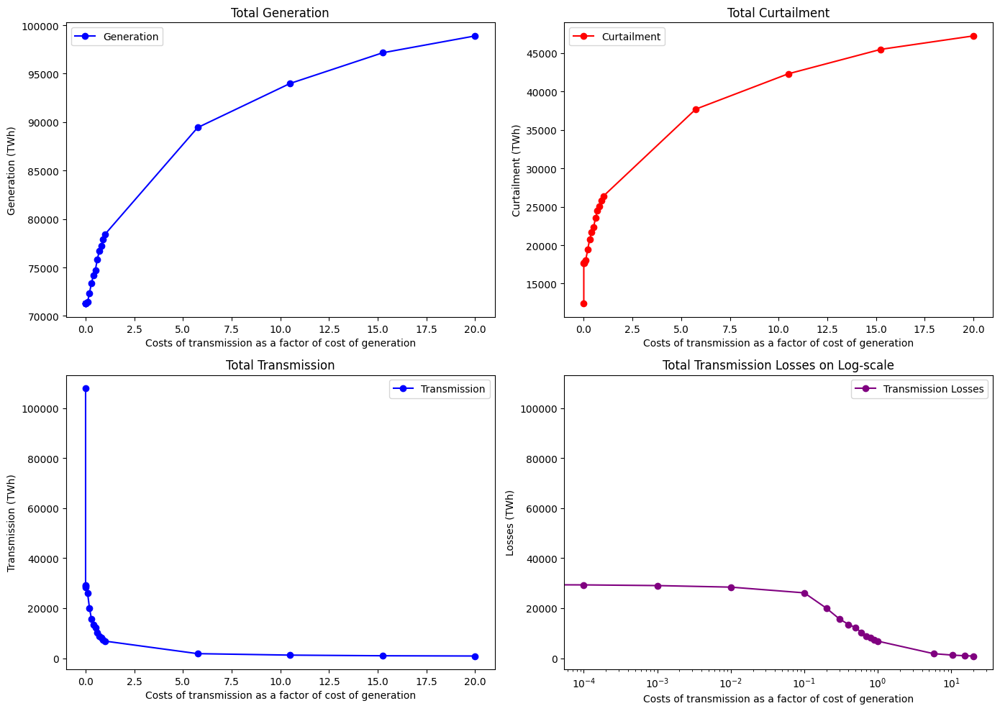

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# Create the 2x2 plot
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Plot for total_generation_list
axs[0, 0].plot(costs, np.array(total_generation_list) * 1e-6, marker='o', linestyle='-', color='blue', label='Generation')
axs[0, 0].set_title('Total Generation')
axs[0, 0].set_xlabel('Costs of transmission as a factor of cost of generation')
axs[0, 0].set_ylabel('Generation (TWh)')
axs[0, 0].grid(False)
axs[0, 0].legend()

# Plot for total_curtailment_list
axs[0, 1].plot(costs, np.array(total_curtailment_list) * 1e-6, marker='o', linestyle='-', color='red', label='Curtailment')
axs[0, 1].set_title('Total Curtailment')
axs[0, 1].set_xlabel('Costs of transmission as a factor of cost of generation')
axs[0, 1].set_ylabel('Curtailment (TWh)')
axs[0, 1].grid(False)
axs[0, 1].legend()

# Plot for total_transmission_list
axs[1, 0].plot(costs, np.array(total_transmission_list) * 1e-6, marker='o', linestyle='-', color='blue', label='Transmission')
axs[1, 0].set_title('Total Transmission')
axs[1, 0].set_xlabel('Costs of transmission as a factor of cost of generation')
axs[1, 0].set_ylabel('Transmission (TWh)')
axs[1, 0].grid(False)
axs[1, 0].legend()

# Plot for total_transmission_losses_list
axs[1, 1].plot(costs, np.array(total_transmission_list) * 1e-6, marker='o', linestyle='-', color='purple', label='Transmission Losses')
axs[1, 1].set_title('Total Transmission Losses on Log-scale')
axs[1, 1].set_xlabel('Costs of transmission as a factor of cost of generation')
axs[1, 1].set_ylabel('Losses (TWh)')
axs[1, 1].set_xscale('log')
axs[1, 1].grid(False)
axs[1, 1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


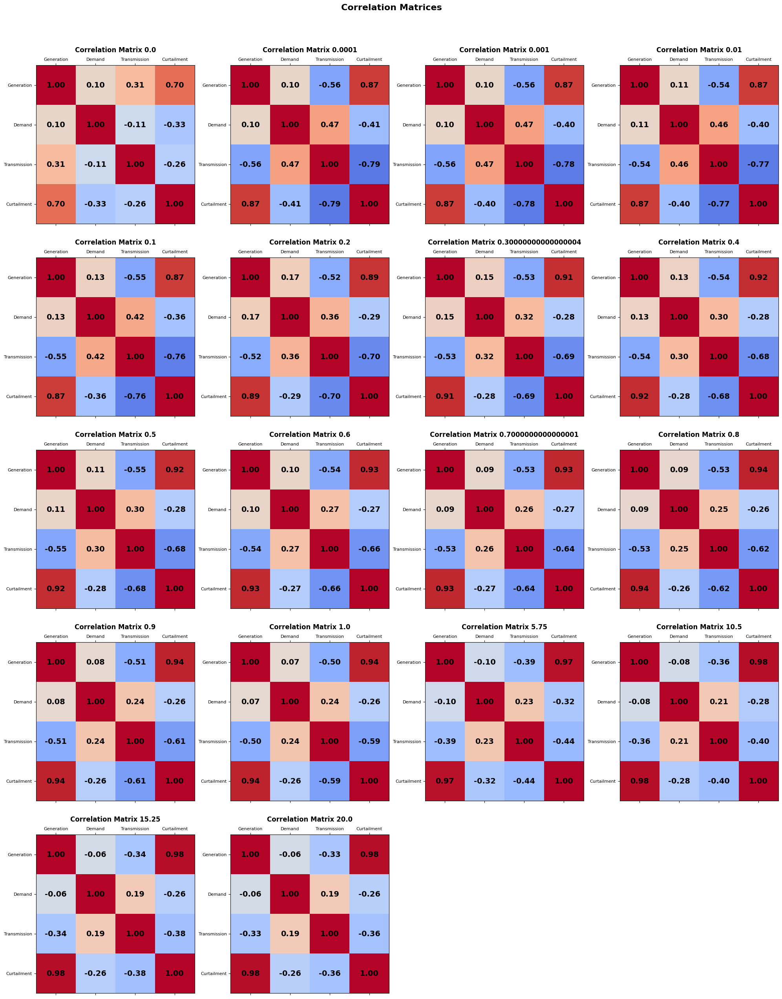

In [24]:
# Number of matrices
n_matrices = len(correlation_matrix_list)

# Define the number of columns and calculate the number of rows needed
n_cols = 4
n_rows = n_matrices // n_cols + int(n_matrices % n_cols != 0)

# Create a figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each matrix
for idx, matrix in enumerate(correlation_matrix_list):
    ax = axes[idx]

    # Display the matrix values with reversed colormap
    cax = ax.matshow(matrix, cmap='coolwarm', vmin=-1, vmax=1)

    # Set axis ticks and labels
    ax.grid(False)
    ax.set_xticks(range(len(matrix.columns)))
    ax.set_yticks(range(len(matrix.index)))
    ax.set_xticklabels(matrix.columns, rotation=0, fontsize=8)
    ax.set_yticklabels(matrix.index, fontsize=8)

    # Add text annotations
    for i in range(len(matrix.columns)):
        for j in range(len(matrix.index)):
            ax.text(i, j, f'{matrix.iloc[j, i]:.2f}', ha='center', va='center', color='black', fontsize=14, fontweight='bold')

    # Title for each subplot
    ax.set_title(f'Correlation Matrix {costs[idx]}', fontsize=12, fontweight='bold', pad=10)

# Remove any unused subplots
for idx in range(n_matrices, len(axes)):
    fig.delaxes(axes[idx])

# Title for the entire figure
plt.suptitle('Correlation Matrices', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Analysis of global grid

### Installed capacity, generation, load, and curtailment

In [182]:
year = 2050
for key, value in regions_dic.items(): # Annual (total) values
    for carrier in ["pv", "wind"]: 
        regions_dic[key][f"{carrier}_installed"] = n.generators_t.p[f"{carrier}_{key}"].max() * 1e-3 # GW # Installed capacities for each node in MW
        regions_dic[key][f"total_{carrier}_yearly"] = n.generators_t.p[f"{carrier}_{key}"].sum(axis=0) * 1e-3 # GW # Total energy generated at each node in MWh
    
    regions_dic[key][f"total_curtailment_yearly"] = n.generators_t.p[f"curtailment_{key}"].sum(axis=0) * 1e-3 # GW # Curtailment at each node in MWh
    regions_dic[key][f"total_load_yearly"] = n.loads_t.p[f"load_{key}"].sum(axis=0) * 1e-3 # GW
 
for key, value in regions_dic.items():
    for carrier in ["pv", "wind"]:
        series_g = n.generators_t.p[f"{carrier}_{key}"] * 1e-3 # GW
        regions_dic[key][f"mean_{carrier}_monthly"] = series_g.groupby(series_g.index.to_period('M')).mean() # MW
        regions_dic[key][f"total_{carrier}_monthly"] = series_g.groupby(series_g.index.to_period('M')).sum() # MWh
        regions_dic[key][f"mean_{carrier}_daily"] = series_g.groupby(series_g.index.date).mean() # MW
        regions_dic[key][f"total_{carrier}_daily"] = series_g.groupby(series_g.index.date).sum() # MW

    series_c = n.generators_t.p[f"curtailment_{key}"] * 1e-3 # GW
    regions_dic[key][f"total_curtailment_daily"] = series_c.groupby(series_c.index.date).sum() # MW
    regions_dic[key][f"mean_curtailment_daily"] = series_c.groupby(series_c.index.date).mean() # MW
    regions_dic[key][f"mean_curtailment_monthly"] = series_c.groupby(series_c.index.to_period('M')).mean() # MW
    regions_dic[key][f"total_curtailment_monthly"] = series_c.groupby(series_c.index.to_period('M')).sum() # MWh

    series_l = n.loads_t.p[f"load_{key}"] * 1e-3 # GW
    regions_dic[key][f"total_load_daily"] = series_l.groupby(series_l.index.date).mean() # MW
    regions_dic[key][f"mean_load_daily"] = series_l.groupby(series_l.index.date).mean() # MW
    regions_dic[key][f"mean_load_monthly"] = series_l.groupby(series_l.index.to_period('M')).mean() # MW
    regions_dic[key][f"total_load_monthly"] = series_l.groupby(series_l.index.to_period('M')).sum() # MWh
    
    

# Daily hourly values of specific days
dates = pd.to_datetime([f"{year}-03-21", f"{year}-06-21", f"{year}-09-21", f"{year}-12-21", f"{year}-04-06"])
for date in dates:
    for key, value in regions_dic.items():
        for carrier in ["pv", "wind"]:
            regions_dic[key][f"hourly_{carrier}_{date}"] = n.generators_t.p[f"{carrier}_{key}"].loc[date.strftime('%Y-%m-%d')] # Generation profile for specific day

        regions_dic[key][f"hourly_load_{date}"] = n.loads_t.p[f"load_{key}"].loc[date.strftime('%Y-%m-%d')] # Load profile for a specific day
        regions_dic[key][f"houtly_curtailment_{date}"] = n.generators_t.p[f"curtailment_{key}"].loc[date.strftime('%Y-%m-%d')] # Curtailment profile for specific day




### Link losses, inflow, and outflow

In [183]:
# Store hourly losses for each link in dictionary
for key, value in links_dic.items():
    p0_0, p1_0 = n.links_t.p0[f'{value["name"]}_0'], n.links_t.p1[f'{value["name"]}_0']
    p0_1, p1_1 = n.links_t.p0[f'{value["name"]}_1'], n.links_t.p1[f'{value["name"]}_1']
    abs_losses = abs(p0_0 + p1_0) + abs(p0_1 + p1_1)
    p_trans = p0_0 + p0_1
    value["hourly_p_trans"] = p_trans
    value["hourly_abs_losses"] = abs_losses

# Calculate total flow for each link and store in data frame
link_flow_data = []
for link_key, link_value in links_dic.items():
    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
    sum_p0_0 = abs(sum(p0_0))
    sum_p0_1 = abs(sum(p0_1))
    net_flow = sum_p0_0 - sum_p0_1
    if net_flow > 0:
        bus0 = link_value["bus0"][1]
        bus1 = link_value["bus1"][1]
    else:
        bus0 = link_value["bus1"][1]
        bus1 = link_value["bus0"][1]
    link_flow_data.append((bus0, bus1, abs(net_flow)))

# Calculate inflow, outflow, and 
for region_key, region_value in regions_dic.items():
    inflow = 0
    outflow = 0
    inflow_series = pd.Series(0, index=n.snapshots)
    outflow_series = pd.Series(0, index=n.snapshots)
    for link_key, link_value in links_dic.items():
        if region_value["bus"] == link_value["bus0"][0]:
            p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
            p1_1 = n.links_t.p1[f"{link_value["name"]}_1"]
            sum_p0_0 = abs(sum(p0_0))
            sum_p1_1 = abs(sum(p1_1))
            outflow += sum_p0_0
            inflow += sum_p1_1
            outflow_series += p0_0
            inflow_series += p1_1
        elif region_value["bus"] == link_value["bus1"][0]:
            p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
            p1_0 = n.links_t.p1[f"{link_value["name"]}_0"]
            sum_p0_1 = abs(sum(p0_1))
            sum_p1_0 = abs(sum(p1_0))
            outflow += sum_p0_1
            inflow += sum_p1_0
            outflow_series += p0_1
            inflow_series += p1_0
    netflow = (outflow - inflow) * 1e-3 # GW
    if netflow < 0:
        region_value["total_actualflow"] = 0
    else:
        region_value["total_actualflow"] = netflow
    region_value["inflow"] = inflow * 1e-3 # GW
    region_value["outflow"] = outflow * 1e-3 # GW
    region_value["netflow"] = netflow 
    region_value["actualflow"] = (outflow_series - inflow_series) * 1e-3 # GW
    region_value["actualflow"] = np.where(region_value["actualflow"] < 0, 0, region_value["actualflow"])

# Compute total power transmitted for each hour
total_actual_flow = pd.Series(0, index=n.snapshots)
for key, value in regions_dic.items():
    total_actual_flow += value["actualflow"]

# Compute inflow, outflow direction per link
flow_statements = []
netflows_links = []
for link_key, link_value in links_dic.items():
    p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
    p0_1 = n.links_t.p0[f"{link_value["name"]}_1"]
    p1_1 = n.links_t.p1[f"{link_value["name"]}_1"]
    sum_p0_0 = abs(sum(p0_0))
    sum_p0_1 = abs(sum(p1_1))
    net_flow = abs(sum_p0_0 - sum_p0_1)
    if sum_p0_0 > sum_p0_1:
        flow_statement = True # outflow
    else:
        flow_statement = False
    flow_statements.append(flow_statement)
    netflows_links.append(net_flow)

# Sum the losses of the links
total_hourly_abs_losses = pd.Series(0, index=n.snapshots)
total_hourly_p_trans = pd.Series(0, index=n.snapshots)
for key, value in links_dic.items():
    total_hourly_abs_losses += value["hourly_abs_losses"]
    total_hourly_p_trans += value["hourly_p_trans"]

# Absolute losses
total_daily_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.date).sum()
total_monthly_abs_losses = total_hourly_abs_losses.groupby(total_hourly_abs_losses.index.to_period('M')).sum()
total_annual_abs_losses = total_hourly_abs_losses.sum()

# Power transmitted
total_daily_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum()
total_monthly_p_trans = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum()
total_annual_p_trans = total_hourly_p_trans.sum()

# Relative losses
daily_rel_losses = total_daily_abs_losses / total_daily_p_trans
monthly_rel_losses = total_monthly_abs_losses / total_monthly_p_trans
annual_rel_losses = total_annual_abs_losses / total_annual_p_trans

# Statistics of the losses
mean_losses = total_hourly_abs_losses.mean()
std_losses = total_hourly_abs_losses.std()
daily_deviation = daily_rel_losses - daily_rel_losses.mean()
monthly_deviation = monthly_rel_losses - monthly_rel_losses.mean()

In [184]:
# Sum loads of dictionaries
total_hourly_load = pd.Series(0, index=n.snapshots)
for key, value in regions_dic.items():
    total_hourly_load += n.loads_t.p[f"load_{key}"]

# Load 
total_daily_load = total_hourly_load.groupby(total_hourly_load.index.date).sum()
total_monthly_load = total_hourly_load.groupby(total_hourly_load.index.to_period('M')).sum()
total_annual_load = total_hourly_load.sum()

# Losses relative to load
hourly_losses_rel_to_load = total_hourly_abs_losses / total_hourly_load
daily_losses_rel_to_load = total_daily_abs_losses / total_daily_load
monthly_losses_rel_to_load = total_monthly_abs_losses / total_monthly_load
annual_losses_rel_to_load = total_annual_abs_losses / total_annual_load

In [185]:
# Sum generation of nodes
total_hourly_gen = pd.Series(0, index=n.snapshots)
total_hourly_wind = pd.Series(0, index=n.snapshots)
total_hourly_pv = pd.Series(0, index=n.snapshots)
total_hourly_cur = pd.Series(0, index=n.snapshots)
total_actual_flow_int = 0
for key, value in regions_dic.items():
    total_hourly_gen += n.generators_t.p[f"wind_{key}"] + n.generators_t.p[f"pv_{key}"]
    total_hourly_cur += n.generators_t.p[f"curtailment_{key}"]
    total_hourly_pv += n.generators_t.p[f"pv_{key}"]
    total_hourly_wind += n.generators_t.p[f"wind_{key}"]
    total_actual_flow_int += value["total_actualflow"]

# Generation total
total_daily_gen = total_hourly_gen.groupby(total_hourly_gen.index.date).sum()
total_monthly_gen = total_hourly_gen.groupby(total_hourly_gen.index.to_period('M')).sum()
total_annual_gen = total_hourly_gen.sum()

# Generation wind
total_daily_wind = total_hourly_wind.groupby(total_hourly_wind.index.date).sum()
total_monthly_wind = total_hourly_wind.groupby(total_hourly_wind.index.to_period('M')).sum()
total_annual_wind = total_hourly_wind.sum()

# Generation pv
total_daily_pv = total_hourly_pv.groupby(total_hourly_pv.index.date).sum()
total_monthly_pv = total_hourly_pv.groupby(total_hourly_pv.index.to_period('M')).sum()
total_annual_pv = total_hourly_pv.sum()

# Curtailment
total_daily_cur = total_hourly_cur.groupby(total_hourly_cur.index.date).sum()
total_monthly_cur = total_hourly_cur.groupby(total_hourly_cur.index.to_period('M')).sum()
total_annual_cur = total_hourly_cur.sum()

# Losses relative to gen
hourly_losses_rel_to_gen = total_hourly_abs_losses / total_hourly_gen
daily_losses_rel_to_gen = total_daily_abs_losses / total_daily_gen
monthly_losses_rel_to_gen = total_monthly_abs_losses / total_monthly_gen
annual_losses_rel_to_gen = total_annual_abs_losses / total_annual_gen

# Curtailment relative to gen
hourly_cur_rel_to_gen = total_hourly_cur / total_hourly_gen
daily_cur_rel_to_gen = total_daily_cur / total_daily_gen
monthly_cur_rel_to_gen = total_monthly_cur / total_monthly_gen
annual_cur_rel_to_gen = total_annual_cur / total_annual_gen

# Power transmitted rel to gen
hourly_p_trans_rel_gen = total_hourly_p_trans / total_hourly_gen
daily_p_trans_rel_gen = total_hourly_p_trans.groupby(total_hourly_p_trans.index.date).sum() / total_daily_gen
monthly_p_trans_rel_gen = total_hourly_p_trans.groupby(total_hourly_p_trans.index.to_period('M')).sum() / total_monthly_gen
annual_p_trans_rel_gen = total_hourly_p_trans.sum() / total_annual_gen

# Actual flow 
hourly_actual_flow_rel_gen = total_actual_flow / total_hourly_gen

# Statistics of the losses
daily_deviation_gen = daily_losses_rel_to_gen - daily_losses_rel_to_gen.mean()
monthly_deviation_gen = monthly_losses_rel_to_gen - monthly_losses_rel_to_gen.mean()

In [186]:
months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']
month_periods = pd.period_range(start='2050-01', periods=12, freq='M')
month_to_period = {month: period for month, period in zip(months, month_periods)}
for i, month in enumerate(months):
    period = month_to_period[month]
    for region_key, region_value in regions_dic.items():
        inflow = 0
        outflow = 0
        for link_key, link_value in links_dic.items():
            if region_value["bus"] == link_value["bus0"][0]:
                p0_0 = n.links_t.p0[f"{link_value["name"]}_0"]
                p1_1 = n.links_t.p1[f"{link_value["name"]}_1"]
                monthly_p0_0 = p0_0.groupby(p0_0.index.to_period('M')).sum()
                monthly_p1_1 = p1_1.groupby(p1_1.index.to_period('M')).sum()
                sum_p0_0 = abs(monthly_p0_0.loc[period])
                sum_p1_1 = abs(monthly_p1_1.loc[period])
                outflow += sum_p0_0
                inflow += sum_p1_1
            elif region_value["bus"] == link_value["bus1"][0]:
                p0_0 = n.links_t.p0[f"{link_value["name"]}_1"]
                p1_1 = n.links_t.p1[f"{link_value["name"]}_0"]
                monthly_p0_0 = p0_0.groupby(p0_0.index.to_period('M')).sum()
                monthly_p1_1 = p1_1.groupby(p1_1.index.to_period('M')).sum()
                sum_p0_0 = abs(monthly_p0_0.loc[period])
                sum_p1_1 = abs(monthly_p1_1.loc[period])
                outflow += sum_p0_0
                inflow += sum_p1_1
        region_value[f"inflow_{month}"] = inflow * 1e-3 # GW
        region_value[f"outflow_{month}"] = outflow * 1e-3 # GW
        region_value[f"netflow_{month}"] = (inflow - outflow) * 1e-3 # GW


In [187]:
wind_share = total_annual_wind / total_annual_gen * 100
pv_share = 100 - wind_share
print('TRANSMISSION COST: 10% OF GENERATION')
print(f'Total generation: {total_annual_gen:.2e}')
print(f'Wind: {round(wind_share, 1)} PV: {round(pv_share, 1)}')
print(f'Total curtailment: {total_annual_cur:.2e}')
print(f'Total transmission: {total_annual_p_trans:.2e}')
print(f'Total net transmission: {total_actual_flow_int:.2e}')
print(f'Total transmission losses: {round(annual_losses_rel_to_gen, 3)}')

TRANSMISSION COST: 10% OF GENERATION
Total generation: 7.14e+10
Wind: 76.8 PV: 23.2
Total curtailment: 1.81e+10
Total transmission: 2.61e+10
Total net transmission: 1.46e+07
Total transmission losses: 0.025


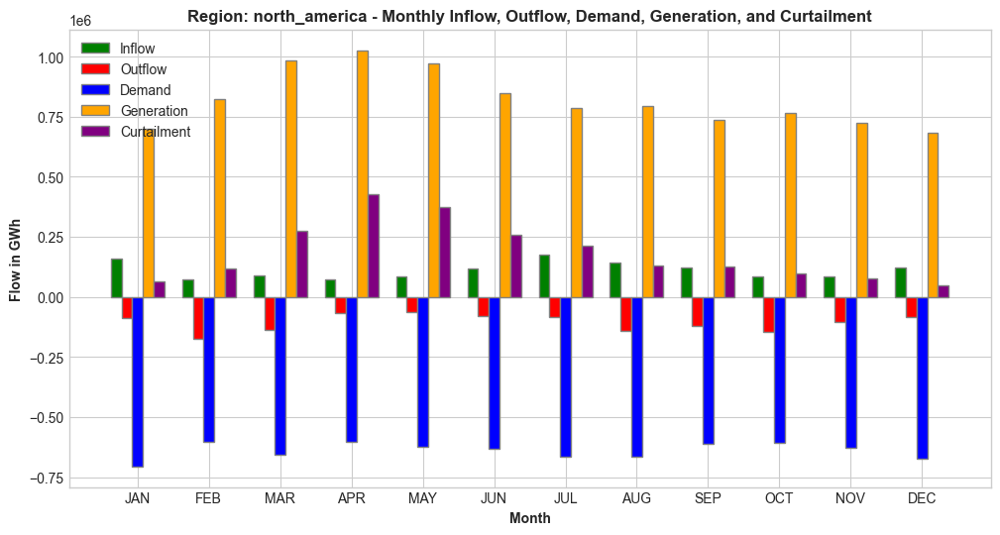

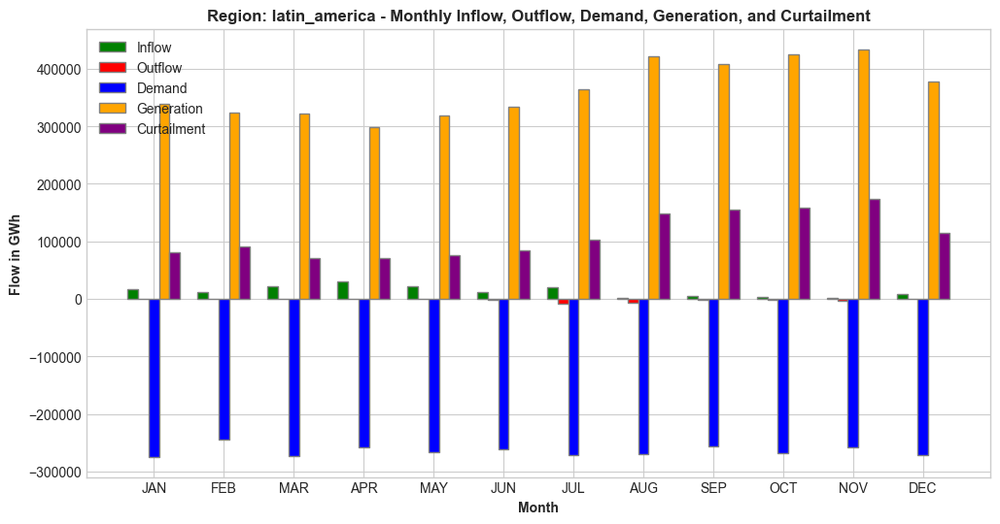

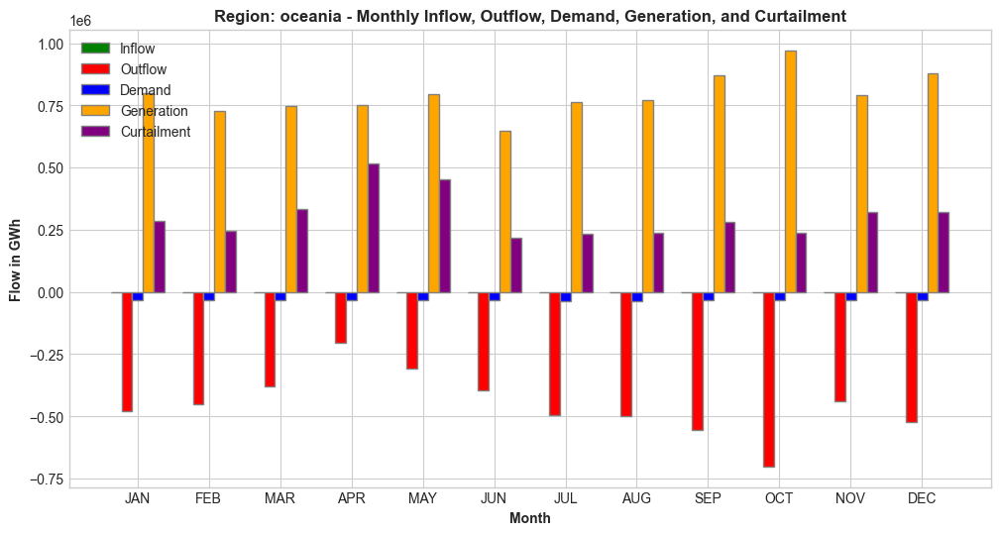

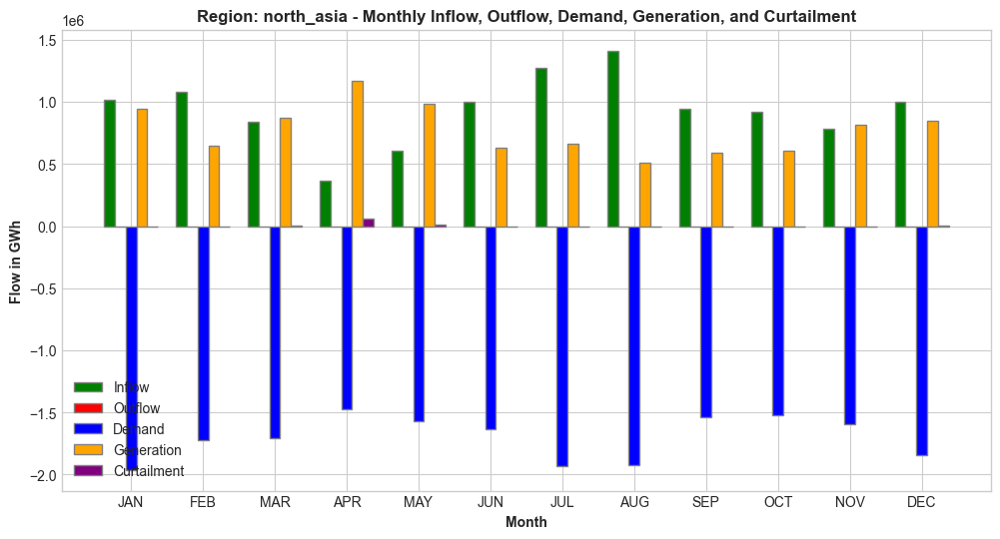

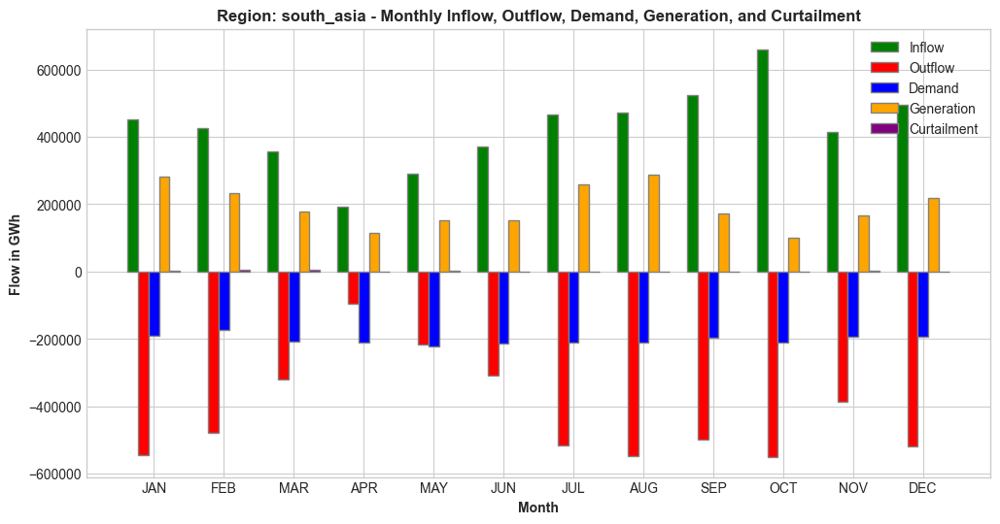

...

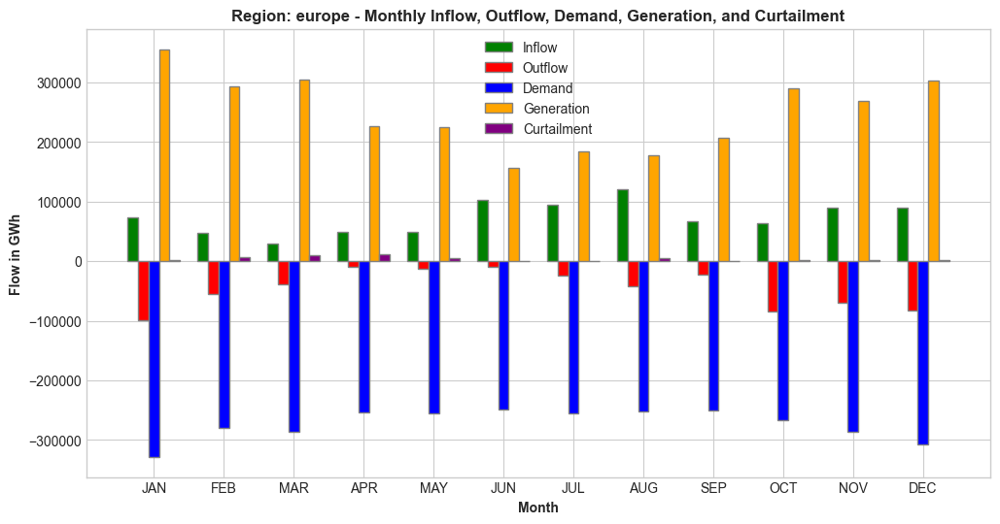

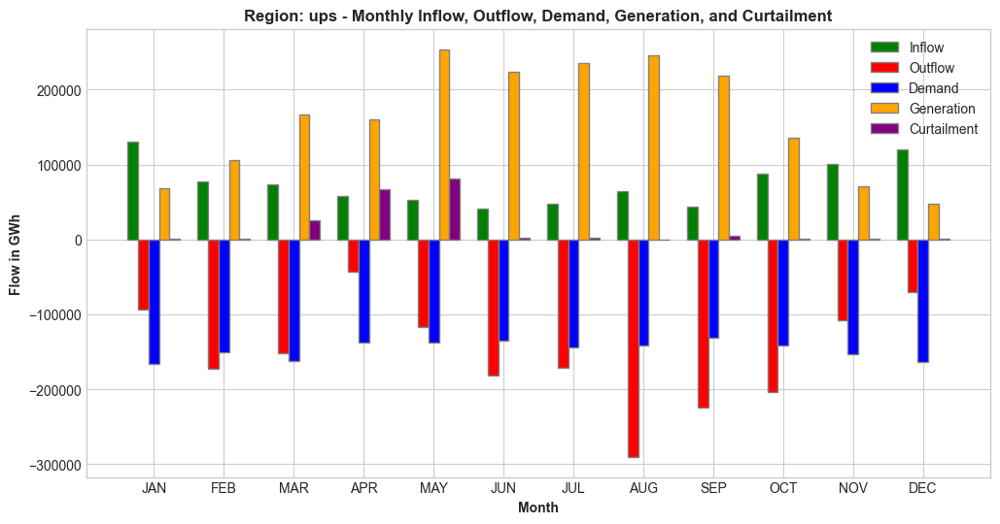

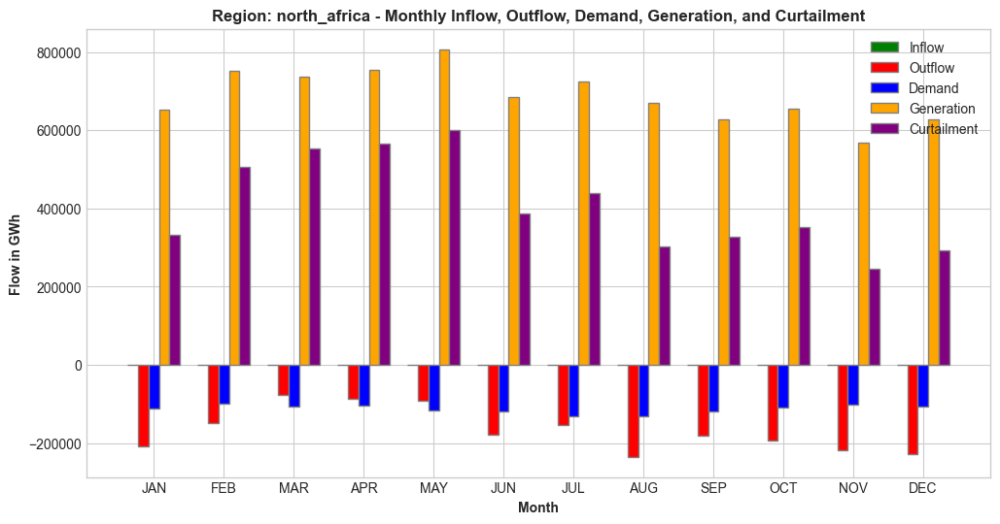

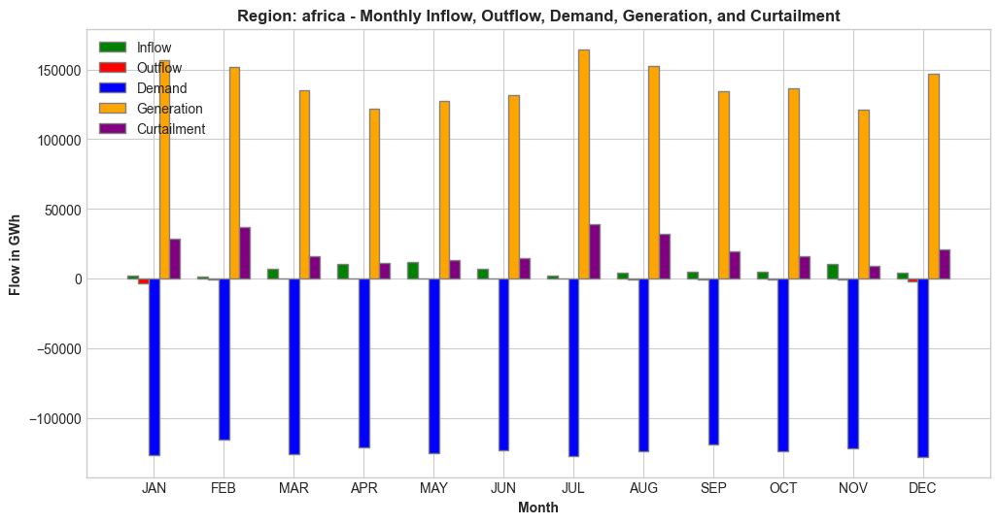

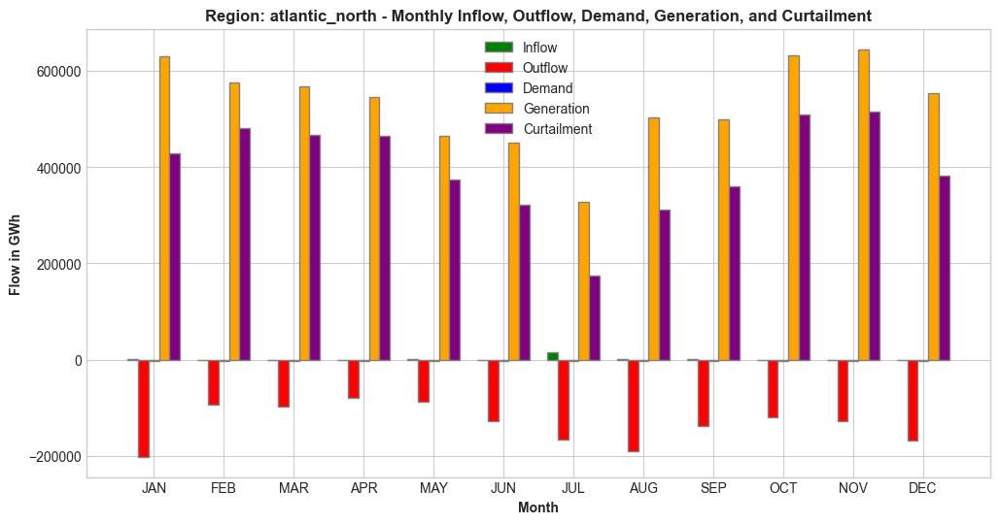

In [188]:
import matplotlib.pyplot as plt
import pandas as pd

# Define months and their corresponding periods
months = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']
month_periods = pd.period_range(start='2050-01', periods=12, freq='M')

# Function to create bar charts for each region
def plot_region_monthly_data(region_key, region_value):
    inflows = [region_value[f'inflow_{month}'] for month in months]
    outflows = [region_value[f'outflow_{month}'] for month in months]
    loads = [region_value[f'total_load_monthly'].loc[period]  for period in month_periods]
    generations = [(region_value[f'total_pv_monthly'].loc[period] + region_value[f'total_wind_monthly'].loc[period])  for period in month_periods]
    curtailments = [region_value[f'total_curtailment_monthly'].loc[period] for period in month_periods]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 6))

    # Define the width of the bars
    bar_width = 0.15
    # Define the positions of the bars
    r1 = range(len(months))
    r2 = [x + bar_width for x in r1]
    r3 = [x + bar_width for x in r2]
    r4 = [x + bar_width for x in r3]
    r5 = [x + bar_width for x in r4]

    # Plotting the bars
    ax.bar(r1, inflows, color='green', width=bar_width, edgecolor='grey', label='Inflow')
    ax.bar(r2, [-outflow for outflow in outflows], color='red', width=bar_width, edgecolor='grey', label='Outflow')
    ax.bar(r3, [-load for load in loads], color='blue', width=bar_width, edgecolor='grey', label='Demand')
    ax.bar(r4, generations, color='orange', width=bar_width, edgecolor='grey', label='Generation')
    ax.bar(r5, curtailments, color='purple', width=bar_width, edgecolor='grey', label='Curtailment')

    # Add labels and title
    ax.set_xlabel('Month', fontweight='bold')
    ax.set_ylabel('Flow in GWh', fontweight='bold')
    ax.set_title(f'Region: {region_key} - Monthly Inflow, Outflow, Demand, Generation, and Curtailment', fontweight='bold')
    ax.set_xticks([r + 2*bar_width for r in range(len(months))])
    ax.set_xticklabels(months)
    ax.legend()

    # Show plot
    plt.show()

# Plot bar charts for each region
for region_key, region_value in regions_dic.items():
    plot_region_monthly_data(region_key, region_value)


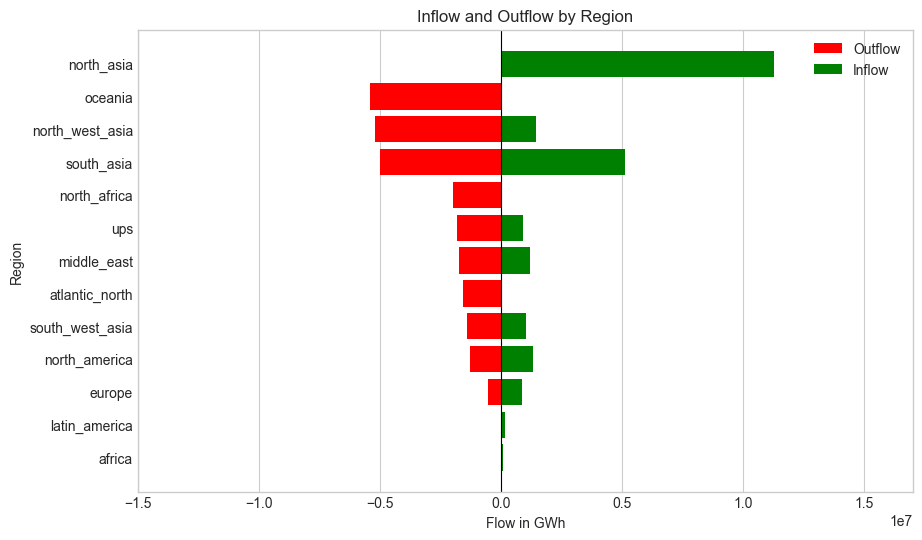

In [189]:
# Calculate the maximum flow for each region and store it along with region data
regions_data = [
    (region_key, region_value['inflow'], region_value['outflow'], max(region_value['inflow'], region_value['outflow']))
    for region_key, region_value in regions_dic.items()
]

# Sort the regions by the maximum flow in descending order
regions_data.sort(key=lambda x: x[3], reverse=False)

# Extract sorted data
regions = [item[0] for item in regions_data]
inflows = [item[1] for item in regions_data]
outflows = [item[2] for item in regions_data]

# Create a horizontal bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Plot outflows (negative values for left side)
ax.barh(regions, [-outflow for outflow in outflows], color='red', label='Outflow')
ax.grid(False)
# Plot inflows
ax.barh(regions, inflows, color='green', label='Inflow')

# Add a vertical line at x=0 to separate inflows and outflows
ax.axvline(x=0, color='black', linewidth=0.8)

# Add labels and title
ax.set_xlim(-1.5e7, 1.7e7)
ax.set_xlabel('Flow in GWh')
ax.set_ylabel('Region')
ax.set_title('Inflow and Outflow by Region')
ax.grid(True, axis='x')
ax.legend()

# Show plot
plt.show()

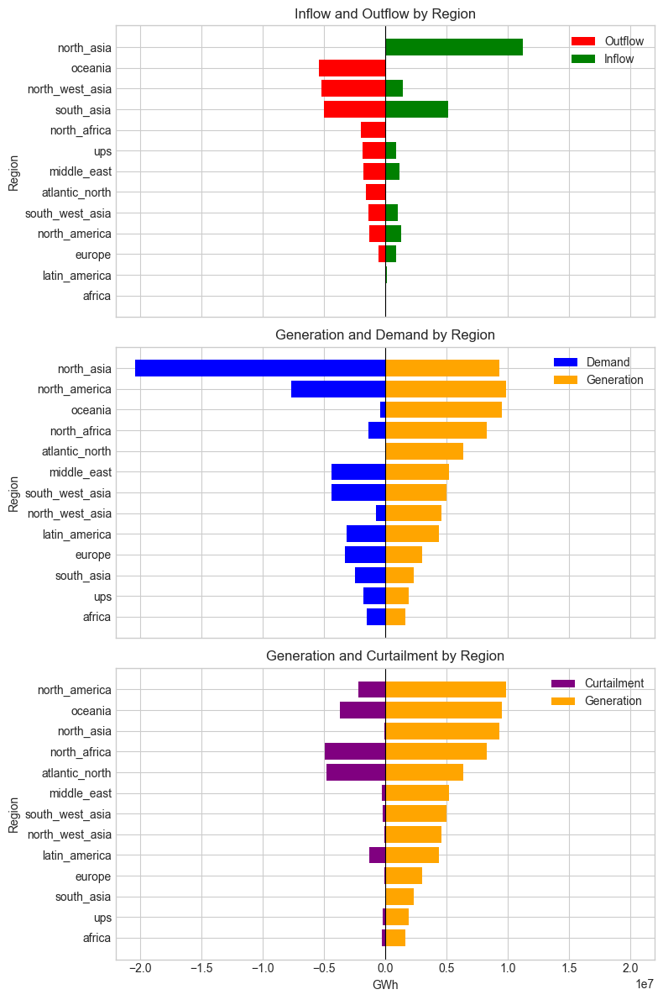

In [199]:
import matplotlib.pyplot as plt

# Assuming regions_dic is available and contains necessary data

# Prepare data for inflow and outflow plot
inflow_outflow_data = [
    (region_key, region_value['inflow'], region_value['outflow'])
    for region_key, region_value in regions_dic.items()
]
inflow_outflow_data.sort(key=lambda x: max(x[1], x[2]), reverse=True)

# Prepare data for generation and demand plot
generation_demand_data = [
    (region_key, region_value['total_wind_yearly'] + region_value['total_pv_yearly'], region_value['total_load_yearly'])
    for region_key, region_value in regions_dic.items()
]
generation_demand_data.sort(key=lambda x: max(x[1], x[2]), reverse=True)

# Prepare data for generation and curtailment plot
generation_curtailment_data = [
    (region_key, region_value['total_wind_yearly'] + region_value['total_pv_yearly'], region_value['total_curtailment_yearly'])
    for region_key, region_value in regions_dic.items()
]
generation_curtailment_data.sort(key=lambda x: max(x[1], x[2]), reverse=True)

# Extract sorted data for inflow and outflow
regions_inflow_outflow = [item[0] for item in inflow_outflow_data]
inflows = [item[1] for item in inflow_outflow_data]
outflows = [item[2] for item in inflow_outflow_data]

# Extract sorted data for generation and demand
regions_generation_demand = [item[0] for item in generation_demand_data]
generations_demand = [item[1] for item in generation_demand_data]
demands = [item[2] for item in generation_demand_data]

# Extract sorted data for generation and curtailment
regions_generation_curtailment = [item[0] for item in generation_curtailment_data]
generations_curtailment = [item[1] for item in generation_curtailment_data]
curtailments = [item[2] for item in generation_curtailment_data]

# Create the 3x1 plot
fig, axs = plt.subplots(3, 1, figsize=(8, 12), sharex=True)

# Plot for inflow and outflow
axs[0].barh(regions_inflow_outflow, [-outflow for outflow in outflows], color='red', label='Outflow')
axs[0].barh(regions_inflow_outflow, inflows, color='green', label='Inflow')
axs[0].axvline(x=0, color='black', linewidth=0.8)
axs[0].set_xlim(-2.2e7, 2.2e7)
axs[0].set_ylabel('Region')
axs[0].set_title('Inflow and Outflow by Region')
axs[0].grid(True, axis='x')
axs[0].legend()
axs[0].invert_yaxis()  # Invert y-axis to have the largest value on top

# Plot for generation and demand
axs[1].barh(regions_generation_demand, [-demand for demand in demands], color='blue', label='Demand')
axs[1].barh(regions_generation_demand, generations_demand, color='orange', label='Generation')
axs[1].axvline(x=0, color='black', linewidth=0.8)
axs[1].set_xlim(-2.2e7, 2.2e7)
axs[1].set_ylabel('Region')
axs[1].set_title('Generation and Demand by Region')
axs[1].grid(True, axis='x')
axs[1].legend()
axs[1].invert_yaxis()  # Keep y-axis consistent

# Plot for generation and curtailment
axs[2].barh(regions_generation_curtailment, [-curtailment for curtailment in curtailments], color='purple', label='Curtailment')
axs[2].barh(regions_generation_curtailment, generations_curtailment, color='orange', label='Generation')
axs[2].axvline(x=0, color='black', linewidth=0.8)
axs[2].set_xlim(-2.2e7, 2.2e7)
axs[2].set_xlabel('GWh')
axs[2].set_ylabel('Region')
axs[2].set_title('Generation and Curtailment by Region')
axs[2].grid(True, axis='x')
axs[2].legend()
axs[2].invert_yaxis()  # Keep y-axis consistent

# Adjust layout
plt.tight_layout()
plt.show()


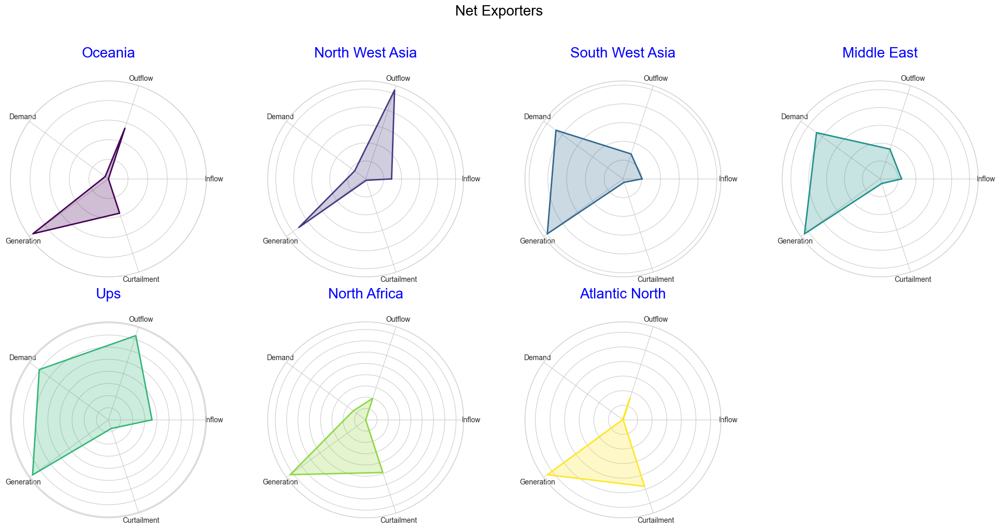

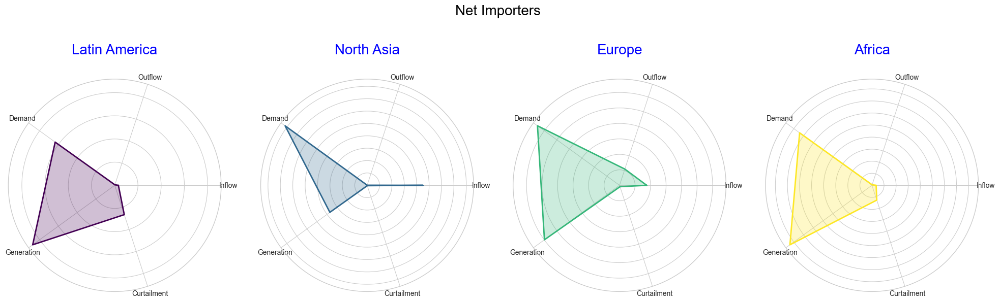

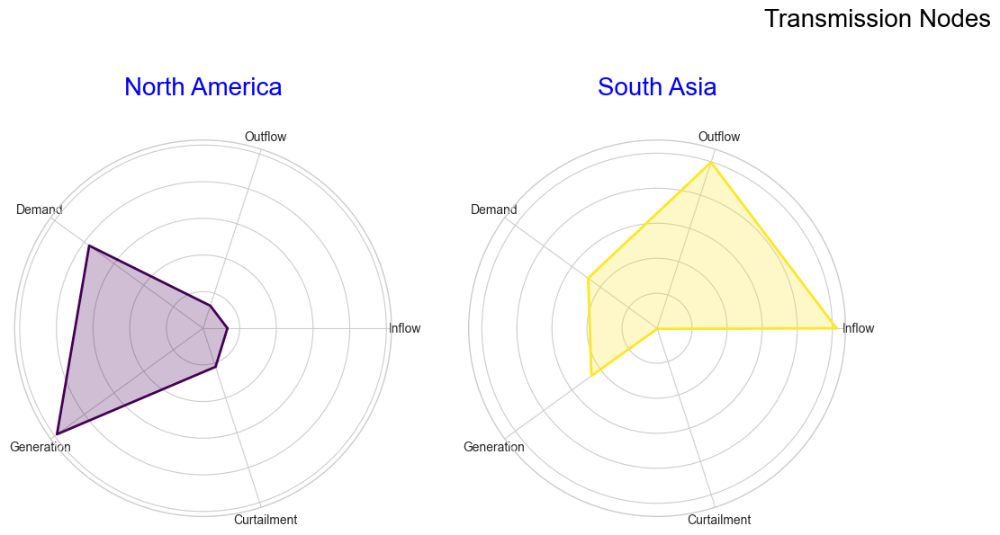

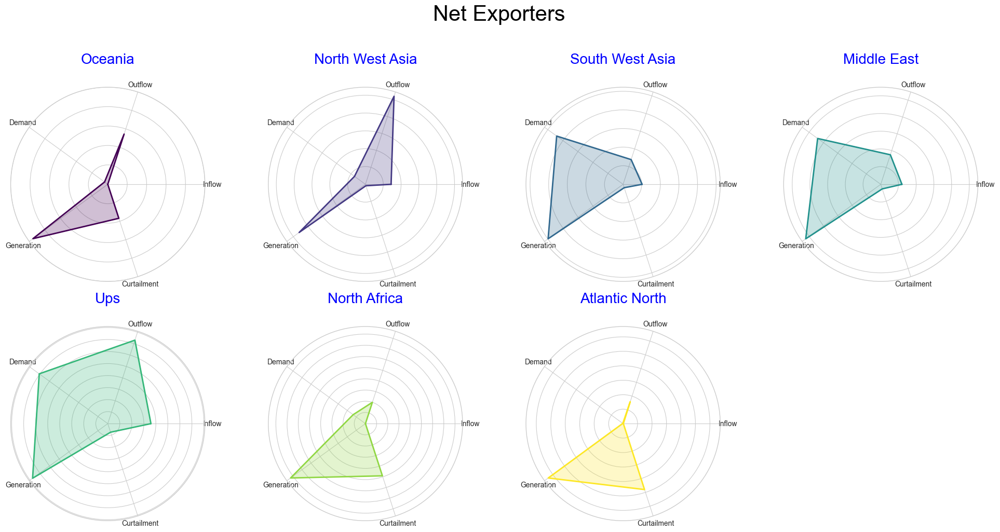

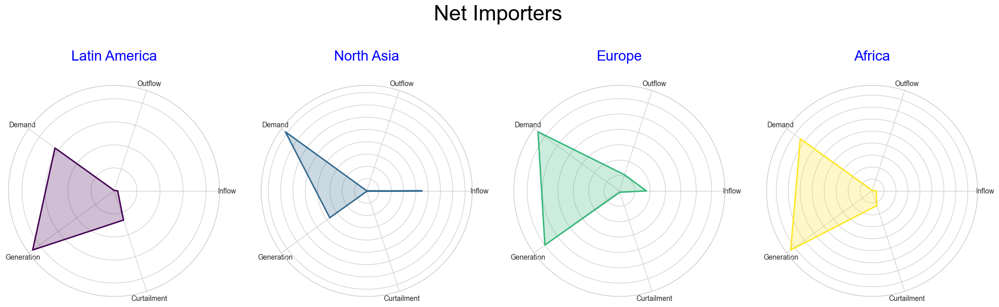

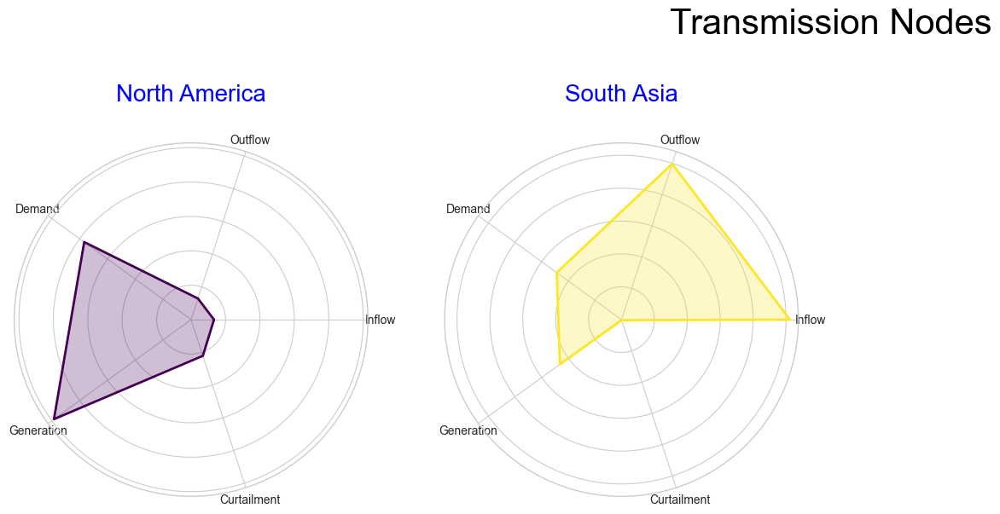

In [115]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from math import pi

# Sample data preparation (using the actual data from your regions_dic)
regions = list(regions_dic.keys())
variables = ['Inflow', 'Outflow', 'Demand', 'Generation', 'Curtailment']

# Prepare data
data = {
    region_key: [
        region_value['inflow'],  # Normalize to generation
        region_value['outflow'],  # Normalize to generation
        (region_value['total_load_yearly']),  # Normalize to generation
        (region_value['total_wind_yearly'] + region_value['total_pv_yearly']),  # Generation normalized to itself
        region_value['total_curtailment_yearly']    # Normalize to generation
    ]
    for region_key, region_value in regions_dic.items()
}

# Convert data to DataFrame
df = pd.DataFrame(data, index=variables)

# Classify regions with tolerance of 10%
tolerance = 0.25
exporters = []
importers = []
transmission_nodes = []

for region in df.columns:
    inflow = df[region]['Inflow']
    outflow = df[region]['Outflow']
    if inflow > outflow * (1 + tolerance):
        importers.append(region)
    elif outflow > inflow * (1 + tolerance):
        exporters.append(region)
    elif inflow != 0 and outflow != 0 and abs(inflow - outflow) <= tolerance * max(inflow, outflow):
        transmission_nodes.append(region)

# Function to plot radar charts
def plot_radar_charts(regions, title):
    num_vars = len(variables)
    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += angles[:1]

    fig, axs = plt.subplots(3, 4, figsize=(20, 15), subplot_kw=dict(polar=True))
    axs = axs.flatten()
    colors = plt.cm.viridis(np.linspace(0, 1, len(regions)))

    for i, (region, color) in enumerate(zip(regions, colors)):
        values = df[region].tolist()
        values += values[:1]
        ax = axs[i]
        ax.plot(angles, values, linewidth=2, linestyle='solid', color=color)
        ax.fill(angles, values, color=color, alpha=0.25)
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(variables)
        ax.set_yticklabels([])
        formatted_title = format_title(region)
        ax.set_title(formatted_title, size=20, color='blue', y=1.1)

    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.suptitle(title, size=30, color='black')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Function to format titles
def format_title(title):
    return ' '.join(word.capitalize() for word in title.split('_'))

# Plot radar charts for exporters
plot_radar_charts(exporters, 'Net Exporters')

# Plot radar charts for importers
plot_radar_charts(importers, 'Net Importers')

# Plot radar charts for transmission nodes
if transmission_nodes:
    plot_radar_charts(transmission_nodes, 'Transmission Nodes')


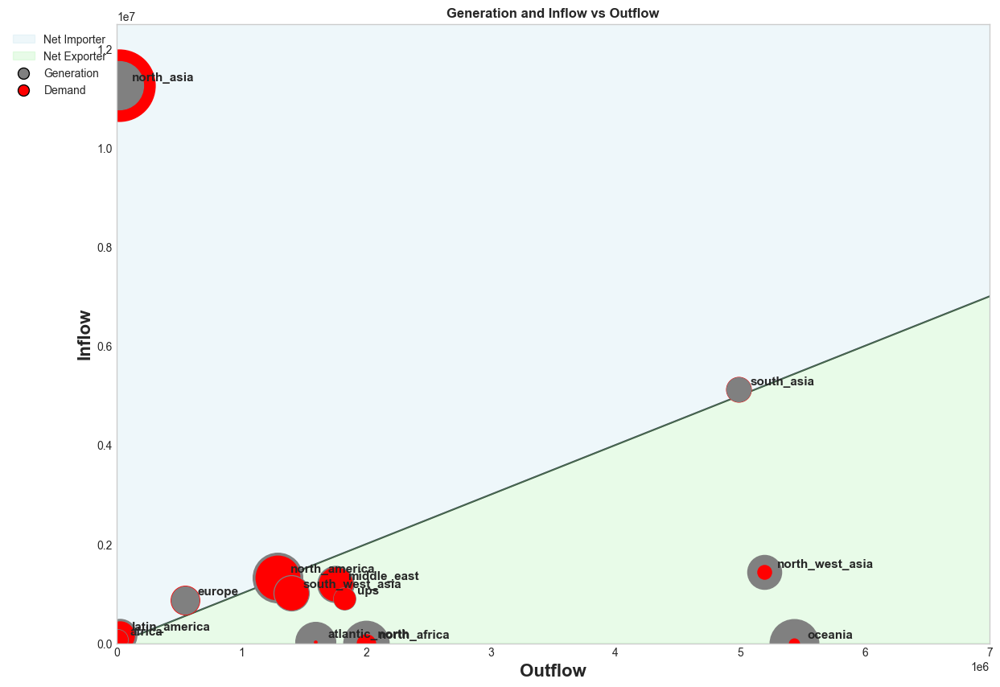

In [137]:
import matplotlib.pyplot as plt

# Sample data preparation (using the actual data from your regions_dic)
regions_data = [
    (
        region_key,
        region_value['inflow'],  
        region_value['outflow'], 
        region_value['total_load_yearly'], 
        (region_value['total_wind_yearly'] + region_value['total_pv_yearly']),  
    )
    for region_key, region_value in regions_dic.items()
]

# Extracting inflow, outflow, and generation
inflow = [data[1] for data in regions_data]
outflow = [data[2] for data in regions_data]
generation = [data[4] for data in regions_data]  # total_wind_yearly + total_pv_yearly
demand = [data[3] for data in regions_data]
region_names = [data[0] for data in regions_data]

# Plotting
plt.figure(figsize=(14, 10))

# Shading regions
plt.fill_between([0, 1.9e7], [0, 1.9e7], 1.9e7, color='lightblue', alpha=0.2, label='Net Importer')
plt.fill_between([0, 1.9e7], 0, [0, 1.9e7], color='lightgreen', alpha=0.2, label='Net Exporter')

# Adding y=x line
plt.plot([0, 0, 1.9e7, 1.9e7], 
         [0, 0, 1.9e7, 1.9e7], 
         '-',  zorder=0, color='black')

# Scatter plot with distinct colors
scale = 0.2e-3
for i, name in enumerate(region_names):
    if generation[i] > demand[i]:
        plt.scatter(outflow[i], inflow[i], s=generation[i] * scale , alpha=1.0, color='gray')
        plt.scatter(outflow[i], inflow[i], s=demand[i] * scale , alpha=1.0, color='red')
    else:
        plt.scatter(outflow[i], inflow[i], s=demand[i] * scale , alpha=1.0, color='red')
        plt.scatter(outflow[i], inflow[i], s=generation[i] * scale , alpha=1.0, color='gray')

# Add legend entries with fixed circle sizes
plt.scatter([], [], color='gray', s=100, edgecolor='black', label='Generation')
plt.scatter([], [], color='red', s=100, edgecolor='black', label='Demand')

# Labels and title
plt.xlabel('Outflow', fontweight='bold', fontsize=16)
plt.ylabel('Inflow', fontweight='bold', fontsize=16)
plt.xlim(0, 0.7e7)
plt.ylim(0, 1.25e7)
plt.grid(False)
plt.title('Generation and Inflow vs Outflow', fontweight='bold')

# Annotating points with a small offset
offset = 0.01e7  
for i, name in enumerate(region_names):
    plt.annotate(name, (outflow[i] + offset, inflow[i] + offset), fontsize=11, fontweight='bold', ha='left')

# Place legend outside the plot
plt.legend(loc='upper right', bbox_to_anchor=(0, 1))

plt.show()


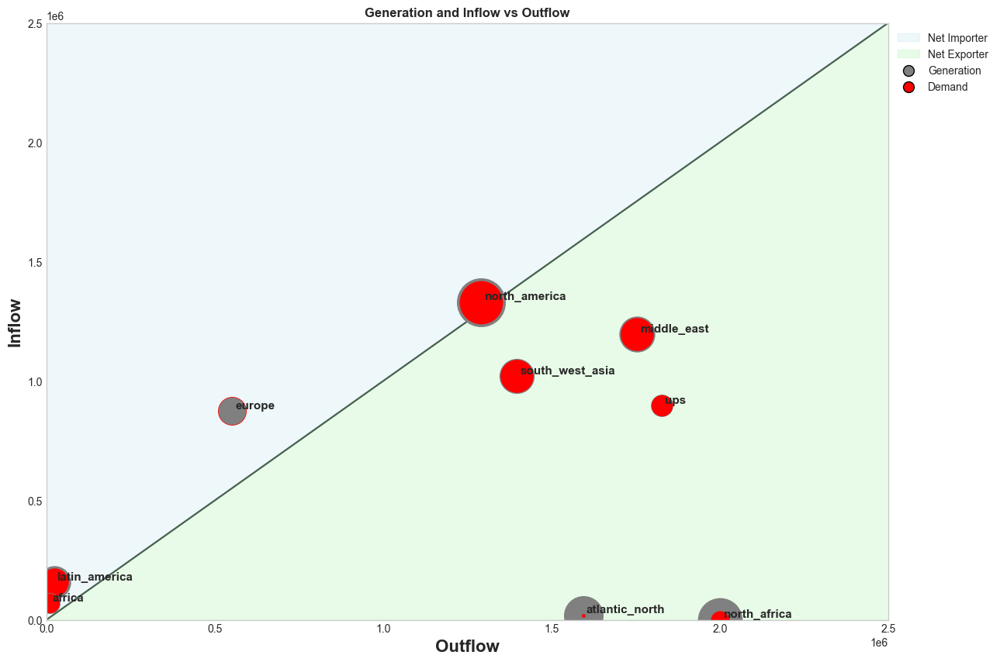

In [127]:
import matplotlib.pyplot as plt

# Sample data preparation (using the actual data from your regions_dic)
regions_data = [
    (
        region_key,
        region_value['inflow'],  
        region_value['outflow'], 
        region_value['total_load_yearly'], 
        (region_value['total_wind_yearly'] + region_value['total_pv_yearly']),  
    )
    for region_key, region_value in regions_dic.items()
]

# Extracting inflow, outflow, and generation
inflow = [data[1] for data in regions_data]
outflow = [data[2] for data in regions_data]
generation = [data[4] for data in regions_data]  # total_wind_yearly + total_pv_yearly
demand = [data[3] for data in regions_data]
region_names = [data[0] for data in regions_data]

# Plotting
plt.figure(figsize=(14, 10))

# Shading regions
plt.fill_between([0, 1.9e7], [0, 1.9e7], 1.9e7, color='lightblue', alpha=0.2, label='Net Importer')
plt.fill_between([0, 1.9e7], 0, [0, 1.9e7], color='lightgreen', alpha=0.2, label='Net Exporter')

# Adding y=x line
plt.plot([0, 0, 1.9e7, 1.9e7], 
         [0, 0, 1.9e7, 1.9e7], 
         '-',  zorder=0, color='black')

# Scatter plot with distinct colors
scale = 0.2e-3
for i, name in enumerate(region_names):
    if generation[i] > demand[i]:
        plt.scatter(outflow[i], inflow[i], s=generation[i] * scale , alpha=1.0, color='gray')
        plt.scatter(outflow[i], inflow[i], s=demand[i] * scale , alpha=1.0, color='red')
    else:
        plt.scatter(outflow[i], inflow[i], s=demand[i] * scale , alpha=1.0, color='red')
        plt.scatter(outflow[i], inflow[i], s=generation[i] * scale , alpha=1.0, color='gray')

# Add legend entries with fixed circle sizes
plt.scatter([], [], color='gray', s=100, edgecolor='black', label='Generation')
plt.scatter([], [], color='red', s=100, edgecolor='black', label='Demand')

# Labels and title
plt.xlabel('Outflow', fontweight='bold', fontsize=16)
plt.ylabel('Inflow', fontweight='bold', fontsize=16)
plt.xlim(0, 0.25e7)
plt.ylim(0, 0.25e7)
plt.grid(False)
plt.title('Generation and Inflow vs Outflow', fontweight='bold')

# Annotating points with a small offset
offset = 0.001e7  
for i, name in enumerate(region_names):
    plt.annotate(name, (outflow[i] + offset, inflow[i] + offset), fontsize=11, fontweight='bold', ha='left')

# Place legend outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

Plot with generation over demand 

Chord diagram

In [53]:
regions_dic.keys()

dict_keys(['north_america', 'latin_america', 'oceania', 'north_asia', 'south_asia', 'north_west_asia', 'south_west_asia', 'middle_east', 'europe', 'ups', 'north_africa', 'africa', 'atlantic_north'])

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
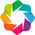

:Chord   [source,target]   (value)

In [54]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim

hv.extension('bokeh')
hv.output(size=200)

links = pd.DataFrame(link_flow_data, columns=['source', 'target', 'value'])

# Convert the keys of the dictionary to a list and create a DataFrame
regions_df = pd.DataFrame(list(regions_dic.keys()), columns=['index'])

# Create a Dataset for nodes
nodes = hv.Dataset(regions_df, 'index')

chord = hv.Chord((links, nodes)).select(value=(100, None))
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('source').str(), 
               labels='index', node_color=dim('index').str()))

## Plotting of just the map

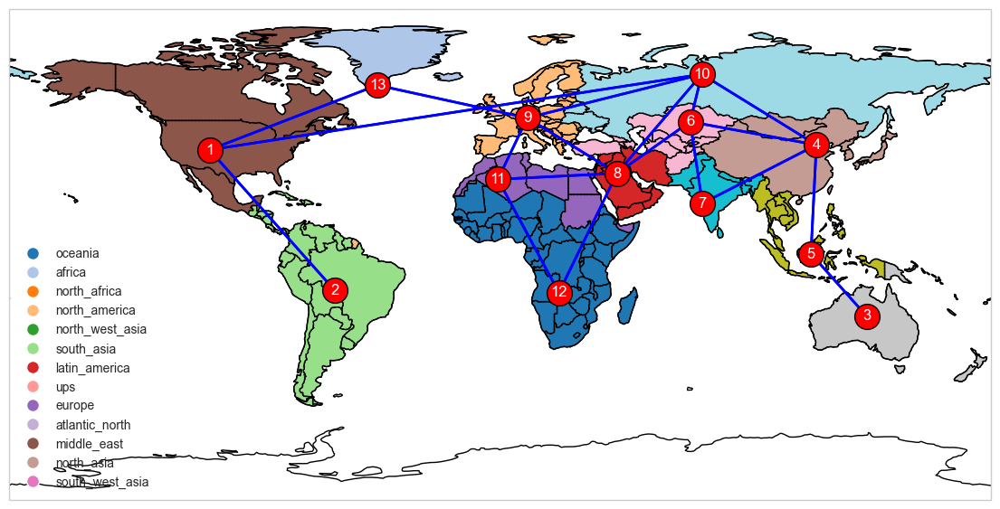

In [55]:
import warnings
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from pyproj import Geod
import geopandas as gpd
from cartopy.geodesic import Geodesic

warnings.filterwarnings("ignore", category=UserWarning)
plt.rc("figure", figsize=(14, 10))

# Load the naturalearth_lowres dataset
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a column in the world dataframe that matches the bus to country dictionary
world['bus'] = None
for key, value in regions_dic.items():
    for country in value["countries"]:
        world.loc[world['name'] == country, 'bus'] = key

# Plotting the network with results
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -90, 90])  # Adjust extent as needed

# Add base map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot country regions without legend
world.plot(ax=ax, column='bus', cmap='tab20', legend=False, edgecolor='black', transform=ccrs.PlateCarree())

# Create a custom legend
unique_regions = world['bus'].dropna().unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab20(i), markersize=10, label=region) for i, region in enumerate(unique_regions)]
ax.legend(handles=handles, loc='lower left', bbox_to_anchor=(0.0, 0.0), fancybox=False, shadow=False, ncol=1)

for i, bus in enumerate(n.buses.index, start=1):
    x, y = n.buses.loc[bus, ['x', 'y']]
    ax.scatter(x, y, s=400, color='red', edgecolor='k', zorder=5)
    ax.text(x, y, str(i), color='white', fontsize=12, ha='center', va='center', zorder=6)

# Define the Geod object for WGS84
geod = Geod(ellps="WGS84")

# Plot links
for link in n.links.index:
    bus0 = n.links.loc[link, 'bus0']
    bus1 = n.links.loc[link, 'bus1']
    x0, y0 = n.buses.loc[bus0, ['x', 'y']]
    x1, y1 = n.buses.loc[bus1, ['x', 'y']]

    if link == "Alaska to UPS":  # Specifically handle the link from North America to UPS
        # Calculate points along the great circle
        points = geod.npts(x0, y0, x1, y1, 100)
        lons, lats = zip(*points)
        lons = [(lon + 360) % 360 if lon < 0 else lon for lon in lons]  # Ensure all longitudes are positive
        ax.plot(lons, lats, color='blue', linewidth=2, zorder=4)
    else:
        ax.plot([x0, x1], [y0, y1], color='blue', linewidth=2, zorder=4)


make them relative values, maybe as a percentage of installed capacity, or per capita or per area

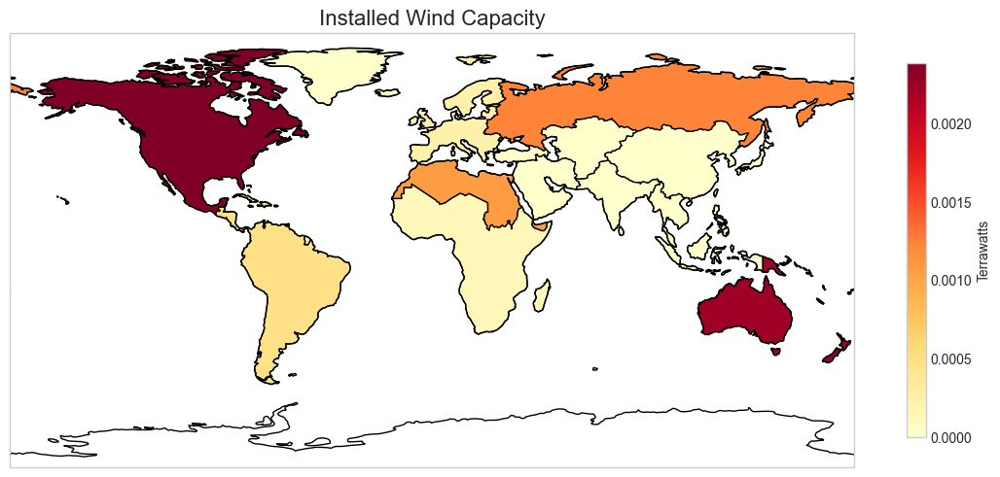

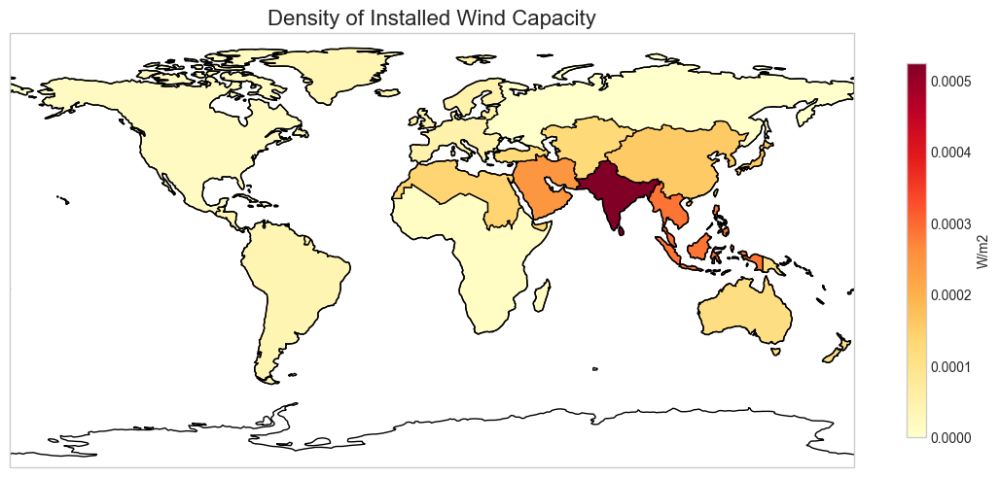

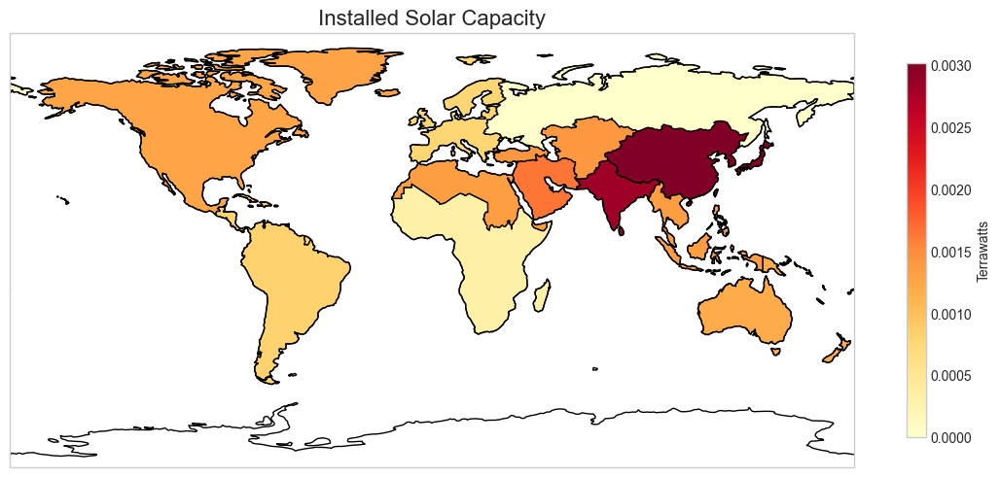

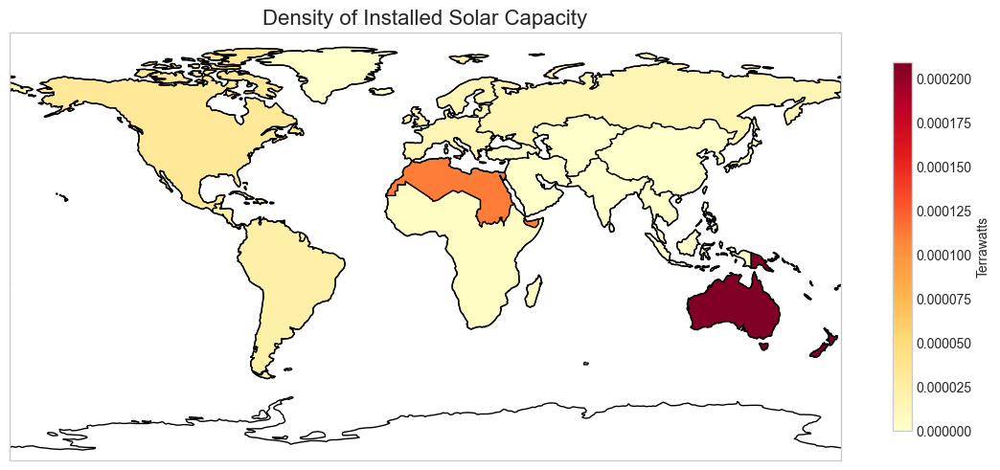

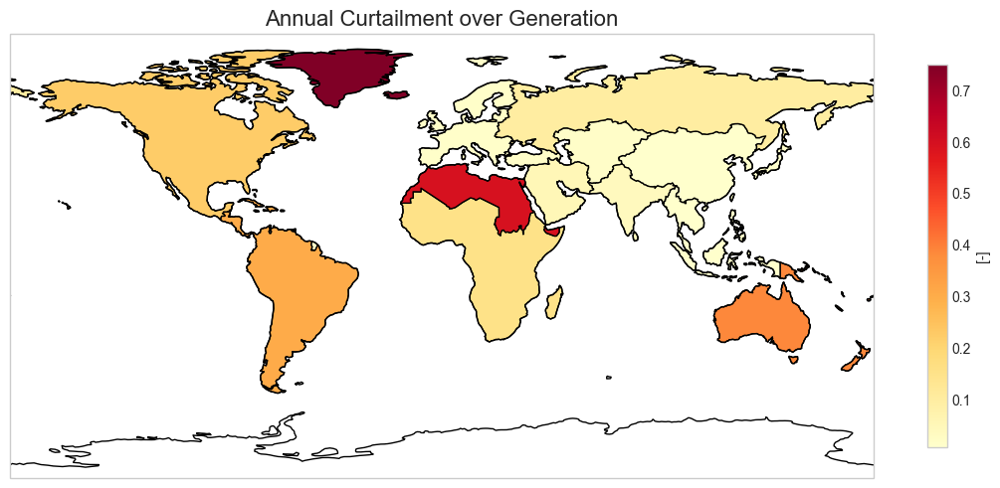

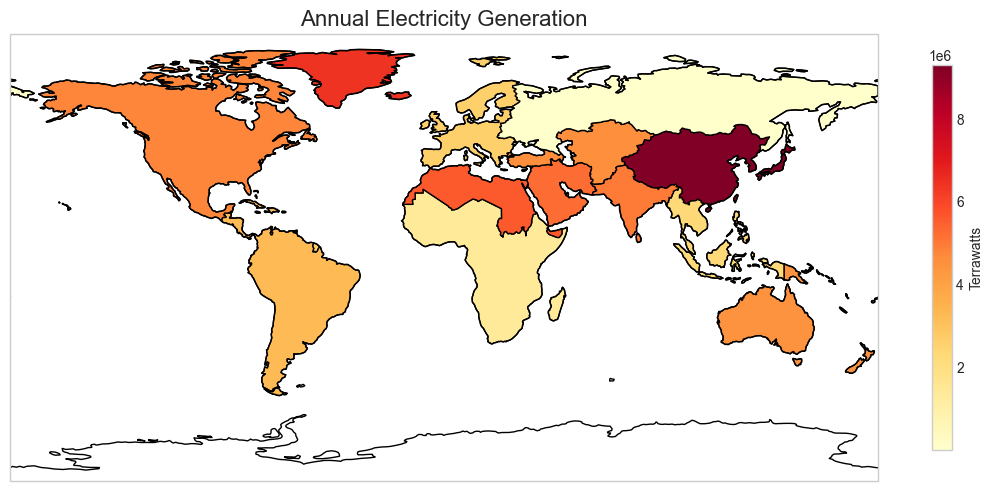

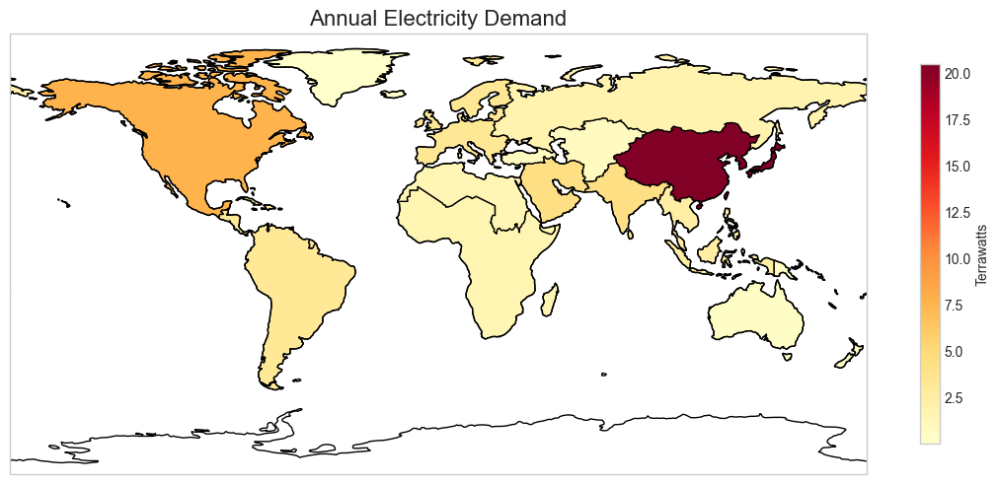

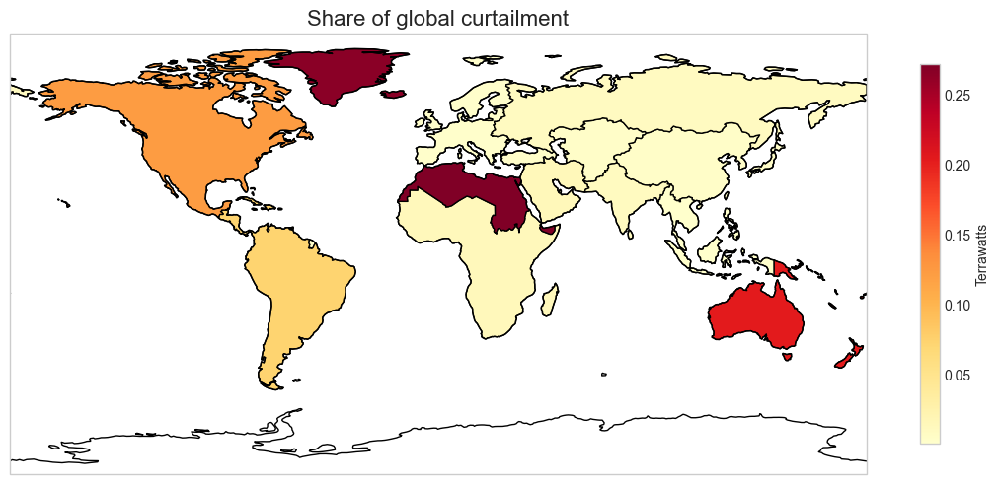

In [158]:
import warnings
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import geopandas as gpd
from pyproj import Geod
from matplotlib.colors import Normalize
import matplotlib.cm as cm

warnings.filterwarnings("ignore", category=UserWarning)
plt.rc("figure", figsize=(14, 10))

installed_capacity_wind_dic = {}
installed_capacity_pv_dic = {}
installed_cap_pv_area = {}
installed_cap_wind_area = {}
curtailment_rel_to_gen = {}
curtailment_rel_to_cur = {}
loads_dic = {}
generation_area_dic = {}
generation_dic = {}
for key, value in regions_dic.items():
    area = region_area(key)
    installed_capacity_wind_dic[key] = value["wind_installed"] / 1e6
    installed_capacity_pv_dic[key] = value["pv_installed"] / 1e6
    installed_cap_pv_area[key] = value["wind_installed"] / area * 1e6
    installed_cap_wind_area[key] = value["pv_installed"] / area * 1e6
    curtailment_rel_to_gen[key] = value["total_curtailment_yearly"] / (value["total_wind_yearly"] + value["total_pv_yearly"])
    loads_dic[key] = value["total_load_yearly"] / 1e6
    generation_dic[key] = value["total_wind_yearly"] + value["total_pv_yearly"] / 1e6
    curtailment_rel_to_cur[key] = value["total_curtailment_yearly"] / total_annual_cur * 1e3
values_dics = [installed_capacity_pv_dic, installed_cap_pv_area,  installed_capacity_wind_dic,  installed_cap_wind_area, curtailment_rel_to_gen, generation_dic, loads_dic, curtailment_rel_to_cur]

# Load the naturalearth_lowres dataset
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a column in the world dataframe that matches the bus to country dictionary
world['bus'] = None
for key, value in regions_dic.items():
    for country in value["countries"]:
        world.loc[world['name'] == country, 'bus'] = key

for i, values_dic in enumerate(values_dics):
    # Add the values to the world GeoDataFrame
    world['value'] = world['bus'].map(values_dic)

    # Merge countries into regions, aggregating only the 'value' column
    regions = world.dissolve(by='bus', aggfunc={'value': 'mean'})

    # Plotting the network with results
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([-180, 180, -90, 90])  # Adjust extent as needed

    # Add base map features
    ax.add_feature(cfeature.COASTLINE)

    # Normalize the values for the colormap
    norm = Normalize(vmin=min(values_dic.values()), vmax=max(values_dic.values()))
    cmap = cm.YlOrRd

    # Plot regions with the heatmap, making sure normalization is applied
    regions.plot(ax=ax, column='value', cmap=cmap, norm=norm, legend=False, edgecolor='black', transform=ccrs.PlateCarree())

    # for i, bus in enumerate(n.buses.index, start=1):
    #     x, y = n.buses.loc[bus, ['x', 'y']]
    #     ax.scatter(x, y, s=400, color='black', edgecolor='k', zorder=5)
    #     ax.text(x, y, str(i), color='white', fontsize=12, ha='center', va='center', zorder=6)

    # Add a title to the figure
    if i == 0:
        plt.title('Installed Wind Capacity', fontsize=16)
    elif i == 1:
        plt.title('Density of Installed Wind Capacity', fontsize=16)
    elif i == 2:
        plt.title('Installed Solar Capacity', fontsize=16)
    elif i == 3:
        plt.title('Density of Installed Solar Capacity', fontsize=16)
    elif i == 4:
        plt.title('Annual Curtailment over Generation', fontsize=16)
    elif i == 5:
        plt.title('Annual Electricity Generation', fontsize=16)
    elif i == 6:
        plt.title('Annual Electricity Demand', fontsize=16)
    elif i == 7:
        plt.title('Share of global curtailment', fontsize=16)

    # Create and customize the color bar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []  # Dummy array for the scalar mappable
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5)
    if i == np.any([1, 3]):
        cbar.set_label('W/m2')
    elif i == np.any([5, 6]):
        cbar.set_label('TWh')
    elif i == 4:
        cbar.set_label('[-]')
    else:
        cbar.set_label('Terrawatts')


    plt.show()

## Plotting of demand and supply graphs


north_america


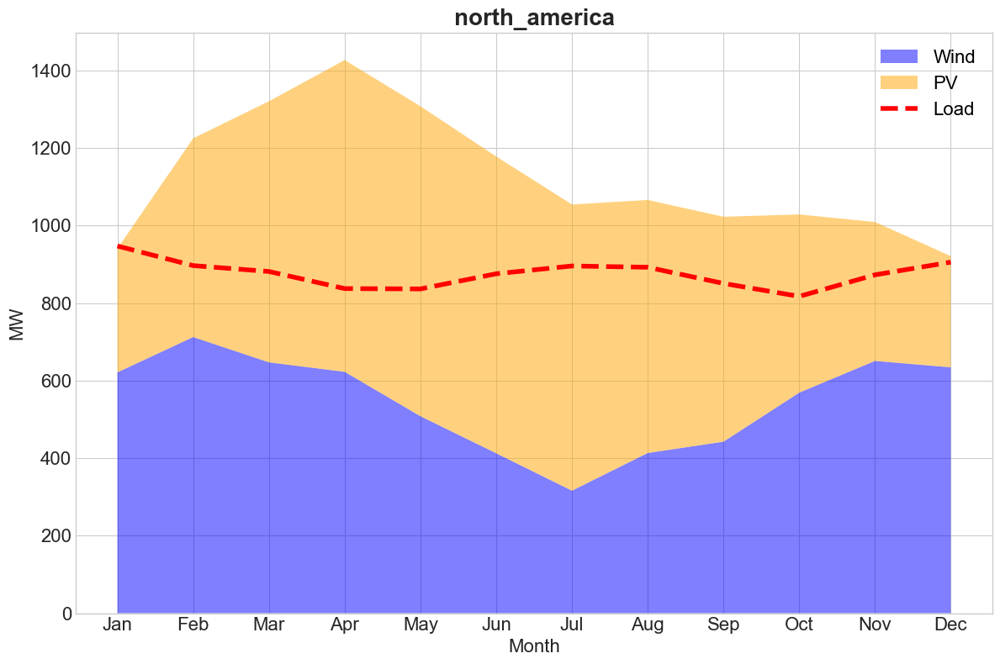

latin_america


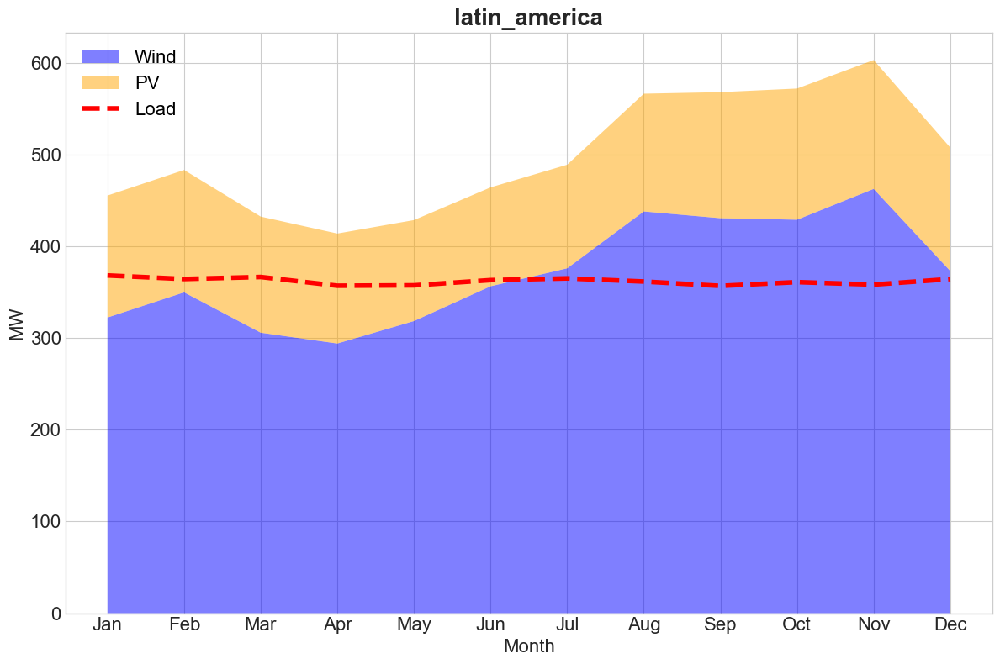

oceania


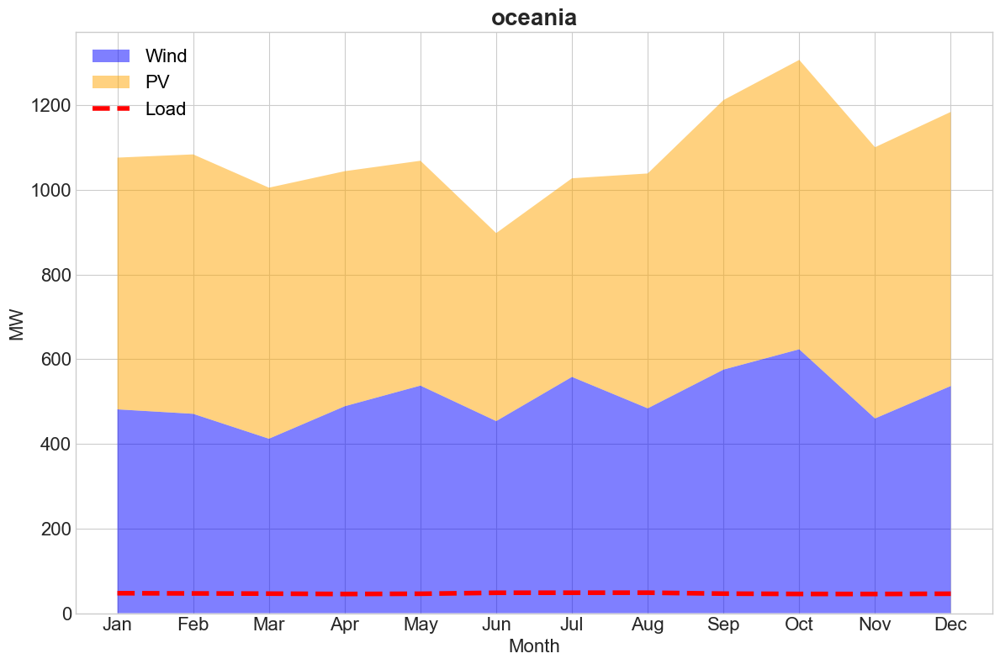

north_asia


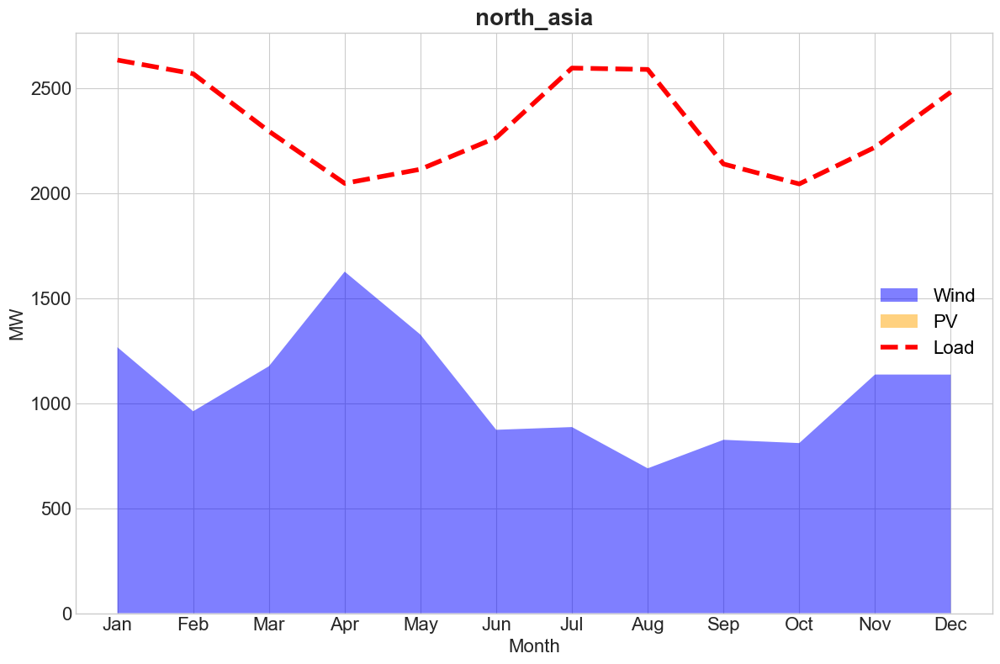

south_asia


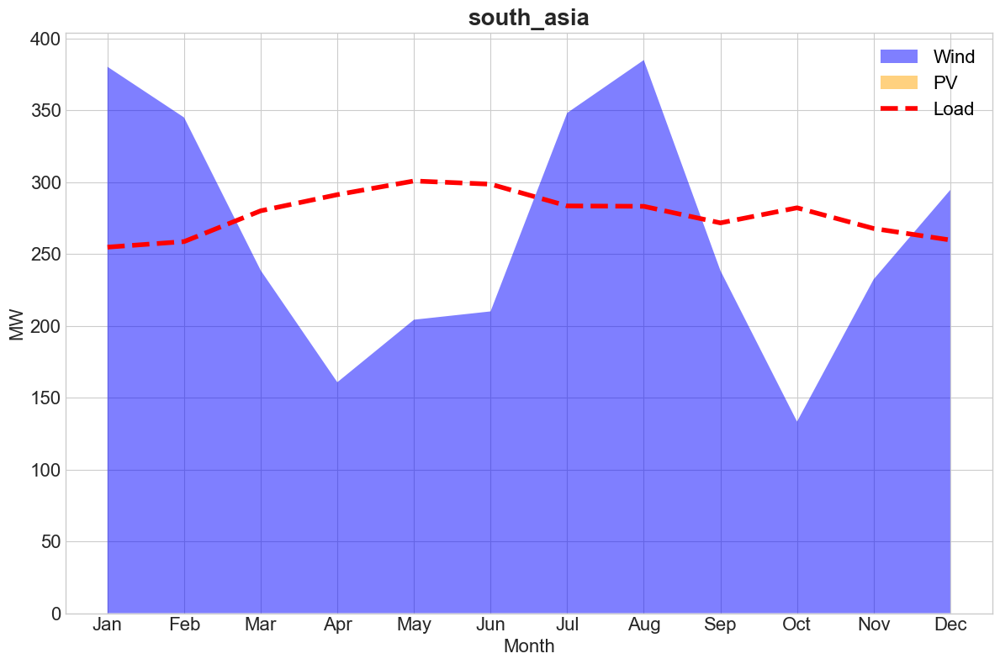

north_west_asia


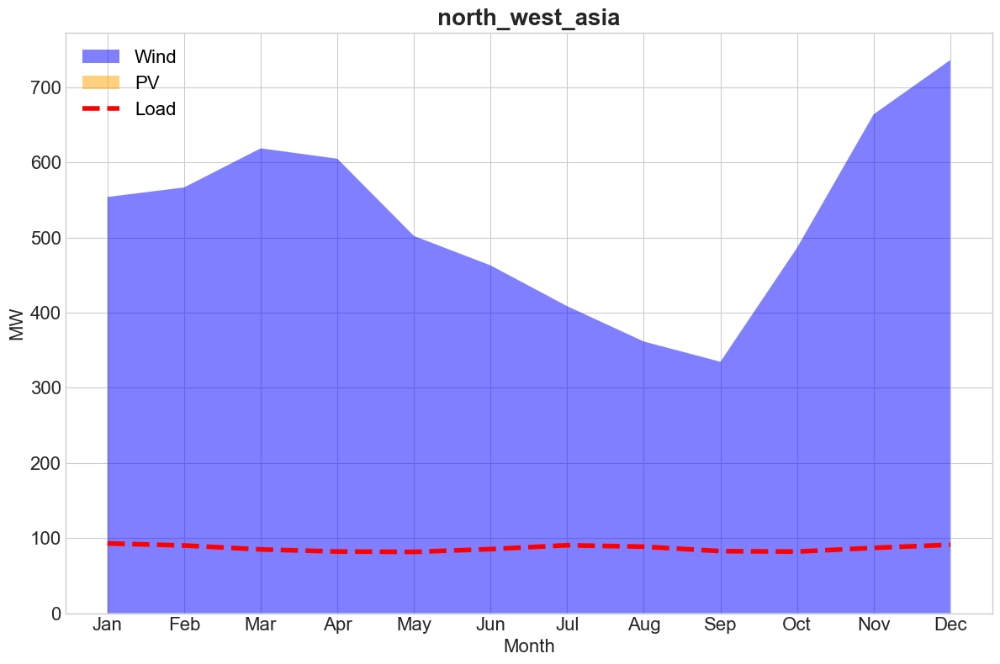

south_west_asia


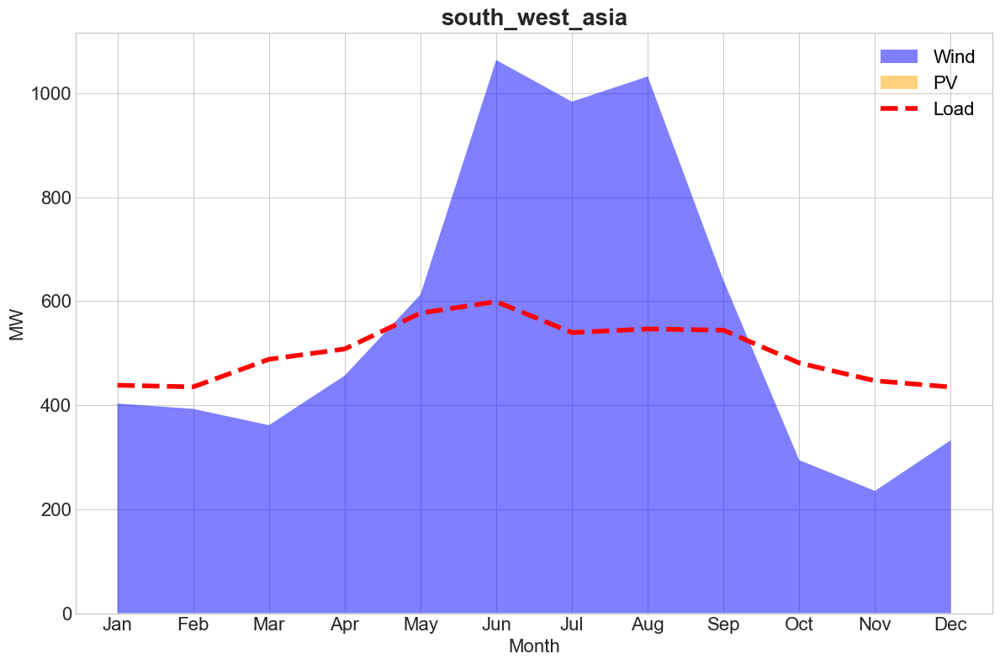

middle_east


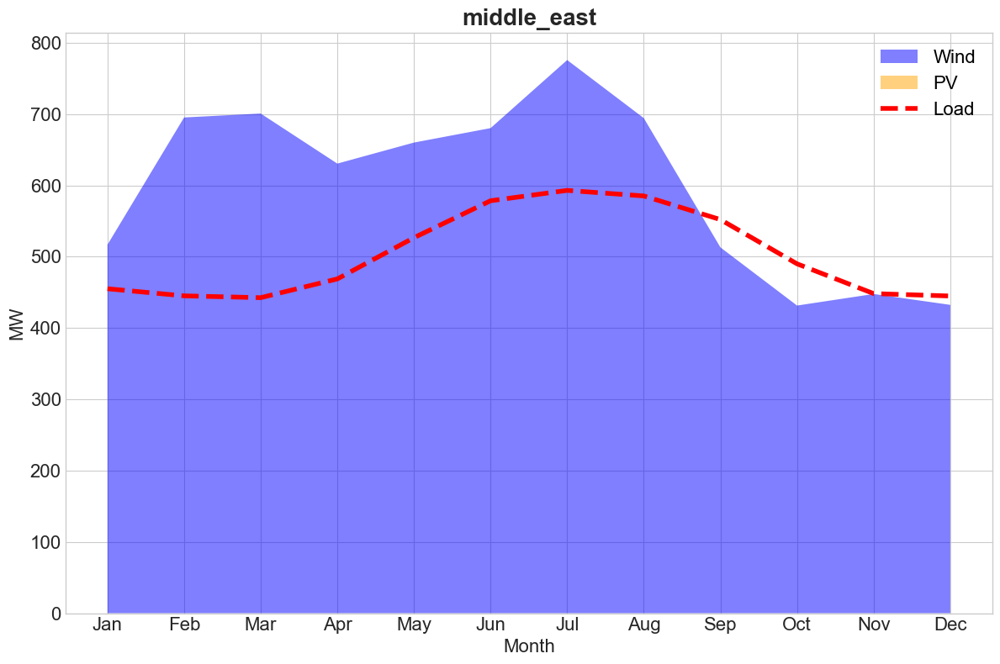

europe


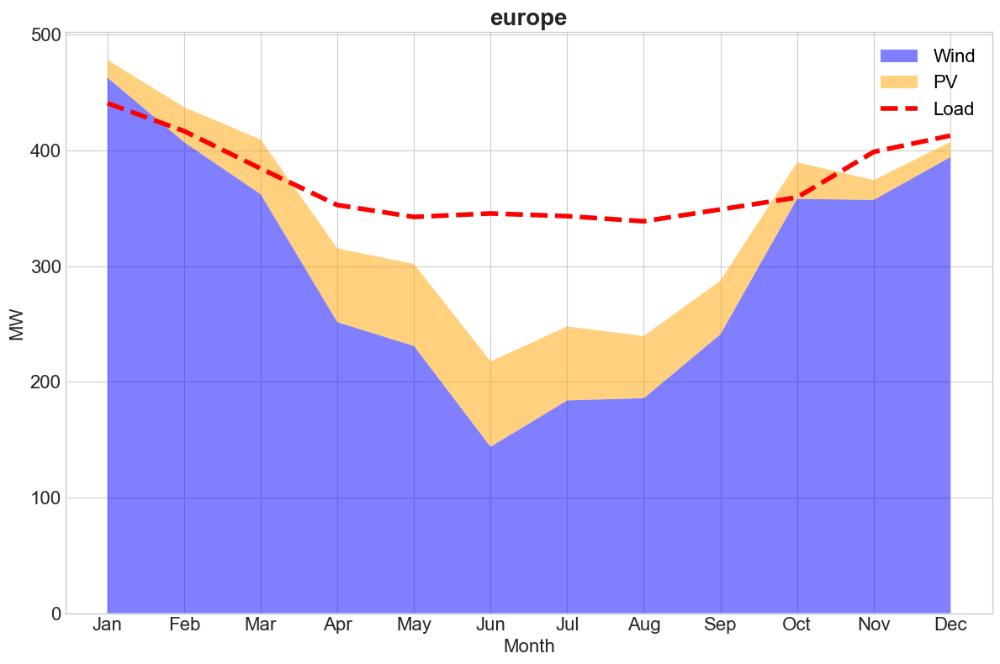

ups


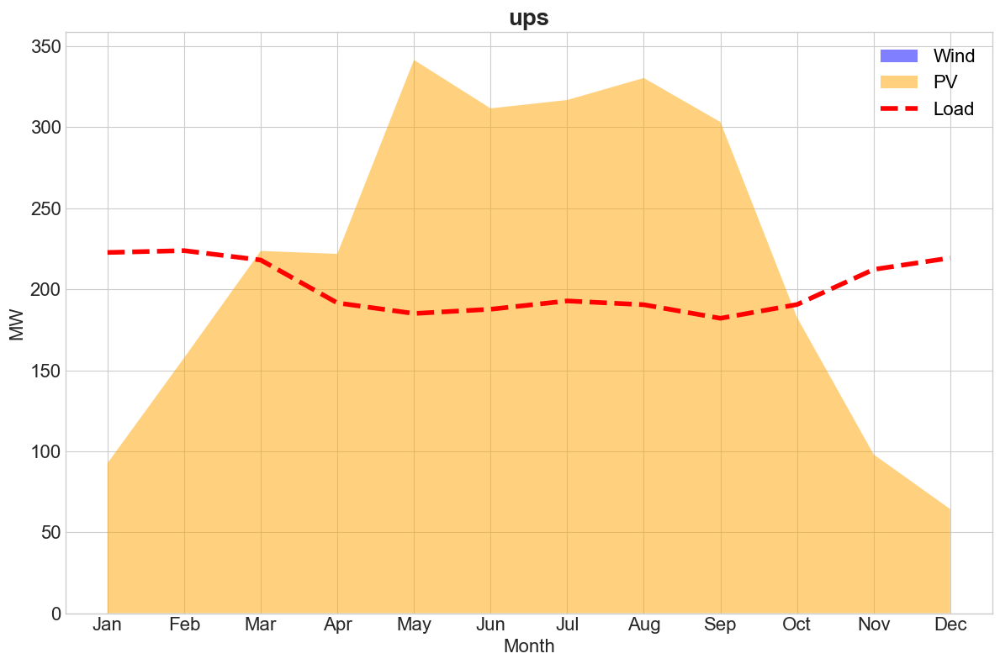

north_africa


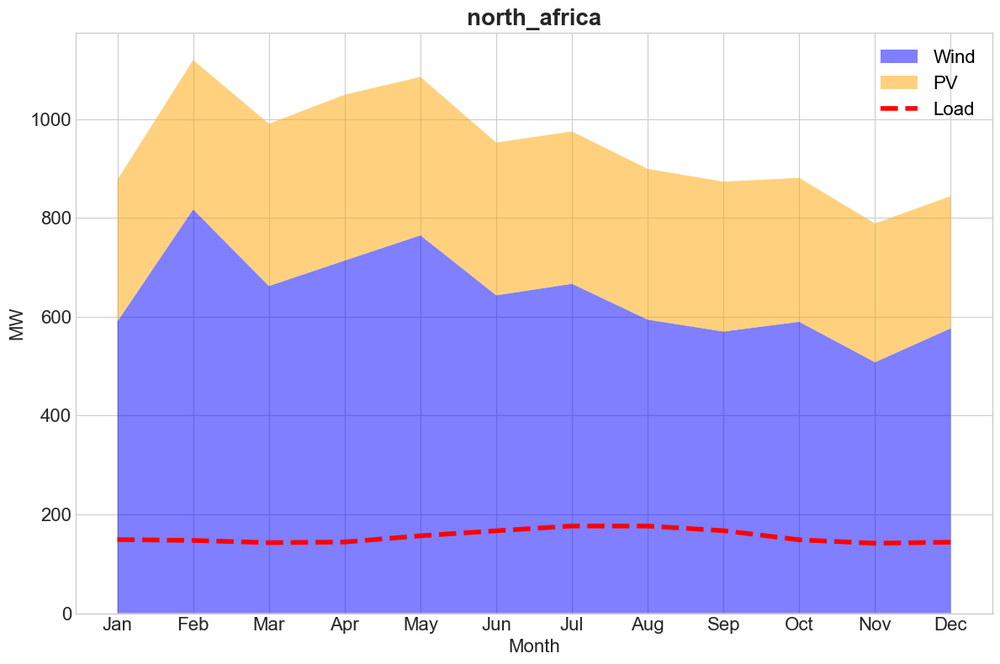

africa


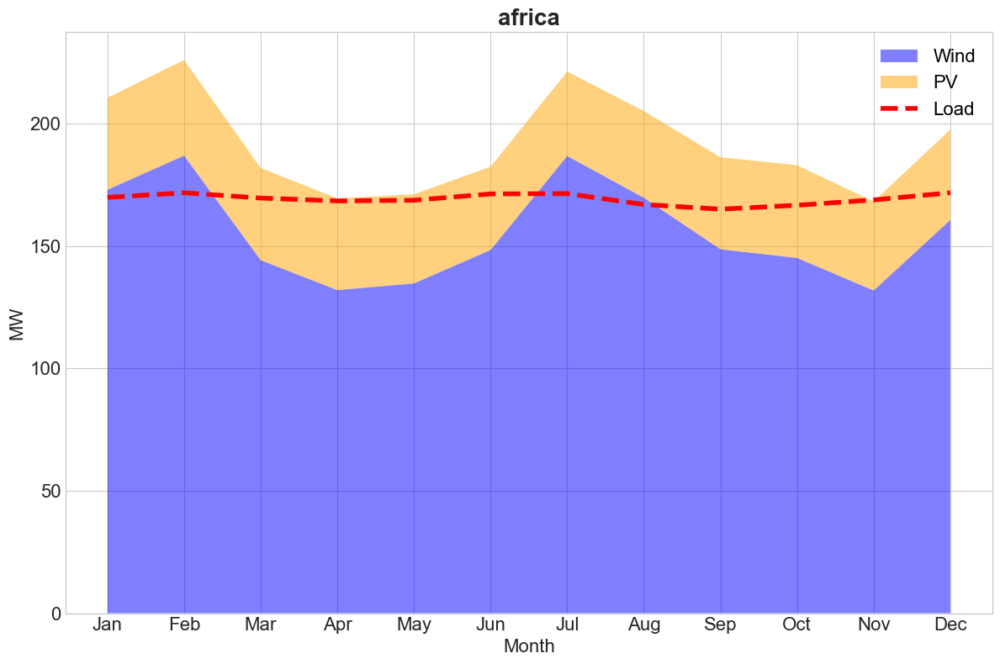

atlantic_north


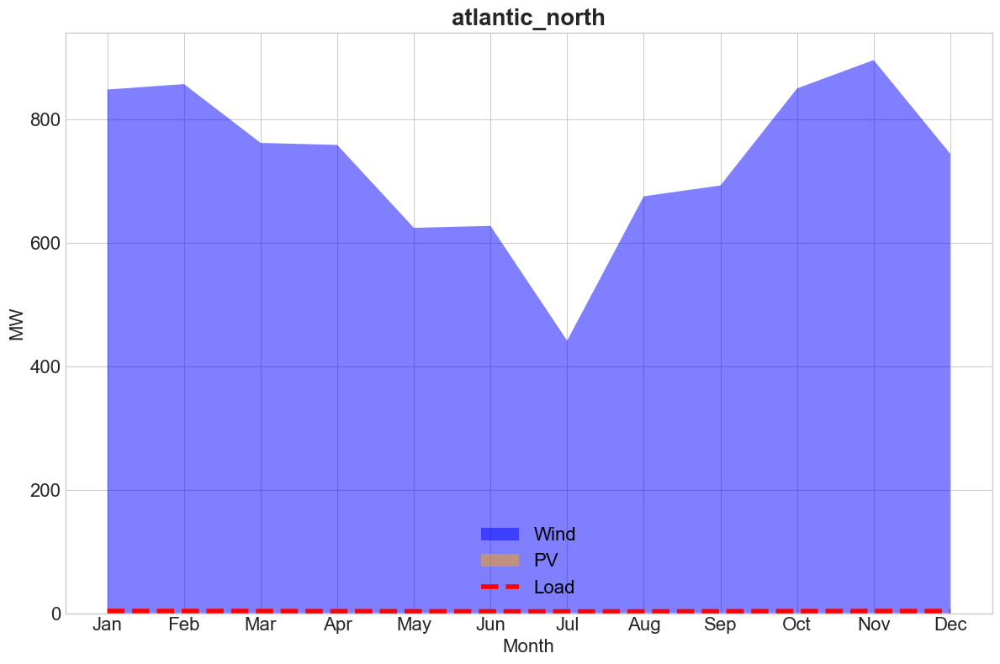

In [57]:
plt.style.use('seaborn-v0_8-whitegrid')  

for key, value in regions_dic.items():
    print(key)
    # series_l = value["load"]
    # load = series_l.groupby(series_l.index.to_period('M')).sum()
    load = value['mean_load_monthly']
    wind = value["mean_wind_monthly"]
    pv = value["mean_pv_monthly"]

    # Extract values and months
    months = load.index.month
    load_values = load.values
    wind_values = wind.values
    pv_values = pv.values

    plt.figure(figsize=(12, 8))
    
    # # Stacked area plot for wind and PV
    plt.stackplot(months, wind_values, pv_values, labels=['Wind', 'PV'], colors=['blue', 'orange'], alpha=0.5)
    
    # Plot load on top
    plt.plot(months, load_values, label='Load', linestyle='--', color='red', linewidth=4)
    
    plt.title(f'{key}', fontsize=20, fontweight='bold')
    plt.xlabel('Month', fontsize=16)
    plt.ylabel('MW', fontsize=16)
    legend = plt.legend(loc='best', fontsize=16)
    for text in legend.get_texts():
        text.set_color('black')  # Set legend text color to black
        #text.set_fontweight('bold')  # Make legend text bold
    # Customize ticks
    plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=16)
    plt.yticks(fontsize=16)
    # Tight layout to ensure everything fits without overlapping
    plt.tight_layout()
    
    
    # Show the plot
    plt.show()


In [58]:
print(total_monthly_wind.index)
print(total_monthly_pv.values)
print(total_monthly_wind.values)

PeriodIndex(['2050-01', '2050-02', '2050-03', '2050-04', '2050-05', '2050-06',
             '2050-07', '2050-08', '2050-09', '2050-10', '2050-11', '2050-12'],
            dtype='period[M]', name='snapshot')
[1.10049134e+09 1.20143158e+09 1.51009829e+09 1.53932182e+09
 1.64444978e+09 1.47328183e+09 1.52068129e+09 1.53294057e+09
 1.47222340e+09 1.36114104e+09 1.13157118e+09 1.07941771e+09]
[4.92604758e+09 4.54517156e+09 4.75559282e+09 4.85425513e+09
 4.78047120e+09 4.37518521e+09 4.56236713e+09 4.55598259e+09
 4.07042271e+09 4.25604074e+09 4.45164662e+09 4.72605696e+09]


## Plotting of losses

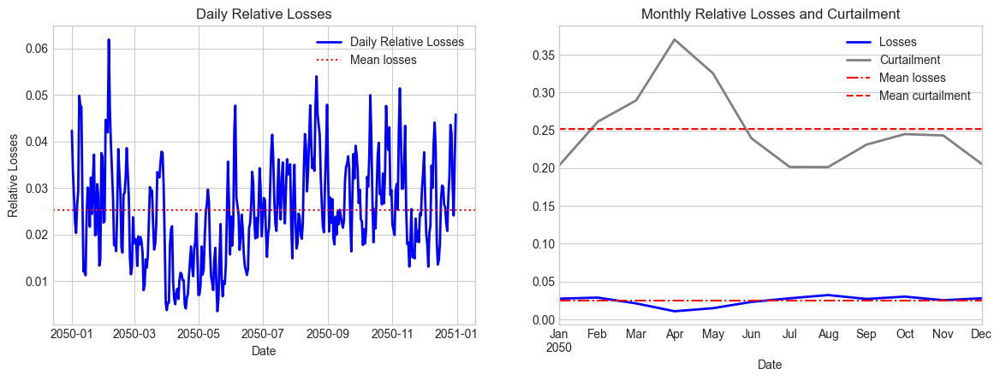

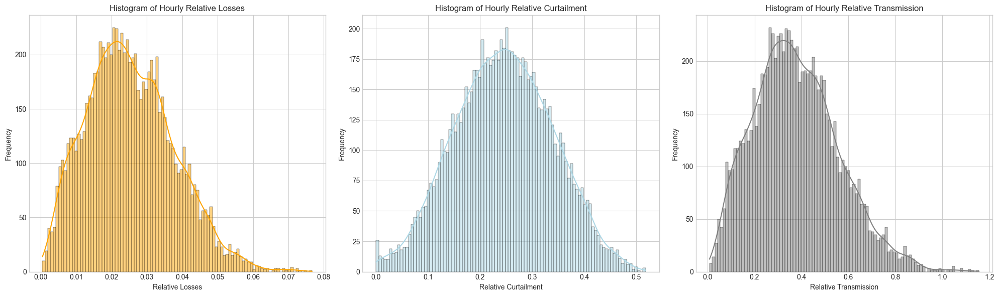

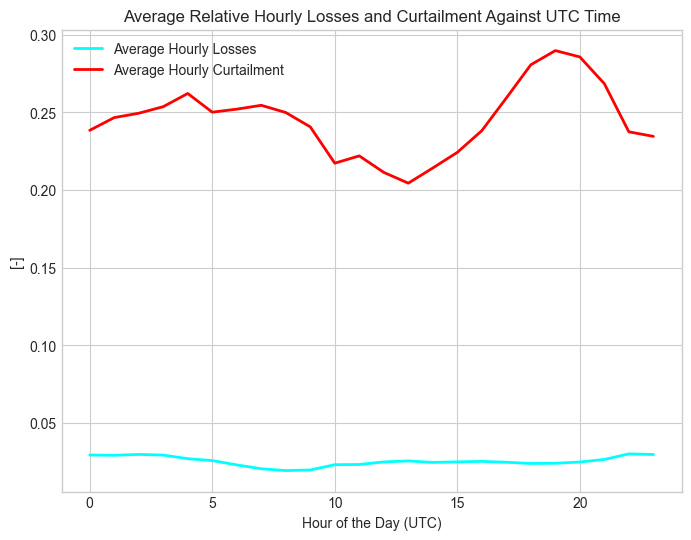

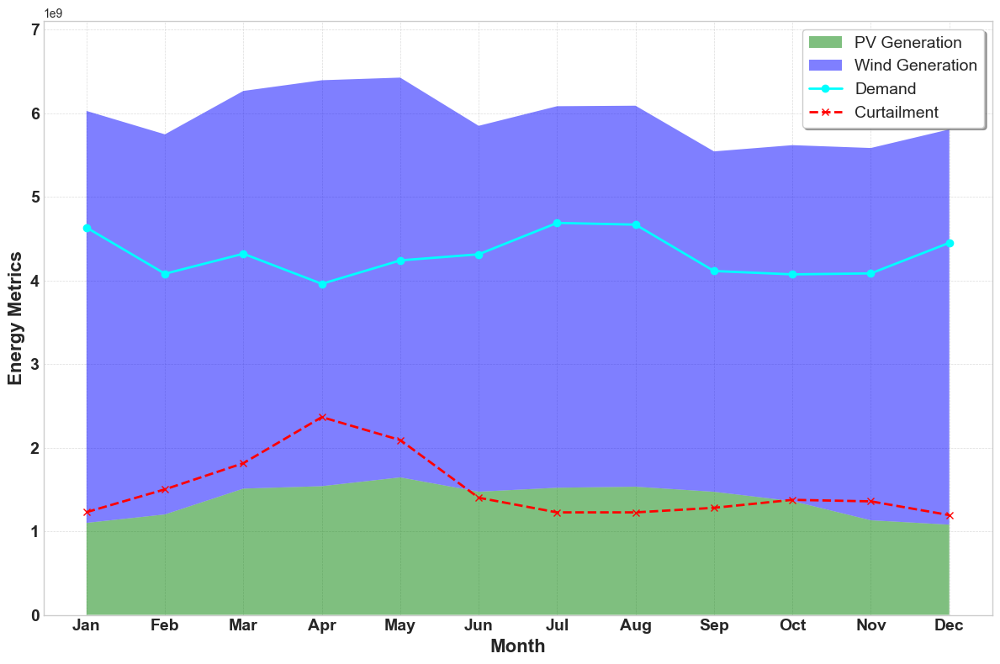

In [143]:
# Plot daily relative losses and compare to mean
plt.figure(figsize=(14, 10))

# Daily Relative Losses
plt.subplot(2, 2, 1)
daily_losses_rel_to_gen.plot(label='Daily Relative Losses', color='blue', linestyle='-', linewidth=2)
plt.axhline(y=daily_losses_rel_to_gen.mean(), color='red', linestyle=':', label='Mean losses')
plt.title('Daily Relative Losses')
plt.xlabel('Date')
plt.ylabel('Relative Losses')
plt.legend()

# Monthly Average Losses
plt.subplot(2, 2, 2)
monthly_losses_rel_to_gen.plot(label='Losses', color='blue', linewidth=2)
monthly_cur_rel_to_gen.plot(label='Curtailment', color='gray', linestyle='-', linewidth=2)
plt.axhline(y=monthly_losses_rel_to_gen.mean(), color='red', linestyle='-.', label='Mean losses')
plt.axhline(y=monthly_cur_rel_to_gen.mean(), color='red', linestyle='--', label='Mean curtailment')
plt.title('Monthly Relative Losses and Curtailment')
plt.xlabel('Date')
plt.legend()

plt.figure(figsize=(20, 6))

plt.subplot(1, 3, 1)
sns.histplot(hourly_losses_rel_to_gen, bins=100, kde=True, color='orange')
plt.title('Histogram of Hourly Relative Losses')
plt.xlabel('Relative Losses')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
sns.histplot(hourly_cur_rel_to_gen, bins=100, kde=True, color='lightblue')
plt.title('Histogram of Hourly Relative Curtailment')
plt.xlabel('Relative Curtailment')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
sns.histplot(hourly_p_trans_rel_gen, bins=100, kde=True, color='gray')
plt.title('Histogram of Hourly Relative Transmission')
plt.xlabel('Relative Transmission')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Losses against UTC time
hourly_losses = hourly_losses_rel_to_gen.groupby(hourly_losses_rel_to_gen.index.hour).mean()
hourly_cur = hourly_cur_rel_to_gen.groupby(hourly_cur_rel_to_gen.index.hour).mean()
plt.figure(figsize=(8, 6))
hourly_losses.plot(label='Average Hourly Losses', color='cyan', linewidth=2)
hourly_cur.plot(label='Average Hourly Curtailment', color='red', linewidth=2)
plt.title('Average Relative Hourly Losses and Curtailment Against UTC Time')
plt.xlabel('Hour of the Day (UTC)')
plt.ylabel('[-]')
plt.legend()
plt.show()

plt.figure(figsize=(12, 8))  # Increase figure size for better readability
# Plot line plots for Demand and Curtailment
# Plot stackplot for PV and wind generation
plt.stackplot(total_monthly_pv.index.month, total_monthly_pv.values, total_monthly_wind.values, labels=['PV Generation', 'Wind Generation'], colors=['green', 'blue'], alpha=0.5)
plt.plot(total_monthly_pv.index.month, total_monthly_load, label='Demand', color='cyan', linewidth=2, linestyle='-', marker='o')
plt.plot(total_monthly_pv.index.month, total_monthly_cur, label='Curtailment', color='red', linewidth=2, linestyle='--', marker='x')
plt.xlabel('Month', fontsize=16, fontweight='bold')  # Increase font size
plt.ylabel('Energy Metrics', fontsize=16, fontweight='bold')  # Increase font size and add a more descriptive label
plt.ylim(0, 7.1e9)
plt.legend(loc='upper right', fontsize=14, frameon=True, shadow=True)  # Move legend to upper left, increase font size, add frame and shadow
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)  # Add grid for better readability

plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=14, fontweight='bold')  # Increase x-tick font size and labels
plt.yticks(fontsize=14, fontweight='bold')  # Increase y-tick font size

plt.tight_layout()  # Adjust layout to fit elements better
plt.show()


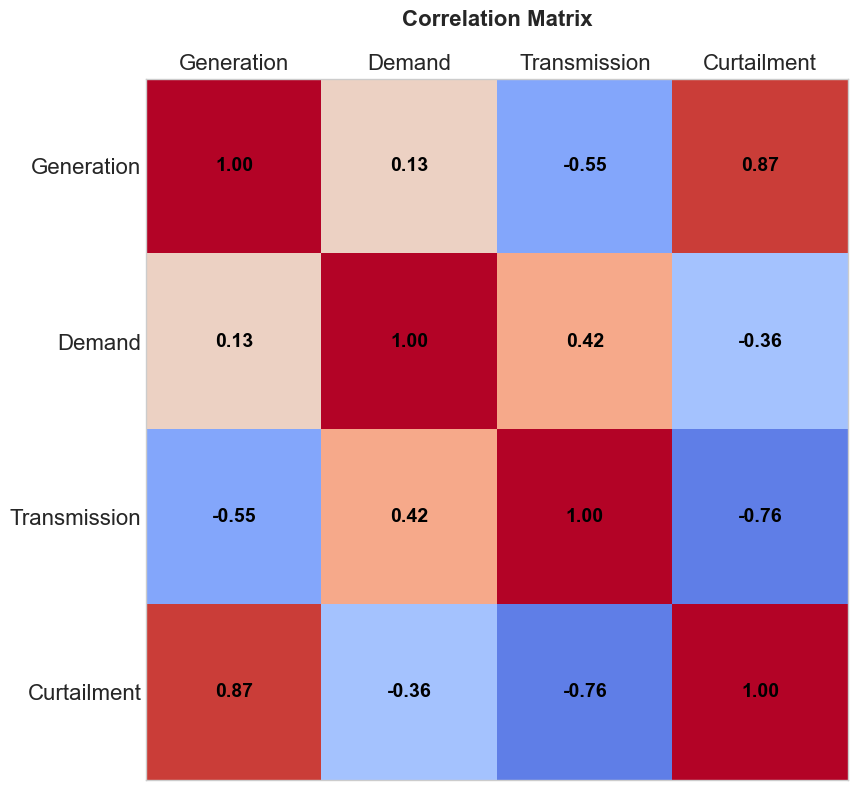

In [150]:
import matplotlib.pyplot as plt
import pandas as pd

# Combine into a DataFrame
data = pd.DataFrame({
    'Generation': total_hourly_gen,
    'Demand': total_hourly_load,
    'Transmission': total_hourly_p_trans,
    'Curtailment': total_hourly_cur
    
})

# Calculate pairwise correlations
correlation_matrix = data.corr()

# Plot the correlation matrix
fig, ax = plt.subplots(figsize=(10, 8))

# Display the matrix values with reversed colormap
cax = ax.matshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)

# Set axis ticks and labels
ax.grid(False)
ax.set_xticks(range(len(correlation_matrix.columns)))
ax.set_yticks(range(len(correlation_matrix.index)))
ax.set_xticklabels(correlation_matrix.columns, rotation=0, fontsize=16)
ax.set_yticklabels(correlation_matrix.index, fontsize=16)

# Add text annotations
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.index)):
        plt.text(i, j, f'{correlation_matrix.iloc[j, i]:.2f}', ha='center', va='center', color='black', fontsize=14, fontweight='bold')

# Title and layout adjustments
plt.title('Correlation Matrix', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

In [82]:
# Combine into a DataFrame
data = pd.DataFrame({
    'Generation': total_hourly_gen.values,
    'Demand': total_hourly_load.values,
    'Transmission': total_hourly_p_trans.values,
    'Curtailment': total_hourly_cur.values

})

In [84]:
import statsmodels.api as sm
X = data[['Generation', 'Demand', 'Curtailment', 'Transmission']]
X = sm.add_constant(X)  # Adds a constant term to the predictor
# Calculate VIF
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data)

        feature          VIF
0         const   267.941283
1    Generation  3626.580928
2        Demand   910.582803
3   Curtailment  4643.901627
4  Transmission    39.154253


In [151]:
import statsmodels.api as sm
# Prepare the data for regression
X = data[['Generation', 'Demand']]  # Independent variables
X = sm.add_constant(X)  # Adds a constant term to the predictor
y = data['Transmission']  # Dependent variable
z = data['Curtailment']  # Dependent variable

# Fit the regression model
model_trans = sm.OLS(y, X).fit()
model_cur = sm.OLS(z, X).fit()

# Print the regression results
print(f'DEMAND AND GENERATION TO TRANSMISSION')
print(model_trans.summary())
print(f'DEMAND AND GENERATION TO CURTAILMENT')
print(model_cur.summary())



DEMAND AND GENERATION TO TRANSMISSION
                            OLS Regression Results                            
Dep. Variable:           Transmission   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                     5344.
Date:                Wed, 03 Jul 2024   Prob (F-statistic):               0.00
Time:                        15:41:45   Log-Likelihood:            -1.3201e+05
No. Observations:                8760   AIC:                         2.640e+05
Df Residuals:                    8757   BIC:                         2.640e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        1

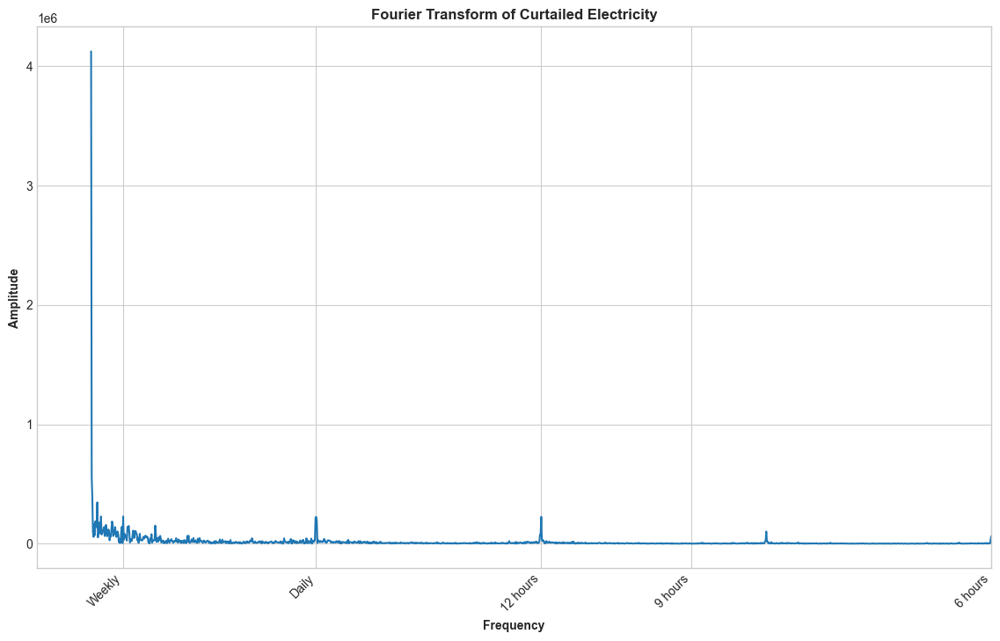

In [153]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
# Convert to numpy array
hourly_p_trans_rel_gen_array = total_hourly_cur.values

# Step 2: Perform Fourier Transform
# Number of sample points
N = len(hourly_p_trans_rel_gen_array)
# Sample spacing (assuming hourly data, so 1 hour)
T = 1.0

# Perform FFT
yf = fft(hourly_p_trans_rel_gen_array)
xf = fftfreq(N, T)[:N//2]
# Calculate the frequencies for 3-hour, 6-hour, 12-hour, daily, and weekly intervals
three_hour_freq = 1 / 3.0
six_hour_freq = 1 / 6.0
nine_hour_freq = 1 / 9.0
half_daily_freq = 1 / 12.0
daily_freq = 1 / 24.0
weekly_freq = 1 / (24.0 * 7)

frequencies = [three_hour_freq, six_hour_freq, nine_hour_freq,half_daily_freq, daily_freq, weekly_freq]
labels = ['3 hours', '6 hours', '9 hours', '12 hours', 'Daily', 'Weekly']
# Step 3: Plot the FFT results
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(xf, 2.0 / N * np.abs(yf[0:N // 2]))
# Set custom x-ticks and labels
ax.set_xticks(frequencies)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_xlim(-0.01, 1/6)

ax.set_xlabel('Frequency', fontweight='bold')
ax.set_ylabel('Amplitude', fontweight='bold')
ax.set_title(f'Fourier Transform of Curtailed Electricity', fontweight='bold')
ax.grid(True, axis='x')

plt.show()

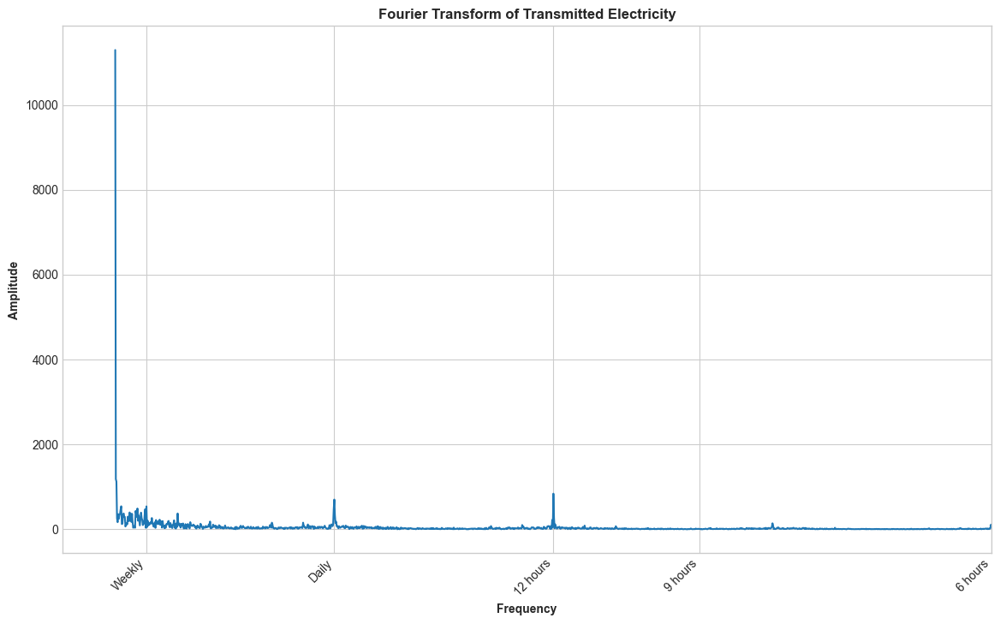

In [152]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
# Convert to numpy array
hourly_p_trans_rel_gen_array = total_actual_flow.values

# Step 2: Perform Fourier Transform
# Number of sample points
N = len(hourly_p_trans_rel_gen_array)
# Sample spacing (assuming hourly data, so 1 hour)
T = 1.0

# Perform FFT
yf = fft(hourly_p_trans_rel_gen_array)
xf = fftfreq(N, T)[:N//2]
# Calculate the frequencies for 3-hour, 6-hour, 12-hour, daily, and weekly intervals
three_hour_freq = 1 / 3.0
six_hour_freq = 1 / 6.0
nine_hour_freq = 1 / 9.0
half_daily_freq = 1 / 12.0
daily_freq = 1 / 24.0
weekly_freq = 1 / (24.0 * 7)

frequencies = [three_hour_freq, six_hour_freq, nine_hour_freq,half_daily_freq, daily_freq, weekly_freq]
labels = ['3 hours', '6 hours', '9 hours', '12 hours', 'Daily', 'Weekly']
# Step 3: Plot the FFT results
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(xf, 2.0 / N * np.abs(yf[0:N // 2]))
# Set custom x-ticks and labels
ax.set_xticks(frequencies)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_xlim(-0.01, 1/6)

ax.set_xlabel('Frequency', fontweight='bold')
ax.set_ylabel('Amplitude', fontweight='bold')
ax.set_title(f'Fourier Transform of Transmitted Electricity', fontweight='bold')
ax.grid(True, axis='x')

plt.show()

In [146]:
total_hourly_p_trans.describe()

count    8.760000e+03
mean     2.980899e+06
std      1.263927e+06
min      7.724606e+04
25%      2.103450e+06
50%      2.924784e+06
75%      3.824828e+06
max      8.250241e+06
dtype: float64

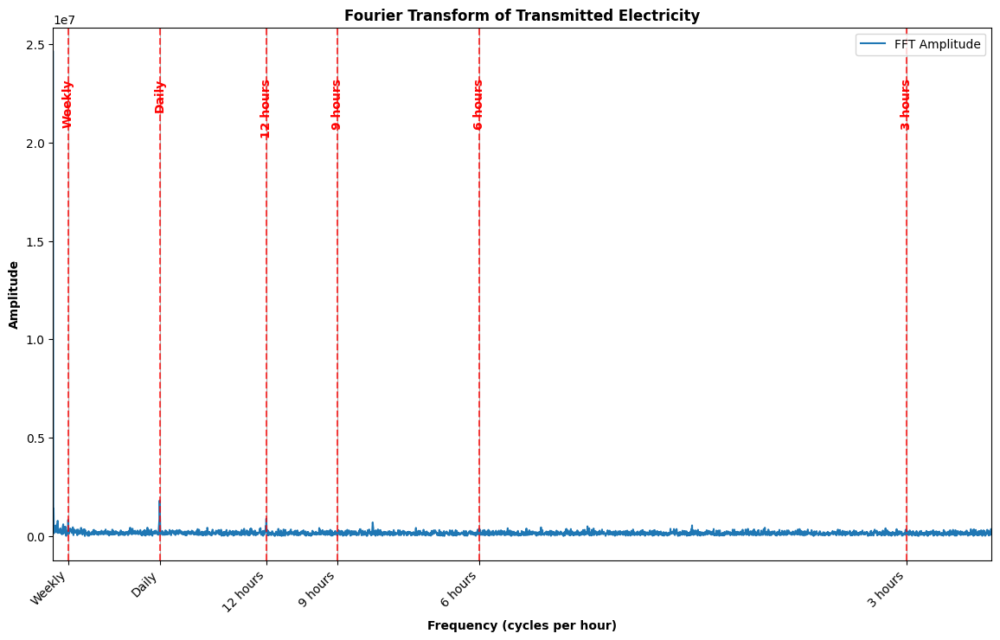

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Convert to numpy array
hourly_p_trans_rel_gen_array = total_hourly_cur.values

# Perform Fourier Transform
N = len(hourly_p_trans_rel_gen_array)  # Number of sample points
T = 1.0  # Sample spacing (assuming hourly data, so 1 hour)

# Perform FFT
yf = fft(hourly_p_trans_rel_gen_array)
xf = fftfreq(N, T)[:N//2]

# Calculate the frequencies for 3-hour, 6-hour, 9-hour, 12-hour, daily, and weekly intervals
three_hour_freq = 1 / 3.0
six_hour_freq = 1 / 6.0
nine_hour_freq = 1 / 9.0
half_daily_freq = 1 / 12.0
daily_freq = 1 / 24.0
weekly_freq = 1 / (24.0 * 7)

frequencies = [three_hour_freq, six_hour_freq, nine_hour_freq, half_daily_freq, daily_freq, weekly_freq]
labels = ['3 hours', '6 hours', '9 hours', '12 hours', 'Daily', 'Weekly']

# Plot the FFT results
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(xf, 2.0 / N * np.abs(yf[0:N // 2]), label='FFT Amplitude')

# Highlight specific frequencies
for freq, label in zip(frequencies, labels):
    ax.axvline(x=freq, color='r', linestyle='--', alpha=0.7)
    ax.text(freq, ax.get_ylim()[1] * 0.9, label, color='r', ha='center', va='top', rotation=90, fontweight='bold')

# Set custom x-ticks and labels
ax.set_xticks(frequencies)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_xlim(0, max(frequencies)*1.1)  # Focus on relevant frequencies

# Add labels and title
ax.set_xlabel('Frequency (cycles per hour)', fontweight='bold')
ax.set_ylabel('Amplitude', fontweight='bold')
ax.set_title(f'Fourier Transform of Transmitted Electricity', fontweight='bold')

# Add grid and legend
ax.grid(True, axis='x')
ax.legend()

# Show plot
plt.show()

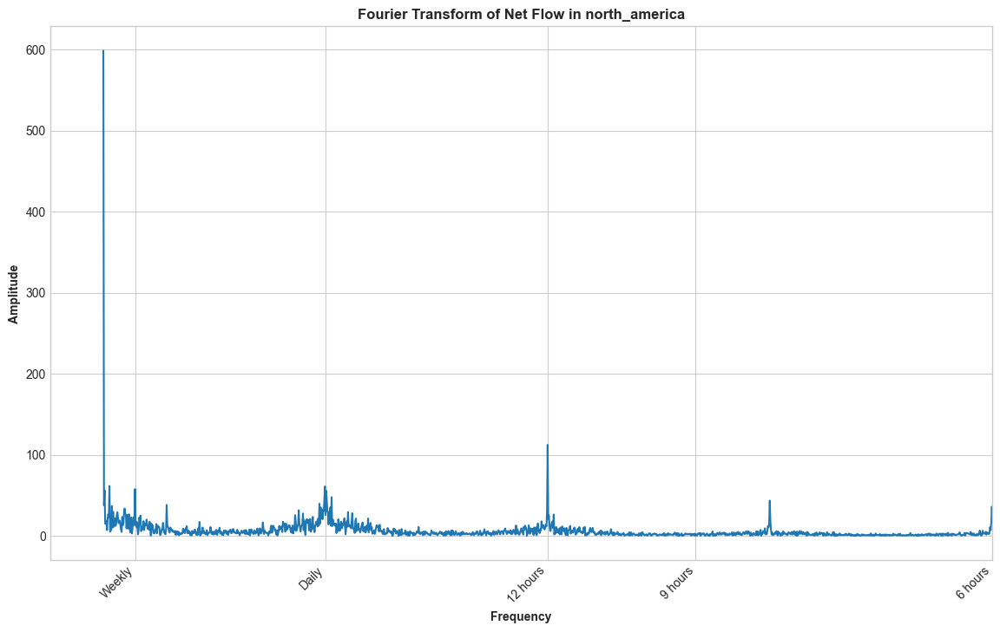

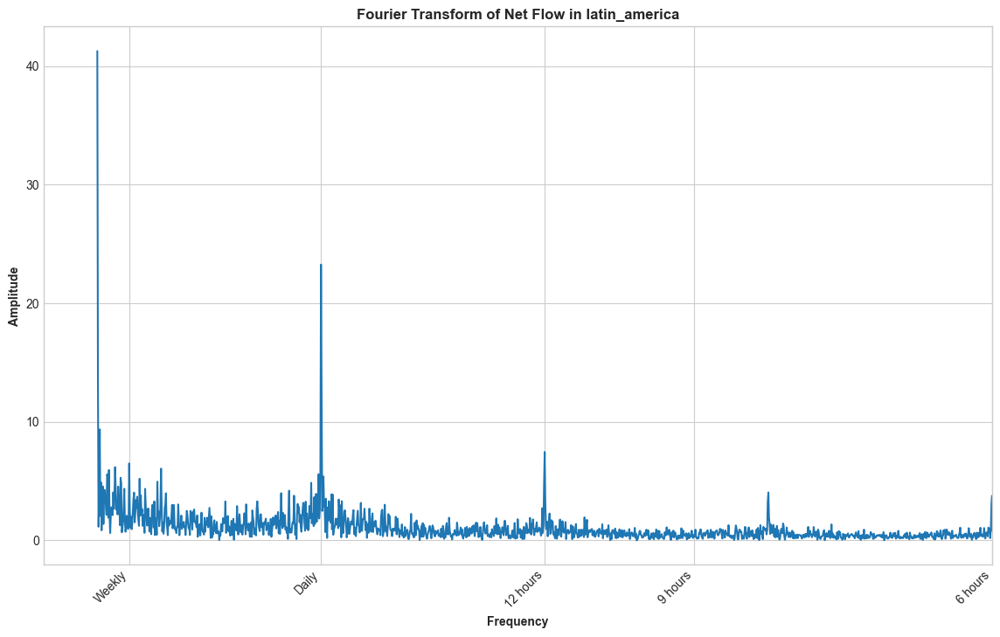

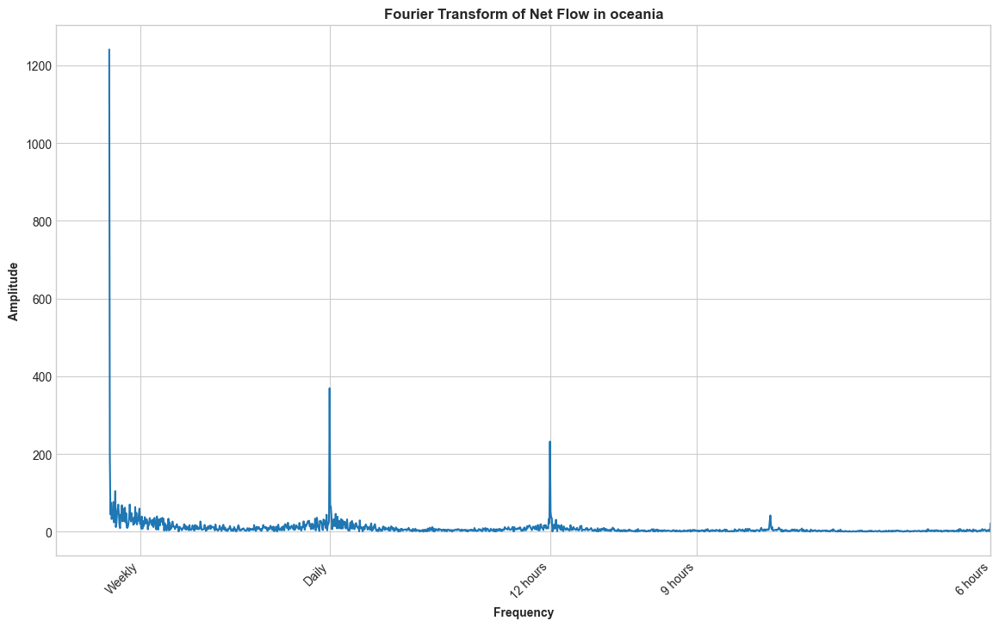

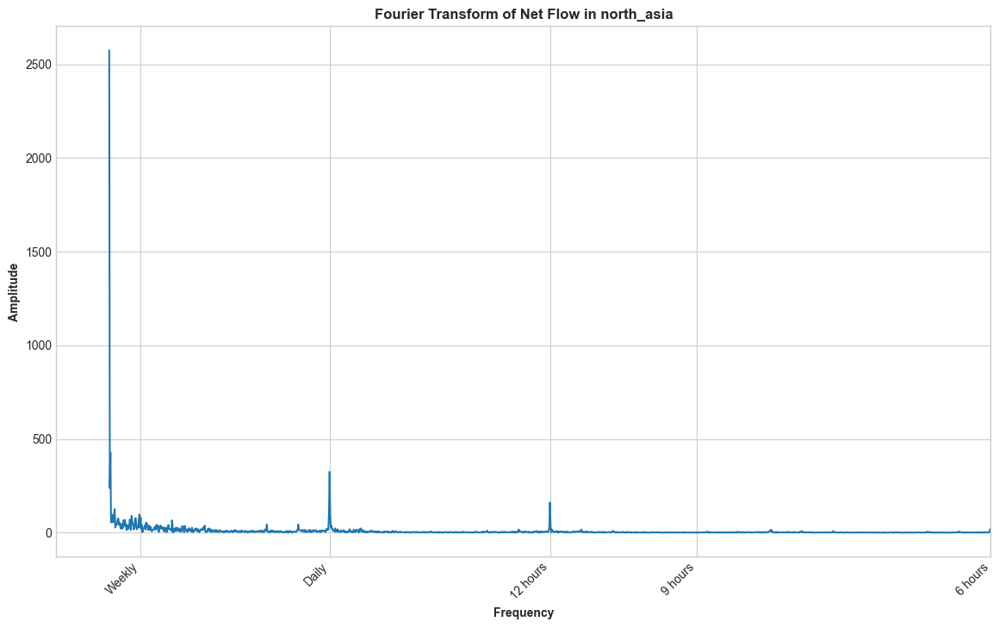

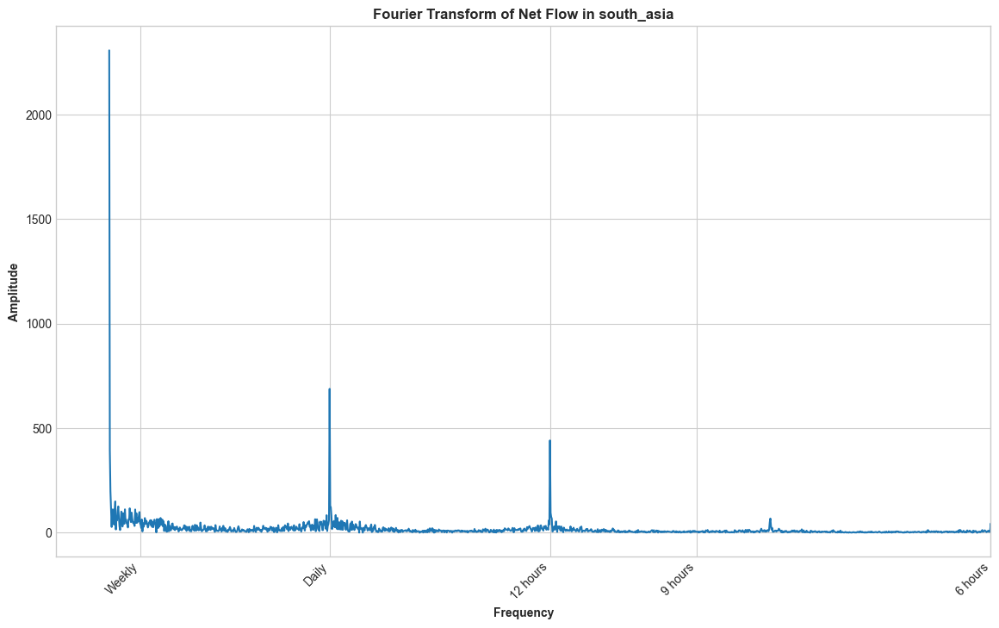

...

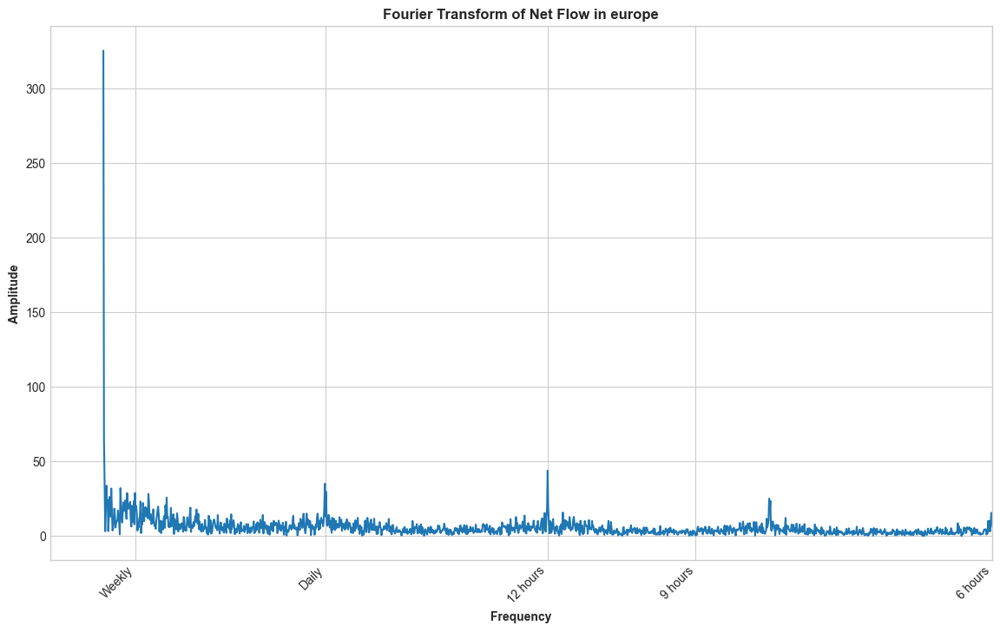

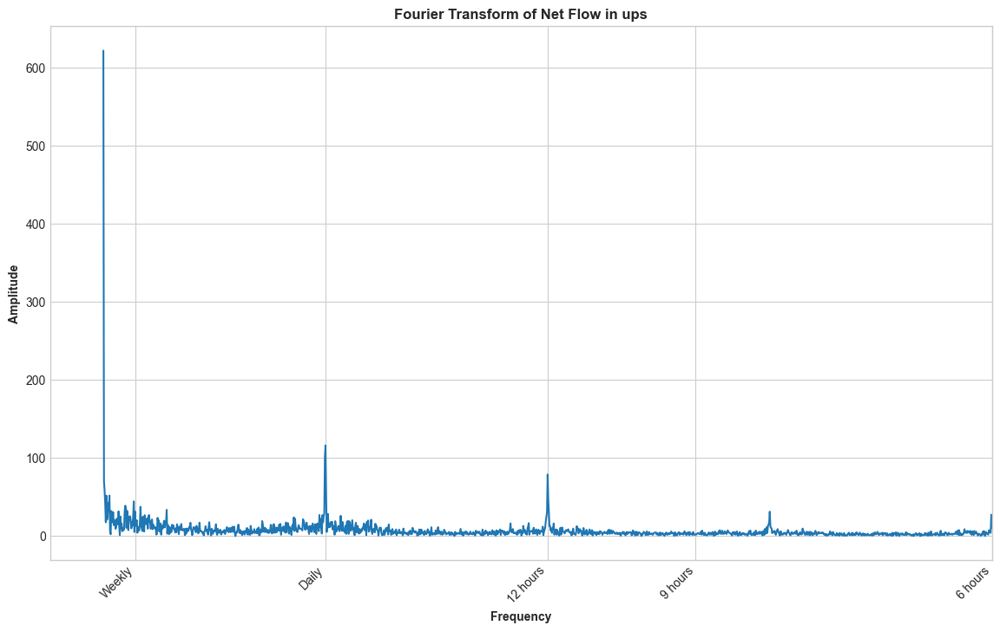

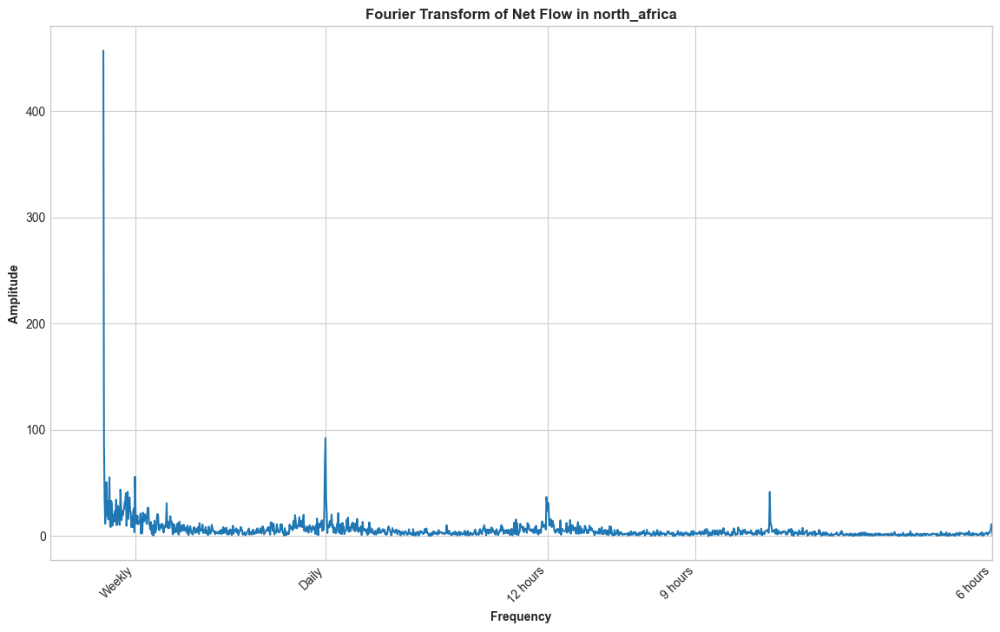

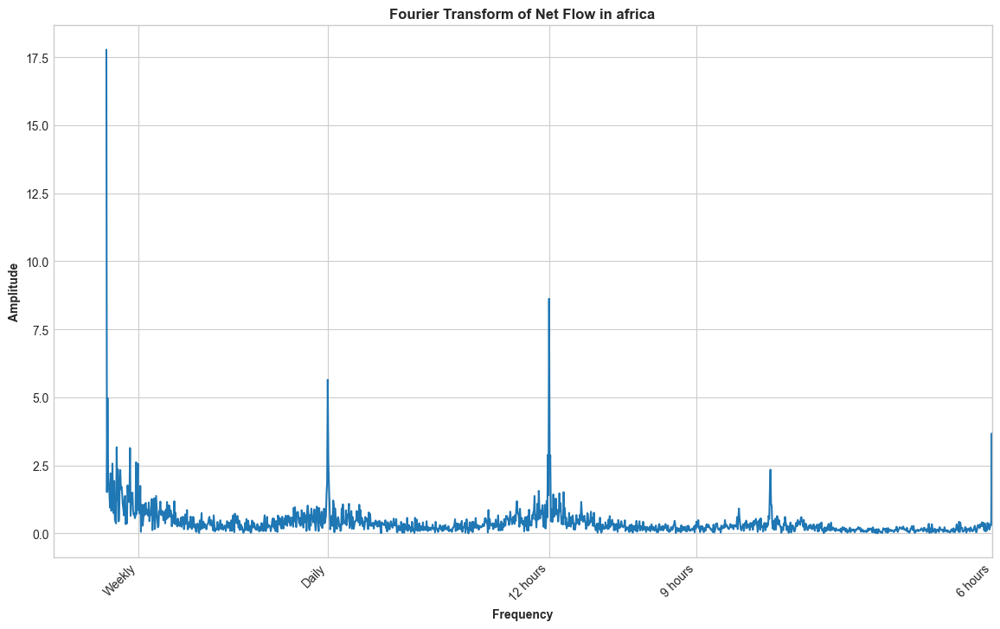

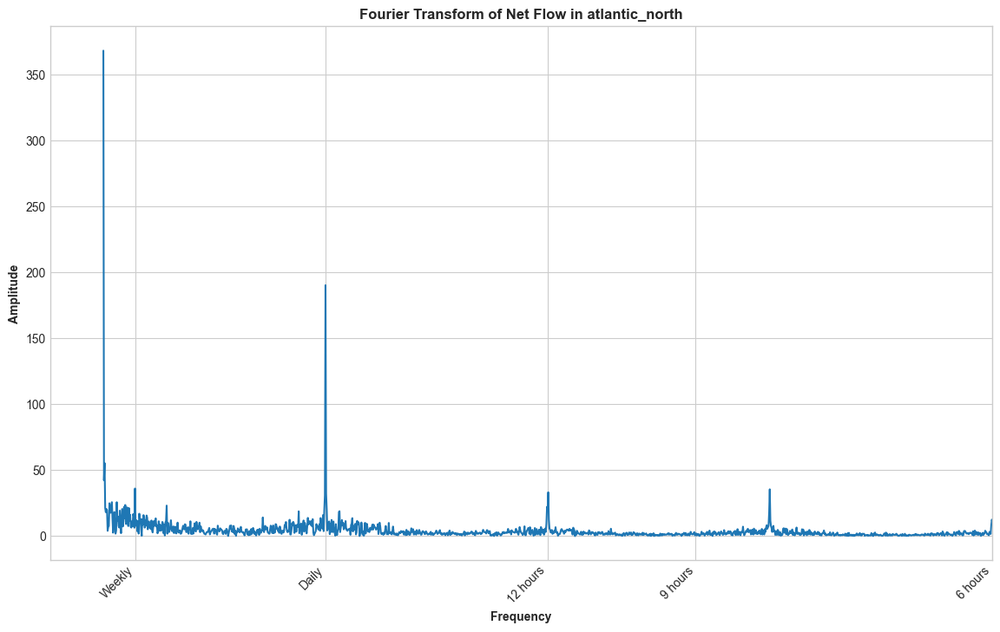

In [154]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Assuming regions_dic is defined
for region_key, region_value in regions_dic.items():
    series = region_value["actualflow"]
    N = len(series)
    T = 1.0  # Sampling interval is 1 hour
    yf = fft(series)
    xf = fftfreq(N, T)[:N // 2]
    
    # Calculate the frequencies for 3-hour, 6-hour, 12-hour, daily, and weekly intervals
    three_hour_freq = 1 / 3.0
    six_hour_freq = 1 / 6.0
    nine_hour_freq = 1 / 9.0
    half_daily_freq = 1 / 12.0
    daily_freq = 1 / 24.0
    weekly_freq = 1 / (24.0 * 7)
    
    frequencies = [three_hour_freq, six_hour_freq, nine_hour_freq,half_daily_freq, daily_freq, weekly_freq]
    labels = ['3 hours', '6 hours', '9 hours', '12 hours', 'Daily', 'Weekly']
    
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.plot(xf, 2.0 / N * np.abs(yf[0:N // 2]))
    
    # Set custom x-ticks and labels
    ax.set_xticks(frequencies)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.set_xlim(-0.01, 1/6)
    
    ax.set_xlabel('Frequency', fontweight='bold')
    ax.set_ylabel('Amplitude', fontweight='bold')
    ax.set_title(f'Fourier Transform of Net Flow in {region_key}', fontweight='bold')
    ax.grid(True, axis='x')
    
    plt.show()


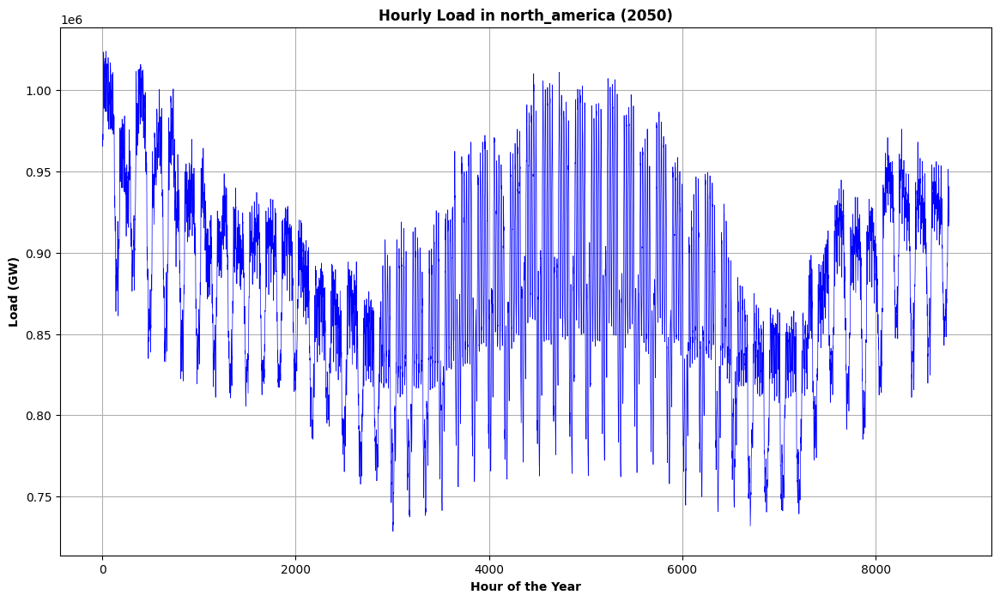

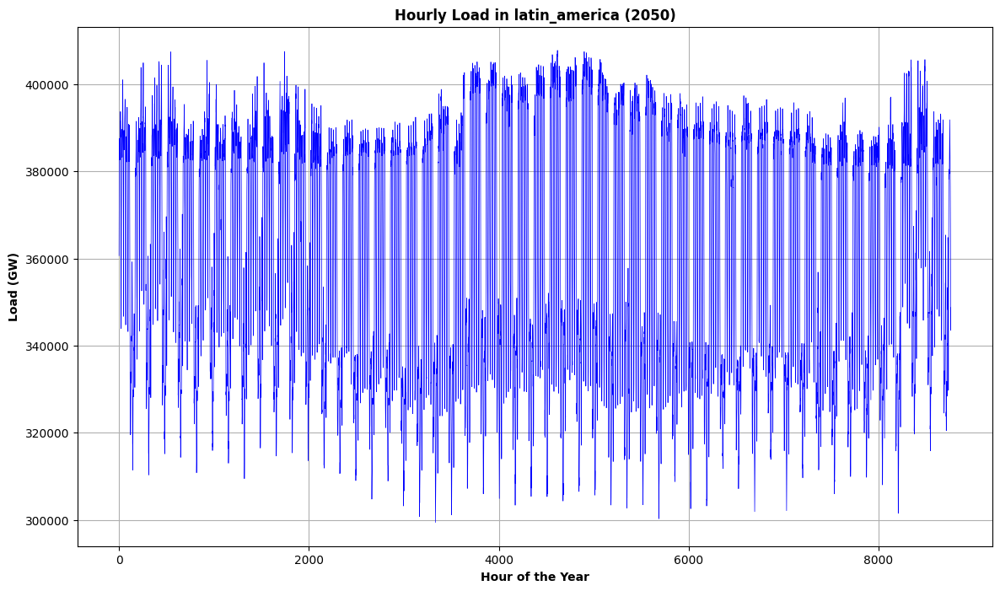

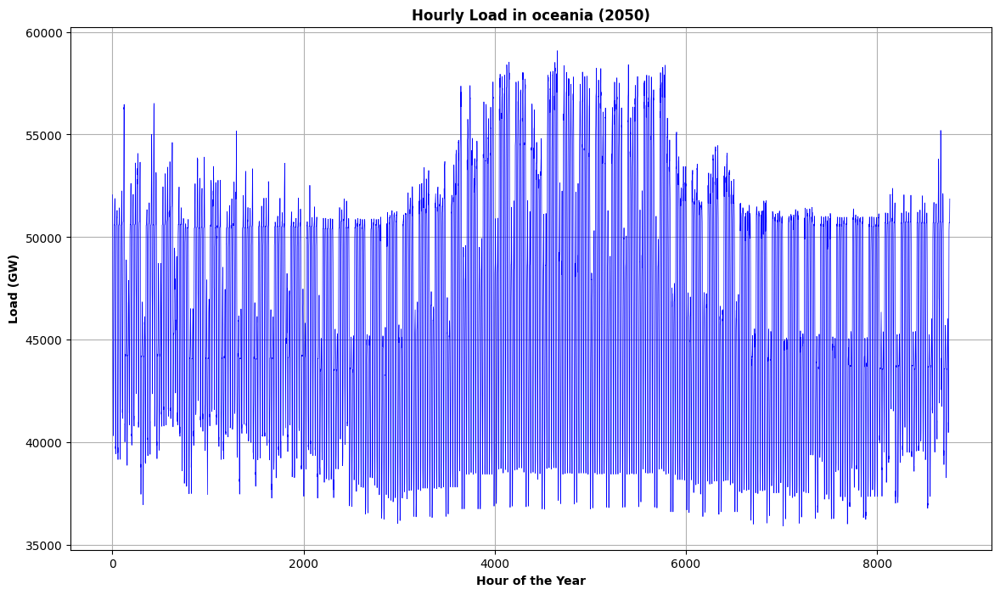

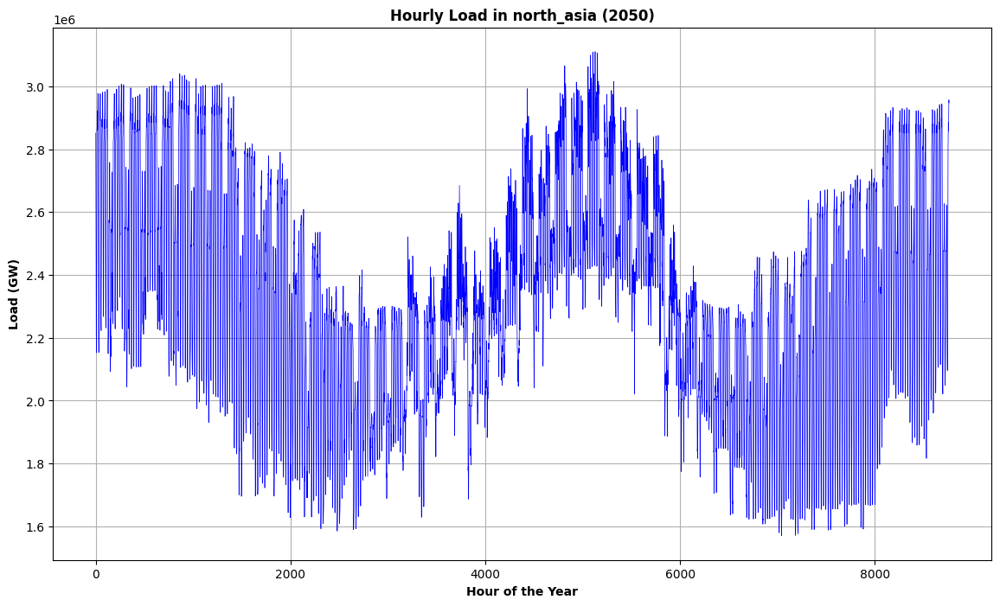

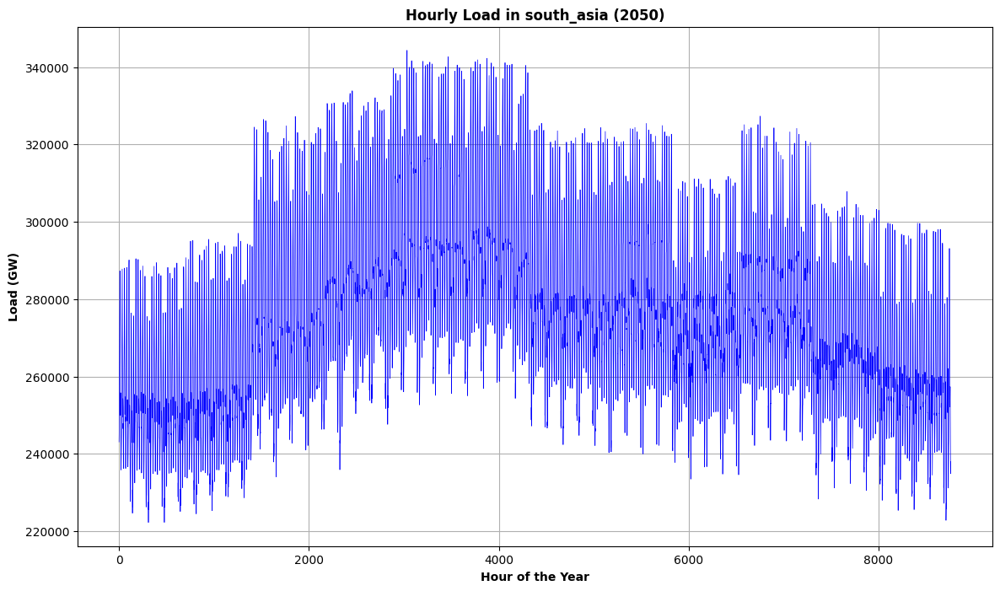

...

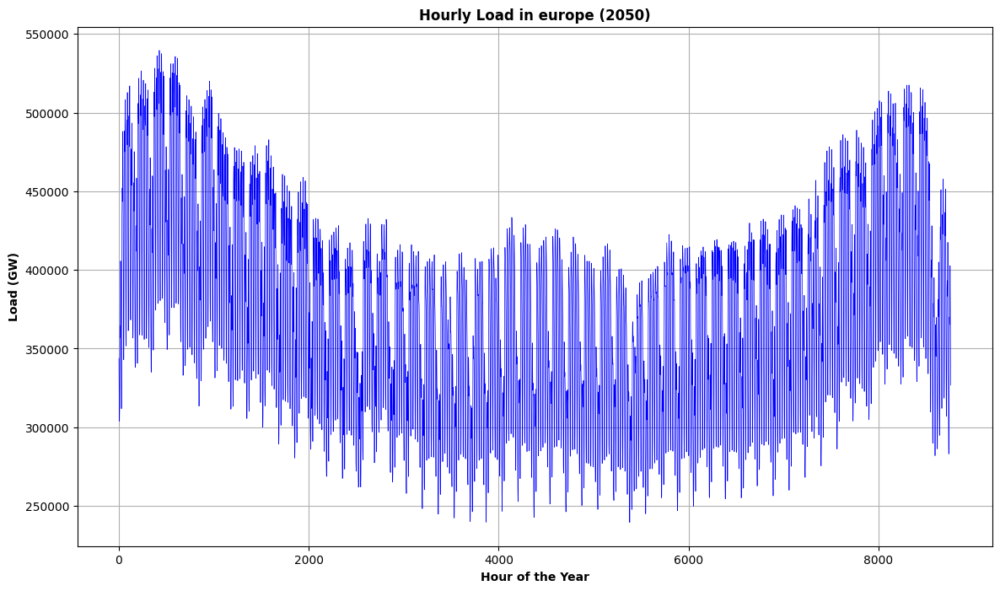

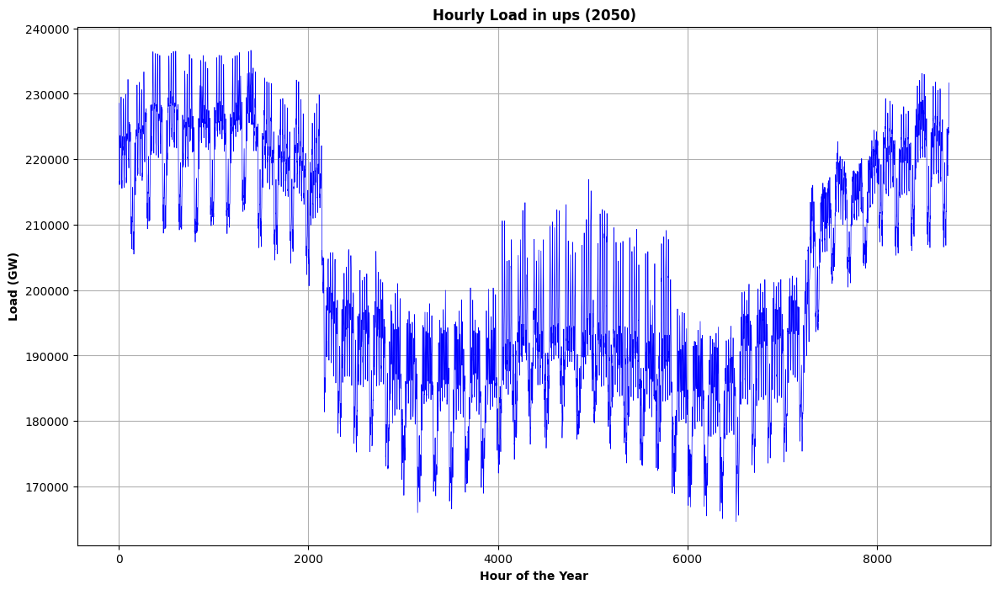

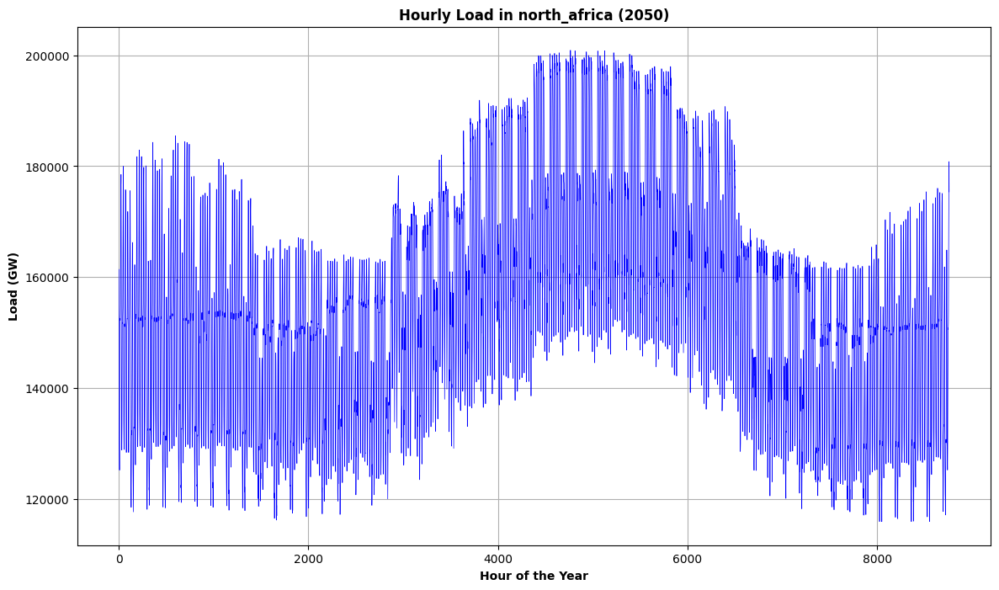

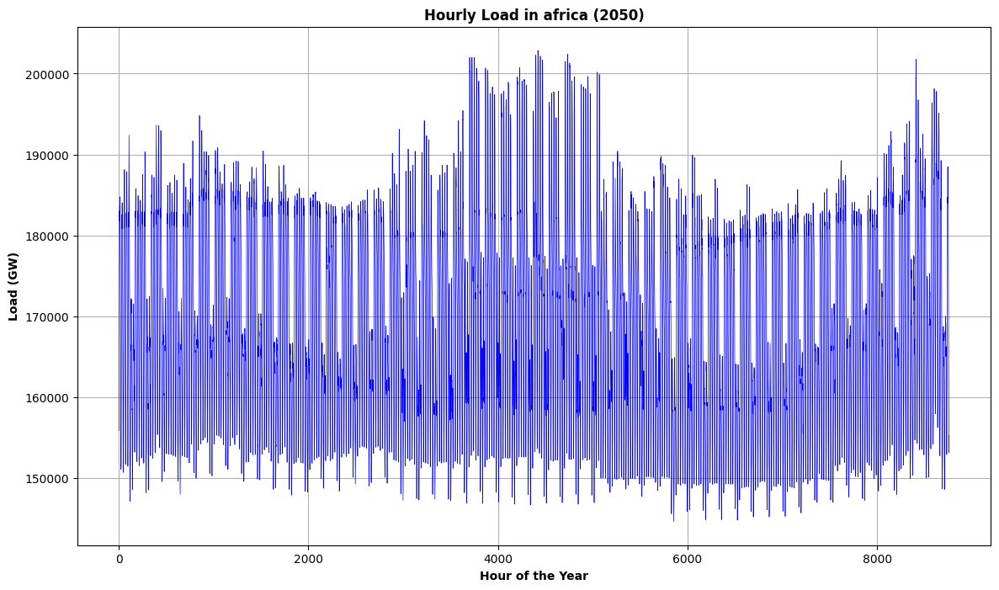

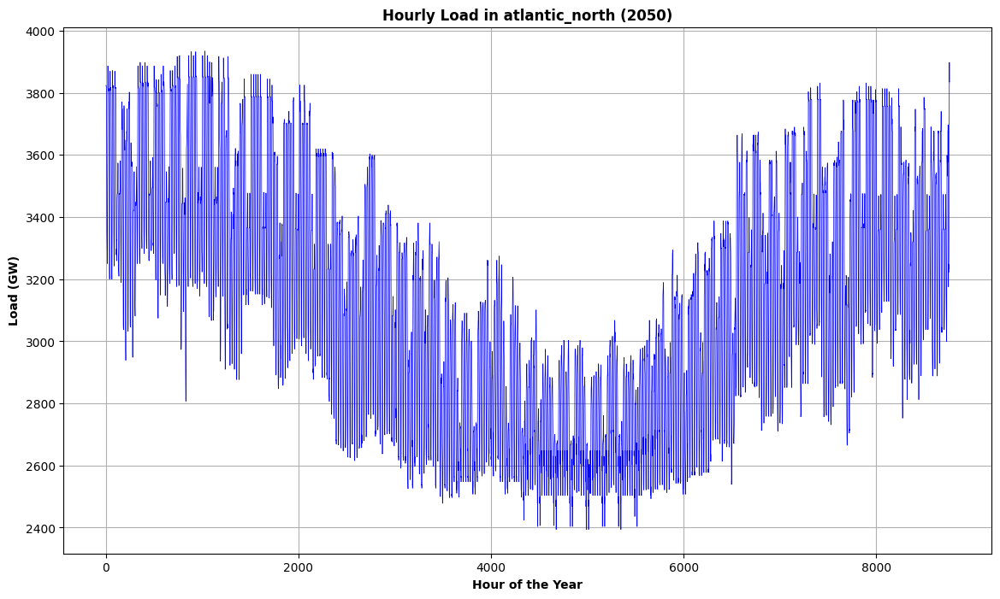

In [ ]:
# Function to plot hourly load values for a region
def plot_hourly_load(region_key, region_name):
    # Extract the hourly load data for the region
    hourly_load = n.loads_t.p.filter(like=f"load_{region_key}")

    # If there are multiple columns for different loads in the region, sum them up
    hourly_load_series = hourly_load.sum(axis=1)

    # Create a DataFrame to hold the hourly load with a datetime index
    hourly_load_df = pd.DataFrame(hourly_load_series, columns=['load'])

    # Create a new column for the hour of the year
    hourly_load_df['hour_of_year'] = range(1, len(hourly_load_df) + 1)

    # Plot the hourly load values
    plt.figure(figsize=(14, 8))
    plt.plot(hourly_load_df['hour_of_year'], hourly_load_df['load'], color='blue', linewidth=0.5)
    plt.xlabel('Hour of the Year', fontweight='bold')
    plt.ylabel('Load (GW)', fontweight='bold')
    plt.title(f'Hourly Load in {region_key} (2050)', fontweight='bold')
    plt.grid(True)
    plt.show()

# Loop through each region and plot the hourly load
for region_key, region_value in regions_dic.items():
    plot_hourly_load(region_key, region_value['bus'])

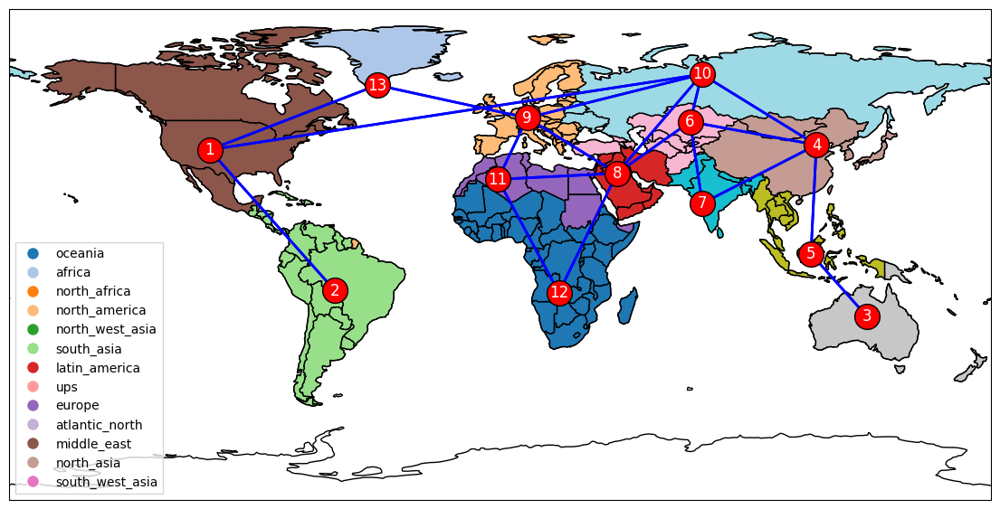

In [ ]:
import warnings
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from pyproj import Geod
import geopandas as gpd
from cartopy.geodesic import Geodesic

warnings.filterwarnings("ignore", category=UserWarning)
plt.rc("figure", figsize=(14, 10))

# Load the naturalearth_lowres dataset
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a column in the world dataframe that matches the bus to country dictionary
world['bus'] = None
for key, value in regions_dic.items():
    for country in value["countries"]:
        world.loc[world['name'] == country, 'bus'] = key

# Plotting the network with results
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -90, 90])  # Adjust extent as needed

# Add base map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot country regions without legend
world.plot(ax=ax, column='bus', cmap='tab20', legend=False, edgecolor='black', transform=ccrs.PlateCarree())

# Create a custom legend
unique_regions = world['bus'].dropna().unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab20(i), markersize=10, label=region) for i, region in enumerate(unique_regions)]
ax.legend(handles=handles, loc='lower left', bbox_to_anchor=(0.0, 0.0), fancybox=False, shadow=False, ncol=1)

for i, bus in enumerate(n.buses.index, start=1):
    x, y = n.buses.loc[bus, ['x', 'y']]
    ax.scatter(x, y, s=400, color='red', edgecolor='k', zorder=5)
    ax.text(x, y, str(i), color='white', fontsize=12, ha='center', va='center', zorder=6)

# Plot links
for link in n.links.index:
    bus0 = n.links.loc[link, 'bus0']
    bus1 = n.links.loc[link, 'bus1']
    x0, y0 = n.buses.loc[bus0, ['x', 'y']]
    x1, y1 = n.buses.loc[bus1, ['x', 'y']]
    ax.plot([x0, x1], [y0, y1], color='blue', linewidth=2, zorder=4)


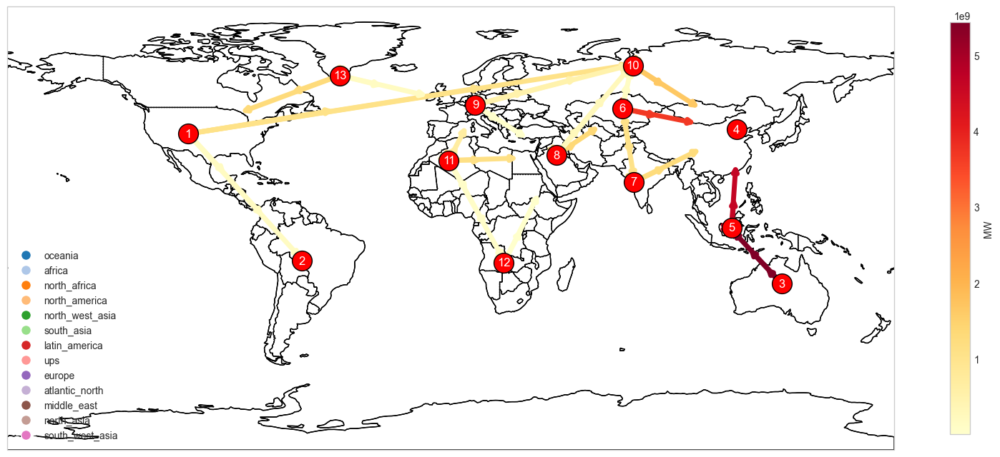

In [155]:
import warnings
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from pyproj import Geod
import geopandas as gpd
import numpy as np

warnings.filterwarnings("ignore", category=UserWarning)
plt.rc("figure", figsize=(20, 15))

# Load the naturalearth_lowres dataset
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a column in the world dataframe that matches the bus to country dictionary
world['bus'] = None
for key, value in regions_dic.items():
    for country in value["countries"]:
        world.loc[world['name'] == country, 'bus'] = key

# Plotting the network with results
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -90, 90])  # Adjust extent as needed

# Add base map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot country regions without legend, setting facecolor to white
world.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())
world.plot(ax=ax, color='white', edgecolor='black', transform=ccrs.PlateCarree())

# Create a custom legend
unique_regions = world['bus'].dropna().unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab20(i), markersize=10, label=region) for i, region in enumerate(unique_regions)]
ax.legend(handles=handles, loc='lower left', bbox_to_anchor=(0.0, 0.0), fancybox=False, shadow=False, ncol=1)

for i, bus in enumerate(n.buses.index, start=1):
    x, y = n.buses.loc[bus, ['x', 'y']]
    ax.scatter(x, y, s=400, color='red', edgecolor='k', zorder=5)
    ax.text(x, y, str(i), color='white', fontsize=12, ha='center', va='center', zorder=6)

# Define the Geod object for WGS84
geod = Geod(ellps="WGS84")

# Placeholder data for the direction and color of arrows
# This should be replaced with actual data
arrow_directions = {link: True for link in n.links.index}  # Example boolean data for direction
arrow_colors = {value['name']: netflows_links[i] for i, (key, value) in enumerate(links_dic.items())}  # Example values for color

# Normalize the arrow color values for the colormap
norm = mcolors.Normalize(vmin=min(arrow_colors.values()), vmax=max(arrow_colors.values()))
cmap = cm.YlOrRd

# Function to calculate offset coordinates
def offset_coordinates(x0, y0, x1, y1, offset):
    dx, dy = x1 - x0, y1 - y0
    length = np.sqrt(dx**2 + dy**2)
    offset_x = -offset * dy / length
    offset_y = offset * dx / length
    return offset_x, offset_y

# Plot links with directional arrows and heatmap colors at 1/3, 2/3, and 3/3 points
for number, (key, value) in enumerate(links_dic.items()):
    bus0 = n.links.loc[f'{value['name']}_0', 'bus0']
    bus1 = n.links.loc[f'{value['name']}_0', 'bus1']
    x0, y0 = n.buses.loc[bus0, ['x', 'y']]
    x1, y1 = n.buses.loc[bus1, ['x', 'y']]
    
    offset_x, offset_y = offset_coordinates(x0, y0, x1, y1, 0.5)  # Adjust offset as needed
    
    # Calculate points at 1/3, 2/3, and 3/3 of the way along the line
    points = [
        (x0 + (x1 - x0) / 3 + offset_x, y0 + (y1 - y0) / 3 + offset_y),
        (x0 + 2 * (x1 - x0) / 3 + offset_x, y0 + 2 * (y1 - y0) / 3 + offset_y),
        (x1 + offset_x, y1 + offset_y)
    ]

    for point in points:
        # Determine the direction of the arrow
        if flow_statements[number]:
            start, end = (x0, y0), point # outflow
        else:
            start, end = (x1, y1), point
        
        # Determine the color of the arrow
        color = cmap(norm(arrow_colors[value['name']]))
        
        # Plot the arrow
        ax.annotate('', xy=end, xytext=start,
                    arrowprops=dict(arrowstyle='->', color=color, linewidth=5))

# Create a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5)
cbar.set_label('MW')

plt.show()
